In [2]:
# Suppress warnings
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

/Users/hunglungo/opt/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Package Preparation

In [1]:
# Import packages for scrapping from IOS App Store
from app_store_scraper import AppStore

# Import packages for data processing
import pandas as pd
import numpy as np
import json

# Import packages for topic modelling
# Reference: https://www.analyticsvidhya.com/blog/2018/10/mining-online-reviews-topic-modeling-lda/
import nltk
from nltk import FreqDist

import re
import spacy

import gensim
from gensim import corpora
from gensim.models import CoherenceModel
from gensim.utils import simple_preprocess

# libraries for visualization
import pyLDAvis
import pyLDAvis.gensim_models
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# text cleaning
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use', 'not', 'would', 'say', 'could', '_', 'be', 'know', 'good', 'go', 'get', 'do', 'done', 'try', 'many', 'some', 'nice', 'thank', 'think', 'see', 'rather', 'easy', 'easily', 'lot', 'lack', 'make', 'want', 'seem', 'run', 'need', 'even', 'right', 'line', 'even', 'also', 'may', 'take', 'come'])

# Wordcloud of Top N words in each topic
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

# Other pre-setting
pd.set_option("display.max_colwidth", 200)

# Function Preparation

In [3]:
# Function - Scrape review data from App Store
def app_store_scrapperNtransformer(app_name,country,how_many,export_csv_name):
    # Scrape the review data
    fetcher = AppStore(country, app_name)
    fetcher.review(how_many)
    
    # Transform data and put in DataFrame
    transformed_dataframe = pd.DataFrame(np.array(fetcher.reviews),columns=['review'])

    transformed_dataframe = transformed_dataframe.join(pd.DataFrame(transformed_dataframe.pop('review').tolist()))

    transformed_dataframe.to_csv(export_csv_name)

In [4]:
# Function - Plot most frequent terms
def freq_words(x, terms = 30):
    all_words = ' '.join([text for text in x])
    all_words = all_words.split()

    fdist = FreqDist(all_words)
    words_df = pd.DataFrame({'word':list(fdist.keys()), 'count':list(fdist.values())})

  # selecting top 20 most frequent words
    d = words_df.nlargest(columns="count", n = terms) 
    plt.figure(figsize=(20,5))
    ax = sns.barplot(data=d, x= "word", y = "count")
    ax.set(ylabel = 'Count')
    plt.show()
    
# use for flattening out list of lists
def flatten(t):
    return [item for sublist in t for item in sublist]

In [5]:
# Text Cleaning
def sent_to_words(sentences):
    for sent in sentences:
        sent = re.sub('\S*@\S*\s?', '', sent)  # remove emails
        sent = re.sub('\s+', ' ', sent)  # remove newline chars
        sent = re.sub("\'", "", sent)  # remove single quotes
        sent = gensim.utils.simple_preprocess(str(sent), deacc=True) 
        yield(sent)  

In [6]:
# !python3 -m spacy download en  # run in terminal once
def process_words(texts, stop_words=stop_words, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """Remove Stopwords, Form Bigrams, Trigrams and Lemmatization"""
    texts = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]
    # texts = [bigram_mod[doc] for doc in texts]
    # texts = [trigram_mod[bigram_mod[doc]] for doc in texts]
    texts_out = []
    nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    # remove stopwords once more after lemmatization
    texts_out = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts_out]    
    return texts_out


In [7]:
# Train LDA models and find optimal number of topics
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=100, chunksize=1000, passes=50)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

# Scrapping Reviews

In [9]:
'''
app_store_scrapperNtransformer(app_name="Triller: Social Videos & Clips",country="us",
                           how_many=5000,export_csv_name="triller_data_us.csv")
'''
# Status: Completed 3100 reviews

'\napp_store_scrapperNtransformer(app_name="Triller: Social Videos & Clips",country="us",\n                           how_many=5000,export_csv_name="triller_data_us.csv")\n'

# Basic Data Preparation

In [10]:
# Import scrapped data
triller_ios_us_review = pd.read_csv("triller_data_us.csv")

In [12]:
# Inspect the data
triller_ios_us_review.head()

,Unnamed: 0,title,date,rating,isEdited,review,userName,developerResponse
0,0,Review,2020-08-08 06:54:06,3,False,"App has many glitches , quality of videos looks blurry (even with great wifi) usually takes a while to adjust and even then the videos still look unclear for the first half while playing ( that’s ...",Mia_1733,NaN
1,1,This App blows and it’s ceo bears a striking resemblance to disgraced movie mogul Harvey Weinstein,2021-07-16 23:15:49,1,False,"I initially downloaded this app because I thought it would be a viable alternative to Tik Tok (which my step-kids say I'm not allowed to download because i'm ""embarrassing"" ...) but boy-oh-boy was...",Defnitely not Ethan Klein,"{'id': 25021772, 'body': 'Hi, thanks for sharing your feedback. We read every review. Can you share your thoughts about what would improve the app? Let us know at Support@Triller.co. Thanks - Team..."
2,2,This app is so awkward,2021-07-15 02:57:41,1,False,"As a big fan of standup comedy, specifically Kevin Hart, I decided to download this app after seeing he was promoted as being a creator. Boy was I disappointed to find out that he’s nowhere to be ...",Virtua Brono,"{'id': 25023036, 'body': ""Hi Virtua Brono, thanks for reaching out. We're sorry to hear you didn't find Kevin Hart on the Triller app. We have lots of independent and amateur creators who are maki..."
3,3,False Advertising,2021-08-04 12:12:09,1,False,"So I am a huge Kevin Hart fan. I have posters of him all over my room and I watch his old stand ups every night before bed and think to myself, “God, I love Kevin Hart”. I even want to name my fut...",sarahjmc419,"{'id': 25023878, 'body': ""Hi Sarah, thanks for reaching out. We're sorry that you didn't find Kevin Hart on the app. We have lots of creators within the community making great content. We hope you..."
4,4,Creative control,2021-03-06 08:13:06,1,False,Seems like there’s more and more creative control taken with every update. Why are we still not able to control how long each video segment is up until it switches to another take? It completely s...,YvngRell45,"{'id': 21817044, 'body': ""Hey YvngRell45, thanks again for your helpful and specific feedback. We hope you've been enjoying Triller since then. We'd love to hear more about your experiences with t..."


In [13]:
# Sort by date, only keep data between 2018 and 2021, clean columns
triller_ios_us_review_YearMonth = (triller_ios_us_review.copy()
                                                      .sort_values(by='date')
                                                      .reset_index()
                                                      .drop(columns=['index','Unnamed: 0'])
                                                      .query("`date` > '2017-12-31 23:59:59' and \
                                                             `date` < '2021-12-31 23:59:59'")
                                     ) 
# Remove time from date column
triller_ios_us_review_YearMonth['date'] = pd.to_datetime(triller_ios_us_review_YearMonth['date']).dt.floor('d')

# Create year column
triller_ios_us_review_YearMonth['year'] = pd.DatetimeIndex(triller_ios_us_review_YearMonth['date']).year

# Create month column
triller_ios_us_review_YearMonth['month'] = pd.DatetimeIndex(triller_ios_us_review_YearMonth['date']).month

2021-10-20 16:01:55,448 [INFO] numexpr.utils - NumExpr defaulting to 8 threads.


In [14]:
# Inspect the dataframe again after cleaning
triller_ios_us_review_YearMonth.head()

,title,date,rating,isEdited,review,userName,developerResponse,year,month
83,good app,2018-01-02,5,False,this is a reallllyyy good app if ur looking to have fun and be cringy and also good if u are rlly bored and just give up and wanna make fun of ur self and cringe ur eyeballs out then this app is t...,basicaff,NaN,2018,1
84,iPhone X Issue,2018-01-09,3,False,Love the app but the screen is off for the iPhone X. The top is cut off and I can’t set my profile picture.,@jaylin.elizabeth,NaN,2018,1
85,UGHH,2018-01-10,3,False,Ok so whenever o try to go inside of someone else’s account or mine. IT LOGS ME OUT!! IDK why it does that but idk if it only happens to me either,LiviBoo😜,NaN,2018,1
86,The idea is nice,2018-01-13,2,False,Downloaded after deleting a while ago to see if they fixed the bugs. They haven’t still can’t use songs from my library only one album of my music shows up and you can’t search songs on their app(...,Skyehigh007,NaN,2018,1
87,I love this app,2018-01-14,5,False,"This app is so much fun and addictive. I really recommend this app,its so much fun and I think that you’ll enjoy it",taytay378,NaN,2018,1


# EDA

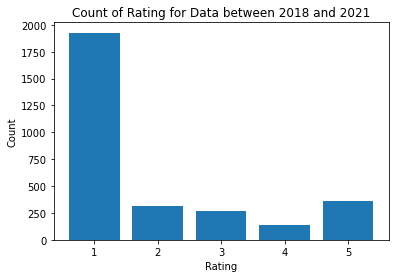

In [15]:
# Plot the count of different ratings for data between 2018 and 2021
triller_ios_us_review_score_count = triller_ios_us_review_YearMonth.groupby(['rating'])[['review']].nunique().rename(columns={'review':'count'})

plt.bar(triller_ios_us_review_score_count.index,triller_ios_us_review_score_count['count'])
plt.xlabel("Rating")
plt.ylabel("Count")
plt.title("Count of Rating for Data between 2018 and 2021")
plt.show()

Text(0.5, 1.0, 'Count of Rating for Each Year between 2018 and 2021')

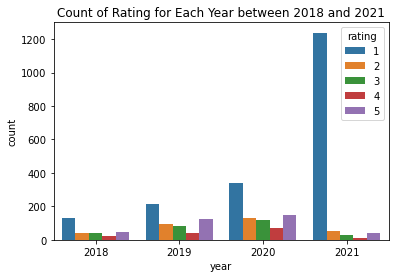

In [16]:
# Plot the count of different ratings for each year
triller_ios_us_review_score_count_ByYear = (triller_ios_us_review_YearMonth.groupby(['year','rating'])[['review']]
                                                                        .nunique()
                                                                        .rename(columns={'review':'count'})
                                                                        .reset_index()
                                              )

(sns.barplot(data=triller_ios_us_review_score_count_ByYear,x='year',y='count',hue='rating')
   .set_title("Count of Rating for Each Year between 2018 and 2021")
)

# Comment: extreme review score on 1 or 5

In [17]:
# Understand average ratings over year
triller_ios_us_review_avg_score_ByYear = (triller_ios_us_review_YearMonth.groupby(['year'])[['rating']]
                                                                       .mean()
                                              )

triller_ios_us_review_avg_score_ByYear['count'] = triller_ios_us_review_score_count_ByYear.groupby('year')[['count']].sum().values

print('Average ratings and count of each year:')
triller_ios_us_review_avg_score_ByYear

Average ratings and count of each year:


,rating,count
year,,
2018,2.306569,274
2019,2.590426,564
2020,2.455556,810
2021,1.222790,1369


# Dataframe Preparation for Topic Modelling

In [18]:
# Dataframe with data between 2018 and 2021 without score or year filtering
triller_ios_us_review_YearMonth.head()

,title,date,rating,isEdited,review,userName,developerResponse,year,month
83,good app,2018-01-02,5,False,this is a reallllyyy good app if ur looking to have fun and be cringy and also good if u are rlly bored and just give up and wanna make fun of ur self and cringe ur eyeballs out then this app is t...,basicaff,NaN,2018,1
84,iPhone X Issue,2018-01-09,3,False,Love the app but the screen is off for the iPhone X. The top is cut off and I can’t set my profile picture.,@jaylin.elizabeth,NaN,2018,1
85,UGHH,2018-01-10,3,False,Ok so whenever o try to go inside of someone else’s account or mine. IT LOGS ME OUT!! IDK why it does that but idk if it only happens to me either,LiviBoo😜,NaN,2018,1
86,The idea is nice,2018-01-13,2,False,Downloaded after deleting a while ago to see if they fixed the bugs. They haven’t still can’t use songs from my library only one album of my music shows up and you can’t search songs on their app(...,Skyehigh007,NaN,2018,1
87,I love this app,2018-01-14,5,False,"This app is so much fun and addictive. I really recommend this app,its so much fun and I think that you’ll enjoy it",taytay378,NaN,2018,1


In [19]:
# Prepare dataframe for topic modelling for each score
# Obtain 5 dataframes with only score=1,2,3,4,5
triller_ios_us_review_YearMonth_score1 = triller_ios_us_review_YearMonth[triller_ios_us_review_YearMonth['rating']==1]
triller_ios_us_review_YearMonth_score2 = triller_ios_us_review_YearMonth[triller_ios_us_review_YearMonth['rating']==2]
triller_ios_us_review_YearMonth_score3 = triller_ios_us_review_YearMonth[triller_ios_us_review_YearMonth['rating']==3]
triller_ios_us_review_YearMonth_score4 = triller_ios_us_review_YearMonth[triller_ios_us_review_YearMonth['rating']==4]
triller_ios_us_review_YearMonth_score5 = triller_ios_us_review_YearMonth[triller_ios_us_review_YearMonth['rating']==5]


In [20]:
# Prepare dataframe for grouped score
triller_ios_us_review_YearMonth_score1N2N3 = triller_ios_us_review_YearMonth[triller_ios_us_review_YearMonth['rating'].isin([1,2,3])]
triller_ios_us_review_YearMonth_score4N5 = triller_ios_us_review_YearMonth[triller_ios_us_review_YearMonth['rating'].isin([4,5])]


In [21]:
# Prepare dataframe for topic modelling for 2018,2019,2020,2021 for score = 1,2,3
triller_ios_us_review_YearMonth_2018_score1N2N3 = triller_ios_us_review_YearMonth[(triller_ios_us_review_YearMonth['year']==2018)&(triller_ios_us_review_YearMonth['rating'].isin([1,2,3]))]
triller_ios_us_review_YearMonth_2019_score1N2N3 = triller_ios_us_review_YearMonth[(triller_ios_us_review_YearMonth['year']==2019)&(triller_ios_us_review_YearMonth['rating'].isin([1,2,3]))]
triller_ios_us_review_YearMonth_2020_score1N2N3 = triller_ios_us_review_YearMonth[(triller_ios_us_review_YearMonth['year']==2020)&(triller_ios_us_review_YearMonth['rating'].isin([1,2,3]))]
triller_ios_us_review_YearMonth_2021_score1N2N3 = triller_ios_us_review_YearMonth[(triller_ios_us_review_YearMonth['year']==2021)&(triller_ios_us_review_YearMonth['rating'].isin([1,2,3]))]




# Overall LDA Topic Modelling

In [182]:
# Overall Topic Modelling - data between 2018 and 2021 without score or year filtering
# Convert to list - move to each section
review_us = triller_ios_us_review_YearMonth.review.values.tolist()
review_words_us = list(sent_to_words(review_us))
print(review_words_us[:1])

[['this', 'is', 'reallllyyy', 'good', 'app', 'if', 'ur', 'looking', 'to', 'have', 'fun', 'and', 'be', 'cringy', 'and', 'also', 'good', 'if', 'are', 'rlly', 'bored', 'and', 'just', 'give', 'up', 'and', 'wanna', 'make', 'fun', 'of', 'ur', 'self', 'and', 'cringe', 'ur', 'eyeballs', 'out', 'then', 'this', 'app', 'is', 'the', 'app', 'for', 'you', 'but', 'rlly', 'it', 'god', 'app', 'if', 'ur', 'boreddd']]


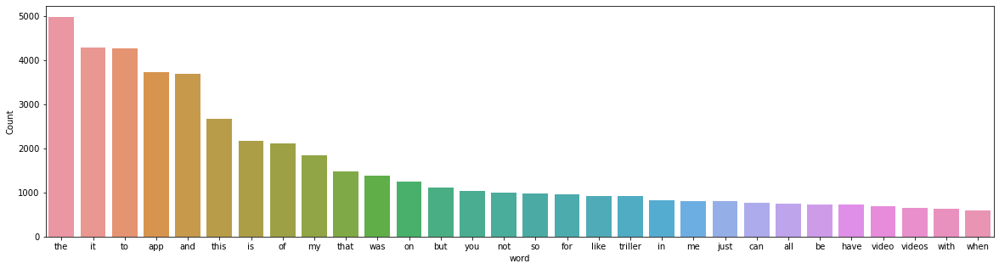

In [183]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us))

In [184]:
# Clean text
review_us_ready = process_words(review_words_us)  # processed Text Data! - move to each section

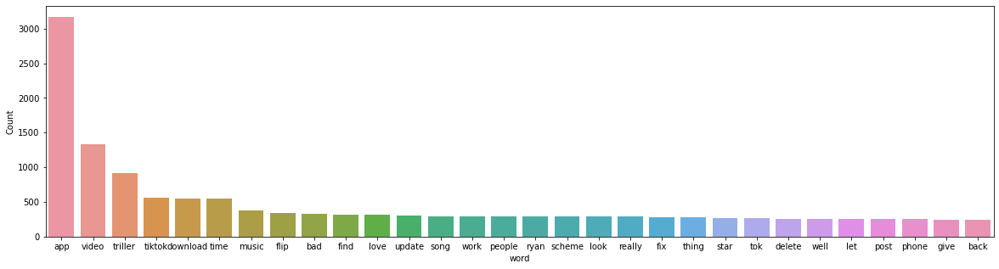

In [185]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_us_ready))

In [186]:
# Create Dictionary
id2word_us = corpora.Dictionary(review_us_ready)

2021-10-20 16:44:45,626 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-20 16:44:45,692 [INFO] gensim.corpora.dictionary - built Dictionary(4217 unique tokens: ['app', 'bore', 'boreddd', 'cringy', 'eyeball']...) from 3017 documents (total 48970 corpus positions)
2021-10-20 16:44:45,693 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(4217 unique tokens: ['app', 'bore', 'boreddd', 'cringy', 'eyeball']...) from 3017 documents (total 48970 corpus positions)", 'datetime': '2021-10-20T16:44:45.693300', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [187]:
# Create Corpus: Term Document Frequency
corpus_us = [id2word_us.doc2bow(text) for text in review_us_ready]

In [188]:
# Training LDA model
model_list_us, coherence_values_us = compute_coherence_values(dictionary=id2word_us, corpus=corpus_us, 
                                                              texts=review_us_ready, limit=30, start=2, step=5)

# Time Start: 03:44
# Time End: 
# Time Used: 

2021-10-20 16:44:45,747 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-20 16:44:45,748 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-20 16:44:45,750 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 16:44:45,752 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 3017 documents, updating model once every 1000 documents, evaluating perplexity every 3017 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-20 16:44:45,753 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #1000/3017
2021-10-20 16:44:46,348 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:44:46,351 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.065*"app" + 0.036*"video" + 0.024*"song" + 0.020*"time" + 0.018*"music" + 0.016*"triller" + 0.014*"save" + 0.013*"keep" + 0.013*"crash" + 0

2021-10-20 16:44:49,007 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.056*"app" + 0.041*"video" + 0.018*"triller" + 0.013*"music" + 0.013*"update" + 0.012*"time" + 0.011*"fix" + 0.010*"love" + 0.009*"let" + 0.009*"song"
2021-10-20 16:44:49,009 [INFO] gensim.models.ldamodel - topic diff=0.385365, rho=0.407671
2021-10-20 16:44:49,010 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #3000/3017
2021-10-20 16:44:49,351 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:44:49,352 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.063*"app" + 0.019*"flip" + 0.018*"download" + 0.016*"triller" + 0.014*"tiktok" + 0.012*"ryan" + 0.011*"scheme" + 0.011*"bad" + 0.011*"look" + 0.010*"thing"
2021-10-20 16:44:49,354 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.057*"app" + 0.039*"video" + 0.017*"triller" + 0.011*"time" + 0.009*"music" + 0.009*"update" + 0.009*"work" + 0.008*"love" + 0.008*"people" + 0.008*"fix"
202

2021-10-20 16:44:50,895 [INFO] gensim.models.ldamodel - topic diff=0.413784, rho=0.353178
2021-10-20 16:44:50,896 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #1000/3017
2021-10-20 16:44:51,108 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:44:51,110 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.059*"app" + 0.026*"flip" + 0.021*"download" + 0.016*"triller" + 0.014*"look" + 0.012*"harvey" + 0.011*"thing" + 0.010*"weinstein" + 0.010*"ryan" + 0.010*"tok"
2021-10-20 16:44:51,111 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.062*"app" + 0.038*"video" + 0.016*"triller" + 0.013*"time" + 0.012*"music" + 0.011*"song" + 0.011*"love" + 0.010*"fix" + 0.010*"work" + 0.010*"let"
2021-10-20 16:44:51,111 [INFO] gensim.models.ldamodel - topic diff=0.258131, rho=0.333019
2021-10-20 16:44:51,112 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #2000/3017
2021-10-20 16:44:51,324 [INFO] gensim.models

2021-10-20 16:44:53,015 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:44:53,017 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.058*"app" + 0.024*"flip" + 0.020*"download" + 0.017*"triller" + 0.014*"ryan" + 0.013*"look" + 0.012*"scheme" + 0.012*"tok" + 0.011*"thing" + 0.011*"kavanaugh"
2021-10-20 16:44:53,018 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.063*"app" + 0.034*"video" + 0.016*"triller" + 0.012*"tiktok" + 0.011*"time" + 0.008*"work" + 0.008*"music" + 0.008*"people" + 0.008*"update" + 0.008*"way"
2021-10-20 16:44:53,019 [INFO] gensim.models.ldamodel - topic diff=0.403270, rho=0.301279
2021-10-20 16:44:53,029 [INFO] gensim.models.ldamodel - -5.894 per-word bound, 59.5 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:44:53,029 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #3017/3017
2021-10-20 16:44:53,036 [INFO] gensim.models.ldamodel - mergin

2021-10-20 16:44:54,488 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:44:54,490 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.058*"app" + 0.027*"flip" + 0.021*"download" + 0.016*"triller" + 0.015*"look" + 0.013*"harvey" + 0.011*"thing" + 0.011*"ryan" + 0.011*"weinstein" + 0.011*"tok"
2021-10-20 16:44:54,491 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.063*"app" + 0.036*"video" + 0.016*"triller" + 0.013*"time" + 0.011*"music" + 0.010*"love" + 0.010*"song" + 0.009*"work" + 0.009*"fix" + 0.009*"update"
2021-10-20 16:44:54,492 [INFO] gensim.models.ldamodel - topic diff=0.205629, rho=0.267099
2021-10-20 16:44:54,493 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #2000/3017
2021-10-20 16:44:54,673 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:44:54,675 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.057*"app" + 0.026*"flip" + 0

2021-10-20 16:44:56,239 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.064*"app" + 0.032*"video" + 0.016*"triller" + 0.013*"tiktok" + 0.011*"time" + 0.008*"work" + 0.008*"music" + 0.008*"people" + 0.008*"update" + 0.008*"way"
2021-10-20 16:44:56,240 [INFO] gensim.models.ldamodel - topic diff=0.324254, rho=0.249867
2021-10-20 16:44:56,253 [INFO] gensim.models.ldamodel - -5.820 per-word bound, 56.5 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:44:56,254 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #3017/3017
2021-10-20 16:44:56,264 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:44:56,266 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.058*"app" + 0.028*"flip" + 0.021*"download" + 0.016*"triller" + 0.015*"look" + 0.013*"harvey" + 0.012*"ryan" + 0.011*"thing" + 0.011*"weinstein" + 0.011*"tok"
2021-10-20 16:44:56,267 [INFO] gensim.models.ldamodel - topic #

2021-10-20 16:44:57,650 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.063*"app" + 0.035*"video" + 0.016*"triller" + 0.012*"time" + 0.010*"music" + 0.010*"love" + 0.009*"tiktok" + 0.009*"song" + 0.009*"work" + 0.009*"fix"
2021-10-20 16:44:57,651 [INFO] gensim.models.ldamodel - topic diff=0.176761, rho=0.229313
2021-10-20 16:44:57,652 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #2000/3017
2021-10-20 16:44:57,823 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:44:57,825 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.057*"app" + 0.026*"flip" + 0.021*"download" + 0.016*"triller" + 0.014*"look" + 0.012*"tok" + 0.012*"harvey" + 0.012*"ryan" + 0.011*"thing" + 0.011*"tik"
2021-10-20 16:44:57,826 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.062*"app" + 0.036*"video" + 0.016*"triller" + 0.012*"time" + 0.011*"tiktok" + 0.011*"music" + 0.010*"update" + 0.009*"love" + 0.009*"work" + 0.009*"fix"
2021

2021-10-20 16:44:59,316 [INFO] gensim.models.ldamodel - topic diff=0.277051, rho=0.218130
2021-10-20 16:44:59,329 [INFO] gensim.models.ldamodel - -5.783 per-word bound, 55.1 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:44:59,329 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #3017/3017
2021-10-20 16:44:59,336 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:44:59,338 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.058*"app" + 0.029*"flip" + 0.021*"download" + 0.016*"triller" + 0.015*"look" + 0.013*"harvey" + 0.012*"ryan" + 0.012*"thing" + 0.012*"weinstein" + 0.011*"tok"
2021-10-20 16:44:59,339 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.065*"app" + 0.030*"video" + 0.015*"triller" + 0.012*"tiktok" + 0.010*"time" + 0.009*"way" + 0.009*"work" + 0.008*"people" + 0.008*"update" + 0.008*"love"
2021-10-20 16:44:59,340 [INFO] gensim.models.ldamodel - topic di

2021-10-20 16:45:00,763 [INFO] gensim.models.ldamodel - topic diff=0.157141, rho=0.204052
2021-10-20 16:45:00,764 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #2000/3017
2021-10-20 16:45:00,950 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:00,951 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.057*"app" + 0.027*"flip" + 0.021*"download" + 0.016*"triller" + 0.014*"look" + 0.012*"harvey" + 0.012*"tok" + 0.012*"ryan" + 0.012*"thing" + 0.011*"tik"
2021-10-20 16:45:00,953 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.062*"app" + 0.035*"video" + 0.016*"triller" + 0.012*"time" + 0.011*"tiktok" + 0.010*"music" + 0.010*"update" + 0.009*"love" + 0.009*"work" + 0.009*"fix"
2021-10-20 16:45:00,953 [INFO] gensim.models.ldamodel - topic diff=0.173290, rho=0.204052
2021-10-20 16:45:00,954 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #3000/3017
2021-10-20 16:45:01,152 [INFO] gensim.model

2021-10-20 16:45:02,327 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #3017/3017
2021-10-20 16:45:02,334 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:45:02,335 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.058*"app" + 0.029*"flip" + 0.021*"download" + 0.016*"triller" + 0.015*"look" + 0.013*"harvey" + 0.012*"ryan" + 0.012*"thing" + 0.012*"weinstein" + 0.011*"ceo"
2021-10-20 16:45:02,336 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.065*"app" + 0.030*"video" + 0.015*"triller" + 0.012*"tiktok" + 0.010*"time" + 0.009*"way" + 0.008*"work" + 0.008*"people" + 0.008*"update" + 0.008*"love"
2021-10-20 16:45:02,337 [INFO] gensim.models.ldamodel - topic diff=0.233314, rho=0.196052
2021-10-20 16:45:02,337 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #1000/3017
2021-10-20 16:45:02,510 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-

2021-10-20 16:45:03,859 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.057*"app" + 0.027*"flip" + 0.021*"download" + 0.016*"triller" + 0.015*"look" + 0.012*"harvey" + 0.012*"ryan" + 0.012*"thing" + 0.011*"tok" + 0.011*"weinstein"
2021-10-20 16:45:03,860 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.063*"app" + 0.035*"video" + 0.016*"triller" + 0.012*"time" + 0.011*"tiktok" + 0.010*"music" + 0.010*"update" + 0.009*"love" + 0.009*"work" + 0.008*"fix"
2021-10-20 16:45:03,860 [INFO] gensim.models.ldamodel - topic diff=0.157335, rho=0.185641
2021-10-20 16:45:03,861 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #3000/3017
2021-10-20 16:45:04,055 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:04,057 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.056*"app" + 0.028*"flip" + 0.020*"download" + 0.017*"triller" + 0.015*"ryan" + 0.014*"look" + 0.012*"scheme" + 0.012*"thing" + 0.012*"harvey" + 0.012

2021-10-20 16:45:05,233 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.058*"app" + 0.029*"flip" + 0.021*"download" + 0.016*"triller" + 0.015*"look" + 0.013*"harvey" + 0.012*"ryan" + 0.012*"thing" + 0.012*"weinstein" + 0.011*"ceo"
2021-10-20 16:45:05,234 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.064*"app" + 0.030*"video" + 0.015*"triller" + 0.012*"tiktok" + 0.010*"time" + 0.009*"way" + 0.008*"work" + 0.008*"update" + 0.008*"people" + 0.008*"love"
2021-10-20 16:45:05,235 [INFO] gensim.models.ldamodel - topic diff=0.213439, rho=0.179556
2021-10-20 16:45:05,235 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1000/3017
2021-10-20 16:45:05,423 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:05,425 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.057*"app" + 0.029*"flip" + 0.021*"download" + 0.016*"triller" + 0.015*"look" + 0.013*"harvey" + 0.012*"ryan" + 0.012*"thing" + 0.011*"weinstein" + 0

2021-10-20 16:45:06,791 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.063*"app" + 0.034*"video" + 0.016*"triller" + 0.012*"time" + 0.011*"tiktok" + 0.010*"music" + 0.010*"update" + 0.009*"love" + 0.009*"work" + 0.008*"fix"
2021-10-20 16:45:06,791 [INFO] gensim.models.ldamodel - topic diff=0.145015, rho=0.171456
2021-10-20 16:45:06,792 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #3000/3017
2021-10-20 16:45:06,984 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:06,985 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.056*"app" + 0.028*"flip" + 0.020*"download" + 0.017*"triller" + 0.015*"ryan" + 0.014*"look" + 0.012*"harvey" + 0.012*"scheme" + 0.012*"thing" + 0.012*"kavanaugh"
2021-10-20 16:45:06,986 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.064*"app" + 0.031*"video" + 0.016*"triller" + 0.013*"tiktok" + 0.011*"time" + 0.008*"music" + 0.008*"work" + 0.008*"update" + 0.008*"people" + 0.0

2021-10-20 16:45:08,165 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.064*"app" + 0.030*"video" + 0.015*"triller" + 0.012*"tiktok" + 0.010*"time" + 0.009*"way" + 0.008*"work" + 0.008*"update" + 0.008*"people" + 0.008*"love"
2021-10-20 16:45:08,165 [INFO] gensim.models.ldamodel - topic diff=0.197863, rho=0.166627
2021-10-20 16:45:08,166 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1000/3017
2021-10-20 16:45:08,341 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:08,343 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.057*"app" + 0.029*"flip" + 0.021*"download" + 0.016*"triller" + 0.015*"look" + 0.013*"harvey" + 0.012*"ryan" + 0.012*"thing" + 0.011*"weinstein" + 0.011*"ceo"
2021-10-20 16:45:08,345 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.063*"app" + 0.033*"video" + 0.016*"triller" + 0.012*"time" + 0.010*"tiktok" + 0.010*"music" + 0.009*"love" + 0.009*"work" + 0.008*"update" + 0.008*"

2021-10-20 16:45:09,710 [INFO] gensim.models.ldamodel - topic diff=0.135189, rho=0.160093
2021-10-20 16:45:09,710 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #3000/3017
2021-10-20 16:45:09,915 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:09,916 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.056*"app" + 0.028*"flip" + 0.021*"download" + 0.017*"triller" + 0.015*"ryan" + 0.014*"look" + 0.012*"harvey" + 0.012*"thing" + 0.012*"scheme" + 0.012*"kavanaugh"
2021-10-20 16:45:09,917 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.064*"app" + 0.031*"video" + 0.016*"triller" + 0.013*"tiktok" + 0.011*"time" + 0.008*"music" + 0.008*"work" + 0.008*"update" + 0.008*"people" + 0.008*"love"
2021-10-20 16:45:09,918 [INFO] gensim.models.ldamodel - topic diff=0.195037, rho=0.160093
2021-10-20 16:45:09,928 [INFO] gensim.models.ldamodel - -5.733 per-word bound, 53.2 perplexity estimate based on a held-out corpu

2021-10-20 16:45:11,106 [INFO] gensim.models.ldamodel - topic diff=0.185293, rho=0.156141
2021-10-20 16:45:11,107 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1000/3017
2021-10-20 16:45:11,276 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:11,278 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.057*"app" + 0.029*"flip" + 0.021*"download" + 0.016*"triller" + 0.015*"look" + 0.013*"harvey" + 0.012*"ryan" + 0.012*"thing" + 0.011*"weinstein" + 0.011*"ceo"
2021-10-20 16:45:11,279 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.064*"app" + 0.033*"video" + 0.016*"triller" + 0.012*"time" + 0.010*"tiktok" + 0.009*"music" + 0.009*"love" + 0.009*"work" + 0.008*"update" + 0.008*"fix"
2021-10-20 16:45:11,279 [INFO] gensim.models.ldamodel - topic diff=0.117903, rho=0.154272
2021-10-20 16:45:11,281 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #2000/3017
2021-10-20 16:45:11,460 [INFO] gensim

2021-10-20 16:45:12,826 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:12,828 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.056*"app" + 0.028*"flip" + 0.021*"download" + 0.017*"triller" + 0.015*"ryan" + 0.014*"look" + 0.012*"harvey" + 0.012*"thing" + 0.012*"scheme" + 0.012*"kavanaugh"
2021-10-20 16:45:12,829 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.064*"app" + 0.031*"video" + 0.016*"triller" + 0.013*"tiktok" + 0.011*"time" + 0.008*"music" + 0.008*"work" + 0.008*"update" + 0.008*"people" + 0.008*"love"
2021-10-20 16:45:12,830 [INFO] gensim.models.ldamodel - topic diff=0.182231, rho=0.150727
2021-10-20 16:45:12,841 [INFO] gensim.models.ldamodel - -5.725 per-word bound, 52.9 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:45:12,841 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #3017/3017
2021-10-20 16:45:12,849 [INFO] gensim.models.ldamodel - m

2021-10-20 16:45:14,206 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:14,208 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.057*"app" + 0.029*"flip" + 0.021*"download" + 0.016*"triller" + 0.015*"look" + 0.013*"harvey" + 0.012*"ryan" + 0.012*"thing" + 0.011*"weinstein" + 0.011*"ceo"
2021-10-20 16:45:14,209 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.064*"app" + 0.033*"video" + 0.016*"triller" + 0.012*"time" + 0.010*"tiktok" + 0.009*"music" + 0.009*"love" + 0.009*"work" + 0.008*"update" + 0.008*"fix"
2021-10-20 16:45:14,210 [INFO] gensim.models.ldamodel - topic diff=0.111329, rho=0.145839
2021-10-20 16:45:14,211 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #2000/3017
2021-10-20 16:45:14,400 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:14,401 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.057*"app" + 0.028*"flip" +

2021-10-20 16:45:15,774 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.056*"app" + 0.029*"flip" + 0.021*"download" + 0.017*"triller" + 0.015*"look" + 0.015*"ryan" + 0.013*"harvey" + 0.012*"thing" + 0.012*"scheme" + 0.012*"kavanaugh"
2021-10-20 16:45:15,775 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.064*"app" + 0.031*"video" + 0.016*"triller" + 0.013*"tiktok" + 0.011*"time" + 0.008*"music" + 0.008*"work" + 0.008*"update" + 0.008*"people" + 0.008*"love"
2021-10-20 16:45:15,775 [INFO] gensim.models.ldamodel - topic diff=0.171425, rho=0.142832
2021-10-20 16:45:15,784 [INFO] gensim.models.ldamodel - -5.719 per-word bound, 52.7 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:45:15,785 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #3017/3017
2021-10-20 16:45:15,790 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:45:15,792 [INFO] gensim.models.ldamodel - top

2021-10-20 16:45:17,264 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.057*"app" + 0.029*"flip" + 0.021*"download" + 0.016*"triller" + 0.015*"look" + 0.013*"harvey" + 0.013*"ryan" + 0.012*"thing" + 0.011*"weinstein" + 0.011*"ceo"
2021-10-20 16:45:17,265 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.064*"app" + 0.033*"video" + 0.016*"triller" + 0.012*"time" + 0.010*"tiktok" + 0.009*"music" + 0.009*"love" + 0.008*"work" + 0.008*"update" + 0.008*"fix"
2021-10-20 16:45:17,265 [INFO] gensim.models.ldamodel - topic diff=0.105744, rho=0.138652
2021-10-20 16:45:17,266 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #2000/3017
2021-10-20 16:45:17,465 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:17,466 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.057*"app" + 0.028*"flip" + 0.021*"download" + 0.016*"triller" + 0.015*"look" + 0.013*"harvey" + 0.013*"ryan" + 0.012*"thing" + 0.011*"weinstein" + 0.

2021-10-20 16:45:21,239 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.028*"song" + 0.026*"triller" + 0.026*"second" + 0.025*"music" + 0.024*"video" + 0.021*"update" + 0.020*"change" + 0.018*"time" + 0.013*"app" + 0.013*"start"
2021-10-20 16:45:21,241 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.039*"triller" + 0.026*"love" + 0.020*"app" + 0.017*"video" + 0.016*"let" + 0.015*"music" + 0.014*"work" + 0.012*"back" + 0.012*"second" + 0.011*"fix"
2021-10-20 16:45:21,241 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.053*"app" + 0.029*"video" + 0.022*"download" + 0.020*"second" + 0.020*"triller" + 0.019*"really" + 0.018*"love" + 0.017*"song" + 0.012*"music" + 0.012*"time"
2021-10-20 16:45:21,242 [INFO] gensim.models.ldamodel - topic diff=6.217076, rho=1.000000
2021-10-20 16:45:21,243 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #2000/3017
2021-10-20 16:45:21,607 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documen

2021-10-20 16:45:22,693 [INFO] gensim.models.ldamodel - topic diff=0.512091, rho=0.446455
2021-10-20 16:45:22,693 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #3000/3017
2021-10-20 16:45:23,044 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:23,047 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.057*"flip" + 0.050*"app" + 0.026*"ryan" + 0.026*"scheme" + 0.024*"kavanaugh" + 0.023*"partner" + 0.022*"accuse" + 0.019*"download" + 0.018*"triller" + 0.016*"ex"
2021-10-20 16:45:23,048 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.074*"app" + 0.022*"review" + 0.020*"video" + 0.020*"triller" + 0.017*"star" + 0.015*"content" + 0.014*"give" + 0.010*"glitchy" + 0.010*"people" + 0.009*"bad"
2021-10-20 16:45:23,049 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.077*"tiktok" + 0.060*"app" + 0.032*"download" + 0.019*"really" + 0.014*"triller" + 0.013*"much" + 0.013*"video" + 0.010*"ad" + 0.009*"well" + 

2021-10-20 16:45:24,019 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.054*"harvey" + 0.047*"weinstein" + 0.031*"look" + 0.019*"triller" + 0.019*"accuse" + 0.018*"pay" + 0.016*"tik" + 0.016*"tok" + 0.015*"partner" + 0.015*"begin"
2021-10-20 16:45:24,020 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.086*"app" + 0.022*"give" + 0.021*"realize" + 0.019*"experience" + 0.016*"bad" + 0.016*"family" + 0.015*"glitchy" + 0.015*"star" + 0.014*"triller" + 0.014*"review"
2021-10-20 16:45:24,021 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.080*"app" + 0.030*"ceo" + 0.028*"video" + 0.023*"time" + 0.016*"download" + 0.015*"fix" + 0.014*"triller" + 0.014*"phone" + 0.012*"man" + 0.011*"love"
2021-10-20 16:45:24,022 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.055*"tiktok" + 0.047*"app" + 0.026*"really" + 0.023*"download" + 0.021*"situation" + 0.016*"entire" + 0.015*"much" + 0.015*"honestly" + 0.014*"work" + 0.014*"way"
2021-10-20 16:45:24,022 [INFO] gensim.models.ldamodel - topi

2021-10-20 16:45:25,088 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.050*"tiktok" + 0.043*"app" + 0.027*"really" + 0.021*"download" + 0.017*"situation" + 0.016*"entire" + 0.015*"much" + 0.015*"hospital" + 0.014*"honestly" + 0.014*"work"
2021-10-20 16:45:25,089 [INFO] gensim.models.ldamodel - topic diff=0.287609, rho=0.353178
2021-10-20 16:45:25,090 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #2000/3017
2021-10-20 16:45:25,317 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:25,320 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.044*"harvey" + 0.037*"weinstein" + 0.030*"look" + 0.019*"accuse" + 0.019*"pay" + 0.018*"tok" + 0.017*"tik" + 0.017*"partner" + 0.016*"triller" + 0.014*"begin"
2021-10-20 16:45:25,321 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.040*"song" + 0.033*"old" + 0.030*"triller" + 0.030*"back" + 0.030*"update" + 0.026*"change" + 0.023*"video" + 0.021*"new" + 0.019*"seco

2021-10-20 16:45:26,273 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.073*"app" + 0.061*"flip" + 0.033*"download" + 0.032*"ryan" + 0.029*"kavanaugh" + 0.024*"scheme" + 0.023*"thing" + 0.023*"triller" + 0.018*"find" + 0.017*"tok"
2021-10-20 16:45:26,274 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.043*"harvey" + 0.037*"weinstein" + 0.028*"look" + 0.025*"accuse" + 0.021*"partner" + 0.019*"pay" + 0.018*"scheme" + 0.017*"triller" + 0.015*"tok" + 0.015*"ex"
2021-10-20 16:45:26,275 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.074*"app" + 0.043*"video" + 0.022*"time" + 0.019*"triller" + 0.016*"ceo" + 0.014*"fix" + 0.013*"phone" + 0.013*"download" + 0.012*"post" + 0.011*"let"
2021-10-20 16:45:26,276 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.083*"tiktok" + 0.041*"app" + 0.024*"really" + 0.022*"download" + 0.019*"honestly" + 0.015*"quality" + 0.014*"much" + 0.014*"content" + 0.013*"way" + 0.012*"work"
2021-10-20 16:45:26,276 [INFO] gensim.models.ldamodel - topic dif

2021-10-20 16:45:26,985 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.048*"lead" + 0.045*"old" + 0.027*"song" + 0.026*"triller" + 0.025*"hate" + 0.023*"user" + 0.023*"account" + 0.022*"stop" + 0.021*"back" + 0.020*"figure"
2021-10-20 16:45:26,986 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.071*"app" + 0.032*"video" + 0.026*"ceo" + 0.025*"time" + 0.019*"triller" + 0.016*"fix" + 0.015*"phone" + 0.015*"download" + 0.011*"post" + 0.011*"first"
2021-10-20 16:45:26,987 [INFO] gensim.models.ldamodel - topic diff=0.305154, rho=0.315959
2021-10-20 16:45:26,987 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #1000/3017
2021-10-20 16:45:27,175 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:27,178 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.093*"app" + 0.027*"bad" + 0.024*"give" + 0.021*"experience" + 0.018*"star" + 0.016*"realize" + 0.014*"glitchy" + 0.014*"review" + 0.012*"tiktok" + 0.012*"sl

2021-10-20 16:45:28,074 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.061*"tiktok" + 0.037*"app" + 0.025*"really" + 0.018*"download" + 0.016*"entire" + 0.016*"honestly" + 0.015*"pretty" + 0.014*"much" + 0.014*"situation" + 0.014*"quality"
2021-10-20 16:45:28,075 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.081*"app" + 0.075*"flip" + 0.041*"download" + 0.029*"ryan" + 0.029*"kavanaugh" + 0.023*"thing" + 0.022*"tok" + 0.021*"triller" + 0.018*"tik" + 0.014*"scheme"
2021-10-20 16:45:28,076 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.044*"harvey" + 0.037*"weinstein" + 0.033*"look" + 0.025*"accuse" + 0.023*"partner" + 0.019*"pay" + 0.017*"scheme" + 0.016*"tok" + 0.016*"tik" + 0.015*"ex"
2021-10-20 16:45:28,077 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.079*"app" + 0.034*"video" + 0.023*"people" + 0.021*"weird" + 0.016*"maybe" + 0.016*"keep" + 0.016*"different" + 0.016*"text" + 0.015*"comment" + 0.015*"time"
2021-10-20 16:45:28,078 [INFO] gensim.models.ldamodel - 

2021-10-20 16:45:28,966 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.036*"song" + 0.028*"triller" + 0.027*"back" + 0.026*"video" + 0.024*"update" + 0.023*"old" + 0.022*"change" + 0.021*"second" + 0.020*"new" + 0.019*"music"
2021-10-20 16:45:28,967 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.077*"app" + 0.066*"flip" + 0.037*"download" + 0.034*"ryan" + 0.030*"kavanaugh" + 0.024*"triller" + 0.022*"thing" + 0.021*"scheme" + 0.020*"tok" + 0.017*"find"
2021-10-20 16:45:28,968 [INFO] gensim.models.ldamodel - topic diff=0.209795, rho=0.277169
2021-10-20 16:45:28,979 [INFO] gensim.models.ldamodel - -5.783 per-word bound, 55.0 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:45:28,980 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #3017/3017
2021-10-20 16:45:28,987 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:45:28,990 [INFO] gensim.models.ldamodel - topic #4

2021-10-20 16:45:29,635 [INFO] gensim.models.ldamodel - topic diff=0.257253, rho=0.267099
2021-10-20 16:45:29,636 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #1000/3017
2021-10-20 16:45:29,816 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:29,819 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.084*"app" + 0.084*"flip" + 0.044*"download" + 0.032*"ryan" + 0.031*"kavanaugh" + 0.023*"thing" + 0.022*"triller" + 0.019*"tok" + 0.016*"tik" + 0.015*"awkward"
2021-10-20 16:45:29,820 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.042*"tiktok" + 0.036*"app" + 0.026*"really" + 0.019*"entire" + 0.017*"situation" + 0.017*"hospital" + 0.017*"download" + 0.016*"honestly" + 0.015*"pretty" + 0.014*"much"
2021-10-20 16:45:29,821 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.049*"song" + 0.030*"second" + 0.028*"lead" + 0.028*"video" + 0.025*"triller" + 0.025*"music" + 0.023*"old" + 0.022*"hate" + 0.022*"b

2021-10-20 16:45:30,672 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.077*"app" + 0.033*"video" + 0.023*"people" + 0.022*"weird" + 0.017*"different" + 0.017*"maybe" + 0.016*"text" + 0.015*"comment" + 0.015*"stuff" + 0.015*"keep"
2021-10-20 16:45:30,673 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.041*"song" + 0.032*"video" + 0.029*"update" + 0.028*"back" + 0.027*"triller" + 0.026*"music" + 0.023*"change" + 0.023*"second" + 0.022*"old" + 0.020*"new"
2021-10-20 16:45:30,674 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.044*"harvey" + 0.037*"weinstein" + 0.034*"look" + 0.027*"accuse" + 0.025*"partner" + 0.019*"scheme" + 0.019*"pay" + 0.017*"ex" + 0.016*"tok" + 0.016*"tik"
2021-10-20 16:45:30,674 [INFO] gensim.models.ldamodel - topic diff=0.149707, rho=0.249867
2021-10-20 16:45:30,675 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #3000/3017
2021-10-20 16:45:30,892 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 do

2021-10-20 16:45:31,692 [INFO] gensim.models.ldamodel - topic diff=0.176106, rho=0.242414
2021-10-20 16:45:31,706 [INFO] gensim.models.ldamodel - -5.720 per-word bound, 52.7 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:45:31,707 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #3017/3017
2021-10-20 16:45:31,717 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:45:31,720 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.049*"harvey" + 0.041*"weinstein" + 0.037*"look" + 0.029*"accuse" + 0.028*"partner" + 0.020*"scheme" + 0.019*"ex" + 0.018*"pay" + 0.016*"tok" + 0.016*"tik"
2021-10-20 16:45:31,721 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.070*"app" + 0.034*"video" + 0.025*"time" + 0.024*"ceo" + 0.021*"triller" + 0.016*"fix" + 0.015*"phone" + 0.015*"download" + 0.012*"celebrity" + 0.012*"post"
2021-10-20 16:45:31,722 [INFO] gensim.models.ldamodel - topic #2 

2021-10-20 16:45:32,578 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.038*"tiktok" + 0.034*"app" + 0.026*"really" + 0.020*"entire" + 0.017*"situation" + 0.017*"hospital" + 0.016*"honestly" + 0.016*"download" + 0.016*"pretty" + 0.013*"much"
2021-10-20 16:45:32,578 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.083*"app" + 0.082*"flip" + 0.044*"download" + 0.033*"ryan" + 0.032*"kavanaugh" + 0.023*"triller" + 0.023*"thing" + 0.020*"tok" + 0.017*"tik" + 0.016*"awkward"
2021-10-20 16:45:32,579 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.103*"app" + 0.037*"bad" + 0.023*"tiktok" + 0.022*"give" + 0.020*"experience" + 0.017*"star" + 0.013*"review" + 0.013*"glitchy" + 0.012*"content" + 0.012*"slow"
2021-10-20 16:45:32,580 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.047*"song" + 0.031*"video" + 0.029*"second" + 0.029*"music" + 0.027*"lead" + 0.025*"triller" + 0.022*"back" + 0.022*"update" + 0.021*"old" + 0.021*"hate"
2021-10-20 16:45:32,581 [INFO] gensim.models.ldamodel

2021-10-20 16:45:33,418 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.044*"harvey" + 0.037*"weinstein" + 0.035*"look" + 0.028*"accuse" + 0.027*"partner" + 0.020*"scheme" + 0.018*"pay" + 0.018*"ex" + 0.017*"tok" + 0.016*"tik"
2021-10-20 16:45:33,419 [INFO] gensim.models.ldamodel - topic diff=0.131209, rho=0.223512
2021-10-20 16:45:33,419 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #3000/3017
2021-10-20 16:45:33,643 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:33,646 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.044*"harvey" + 0.037*"weinstein" + 0.033*"look" + 0.032*"accuse" + 0.030*"partner" + 0.024*"scheme" + 0.022*"ex" + 0.018*"pay" + 0.015*"tok" + 0.015*"triller"
2021-10-20 16:45:33,647 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.051*"tiktok" + 0.032*"app" + 0.025*"really" + 0.019*"honestly" + 0.017*"download" + 0.016*"entire" + 0.015*"pretty" + 0.014*"quality" + 0.012*"situ

2021-10-20 16:45:34,370 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.038*"tiktok" + 0.034*"app" + 0.024*"really" + 0.021*"flip" + 0.020*"entire" + 0.018*"situation" + 0.018*"hospital" + 0.016*"honestly" + 0.016*"download" + 0.014*"pretty"
2021-10-20 16:45:34,371 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.038*"lead" + 0.031*"song" + 0.028*"video" + 0.025*"old" + 0.025*"triller" + 0.024*"hate" + 0.023*"music" + 0.023*"back" + 0.021*"update" + 0.020*"account"
2021-10-20 16:45:34,372 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.083*"app" + 0.079*"flip" + 0.045*"download" + 0.035*"ryan" + 0.033*"kavanaugh" + 0.024*"triller" + 0.023*"thing" + 0.020*"tok" + 0.017*"tik" + 0.016*"awkward"
2021-10-20 16:45:34,373 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.048*"harvey" + 0.040*"weinstein" + 0.037*"look" + 0.030*"accuse" + 0.029*"partner" + 0.021*"scheme" + 0.020*"ex" + 0.018*"pay" + 0.017*"tok" + 0.016*"tik"
2021-10-20 16:45:34,374 [INFO] gensim.models.ldamodel - t

2021-10-20 16:45:35,179 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.036*"tiktok" + 0.033*"app" + 0.025*"really" + 0.022*"flip" + 0.020*"entire" + 0.017*"situation" + 0.017*"hospital" + 0.016*"honestly" + 0.015*"download" + 0.015*"pretty"
2021-10-20 16:45:35,180 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.080*"app" + 0.033*"video" + 0.025*"weird" + 0.022*"people" + 0.020*"text" + 0.017*"maybe" + 0.017*"different" + 0.016*"comment" + 0.016*"stuff" + 0.015*"message"
2021-10-20 16:45:35,181 [INFO] gensim.models.ldamodel - topic diff=0.153113, rho=0.208437
2021-10-20 16:45:35,181 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #2000/3017
2021-10-20 16:45:35,373 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:35,376 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.077*"app" + 0.033*"video" + 0.023*"people" + 0.023*"weird" + 0.018*"different" + 0.017*"maybe" + 0.017*"text" + 0.016*"comment" +

2021-10-20 16:45:36,244 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:36,247 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.035*"song" + 0.032*"video" + 0.029*"music" + 0.028*"triller" + 0.026*"back" + 0.025*"update" + 0.023*"second" + 0.021*"change" + 0.020*"old" + 0.019*"new"
2021-10-20 16:45:36,248 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.076*"app" + 0.065*"flip" + 0.039*"download" + 0.038*"ryan" + 0.032*"kavanaugh" + 0.025*"triller" + 0.022*"thing" + 0.021*"tok" + 0.018*"scheme" + 0.017*"tik"
2021-10-20 16:45:36,249 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.100*"app" + 0.035*"bad" + 0.030*"tiktok" + 0.020*"give" + 0.019*"star" + 0.016*"review" + 0.016*"experience" + 0.015*"content" + 0.013*"feel" + 0.012*"well"
2021-10-20 16:45:36,250 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.072*"app" + 0.042*"video" + 0.024*"time" + 0.021*"triller" + 0.017*"ceo" + 0.015*"fix" + 0.015*"phone" 

2021-10-20 16:45:36,903 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.107*"app" + 0.040*"bad" + 0.026*"tiktok" + 0.022*"give" + 0.020*"experience" + 0.016*"star" + 0.013*"review" + 0.013*"glitchy" + 0.013*"content" + 0.011*"feel"
2021-10-20 16:45:36,904 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.071*"app" + 0.035*"video" + 0.025*"time" + 0.023*"ceo" + 0.021*"triller" + 0.016*"phone" + 0.016*"fix" + 0.015*"download" + 0.013*"celebrity" + 0.012*"post"
2021-10-20 16:45:36,905 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.037*"tiktok" + 0.033*"app" + 0.026*"flip" + 0.024*"really" + 0.020*"entire" + 0.018*"situation" + 0.018*"hospital" + 0.016*"honestly" + 0.015*"download" + 0.014*"pretty"
2021-10-20 16:45:36,905 [INFO] gensim.models.ldamodel - topic diff=0.193209, rho=0.199932
2021-10-20 16:45:36,906 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #1000/3017
2021-10-20 16:45:37,080 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into 

2021-10-20 16:45:37,712 [INFO] gensim.models.ldamodel - topic diff=0.139544, rho=0.192390
2021-10-20 16:45:37,712 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #2000/3017
2021-10-20 16:45:37,904 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:37,907 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.044*"harvey" + 0.037*"weinstein" + 0.036*"look" + 0.029*"accuse" + 0.028*"partner" + 0.021*"scheme" + 0.019*"ex" + 0.018*"pay" + 0.017*"tok" + 0.016*"tik"
2021-10-20 16:45:37,909 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.042*"tiktok" + 0.032*"app" + 0.024*"really" + 0.022*"flip" + 0.019*"entire" + 0.016*"honestly" + 0.016*"pretty" + 0.015*"download" + 0.015*"situation" + 0.015*"hospital"
2021-10-20 16:45:37,910 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.077*"app" + 0.034*"video" + 0.023*"people" + 0.023*"weird" + 0.018*"different" + 0.017*"maybe" + 0.017*"text" + 0.016*"terrible" + 0.016

2021-10-20 16:45:38,742 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.044*"harvey" + 0.037*"weinstein" + 0.034*"look" + 0.034*"accuse" + 0.032*"partner" + 0.026*"scheme" + 0.023*"ex" + 0.018*"pay" + 0.016*"tok" + 0.015*"find"
2021-10-20 16:45:38,743 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.102*"app" + 0.035*"bad" + 0.030*"tiktok" + 0.020*"give" + 0.018*"star" + 0.016*"review" + 0.015*"experience" + 0.015*"content" + 0.013*"feel" + 0.012*"well"
2021-10-20 16:45:38,744 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.072*"app" + 0.042*"video" + 0.024*"time" + 0.021*"triller" + 0.017*"ceo" + 0.015*"fix" + 0.015*"phone" + 0.014*"download" + 0.013*"post" + 0.011*"let"
2021-10-20 16:45:38,745 [INFO] gensim.models.ldamodel - topic diff=0.131458, rho=0.188925
2021-10-20 16:45:38,756 [INFO] gensim.models.ldamodel - -5.648 per-word bound, 50.2 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:45:38,756 [INFO] gensim.models.ldamodel - 

2021-10-20 16:45:39,448 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.035*"lead" + 0.032*"song" + 0.030*"video" + 0.028*"music" + 0.026*"triller" + 0.024*"old" + 0.023*"back" + 0.023*"hate" + 0.022*"update" + 0.022*"second"
2021-10-20 16:45:39,449 [INFO] gensim.models.ldamodel - topic diff=0.180458, rho=0.185641
2021-10-20 16:45:39,449 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #1000/3017
2021-10-20 16:45:39,650 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:39,653 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.036*"tiktok" + 0.033*"app" + 0.025*"flip" + 0.025*"really" + 0.020*"entire" + 0.017*"situation" + 0.017*"hospital" + 0.016*"honestly" + 0.015*"pretty" + 0.015*"download"
2021-10-20 16:45:39,654 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.107*"app" + 0.038*"bad" + 0.025*"tiktok" + 0.021*"give" + 0.018*"experience" + 0.016*"star" + 0.013*"review" + 0.012*"glitchy" + 0.012*"c

2021-10-20 16:45:40,629 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.044*"harvey" + 0.037*"weinstein" + 0.036*"look" + 0.030*"accuse" + 0.029*"partner" + 0.022*"scheme" + 0.020*"ex" + 0.018*"pay" + 0.017*"tok" + 0.016*"tik"
2021-10-20 16:45:40,630 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.041*"tiktok" + 0.032*"app" + 0.024*"really" + 0.023*"flip" + 0.019*"entire" + 0.016*"honestly" + 0.016*"pretty" + 0.015*"situation" + 0.015*"download" + 0.015*"hospital"
2021-10-20 16:45:40,631 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.076*"app" + 0.034*"video" + 0.023*"people" + 0.023*"weird" + 0.018*"different" + 0.017*"maybe" + 0.017*"text" + 0.017*"terrible" + 0.015*"comment" + 0.015*"stuff"
2021-10-20 16:45:40,632 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.040*"song" + 0.036*"video" + 0.035*"music" + 0.028*"triller" + 0.028*"update" + 0.026*"back" + 0.025*"second" + 0.022*"change" + 0.021*"old" + 0.020*"lead"
2021-10-20 16:45:40,632 [INFO] gensim.models.ldamode

2021-10-20 16:45:41,550 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.036*"song" + 0.034*"video" + 0.032*"music" + 0.028*"triller" + 0.026*"back" + 0.025*"update" + 0.025*"second" + 0.021*"change" + 0.020*"old" + 0.019*"lead"
2021-10-20 16:45:41,551 [INFO] gensim.models.ldamodel - topic diff=0.121760, rho=0.176730
2021-10-20 16:45:41,563 [INFO] gensim.models.ldamodel - -5.633 per-word bound, 49.6 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:45:41,564 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #3017/3017
2021-10-20 16:45:41,571 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:45:41,574 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.037*"tiktok" + 0.033*"app" + 0.027*"flip" + 0.024*"really" + 0.020*"entire" + 0.018*"situation" + 0.017*"hospital" + 0.016*"honestly" + 0.015*"download" + 0.014*"pretty"
2021-10-20 16:45:41,575 [INFO] gensim.models.ldamod

2021-10-20 16:45:42,447 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.107*"app" + 0.038*"bad" + 0.025*"tiktok" + 0.021*"give" + 0.018*"experience" + 0.016*"star" + 0.013*"review" + 0.012*"content" + 0.012*"glitchy" + 0.012*"look"
2021-10-20 16:45:42,448 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.080*"app" + 0.075*"flip" + 0.043*"download" + 0.036*"ryan" + 0.033*"kavanaugh" + 0.024*"triller" + 0.023*"thing" + 0.021*"tok" + 0.018*"tik" + 0.017*"awkward"
2021-10-20 16:45:42,450 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.044*"song" + 0.036*"music" + 0.034*"video" + 0.030*"second" + 0.027*"triller" + 0.026*"lead" + 0.023*"update" + 0.022*"back" + 0.021*"old" + 0.021*"hate"
2021-10-20 16:45:42,451 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.036*"tiktok" + 0.033*"app" + 0.025*"flip" + 0.025*"really" + 0.020*"entire" + 0.017*"situation" + 0.017*"hospital" + 0.016*"honestly" + 0.015*"pretty" + 0.015*"download"
2021-10-20 16:45:42,452 [INFO] gensim.models.ldamodel

2021-10-20 16:45:43,349 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.105*"app" + 0.037*"bad" + 0.029*"tiktok" + 0.020*"give" + 0.016*"experience" + 0.015*"star" + 0.013*"content" + 0.012*"glitchy" + 0.012*"review" + 0.012*"feel"
2021-10-20 16:45:43,350 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.079*"app" + 0.072*"flip" + 0.042*"download" + 0.036*"ryan" + 0.033*"kavanaugh" + 0.024*"triller" + 0.023*"tok" + 0.022*"thing" + 0.019*"tik" + 0.016*"awkward"
2021-10-20 16:45:43,351 [INFO] gensim.models.ldamodel - topic diff=0.096075, rho=0.168990
2021-10-20 16:45:43,352 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #3000/3017
2021-10-20 16:45:43,569 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:43,573 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.044*"tiktok" + 0.032*"app" + 0.024*"really" + 0.021*"flip" + 0.018*"honestly" + 0.017*"entire" + 0.016*"download" + 0.015*"pretty" + 0.013*"si

2021-10-20 16:45:44,263 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #3017/3017
2021-10-20 16:45:44,272 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:45:44,276 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.108*"app" + 0.039*"bad" + 0.027*"tiktok" + 0.021*"give" + 0.019*"experience" + 0.015*"star" + 0.013*"review" + 0.013*"content" + 0.013*"glitchy" + 0.011*"look"
2021-10-20 16:45:44,276 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.034*"lead" + 0.033*"song" + 0.031*"video" + 0.030*"music" + 0.027*"triller" + 0.024*"old" + 0.023*"back" + 0.023*"update" + 0.023*"second" + 0.022*"hate"
2021-10-20 16:45:44,277 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.071*"app" + 0.036*"video" + 0.025*"time" + 0.022*"ceo" + 0.021*"triller" + 0.016*"fix" + 0.016*"phone" + 0.015*"download" + 0.013*"celebrity" + 0.012*"post"
2021-10-20 16:45:44,278 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.081*"a

2021-10-20 16:45:45,196 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.081*"app" + 0.076*"flip" + 0.043*"download" + 0.037*"ryan" + 0.034*"kavanaugh" + 0.025*"triller" + 0.023*"thing" + 0.021*"tok" + 0.018*"tik" + 0.017*"awkward"
2021-10-20 16:45:45,197 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.078*"app" + 0.033*"video" + 0.024*"weird" + 0.022*"people" + 0.019*"text" + 0.017*"maybe" + 0.017*"different" + 0.016*"star" + 0.016*"comment" + 0.015*"terrible"
2021-10-20 16:45:45,198 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.043*"song" + 0.036*"music" + 0.034*"video" + 0.029*"second" + 0.027*"triller" + 0.026*"lead" + 0.023*"update" + 0.022*"back" + 0.021*"old" + 0.020*"hate"
2021-10-20 16:45:45,198 [INFO] gensim.models.ldamodel - topic diff=0.115341, rho=0.162185
2021-10-20 16:45:45,199 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #2000/3017
2021-10-20 16:45:45,406 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3

2021-10-20 16:45:46,057 [INFO] gensim.models.ldamodel - topic diff=0.090724, rho=0.160093
2021-10-20 16:45:46,057 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #3000/3017
2021-10-20 16:45:46,286 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:46,290 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.036*"song" + 0.034*"video" + 0.033*"music" + 0.028*"triller" + 0.025*"back" + 0.025*"update" + 0.025*"second" + 0.021*"change" + 0.020*"old" + 0.019*"lead"
2021-10-20 16:45:46,290 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.043*"harvey" + 0.036*"weinstein" + 0.035*"accuse" + 0.034*"look" + 0.034*"partner" + 0.027*"scheme" + 0.025*"ex" + 0.017*"pay" + 0.016*"tok" + 0.015*"find"
2021-10-20 16:45:46,291 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.076*"app" + 0.069*"flip" + 0.039*"ryan" + 0.039*"download" + 0.034*"kavanaugh" + 0.026*"triller" + 0.022*"thing" + 0.021*"tok" + 0.018*"tik" + 0.017*

2021-10-20 16:45:46,984 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.033*"lead" + 0.033*"song" + 0.032*"video" + 0.030*"music" + 0.027*"triller" + 0.023*"old" + 0.023*"back" + 0.023*"update" + 0.023*"second" + 0.022*"hate"
2021-10-20 16:45:46,985 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.082*"app" + 0.078*"flip" + 0.044*"download" + 0.038*"ryan" + 0.035*"kavanaugh" + 0.025*"triller" + 0.023*"thing" + 0.020*"tok" + 0.018*"tik" + 0.017*"awkward"
2021-10-20 16:45:46,986 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.072*"app" + 0.036*"video" + 0.025*"time" + 0.022*"ceo" + 0.021*"triller" + 0.016*"fix" + 0.016*"phone" + 0.015*"download" + 0.013*"celebrity" + 0.012*"post"
2021-10-20 16:45:46,987 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.079*"app" + 0.034*"video" + 0.025*"weird" + 0.021*"people" + 0.020*"text" + 0.017*"maybe" + 0.017*"star" + 0.016*"different" + 0.016*"terrible" + 0.016*"comment"
2021-10-20 16:45:46,987 [INFO] gensim.models.ldamodel - topic di

2021-10-20 16:45:47,814 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.108*"app" + 0.038*"bad" + 0.026*"tiktok" + 0.021*"give" + 0.018*"experience" + 0.015*"star" + 0.013*"review" + 0.013*"content" + 0.012*"glitchy" + 0.012*"feel"
2021-10-20 16:45:47,814 [INFO] gensim.models.ldamodel - topic diff=0.109037, rho=0.154272
2021-10-20 16:45:47,815 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #2000/3017
2021-10-20 16:45:48,007 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:48,011 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.040*"tiktok" + 0.032*"app" + 0.024*"really" + 0.023*"flip" + 0.019*"entire" + 0.016*"honestly" + 0.016*"pretty" + 0.015*"situation" + 0.015*"download" + 0.015*"hospital"
2021-10-20 16:45:48,011 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.080*"app" + 0.073*"flip" + 0.042*"download" + 0.036*"ryan" + 0.034*"kavanaugh" + 0.024*"triller" + 0.022*"tok" + 0.022*"thing" + 0.

2021-10-20 16:45:48,852 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.073*"app" + 0.042*"video" + 0.024*"time" + 0.021*"triller" + 0.017*"ceo" + 0.015*"fix" + 0.015*"phone" + 0.013*"download" + 0.013*"post" + 0.011*"let"
2021-10-20 16:45:48,853 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.077*"app" + 0.070*"flip" + 0.039*"download" + 0.039*"ryan" + 0.034*"kavanaugh" + 0.025*"triller" + 0.022*"thing" + 0.021*"tok" + 0.018*"tik" + 0.017*"awkward"
2021-10-20 16:45:48,854 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.075*"app" + 0.032*"video" + 0.021*"people" + 0.021*"terrible" + 0.020*"weird" + 0.017*"maybe" + 0.016*"star" + 0.015*"different" + 0.014*"comment" + 0.014*"text"
2021-10-20 16:45:48,854 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.104*"app" + 0.036*"bad" + 0.030*"tiktok" + 0.020*"give" + 0.017*"star" + 0.016*"experience" + 0.015*"content" + 0.015*"review" + 0.013*"feel" + 0.012*"well"
2021-10-20 16:45:48,855 [INFO] gensim.models.ldamodel - topic diff=

2021-10-20 16:45:49,587 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.082*"app" + 0.078*"flip" + 0.044*"download" + 0.038*"ryan" + 0.035*"kavanaugh" + 0.024*"triller" + 0.023*"thing" + 0.021*"tok" + 0.018*"tik" + 0.017*"awkward"
2021-10-20 16:45:49,588 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.079*"app" + 0.033*"video" + 0.024*"weird" + 0.021*"people" + 0.020*"text" + 0.017*"maybe" + 0.017*"star" + 0.016*"different" + 0.016*"terrible" + 0.015*"comment"
2021-10-20 16:45:49,589 [INFO] gensim.models.ldamodel - topic diff=0.146882, rho=0.150727
2021-10-20 16:45:49,590 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #1000/3017
2021-10-20 16:45:49,769 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:49,772 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.043*"song" + 0.036*"music" + 0.034*"video" + 0.029*"second" + 0.027*"triller" + 0.026*"lead" + 0.023*"update" + 0.022*"back" + 0.021*"old" +

2021-10-20 16:45:50,597 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:50,600 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.039*"song" + 0.036*"music" + 0.036*"video" + 0.028*"triller" + 0.027*"update" + 0.026*"back" + 0.025*"second" + 0.021*"change" + 0.021*"old" + 0.021*"lead"
2021-10-20 16:45:50,601 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.080*"app" + 0.074*"flip" + 0.043*"download" + 0.037*"ryan" + 0.034*"kavanaugh" + 0.024*"triller" + 0.023*"tok" + 0.022*"thing" + 0.019*"tik" + 0.016*"awkward"
2021-10-20 16:45:50,602 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.073*"app" + 0.042*"video" + 0.025*"time" + 0.021*"triller" + 0.017*"fix" + 0.016*"ceo" + 0.016*"phone" + 0.013*"download" + 0.013*"post" + 0.012*"let"
2021-10-20 16:45:50,603 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.106*"app" + 0.037*"bad" + 0.029*"tiktok" + 0.020*"give" + 0.016*"experience" + 0.015*"star" + 0.013*"conten

2021-10-20 16:45:51,451 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.078*"app" + 0.071*"flip" + 0.040*"download" + 0.039*"ryan" + 0.035*"kavanaugh" + 0.025*"triller" + 0.023*"thing" + 0.022*"tok" + 0.018*"tik" + 0.017*"awkward"
2021-10-20 16:45:51,452 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.075*"app" + 0.032*"video" + 0.021*"people" + 0.021*"terrible" + 0.020*"weird" + 0.017*"star" + 0.016*"maybe" + 0.015*"different" + 0.014*"comment" + 0.014*"text"
2021-10-20 16:45:51,453 [INFO] gensim.models.ldamodel - topic diff=0.098327, rho=0.145839
2021-10-20 16:45:51,465 [INFO] gensim.models.ldamodel - -5.578 per-word bound, 47.8 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:45:51,465 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #3017/3017
2021-10-20 16:45:51,473 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:45:51,477 [INFO] gensim.models.ldamodel - 

2021-10-20 16:45:52,101 [INFO] gensim.models.ldamodel - topic diff=0.140370, rho=0.144312
2021-10-20 16:45:52,102 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #1000/3017
2021-10-20 16:45:52,285 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:52,288 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.073*"app" + 0.040*"video" + 0.026*"time" + 0.021*"triller" + 0.019*"ceo" + 0.017*"fix" + 0.016*"phone" + 0.014*"download" + 0.012*"post" + 0.011*"let"
2021-10-20 16:45:52,288 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.035*"tiktok" + 0.032*"app" + 0.025*"flip" + 0.025*"really" + 0.020*"entire" + 0.017*"situation" + 0.016*"hospital" + 0.016*"honestly" + 0.015*"pretty" + 0.015*"download"
2021-10-20 16:45:52,289 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.042*"song" + 0.036*"music" + 0.035*"video" + 0.029*"second" + 0.027*"triller" + 0.026*"lead" + 0.023*"update" + 0.023*"back" + 0.021*"old" +

2021-10-20 16:45:53,100 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.039*"song" + 0.037*"video" + 0.036*"music" + 0.028*"triller" + 0.027*"update" + 0.026*"back" + 0.025*"second" + 0.021*"change" + 0.021*"lead" + 0.021*"old"
2021-10-20 16:45:53,100 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.080*"app" + 0.074*"flip" + 0.043*"download" + 0.037*"ryan" + 0.034*"kavanaugh" + 0.024*"triller" + 0.023*"thing" + 0.022*"tok" + 0.019*"tik" + 0.016*"awkward"
2021-10-20 16:45:53,101 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.043*"harvey" + 0.035*"weinstein" + 0.035*"look" + 0.034*"accuse" + 0.033*"partner" + 0.026*"scheme" + 0.023*"ex" + 0.018*"pay" + 0.017*"tok" + 0.016*"tik"
2021-10-20 16:45:53,102 [INFO] gensim.models.ldamodel - topic diff=0.079571, rho=0.141397
2021-10-20 16:45:53,103 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #3000/3017
2021-10-20 16:45:53,316 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 d

2021-10-20 16:45:53,955 [INFO] gensim.models.ldamodel - topic diff=0.094086, rho=0.140005
2021-10-20 16:45:53,966 [INFO] gensim.models.ldamodel - -5.573 per-word bound, 47.6 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:45:53,966 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #3017/3017
2021-10-20 16:45:53,974 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:45:53,977 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.033*"song" + 0.033*"video" + 0.032*"lead" + 0.031*"music" + 0.027*"triller" + 0.023*"back" + 0.023*"update" + 0.023*"second" + 0.023*"old" + 0.022*"hate"
2021-10-20 16:45:53,978 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.079*"app" + 0.033*"video" + 0.024*"weird" + 0.020*"people" + 0.019*"text" + 0.017*"star" + 0.017*"maybe" + 0.016*"different" + 0.016*"terrible" + 0.015*"comment"
2021-10-20 16:45:53,978 [INFO] gensim.models.ldamodel - topic

2021-10-20 16:45:54,808 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.082*"app" + 0.078*"flip" + 0.044*"download" + 0.038*"ryan" + 0.035*"kavanaugh" + 0.024*"triller" + 0.023*"thing" + 0.021*"tok" + 0.018*"tik" + 0.017*"awkward"
2021-10-20 16:45:54,809 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.108*"app" + 0.038*"bad" + 0.026*"tiktok" + 0.021*"give" + 0.018*"experience" + 0.015*"star" + 0.013*"review" + 0.013*"content" + 0.012*"glitchy" + 0.012*"much"
2021-10-20 16:45:54,809 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.073*"app" + 0.040*"video" + 0.026*"time" + 0.021*"triller" + 0.019*"ceo" + 0.017*"fix" + 0.016*"phone" + 0.014*"download" + 0.012*"post" + 0.011*"let"
2021-10-20 16:45:54,810 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.044*"harvey" + 0.036*"weinstein" + 0.036*"look" + 0.035*"accuse" + 0.033*"partner" + 0.026*"scheme" + 0.024*"ex" + 0.017*"pay" + 0.016*"tok" + 0.016*"tik"
2021-10-20 16:45:54,811 [INFO] gensim.models.ldamodel - topic diff=0.09

2021-10-20 16:45:57,852 [INFO] gensim.models.ldamodel - topic diff=10.558742, rho=1.000000
2021-10-20 16:45:57,853 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #2000/3017
2021-10-20 16:45:58,192 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:45:58,196 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.067*"video" + 0.044*"app" + 0.037*"filter" + 0.016*"edit" + 0.015*"really" + 0.015*"love" + 0.013*"song" + 0.012*"shuffle" + 0.012*"keep" + 0.011*"ceo"
2021-10-20 16:45:58,197 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.086*"app" + 0.060*"video" + 0.022*"time" + 0.014*"fix" + 0.014*"music" + 0.013*"tok" + 0.012*"tiktok" + 0.011*"download" + 0.011*"load" + 0.010*"tik"
2021-10-20 16:45:58,198 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.044*"tiktok" + 0.028*"let" + 0.021*"quality" + 0.018*"feature" + 0.017*"video" + 0.017*"app" + 0.016*"poor" + 0.016*"triller" + 0.015*"glitchy" + 0.015*"bugg

2021-10-20 16:45:59,500 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.047*"quality" + 0.046*"tiktok" + 0.031*"heart" + 0.027*"ago" + 0.025*"poor" + 0.024*"buggy" + 0.023*"glitchy" + 0.018*"employee" + 0.017*"personally" + 0.017*"stand"
2021-10-20 16:45:59,501 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.030*"lead" + 0.025*"change" + 0.024*"ban" + 0.022*"music" + 0.019*"chance" + 0.017*"situation" + 0.016*"put" + 0.015*"hate" + 0.014*"second" + 0.014*"ruin"
2021-10-20 16:45:59,502 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.079*"app" + 0.033*"video" + 0.029*"update" + 0.025*"bad" + 0.024*"triller" + 0.020*"new" + 0.016*"people" + 0.016*"old" + 0.014*"variety" + 0.013*"let"
2021-10-20 16:45:59,502 [INFO] gensim.models.ldamodel - topic diff=0.297501, rho=0.446455
2021-10-20 16:45:59,519 [INFO] gensim.models.ldamodel - -7.469 per-word bound, 177.1 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:45:59,519 [INFO] gensim.models

2021-10-20 16:46:00,369 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.064*"app" + 0.037*"text" + 0.034*"part" + 0.031*"screen" + 0.023*"experience" + 0.022*"really" + 0.022*"datum" + 0.021*"call" + 0.020*"message" + 0.020*"far"
2021-10-20 16:46:00,370 [INFO] gensim.models.ldamodel - topic diff=0.427854, rho=0.407671
2021-10-20 16:46:00,371 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #1000/3017
2021-10-20 16:46:00,605 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:00,609 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.029*"quality" + 0.023*"tiktok" + 0.022*"feature" + 0.019*"less" + 0.018*"glitchy" + 0.017*"heart" + 0.015*"employee" + 0.015*"poor" + 0.014*"buggy" + 0.011*"enjoy"
2021-10-20 16:46:00,611 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.060*"app" + 0.038*"part" + 0.030*"text" + 0.029*"screen" + 0.022*"keep" + 0.022*"really" + 0.022*"message" + 0.020*"datum" + 0.019*"musical

2021-10-20 16:46:01,622 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.054*"app" + 0.036*"part" + 0.028*"screen" + 0.026*"text" + 0.023*"really" + 0.022*"message" + 0.022*"keep" + 0.019*"start" + 0.018*"far" + 0.018*"stuff"
2021-10-20 16:46:01,623 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.102*"tiktok" + 0.075*"app" + 0.035*"much" + 0.021*"wait" + 0.019*"rip" + 0.019*"pretty" + 0.018*"decide" + 0.018*"effect" + 0.018*"honestly" + 0.018*"way"
2021-10-20 16:46:01,624 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.162*"account" + 0.046*"old" + 0.041*"log" + 0.039*"process" + 0.037*"ridiculous" + 0.035*"th" + 0.029*"remove" + 0.021*"watermark" + 0.018*"bring" + 0.018*"back"
2021-10-20 16:46:01,625 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.065*"ceo" + 0.041*"first" + 0.029*"app" + 0.026*"video" + 0.025*"man" + 0.025*"experience" + 0.024*"move" + 0.023*"notice" + 0.022*"begin" + 0.021*"mess"
2021-10-20 16:46:01,625 [INFO] gensim.models.ldamodel - topic diff=0.18

2021-10-20 16:46:02,601 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.173*"account" + 0.043*"description" + 0.035*"old" + 0.033*"log" + 0.033*"process" + 0.030*"th" + 0.029*"remove" + 0.027*"ridiculous" + 0.018*"last" + 0.017*"watermark"
2021-10-20 16:46:02,602 [INFO] gensim.models.ldamodel - topic diff=0.141692, rho=0.333019
2021-10-20 16:46:02,618 [INFO] gensim.models.ldamodel - -5.812 per-word bound, 56.2 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:46:02,619 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #3017/3017
2021-10-20 16:46:02,627 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:46:02,631 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.085*"app" + 0.081*"tiktok" + 0.036*"much" + 0.028*"wait" + 0.023*"sure" + 0.023*"decide" + 0.022*"rip" + 0.022*"download" + 0.019*"laugh" + 0.019*"tell"
2021-10-20 16:46:02,632 [INFO] gensim.models.ldamodel - t

2021-10-20 16:46:03,622 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:03,626 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.087*"flip" + 0.065*"app" + 0.039*"harvey" + 0.033*"ryan" + 0.032*"weinstein" + 0.030*"kavanaugh" + 0.028*"look" + 0.028*"tok" + 0.026*"tik" + 0.023*"thing"
2021-10-20 16:46:03,627 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.083*"app" + 0.058*"video" + 0.028*"time" + 0.022*"music" + 0.021*"triller" + 0.015*"delete" + 0.014*"fix" + 0.014*"crash" + 0.014*"work" + 0.012*"download"
2021-10-20 16:46:03,628 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.086*"app" + 0.077*"tiktok" + 0.037*"much" + 0.027*"wait" + 0.027*"sure" + 0.025*"download" + 0.022*"decide" + 0.020*"pretty" + 0.020*"never" + 0.020*"rip"
2021-10-20 16:46:03,629 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.070*"ceo" + 0.048*"first" + 0.032*"app" + 0.030*"time" + 0.029*"experience" + 0.028*"man" + 0.026*"notice

2021-10-20 16:46:04,607 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.183*"account" + 0.055*"process" + 0.045*"log" + 0.044*"old" + 0.042*"last" + 0.038*"ridiculous" + 0.037*"th" + 0.028*"remove" + 0.021*"watermark" + 0.015*"description"
2021-10-20 16:46:04,607 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.064*"ceo" + 0.049*"first" + 0.032*"app" + 0.030*"time" + 0.028*"experience" + 0.025*"man" + 0.023*"video" + 0.023*"notice" + 0.023*"move" + 0.021*"begin"
2021-10-20 16:46:04,608 [INFO] gensim.models.ldamodel - topic diff=0.146709, rho=0.288471
2021-10-20 16:46:04,609 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #3000/3017
2021-10-20 16:46:04,839 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:04,844 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.081*"flip" + 0.063*"app" + 0.044*"ryan" + 0.036*"kavanaugh" + 0.034*"scheme" + 0.032*"harvey" + 0.030*"partner" + 0.030*"tok" + 0.027*"wein

2021-10-20 16:46:05,531 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #3017/3017
2021-10-20 16:46:05,539 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:46:05,543 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.056*"triller" + 0.036*"download" + 0.032*"find" + 0.031*"app" + 0.023*"realize" + 0.021*"lose" + 0.019*"eye" + 0.018*"celebrity" + 0.018*"hear" + 0.017*"whole"
2021-10-20 16:46:05,544 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.092*"flip" + 0.063*"app" + 0.036*"harvey" + 0.035*"ryan" + 0.032*"kavanaugh" + 0.030*"weinstein" + 0.030*"tok" + 0.028*"tik" + 0.028*"look" + 0.025*"partner"
2021-10-20 16:46:05,545 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.044*"reason" + 0.035*"song" + 0.033*"already" + 0.031*"promotion" + 0.030*"gain" + 0.028*"exposure" + 0.026*"follow" + 0.024*"put" + 0.021*"second" + 0.020*"really"
2021-10-20 16:46:05,546 [INFO] gensim.models.ldamodel - topic #6 (0.083

2021-10-20 16:46:06,406 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.036*"quality" + 0.036*"less" + 0.029*"tiktok" + 0.029*"recommend" + 0.017*"heart" + 0.017*"employee" + 0.016*"copy" + 0.016*"feature" + 0.016*"poor" + 0.015*"enjoy"
2021-10-20 16:46:06,408 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.111*"app" + 0.052*"download" + 0.040*"bad" + 0.032*"content" + 0.031*"give" + 0.025*"creator" + 0.019*"support" + 0.018*"quality" + 0.017*"false" + 0.017*"pay"
2021-10-20 16:46:06,408 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.056*"triller" + 0.035*"download" + 0.032*"find" + 0.029*"app" + 0.022*"realize" + 0.021*"lose" + 0.019*"thing" + 0.019*"hear" + 0.018*"eye" + 0.017*"whole"
2021-10-20 16:46:06,409 [INFO] gensim.models.ldamodel - topic diff=0.166051, rho=0.258053
2021-10-20 16:46:06,410 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #2000/3017
2021-10-20 16:46:06,616 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a mod

2021-10-20 16:46:07,286 [INFO] gensim.models.ldamodel - topic diff=0.123771, rho=0.249867
2021-10-20 16:46:07,287 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #3000/3017
2021-10-20 16:46:07,517 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:07,522 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.043*"song" + 0.031*"follow" + 0.030*"reason" + 0.028*"put" + 0.026*"second" + 0.024*"email" + 0.022*"already" + 0.020*"really" + 0.019*"give" + 0.019*"change"
2021-10-20 16:46:07,523 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.044*"quality" + 0.042*"less" + 0.041*"tiktok" + 0.041*"recommend" + 0.023*"copy" + 0.022*"employee" + 0.021*"heart" + 0.020*"poor" + 0.018*"buggy" + 0.016*"enjoy"
2021-10-20 16:46:07,523 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.060*"triller" + 0.037*"find" + 0.034*"download" + 0.028*"app" + 0.021*"hear" + 0.021*"thing" + 0.020*"realize" + 0.018*"money" + 0.017*"aw

2021-10-20 16:46:08,254 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.116*"app" + 0.054*"download" + 0.043*"bad" + 0.032*"give" + 0.032*"content" + 0.026*"creator" + 0.019*"support" + 0.018*"quality" + 0.018*"false" + 0.017*"pay"
2021-10-20 16:46:08,255 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.081*"app" + 0.053*"video" + 0.024*"time" + 0.022*"triller" + 0.017*"music" + 0.013*"delete" + 0.012*"alternative" + 0.012*"work" + 0.012*"life" + 0.011*"bet"
2021-10-20 16:46:08,256 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.040*"tiktok" + 0.039*"quality" + 0.038*"recommend" + 0.037*"less" + 0.023*"copy" + 0.020*"employee" + 0.019*"heart" + 0.018*"poor" + 0.016*"buggy" + 0.015*"glitchy"
2021-10-20 16:46:08,256 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.056*"triller" + 0.035*"download" + 0.033*"find" + 0.026*"app" + 0.024*"thing" + 0.024*"realize" + 0.021*"awkward" + 0.021*"lose" + 0.020*"hear" + 0.019*"eye"
2021-10-20 16:46:08,257 [INFO] gensim.models.ldamodel 

2021-10-20 16:46:09,135 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.038*"tiktok" + 0.035*"quality" + 0.034*"recommend" + 0.034*"less" + 0.022*"copy" + 0.016*"heart" + 0.016*"employee" + 0.016*"enjoy" + 0.015*"poor" + 0.015*"feature"
2021-10-20 16:46:09,136 [INFO] gensim.models.ldamodel - topic diff=0.145663, rho=0.229313
2021-10-20 16:46:09,136 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #2000/3017
2021-10-20 16:46:09,330 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:09,335 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.080*"app" + 0.060*"video" + 0.026*"time" + 0.023*"music" + 0.023*"triller" + 0.015*"delete" + 0.014*"fix" + 0.014*"work" + 0.013*"crash" + 0.012*"phone"
2021-10-20 16:46:09,336 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.062*"ceo" + 0.045*"first" + 0.036*"time" + 0.036*"app" + 0.030*"experience" + 0.024*"man" + 0.022*"notice" + 0.022*"video" + 0.021*"move" + 0

2021-10-20 16:46:10,285 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.057*"variety" + 0.056*"lead" + 0.041*"hate" + 0.040*"slow" + 0.039*"apple" + 0.035*"situation" + 0.028*"user" + 0.028*"much" + 0.027*"thriller" + 0.027*"chance"
2021-10-20 16:46:10,286 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.033*"part" + 0.032*"really" + 0.031*"app" + 0.023*"text" + 0.021*"hospital" + 0.019*"message" + 0.019*"honestly" + 0.019*"screen" + 0.018*"datum" + 0.018*"weird"
2021-10-20 16:46:10,287 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.087*"flip" + 0.055*"app" + 0.045*"ryan" + 0.038*"kavanaugh" + 0.034*"scheme" + 0.033*"tok" + 0.031*"partner" + 0.030*"tik" + 0.028*"harvey" + 0.027*"look"
2021-10-20 16:46:10,288 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.068*"ceo" + 0.041*"first" + 0.038*"experience" + 0.036*"app" + 0.035*"time" + 0.027*"man" + 0.023*"star" + 0.022*"notice" + 0.020*"video" + 0.019*"harvey"
2021-10-20 16:46:10,289 [INFO] gensim.models.ldamodel - topic 

2021-10-20 16:46:11,009 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.095*"lead" + 0.062*"situation" + 0.058*"variety" + 0.047*"hate" + 0.046*"apple" + 0.046*"slow" + 0.039*"much" + 0.038*"thriller" + 0.037*"user" + 0.037*"chance"
2021-10-20 16:46:11,010 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.044*"reason" + 0.041*"song" + 0.039*"already" + 0.028*"promotion" + 0.028*"follow" + 0.028*"gain" + 0.026*"exposure" + 0.025*"put" + 0.024*"second" + 0.022*"change"
2021-10-20 16:46:11,010 [INFO] gensim.models.ldamodel - topic diff=0.225944, rho=0.218130
2021-10-20 16:46:11,011 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #1000/3017
2021-10-20 16:46:11,196 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:11,200 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.065*"ceo" + 0.043*"first" + 0.039*"time" + 0.037*"app" + 0.032*"experience" + 0.026*"man" + 0.023*"notice" + 0.023*"harvey" + 0.022*"v

2021-10-20 16:46:12,073 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:12,077 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.055*"tiktok" + 0.039*"quality" + 0.037*"recommend" + 0.033*"less" + 0.027*"copy" + 0.018*"feature" + 0.017*"poor" + 0.016*"super" + 0.015*"glitchy" + 0.015*"enjoy"
2021-10-20 16:46:12,078 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.068*"lead" + 0.048*"apple" + 0.047*"hate" + 0.044*"slow" + 0.044*"situation" + 0.043*"variety" + 0.032*"much" + 0.031*"thriller" + 0.031*"user" + 0.029*"ban"
2021-10-20 16:46:12,079 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.080*"app" + 0.060*"video" + 0.026*"time" + 0.023*"triller" + 0.023*"music" + 0.015*"delete" + 0.014*"fix" + 0.014*"work" + 0.013*"crash" + 0.012*"phone"
2021-10-20 16:46:12,080 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.091*"flip" + 0.053*"app" + 0.038*"ryan" + 0.036*"tok" + 0.035*"kavanaugh" + 0.034*"tik" + 0.029*"

2021-10-20 16:46:13,062 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.059*"tiktok" + 0.040*"recommend" + 0.040*"quality" + 0.036*"less" + 0.033*"copy" + 0.019*"employee" + 0.018*"heart" + 0.017*"super" + 0.017*"poor" + 0.016*"enjoy"
2021-10-20 16:46:13,063 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.093*"app" + 0.039*"video" + 0.029*"update" + 0.025*"people" + 0.022*"feel" + 0.022*"triller" + 0.020*"old" + 0.019*"new" + 0.017*"bad" + 0.015*"version"
2021-10-20 16:46:13,064 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.060*"triller" + 0.035*"find" + 0.033*"download" + 0.028*"thing" + 0.023*"hear" + 0.023*"app" + 0.023*"awkward" + 0.021*"realize" + 0.018*"money" + 0.017*"lose"
2021-10-20 16:46:13,065 [INFO] gensim.models.ldamodel - topic diff=0.076045, rho=0.204052
2021-10-20 16:46:13,076 [INFO] gensim.models.ldamodel - -5.606 per-word bound, 48.7 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:46:13,077 [INFO] gensim.model

2021-10-20 16:46:13,742 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.034*"part" + 0.034*"really" + 0.030*"app" + 0.029*"text" + 0.028*"hospital" + 0.021*"weird" + 0.021*"people" + 0.020*"screen" + 0.019*"message" + 0.018*"datum"
2021-10-20 16:46:13,742 [INFO] gensim.models.ldamodel - topic diff=0.206593, rho=0.199932
2021-10-20 16:46:13,743 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #1000/3017
2021-10-20 16:46:13,924 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:13,928 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.057*"triller" + 0.033*"download" + 0.031*"find" + 0.029*"thing" + 0.023*"awkward" + 0.023*"app" + 0.023*"realize" + 0.021*"hear" + 0.021*"lose" + 0.019*"whole"
2021-10-20 16:46:13,929 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.081*"lead" + 0.053*"situation" + 0.050*"variety" + 0.049*"hate" + 0.049*"apple" + 0.044*"slow" + 0.036*"user" + 0.035*"thriller" + 0.035*"muc

2021-10-20 16:46:14,775 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.092*"app" + 0.041*"video" + 0.038*"update" + 0.024*"people" + 0.024*"old" + 0.021*"triller" + 0.021*"new" + 0.018*"filter" + 0.018*"feel" + 0.016*"back"
2021-10-20 16:46:14,775 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.057*"triller" + 0.032*"download" + 0.031*"find" + 0.028*"thing" + 0.022*"app" + 0.022*"hear" + 0.022*"awkward" + 0.021*"realize" + 0.020*"lose" + 0.018*"whole"
2021-10-20 16:46:14,776 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.116*"app" + 0.084*"tiktok" + 0.051*"download" + 0.032*"much" + 0.030*"sure" + 0.026*"never" + 0.021*"wait" + 0.019*"decide" + 0.019*"pretty" + 0.018*"rip"
2021-10-20 16:46:14,777 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.062*"tiktok" + 0.038*"quality" + 0.037*"recommend" + 0.032*"less" + 0.029*"copy" + 0.018*"feature" + 0.017*"poor" + 0.016*"super" + 0.015*"glitchy" + 0.015*"enjoy"
2021-10-20 16:46:14,778 [INFO] gensim.models.ldamodel - topic d

2021-10-20 16:46:15,675 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.059*"lead" + 0.056*"variety" + 0.042*"hate" + 0.040*"apple" + 0.039*"slow" + 0.037*"situation" + 0.035*"user" + 0.029*"much" + 0.028*"thriller" + 0.027*"chance"
2021-10-20 16:46:15,676 [INFO] gensim.models.ldamodel - topic diff=0.070495, rho=0.188925
2021-10-20 16:46:15,689 [INFO] gensim.models.ldamodel - -5.594 per-word bound, 48.3 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:46:15,690 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #3017/3017
2021-10-20 16:46:15,699 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:46:15,703 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.057*"triller" + 0.033*"download" + 0.032*"find" + 0.030*"thing" + 0.025*"awkward" + 0.024*"realize" + 0.023*"app" + 0.022*"hear" + 0.021*"lose" + 0.019*"eye"
2021-10-20 16:46:15,704 [INFO] gensim.models.ldamodel - to

2021-10-20 16:46:16,537 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.120*"app" + 0.071*"tiktok" + 0.054*"download" + 0.032*"much" + 0.032*"sure" + 0.028*"never" + 0.023*"wait" + 0.020*"laugh" + 0.020*"decide" + 0.019*"rip"
2021-10-20 16:46:16,539 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.095*"flip" + 0.050*"app" + 0.038*"ryan" + 0.035*"kavanaugh" + 0.034*"tok" + 0.032*"tik" + 0.030*"harvey" + 0.028*"look" + 0.028*"weinstein" + 0.026*"partner"
2021-10-20 16:46:16,539 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.080*"app" + 0.058*"video" + 0.026*"time" + 0.024*"triller" + 0.022*"music" + 0.014*"delete" + 0.014*"work" + 0.013*"fix" + 0.013*"crash" + 0.012*"keep"
2021-10-20 16:46:16,540 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.059*"tiktok" + 0.034*"recommend" + 0.034*"quality" + 0.031*"less" + 0.030*"copy" + 0.016*"enjoy" + 0.015*"feature" + 0.015*"super" + 0.015*"heart" + 0.015*"employee"
2021-10-20 16:46:16,541 [INFO] gensim.models.ldamodel - topic #2 

2021-10-20 16:46:17,358 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.057*"triller" + 0.032*"download" + 0.031*"find" + 0.029*"thing" + 0.023*"awkward" + 0.022*"hear" + 0.022*"app" + 0.021*"realize" + 0.020*"lose" + 0.018*"whole"
2021-10-20 16:46:17,359 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.207*"account" + 0.068*"last" + 0.052*"process" + 0.050*"log" + 0.043*"old" + 0.038*"ridiculous" + 0.038*"th" + 0.025*"remove" + 0.019*"watermark" + 0.017*"description"
2021-10-20 16:46:17,360 [INFO] gensim.models.ldamodel - topic diff=0.086072, rho=0.179556
2021-10-20 16:46:17,360 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #3000/3017
2021-10-20 16:46:17,579 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:17,584 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.070*"tiktok" + 0.039*"quality" + 0.039*"recommend" + 0.034*"less" + 0.032*"copy" + 0.018*"employee" + 0.017*"heart" + 0.016*"super" 

2021-10-20 16:46:18,231 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #3017/3017
2021-10-20 16:46:18,239 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:46:18,243 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.056*"triller" + 0.033*"download" + 0.032*"find" + 0.031*"thing" + 0.026*"awkward" + 0.023*"realize" + 0.022*"app" + 0.022*"hear" + 0.021*"lose" + 0.019*"eye"
2021-10-20 16:46:18,244 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.122*"app" + 0.073*"tiktok" + 0.056*"download" + 0.032*"sure" + 0.032*"much" + 0.028*"never" + 0.023*"wait" + 0.021*"laugh" + 0.021*"decide" + 0.020*"rip"
2021-10-20 16:46:18,244 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.213*"account" + 0.074*"last" + 0.060*"process" + 0.056*"old" + 0.052*"th" + 0.051*"ridiculous" + 0.034*"log" + 0.023*"description" + 0.019*"remove" + 0.013*"watermark"
2021-10-20 16:46:18,245 [INFO] gensim.models.ldamodel - topic #5 (0.083):

2021-10-20 16:46:19,084 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.121*"app" + 0.071*"tiktok" + 0.055*"download" + 0.032*"much" + 0.031*"sure" + 0.028*"never" + 0.023*"wait" + 0.020*"laugh" + 0.020*"decide" + 0.019*"rip"
2021-10-20 16:46:19,085 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.080*"app" + 0.058*"video" + 0.026*"time" + 0.024*"triller" + 0.022*"music" + 0.014*"delete" + 0.014*"work" + 0.013*"fix" + 0.013*"crash" + 0.012*"keep"
2021-10-20 16:46:19,086 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.062*"tiktok" + 0.035*"recommend" + 0.034*"quality" + 0.031*"less" + 0.030*"copy" + 0.016*"enjoy" + 0.016*"feature" + 0.015*"super" + 0.015*"heart" + 0.015*"employee"
2021-10-20 16:46:19,086 [INFO] gensim.models.ldamodel - topic diff=0.105499, rho=0.171456
2021-10-20 16:46:19,087 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #2000/3017
2021-10-20 16:46:19,279 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 301

2021-10-20 16:46:19,941 [INFO] gensim.models.ldamodel - topic diff=0.080284, rho=0.168990
2021-10-20 16:46:19,942 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #3000/3017
2021-10-20 16:46:20,166 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:20,170 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.048*"song" + 0.031*"reason" + 0.031*"follow" + 0.029*"change" + 0.029*"put" + 0.029*"already" + 0.025*"second" + 0.025*"email" + 0.019*"option" + 0.019*"give"
2021-10-20 16:46:20,171 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.094*"app" + 0.038*"video" + 0.029*"update" + 0.025*"people" + 0.023*"feel" + 0.020*"old" + 0.019*"triller" + 0.019*"new" + 0.017*"bad" + 0.015*"version"
2021-10-20 16:46:20,172 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.059*"triller" + 0.034*"find" + 0.032*"download" + 0.031*"thing" + 0.027*"awkward" + 0.024*"hear" + 0.022*"app" + 0.021*"realize" + 0.018*"lose" + 0.0

2021-10-20 16:46:20,846 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.090*"lead" + 0.058*"situation" + 0.056*"variety" + 0.046*"hate" + 0.046*"apple" + 0.044*"slow" + 0.040*"user" + 0.037*"much" + 0.036*"thriller" + 0.035*"chance"
2021-10-20 16:46:20,847 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.096*"flip" + 0.049*"app" + 0.038*"ryan" + 0.036*"kavanaugh" + 0.034*"tok" + 0.032*"tik" + 0.030*"harvey" + 0.029*"look" + 0.028*"weinstein" + 0.026*"partner"
2021-10-20 16:46:20,848 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.067*"ceo" + 0.041*"first" + 0.040*"time" + 0.039*"app" + 0.034*"experience" + 0.027*"man" + 0.027*"harvey" + 0.024*"notice" + 0.022*"move" + 0.022*"video"
2021-10-20 16:46:20,849 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.213*"account" + 0.074*"last" + 0.059*"process" + 0.055*"old" + 0.052*"th" + 0.051*"ridiculous" + 0.035*"log" + 0.023*"description" + 0.020*"remove" + 0.013*"watermark"
2021-10-20 16:46:20,850 [INFO] gensim.models.ldamodel

2021-10-20 16:46:21,662 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.061*"song" + 0.034*"reason" + 0.033*"change" + 0.032*"second" + 0.032*"already" + 0.025*"follow" + 0.025*"put" + 0.024*"email" + 0.021*"promotion" + 0.020*"option"
2021-10-20 16:46:21,663 [INFO] gensim.models.ldamodel - topic diff=0.099259, rho=0.162185
2021-10-20 16:46:21,663 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #2000/3017
2021-10-20 16:46:21,846 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:21,850 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.036*"part" + 0.032*"really" + 0.027*"app" + 0.026*"text" + 0.024*"hospital" + 0.021*"message" + 0.020*"weird" + 0.020*"people" + 0.019*"honestly" + 0.019*"bad"
2021-10-20 16:46:21,851 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.057*"triller" + 0.032*"download" + 0.031*"thing" + 0.031*"find" + 0.025*"awkward" + 0.023*"hear" + 0.022*"app" + 0.021*"realize" + 0.020*

2021-10-20 16:46:22,713 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.062*"lead" + 0.055*"variety" + 0.041*"hate" + 0.041*"apple" + 0.040*"slow" + 0.039*"situation" + 0.035*"user" + 0.029*"much" + 0.029*"thriller" + 0.028*"chance"
2021-10-20 16:46:22,713 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.067*"ceo" + 0.040*"first" + 0.038*"app" + 0.038*"experience" + 0.037*"time" + 0.027*"man" + 0.023*"harvey" + 0.022*"notice" + 0.020*"video" + 0.020*"star"
2021-10-20 16:46:22,715 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.122*"app" + 0.085*"tiktok" + 0.053*"download" + 0.030*"much" + 0.027*"sure" + 0.025*"never" + 0.021*"decide" + 0.021*"company" + 0.020*"rip" + 0.017*"wait"
2021-10-20 16:46:22,715 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.210*"account" + 0.064*"last" + 0.045*"log" + 0.045*"process" + 0.039*"old" + 0.035*"th" + 0.034*"ridiculous" + 0.030*"description" + 0.025*"remove" + 0.017*"watermark"
2021-10-20 16:46:22,716 [INFO] gensim.models.ldamodel -

2021-10-20 16:46:23,387 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.212*"account" + 0.074*"last" + 0.059*"process" + 0.055*"old" + 0.051*"th" + 0.050*"ridiculous" + 0.036*"log" + 0.023*"description" + 0.020*"remove" + 0.013*"watermark"
2021-10-20 16:46:23,388 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.122*"app" + 0.052*"download" + 0.041*"bad" + 0.032*"give" + 0.028*"content" + 0.026*"creator" + 0.019*"support" + 0.017*"quality" + 0.017*"look" + 0.017*"false"
2021-10-20 16:46:23,389 [INFO] gensim.models.ldamodel - topic diff=0.162045, rho=0.158080
2021-10-20 16:46:23,389 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #1000/3017
2021-10-20 16:46:23,576 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:23,580 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.096*"flip" + 0.048*"app" + 0.038*"ryan" + 0.035*"kavanaugh" + 0.035*"tok" + 0.033*"tik" + 0.030*"harvey" + 0.029*"look" + 0.027*"wei

2021-10-20 16:46:24,388 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:24,392 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.093*"flip" + 0.047*"app" + 0.038*"ryan" + 0.038*"tok" + 0.036*"tik" + 0.036*"kavanaugh" + 0.029*"harvey" + 0.028*"look" + 0.026*"weinstein" + 0.026*"partner"
2021-10-20 16:46:24,393 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.207*"account" + 0.068*"last" + 0.052*"process" + 0.049*"log" + 0.044*"old" + 0.039*"ridiculous" + 0.039*"th" + 0.025*"remove" + 0.019*"watermark" + 0.018*"description"
2021-10-20 16:46:24,394 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.070*"lead" + 0.047*"apple" + 0.046*"situation" + 0.045*"hate" + 0.045*"variety" + 0.044*"slow" + 0.035*"user" + 0.032*"much" + 0.032*"thriller" + 0.029*"chance"
2021-10-20 16:46:24,395 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.056*"song" + 0.035*"change" + 0.034*"follow" + 0.032*"reason" + 0.029*"email" + 0.029*

2021-10-20 16:46:25,236 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.120*"app" + 0.048*"download" + 0.045*"bad" + 0.034*"give" + 0.032*"content" + 0.030*"creator" + 0.020*"support" + 0.018*"quality" + 0.017*"false" + 0.016*"review"
2021-10-20 16:46:25,236 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.058*"triller" + 0.034*"find" + 0.033*"thing" + 0.032*"download" + 0.028*"awkward" + 0.024*"hear" + 0.021*"app" + 0.021*"realize" + 0.018*"lose" + 0.018*"money"
2021-10-20 16:46:25,237 [INFO] gensim.models.ldamodel - topic diff=0.055567, rho=0.152468
2021-10-20 16:46:25,250 [INFO] gensim.models.ldamodel - -5.572 per-word bound, 47.6 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:46:25,251 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #3017/3017
2021-10-20 16:46:25,259 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:46:25,263 [INFO] gensim.models.ldamodel 

2021-10-20 16:46:25,907 [INFO] gensim.models.ldamodel - topic diff=0.154453, rho=0.150727
2021-10-20 16:46:25,908 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #1000/3017
2021-10-20 16:46:26,083 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:26,087 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.124*"app" + 0.068*"tiktok" + 0.057*"download" + 0.032*"much" + 0.031*"sure" + 0.028*"never" + 0.023*"wait" + 0.020*"decide" + 0.020*"laugh" + 0.019*"rip"
2021-10-20 16:46:26,089 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.098*"app" + 0.038*"video" + 0.032*"update" + 0.024*"people" + 0.022*"old" + 0.021*"feel" + 0.018*"triller" + 0.017*"let" + 0.016*"new" + 0.016*"year"
2021-10-20 16:46:26,089 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.121*"app" + 0.051*"download" + 0.040*"bad" + 0.032*"give" + 0.027*"content" + 0.026*"creator" + 0.019*"support" + 0.017*"look" + 0.017*"quality" + 0.016*"thi

2021-10-20 16:46:26,940 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.079*"app" + 0.060*"video" + 0.025*"time" + 0.025*"triller" + 0.022*"music" + 0.015*"delete" + 0.014*"fix" + 0.014*"work" + 0.013*"crash" + 0.012*"phone"
2021-10-20 16:46:26,941 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.207*"account" + 0.068*"last" + 0.052*"process" + 0.049*"log" + 0.045*"old" + 0.039*"ridiculous" + 0.039*"th" + 0.025*"remove" + 0.019*"watermark" + 0.018*"description"
2021-10-20 16:46:26,942 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.036*"part" + 0.032*"really" + 0.026*"text" + 0.026*"app" + 0.024*"hospital" + 0.021*"message" + 0.020*"weird" + 0.019*"people" + 0.019*"honestly" + 0.019*"screen"
2021-10-20 16:46:26,943 [INFO] gensim.models.ldamodel - topic diff=0.070092, rho=0.147415
2021-10-20 16:46:26,943 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #3000/3017
2021-10-20 16:46:27,152 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a m

2021-10-20 16:46:27,792 [INFO] gensim.models.ldamodel - topic diff=0.052852, rho=0.145839
2021-10-20 16:46:27,805 [INFO] gensim.models.ldamodel - -5.568 per-word bound, 47.4 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:46:27,806 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #3017/3017
2021-10-20 16:46:27,813 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:46:27,817 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.088*"lead" + 0.057*"situation" + 0.055*"variety" + 0.045*"apple" + 0.045*"hate" + 0.044*"slow" + 0.040*"user" + 0.036*"much" + 0.036*"thriller" + 0.035*"chance"
2021-10-20 16:46:27,818 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.057*"triller" + 0.033*"thing" + 0.033*"download" + 0.032*"find" + 0.028*"awkward" + 0.023*"realize" + 0.023*"hear" + 0.021*"app" + 0.021*"lose" + 0.019*"whole"
2021-10-20 16:46:27,819 [INFO] gensim.models.ldamodel - 

2021-10-20 16:46:28,620 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.057*"triller" + 0.033*"thing" + 0.032*"download" + 0.031*"find" + 0.027*"awkward" + 0.023*"hear" + 0.022*"realize" + 0.021*"app" + 0.020*"lose" + 0.018*"whole"
2021-10-20 16:46:28,622 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.120*"app" + 0.051*"download" + 0.040*"bad" + 0.032*"give" + 0.027*"content" + 0.026*"creator" + 0.019*"support" + 0.017*"look" + 0.017*"thing" + 0.017*"quality"
2021-10-20 16:46:28,622 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.060*"song" + 0.034*"reason" + 0.033*"change" + 0.032*"already" + 0.032*"second" + 0.026*"follow" + 0.024*"email" + 0.024*"put" + 0.021*"promotion" + 0.020*"option"
2021-10-20 16:46:28,623 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.096*"flip" + 0.047*"app" + 0.038*"ryan" + 0.035*"kavanaugh" + 0.035*"tok" + 0.033*"tik" + 0.030*"harvey" + 0.029*"look" + 0.027*"weinstein" + 0.026*"partner"
2021-10-20 16:46:28,624 [INFO] gensim.models.ldamodel

2021-10-20 16:46:29,431 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.063*"ceo" + 0.042*"first" + 0.039*"app" + 0.038*"time" + 0.033*"experience" + 0.025*"man" + 0.025*"harvey" + 0.023*"notice" + 0.022*"video" + 0.021*"move"
2021-10-20 16:46:29,432 [INFO] gensim.models.ldamodel - topic diff=0.067544, rho=0.141397
2021-10-20 16:46:29,432 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #3000/3017
2021-10-20 16:46:29,659 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:29,664 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.049*"song" + 0.032*"reason" + 0.031*"follow" + 0.031*"change" + 0.029*"already" + 0.027*"put" + 0.026*"second" + 0.025*"email" + 0.019*"option" + 0.019*"give"
2021-10-20 16:46:29,665 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.058*"triller" + 0.034*"find" + 0.033*"thing" + 0.032*"download" + 0.029*"awkward" + 0.024*"hear" + 0.021*"realize" + 0.021*"app" + 0.018*"lose" + 

2021-10-20 16:46:30,330 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.097*"flip" + 0.047*"app" + 0.038*"ryan" + 0.036*"kavanaugh" + 0.035*"tok" + 0.033*"tik" + 0.030*"harvey" + 0.029*"look" + 0.028*"weinstein" + 0.026*"partner"
2021-10-20 16:46:30,330 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.211*"account" + 0.073*"last" + 0.058*"process" + 0.054*"old" + 0.050*"th" + 0.049*"ridiculous" + 0.037*"log" + 0.023*"description" + 0.020*"remove" + 0.014*"watermark"
2021-10-20 16:46:30,331 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.080*"app" + 0.056*"video" + 0.025*"triller" + 0.024*"time" + 0.019*"music" + 0.014*"delete" + 0.013*"work" + 0.012*"fix" + 0.012*"life" + 0.012*"phone"
2021-10-20 16:46:30,332 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.087*"lead" + 0.056*"situation" + 0.055*"variety" + 0.045*"apple" + 0.045*"hate" + 0.044*"slow" + 0.039*"user" + 0.037*"much" + 0.036*"thriller" + 0.035*"chance"
2021-10-20 16:46:30,333 [INFO] gensim.models.ldamodel - t

2021-10-20 16:46:31,154 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.057*"triller" + 0.033*"thing" + 0.033*"download" + 0.032*"find" + 0.028*"awkward" + 0.023*"hear" + 0.022*"realize" + 0.021*"app" + 0.020*"lose" + 0.018*"whole"
2021-10-20 16:46:31,155 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.060*"song" + 0.034*"reason" + 0.034*"change" + 0.032*"already" + 0.032*"second" + 0.026*"follow" + 0.024*"email" + 0.024*"put" + 0.021*"promotion" + 0.020*"option"
2021-10-20 16:46:31,155 [INFO] gensim.models.ldamodel - topic diff=0.083474, rho=0.137339
2021-10-20 16:46:31,156 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #2000/3017
2021-10-20 16:46:31,341 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:31,345 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.125*"app" + 0.064*"tiktok" + 0.055*"download" + 0.032*"much" + 0.031*"sure" + 0.027*"never" + 0.021*"wait" + 0.020*"decide" + 0.020*"comp

2021-10-20 16:46:34,934 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.100*"app" + 0.041*"video" + 0.030*"triller" + 0.026*"tiktok" + 0.017*"well" + 0.013*"love" + 0.011*"watch" + 0.010*"music" + 0.010*"fix" + 0.010*"work"
2021-10-20 16:46:34,935 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.080*"filter" + 0.057*"video" + 0.043*"app" + 0.021*"change" + 0.019*"really" + 0.015*"love" + 0.015*"song" + 0.015*"keep" + 0.013*"part" + 0.013*"update"
2021-10-20 16:46:34,935 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.038*"app" + 0.028*"song" + 0.027*"video" + 0.024*"time" + 0.024*"link" + 0.018*"star" + 0.017*"send" + 0.016*"email" + 0.014*"upload" + 0.014*"keep"
2021-10-20 16:46:34,936 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.046*"app" + 0.029*"triller" + 0.026*"tiktok" + 0.022*"open" + 0.020*"low" + 0.017*"way" + 0.016*"glitch" + 0.016*"love" + 0.015*"video" + 0.014*"experience"
2021-10-20 16:46:34,937 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.057*"b

2021-10-20 16:46:36,217 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.099*"glitchy" + 0.086*"support" + 0.053*"super" + 0.045*"slow" + 0.039*"bet" + 0.036*"quality" + 0.025*"feature" + 0.024*"previous" + 0.023*"report" + 0.019*"app"
2021-10-20 16:46:36,217 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.086*"business" + 0.046*"platform" + 0.031*"crash" + 0.031*"attempt" + 0.017*"quality" + 0.016*"app" + 0.016*"probably" + 0.015*"leave" + 0.014*"download" + 0.013*"popular"
2021-10-20 16:46:36,218 [INFO] gensim.models.ldamodel - topic diff=0.175255, rho=0.446455
2021-10-20 16:46:36,235 [INFO] gensim.models.ldamodel - -12.685 per-word bound, 6582.9 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:46:36,236 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #3017/3017
2021-10-20 16:46:36,246 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:46:36,251 [INFO] gensim.m

2021-10-20 16:46:37,117 [INFO] gensim.models.ldamodel - topic diff=0.256707, rho=0.407671
2021-10-20 16:46:37,118 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #1000/3017
2021-10-20 16:46:37,349 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:37,355 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.074*"account" + 0.059*"really" + 0.046*"tiktok" + 0.036*"keep" + 0.033*"app" + 0.033*"old" + 0.026*"remind" + 0.021*"bother" + 0.021*"follow" + 0.020*"honestly"
2021-10-20 16:46:37,355 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.112*"work" + 0.082*"way" + 0.069*"much" + 0.062*"pretty" + 0.049*"datum" + 0.041*"trust" + 0.024*"glitch" + 0.017*"black" + 0.016*"app" + 0.015*"low"
2021-10-20 16:46:37,357 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.298*"flip" + 0.099*"ryan" + 0.075*"thing" + 0.058*"kavanaugh" + 0.055*"camera" + 0.035*"begin" + 0.032*"triller" + 0.027*"app" + 0.026*"screen" + 0.02

2021-10-20 16:46:38,407 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.111*"app" + 0.070*"tiktok" + 0.057*"download" + 0.042*"triller" + 0.025*"find" + 0.022*"life" + 0.018*"well" + 0.018*"time" + 0.017*"content" + 0.017*"family"
2021-10-20 16:46:38,408 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.137*"work" + 0.087*"way" + 0.069*"much" + 0.055*"glitch" + 0.053*"pretty" + 0.033*"datum" + 0.028*"trust" + 0.022*"low" + 0.019*"one" + 0.014*"definitely"
2021-10-20 16:46:38,408 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.140*"app" + 0.040*"ceo" + 0.040*"time" + 0.030*"download" + 0.026*"tok" + 0.024*"tik" + 0.023*"experience" + 0.021*"star" + 0.019*"video" + 0.018*"look"
2021-10-20 16:46:38,409 [INFO] gensim.models.ldamodel - topic diff=0.120693, rho=0.353178
2021-10-20 16:46:38,410 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #3000/3017
2021-10-20 16:46:38,660 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 docu

2021-10-20 16:46:39,396 [INFO] gensim.models.ldamodel - topic diff=0.132948, rho=0.333019
2021-10-20 16:46:39,412 [INFO] gensim.models.ldamodel - -11.052 per-word bound, 2122.8 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:46:39,412 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #3017/3017
2021-10-20 16:46:39,422 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:46:39,427 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.183*"flip" + 0.085*"harvey" + 0.074*"ryan" + 0.073*"weinstein" + 0.065*"kavanaugh" + 0.055*"thing" + 0.052*"scheme" + 0.051*"accuse" + 0.044*"triller" + 0.032*"awkward"
2021-10-20 16:46:39,428 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.166*"app" + 0.054*"ceo" + 0.041*"download" + 0.034*"time" + 0.029*"experience" + 0.027*"tok" + 0.026*"look" + 0.025*"tik" + 0.024*"star" + 0.022*"man"
2021-10-20 16:46:39,429 [INFO] gensim.models.ldamodel 

2021-10-20 16:46:40,349 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.139*"partner" + 0.110*"look" + 0.086*"lead" + 0.056*"find" + 0.046*"figure" + 0.043*"disappoint" + 0.035*"notice" + 0.035*"appear" + 0.030*"user" + 0.029*"social"
2021-10-20 16:46:40,350 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.133*"video" + 0.062*"music" + 0.026*"edit" + 0.025*"app" + 0.022*"record" + 0.020*"feature" + 0.019*"allow" + 0.018*"refuse" + 0.018*"long" + 0.017*"customer"
2021-10-20 16:46:40,351 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.110*"app" + 0.067*"download" + 0.066*"tiktok" + 0.039*"triller" + 0.029*"life" + 0.027*"find" + 0.025*"family" + 0.025*"time" + 0.018*"well" + 0.017*"whole"
2021-10-20 16:46:40,352 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.114*"th" + 0.072*"email" + 0.039*"laggy" + 0.032*"care" + 0.025*"confirm" + 0.018*"confirmation" + 0.017*"word" + 0.016*"address" + 0.012*"info" + 0.012*"drop"
2021-10-20 16:46:40,352 [INFO] gensim.models.ldamodel -

2021-10-20 16:46:41,297 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.084*"app" + 0.056*"start" + 0.046*"call" + 0.045*"quality" + 0.041*"realize" + 0.041*"play" + 0.034*"phone" + 0.031*"music" + 0.025*"night" + 0.024*"delete"
2021-10-20 16:46:41,298 [INFO] gensim.models.ldamodel - topic diff=0.091327, rho=0.288471
2021-10-20 16:46:41,299 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #3000/3017
2021-10-20 16:46:41,525 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:41,531 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.083*"email" + 0.062*"th" + 0.053*"care" + 0.052*"laggy" + 0.031*"confirm" + 0.026*"confirmation" + 0.023*"word" + 0.020*"fail" + 0.016*"info" + 0.016*"drop"
2021-10-20 16:46:41,532 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.118*"app" + 0.089*"tiktok" + 0.057*"download" + 0.036*"triller" + 0.028*"find" + 0.026*"well" + 0.021*"time" + 0.020*"feel" + 0.019*"life" + 0.018*

2021-10-20 16:46:42,271 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.082*"tok" + 0.069*"tik" + 0.068*"owner" + 0.063*"app" + 0.052*"pay" + 0.050*"creator" + 0.045*"content" + 0.042*"alternative" + 0.038*"situation" + 0.032*"reason"
2021-10-20 16:46:42,272 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.152*"work" + 0.101*"way" + 0.078*"much" + 0.068*"pretty" + 0.057*"datum" + 0.054*"glitch" + 0.053*"trust" + 0.024*"low" + 0.018*"expect" + 0.016*"one"
2021-10-20 16:46:42,273 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.085*"app" + 0.070*"call" + 0.069*"realize" + 0.055*"quality" + 0.053*"start" + 0.036*"night" + 0.035*"absolutely" + 0.034*"due" + 0.034*"disappointing" + 0.031*"aspect"
2021-10-20 16:46:42,273 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.114*"app" + 0.080*"tiktok" + 0.064*"download" + 0.035*"triller" + 0.032*"life" + 0.030*"find" + 0.027*"family" + 0.026*"time" + 0.019*"well" + 0.017*"bad"
2021-10-20 16:46:42,274 [INFO] gensim.models.ldamodel - 

2021-10-20 16:46:43,158 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.117*"much" + 0.094*"slow" + 0.088*"love" + 0.081*"glitchy" + 0.074*"bet" + 0.072*"bad" + 0.066*"support" + 0.051*"effect" + 0.041*"hate" + 0.034*"super"
2021-10-20 16:46:43,159 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.143*"video" + 0.055*"music" + 0.029*"app" + 0.025*"edit" + 0.020*"feature" + 0.019*"record" + 0.018*"time" + 0.018*"allow" + 0.017*"refuse" + 0.016*"add"
2021-10-20 16:46:43,160 [INFO] gensim.models.ldamodel - topic diff=0.134468, rho=0.258053
2021-10-20 16:46:43,161 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #2000/3017
2021-10-20 16:46:43,356 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:43,361 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.106*"email" + 0.077*"th" + 0.043*"laggy" + 0.039*"confirm" + 0.035*"confirmation" + 0.032*"care" + 0.026*"fail" + 0.017*"address" + 0.016*"word" + 0.015*

2021-10-20 16:46:44,270 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:44,276 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.073*"really" + 0.062*"account" + 0.038*"honestly" + 0.036*"people" + 0.034*"follow" + 0.033*"tiktok" + 0.033*"app" + 0.033*"keep" + 0.026*"page" + 0.024*"let"
2021-10-20 16:46:44,277 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.122*"app" + 0.090*"tiktok" + 0.054*"download" + 0.033*"triller" + 0.028*"find" + 0.027*"well" + 0.023*"bad" + 0.023*"time" + 0.021*"feel" + 0.020*"life"
2021-10-20 16:46:44,278 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.117*"much" + 0.093*"glitchy" + 0.089*"slow" + 0.081*"bad" + 0.077*"love" + 0.071*"support" + 0.048*"super" + 0.045*"bet" + 0.040*"effect" + 0.037*"hate"
2021-10-20 16:46:44,279 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.157*"flip" + 0.088*"ryan" + 0.076*"scheme" + 0.070*"kavanaugh" + 0.067*"harvey" + 0.066*"triller" + 0.064

2021-10-20 16:46:45,022 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.076*"far" + 0.069*"sit" + 0.061*"freeze" + 0.035*"click" + 0.034*"video" + 0.030*"everytime" + 0.024*"time" + 0.023*"record" + 0.023*"send" + 0.021*"always"
2021-10-20 16:46:45,023 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.153*"partner" + 0.113*"look" + 0.090*"lead" + 0.060*"find" + 0.051*"cav" + 0.044*"disappoint" + 0.042*"figure" + 0.037*"notice" + 0.035*"appear" + 0.034*"user"
2021-10-20 16:46:45,024 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.141*"th" + 0.064*"email" + 0.044*"care" + 0.040*"laggy" + 0.024*"confirm" + 0.021*"confirmation" + 0.018*"word" + 0.017*"fail" + 0.012*"info" + 0.012*"drop"
2021-10-20 16:46:45,024 [INFO] gensim.models.ldamodel - topic diff=0.152455, rho=0.242414
2021-10-20 16:46:45,025 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1000/3017
2021-10-20 16:46:45,207 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3

2021-10-20 16:46:45,869 [INFO] gensim.models.ldamodel - topic diff=0.116170, rho=0.229313
2021-10-20 16:46:45,870 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #2000/3017
2021-10-20 16:46:46,058 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:46,064 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.082*"freeze" + 0.047*"click" + 0.044*"far" + 0.040*"video" + 0.038*"sit" + 0.037*"everytime" + 0.032*"time" + 0.029*"record" + 0.029*"always" + 0.026*"send"
2021-10-20 16:46:46,065 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.091*"business" + 0.057*"attempt" + 0.054*"platform" + 0.054*"crash" + 0.025*"popular" + 0.020*"multiple" + 0.020*"horrible" + 0.019*"quality" + 0.019*"storage" + 0.016*"issue"
2021-10-20 16:46:46,066 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.174*"flip" + 0.079*"harvey" + 0.076*"ryan" + 0.068*"weinstein" + 0.066*"kavanaugh" + 0.065*"triller" + 0.058*"scheme" + 0.055*"

2021-10-20 16:46:46,931 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.161*"flip" + 0.088*"ryan" + 0.075*"scheme" + 0.071*"kavanaugh" + 0.069*"triller" + 0.069*"harvey" + 0.064*"accuse" + 0.060*"weinstein" + 0.051*"thing" + 0.043*"ex"
2021-10-20 16:46:46,932 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.076*"really" + 0.062*"account" + 0.041*"honestly" + 0.034*"people" + 0.033*"follow" + 0.032*"app" + 0.032*"tiktok" + 0.030*"keep" + 0.025*"page" + 0.024*"let"
2021-10-20 16:46:46,933 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.066*"song" + 0.054*"back" + 0.052*"triller" + 0.046*"second" + 0.046*"update" + 0.043*"new" + 0.039*"change" + 0.026*"video" + 0.025*"put" + 0.022*"long"
2021-10-20 16:46:46,934 [INFO] gensim.models.ldamodel - topic diff=0.073816, rho=0.223512
2021-10-20 16:46:46,950 [INFO] gensim.models.ldamodel - -10.530 per-word bound, 1478.9 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:46:46,951 [INFO] gensim.m

2021-10-20 16:46:47,604 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.063*"app" + 0.031*"triller" + 0.028*"weird" + 0.027*"lose" + 0.026*"scroll" + 0.025*"entire" + 0.025*"bad" + 0.023*"laugh" + 0.022*"fix" + 0.021*"screen"
2021-10-20 16:46:47,605 [INFO] gensim.models.ldamodel - topic diff=0.138936, rho=0.218130
2021-10-20 16:46:47,606 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #1000/3017
2021-10-20 16:46:47,787 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:47,793 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.194*"app" + 0.062*"download" + 0.043*"ceo" + 0.030*"look" + 0.029*"time" + 0.026*"star" + 0.025*"never" + 0.024*"experience" + 0.020*"give" + 0.018*"first"
2021-10-20 16:46:47,794 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.136*"partner" + 0.109*"look" + 0.079*"lead" + 0.058*"find" + 0.050*"cav" + 0.042*"disappoint" + 0.041*"figure" + 0.033*"notice" + 0.032*"appear" + 0.

2021-10-20 16:46:48,649 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.168*"work" + 0.101*"way" + 0.080*"glitch" + 0.055*"much" + 0.053*"pretty" + 0.036*"datum" + 0.031*"trust" + 0.022*"low" + 0.018*"one" + 0.014*"yet"
2021-10-20 16:46:48,650 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.075*"song" + 0.054*"back" + 0.053*"update" + 0.053*"triller" + 0.047*"second" + 0.043*"new" + 0.042*"change" + 0.028*"video" + 0.024*"put" + 0.023*"music"
2021-10-20 16:46:48,651 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.098*"email" + 0.081*"th" + 0.043*"laggy" + 0.037*"confirm" + 0.036*"care" + 0.033*"confirmation" + 0.028*"fail" + 0.016*"address" + 0.016*"word" + 0.014*"resend"
2021-10-20 16:46:48,651 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.065*"app" + 0.032*"triller" + 0.024*"weird" + 0.024*"lose" + 0.023*"fix" + 0.021*"entire" + 0.021*"scroll" + 0.021*"bad" + 0.021*"screen" + 0.020*"phone"
2021-10-20 16:46:48,652 [INFO] gensim.models.ldamodel - topic diff=0.065157,

2021-10-20 16:46:49,557 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.088*"celebrity" + 0.047*"filter" + 0.045*"way" + 0.043*"hard" + 0.041*"move" + 0.036*"mess" + 0.033*"film" + 0.033*"interface" + 0.031*"first" + 0.031*"camera"
2021-10-20 16:46:49,558 [INFO] gensim.models.ldamodel - topic diff=0.065743, rho=0.204052
2021-10-20 16:46:49,577 [INFO] gensim.models.ldamodel - -10.413 per-word bound, 1363.5 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:46:49,578 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #3017/3017
2021-10-20 16:46:49,588 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:46:49,594 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.185*"flip" + 0.086*"harvey" + 0.078*"ryan" + 0.074*"weinstein" + 0.069*"triller" + 0.068*"kavanaugh" + 0.058*"scheme" + 0.057*"accuse" + 0.046*"thing" + 0.039*"ex"
2021-10-20 16:46:49,595 [INFO] gensim.models.lda

2021-10-20 16:46:50,452 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.085*"song" + 0.058*"second" + 0.051*"triller" + 0.046*"back" + 0.043*"update" + 0.038*"change" + 0.035*"new" + 0.027*"video" + 0.024*"music" + 0.024*"long"
2021-10-20 16:46:50,453 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.108*"th" + 0.072*"email" + 0.041*"laggy" + 0.040*"care" + 0.027*"confirm" + 0.021*"confirmation" + 0.018*"word" + 0.016*"fail" + 0.014*"address" + 0.012*"info"
2021-10-20 16:46:50,454 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.126*"app" + 0.074*"tiktok" + 0.051*"download" + 0.034*"triller" + 0.027*"find" + 0.027*"bad" + 0.026*"life" + 0.025*"time" + 0.025*"well" + 0.022*"family"
2021-10-20 16:46:50,455 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.107*"business" + 0.066*"attempt" + 0.056*"platform" + 0.036*"crash" + 0.024*"popular" + 0.020*"horrible" + 0.020*"storage" + 0.018*"quality" + 0.018*"multiple" + 0.014*"often"
2021-10-20 16:46:50,455 [INFO] gensim.models.lda

2021-10-20 16:46:51,287 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.080*"celebrity" + 0.054*"filter" + 0.047*"move" + 0.044*"way" + 0.041*"hard" + 0.039*"mess" + 0.034*"first" + 0.032*"camera" + 0.032*"film" + 0.031*"app"
2021-10-20 16:46:51,288 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.078*"really" + 0.064*"account" + 0.036*"honestly" + 0.035*"follow" + 0.033*"people" + 0.031*"app" + 0.030*"load" + 0.029*"keep" + 0.026*"tiktok" + 0.026*"let"
2021-10-20 16:46:51,289 [INFO] gensim.models.ldamodel - topic diff=0.060168, rho=0.192390
2021-10-20 16:46:51,290 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #3000/3017
2021-10-20 16:46:51,482 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:51,488 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.078*"really" + 0.064*"account" + 0.040*"honestly" + 0.033*"people" + 0.031*"follow" + 0.031*"app" + 0.028*"load" + 0.027*"tiktok" + 0.027*"keep" + 

2021-10-20 16:46:52,164 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #3017/3017
2021-10-20 16:46:52,175 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:46:52,181 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.128*"app" + 0.080*"tiktok" + 0.052*"download" + 0.034*"triller" + 0.030*"bad" + 0.028*"find" + 0.028*"life" + 0.025*"well" + 0.024*"time" + 0.023*"family"
2021-10-20 16:46:52,181 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.128*"app" + 0.086*"video" + 0.041*"let" + 0.036*"fix" + 0.033*"save" + 0.032*"update" + 0.032*"text" + 0.025*"different" + 0.025*"cause" + 0.025*"maybe"
2021-10-20 16:46:52,182 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.129*"business" + 0.076*"attempt" + 0.064*"platform" + 0.026*"crash" + 0.025*"popular" + 0.022*"horrible" + 0.020*"quality" + 0.019*"understand" + 0.018*"multiple" + 0.017*"storage"
2021-10-20 16:46:52,183 [INFO] gensim.models.ldamodel - topic #

2021-10-20 16:46:53,009 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.128*"app" + 0.074*"tiktok" + 0.050*"download" + 0.034*"triller" + 0.029*"bad" + 0.026*"find" + 0.026*"life" + 0.026*"well" + 0.024*"time" + 0.021*"family"
2021-10-20 16:46:53,010 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.126*"much" + 0.093*"love" + 0.086*"slow" + 0.077*"glitchy" + 0.069*"bad" + 0.066*"bet" + 0.062*"support" + 0.056*"hate" + 0.052*"app" + 0.047*"effect"
2021-10-20 16:46:53,011 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.107*"th" + 0.073*"email" + 0.042*"laggy" + 0.040*"care" + 0.027*"confirm" + 0.022*"confirmation" + 0.019*"word" + 0.017*"fail" + 0.014*"address" + 0.012*"info"
2021-10-20 16:46:53,011 [INFO] gensim.models.ldamodel - topic diff=0.088965, rho=0.182522
2021-10-20 16:46:53,012 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #2000/3017
2021-10-20 16:46:53,198 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 doc

2021-10-20 16:46:53,856 [INFO] gensim.models.ldamodel - topic diff=0.055902, rho=0.179556
2021-10-20 16:46:53,857 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #3000/3017
2021-10-20 16:46:54,079 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:54,086 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.166*"flip" + 0.087*"ryan" + 0.073*"triller" + 0.073*"scheme" + 0.072*"harvey" + 0.071*"kavanaugh" + 0.063*"accuse" + 0.063*"weinstein" + 0.044*"thing" + 0.043*"ex"
2021-10-20 16:46:54,087 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.069*"song" + 0.053*"back" + 0.050*"triller" + 0.049*"update" + 0.048*"second" + 0.045*"new" + 0.040*"change" + 0.026*"video" + 0.025*"put" + 0.023*"long"
2021-10-20 16:46:54,088 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.144*"partner" + 0.102*"look" + 0.060*"find" + 0.056*"lead" + 0.043*"social" + 0.041*"medium" + 0.038*"disappoint" + 0.036*"figure" + 0.033*"c

2021-10-20 16:46:54,811 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.196*"app" + 0.064*"download" + 0.046*"ceo" + 0.033*"look" + 0.027*"star" + 0.026*"experience" + 0.025*"time" + 0.024*"never" + 0.020*"give" + 0.018*"man"
2021-10-20 16:46:54,811 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.150*"partner" + 0.114*"look" + 0.085*"lead" + 0.057*"find" + 0.053*"cav" + 0.043*"disappoint" + 0.041*"figure" + 0.036*"user" + 0.035*"notice" + 0.034*"appear"
2021-10-20 16:46:54,812 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.066*"far" + 0.063*"freeze" + 0.060*"sit" + 0.036*"click" + 0.033*"video" + 0.031*"everytime" + 0.030*"time" + 0.028*"record" + 0.026*"always" + 0.022*"send"
2021-10-20 16:46:54,813 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.127*"th" + 0.069*"email" + 0.045*"care" + 0.041*"laggy" + 0.026*"confirm" + 0.022*"confirmation" + 0.019*"fail" + 0.018*"word" + 0.012*"info" + 0.012*"drop"
2021-10-20 16:46:54,814 [INFO] gensim.models.ldamodel - topic diff=

2021-10-20 16:46:55,646 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.148*"video" + 0.047*"music" + 0.039*"app" + 0.028*"triller" + 0.024*"edit" + 0.019*"feature" + 0.019*"time" + 0.019*"fun" + 0.016*"record" + 0.016*"delete"
2021-10-20 16:46:55,646 [INFO] gensim.models.ldamodel - topic diff=0.082388, rho=0.171456
2021-10-20 16:46:55,647 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #2000/3017
2021-10-20 16:46:55,830 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:55,836 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.047*"app" + 0.031*"triller" + 0.026*"weird" + 0.026*"lose" + 0.024*"fix" + 0.023*"thing" + 0.023*"scroll" + 0.023*"entire" + 0.021*"screen" + 0.020*"phone"
2021-10-20 16:46:55,837 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.107*"app" + 0.056*"start" + 0.049*"call" + 0.046*"quality" + 0.045*"realize" + 0.039*"phone" + 0.038*"play" + 0.030*"music" + 0.028*"delete" + 0.027

2021-10-20 16:46:56,678 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.081*"really" + 0.065*"account" + 0.040*"honestly" + 0.032*"people" + 0.032*"load" + 0.031*"follow" + 0.029*"app" + 0.025*"keep" + 0.024*"page" + 0.023*"old"
2021-10-20 16:46:56,679 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.144*"partner" + 0.102*"look" + 0.060*"find" + 0.057*"lead" + 0.043*"social" + 0.041*"medium" + 0.038*"disappoint" + 0.036*"figure" + 0.034*"cav" + 0.031*"user"
2021-10-20 16:46:56,680 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.045*"app" + 0.032*"triller" + 0.025*"weird" + 0.024*"lose" + 0.023*"scroll" + 0.023*"thing" + 0.021*"entire" + 0.021*"fix" + 0.021*"screen" + 0.019*"phone"
2021-10-20 16:46:56,681 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.088*"celebrity" + 0.046*"filter" + 0.045*"way" + 0.042*"hard" + 0.042*"move" + 0.036*"mess" + 0.034*"app" + 0.033*"film" + 0.033*"interface" + 0.031*"first"
2021-10-20 16:46:56,682 [INFO] gensim.models.ldamodel - topic d

2021-10-20 16:46:57,347 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.128*"much" + 0.083*"glitchy" + 0.083*"slow" + 0.082*"love" + 0.073*"bet" + 0.069*"bad" + 0.068*"support" + 0.059*"app" + 0.057*"hate" + 0.049*"effect"
2021-10-20 16:46:57,348 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.041*"app" + 0.031*"triller" + 0.029*"weird" + 0.028*"lose" + 0.028*"scroll" + 0.026*"entire" + 0.024*"thing" + 0.024*"fix" + 0.024*"laugh" + 0.021*"screen"
2021-10-20 16:46:57,348 [INFO] gensim.models.ldamodel - topic diff=0.105353, rho=0.166627
2021-10-20 16:46:57,349 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1000/3017
2021-10-20 16:46:57,528 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:57,534 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.044*"app" + 0.031*"triller" + 0.028*"weird" + 0.027*"lose" + 0.026*"scroll" + 0.025*"fix" + 0.025*"entire" + 0.024*"thing" + 0.022*"laugh" + 0.021*"scr

2021-10-20 16:46:58,360 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:46:58,366 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.130*"app" + 0.080*"tiktok" + 0.048*"download" + 0.033*"bad" + 0.033*"triller" + 0.026*"well" + 0.024*"find" + 0.022*"eye" + 0.022*"time" + 0.022*"life"
2021-10-20 16:46:58,367 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.194*"app" + 0.062*"download" + 0.041*"ceo" + 0.031*"look" + 0.028*"star" + 0.025*"never" + 0.025*"time" + 0.024*"experience" + 0.021*"give" + 0.017*"sure"
2021-10-20 16:46:58,368 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.100*"business" + 0.061*"attempt" + 0.058*"platform" + 0.030*"understand" + 0.026*"popular" + 0.020*"horrible" + 0.020*"multiple" + 0.020*"storage" + 0.020*"quality" + 0.015*"probably"
2021-10-20 16:46:58,369 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.124*"app" + 0.091*"video" + 0.046*"save" + 0.045*"let" + 0.039*"crash" + 0.038*"f

2021-10-20 16:46:59,210 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.088*"celebrity" + 0.046*"filter" + 0.045*"way" + 0.043*"move" + 0.042*"hard" + 0.036*"mess" + 0.035*"app" + 0.033*"film" + 0.033*"interface" + 0.031*"first"
2021-10-20 16:46:59,211 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.108*"app" + 0.054*"start" + 0.050*"quality" + 0.047*"call" + 0.046*"realize" + 0.039*"phone" + 0.034*"play" + 0.028*"delete" + 0.026*"absolutely" + 0.026*"night"
2021-10-20 16:46:59,211 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.169*"flip" + 0.087*"ryan" + 0.074*"harvey" + 0.073*"triller" + 0.072*"scheme" + 0.071*"kavanaugh" + 0.064*"weinstein" + 0.063*"accuse" + 0.043*"ex" + 0.042*"thing"
2021-10-20 16:46:59,212 [INFO] gensim.models.ldamodel - topic diff=0.049032, rho=0.160093
2021-10-20 16:46:59,228 [INFO] gensim.models.ldamodel - -10.190 per-word bound, 1168.0 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:46:59,228 [INFO] g

2021-10-20 16:46:59,918 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.123*"th" + 0.070*"email" + 0.044*"care" + 0.041*"laggy" + 0.026*"confirm" + 0.023*"confirmation" + 0.020*"fail" + 0.018*"word" + 0.012*"address" + 0.012*"info"
2021-10-20 16:46:59,919 [INFO] gensim.models.ldamodel - topic diff=0.101543, rho=0.158080
2021-10-20 16:46:59,919 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #1000/3017
2021-10-20 16:47:00,106 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:00,111 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.125*"much" + 0.094*"love" + 0.085*"slow" + 0.077*"glitchy" + 0.065*"bet" + 0.063*"bad" + 0.063*"app" + 0.062*"support" + 0.055*"hate" + 0.046*"effect"
2021-10-20 16:47:00,112 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.193*"app" + 0.065*"download" + 0.043*"ceo" + 0.032*"look" + 0.027*"star" + 0.025*"never" + 0.025*"experience" + 0.025*"time" + 0.020*"give" + 0.018*"

2021-10-20 16:47:01,032 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.077*"freeze" + 0.046*"far" + 0.043*"click" + 0.039*"sit" + 0.035*"everytime" + 0.034*"video" + 0.031*"record" + 0.030*"overtime" + 0.030*"time" + 0.029*"always"
2021-10-20 16:47:01,033 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.093*"email" + 0.085*"th" + 0.043*"laggy" + 0.038*"care" + 0.035*"confirm" + 0.031*"confirmation" + 0.026*"fail" + 0.017*"word" + 0.016*"address" + 0.013*"resend"
2021-10-20 16:47:01,034 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.093*"tok" + 0.075*"tik" + 0.056*"owner" + 0.049*"creator" + 0.047*"app" + 0.046*"pay" + 0.037*"content" + 0.032*"alternative" + 0.028*"reason" + 0.028*"terrible"
2021-10-20 16:47:01,035 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.128*"partner" + 0.108*"look" + 0.070*"lead" + 0.057*"find" + 0.044*"cav" + 0.040*"figure" + 0.039*"social" + 0.039*"disappoint" + 0.033*"medium" + 0.033*"user"
2021-10-20 16:47:01,035 [INFO] gensim.models.ldam

2021-10-20 16:47:01,875 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.123*"app" + 0.091*"video" + 0.043*"save" + 0.043*"let" + 0.039*"crash" + 0.035*"fix" + 0.029*"post" + 0.029*"update" + 0.028*"keep" + 0.024*"maybe"
2021-10-20 16:47:01,876 [INFO] gensim.models.ldamodel - topic diff=0.046679, rho=0.152468
2021-10-20 16:47:01,892 [INFO] gensim.models.ldamodel - -10.109 per-word bound, 1104.1 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:47:01,892 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #3017/3017
2021-10-20 16:47:01,901 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:47:01,906 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.035*"app" + 0.031*"triller" + 0.030*"weird" + 0.029*"scroll" + 0.029*"lose" + 0.027*"entire" + 0.025*"thing" + 0.024*"laugh" + 0.023*"fix" + 0.021*"screen"
2021-10-20 16:47:01,907 [INFO] gensim.models.ldamodel - topic #3 (0.0

2021-10-20 16:47:02,697 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.125*"much" + 0.094*"love" + 0.085*"slow" + 0.077*"glitchy" + 0.066*"app" + 0.064*"bet" + 0.063*"bad" + 0.062*"support" + 0.055*"hate" + 0.046*"effect"
2021-10-20 16:47:02,698 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.035*"app" + 0.031*"triller" + 0.028*"weird" + 0.027*"lose" + 0.027*"scroll" + 0.025*"entire" + 0.024*"thing" + 0.024*"fix" + 0.022*"laugh" + 0.022*"screen"
2021-10-20 16:47:02,699 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.137*"partner" + 0.111*"look" + 0.077*"lead" + 0.059*"find" + 0.048*"cav" + 0.041*"disappoint" + 0.040*"figure" + 0.033*"user" + 0.032*"notice" + 0.032*"social"
2021-10-20 16:47:02,700 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.183*"flip" + 0.084*"harvey" + 0.079*"ryan" + 0.073*"weinstein" + 0.072*"triller" + 0.068*"kavanaugh" + 0.059*"scheme" + 0.057*"accuse" + 0.041*"thing" + 0.039*"ex"
2021-10-20 16:47:02,700 [INFO] gensim.models.ldamodel - topic

2021-10-20 16:47:03,488 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.077*"freeze" + 0.046*"far" + 0.043*"click" + 0.040*"sit" + 0.036*"everytime" + 0.032*"record" + 0.032*"video" + 0.031*"overtime" + 0.028*"always" + 0.028*"time"
2021-10-20 16:47:03,489 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.124*"app" + 0.089*"video" + 0.045*"save" + 0.044*"let" + 0.040*"crash" + 0.037*"fix" + 0.031*"update" + 0.029*"keep" + 0.026*"post" + 0.022*"different"
2021-10-20 16:47:03,490 [INFO] gensim.models.ldamodel - topic diff=0.045987, rho=0.147415
2021-10-20 16:47:03,491 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #3000/3017
2021-10-20 16:47:03,694 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:03,700 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.088*"celebrity" + 0.045*"way" + 0.045*"filter" + 0.043*"move" + 0.042*"hard" + 0.037*"app" + 0.036*"mess" + 0.033*"film" + 0.033*"interface" + 0.03

2021-10-20 16:47:04,343 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #3017/3017
2021-10-20 16:47:04,353 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:47:04,359 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.090*"tok" + 0.076*"tik" + 0.061*"owner" + 0.049*"pay" + 0.048*"creator" + 0.047*"app" + 0.038*"content" + 0.035*"alternative" + 0.032*"situation" + 0.028*"reason"
2021-10-20 16:47:04,360 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.148*"partner" + 0.112*"look" + 0.082*"lead" + 0.060*"find" + 0.052*"cav" + 0.042*"disappoint" + 0.041*"figure" + 0.036*"user" + 0.034*"notice" + 0.033*"appear"
2021-10-20 16:47:04,360 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.156*"work" + 0.105*"way" + 0.066*"glitch" + 0.065*"much" + 0.061*"pretty" + 0.048*"datum" + 0.044*"trust" + 0.024*"low" + 0.017*"expect" + 0.016*"one"
2021-10-20 16:47:04,361 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.1

2021-10-20 16:47:05,164 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.089*"tok" + 0.074*"tik" + 0.059*"owner" + 0.047*"pay" + 0.047*"app" + 0.046*"creator" + 0.036*"content" + 0.034*"alternative" + 0.030*"situation" + 0.029*"reason"
2021-10-20 16:47:05,165 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.112*"app" + 0.053*"start" + 0.051*"call" + 0.049*"realize" + 0.043*"quality" + 0.039*"hospital" + 0.033*"phone" + 0.030*"play" + 0.028*"night" + 0.028*"absolutely"
2021-10-20 16:47:05,165 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.082*"song" + 0.056*"second" + 0.047*"back" + 0.047*"triller" + 0.047*"update" + 0.039*"change" + 0.039*"new" + 0.029*"video" + 0.024*"music" + 0.024*"long"
2021-10-20 16:47:05,166 [INFO] gensim.models.ldamodel - topic diff=0.066670, rho=0.142832
2021-10-20 16:47:05,167 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #2000/3017
2021-10-20 16:47:05,348 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a m

2021-10-20 16:47:05,966 [INFO] gensim.models.ldamodel - topic diff=0.044420, rho=0.141397
2021-10-20 16:47:05,967 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #3000/3017
2021-10-20 16:47:06,156 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:06,162 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.142*"partner" + 0.103*"look" + 0.061*"find" + 0.059*"lead" + 0.042*"social" + 0.039*"medium" + 0.039*"disappoint" + 0.036*"figure" + 0.035*"cav" + 0.032*"user"
2021-10-20 16:47:06,163 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.111*"app" + 0.052*"start" + 0.047*"quality" + 0.046*"call" + 0.044*"realize" + 0.037*"phone" + 0.032*"play" + 0.030*"hospital" + 0.026*"delete" + 0.026*"absolutely"
2021-10-20 16:47:06,163 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.193*"app" + 0.060*"download" + 0.040*"ceo" + 0.032*"star" + 0.029*"look" + 0.025*"experience" + 0.024*"never" + 0.023*"give" + 0.022*"t

2021-10-20 16:47:06,830 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.064*"freeze" + 0.062*"far" + 0.056*"sit" + 0.046*"overtime" + 0.036*"click" + 0.031*"everytime" + 0.028*"record" + 0.028*"video" + 0.026*"always" + 0.023*"time"
2021-10-20 16:47:06,831 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.113*"app" + 0.056*"call" + 0.055*"realize" + 0.051*"start" + 0.047*"quality" + 0.043*"hospital" + 0.030*"absolutely" + 0.030*"phone" + 0.030*"night" + 0.027*"due"
2021-10-20 16:47:06,832 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.131*"app" + 0.078*"tiktok" + 0.048*"download" + 0.037*"bad" + 0.032*"triller" + 0.029*"eye" + 0.025*"find" + 0.025*"life" + 0.023*"well" + 0.022*"time"
2021-10-20 16:47:06,833 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.120*"app" + 0.078*"video" + 0.039*"let" + 0.033*"save" + 0.033*"fix" + 0.031*"crash" + 0.028*"update" + 0.028*"text" + 0.026*"keep" + 0.024*"maybe"
2021-10-20 16:47:06,833 [INFO] gensim.models.ldamodel - topic diff=0.09

2021-10-20 16:47:07,660 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.090*"celebrity" + 0.051*"move" + 0.043*"way" + 0.042*"hard" + 0.040*"app" + 0.037*"mess" + 0.035*"camera" + 0.035*"first" + 0.034*"film" + 0.033*"filter"
2021-10-20 16:47:07,661 [INFO] gensim.models.ldamodel - topic diff=0.063294, rho=0.137339
2021-10-20 16:47:07,662 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #2000/3017
2021-10-20 16:47:07,859 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:07,865 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.166*"work" + 0.101*"way" + 0.077*"glitch" + 0.055*"much" + 0.054*"pretty" + 0.038*"datum" + 0.033*"trust" + 0.022*"low" + 0.018*"one" + 0.015*"expect"
2021-10-20 16:47:07,866 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.078*"freeze" + 0.047*"far" + 0.044*"click" + 0.041*"sit" + 0.036*"everytime" + 0.032*"overtime" + 0.031*"record" + 0.030*"video" + 0.029*"always" + 0.027*"

2021-10-20 16:47:11,666 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.034*"video" + 0.031*"time" + 0.027*"well" + 0.023*"account" + 0.021*"reason" + 0.020*"keep" + 0.020*"music" + 0.018*"song" + 0.018*"app" + 0.016*"error"
2021-10-20 16:47:11,667 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.024*"awesome" + 0.021*"offer" + 0.020*"app" + 0.020*"triller" + 0.019*"mess" + 0.018*"option" + 0.018*"sit" + 0.016*"song" + 0.016*"artist" + 0.015*"fix"
2021-10-20 16:47:11,668 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.047*"video" + 0.035*"app" + 0.034*"triller" + 0.029*"music" + 0.023*"song" + 0.022*"really" + 0.021*"back" + 0.019*"people" + 0.017*"sound" + 0.017*"change"
2021-10-20 16:47:11,669 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.042*"app" + 0.026*"triller" + 0.019*"change" + 0.018*"bring" + 0.017*"video" + 0.016*"segment" + 0.015*"one" + 0.014*"point" + 0.013*"time" + 0.013*"ad"
2021-10-20 16:47:11,669 [INFO] gensim.models.ldamodel - topic diff=0.195009,

2021-10-20 16:47:12,907 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.069*"medium" + 0.064*"social" + 0.062*"second" + 0.038*"app" + 0.035*"away" + 0.035*"triller" + 0.032*"long" + 0.031*"record" + 0.025*"delete" + 0.022*"change"
2021-10-20 16:47:12,908 [INFO] gensim.models.ldamodel - topic diff=0.191808, rho=0.446455
2021-10-20 16:47:12,927 [INFO] gensim.models.ldamodel - -14.363 per-word bound, 21069.0 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:47:12,928 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #3017/3017
2021-10-20 16:47:12,938 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:47:12,944 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.129*"app" + 0.089*"flip" + 0.052*"download" + 0.040*"look" + 0.034*"find" + 0.024*"triller" + 0.024*"whole" + 0.022*"first" + 0.021*"time" + 0.020*"notice"
2021-10-20 16:47:12,945 [INFO] gensim.models.ldamodel - t

2021-10-20 16:47:14,079 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:14,087 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.136*"sit" + 0.114*"far" + 0.027*"awesome" + 0.027*"offer" + 0.022*"option" + 0.018*"dumb" + 0.018*"purpose" + 0.017*"artist" + 0.015*"ugly" + 0.013*"working"
2021-10-20 16:47:14,088 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.130*"app" + 0.083*"flip" + 0.055*"download" + 0.037*"look" + 0.035*"find" + 0.027*"triller" + 0.027*"whole" + 0.023*"first" + 0.021*"time" + 0.019*"never"
2021-10-20 16:47:14,088 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.139*"time" + 0.099*"help" + 0.082*"month" + 0.070*"entire" + 0.061*"several" + 0.035*"couple" + 0.024*"sign" + 0.019*"matter" + 0.016*"well" + 0.015*"access"
2021-10-20 16:47:14,089 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.084*"way" + 0.057*"move" + 0.052*"text" + 0.043*"camera" + 0.040*"work" + 0.040*"pretty" + 0.037*"

2021-10-20 16:47:15,195 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.132*"music" + 0.046*"realize" + 0.041*"video" + 0.037*"triller" + 0.033*"never" + 0.031*"song" + 0.026*"app" + 0.024*"face" + 0.024*"fun" + 0.019*"apple"
2021-10-20 16:47:15,196 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.133*"content" + 0.125*"creator" + 0.054*"film" + 0.048*"certain" + 0.046*"confusing" + 0.026*"create" + 0.021*"download" + 0.020*"one" + 0.018*"app" + 0.015*"set"
2021-10-20 16:47:15,196 [INFO] gensim.models.ldamodel - topic diff=0.117310, rho=0.353178
2021-10-20 16:47:15,197 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #3000/3017
2021-10-20 16:47:15,452 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:15,459 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.188*"app" + 0.058*"love" + 0.028*"bad" + 0.027*"much" + 0.026*"download" + 0.025*"weird" + 0.022*"time" + 0.022*"hate" + 0.021*"maybe" + 0.020*

2021-10-20 16:47:16,234 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #3017/3017
2021-10-20 16:47:16,245 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:47:16,251 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.104*"video" + 0.074*"keep" + 0.072*"crash" + 0.052*"time" + 0.051*"app" + 0.047*"upload" + 0.039*"freeze" + 0.024*"able" + 0.023*"probably" + 0.019*"truly"
2021-10-20 16:47:16,252 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.187*"app" + 0.051*"love" + 0.035*"weird" + 0.032*"worth" + 0.032*"wait" + 0.031*"time" + 0.030*"download" + 0.029*"part" + 0.025*"first" + 0.024*"bad"
2021-10-20 16:47:16,253 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.087*"quality" + 0.074*"give" + 0.072*"app" + 0.067*"really" + 0.064*"experience" + 0.045*"nearly" + 0.042*"part" + 0.040*"bad" + 0.040*"call" + 0.038*"screen"
2021-10-20 16:47:16,254 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.126*"man" +

2021-10-20 16:47:17,171 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.090*"man" + 0.076*"old" + 0.072*"account" + 0.069*"back" + 0.044*"new" + 0.039*"reason" + 0.039*"family" + 0.033*"update" + 0.032*"version" + 0.029*"terrible"
2021-10-20 16:47:17,172 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.159*"time" + 0.106*"help" + 0.079*"month" + 0.074*"entire" + 0.071*"several" + 0.066*"couple" + 0.022*"sign" + 0.020*"matter" + 0.015*"error" + 0.014*"clearly"
2021-10-20 16:47:17,172 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.158*"second" + 0.094*"long" + 0.077*"change" + 0.056*"video" + 0.052*"record" + 0.043*"social" + 0.042*"medium" + 0.020*"time" + 0.018*"triller" + 0.018*"music"
2021-10-20 16:47:17,173 [INFO] gensim.models.ldamodel - topic diff=0.165818, rho=0.301279
2021-10-20 16:47:17,174 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #2000/3017
2021-10-20 16:47:17,381 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model

2021-10-20 16:47:18,105 [INFO] gensim.models.ldamodel - topic diff=0.084231, rho=0.288471
2021-10-20 16:47:18,106 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #3000/3017
2021-10-20 16:47:18,341 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:18,348 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.049*"disappointed" + 0.043*"wish" + 0.037*"feature" + 0.037*"star" + 0.036*"extremely" + 0.035*"disappointing" + 0.035*"really" + 0.035*"app" + 0.034*"fan" + 0.032*"people"
2021-10-20 16:47:18,349 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.105*"music" + 0.054*"realize" + 0.043*"never" + 0.036*"video" + 0.035*"triller" + 0.034*"fun" + 0.026*"less" + 0.025*"sad" + 0.025*"face" + 0.025*"search"
2021-10-20 16:47:18,350 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.101*"way" + 0.049*"filter" + 0.049*"pretty" + 0.044*"much" + 0.044*"move" + 0.042*"mess" + 0.040*"text" + 0.038*"work" + 0.036*"came

2021-10-20 16:47:19,119 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.138*"situation" + 0.101*"comment" + 0.082*"surprise" + 0.040*"tell" + 0.037*"video" + 0.031*"thriller" + 0.031*"process" + 0.029*"understand" + 0.028*"shuffle" + 0.021*"edit"
2021-10-20 16:47:19,120 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.178*"triller" + 0.146*"flip" + 0.108*"thing" + 0.071*"start" + 0.050*"account" + 0.048*"fix" + 0.046*"fact" + 0.040*"last" + 0.039*"stop" + 0.036*"guess"
2021-10-20 16:47:19,121 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.096*"app" + 0.084*"ceo" + 0.079*"tok" + 0.070*"tik" + 0.050*"look" + 0.041*"download" + 0.035*"pay" + 0.028*"alternative" + 0.022*"user" + 0.021*"money"
2021-10-20 16:47:19,121 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.110*"realize" + 0.090*"music" + 0.053*"face" + 0.043*"never" + 0.034*"video" + 0.031*"fun" + 0.030*"triller" + 0.022*"less" + 0.021*"sad" + 0.021*"search"
2021-10-20 16:47:19,122 [INFO] gensim.models.ldamodel - t

2021-10-20 16:47:20,020 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.137*"app" + 0.103*"flip" + 0.064*"download" + 0.042*"find" + 0.031*"triller" + 0.030*"whole" + 0.028*"hear" + 0.023*"first" + 0.021*"thing" + 0.020*"never"
2021-10-20 16:47:20,020 [INFO] gensim.models.ldamodel - topic diff=0.131045, rho=0.258053
2021-10-20 16:47:20,021 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #2000/3017
2021-10-20 16:47:20,237 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:20,244 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.181*"app" + 0.070*"love" + 0.031*"time" + 0.031*"weird" + 0.029*"download" + 0.028*"worth" + 0.025*"much" + 0.025*"wait" + 0.025*"hate" + 0.024*"first"
2021-10-20 16:47:20,245 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.093*"app" + 0.076*"video" + 0.037*"work" + 0.033*"glitch" + 0.029*"delete" + 0.026*"triller" + 0.025*"load" + 0.023*"time" + 0.019*"review" + 0.019*"p

2021-10-20 16:47:21,173 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.099*"song" + 0.067*"look" + 0.062*"lead" + 0.053*"figure" + 0.045*"triller" + 0.040*"disappoint" + 0.032*"apparently" + 0.031*"appear" + 0.023*"match" + 0.022*"sound"
2021-10-20 16:47:21,173 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.108*"music" + 0.055*"realize" + 0.041*"never" + 0.039*"fun" + 0.037*"video" + 0.034*"triller" + 0.026*"song" + 0.026*"less" + 0.026*"face" + 0.025*"show"
2021-10-20 16:47:21,175 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.175*"time" + 0.085*"help" + 0.057*"entire" + 0.057*"month" + 0.057*"waste" + 0.048*"couple" + 0.048*"several" + 0.023*"matter" + 0.020*"sign" + 0.019*"clearly"
2021-10-20 16:47:21,176 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.056*"feature" + 0.052*"disappointed" + 0.046*"wish" + 0.040*"disappointing" + 0.040*"really" + 0.038*"extremely" + 0.036*"fan" + 0.032*"description" + 0.029*"app" + 0.029*"service"
2021-10-20 16:47:21,176 [INFO] 

2021-10-20 16:47:21,958 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.173*"far" + 0.158*"sit" + 0.035*"offer" + 0.029*"dumb" + 0.024*"awesome" + 0.021*"purpose" + 0.021*"ugly" + 0.016*"artist" + 0.015*"irrelevant" + 0.011*"worthless"
2021-10-20 16:47:21,959 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.131*"situation" + 0.099*"comment" + 0.079*"surprise" + 0.053*"tell" + 0.042*"video" + 0.037*"edit" + 0.030*"understand" + 0.029*"shuffle" + 0.021*"thriller" + 0.019*"laggy"
2021-10-20 16:47:21,959 [INFO] gensim.models.ldamodel - topic diff=0.147639, rho=0.242414
2021-10-20 16:47:21,960 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1000/3017
2021-10-20 16:47:22,142 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:22,150 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.191*"time" + 0.097*"help" + 0.073*"month" + 0.069*"entire" + 0.067*"couple" + 0.066*"several" + 0.040*"waste" + 0.020*"si

2021-10-20 16:47:22,901 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #2000/3017
2021-10-20 16:47:23,132 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:23,139 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.180*"app" + 0.070*"love" + 0.032*"time" + 0.031*"weird" + 0.030*"download" + 0.029*"worth" + 0.026*"hate" + 0.026*"wait" + 0.025*"first" + 0.025*"much"
2021-10-20 16:47:23,140 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.094*"app" + 0.089*"tok" + 0.074*"tik" + 0.072*"ceo" + 0.043*"look" + 0.033*"pay" + 0.029*"download" + 0.027*"user" + 0.024*"alternative" + 0.023*"hard"
2021-10-20 16:47:23,141 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.069*"phone" + 0.042*"still" + 0.037*"scroll" + 0.036*"play" + 0.033*"open" + 0.033*"app" + 0.030*"video" + 0.030*"turn" + 0.028*"time" + 0.026*"email"
2021-10-20 16:47:23,142 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.126*"second" + 0.1

2021-10-20 16:47:24,085 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.113*"second" + 0.088*"long" + 0.087*"change" + 0.069*"social" + 0.066*"medium" + 0.065*"video" + 0.045*"record" + 0.024*"away" + 0.019*"high" + 0.016*"happen"
2021-10-20 16:47:24,086 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.109*"music" + 0.054*"realize" + 0.040*"fun" + 0.038*"video" + 0.037*"never" + 0.035*"triller" + 0.030*"song" + 0.028*"favorite" + 0.027*"less" + 0.025*"face"
2021-10-20 16:47:24,086 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.066*"phone" + 0.038*"still" + 0.038*"scroll" + 0.035*"open" + 0.032*"app" + 0.032*"turn" + 0.030*"video" + 0.030*"play" + 0.028*"time" + 0.021*"triller"
2021-10-20 16:47:24,087 [INFO] gensim.models.ldamodel - topic diff=0.060860, rho=0.223512
2021-10-20 16:47:24,108 [INFO] gensim.models.ldamodel - -13.931 per-word bound, 15620.2 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:47:24,108 [INFO] gensim.models

2021-10-20 16:47:24,880 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.124*"situation" + 0.095*"comment" + 0.075*"surprise" + 0.064*"tell" + 0.049*"edit" + 0.046*"video" + 0.030*"understand" + 0.030*"shuffle" + 0.019*"laggy" + 0.018*"thriller"
2021-10-20 16:47:24,880 [INFO] gensim.models.ldamodel - topic diff=0.130992, rho=0.218130
2021-10-20 16:47:24,881 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #1000/3017
2021-10-20 16:47:25,083 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:25,090 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.181*"app" + 0.065*"love" + 0.034*"time" + 0.032*"weird" + 0.032*"download" + 0.030*"worth" + 0.028*"wait" + 0.027*"first" + 0.026*"look" + 0.025*"hate"
2021-10-20 16:47:25,091 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.070*"phone" + 0.047*"scroll" + 0.043*"still" + 0.039*"open" + 0.036*"turn" + 0.034*"video" + 0.034*"time" + 0.030*"app" + 0.029*"play

2021-10-20 16:47:25,967 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.099*"page" + 0.090*"due" + 0.042*"add" + 0.039*"audio" + 0.037*"stick" + 0.033*"remove" + 0.029*"home" + 0.028*"watermark" + 0.026*"pay" + 0.025*"file"
2021-10-20 16:47:25,968 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.179*"app" + 0.069*"love" + 0.033*"time" + 0.031*"weird" + 0.030*"download" + 0.029*"worth" + 0.026*"wait" + 0.026*"hate" + 0.026*"first" + 0.025*"much"
2021-10-20 16:47:25,969 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.131*"music" + 0.053*"realize" + 0.042*"fun" + 0.042*"video" + 0.039*"song" + 0.036*"triller" + 0.033*"never" + 0.026*"face" + 0.025*"show" + 0.021*"find"
2021-10-20 16:47:25,970 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.130*"far" + 0.110*"sit" + 0.042*"dumb" + 0.038*"awesome" + 0.036*"offer" + 0.030*"artist" + 0.021*"purpose" + 0.021*"ugly" + 0.014*"irrelevant" + 0.012*"talent"
2021-10-20 16:47:25,971 [INFO] gensim.models.ldamodel - topic diff=0.05747

2021-10-20 16:47:26,877 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.130*"video" + 0.076*"app" + 0.068*"crash" + 0.064*"keep" + 0.059*"time" + 0.044*"freeze" + 0.039*"upload" + 0.037*"save" + 0.024*"work" + 0.024*"fix"
2021-10-20 16:47:26,877 [INFO] gensim.models.ldamodel - topic diff=0.054755, rho=0.204052
2021-10-20 16:47:26,893 [INFO] gensim.models.ldamodel - -13.920 per-word bound, 15498.6 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:47:26,894 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #3017/3017
2021-10-20 16:47:26,904 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:47:26,911 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.066*"phone" + 0.056*"scroll" + 0.043*"open" + 0.039*"turn" + 0.039*"still" + 0.036*"time" + 0.035*"video" + 0.029*"idea" + 0.028*"fail" + 0.027*"app"
2021-10-20 16:47:26,911 [INFO] gensim.models.ldamodel - topic #2 (0.045)

2021-10-20 16:47:27,766 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.073*"feature" + 0.064*"disappointing" + 0.056*"service" + 0.052*"customer" + 0.048*"wish" + 0.048*"disappointed" + 0.034*"really" + 0.029*"extremely" + 0.027*"fan" + 0.024*"description"
2021-10-20 16:47:27,767 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.124*"music" + 0.064*"realize" + 0.041*"video" + 0.041*"song" + 0.041*"fun" + 0.038*"triller" + 0.032*"never" + 0.031*"face" + 0.023*"show" + 0.023*"favorite"
2021-10-20 16:47:27,768 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.146*"app" + 0.108*"flip" + 0.069*"download" + 0.040*"find" + 0.030*"hear" + 0.030*"whole" + 0.028*"triller" + 0.023*"never" + 0.023*"thing" + 0.022*"first"
2021-10-20 16:47:27,769 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.113*"app" + 0.077*"let" + 0.073*"video" + 0.054*"update" + 0.045*"people" + 0.041*"fix" + 0.037*"post" + 0.032*"year" + 0.030*"cause" + 0.029*"different"
2021-10-20 16:47:27,770 [INFO] gensim.mo

2021-10-20 16:47:28,636 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.198*"time" + 0.089*"help" + 0.068*"month" + 0.064*"waste" + 0.062*"entire" + 0.057*"couple" + 0.056*"several" + 0.022*"sign" + 0.020*"error" + 0.017*"matter"
2021-10-20 16:47:28,637 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.099*"way" + 0.059*"filter" + 0.056*"work" + 0.054*"move" + 0.049*"text" + 0.048*"pretty" + 0.048*"much" + 0.045*"mess" + 0.039*"wrong" + 0.039*"camera"
2021-10-20 16:47:28,638 [INFO] gensim.models.ldamodel - topic diff=0.052623, rho=0.192390
2021-10-20 16:47:28,639 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #3000/3017
2021-10-20 16:47:28,859 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:28,866 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.132*"slow" + 0.104*"support" + 0.091*"glitchy" + 0.074*"laugh" + 0.073*"bet" + 0.063*"effect" + 0.046*"aspect" + 0.038*"entire" + 0.035*"super" + 0.

2021-10-20 16:47:29,543 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #3017/3017
2021-10-20 16:47:29,553 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:47:29,559 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.101*"app" + 0.065*"video" + 0.041*"review" + 0.032*"glitch" + 0.029*"work" + 0.029*"triller" + 0.028*"delete" + 0.022*"load" + 0.019*"little" + 0.018*"ever"
2021-10-20 16:47:29,560 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.131*"tiktok" + 0.122*"content" + 0.115*"download" + 0.107*"creator" + 0.061*"create" + 0.052*"film" + 0.050*"confusing" + 0.043*"certain" + 0.020*"platform" + 0.012*"pay"
2021-10-20 16:47:29,561 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.116*"situation" + 0.091*"comment" + 0.078*"tell" + 0.071*"surprise" + 0.055*"edit" + 0.047*"video" + 0.030*"shuffle" + 0.029*"understand" + 0.019*"laggy" + 0.018*"thriller"
2021-10-20 16:47:29,562 [INFO] gensim.models.ldamo

2021-10-20 16:47:30,407 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.206*"time" + 0.092*"help" + 0.069*"month" + 0.066*"entire" + 0.064*"couple" + 0.062*"waste" + 0.062*"several" + 0.019*"sign" + 0.018*"matter" + 0.014*"error"
2021-10-20 16:47:30,408 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.094*"situation" + 0.079*"comment" + 0.069*"tell" + 0.061*"edit" + 0.058*"surprise" + 0.052*"video" + 0.033*"shuffle" + 0.029*"understand" + 0.022*"clip" + 0.019*"laggy"
2021-10-20 16:47:30,409 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.129*"video" + 0.080*"app" + 0.073*"crash" + 0.065*"keep" + 0.061*"time" + 0.051*"save" + 0.044*"freeze" + 0.034*"upload" + 0.030*"fix" + 0.024*"work"
2021-10-20 16:47:30,410 [INFO] gensim.models.ldamodel - topic diff=0.084485, rho=0.182522
2021-10-20 16:47:30,410 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #2000/3017
2021-10-20 16:47:30,600 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model 

2021-10-20 16:47:31,265 [INFO] gensim.models.ldamodel - topic diff=0.048914, rho=0.179556
2021-10-20 16:47:31,266 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #3000/3017
2021-10-20 16:47:31,479 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:31,486 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.132*"slow" + 0.103*"support" + 0.090*"glitchy" + 0.076*"laugh" + 0.074*"bet" + 0.063*"effect" + 0.046*"aspect" + 0.038*"entire" + 0.034*"super" + 0.024*"cool"
2021-10-20 16:47:31,487 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.107*"app" + 0.074*"let" + 0.073*"video" + 0.050*"update" + 0.046*"people" + 0.042*"post" + 0.035*"fix" + 0.033*"year" + 0.028*"different" + 0.027*"cause"
2021-10-20 16:47:31,488 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.071*"phone" + 0.041*"open" + 0.038*"scroll" + 0.036*"still" + 0.033*"turn" + 0.032*"time" + 0.031*"video" + 0.028*"app" + 0.027*"play" + 0.023*"tr

2021-10-20 16:47:32,180 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.114*"look" + 0.110*"lead" + 0.064*"song" + 0.061*"figure" + 0.056*"disappoint" + 0.049*"triller" + 0.045*"apparently" + 0.044*"appear" + 0.038*"match" + 0.032*"find"
2021-10-20 16:47:32,181 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.098*"app" + 0.090*"tok" + 0.085*"ceo" + 0.077*"tik" + 0.045*"look" + 0.036*"pay" + 0.028*"alternative" + 0.024*"user" + 0.022*"experience" + 0.022*"hard"
2021-10-20 16:47:32,182 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.170*"app" + 0.075*"tiktok" + 0.060*"bad" + 0.041*"people" + 0.028*"honestly" + 0.024*"well" + 0.024*"terrible" + 0.023*"feel" + 0.019*"life" + 0.019*"absolutely"
2021-10-20 16:47:32,182 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.209*"time" + 0.092*"help" + 0.073*"month" + 0.072*"entire" + 0.070*"waste" + 0.067*"couple" + 0.067*"several" + 0.015*"matter" + 0.014*"sign" + 0.013*"clearly"
2021-10-20 16:47:32,183 [INFO] gensim.models.ldamod

2021-10-20 16:47:33,023 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.119*"music" + 0.061*"realize" + 0.053*"song" + 0.048*"video" + 0.043*"triller" + 0.040*"fun" + 0.030*"face" + 0.026*"favorite" + 0.025*"never" + 0.022*"show"
2021-10-20 16:47:33,024 [INFO] gensim.models.ldamodel - topic diff=0.078752, rho=0.171456
2021-10-20 16:47:33,024 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #2000/3017
2021-10-20 16:47:33,215 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:33,222 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.202*"time" + 0.088*"help" + 0.073*"waste" + 0.067*"month" + 0.062*"entire" + 0.056*"couple" + 0.056*"several" + 0.021*"sign" + 0.019*"error" + 0.017*"matter"
2021-10-20 16:47:33,224 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.135*"video" + 0.083*"app" + 0.077*"crash" + 0.065*"keep" + 0.060*"time" + 0.050*"save" + 0.045*"freeze" + 0.036*"upload" + 0.032*"fix" + 0.023*

2021-10-20 16:47:34,104 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.107*"music" + 0.052*"realize" + 0.050*"video" + 0.045*"song" + 0.044*"triller" + 0.038*"fun" + 0.035*"favorite" + 0.025*"face" + 0.023*"less" + 0.023*"show"
2021-10-20 16:47:34,104 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.180*"app" + 0.062*"love" + 0.032*"time" + 0.032*"download" + 0.030*"weird" + 0.027*"worth" + 0.027*"star" + 0.026*"look" + 0.025*"hate" + 0.024*"first"
2021-10-20 16:47:34,105 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.102*"page" + 0.082*"due" + 0.045*"remove" + 0.040*"stick" + 0.040*"add" + 0.032*"option" + 0.032*"home" + 0.030*"audio" + 0.026*"watermark" + 0.026*"file"
2021-10-20 16:47:34,106 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.077*"tell" + 0.073*"comment" + 0.068*"edit" + 0.067*"situation" + 0.053*"video" + 0.048*"surprise" + 0.037*"shuffle" + 0.035*"understand" + 0.023*"laggy" + 0.021*"clip"
2021-10-20 16:47:34,107 [INFO] gensim.models.ldamodel - topi

2021-10-20 16:47:34,817 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.115*"second" + 0.088*"long" + 0.080*"change" + 0.066*"social" + 0.065*"video" + 0.062*"medium" + 0.045*"record" + 0.026*"away" + 0.018*"high" + 0.017*"happen"
2021-10-20 16:47:34,817 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.118*"look" + 0.110*"lead" + 0.061*"figure" + 0.058*"song" + 0.056*"disappoint" + 0.049*"triller" + 0.044*"apparently" + 0.044*"appear" + 0.038*"match" + 0.036*"find"
2021-10-20 16:47:34,818 [INFO] gensim.models.ldamodel - topic diff=0.098954, rho=0.166627
2021-10-20 16:47:34,819 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1000/3017
2021-10-20 16:47:35,003 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:35,010 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.143*"far" + 0.127*"sit" + 0.038*"dumb" + 0.033*"offer" + 0.029*"awesome" + 0.025*"artist" + 0.021*"purpose" + 0.021*"ugly" + 0.016*"ir

2021-10-20 16:47:35,695 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #2000/3017
2021-10-20 16:47:35,894 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:35,900 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.102*"app" + 0.067*"video" + 0.036*"glitch" + 0.032*"review" + 0.032*"work" + 0.029*"delete" + 0.029*"triller" + 0.026*"load" + 0.019*"problem" + 0.017*"ever"
2021-10-20 16:47:35,901 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.120*"music" + 0.062*"song" + 0.054*"video" + 0.051*"realize" + 0.043*"triller" + 0.040*"fun" + 0.026*"favorite" + 0.025*"face" + 0.022*"show" + 0.021*"choose"
2021-10-20 16:47:35,902 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.100*"way" + 0.059*"filter" + 0.056*"work" + 0.054*"move" + 0.049*"text" + 0.048*"pretty" + 0.048*"much" + 0.044*"mess" + 0.039*"camera" + 0.038*"wrong"
2021-10-20 16:47:35,903 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.092

2021-10-20 16:47:36,776 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.137*"tiktok" + 0.121*"content" + 0.112*"download" + 0.105*"creator" + 0.054*"create" + 0.039*"film" + 0.038*"confusing" + 0.029*"certain" + 0.026*"platform" + 0.013*"one"
2021-10-20 16:47:36,777 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.101*"really" + 0.096*"give" + 0.075*"star" + 0.075*"quality" + 0.056*"app" + 0.045*"experience" + 0.036*"part" + 0.035*"bad" + 0.029*"hour" + 0.029*"call"
2021-10-20 16:47:36,778 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.088*"back" + 0.078*"new" + 0.067*"man" + 0.066*"update" + 0.062*"old" + 0.052*"account" + 0.042*"triller" + 0.039*"reason" + 0.033*"put" + 0.031*"version"
2021-10-20 16:47:36,779 [INFO] gensim.models.ldamodel - topic diff=0.042898, rho=0.160093
2021-10-20 16:47:36,796 [INFO] gensim.models.ldamodel - -13.897 per-word bound, 15253.5 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:47:36,797 [INFO] gens

2021-10-20 16:47:37,458 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.092*"man" + 0.078*"back" + 0.071*"old" + 0.069*"new" + 0.063*"account" + 0.059*"update" + 0.041*"reason" + 0.040*"triller" + 0.036*"family" + 0.029*"put"
2021-10-20 16:47:37,459 [INFO] gensim.models.ldamodel - topic diff=0.094116, rho=0.158080
2021-10-20 16:47:37,459 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #1000/3017
2021-10-20 16:47:37,628 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:37,635 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.121*"look" + 0.098*"lead" + 0.059*"figure" + 0.053*"disappoint" + 0.050*"triller" + 0.047*"song" + 0.040*"appear" + 0.040*"apparently" + 0.038*"find" + 0.035*"match"
2021-10-20 16:47:37,636 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.096*"app" + 0.090*"tok" + 0.082*"ceo" + 0.076*"tik" + 0.042*"look" + 0.036*"pay" + 0.027*"alternative" + 0.024*"hard" + 0.024*"user" + 0.023

2021-10-20 16:47:38,480 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.075*"phone" + 0.039*"scroll" + 0.039*"open" + 0.038*"still" + 0.034*"time" + 0.033*"turn" + 0.032*"video" + 0.028*"play" + 0.027*"app" + 0.024*"email"
2021-10-20 16:47:38,481 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.109*"app" + 0.078*"let" + 0.072*"video" + 0.052*"update" + 0.047*"people" + 0.039*"fix" + 0.039*"post" + 0.031*"year" + 0.029*"different" + 0.028*"cause"
2021-10-20 16:47:38,482 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.114*"music" + 0.089*"song" + 0.055*"video" + 0.050*"realize" + 0.043*"triller" + 0.039*"fun" + 0.025*"favorite" + 0.025*"face" + 0.021*"choose" + 0.021*"show"
2021-10-20 16:47:38,484 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.095*"app" + 0.094*"tok" + 0.078*"tik" + 0.077*"ceo" + 0.039*"look" + 0.036*"pay" + 0.026*"alternative" + 0.025*"user" + 0.024*"hard" + 0.024*"trash"
2021-10-20 16:47:38,486 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.179*

2021-10-20 16:47:39,352 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.087*"back" + 0.078*"new" + 0.068*"update" + 0.066*"man" + 0.062*"old" + 0.051*"account" + 0.043*"triller" + 0.038*"reason" + 0.032*"put" + 0.030*"version"
2021-10-20 16:47:39,353 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.174*"app" + 0.079*"tiktok" + 0.058*"bad" + 0.039*"people" + 0.027*"terrible" + 0.027*"well" + 0.026*"feel" + 0.025*"honestly" + 0.020*"recommend" + 0.015*"life"
2021-10-20 16:47:39,354 [INFO] gensim.models.ldamodel - topic diff=0.040706, rho=0.152468
2021-10-20 16:47:39,370 [INFO] gensim.models.ldamodel - -13.891 per-word bound, 15188.1 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:47:39,370 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #3017/3017
2021-10-20 16:47:39,381 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:47:39,387 [INFO] gensim.models.ldamodel - 

2021-10-20 16:47:40,037 [INFO] gensim.models.ldamodel - topic diff=0.090039, rho=0.150727
2021-10-20 16:47:40,038 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #1000/3017
2021-10-20 16:47:40,207 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:40,214 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.140*"far" + 0.124*"sit" + 0.041*"artist" + 0.037*"dumb" + 0.033*"offer" + 0.028*"awesome" + 0.021*"purpose" + 0.021*"ugly" + 0.015*"irrelevant" + 0.012*"unnecessary"
2021-10-20 16:47:40,215 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.074*"phone" + 0.045*"scroll" + 0.041*"open" + 0.039*"still" + 0.036*"time" + 0.036*"turn" + 0.033*"video" + 0.026*"app" + 0.025*"play" + 0.024*"idea"
2021-10-20 16:47:40,216 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.121*"tiktok" + 0.120*"download" + 0.109*"content" + 0.098*"creator" + 0.064*"create" + 0.048*"confusing" + 0.047*"film" + 0.040*"certain" + 0.0

2021-10-20 16:47:41,124 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.179*"app" + 0.068*"love" + 0.034*"time" + 0.032*"download" + 0.031*"weird" + 0.029*"worth" + 0.028*"look" + 0.027*"first" + 0.026*"wait" + 0.025*"hate"
2021-10-20 16:47:41,125 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.134*"video" + 0.084*"app" + 0.079*"crash" + 0.065*"keep" + 0.062*"time" + 0.054*"save" + 0.044*"freeze" + 0.036*"upload" + 0.033*"fix" + 0.023*"work"
2021-10-20 16:47:41,127 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.082*"tell" + 0.076*"situation" + 0.074*"edit" + 0.072*"comment" + 0.049*"surprise" + 0.048*"video" + 0.041*"shuffle" + 0.030*"understand" + 0.020*"amazing" + 0.020*"laggy"
2021-10-20 16:47:41,128 [INFO] gensim.models.ldamodel - topic diff=0.039485, rho=0.147415
2021-10-20 16:47:41,129 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #3000/3017
2021-10-20 16:47:41,348 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 

2021-10-20 16:47:42,016 [INFO] gensim.models.ldamodel - topic diff=0.038853, rho=0.145839
2021-10-20 16:47:42,033 [INFO] gensim.models.ldamodel - -13.887 per-word bound, 15145.8 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:47:42,033 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #3017/3017
2021-10-20 16:47:42,043 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:47:42,049 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.091*"music" + 0.088*"song" + 0.074*"realize" + 0.052*"video" + 0.042*"triller" + 0.036*"face" + 0.034*"fun" + 0.031*"favorite" + 0.021*"find" + 0.020*"search"
2021-10-20 16:47:42,050 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.214*"time" + 0.091*"help" + 0.073*"waste" + 0.072*"month" + 0.070*"entire" + 0.065*"couple" + 0.065*"several" + 0.016*"matter" + 0.015*"sign" + 0.013*"clearly"
2021-10-20 16:47:42,051 [INFO] gensim.models.ldamode

2021-10-20 16:47:42,891 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.187*"triller" + 0.116*"flip" + 0.103*"thing" + 0.066*"start" + 0.057*"fix" + 0.048*"account" + 0.041*"fact" + 0.038*"stop" + 0.037*"last" + 0.031*"guess"
2021-10-20 16:47:42,892 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.143*"second" + 0.094*"long" + 0.080*"change" + 0.067*"video" + 0.054*"social" + 0.052*"record" + 0.051*"medium" + 0.023*"away" + 0.017*"happen" + 0.016*"completely"
2021-10-20 16:47:42,892 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.150*"app" + 0.110*"flip" + 0.071*"download" + 0.036*"find" + 0.031*"hear" + 0.030*"whole" + 0.029*"never" + 0.025*"triller" + 0.023*"thing" + 0.022*"great"
2021-10-20 16:47:42,893 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.078*"feature" + 0.066*"disappointing" + 0.057*"service" + 0.053*"customer" + 0.050*"wish" + 0.050*"disappointed" + 0.032*"extremely" + 0.032*"really" + 0.029*"fan" + 0.026*"description"
2021-10-20 16:47:42,894 [INFO] gen

2021-10-20 16:47:43,798 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.133*"video" + 0.084*"app" + 0.079*"crash" + 0.065*"keep" + 0.063*"time" + 0.054*"save" + 0.044*"freeze" + 0.036*"upload" + 0.034*"fix" + 0.023*"work"
2021-10-20 16:47:43,798 [INFO] gensim.models.ldamodel - topic diff=0.037703, rho=0.141397
2021-10-20 16:47:43,799 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #3000/3017
2021-10-20 16:47:44,034 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:44,041 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.107*"app" + 0.074*"let" + 0.071*"video" + 0.047*"people" + 0.047*"update" + 0.042*"post" + 0.036*"fix" + 0.033*"year" + 0.028*"different" + 0.027*"cause"
2021-10-20 16:47:44,042 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.072*"phone" + 0.040*"open" + 0.039*"scroll" + 0.035*"still" + 0.033*"turn" + 0.033*"time" + 0.032*"video" + 0.027*"play" + 0.026*"app" + 0.023*"triller"
202

2021-10-20 16:47:44,874 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:47:44,882 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.130*"video" + 0.082*"app" + 0.077*"crash" + 0.062*"keep" + 0.062*"time" + 0.051*"save" + 0.041*"freeze" + 0.036*"upload" + 0.031*"fix" + 0.023*"work"
2021-10-20 16:47:44,883 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.144*"look" + 0.111*"lead" + 0.063*"figure" + 0.057*"disappoint" + 0.050*"triller" + 0.049*"find" + 0.045*"apparently" + 0.045*"appear" + 0.039*"match" + 0.033*"user"
2021-10-20 16:47:44,885 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.093*"song" + 0.090*"music" + 0.073*"realize" + 0.052*"video" + 0.042*"triller" + 0.035*"face" + 0.034*"fun" + 0.031*"favorite" + 0.021*"search" + 0.020*"find"
2021-10-20 16:47:44,886 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.104*"app" + 0.065*"video" + 0.045*"review" + 0.033*"glitch" + 0.030*"triller" + 0.029*"work" + 0.

2021-10-20 16:47:45,770 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.097*"app" + 0.092*"tok" + 0.083*"ceo" + 0.077*"tik" + 0.039*"look" + 0.038*"pay" + 0.028*"alternative" + 0.024*"hard" + 0.023*"trash" + 0.022*"money"
2021-10-20 16:47:45,771 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.078*"feature" + 0.066*"disappointing" + 0.057*"service" + 0.053*"customer" + 0.051*"wish" + 0.050*"disappointed" + 0.032*"extremely" + 0.032*"really" + 0.029*"fan" + 0.026*"description"
2021-10-20 16:47:45,772 [INFO] gensim.models.ldamodel - topic diff=0.063152, rho=0.137339
2021-10-20 16:47:45,773 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #2000/3017
2021-10-20 16:47:45,961 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:45,968 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.179*"app" + 0.068*"love" + 0.035*"time" + 0.032*"download" + 0.031*"weird" + 0.029*"worth" + 0.028*"look" + 0.027*"first" + 

2021-10-20 16:47:50,427 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.038*"add" + 0.033*"app" + 0.028*"pay" + 0.026*"money" + 0.022*"change" + 0.019*"song" + 0.018*"video" + 0.015*"second" + 0.014*"version" + 0.014*"live"
2021-10-20 16:47:50,428 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.061*"app" + 0.032*"people" + 0.024*"refresh" + 0.022*"content" + 0.022*"video" + 0.020*"watch" + 0.015*"middle" + 0.015*"song" + 0.015*"tiktok" + 0.013*"idk"
2021-10-20 16:47:50,428 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.045*"app" + 0.032*"quality" + 0.029*"video" + 0.027*"terrible" + 0.024*"people" + 0.018*"tiktok" + 0.018*"change" + 0.018*"account" + 0.015*"follow" + 0.015*"promote"
2021-10-20 16:47:50,429 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.033*"tiktok" + 0.026*"literally" + 0.024*"side" + 0.024*"far" + 0.022*"pay" + 0.019*"mode" + 0.019*"post" + 0.016*"music" + 0.016*"already" + 0.015*"second"
2021-10-20 16:47:50,430 [INFO] gensim.models.ldamodel - topi

2021-10-20 16:47:51,711 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.108*"far" + 0.053*"complete" + 0.045*"feed" + 0.039*"literally" + 0.038*"side" + 0.023*"pay" + 0.021*"finally" + 0.020*"normal" + 0.018*"result" + 0.016*"like"
2021-10-20 16:47:51,712 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.108*"update" + 0.063*"new" + 0.051*"old" + 0.044*"back" + 0.041*"account" + 0.038*"triller" + 0.035*"version" + 0.031*"change" + 0.024*"well" + 0.022*"interface"
2021-10-20 16:47:51,713 [INFO] gensim.models.ldamodel - topic diff=0.200356, rho=0.446455
2021-10-20 16:47:51,742 [INFO] gensim.models.ldamodel - -16.054 per-word bound, 68017.6 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:47:51,743 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #3017/3017
2021-10-20 16:47:51,761 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:47:51,771 [INFO] gensim.models.ldamode

2021-10-20 16:47:52,741 [INFO] gensim.models.ldamodel - topic diff=0.331058, rho=0.407671
2021-10-20 16:47:52,742 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #1000/3017
2021-10-20 16:47:52,954 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:52,962 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.086*"time" + 0.085*"video" + 0.071*"app" + 0.039*"freeze" + 0.039*"keep" + 0.036*"record" + 0.028*"excited" + 0.027*"crash" + 0.027*"glitch" + 0.025*"anyways"
2021-10-20 16:47:52,963 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.128*"lead" + 0.102*"sure" + 0.083*"entire" + 0.082*"app" + 0.051*"quality" + 0.048*"trust" + 0.045*"never" + 0.045*"nearly" + 0.043*"disappointing" + 0.023*"thriller"
2021-10-20 16:47:52,963 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.111*"app" + 0.110*"let" + 0.086*"video" + 0.078*"fix" + 0.072*"save" + 0.056*"update" + 0.044*"crash" + 0.029*"upload" + 0.024*"post"

2021-10-20 16:47:53,958 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.107*"video" + 0.077*"time" + 0.068*"app" + 0.040*"freeze" + 0.038*"glitch" + 0.034*"record" + 0.033*"keep" + 0.029*"crash" + 0.025*"work" + 0.019*"annoying"
2021-10-20 16:47:53,959 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.093*"experience" + 0.067*"life" + 0.055*"support" + 0.049*"money" + 0.048*"call" + 0.048*"app" + 0.048*"begin" + 0.036*"disappoint" + 0.036*"write" + 0.031*"chance"
2021-10-20 16:47:53,960 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.073*"text" + 0.068*"bet" + 0.066*"message" + 0.063*"comment" + 0.058*"cause" + 0.050*"recently" + 0.048*"app" + 0.044*"apparently" + 0.043*"people" + 0.042*"sick"
2021-10-20 16:47:53,961 [INFO] gensim.models.ldamodel - topic diff=0.149014, rho=0.353178
2021-10-20 16:47:53,962 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #3000/3017
2021-10-20 16:47:54,194 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a

2021-10-20 16:47:54,913 [INFO] gensim.models.ldamodel - topic diff=0.133252, rho=0.333019
2021-10-20 16:47:54,932 [INFO] gensim.models.ldamodel - -15.759 per-word bound, 55448.8 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:47:54,933 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #3017/3017
2021-10-20 16:47:54,944 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:47:54,951 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.184*"app" + 0.121*"bad" + 0.084*"love" + 0.068*"much" + 0.043*"glitchy" + 0.039*"work" + 0.036*"give" + 0.033*"hate" + 0.032*"slow" + 0.031*"pretty"
2021-10-20 16:47:54,952 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.120*"video" + 0.081*"time" + 0.064*"app" + 0.046*"excited" + 0.041*"anyways" + 0.039*"keep" + 0.033*"glitch" + 0.030*"record" + 0.027*"freeze" + 0.024*"crash"
2021-10-20 16:47:54,953 [INFO] gensim.models.ldamodel - topic #0

2021-10-20 16:47:55,858 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.151*"app" + 0.148*"ceo" + 0.059*"creator" + 0.043*"year" + 0.038*"terrible" + 0.031*"whole" + 0.028*"feel" + 0.025*"promotion" + 0.024*"stuff" + 0.020*"video"
2021-10-20 16:47:55,859 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.193*"tok" + 0.165*"tik" + 0.105*"app" + 0.047*"triller" + 0.046*"stop" + 0.038*"interface" + 0.035*"navigate" + 0.031*"download" + 0.014*"worth" + 0.013*"black"
2021-10-20 16:47:55,860 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.111*"experience" + 0.073*"life" + 0.063*"begin" + 0.050*"support" + 0.049*"call" + 0.048*"app" + 0.047*"money" + 0.044*"disappoint" + 0.040*"write" + 0.039*"part"
2021-10-20 16:47:55,860 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.112*"song" + 0.054*"account" + 0.053*"back" + 0.052*"old" + 0.049*"video" + 0.048*"change" + 0.046*"new" + 0.045*"update" + 0.042*"triller" + 0.035*"second"
2021-10-20 16:47:55,861 [INFO] gensim.models.ldamodel 

2021-10-20 16:47:56,857 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.183*"app" + 0.095*"download" + 0.059*"thing" + 0.040*"open" + 0.039*"hear" + 0.032*"look" + 0.028*"great" + 0.025*"scroll" + 0.024*"star" + 0.022*"apple"
2021-10-20 16:47:56,857 [INFO] gensim.models.ldamodel - topic diff=0.104417, rho=0.288471
2021-10-20 16:47:56,858 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #3000/3017
2021-10-20 16:47:57,131 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:57,138 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.087*"app" + 0.050*"triller" + 0.039*"horrible" + 0.037*"video" + 0.031*"variety" + 0.029*"tiktok" + 0.025*"figure" + 0.025*"people" + 0.023*"like" + 0.023*"pay"
2021-10-20 16:47:57,139 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.135*"far" + 0.082*"stick" + 0.056*"literally" + 0.053*"complete" + 0.047*"feed" + 0.036*"result" + 0.034*"side" + 0.028*"normal" + 0.018*"hell" +

2021-10-20 16:47:57,849 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.624*"flip" + 0.093*"camera" + 0.049*"mess" + 0.043*"month" + 0.040*"exit" + 0.016*"app" + 0.006*"bear" + 0.006*"cheap" + 0.006*"anyway" + 0.005*"ugly"
2021-10-20 16:47:57,850 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.120*"triller" + 0.086*"app" + 0.061*"find" + 0.055*"time" + 0.045*"download" + 0.043*"whole" + 0.039*"first" + 0.032*"still" + 0.026*"believe" + 0.025*"account"
2021-10-20 16:47:57,850 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.101*"hard" + 0.097*"pay" + 0.096*"trash" + 0.080*"almost" + 0.075*"film" + 0.064*"several" + 0.064*"certain" + 0.061*"refuse" + 0.027*"wish" + 0.020*"point"
2021-10-20 16:47:57,851 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.186*"business" + 0.149*"leave" + 0.122*"opinion" + 0.064*"honest" + 0.024*"guy" + 0.024*"child" + 0.023*"enough" + 0.019*"number" + 0.017*"sad" + 0.016*"frustrating"
2021-10-20 16:47:57,852 [INFO] gensim.models.ldamodel - top

2021-10-20 16:47:58,750 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.157*"ceo" + 0.147*"app" + 0.065*"creator" + 0.047*"year" + 0.046*"terrible" + 0.036*"feel" + 0.034*"whole" + 0.026*"promotion" + 0.018*"video" + 0.018*"bad"
2021-10-20 16:47:58,751 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.190*"app" + 0.115*"love" + 0.109*"bad" + 0.069*"much" + 0.042*"work" + 0.040*"glitchy" + 0.039*"slow" + 0.034*"hate" + 0.033*"pretty" + 0.032*"give"
2021-10-20 16:47:58,752 [INFO] gensim.models.ldamodel - topic diff=0.153615, rho=0.258053
2021-10-20 16:47:58,752 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #2000/3017
2021-10-20 16:47:58,944 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:58,952 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.189*"app" + 0.113*"love" + 0.107*"bad" + 0.070*"much" + 0.042*"work" + 0.042*"glitchy" + 0.039*"slow" + 0.031*"pretty" + 0.030*"hate" + 0.030*"give"
202

2021-10-20 16:47:59,898 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:47:59,906 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.081*"give" + 0.075*"star" + 0.049*"put" + 0.043*"second" + 0.040*"instead" + 0.036*"minute" + 0.035*"long" + 0.031*"copy" + 0.030*"ban" + 0.029*"video"
2021-10-20 16:47:59,907 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.086*"song" + 0.062*"new" + 0.062*"back" + 0.058*"video" + 0.053*"update" + 0.051*"change" + 0.049*"old" + 0.046*"triller" + 0.041*"account" + 0.034*"edit"
2021-10-20 16:47:59,908 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.119*"time" + 0.106*"notice" + 0.087*"help" + 0.048*"fan" + 0.041*"match" + 0.039*"th" + 0.037*"ridiculous" + 0.035*"clip" + 0.034*"next" + 0.030*"force"
2021-10-20 16:47:59,909 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.209*"tok" + 0.164*"tik" + 0.100*"app" + 0.046*"triller" + 0.038*"stop" + 0.035*"interface" + 0.031*"navigate" + 

2021-10-20 16:48:00,725 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.126*"triller" + 0.083*"app" + 0.066*"find" + 0.050*"time" + 0.044*"download" + 0.041*"whole" + 0.037*"first" + 0.032*"still" + 0.028*"account" + 0.025*"believe"
2021-10-20 16:48:00,726 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.134*"look" + 0.079*"content" + 0.064*"download" + 0.056*"alternative" + 0.051*"find" + 0.048*"create" + 0.048*"post" + 0.046*"user" + 0.036*"name" + 0.035*"app"
2021-10-20 16:48:00,727 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.183*"business" + 0.148*"leave" + 0.119*"opinion" + 0.070*"honest" + 0.027*"guy" + 0.026*"enough" + 0.024*"child" + 0.020*"number" + 0.017*"frustrating" + 0.017*"sad"
2021-10-20 16:48:00,728 [INFO] gensim.models.ldamodel - topic diff=0.182907, rho=0.242414
2021-10-20 16:48:00,730 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1000/3017
2021-10-20 16:48:00,927 [INFO] gensim.models.ldamodel - merging changes from 1000 documents in

2021-10-20 16:48:01,616 [INFO] gensim.models.ldamodel - topic diff=0.131696, rho=0.229313
2021-10-20 16:48:01,617 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #2000/3017
2021-10-20 16:48:01,832 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:48:01,840 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.124*"family" + 0.119*"hour" + 0.114*"laugh" + 0.101*"effect" + 0.071*"tell" + 0.071*"face" + 0.042*"amazing" + 0.031*"feature" + 0.021*"buy" + 0.018*"restart"
2021-10-20 16:48:01,841 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.148*"really" + 0.078*"thing" + 0.073*"triller" + 0.055*"fix" + 0.047*"people" + 0.045*"situation" + 0.040*"honestly" + 0.037*"great" + 0.036*"keep" + 0.035*"guess"
2021-10-20 16:48:01,842 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.143*"business" + 0.123*"leave" + 0.089*"opinion" + 0.056*"honest" + 0.037*"enough" + 0.030*"guy" + 0.030*"number" + 0.029*"frustrating" 

2021-10-20 16:48:02,880 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.316*"tiktok" + 0.054*"follow" + 0.047*"immediately" + 0.042*"page" + 0.028*"sound" + 0.027*"wait" + 0.024*"account" + 0.024*"well" + 0.023*"remind" + 0.022*"download"
2021-10-20 16:48:02,881 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.078*"give" + 0.078*"star" + 0.049*"put" + 0.043*"long" + 0.043*"second" + 0.038*"instead" + 0.038*"video" + 0.037*"minute" + 0.030*"copy" + 0.029*"ban"
2021-10-20 16:48:02,882 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.087*"app" + 0.072*"cause" + 0.069*"comment" + 0.067*"people" + 0.063*"text" + 0.060*"bet" + 0.053*"recently" + 0.052*"message" + 0.046*"apparently" + 0.037*"sick"
2021-10-20 16:48:02,883 [INFO] gensim.models.ldamodel - topic diff=0.073941, rho=0.223512
2021-10-20 16:48:02,906 [INFO] gensim.models.ldamodel - -15.677 per-word bound, 52407.5 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:48:02,906 [INFO] gen

2021-10-20 16:48:03,664 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.097*"happen" + 0.091*"email" + 0.067*"issue" + 0.063*"send" + 0.063*"cool" + 0.043*"click" + 0.041*"link" + 0.023*"file" + 0.021*"list" + 0.020*"randomly"
2021-10-20 16:48:03,665 [INFO] gensim.models.ldamodel - topic diff=0.162917, rho=0.218130
2021-10-20 16:48:03,666 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #1000/3017
2021-10-20 16:48:03,867 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:48:03,874 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.068*"give" + 0.065*"star" + 0.058*"second" + 0.049*"long" + 0.045*"put" + 0.042*"video" + 0.039*"minute" + 0.032*"instead" + 0.031*"log" + 0.023*"copy"
2021-10-20 16:48:03,875 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.216*"tok" + 0.183*"tik" + 0.104*"app" + 0.055*"triller" + 0.049*"stop" + 0.042*"interface" + 0.039*"navigate" + 0.013*"black" + 0.013*"poorly" + 0.012*"d

2021-10-20 16:48:04,779 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.113*"email" + 0.099*"happen" + 0.069*"issue" + 0.067*"cool" + 0.065*"send" + 0.051*"click" + 0.044*"link" + 0.029*"randomly" + 0.023*"confirmation" + 0.021*"file"
2021-10-20 16:48:04,780 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.142*"time" + 0.113*"notice" + 0.096*"help" + 0.053*"match" + 0.049*"ridiculous" + 0.048*"th" + 0.038*"clip" + 0.027*"fan" + 0.027*"force" + 0.026*"audio"
2021-10-20 16:48:04,781 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.152*"music" + 0.068*"app" + 0.061*"reason" + 0.059*"play" + 0.044*"phone" + 0.042*"delete" + 0.038*"already" + 0.028*"show" + 0.025*"ever" + 0.022*"unacceptable"
2021-10-20 16:48:04,782 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.100*"hard" + 0.096*"trash" + 0.082*"pay" + 0.066*"almost" + 0.061*"film" + 0.052*"certain" + 0.051*"several" + 0.044*"refuse" + 0.041*"wish" + 0.028*"remove"
2021-10-20 16:48:04,783 [INFO] gensim.models.ldamodel - 

2021-10-20 16:48:05,799 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.126*"music" + 0.070*"app" + 0.063*"reason" + 0.051*"play" + 0.044*"phone" + 0.039*"delete" + 0.036*"already" + 0.030*"ever" + 0.026*"show" + 0.025*"waste"
2021-10-20 16:48:05,801 [INFO] gensim.models.ldamodel - topic diff=0.065951, rho=0.204052
2021-10-20 16:48:05,828 [INFO] gensim.models.ldamodel - -15.669 per-word bound, 52109.6 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:48:05,829 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #3017/3017
2021-10-20 16:48:05,847 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:48:05,859 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.180*"ceo" + 0.146*"app" + 0.077*"creator" + 0.052*"terrible" + 0.050*"year" + 0.046*"feel" + 0.037*"whole" + 0.029*"promotion" + 0.022*"bad" + 0.014*"video"
2021-10-20 16:48:05,861 [INFO] gensim.models.ldamodel - top

2021-10-20 16:48:06,887 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.596*"flip" + 0.096*"camera" + 0.053*"mess" + 0.046*"month" + 0.042*"exit" + 0.010*"app" + 0.007*"anyway" + 0.007*"cheap" + 0.007*"bear" + 0.006*"ugly"
2021-10-20 16:48:06,889 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.146*"really" + 0.093*"thing" + 0.077*"triller" + 0.057*"fix" + 0.052*"situation" + 0.043*"people" + 0.041*"screen" + 0.040*"honestly" + 0.037*"keep" + 0.035*"idea"
2021-10-20 16:48:06,890 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.103*"app" + 0.078*"text" + 0.076*"bet" + 0.071*"cause" + 0.069*"people" + 0.064*"comment" + 0.059*"message" + 0.054*"recently" + 0.047*"apparently" + 0.044*"sick"
2021-10-20 16:48:06,890 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.147*"music" + 0.068*"app" + 0.068*"reason" + 0.054*"play" + 0.045*"already" + 0.040*"phone" + 0.038*"delete" + 0.029*"unacceptable" + 0.026*"show" + 0.025*"ever"
2021-10-20 16:48:06,891 [INFO] gensim.models.ldamodel

2021-10-20 16:48:07,963 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.125*"triller" + 0.079*"app" + 0.065*"find" + 0.046*"time" + 0.040*"download" + 0.035*"whole" + 0.033*"first" + 0.033*"still" + 0.029*"account" + 0.024*"start"
2021-10-20 16:48:07,963 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.137*"ceo" + 0.135*"app" + 0.072*"creator" + 0.057*"terrible" + 0.049*"year" + 0.047*"feel" + 0.032*"whole" + 0.023*"promotion" + 0.022*"bad" + 0.018*"shuffle"
2021-10-20 16:48:07,964 [INFO] gensim.models.ldamodel - topic diff=0.065637, rho=0.192390
2021-10-20 16:48:07,965 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #3000/3017
2021-10-20 16:48:08,213 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:48:08,220 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.152*"realize" + 0.088*"absolutely" + 0.074*"surprise" + 0.064*"aspect" + 0.062*"active" + 0.059*"social" + 0.049*"medium" + 0.047*"ad" + 0.01

2021-10-20 16:48:09,031 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #3017/3017
2021-10-20 16:48:09,045 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:48:09,054 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.092*"app" + 0.044*"triller" + 0.039*"variety" + 0.037*"pay" + 0.035*"figure" + 0.032*"review" + 0.031*"horrible" + 0.029*"video" + 0.029*"people" + 0.029*"attempt"
2021-10-20 16:48:09,054 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.174*"app" + 0.125*"sure" + 0.124*"never" + 0.106*"lead" + 0.079*"entire" + 0.044*"always" + 0.043*"thriller" + 0.041*"trust" + 0.038*"nearly" + 0.033*"tell"
2021-10-20 16:48:09,055 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.089*"song" + 0.065*"old" + 0.059*"new" + 0.058*"back" + 0.057*"account" + 0.056*"video" + 0.052*"update" + 0.050*"change" + 0.046*"triller" + 0.034*"edit"
2021-10-20 16:48:09,056 [INFO] gensim.models.ldamodel - topic #22 (0.037): 

2021-10-20 16:48:10,143 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.146*"music" + 0.070*"app" + 0.069*"reason" + 0.054*"play" + 0.045*"already" + 0.040*"phone" + 0.037*"delete" + 0.029*"unacceptable" + 0.026*"show" + 0.026*"ever"
2021-10-20 16:48:10,144 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.100*"happen" + 0.096*"email" + 0.073*"cool" + 0.065*"issue" + 0.062*"send" + 0.048*"click" + 0.038*"link" + 0.024*"file" + 0.024*"randomly" + 0.017*"list"
2021-10-20 16:48:10,145 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.175*"realize" + 0.098*"absolutely" + 0.087*"surprise" + 0.081*"aspect" + 0.079*"active" + 0.040*"social" + 0.033*"medium" + 0.032*"ad" + 0.013*"lame" + 0.011*"max"
2021-10-20 16:48:10,146 [INFO] gensim.models.ldamodel - topic diff=0.098776, rho=0.182522
2021-10-20 16:48:10,148 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #2000/3017
2021-10-20 16:48:10,426 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a mo

2021-10-20 16:48:11,198 [INFO] gensim.models.ldamodel - topic diff=0.060925, rho=0.179556
2021-10-20 16:48:11,199 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #3000/3017
2021-10-20 16:48:11,418 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:48:11,426 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.108*"app" + 0.101*"video" + 0.093*"let" + 0.070*"fix" + 0.067*"save" + 0.058*"update" + 0.049*"crash" + 0.038*"post" + 0.033*"upload" + 0.023*"keep"
2021-10-20 16:48:11,427 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.095*"song" + 0.062*"new" + 0.061*"back" + 0.059*"video" + 0.056*"update" + 0.052*"change" + 0.050*"old" + 0.049*"triller" + 0.041*"account" + 0.036*"edit"
2021-10-20 16:48:11,428 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.134*"time" + 0.115*"notice" + 0.093*"help" + 0.047*"match" + 0.045*"fan" + 0.045*"th" + 0.043*"ridiculous" + 0.040*"clip" + 0.029*"force" + 0.026*"big"
202

2021-10-20 16:48:12,240 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.149*"video" + 0.068*"app" + 0.066*"time" + 0.044*"keep" + 0.035*"work" + 0.033*"record" + 0.033*"excited" + 0.032*"glitch" + 0.031*"freeze" + 0.028*"anyways"
2021-10-20 16:48:12,241 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.104*"hard" + 0.099*"trash" + 0.093*"pay" + 0.079*"almost" + 0.074*"film" + 0.062*"several" + 0.062*"certain" + 0.058*"refuse" + 0.029*"wish" + 0.023*"point"
2021-10-20 16:48:12,242 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.158*"way" + 0.096*"datum" + 0.056*"watch" + 0.033*"top" + 0.029*"whenever" + 0.026*"cut" + 0.024*"learn" + 0.023*"much" + 0.022*"idk" + 0.022*"middle"
2021-10-20 16:48:12,243 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.117*"app" + 0.085*"text" + 0.083*"bet" + 0.072*"people" + 0.067*"cause" + 0.065*"comment" + 0.056*"message" + 0.056*"recently" + 0.051*"apparently" + 0.046*"sick"
2021-10-20 16:48:12,244 [INFO] gensim.models.ldamodel - topic diff

2021-10-20 16:48:13,334 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.073*"star" + 0.068*"second" + 0.065*"give" + 0.062*"long" + 0.052*"video" + 0.043*"put" + 0.039*"minute" + 0.031*"instead" + 0.027*"log" + 0.023*"back"
2021-10-20 16:48:13,334 [INFO] gensim.models.ldamodel - topic diff=0.091697, rho=0.171456
2021-10-20 16:48:13,335 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #2000/3017
2021-10-20 16:48:13,546 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:48:13,555 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.130*"family" + 0.120*"laugh" + 0.113*"hour" + 0.101*"effect" + 0.074*"face" + 0.073*"tell" + 0.040*"amazing" + 0.031*"feature" + 0.023*"matter" + 0.020*"buy"
2021-10-20 16:48:13,556 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.108*"app" + 0.102*"video" + 0.094*"let" + 0.074*"fix" + 0.070*"save" + 0.060*"update" + 0.049*"crash" + 0.038*"post" + 0.031*"upload" + 0.023*"keep"


2021-10-20 16:48:14,546 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.135*"way" + 0.066*"datum" + 0.064*"watch" + 0.037*"top" + 0.032*"whenever" + 0.029*"cut" + 0.027*"learn" + 0.025*"idk" + 0.024*"middle" + 0.024*"shut"
2021-10-20 16:48:14,547 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.140*"app" + 0.130*"ceo" + 0.076*"creator" + 0.064*"terrible" + 0.056*"feel" + 0.043*"year" + 0.026*"bad" + 0.026*"whole" + 0.018*"promotion" + 0.015*"probably"
2021-10-20 16:48:14,548 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.219*"tok" + 0.175*"tik" + 0.100*"app" + 0.052*"triller" + 0.041*"stop" + 0.038*"interface" + 0.034*"navigate" + 0.018*"poorly" + 0.018*"design" + 0.016*"platform"
2021-10-20 16:48:14,548 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.098*"app" + 0.041*"triller" + 0.037*"review" + 0.033*"horrible" + 0.032*"people" + 0.032*"pay" + 0.032*"video" + 0.031*"variety" + 0.026*"figure" + 0.024*"tiktok"
2021-10-20 16:48:14,549 [INFO] gensim.models.ldamodel - t

2021-10-20 16:48:15,367 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.190*"realize" + 0.104*"absolutely" + 0.094*"surprise" + 0.086*"aspect" + 0.085*"active" + 0.042*"social" + 0.034*"medium" + 0.033*"ad" + 0.012*"lame" + 0.011*"absolute"
2021-10-20 16:48:15,368 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.147*"really" + 0.100*"thing" + 0.077*"triller" + 0.059*"fix" + 0.056*"situation" + 0.042*"honestly" + 0.042*"screen" + 0.041*"people" + 0.038*"idea" + 0.037*"guess"
2021-10-20 16:48:15,370 [INFO] gensim.models.ldamodel - topic diff=0.122450, rho=0.166627
2021-10-20 16:48:15,371 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1000/3017
2021-10-20 16:48:15,580 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:48:15,587 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.116*"song" + 0.057*"video" + 0.055*"back" + 0.053*"old" + 0.052*"new" + 0.051*"update" + 0.051*"change" + 0.049*"triller" + 0.

2021-10-20 16:48:16,479 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:48:16,487 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.137*"time" + 0.120*"notice" + 0.099*"help" + 0.055*"match" + 0.051*"ridiculous" + 0.051*"th" + 0.046*"clip" + 0.029*"fan" + 0.027*"force" + 0.026*"audio"
2021-10-20 16:48:16,488 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.108*"app" + 0.078*"people" + 0.072*"cause" + 0.071*"text" + 0.068*"bet" + 0.064*"comment" + 0.057*"message" + 0.049*"recently" + 0.043*"apparently" + 0.040*"sick"
2021-10-20 16:48:16,489 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.120*"experience" + 0.075*"part" + 0.068*"life" + 0.056*"begin" + 0.053*"support" + 0.048*"app" + 0.047*"money" + 0.045*"call" + 0.041*"disappoint" + 0.040*"write"
2021-10-20 16:48:16,490 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.066*"app" + 0.055*"weird" + 0.053*"man" + 0.049*"filter" + 0.045*"move" + 0.043*"first" + 

2021-10-20 16:48:17,444 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.582*"flip" + 0.092*"camera" + 0.052*"mess" + 0.042*"month" + 0.035*"exit" + 0.011*"cheap" + 0.011*"anyway" + 0.010*"bear" + 0.009*"app" + 0.009*"ugly"
2021-10-20 16:48:17,445 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.161*"business" + 0.121*"leave" + 0.089*"honest" + 0.087*"opinion" + 0.037*"guy" + 0.034*"enough" + 0.028*"child" + 0.025*"number" + 0.022*"frustrating" + 0.020*"sad"
2021-10-20 16:48:17,446 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.086*"star" + 0.069*"give" + 0.060*"second" + 0.059*"long" + 0.052*"video" + 0.045*"put" + 0.037*"minute" + 0.034*"instead" + 0.027*"ban" + 0.026*"copy"
2021-10-20 16:48:17,447 [INFO] gensim.models.ldamodel - topic diff=0.049399, rho=0.160093
2021-10-20 16:48:17,467 [INFO] gensim.models.ldamodel - -15.654 per-word bound, 51569.7 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:48:17,467 [INFO] gensim.models.l

2021-10-20 16:48:18,207 [INFO] gensim.models.ldamodel - topic diff=0.115924, rho=0.158080
2021-10-20 16:48:18,208 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #1000/3017
2021-10-20 16:48:18,396 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:48:18,405 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.078*"second" + 0.074*"star" + 0.065*"long" + 0.062*"give" + 0.053*"video" + 0.043*"put" + 0.038*"minute" + 0.031*"instead" + 0.026*"log" + 0.022*"copy"
2021-10-20 16:48:18,406 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.203*"app" + 0.112*"bad" + 0.110*"love" + 0.067*"much" + 0.042*"glitchy" + 0.040*"slow" + 0.039*"work" + 0.034*"hate" + 0.032*"pretty" + 0.031*"quality"
2021-10-20 16:48:18,407 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.145*"family" + 0.134*"laugh" + 0.117*"hour" + 0.094*"effect" + 0.079*"face" + 0.073*"tell" + 0.033*"amazing" + 0.025*"feature" + 0.023*"matter" + 0.015*"bu

2021-10-20 16:48:19,281 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.218*"tok" + 0.181*"tik" + 0.101*"app" + 0.055*"triller" + 0.047*"stop" + 0.040*"interface" + 0.035*"navigate" + 0.015*"poorly" + 0.014*"design" + 0.013*"black"
2021-10-20 16:48:19,282 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.147*"video" + 0.071*"app" + 0.067*"time" + 0.043*"keep" + 0.039*"work" + 0.037*"freeze" + 0.036*"record" + 0.033*"glitch" + 0.026*"close" + 0.025*"phone"
2021-10-20 16:48:19,283 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.121*"look" + 0.070*"content" + 0.062*"download" + 0.051*"create" + 0.048*"post" + 0.047*"user" + 0.045*"find" + 0.043*"alternative" + 0.038*"app" + 0.029*"name"
2021-10-20 16:48:19,283 [INFO] gensim.models.ldamodel - topic diff=0.052301, rho=0.154272
2021-10-20 16:48:19,284 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #3000/3017
2021-10-20 16:48:19,500 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of

2021-10-20 16:48:20,297 [INFO] gensim.models.ldamodel - topic diff=0.046664, rho=0.152468
2021-10-20 16:48:20,318 [INFO] gensim.models.ldamodel - -15.651 per-word bound, 51469.1 perplexity estimate based on a held-out corpus of 17 documents with 495 words
2021-10-20 16:48:20,318 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #3017/3017
2021-10-20 16:48:20,332 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:48:20,339 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.130*"experience" + 0.074*"life" + 0.073*"part" + 0.061*"begin" + 0.053*"support" + 0.051*"app" + 0.048*"money" + 0.048*"call" + 0.044*"disappoint" + 0.042*"give"
2021-10-20 16:48:20,340 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.188*"realize" + 0.103*"absolutely" + 0.093*"surprise" + 0.086*"aspect" + 0.084*"active" + 0.042*"social" + 0.034*"medium" + 0.033*"ad" + 0.012*"lame" + 0.011*"absolute"
2021-10-20 16:48:20,342 [INFO] gensim.mod

2021-10-20 16:48:21,322 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.115*"song" + 0.056*"video" + 0.056*"back" + 0.054*"old" + 0.052*"update" + 0.052*"new" + 0.051*"change" + 0.051*"triller" + 0.048*"account" + 0.034*"edit"
2021-10-20 16:48:21,323 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.597*"flip" + 0.095*"camera" + 0.053*"mess" + 0.046*"month" + 0.041*"exit" + 0.010*"app" + 0.008*"anyway" + 0.007*"cheap" + 0.007*"bear" + 0.007*"ugly"
2021-10-20 16:48:21,324 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.160*"ceo" + 0.136*"app" + 0.072*"creator" + 0.053*"terrible" + 0.049*"year" + 0.047*"feel" + 0.035*"whole" + 0.026*"promotion" + 0.022*"bad" + 0.014*"shuffle"
2021-10-20 16:48:21,325 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.203*"app" + 0.113*"bad" + 0.110*"love" + 0.066*"much" + 0.042*"glitchy" + 0.040*"slow" + 0.038*"work" + 0.034*"hate" + 0.033*"quality" + 0.032*"pretty"
2021-10-20 16:48:21,325 [INFO] gensim.models.ldamodel - topic diff=0.077859,

2021-10-20 16:48:22,201 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.109*"email" + 0.099*"happen" + 0.068*"issue" + 0.067*"cool" + 0.065*"send" + 0.054*"click" + 0.043*"link" + 0.030*"randomly" + 0.022*"confirmation" + 0.021*"file"
2021-10-20 16:48:22,202 [INFO] gensim.models.ldamodel - topic diff=0.049855, rho=0.147415
2021-10-20 16:48:22,203 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #3000/3017
2021-10-20 16:48:22,423 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:48:22,431 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.129*"triller" + 0.081*"app" + 0.073*"find" + 0.042*"download" + 0.040*"time" + 0.032*"first" + 0.030*"whole" + 0.030*"still" + 0.029*"account" + 0.023*"start"
2021-10-20 16:48:22,432 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.097*"song" + 0.062*"new" + 0.062*"back" + 0.058*"update" + 0.057*"video" + 0.052*"change" + 0.052*"old" + 0.051*"triller" + 0.043*"accoun

2021-10-20 16:48:23,154 [INFO] gensim.models.ldamodel - merging changes from 17 documents into a model of 3017 documents
2021-10-20 16:48:23,161 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.322*"tiktok" + 0.062*"immediately" + 0.049*"follow" + 0.046*"wait" + 0.042*"remind" + 0.040*"progress" + 0.037*"page" + 0.026*"sound" + 0.022*"well" + 0.022*"account"
2021-10-20 16:48:23,162 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.187*"realize" + 0.103*"absolutely" + 0.092*"surprise" + 0.085*"aspect" + 0.084*"active" + 0.042*"social" + 0.034*"medium" + 0.034*"ad" + 0.012*"lame" + 0.011*"absolute"
2021-10-20 16:48:23,163 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.132*"look" + 0.073*"content" + 0.069*"download" + 0.050*"alternative" + 0.050*"find" + 0.048*"post" + 0.048*"create" + 0.047*"user" + 0.040*"app" + 0.034*"name"
2021-10-20 16:48:23,164 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.113*"app" + 0.099*"let" + 0.096*"video" + 0.077*"fix" + 0.065*"update" + 0.0

2021-10-20 16:48:24,048 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.161*"ceo" + 0.136*"app" + 0.072*"creator" + 0.053*"terrible" + 0.049*"year" + 0.047*"feel" + 0.036*"whole" + 0.026*"promotion" + 0.022*"bad" + 0.014*"shuffle"
2021-10-20 16:48:24,049 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.148*"video" + 0.071*"app" + 0.069*"time" + 0.046*"keep" + 0.040*"work" + 0.038*"record" + 0.035*"freeze" + 0.029*"glitch" + 0.025*"phone" + 0.025*"excited"
2021-10-20 16:48:24,050 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.145*"family" + 0.133*"laugh" + 0.116*"hour" + 0.094*"effect" + 0.079*"face" + 0.074*"tell" + 0.033*"amazing" + 0.024*"feature" + 0.023*"matter" + 0.016*"buy"
2021-10-20 16:48:24,051 [INFO] gensim.models.ldamodel - topic diff=0.074212, rho=0.142832
2021-10-20 16:48:24,051 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #2000/3017
2021-10-20 16:48:24,245 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 

2021-10-20 16:48:24,923 [INFO] gensim.models.ldamodel - topic diff=0.047732, rho=0.141397
2021-10-20 16:48:24,924 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #3000/3017
2021-10-20 16:48:25,138 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:48:25,146 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.165*"really" + 0.108*"thing" + 0.073*"triller" + 0.048*"fix" + 0.041*"situation" + 0.040*"honestly" + 0.040*"people" + 0.040*"great" + 0.039*"screen" + 0.033*"idea"
2021-10-20 16:48:25,147 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.128*"family" + 0.112*"laugh" + 0.106*"hour" + 0.091*"effect" + 0.086*"tell" + 0.074*"face" + 0.037*"amazing" + 0.029*"feature" + 0.028*"matter" + 0.020*"buy"
2021-10-20 16:48:25,147 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.129*"time" + 0.120*"notice" + 0.096*"help" + 0.050*"match" + 0.048*"th" + 0.046*"ridiculous" + 0.043*"fan" + 0.041*"clip" + 0.029*"forc

2021-10-20 16:48:25,852 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.209*"app" + 0.123*"bad" + 0.098*"love" + 0.065*"much" + 0.045*"glitchy" + 0.041*"slow" + 0.037*"work" + 0.036*"quality" + 0.034*"hate" + 0.032*"give"
2021-10-20 16:48:25,853 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.155*"family" + 0.144*"laugh" + 0.121*"hour" + 0.098*"effect" + 0.085*"face" + 0.075*"tell" + 0.027*"amazing" + 0.021*"feature" + 0.020*"matter" + 0.015*"buy"
2021-10-20 16:48:25,854 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.228*"tok" + 0.195*"tik" + 0.106*"app" + 0.058*"triller" + 0.047*"stop" + 0.044*"interface" + 0.041*"navigate" + 0.014*"poorly" + 0.014*"design" + 0.013*"platform"
2021-10-20 16:48:25,855 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.133*"look" + 0.073*"content" + 0.068*"download" + 0.050*"alternative" + 0.049*"find" + 0.048*"post" + 0.048*"create" + 0.047*"user" + 0.040*"app" + 0.034*"name"
2021-10-20 16:48:25,856 [INFO] gensim.models.ldamodel - topic

2021-10-20 16:48:26,710 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.174*"realize" + 0.097*"absolutely" + 0.086*"surprise" + 0.080*"aspect" + 0.078*"active" + 0.041*"social" + 0.034*"medium" + 0.032*"ad" + 0.014*"lame" + 0.011*"max"
2021-10-20 16:48:26,710 [INFO] gensim.models.ldamodel - topic diff=0.070924, rho=0.137339
2021-10-20 16:48:26,711 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #2000/3017
2021-10-20 16:48:26,902 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3017 documents
2021-10-20 16:48:26,909 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.218*"tok" + 0.181*"tik" + 0.100*"app" + 0.055*"triller" + 0.047*"stop" + 0.040*"interface" + 0.036*"navigate" + 0.015*"poorly" + 0.014*"design" + 0.013*"platform"
2021-10-20 16:48:26,910 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.150*"video" + 0.071*"app" + 0.066*"time" + 0.044*"keep" + 0.042*"work" + 0.036*"freeze" + 0.036*"record" + 0.033*"glitch" + 0.025*"cl

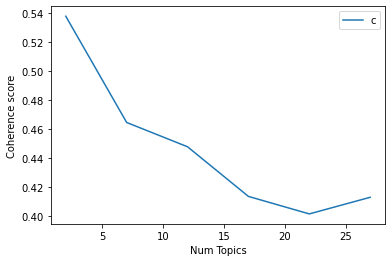

In [189]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [190]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 2

index: 0 | Num Topics = 2  has Coherence Value of 0.538
index: 1 | Num Topics = 7  has Coherence Value of 0.4648
index: 2 | Num Topics = 12  has Coherence Value of 0.448
index: 3 | Num Topics = 17  has Coherence Value of 0.4138
index: 4 | Num Topics = 22  has Coherence Value of 0.4017
index: 5 | Num Topics = 27  has Coherence Value of 0.4132


In [325]:
# Select optimal number of topics
optimal_model_us = model_list_us[0]

In [326]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us = pyLDAvis.gensim_models.prepare(optimal_model_us, corpus_us, id2word_us)

In [327]:
print("pyLDAVis for overall us topics:")
vis_us

pyLDAVis for overall us topics:


PreparedData(topic_coordinates=             x    y  topics  cluster       Freq
topic                                          
1      0.18906  0.0       1        1  74.559508
0     -0.18906  0.0       2        1  25.440492, topic_info=          Term         Freq        Total Category  logprob  loglift
556       flip   367.000000   367.000000  Default  30.0000  30.0000
0          app  3063.000000  3063.000000  Default  29.0000  29.0000
31    download   509.000000   509.000000  Default  28.0000  28.0000
2479    harvey   169.000000   169.000000  Default  27.0000  27.0000
7         look   268.000000   268.000000  Default  26.0000  26.0000
...        ...          ...          ...      ...      ...      ...
145       find   107.220680   229.352557   Topic2  -4.7552   0.6085
197      first    97.156488   223.937605   Topic2  -4.8538   0.5338
53        time   114.250655   494.479711   Topic2  -4.6917  -0.0963
298        bad    90.302518   275.849101   Topic2  -4.9270   0.2521
246      whole    66.520542   111.455470   Topic2  -5.2326   0.8527

[128 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
17        1  0.891548      account
17        2  0.105135      account
2230      1  0.008592       accuse
2230      2  0.996646       accuse
1264      1  0.021652  alternative
...     ...       ...          ...
116       1  1.001154         well
246       1  0.403749        whole
246       2  0.601137        whole
45        1  0.998427         work
307       1  1.000821         year

[156 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 1])

# By-rating LDA Topic Modelling

## LDA Topic Modelling (Rating = 1)

In [194]:
# By-rating Topic Modelling - rating = 1
# Convert to list - move to each section
review_us_score1 = triller_ios_us_review_YearMonth_score1.review.values.tolist()
review_words_us_score1 = list(sent_to_words(review_us_score1))
print(review_words_us_score1[:1])

[['it', 'was', 'nice', 'when', 'it', 'worked', 'and', 'let', 'me', 'use', 'the', 'filters', 'but', 'every', 'time', 'try', 'to', 'use', 'it', 'it', 'gets', 'off', 'it']]


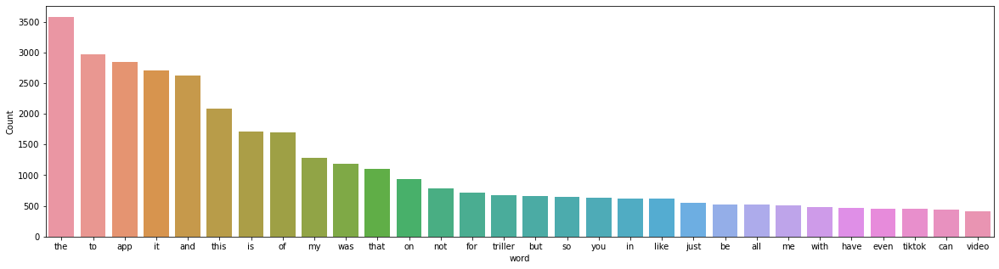

In [195]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us_score1))

In [196]:
# Clean text
review_us_ready_score1 = process_words(review_words_us_score1)  # processed Text Data! - move to each section


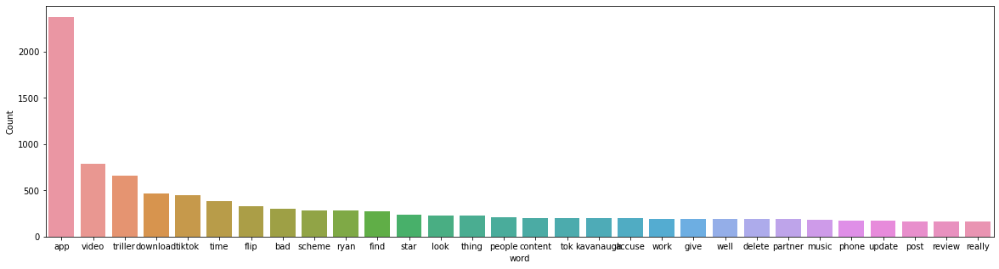

In [197]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_us_ready_score1))


In [198]:
# Create Dictionary
id2word_us_score1 = corpora.Dictionary(review_us_ready_score1)

2021-10-20 16:48:45,403 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-20 16:48:45,458 [INFO] gensim.corpora.dictionary - built Dictionary(3778 unique tokens: ['filter', 'let', 'time', 'work', 'back']...) from 1927 documents (total 36315 corpus positions)
2021-10-20 16:48:45,459 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(3778 unique tokens: ['filter', 'let', 'time', 'work', 'back']...) from 1927 documents (total 36315 corpus positions)", 'datetime': '2021-10-20T16:48:45.459100', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [199]:
# Create Corpus: Term Document Frequency
corpus_us_score1 = [id2word_us_score1.doc2bow(text) for text in review_us_ready_score1]

In [200]:
# Training LDA model
model_list_us_score1, coherence_values_us_score1 = compute_coherence_values(dictionary=id2word_us_score1, corpus=corpus_us_score1, 
                                                              texts=review_us_ready_score1, limit=30, start=2, step=5)


2021-10-20 16:48:45,502 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-20 16:48:45,503 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-20 16:48:45,506 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 16:48:45,508 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 1927 documents, updating model once every 1000 documents, evaluating perplexity every 1927 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-20 16:48:45,509 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #1000/1927
2021-10-20 16:48:46,307 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:48:46,310 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.066*"app" + 0.031*"video" + 0.017*"time" + 0.015*"triller" + 0.013*"music" + 0.012*"delete" + 0.010*"download" + 0.010*"work" + 0.010*"fix"

2021-10-20 16:48:53,046 [INFO] gensim.models.ldamodel - -6.861 per-word bound, 116.3 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:48:53,047 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1927/1927
2021-10-20 16:48:53,399 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:48:53,401 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.062*"app" + 0.028*"video" + 0.018*"triller" + 0.015*"time" + 0.015*"download" + 0.014*"flip" + 0.011*"thing" + 0.009*"phone" + 0.008*"work" + 0.008*"delete"
2021-10-20 16:48:53,402 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.057*"app" + 0.016*"tiktok" + 0.015*"triller" + 0.012*"bad" + 0.011*"scheme" + 0.011*"ryan" + 0.010*"download" + 0.009*"video" + 0.009*"star" + 0.008*"tok"
2021-10-20 16:48:53,402 [INFO] gensim.models.ldamodel - topic diff=0.226724, rho=0.379951
2021-10-20 16:48:53,403 [INFO] gensim.models.ldamodel - PROGR

2021-10-20 16:48:57,636 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.060*"app" + 0.017*"tiktok" + 0.016*"triller" + 0.012*"bad" + 0.011*"scheme" + 0.011*"ryan" + 0.011*"download" + 0.010*"flip" + 0.009*"find" + 0.008*"star"
2021-10-20 16:48:57,636 [INFO] gensim.models.ldamodel - topic diff=0.168590, rho=0.289557
2021-10-20 16:48:58,019 [INFO] gensim.models.ldamodel - -6.801 per-word bound, 111.5 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:48:58,020 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1927/1927
2021-10-20 16:48:58,289 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:48:58,291 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.058*"app" + 0.037*"video" + 0.018*"time" + 0.016*"triller" + 0.013*"download" + 0.011*"phone" + 0.011*"work" + 0.010*"music" + 0.010*"delete" + 0.009*"update"
2021-10-20 16:48:58,292 [INFO] gensim.models.ldamodel - top

2021-10-20 16:49:02,109 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:49:02,110 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.057*"app" + 0.040*"video" + 0.018*"time" + 0.017*"triller" + 0.012*"music" + 0.011*"update" + 0.011*"download" + 0.011*"work" + 0.011*"phone" + 0.011*"delete"
2021-10-20 16:49:02,111 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.061*"app" + 0.017*"tiktok" + 0.016*"triller" + 0.012*"flip" + 0.012*"download" + 0.011*"scheme" + 0.011*"bad" + 0.011*"ryan" + 0.009*"find" + 0.008*"star"
2021-10-20 16:49:02,112 [INFO] gensim.models.ldamodel - topic diff=0.133405, rho=0.243058
2021-10-20 16:49:02,461 [INFO] gensim.models.ldamodel - -6.791 per-word bound, 110.7 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:49:02,462 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1927/1927
2021-10-20 16:49:02,697 [INFO] gensim.models.ldamodel - m

2021-10-20 16:49:06,002 [INFO] gensim.models.ldamodel - topic diff=0.113850, rho=0.218598
2021-10-20 16:49:06,003 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #1000/1927
2021-10-20 16:49:06,223 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:49:06,224 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.056*"app" + 0.041*"video" + 0.018*"time" + 0.017*"triller" + 0.012*"music" + 0.012*"update" + 0.011*"work" + 0.011*"phone" + 0.011*"download" + 0.011*"delete"
2021-10-20 16:49:06,225 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.062*"app" + 0.017*"tiktok" + 0.016*"triller" + 0.013*"flip" + 0.012*"download" + 0.011*"scheme" + 0.011*"ryan" + 0.011*"bad" + 0.010*"find" + 0.009*"star"
2021-10-20 16:49:06,226 [INFO] gensim.models.ldamodel - topic diff=0.113371, rho=0.213555
2021-10-20 16:49:06,571 [INFO] gensim.models.ldamodel - -6.788 per-word bound, 110.5 perplexity estimate based on a held-out corpus o

2021-10-20 16:49:09,999 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.062*"app" + 0.017*"triller" + 0.016*"tiktok" + 0.014*"flip" + 0.012*"download" + 0.012*"ryan" + 0.012*"scheme" + 0.011*"bad" + 0.010*"find" + 0.008*"star"
2021-10-20 16:49:09,999 [INFO] gensim.models.ldamodel - topic diff=0.101203, rho=0.196392
2021-10-20 16:49:10,000 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #1000/1927
2021-10-20 16:49:10,217 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:49:10,219 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.056*"app" + 0.042*"video" + 0.018*"time" + 0.017*"triller" + 0.012*"music" + 0.012*"update" + 0.011*"work" + 0.011*"phone" + 0.011*"delete" + 0.011*"download"
2021-10-20 16:49:10,220 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.062*"app" + 0.017*"tiktok" + 0.016*"triller" + 0.013*"flip" + 0.012*"download" + 0.011*"scheme" + 0.011*"ryan" + 0.011*"bad" + 0.010*"find" + 0.009

2021-10-20 16:49:14,366 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:49:14,367 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.055*"app" + 0.041*"video" + 0.018*"time" + 0.016*"triller" + 0.012*"phone" + 0.011*"work" + 0.011*"music" + 0.011*"download" + 0.011*"update" + 0.010*"delete"
2021-10-20 16:49:14,368 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.062*"app" + 0.017*"triller" + 0.016*"tiktok" + 0.014*"flip" + 0.012*"download" + 0.012*"ryan" + 0.012*"scheme" + 0.011*"bad" + 0.010*"find" + 0.008*"star"
2021-10-20 16:49:14,369 [INFO] gensim.models.ldamodel - topic diff=0.091664, rho=0.179817
2021-10-20 16:49:14,370 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #1000/1927
2021-10-20 16:49:14,590 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:49:14,592 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.056*"app" + 0.042*"video"

2021-10-20 16:49:17,738 [INFO] gensim.models.ldamodel - topic diff=0.085317, rho=0.166836
2021-10-20 16:49:18,072 [INFO] gensim.models.ldamodel - -6.784 per-word bound, 110.2 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:49:18,073 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1927/1927
2021-10-20 16:49:18,299 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:49:18,301 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.055*"app" + 0.042*"video" + 0.018*"time" + 0.016*"triller" + 0.012*"phone" + 0.011*"work" + 0.011*"music" + 0.011*"download" + 0.011*"update" + 0.010*"delete"
2021-10-20 16:49:18,302 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.062*"app" + 0.017*"triller" + 0.016*"tiktok" + 0.014*"flip" + 0.012*"download" + 0.012*"ryan" + 0.012*"scheme" + 0.011*"bad" + 0.010*"find" + 0.008*"star"
2021-10-20 16:49:18,302 [INFO] gensim.models.ldamodel - to

2021-10-20 16:49:21,681 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.062*"app" + 0.016*"tiktok" + 0.016*"triller" + 0.013*"flip" + 0.012*"download" + 0.011*"scheme" + 0.011*"ryan" + 0.011*"bad" + 0.010*"find" + 0.008*"star"
2021-10-20 16:49:21,682 [INFO] gensim.models.ldamodel - topic diff=0.079378, rho=0.156313
2021-10-20 16:49:22,032 [INFO] gensim.models.ldamodel - -6.783 per-word bound, 110.1 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:49:22,033 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1927/1927
2021-10-20 16:49:22,263 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:49:22,264 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.055*"app" + 0.042*"video" + 0.018*"time" + 0.016*"triller" + 0.012*"phone" + 0.011*"work" + 0.011*"music" + 0.011*"update" + 0.011*"download" + 0.010*"delete"
2021-10-20 16:49:22,265 [INFO] gensim.models.ldamodel - to

2021-10-20 16:49:25,795 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:49:25,797 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.055*"app" + 0.042*"video" + 0.018*"time" + 0.017*"triller" + 0.012*"music" + 0.011*"update" + 0.011*"work" + 0.011*"phone" + 0.011*"delete" + 0.010*"download"
2021-10-20 16:49:25,797 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.062*"app" + 0.016*"triller" + 0.016*"tiktok" + 0.013*"flip" + 0.012*"download" + 0.011*"scheme" + 0.011*"ryan" + 0.011*"bad" + 0.010*"find" + 0.008*"star"
2021-10-20 16:49:25,798 [INFO] gensim.models.ldamodel - topic diff=0.074524, rho=0.147559
2021-10-20 16:49:26,131 [INFO] gensim.models.ldamodel - -6.783 per-word bound, 110.1 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:49:26,132 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #1927/1927
2021-10-20 16:49:26,354 [INFO] gensim.models.ldamodel - m

2021-10-20 16:49:29,493 [INFO] gensim.models.ldamodel - topic diff=0.070734, rho=0.141525
2021-10-20 16:49:29,494 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #1000/1927
2021-10-20 16:49:29,708 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:49:29,709 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.055*"app" + 0.042*"video" + 0.018*"time" + 0.016*"triller" + 0.012*"music" + 0.011*"update" + 0.011*"work" + 0.011*"phone" + 0.011*"delete" + 0.010*"download"
2021-10-20 16:49:29,710 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.062*"app" + 0.016*"triller" + 0.016*"tiktok" + 0.013*"flip" + 0.012*"download" + 0.011*"scheme" + 0.011*"ryan" + 0.011*"bad" + 0.010*"find" + 0.008*"star"
2021-10-20 16:49:29,711 [INFO] gensim.models.ldamodel - topic diff=0.070439, rho=0.140128
2021-10-20 16:49:30,066 [INFO] gensim.models.ldamodel - -6.782 per-word bound, 110.1 perplexity estimate based on a held-out corpus o

2021-10-20 16:49:35,075 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.062*"app" + 0.040*"video" + 0.024*"music" + 0.024*"triller" + 0.022*"time" + 0.017*"crash" + 0.016*"harvey" + 0.015*"work" + 0.013*"phone" + 0.012*"fix"
2021-10-20 16:49:35,076 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.046*"app" + 0.039*"video" + 0.015*"download" + 0.014*"song" + 0.012*"time" + 0.012*"tok" + 0.011*"give" + 0.010*"load" + 0.010*"delete" + 0.009*"tik"
2021-10-20 16:49:35,077 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.082*"app" + 0.021*"triller" + 0.020*"flip" + 0.020*"video" + 0.015*"tiktok" + 0.012*"thing" + 0.010*"find" + 0.009*"download" + 0.008*"people" + 0.008*"time"
2021-10-20 16:49:35,078 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.053*"app" + 0.016*"download" + 0.015*"content" + 0.015*"find" + 0.014*"triller" + 0.014*"tok" + 0.011*"ryan" + 0.011*"video" + 0.010*"flip" + 0.009*"tiktok"
2021-10-20 16:49:35,079 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.05

2021-10-20 16:49:37,775 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.049*"app" + 0.018*"triller" + 0.017*"find" + 0.016*"download" + 0.016*"ryan" + 0.016*"scheme" + 0.014*"flip" + 0.014*"tok" + 0.013*"partner" + 0.013*"accuse"
2021-10-20 16:49:37,776 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.056*"app" + 0.027*"tiktok" + 0.015*"bad" + 0.014*"triller" + 0.012*"people" + 0.012*"look" + 0.010*"video" + 0.008*"pay" + 0.007*"company" + 0.007*"man"
2021-10-20 16:49:37,777 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.045*"app" + 0.026*"video" + 0.015*"new" + 0.011*"much" + 0.011*"tiktok" + 0.010*"update" + 0.010*"triller" + 0.009*"state" + 0.008*"well" + 0.008*"version"
2021-10-20 16:49:37,777 [INFO] gensim.models.ldamodel - topic diff=0.300947, rho=0.410755
2021-10-20 16:49:37,778 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1000/1927
2021-10-20 16:49:38,050 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 docum

2021-10-20 16:49:39,918 [INFO] gensim.models.ldamodel - topic diff=0.195957, rho=0.334693
2021-10-20 16:49:40,305 [INFO] gensim.models.ldamodel - -7.040 per-word bound, 131.6 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:49:40,306 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #1927/1927
2021-10-20 16:49:40,558 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:49:40,561 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.046*"app" + 0.020*"triller" + 0.018*"scheme" + 0.017*"find" + 0.016*"ryan" + 0.016*"download" + 0.014*"flip" + 0.014*"partner" + 0.014*"tok" + 0.013*"accuse"
2021-10-20 16:49:40,562 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.043*"app" + 0.026*"video" + 0.018*"new" + 0.013*"much" + 0.012*"tiktok" + 0.011*"update" + 0.009*"well" + 0.009*"state" + 0.009*"version" + 0.009*"hate"
2021-10-20 16:49:40,563 [INFO] gensim.models.ldamodel - topic 

2021-10-20 16:49:42,552 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.037*"app" + 0.025*"video" + 0.018*"tok" + 0.018*"song" + 0.017*"advertising" + 0.016*"literally" + 0.015*"tik" + 0.012*"false" + 0.012*"give" + 0.011*"download"
2021-10-20 16:49:42,553 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.053*"app" + 0.029*"tiktok" + 0.014*"people" + 0.014*"bad" + 0.012*"look" + 0.011*"triller" + 0.009*"video" + 0.008*"pay" + 0.007*"man" + 0.007*"much"
2021-10-20 16:49:42,554 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.042*"app" + 0.027*"video" + 0.021*"new" + 0.016*"update" + 0.016*"much" + 0.012*"tiktok" + 0.011*"old" + 0.011*"well" + 0.011*"version" + 0.010*"hate"
2021-10-20 16:49:42,555 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.065*"app" + 0.053*"video" + 0.026*"time" + 0.023*"music" + 0.023*"triller" + 0.018*"crash" + 0.017*"update" + 0.016*"work" + 0.016*"fix" + 0.016*"phone"
2021-10-20 16:49:42,556 [INFO] gensim.models.ldamodel - topic diff=0.159065, rho=

2021-10-20 16:49:45,239 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.044*"app" + 0.022*"triller" + 0.018*"scheme" + 0.018*"find" + 0.016*"download" + 0.016*"ryan" + 0.014*"flip" + 0.013*"partner" + 0.013*"tok" + 0.012*"variety"
2021-10-20 16:49:45,240 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.064*"app" + 0.052*"video" + 0.027*"time" + 0.022*"triller" + 0.021*"music" + 0.019*"harvey" + 0.018*"crash" + 0.016*"phone" + 0.016*"work" + 0.015*"update"
2021-10-20 16:49:45,241 [INFO] gensim.models.ldamodel - topic diff=0.142340, rho=0.267961
2021-10-20 16:49:45,241 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1000/1927
2021-10-20 16:49:45,461 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:49:45,464 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.053*"app" + 0.029*"tiktok" + 0.014*"people" + 0.014*"bad" + 0.012*"look" + 0.010*"triller" + 0.008*"video" + 0.008*"pay" + 0.008*"man" + 0.007*"mu

2021-10-20 16:49:47,559 [INFO] gensim.models.ldamodel - -6.995 per-word bound, 127.6 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:49:47,559 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1927/1927
2021-10-20 16:49:47,796 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:49:47,798 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.053*"app" + 0.028*"tiktok" + 0.014*"people" + 0.013*"bad" + 0.012*"look" + 0.009*"triller" + 0.009*"man" + 0.009*"pay" + 0.007*"video" + 0.007*"company"
2021-10-20 16:49:47,799 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.063*"app" + 0.024*"ryan" + 0.021*"star" + 0.021*"scheme" + 0.019*"triller" + 0.018*"kavanaugh" + 0.016*"accuse" + 0.016*"download" + 0.014*"partner" + 0.014*"give"
2021-10-20 16:49:47,800 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.035*"app" + 0.022*"advertising" + 0.022*"tok" + 0.019*"tik" + 0.019*"

2021-10-20 16:49:49,685 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.032*"app" + 0.023*"tok" + 0.020*"tik" + 0.019*"literally" + 0.019*"video" + 0.018*"advertising" + 0.017*"song" + 0.015*"false" + 0.012*"give" + 0.012*"star"
2021-10-20 16:49:49,686 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.062*"app" + 0.023*"ryan" + 0.021*"star" + 0.021*"scheme" + 0.018*"triller" + 0.018*"kavanaugh" + 0.016*"download" + 0.016*"accuse" + 0.014*"partner" + 0.014*"give"
2021-10-20 16:49:49,687 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.065*"app" + 0.054*"video" + 0.027*"time" + 0.023*"triller" + 0.022*"music" + 0.018*"crash" + 0.016*"work" + 0.016*"update" + 0.016*"delete" + 0.016*"fix"
2021-10-20 16:49:49,688 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.043*"app" + 0.022*"triller" + 0.018*"find" + 0.017*"scheme" + 0.017*"download" + 0.013*"ryan" + 0.013*"tok" + 0.012*"variety" + 0.012*"flip" + 0.012*"partner"
2021-10-20 16:49:49,689 [INFO] gensim.models.ldamodel - topic 

2021-10-20 16:49:51,933 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.042*"app" + 0.023*"triller" + 0.018*"find" + 0.017*"scheme" + 0.017*"download" + 0.014*"variety" + 0.013*"ryan" + 0.013*"flip" + 0.012*"tok" + 0.012*"partner"
2021-10-20 16:49:51,934 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.053*"app" + 0.028*"tiktok" + 0.014*"people" + 0.013*"bad" + 0.012*"look" + 0.010*"man" + 0.009*"pay" + 0.009*"triller" + 0.007*"much" + 0.007*"company"
2021-10-20 16:49:51,934 [INFO] gensim.models.ldamodel - topic diff=0.107957, rho=0.213555
2021-10-20 16:49:51,935 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #1000/1927
2021-10-20 16:49:52,163 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:49:52,166 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.080*"app" + 0.025*"tiktok" + 0.022*"video" + 0.016*"flip" + 0.014*"triller" + 0.013*"download" + 0.012*"people" + 0.012*"feel" + 0.011*"content" + 0.0

2021-10-20 16:49:54,284 [INFO] gensim.models.ldamodel - -6.981 per-word bound, 126.4 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:49:54,285 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #1927/1927
2021-10-20 16:49:54,516 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:49:54,518 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.081*"app" + 0.026*"tiktok" + 0.022*"video" + 0.017*"flip" + 0.014*"download" + 0.013*"triller" + 0.012*"content" + 0.012*"people" + 0.012*"feel" + 0.010*"thing"
2021-10-20 16:49:54,519 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.064*"app" + 0.053*"video" + 0.027*"time" + 0.022*"triller" + 0.021*"music" + 0.018*"crash" + 0.017*"harvey" + 0.016*"phone" + 0.016*"work" + 0.015*"delete"
2021-10-20 16:49:54,520 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.053*"app" + 0.028*"tiktok" + 0.014*"people" + 0.012*"bad" + 0.011*"lo

2021-10-20 16:49:56,419 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.035*"app" + 0.025*"video" + 0.023*"new" + 0.020*"update" + 0.017*"much" + 0.015*"old" + 0.013*"back" + 0.012*"tiktok" + 0.012*"version" + 0.010*"well"
2021-10-20 16:49:56,420 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.052*"app" + 0.029*"tiktok" + 0.015*"people" + 0.013*"bad" + 0.012*"look" + 0.009*"man" + 0.008*"pay" + 0.008*"triller" + 0.008*"much" + 0.006*"company"
2021-10-20 16:49:56,421 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.081*"app" + 0.026*"tiktok" + 0.022*"video" + 0.015*"flip" + 0.014*"download" + 0.013*"triller" + 0.012*"people" + 0.012*"content" + 0.012*"feel" + 0.009*"thing"
2021-10-20 16:49:56,422 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.061*"app" + 0.025*"ryan" + 0.023*"scheme" + 0.021*"star" + 0.020*"triller" + 0.019*"kavanaugh" + 0.017*"accuse" + 0.015*"flip" + 0.015*"download" + 0.015*"partner"
2021-10-20 16:49:56,422 [INFO] gensim.models.ldamodel - topic diff=0

2021-10-20 16:49:58,779 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"app" + 0.022*"triller" + 0.017*"find" + 0.016*"download" + 0.015*"variety" + 0.014*"scheme" + 0.012*"flip" + 0.011*"tok" + 0.011*"ryan" + 0.011*"content"
2021-10-20 16:49:58,780 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.082*"app" + 0.027*"tiktok" + 0.023*"video" + 0.016*"flip" + 0.015*"download" + 0.013*"content" + 0.013*"triller" + 0.012*"people" + 0.012*"feel" + 0.009*"find"
2021-10-20 16:49:58,780 [INFO] gensim.models.ldamodel - topic diff=0.090207, rho=0.182797
2021-10-20 16:49:58,781 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1000/1927
2021-10-20 16:49:58,991 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:49:58,994 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"app" + 0.021*"triller" + 0.017*"find" + 0.016*"download" + 0.014*"variety" + 0.014*"scheme" + 0.011*"flip" + 0.011*"content" + 0.011*"tok

2021-10-20 16:50:01,027 [INFO] gensim.models.ldamodel - -6.974 per-word bound, 125.7 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:50:01,028 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #1927/1927
2021-10-20 16:50:01,283 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:50:01,286 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.082*"app" + 0.027*"tiktok" + 0.023*"video" + 0.015*"flip" + 0.015*"download" + 0.013*"content" + 0.012*"triller" + 0.012*"people" + 0.012*"feel" + 0.009*"post"
2021-10-20 16:50:01,288 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.052*"app" + 0.028*"tiktok" + 0.014*"people" + 0.012*"bad" + 0.011*"look" + 0.010*"man" + 0.009*"pay" + 0.007*"triller" + 0.007*"much" + 0.006*"review"
2021-10-20 16:50:01,289 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.065*"app" + 0.054*"video" + 0.027*"time" + 0.022*"triller" + 0.020*"music" 

2021-10-20 16:50:03,444 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.033*"app" + 0.025*"video" + 0.024*"new" + 0.021*"update" + 0.017*"much" + 0.015*"old" + 0.014*"back" + 0.012*"version" + 0.012*"tiktok" + 0.011*"terrible"
2021-10-20 16:50:03,445 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.065*"app" + 0.054*"video" + 0.027*"time" + 0.023*"triller" + 0.022*"music" + 0.017*"crash" + 0.016*"work" + 0.016*"delete" + 0.015*"phone" + 0.015*"fix"
2021-10-20 16:50:03,446 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.038*"app" + 0.021*"triller" + 0.016*"download" + 0.016*"find" + 0.014*"variety" + 0.012*"scheme" + 0.010*"flip" + 0.010*"tok" + 0.010*"content" + 0.009*"awkward"
2021-10-20 16:50:03,447 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.082*"app" + 0.027*"tiktok" + 0.022*"video" + 0.015*"download" + 0.014*"flip" + 0.013*"content" + 0.012*"people" + 0.012*"triller" + 0.012*"feel" + 0.009*"post"
2021-10-20 16:50:03,447 [INFO] gensim.models.ldamodel - topic diff

2021-10-20 16:50:05,625 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.061*"app" + 0.027*"ryan" + 0.025*"scheme" + 0.023*"triller" + 0.021*"star" + 0.021*"kavanaugh" + 0.019*"accuse" + 0.018*"flip" + 0.017*"partner" + 0.014*"download"
2021-10-20 16:50:05,626 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.065*"app" + 0.054*"video" + 0.027*"time" + 0.022*"triller" + 0.020*"music" + 0.017*"crash" + 0.016*"harvey" + 0.016*"work" + 0.016*"phone" + 0.015*"delete"
2021-10-20 16:50:05,626 [INFO] gensim.models.ldamodel - topic diff=0.079188, rho=0.162377
2021-10-20 16:50:05,627 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #1000/1927
2021-10-20 16:50:05,833 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:50:05,836 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.026*"tok" + 0.026*"app" + 0.021*"literally" + 0.021*"tik" + 0.020*"advertising" + 0.019*"song" + 0.017*"false" + 0.015*"video" + 0.014*"star"

2021-10-20 16:50:07,819 [INFO] gensim.models.ldamodel - -6.969 per-word bound, 125.2 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:50:07,820 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1927/1927
2021-10-20 16:50:08,041 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:50:08,044 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.065*"app" + 0.054*"video" + 0.027*"time" + 0.022*"triller" + 0.020*"music" + 0.017*"crash" + 0.016*"harvey" + 0.016*"work" + 0.016*"phone" + 0.015*"delete"
2021-10-20 16:50:08,045 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.052*"app" + 0.028*"tiktok" + 0.014*"people" + 0.012*"bad" + 0.011*"look" + 0.010*"man" + 0.009*"pay" + 0.007*"much" + 0.007*"triller" + 0.007*"review"
2021-10-20 16:50:08,046 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.037*"app" + 0.020*"triller" + 0.016*"download" + 0.016*"variety" + 0.016*"find"

2021-10-20 16:50:09,854 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.060*"app" + 0.026*"ryan" + 0.025*"scheme" + 0.023*"triller" + 0.021*"star" + 0.020*"kavanaugh" + 0.019*"accuse" + 0.018*"flip" + 0.017*"partner" + 0.014*"download"
2021-10-20 16:50:09,855 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.083*"app" + 0.028*"tiktok" + 0.022*"video" + 0.015*"download" + 0.014*"content" + 0.014*"flip" + 0.012*"people" + 0.012*"triller" + 0.011*"feel" + 0.010*"tok"
2021-10-20 16:50:09,856 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.025*"tok" + 0.025*"app" + 0.020*"advertising" + 0.020*"literally" + 0.020*"tik" + 0.020*"song" + 0.017*"false" + 0.014*"video" + 0.014*"star" + 0.012*"give"
2021-10-20 16:50:09,857 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.032*"app" + 0.024*"video" + 0.024*"new" + 0.021*"update" + 0.017*"much" + 0.016*"old" + 0.015*"back" + 0.013*"version" + 0.012*"tiktok" + 0.011*"terrible"
2021-10-20 16:50:09,857 [INFO] gensim.models.ldamodel - topic

2021-10-20 16:50:12,281 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.083*"app" + 0.028*"tiktok" + 0.022*"video" + 0.015*"download" + 0.015*"content" + 0.014*"flip" + 0.012*"triller" + 0.011*"people" + 0.011*"feel" + 0.010*"tok"
2021-10-20 16:50:12,281 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.052*"app" + 0.028*"tiktok" + 0.014*"people" + 0.012*"bad" + 0.011*"look" + 0.010*"man" + 0.009*"pay" + 0.007*"much" + 0.007*"review" + 0.007*"triller"
2021-10-20 16:50:12,282 [INFO] gensim.models.ldamodel - topic diff=0.071243, rho=0.147559
2021-10-20 16:50:12,283 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #1000/1927
2021-10-20 16:50:12,516 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:50:12,519 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.032*"app" + 0.024*"video" + 0.024*"new" + 0.021*"update" + 0.017*"much" + 0.016*"old" + 0.015*"back" + 0.013*"version" + 0.012*"tiktok" + 0.011*"terrib

2021-10-20 16:50:14,529 [INFO] gensim.models.ldamodel - -6.965 per-word bound, 124.9 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:50:14,530 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1927/1927
2021-10-20 16:50:14,744 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:50:14,747 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.084*"app" + 0.028*"tiktok" + 0.022*"video" + 0.016*"download" + 0.015*"content" + 0.014*"flip" + 0.011*"people" + 0.011*"triller" + 0.011*"feel" + 0.011*"tok"
2021-10-20 16:50:14,748 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.025*"app" + 0.025*"tok" + 0.023*"advertising" + 0.020*"false" + 0.020*"tik" + 0.018*"literally" + 0.018*"song" + 0.015*"star" + 0.013*"video" + 0.012*"wish"
2021-10-20 16:50:14,749 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.051*"app" + 0.028*"tiktok" + 0.014*"people" + 0.012*"bad" + 0.011*"loo

2021-10-20 16:50:16,565 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.066*"app" + 0.055*"video" + 0.027*"time" + 0.023*"triller" + 0.022*"music" + 0.017*"crash" + 0.016*"work" + 0.016*"fix" + 0.016*"delete" + 0.015*"phone"
2021-10-20 16:50:16,566 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.024*"app" + 0.024*"tok" + 0.021*"advertising" + 0.020*"song" + 0.019*"tik" + 0.018*"literally" + 0.018*"false" + 0.015*"star" + 0.014*"video" + 0.012*"give"
2021-10-20 16:50:16,567 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.051*"app" + 0.029*"tiktok" + 0.015*"people" + 0.012*"bad" + 0.011*"look" + 0.009*"man" + 0.009*"pay" + 0.007*"much" + 0.007*"review" + 0.006*"triller"
2021-10-20 16:50:16,568 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.035*"app" + 0.019*"triller" + 0.016*"variety" + 0.016*"download" + 0.014*"find" + 0.010*"article" + 0.010*"awkward" + 0.010*"tok" + 0.010*"content" + 0.009*"flip"
2021-10-20 16:50:16,568 [INFO] gensim.models.ldamodel - topic diff=0.067

2021-10-20 16:50:21,221 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.062*"app" + 0.041*"video" + 0.027*"time" + 0.024*"update" + 0.020*"crash" + 0.018*"tiktok" + 0.018*"keep" + 0.014*"triller" + 0.013*"terrible" + 0.012*"save"
2021-10-20 16:50:21,222 [INFO] gensim.models.ldamodel - topic diff=0.299376, rho=0.504626
2021-10-20 16:50:21,767 [INFO] gensim.models.ldamodel - -8.678 per-word bound, 409.7 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:50:21,768 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1927/1927
2021-10-20 16:50:22,231 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:50:22,236 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.064*"harvey" + 0.046*"app" + 0.043*"weinstein" + 0.026*"video" + 0.024*"music" + 0.023*"triller" + 0.016*"download" + 0.015*"time" + 0.015*"phone" + 0.014*"play"
2021-10-20 16:50:22,237 [INFO] gensim.models.ldamode

2021-10-20 16:50:24,659 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1000/1927
2021-10-20 16:50:24,979 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:50:24,984 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.051*"video" + 0.038*"app" + 0.023*"song" + 0.020*"load" + 0.017*"give" + 0.016*"download" + 0.014*"let" + 0.012*"delete" + 0.011*"harvey" + 0.011*"create"
2021-10-20 16:50:24,986 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.055*"tok" + 0.042*"tik" + 0.031*"app" + 0.015*"scheme" + 0.013*"ryan" + 0.013*"video" + 0.013*"bad" + 0.012*"creator" + 0.012*"owner" + 0.012*"triller"
2021-10-20 16:50:24,987 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.055*"app" + 0.029*"tiktok" + 0.022*"triller" + 0.019*"look" + 0.015*"video" + 0.015*"bad" + 0.015*"scheme" + 0.013*"people" + 0.012*"hear" + 0.012*"company"
2021-10-20 16:50:24,987 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.076*"app" + 

2021-10-20 16:50:27,660 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.068*"tok" + 0.052*"tik" + 0.031*"app" + 0.014*"bad" + 0.013*"terrible" + 0.012*"creator" + 0.011*"scheme" + 0.011*"look" + 0.010*"knock" + 0.010*"hear"
2021-10-20 16:50:27,661 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.090*"app" + 0.016*"people" + 0.015*"content" + 0.015*"honestly" + 0.014*"actually" + 0.014*"celebrity" + 0.014*"bad" + 0.013*"glitchy" + 0.012*"pay" + 0.011*"feel"
2021-10-20 16:50:27,662 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.054*"app" + 0.033*"tiktok" + 0.020*"look" + 0.019*"triller" + 0.015*"bad" + 0.014*"video" + 0.011*"company" + 0.011*"scheme" + 0.011*"people" + 0.009*"hear"
2021-10-20 16:50:27,663 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.063*"app" + 0.058*"video" + 0.030*"time" + 0.027*"update" + 0.025*"crash" + 0.018*"keep" + 0.017*"triller" + 0.017*"save" + 0.015*"new" + 0.012*"fix"
2021-10-20 16:50:27,663 [INFO] gensim.models.ldamodel - topic diff=0.207

2021-10-20 16:50:29,638 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.075*"app" + 0.025*"tiktok" + 0.019*"triller" + 0.017*"people" + 0.017*"post" + 0.016*"video" + 0.016*"flip" + 0.011*"work" + 0.010*"thing" + 0.010*"pay"
2021-10-20 16:50:29,639 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.029*"account" + 0.027*"app" + 0.019*"triller" + 0.017*"time" + 0.015*"download" + 0.014*"give" + 0.013*"star" + 0.011*"camera" + 0.010*"message" + 0.010*"feel"
2021-10-20 16:50:29,640 [INFO] gensim.models.ldamodel - topic diff=0.136570, rho=0.289557
2021-10-20 16:50:30,001 [INFO] gensim.models.ldamodel - -7.500 per-word bound, 181.0 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:50:30,002 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1927/1927
2021-10-20 16:50:30,242 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:50:30,245 [INFO] gensim.models.ldamodel - topi

2021-10-20 16:50:31,896 [INFO] gensim.models.ldamodel - topic diff=0.134412, rho=0.267961
2021-10-20 16:50:31,897 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1000/1927
2021-10-20 16:50:32,132 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:50:32,136 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.089*"app" + 0.018*"people" + 0.016*"content" + 0.014*"actually" + 0.014*"bad" + 0.013*"honestly" + 0.012*"glitchy" + 0.012*"pay" + 0.012*"well" + 0.012*"celebrity"
2021-10-20 16:50:32,137 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.031*"account" + 0.023*"app" + 0.019*"triller" + 0.018*"time" + 0.015*"download" + 0.013*"give" + 0.012*"star" + 0.011*"camera" + 0.010*"feel" + 0.010*"email"
2021-10-20 16:50:32,138 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.075*"tok" + 0.052*"tik" + 0.031*"app" + 0.018*"bad" + 0.017*"terrible" + 0.013*"creator" + 0.011*"knock" + 0.010*"look" + 0.010*"people" + 

2021-10-20 16:50:34,443 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.078*"app" + 0.029*"review" + 0.027*"flip" + 0.025*"star" + 0.023*"give" + 0.021*"bad" + 0.018*"experience" + 0.017*"honest" + 0.013*"thing" + 0.012*"download"
2021-10-20 16:50:34,443 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.051*"app" + 0.033*"tiktok" + 0.019*"look" + 0.015*"video" + 0.015*"bad" + 0.014*"triller" + 0.010*"people" + 0.009*"search" + 0.008*"much" + 0.008*"company"
2021-10-20 16:50:34,444 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.090*"app" + 0.018*"people" + 0.017*"content" + 0.015*"actually" + 0.014*"honestly" + 0.014*"bad" + 0.013*"celebrity" + 0.012*"pay" + 0.011*"well" + 0.011*"glitchy"
2021-10-20 16:50:34,445 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.063*"app" + 0.062*"video" + 0.031*"time" + 0.029*"update" + 0.026*"crash" + 0.021*"triller" + 0.020*"save" + 0.018*"keep" + 0.015*"new" + 0.014*"fix"
2021-10-20 16:50:34,446 [INFO] gensim.models.ldamodel - topic #5 

2021-10-20 16:50:36,259 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.089*"app" + 0.018*"people" + 0.016*"content" + 0.015*"bad" + 0.014*"actually" + 0.013*"honestly" + 0.012*"well" + 0.011*"pay" + 0.011*"ad" + 0.011*"celebrity"
2021-10-20 16:50:36,260 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.048*"music" + 0.048*"app" + 0.034*"harvey" + 0.032*"play" + 0.030*"weinstein" + 0.029*"phone" + 0.027*"start" + 0.020*"delete" + 0.017*"second" + 0.017*"video"
2021-10-20 16:50:36,261 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.076*"tok" + 0.052*"tik" + 0.031*"app" + 0.019*"bad" + 0.017*"terrible" + 0.013*"creator" + 0.012*"knock" + 0.010*"people" + 0.010*"look" + 0.009*"company"
2021-10-20 16:50:36,262 [INFO] gensim.models.ldamodel - topic diff=0.096595, rho=0.224016
2021-10-20 16:50:36,608 [INFO] gensim.models.ldamodel - -7.319 per-word bound, 159.7 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:50:36,609 [INFO] gensim.mode

2021-10-20 16:50:38,514 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.063*"video" + 0.063*"app" + 0.031*"time" + 0.029*"update" + 0.026*"crash" + 0.022*"triller" + 0.020*"save" + 0.018*"keep" + 0.015*"new" + 0.015*"fix"
2021-10-20 16:50:38,514 [INFO] gensim.models.ldamodel - topic diff=0.094660, rho=0.213555
2021-10-20 16:50:38,515 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #1000/1927
2021-10-20 16:50:38,751 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:50:38,755 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.089*"app" + 0.017*"people" + 0.016*"bad" + 0.016*"content" + 0.014*"actually" + 0.013*"honestly" + 0.013*"terrible" + 0.012*"well" + 0.011*"ad" + 0.011*"pay"
2021-10-20 16:50:38,756 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.048*"scheme" + 0.047*"ryan" + 0.044*"app" + 0.037*"triller" + 0.036*"kavanaugh" + 0.036*"accuse" + 0.034*"partner" + 0.030*"flip" + 0.024*"find" + 0.024

2021-10-20 16:50:40,899 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:50:40,903 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.077*"tok" + 0.053*"tik" + 0.030*"app" + 0.019*"bad" + 0.018*"terrible" + 0.013*"creator" + 0.012*"knock" + 0.011*"look" + 0.010*"people" + 0.010*"company"
2021-10-20 16:50:40,904 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.049*"scheme" + 0.049*"ryan" + 0.044*"app" + 0.039*"triller" + 0.036*"kavanaugh" + 0.036*"accuse" + 0.034*"partner" + 0.032*"flip" + 0.025*"ex" + 0.025*"find"
2021-10-20 16:50:40,905 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.106*"app" + 0.037*"tiktok" + 0.033*"download" + 0.024*"video" + 0.016*"content" + 0.013*"triller" + 0.012*"time" + 0.010*"quality" + 0.009*"recommend" + 0.009*"well"
2021-10-20 16:50:40,905 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.075*"app" + 0.027*"tiktok" + 0.017*"people" + 0.017*"flip" + 0.017*"post" + 0.017*"triller" + 

2021-10-20 16:50:42,755 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.076*"tok" + 0.052*"tik" + 0.029*"app" + 0.020*"bad" + 0.017*"terrible" + 0.013*"creator" + 0.012*"knock" + 0.011*"people" + 0.010*"look" + 0.010*"company"
2021-10-20 16:50:42,756 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.064*"video" + 0.063*"app" + 0.031*"update" + 0.031*"time" + 0.025*"crash" + 0.023*"triller" + 0.021*"save" + 0.018*"keep" + 0.016*"fix" + 0.016*"new"
2021-10-20 16:50:42,757 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.088*"app" + 0.017*"people" + 0.017*"bad" + 0.016*"content" + 0.014*"terrible" + 0.013*"actually" + 0.013*"honestly" + 0.012*"well" + 0.011*"ad" + 0.011*"pay"
2021-10-20 16:50:42,758 [INFO] gensim.models.ldamodel - topic diff=0.079268, rho=0.189229
2021-10-20 16:50:43,145 [INFO] gensim.models.ldamodel - -7.264 per-word bound, 153.7 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:50:43,146 [INFO] gensim.models.ldamode

2021-10-20 16:50:45,004 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.030*"video" + 0.021*"state" + 0.020*"app" + 0.015*"hate" + 0.015*"discover" + 0.014*"glitche" + 0.014*"second" + 0.013*"bankrupt" + 0.012*"sound" + 0.011*"whole"
2021-10-20 16:50:45,005 [INFO] gensim.models.ldamodel - topic diff=0.077802, rho=0.182797
2021-10-20 16:50:45,005 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1000/1927
2021-10-20 16:50:45,222 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:50:45,226 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.032*"video" + 0.020*"app" + 0.018*"state" + 0.017*"hate" + 0.016*"second" + 0.016*"glitche" + 0.013*"sound" + 0.012*"discover" + 0.011*"song" + 0.011*"whole"
2021-10-20 16:50:45,227 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.049*"scheme" + 0.049*"ryan" + 0.044*"app" + 0.038*"triller" + 0.036*"kavanaugh" + 0.035*"accuse" + 0.034*"partner" + 0.031*"flip" + 0.024*"fi

2021-10-20 16:50:47,109 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #1927/1927
2021-10-20 16:50:47,324 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:50:47,329 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.036*"account" + 0.021*"triller" + 0.019*"time" + 0.016*"download" + 0.015*"app" + 0.013*"lie" + 0.013*"email" + 0.011*"give" + 0.011*"camera" + 0.010*"star"
2021-10-20 16:50:47,330 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.029*"video" + 0.021*"state" + 0.019*"app" + 0.016*"hate" + 0.015*"discover" + 0.014*"second" + 0.014*"glitche" + 0.013*"bankrupt" + 0.012*"sound" + 0.011*"whole"
2021-10-20 16:50:47,331 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.076*"tok" + 0.053*"tik" + 0.029*"app" + 0.020*"bad" + 0.018*"terrible" + 0.013*"creator" + 0.012*"knock" + 0.011*"look" + 0.010*"people" + 0.010*"company"
2021-10-20 16:50:47,332 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.1

2021-10-20 16:50:49,127 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.049*"app" + 0.031*"tiktok" + 0.017*"look" + 0.015*"video" + 0.015*"bad" + 0.012*"triller" + 0.012*"people" + 0.009*"search" + 0.009*"review" + 0.008*"pay"
2021-10-20 16:50:49,128 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.044*"video" + 0.035*"load" + 0.022*"give" + 0.021*"app" + 0.020*"song" + 0.014*"harvey" + 0.014*"second" + 0.013*"download" + 0.013*"create" + 0.012*"weinstein"
2021-10-20 16:50:49,129 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.049*"scheme" + 0.049*"ryan" + 0.044*"app" + 0.039*"triller" + 0.036*"kavanaugh" + 0.035*"accuse" + 0.034*"partner" + 0.031*"flip" + 0.024*"find" + 0.024*"ex"
2021-10-20 16:50:49,130 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.073*"app" + 0.029*"review" + 0.026*"star" + 0.025*"flip" + 0.024*"give" + 0.021*"bad" + 0.018*"experience" + 0.016*"honest" + 0.012*"thing" + 0.012*"download"
2021-10-20 16:50:49,130 [INFO] gensim.models.ldamodel - topic d

2021-10-20 16:50:51,232 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.038*"account" + 0.021*"triller" + 0.019*"time" + 0.016*"download" + 0.014*"email" + 0.013*"app" + 0.013*"lie" + 0.011*"camera" + 0.010*"give" + 0.010*"follow"
2021-10-20 16:50:51,232 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.049*"app" + 0.030*"tiktok" + 0.018*"look" + 0.015*"video" + 0.014*"bad" + 0.012*"triller" + 0.011*"people" + 0.009*"review" + 0.009*"search" + 0.009*"striking"
2021-10-20 16:50:51,233 [INFO] gensim.models.ldamodel - topic diff=0.067403, rho=0.162377
2021-10-20 16:50:51,234 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #1000/1927
2021-10-20 16:50:51,441 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:50:51,445 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.065*"video" + 0.063*"app" + 0.030*"update" + 0.030*"time" + 0.025*"crash" + 0.024*"triller" + 0.021*"save" + 0.018*"keep" + 0.016*"fix" + 0.0

2021-10-20 16:50:53,212 [INFO] gensim.models.ldamodel - topic diff=0.064071, rho=0.156313
2021-10-20 16:50:53,544 [INFO] gensim.models.ldamodel - -7.225 per-word bound, 149.6 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:50:53,544 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1927/1927
2021-10-20 16:50:53,757 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:50:53,761 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.049*"ryan" + 0.049*"scheme" + 0.044*"app" + 0.040*"triller" + 0.036*"kavanaugh" + 0.036*"accuse" + 0.034*"partner" + 0.032*"flip" + 0.025*"find" + 0.024*"ex"
2021-10-20 16:50:53,762 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.072*"app" + 0.030*"review" + 0.026*"star" + 0.026*"flip" + 0.024*"give" + 0.021*"bad" + 0.018*"experience" + 0.017*"honest" + 0.012*"man" + 0.012*"thing"
2021-10-20 16:50:53,763 [INFO] gensim.models.ldamodel - topi

2021-10-20 16:50:55,617 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.049*"scheme" + 0.049*"ryan" + 0.044*"app" + 0.039*"triller" + 0.036*"kavanaugh" + 0.035*"accuse" + 0.033*"partner" + 0.032*"flip" + 0.025*"find" + 0.024*"ex"
2021-10-20 16:50:55,618 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.072*"app" + 0.029*"review" + 0.026*"star" + 0.025*"flip" + 0.024*"give" + 0.021*"bad" + 0.017*"experience" + 0.017*"honest" + 0.012*"thing" + 0.012*"man"
2021-10-20 16:50:55,618 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.075*"tok" + 0.052*"tik" + 0.029*"app" + 0.022*"bad" + 0.018*"terrible" + 0.014*"creator" + 0.012*"knock" + 0.011*"look" + 0.011*"people" + 0.010*"company"
2021-10-20 16:50:55,619 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.065*"video" + 0.063*"app" + 0.030*"update" + 0.029*"time" + 0.025*"crash" + 0.024*"triller" + 0.021*"save" + 0.018*"keep" + 0.017*"fix" + 0.015*"new"
2021-10-20 16:50:55,620 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.08

2021-10-20 16:50:57,965 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.065*"video" + 0.063*"app" + 0.029*"time" + 0.028*"update" + 0.025*"crash" + 0.024*"triller" + 0.020*"save" + 0.018*"keep" + 0.016*"fix" + 0.015*"new"
2021-10-20 16:50:57,966 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.072*"app" + 0.030*"review" + 0.026*"star" + 0.026*"flip" + 0.024*"give" + 0.021*"bad" + 0.018*"experience" + 0.017*"honest" + 0.013*"man" + 0.012*"thing"
2021-10-20 16:50:57,968 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.076*"tok" + 0.052*"tik" + 0.030*"app" + 0.022*"bad" + 0.019*"terrible" + 0.013*"creator" + 0.012*"knock" + 0.011*"look" + 0.010*"people" + 0.010*"company"
2021-10-20 16:50:57,969 [INFO] gensim.models.ldamodel - topic diff=0.060414, rho=0.147559
2021-10-20 16:50:57,970 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #1000/1927
2021-10-20 16:50:58,245 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2

2021-10-20 16:50:59,823 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.042*"video" + 0.036*"load" + 0.022*"give" + 0.020*"app" + 0.015*"song" + 0.014*"harvey" + 0.014*"second" + 0.013*"create" + 0.013*"star" + 0.013*"download"
2021-10-20 16:50:59,824 [INFO] gensim.models.ldamodel - topic diff=0.058030, rho=0.142964
2021-10-20 16:51:00,155 [INFO] gensim.models.ldamodel - -7.216 per-word bound, 148.6 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:51:00,155 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1927/1927
2021-10-20 16:51:00,371 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:51:00,375 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.110*"app" + 0.044*"tiktok" + 0.036*"download" + 0.022*"video" + 0.017*"content" + 0.012*"time" + 0.012*"triller" + 0.011*"quality" + 0.010*"recommend" + 0.010*"well"
2021-10-20 16:51:00,376 [INFO] gensim.models.ldam

2021-10-20 16:51:01,899 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #1000/1927
2021-10-20 16:51:02,140 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:51:02,144 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.066*"video" + 0.064*"app" + 0.029*"update" + 0.029*"time" + 0.025*"crash" + 0.024*"triller" + 0.020*"save" + 0.018*"keep" + 0.016*"fix" + 0.015*"new"
2021-10-20 16:51:02,145 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.049*"scheme" + 0.049*"ryan" + 0.044*"app" + 0.040*"triller" + 0.036*"kavanaugh" + 0.035*"accuse" + 0.033*"partner" + 0.031*"flip" + 0.025*"find" + 0.024*"ex"
2021-10-20 16:51:02,146 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.029*"video" + 0.019*"state" + 0.017*"second" + 0.016*"app" + 0.016*"glitche" + 0.015*"hate" + 0.013*"discover" + 0.012*"bankrupt" + 0.012*"sound" + 0.011*"song"
2021-10-20 16:51:02,147 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.041*"

2021-10-20 16:51:08,134 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.087*"app" + 0.023*"flip" + 0.020*"video" + 0.020*"triller" + 0.015*"people" + 0.014*"bad" + 0.012*"tiktok" + 0.011*"time" + 0.011*"work" + 0.010*"download"
2021-10-20 16:51:08,135 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.060*"app" + 0.017*"ryan" + 0.014*"triller" + 0.014*"flip" + 0.014*"download" + 0.013*"ceo" + 0.013*"experience" + 0.010*"kavanaugh" + 0.009*"ex" + 0.009*"tok"
2021-10-20 16:51:08,135 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.033*"app" + 0.032*"triller" + 0.022*"music" + 0.018*"version" + 0.016*"video" + 0.013*"song" + 0.013*"tiktok" + 0.013*"time" + 0.012*"watch" + 0.011*"boy"
2021-10-20 16:51:08,136 [INFO] gensim.models.ldamodel - topic diff=0.324279, rho=0.504626
2021-10-20 16:51:08,575 [INFO] gensim.models.ldamodel - -9.588 per-word bound, 769.6 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:51:08,576 [INFO] gensim.models.

2021-10-20 16:51:11,503 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.090*"app" + 0.036*"triller" + 0.021*"owner" + 0.018*"scheme" + 0.016*"accuse" + 0.016*"flip" + 0.016*"false" + 0.015*"download" + 0.013*"article" + 0.013*"find"
2021-10-20 16:51:11,504 [INFO] gensim.models.ldamodel - topic diff=0.214078, rho=0.410755
2021-10-20 16:51:11,505 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1000/1927
2021-10-20 16:51:11,820 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:51:11,828 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.085*"app" + 0.020*"flip" + 0.018*"people" + 0.016*"triller" + 0.015*"tiktok" + 0.014*"video" + 0.012*"bad" + 0.011*"thing" + 0.010*"ad" + 0.009*"well"
2021-10-20 16:51:11,829 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.061*"music" + 0.055*"app" + 0.035*"play" + 0.028*"phone" + 0.024*"work" + 0.024*"start" + 0.024*"video" + 0.022*"delete" + 0.020*"time" + 0.019*"tril

2021-10-20 16:51:14,288 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #1927/1927
2021-10-20 16:51:14,677 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:51:14,686 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.031*"triller" + 0.028*"song" + 0.023*"version" + 0.022*"end" + 0.022*"app" + 0.020*"boy" + 0.017*"kid" + 0.014*"watch" + 0.014*"pick" + 0.014*"full"
2021-10-20 16:51:14,688 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.087*"tok" + 0.065*"tik" + 0.055*"app" + 0.029*"bad" + 0.014*"rip" + 0.013*"look" + 0.013*"knock" + 0.013*"way" + 0.013*"already" + 0.013*"terrible"
2021-10-20 16:51:14,690 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.099*"app" + 0.039*"harvey" + 0.034*"weinstein" + 0.025*"download" + 0.024*"triller" + 0.016*"tiktok" + 0.015*"find" + 0.011*"phone" + 0.010*"believe" + 0.010*"video"
2021-10-20 16:51:14,694 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.050*"app" + 

2021-10-20 16:51:17,210 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.061*"app" + 0.057*"music" + 0.035*"phone" + 0.034*"play" + 0.026*"start" + 0.025*"delete" + 0.025*"work" + 0.022*"triller" + 0.021*"time" + 0.019*"video"
2021-10-20 16:51:17,211 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.089*"video" + 0.048*"update" + 0.046*"app" + 0.031*"back" + 0.023*"triller" + 0.021*"new" + 0.020*"save" + 0.020*"filter" + 0.018*"old" + 0.017*"record"
2021-10-20 16:51:17,212 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.066*"app" + 0.053*"people" + 0.018*"horrible" + 0.018*"glitchy" + 0.016*"sue" + 0.014*"money" + 0.013*"minute" + 0.013*"honestly" + 0.012*"sexual" + 0.012*"boring"
2021-10-20 16:51:17,212 [INFO] gensim.models.ldamodel - topic diff=0.130524, rho=0.289557
2021-10-20 16:51:17,592 [INFO] gensim.models.ldamodel - -9.380 per-word bound, 666.1 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:51:17,593 [INFO] gensim.models

2021-10-20 16:51:19,635 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.090*"app" + 0.059*"time" + 0.049*"video" + 0.037*"crash" + 0.024*"download" + 0.021*"keep" + 0.021*"waste" + 0.019*"work" + 0.016*"glitch" + 0.015*"slow"
2021-10-20 16:51:19,635 [INFO] gensim.models.ldamodel - topic diff=0.112164, rho=0.267961
2021-10-20 16:51:19,636 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1000/1927
2021-10-20 16:51:19,874 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:51:19,879 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.047*"song" + 0.034*"triller" + 0.024*"end" + 0.022*"version" + 0.022*"app" + 0.019*"hate" + 0.017*"pick" + 0.015*"kid" + 0.015*"boy" + 0.015*"full"
2021-10-20 16:51:19,880 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.101*"app" + 0.028*"triller" + 0.023*"download" + 0.018*"terrible" + 0.018*"false" + 0.014*"article" + 0.014*"advertising" + 0.013*"bad" + 0.013*"content" + 

2021-10-20 16:51:22,238 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1927/1927
2021-10-20 16:51:22,489 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:51:22,494 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.043*"app" + 0.020*"notice" + 0.018*"pay" + 0.017*"much" + 0.016*"post" + 0.016*"advertise" + 0.016*"search" + 0.016*"little" + 0.015*"hand" + 0.014*"discover"
2021-10-20 16:51:22,495 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.050*"star" + 0.030*"give" + 0.027*"video" + 0.025*"employee" + 0.025*"load" + 0.021*"app" + 0.018*"rate" + 0.017*"wish" + 0.016*"fake" + 0.015*"difficult"
2021-10-20 16:51:22,496 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.084*"app" + 0.022*"content" + 0.020*"tiktok" + 0.020*"people" + 0.019*"much" + 0.018*"user" + 0.016*"ad" + 0.016*"flip" + 0.015*"well" + 0.014*"triller"
2021-10-20 16:51:22,497 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.062*"app"

2021-10-20 16:51:24,970 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.088*"video" + 0.048*"update" + 0.045*"app" + 0.032*"back" + 0.025*"triller" + 0.023*"new" + 0.021*"filter" + 0.020*"save" + 0.019*"record" + 0.019*"old"
2021-10-20 16:51:24,971 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.104*"app" + 0.032*"harvey" + 0.028*"weinstein" + 0.027*"download" + 0.025*"triller" + 0.018*"tiktok" + 0.015*"find" + 0.013*"feel" + 0.010*"delete" + 0.010*"point"
2021-10-20 16:51:24,973 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.091*"app" + 0.063*"time" + 0.053*"video" + 0.041*"crash" + 0.023*"download" + 0.023*"keep" + 0.021*"work" + 0.020*"waste" + 0.017*"glitch" + 0.016*"slow"
2021-10-20 16:51:24,974 [INFO] gensim.models.ldamodel - topic diff=0.089444, rho=0.224016
2021-10-20 16:51:25,456 [INFO] gensim.models.ldamodel - -9.346 per-word bound, 650.9 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:51:25,457 [INFO] gensim.mode

2021-10-20 16:51:27,541 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.040*"app" + 0.021*"notice" + 0.019*"pay" + 0.018*"post" + 0.017*"much" + 0.017*"search" + 0.016*"advertise" + 0.015*"hand" + 0.015*"little" + 0.015*"knockoff"
2021-10-20 16:51:27,541 [INFO] gensim.models.ldamodel - topic diff=0.082456, rho=0.213555
2021-10-20 16:51:27,542 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #1000/1927
2021-10-20 16:51:27,809 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:51:27,815 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.085*"app" + 0.021*"content" + 0.020*"people" + 0.020*"much" + 0.019*"tiktok" + 0.017*"user" + 0.017*"ad" + 0.014*"well" + 0.014*"feel" + 0.014*"triller"
2021-10-20 16:51:27,816 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.063*"app" + 0.058*"people" + 0.021*"glitchy" + 0.020*"horrible" + 0.020*"money" + 0.020*"sue" + 0.017*"reason" + 0.016*"minute" + 0.014*"honestly" + 

2021-10-20 16:51:30,435 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #1927/1927
2021-10-20 16:51:30,756 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:51:30,761 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.099*"tok" + 0.068*"tik" + 0.064*"app" + 0.027*"bad" + 0.016*"way" + 0.014*"video" + 0.013*"knock" + 0.013*"already" + 0.013*"rip" + 0.012*"terrible"
2021-10-20 16:51:30,762 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.044*"account" + 0.030*"app" + 0.024*"time" + 0.022*"social" + 0.021*"download" + 0.021*"star" + 0.018*"video" + 0.017*"lie" + 0.017*"give" + 0.016*"find"
2021-10-20 16:51:30,763 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.052*"song" + 0.031*"triller" + 0.023*"end" + 0.021*"hate" + 0.021*"version" + 0.021*"app" + 0.019*"boy" + 0.017*"full" + 0.016*"kid" + 0.015*"pick"
2021-10-20 16:51:30,764 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.063*"app" + 0.047*"ryan"

2021-10-20 16:51:32,867 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.031*"app" + 0.020*"experience" + 0.018*"truly" + 0.015*"design" + 0.015*"lawsuit" + 0.014*"lead" + 0.013*"deserve" + 0.012*"user" + 0.012*"due" + 0.012*"news"
2021-10-20 16:51:32,868 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.097*"tok" + 0.067*"tik" + 0.063*"app" + 0.027*"bad" + 0.017*"way" + 0.014*"video" + 0.013*"already" + 0.013*"knock" + 0.013*"rip" + 0.012*"terrible"
2021-10-20 16:51:32,869 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.063*"app" + 0.059*"people" + 0.021*"money" + 0.021*"glitchy" + 0.020*"horrible" + 0.020*"sue" + 0.018*"reason" + 0.016*"minute" + 0.014*"honestly" + 0.014*"put"
2021-10-20 16:51:32,869 [INFO] gensim.models.ldamodel - topic diff=0.071401, rho=0.189229
2021-10-20 16:51:33,244 [INFO] gensim.models.ldamodel - -9.334 per-word bound, 645.6 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:51:33,244 [INFO] gensim.models.ld

2021-10-20 16:51:35,140 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.062*"app" + 0.047*"ryan" + 0.047*"scheme" + 0.044*"flip" + 0.038*"triller" + 0.034*"kavanaugh" + 0.034*"accuse" + 0.032*"partner" + 0.024*"thing" + 0.023*"ex"
2021-10-20 16:51:35,140 [INFO] gensim.models.ldamodel - topic diff=0.067698, rho=0.182797
2021-10-20 16:51:35,141 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1000/1927
2021-10-20 16:51:35,364 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:51:35,370 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.098*"tok" + 0.067*"tik" + 0.063*"app" + 0.026*"bad" + 0.017*"way" + 0.014*"video" + 0.013*"already" + 0.013*"knock" + 0.013*"rip" + 0.012*"terrible"
2021-10-20 16:51:35,370 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.095*"tiktok" + 0.056*"app" + 0.038*"video" + 0.033*"really" + 0.024*"bad" + 0.024*"download" + 0.021*"quality" + 0.017*"ever" + 0.015*"flip" + 0.014*"ri

2021-10-20 16:51:37,302 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #1927/1927
2021-10-20 16:51:37,518 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:51:37,524 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.089*"app" + 0.027*"content" + 0.023*"much" + 0.023*"tiktok" + 0.020*"user" + 0.020*"people" + 0.019*"ad" + 0.016*"feel" + 0.016*"well" + 0.015*"actually"
2021-10-20 16:51:37,524 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.097*"tiktok" + 0.058*"app" + 0.038*"video" + 0.033*"really" + 0.025*"download" + 0.024*"bad" + 0.021*"quality" + 0.017*"ever" + 0.017*"flip" + 0.016*"version"
2021-10-20 16:51:37,525 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.046*"account" + 0.027*"app" + 0.026*"social" + 0.023*"time" + 0.021*"download" + 0.019*"medium" + 0.018*"video" + 0.017*"lie" + 0.017*"star" + 0.015*"platform"
2021-10-20 16:51:37,526 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.06

2021-10-20 16:51:39,308 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.063*"song" + 0.032*"triller" + 0.025*"hate" + 0.022*"version" + 0.022*"end" + 0.019*"app" + 0.018*"full" + 0.017*"pick" + 0.017*"kid" + 0.016*"boy"
2021-10-20 16:51:39,309 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.089*"app" + 0.025*"content" + 0.023*"much" + 0.023*"tiktok" + 0.020*"people" + 0.019*"user" + 0.018*"ad" + 0.016*"feel" + 0.016*"triller" + 0.016*"well"
2021-10-20 16:51:39,310 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.047*"account" + 0.026*"app" + 0.026*"social" + 0.024*"time" + 0.021*"download" + 0.019*"medium" + 0.018*"video" + 0.016*"star" + 0.015*"lie" + 0.015*"find"
2021-10-20 16:51:39,311 [INFO] gensim.models.ldamodel - topic diff=0.061435, rho=0.166836
2021-10-20 16:51:39,647 [INFO] gensim.models.ldamodel - -9.327 per-word bound, 642.1 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:51:39,647 [INFO] gensim.models.ldamodel - PR

2021-10-20 16:51:41,486 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.066*"star" + 0.048*"give" + 0.028*"video" + 0.025*"load" + 0.022*"employee" + 0.018*"rate" + 0.018*"wish" + 0.015*"year" + 0.015*"difficult" + 0.014*"way"
2021-10-20 16:51:41,487 [INFO] gensim.models.ldamodel - topic diff=0.058996, rho=0.162377
2021-10-20 16:51:41,488 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #1000/1927
2021-10-20 16:51:41,703 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:51:41,709 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.047*"account" + 0.026*"social" + 0.026*"app" + 0.024*"time" + 0.021*"download" + 0.019*"medium" + 0.018*"video" + 0.016*"star" + 0.015*"lie" + 0.015*"platform"
2021-10-20 16:51:41,710 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.090*"video" + 0.047*"update" + 0.044*"app" + 0.032*"back" + 0.028*"triller" + 0.025*"new" + 0.021*"filter" + 0.019*"record" + 0.019*"save" + 0.01

2021-10-20 16:51:43,881 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:51:43,886 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.097*"tiktok" + 0.058*"app" + 0.039*"video" + 0.033*"really" + 0.025*"download" + 0.023*"bad" + 0.021*"quality" + 0.018*"flip" + 0.018*"ever" + 0.016*"version"
2021-10-20 16:51:43,887 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.064*"app" + 0.050*"music" + 0.040*"phone" + 0.032*"play" + 0.029*"start" + 0.026*"work" + 0.023*"triller" + 0.023*"delete" + 0.021*"time" + 0.019*"let"
2021-10-20 16:51:43,888 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.023*"app" + 0.022*"truly" + 0.019*"experience" + 0.018*"lawsuit" + 0.017*"design" + 0.016*"lead" + 0.015*"deserve" + 0.014*"news" + 0.013*"due" + 0.012*"picture"
2021-10-20 16:51:43,889 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.061*"app" + 0.047*"scheme" + 0.047*"ryan" + 0.045*"flip" + 0.039*"triller" + 0.034*"kavanaugh" + 0.0

2021-10-20 16:51:45,667 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.064*"app" + 0.053*"music" + 0.039*"phone" + 0.033*"play" + 0.028*"start" + 0.026*"work" + 0.024*"triller" + 0.023*"delete" + 0.021*"time" + 0.020*"let"
2021-10-20 16:51:45,668 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.061*"app" + 0.061*"people" + 0.025*"glitchy" + 0.023*"horrible" + 0.022*"money" + 0.021*"sue" + 0.019*"reason" + 0.016*"minute" + 0.014*"honestly" + 0.014*"put"
2021-10-20 16:51:45,669 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.096*"tiktok" + 0.056*"app" + 0.040*"video" + 0.033*"really" + 0.025*"download" + 0.022*"bad" + 0.021*"quality" + 0.017*"ever" + 0.017*"flip" + 0.015*"version"
2021-10-20 16:51:45,670 [INFO] gensim.models.ldamodel - topic diff=0.054424, rho=0.150881
2021-10-20 16:51:46,000 [INFO] gensim.models.ldamodel - -9.323 per-word bound, 640.3 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:51:46,001 [INFO] gensim.model

2021-10-20 16:51:47,786 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.097*"tiktok" + 0.058*"app" + 0.039*"video" + 0.033*"really" + 0.025*"download" + 0.023*"bad" + 0.021*"quality" + 0.018*"flip" + 0.018*"ever" + 0.016*"version"
2021-10-20 16:51:47,787 [INFO] gensim.models.ldamodel - topic diff=0.052622, rho=0.147559
2021-10-20 16:51:47,788 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #1000/1927
2021-10-20 16:51:48,004 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:51:48,009 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.065*"star" + 0.051*"give" + 0.028*"video" + 0.025*"load" + 0.019*"employee" + 0.017*"wish" + 0.017*"rate" + 0.016*"choose" + 0.015*"way" + 0.014*"difficult"
2021-10-20 16:51:48,010 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.090*"app" + 0.027*"tiktok" + 0.026*"content" + 0.025*"much" + 0.020*"people" + 0.019*"user" + 0.018*"ad" + 0.018*"triller" + 0.017*"feel" + 0.01

2021-10-20 16:51:49,893 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1927/1927
2021-10-20 16:51:50,100 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:51:50,105 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.064*"app" + 0.050*"music" + 0.040*"phone" + 0.032*"play" + 0.029*"start" + 0.026*"work" + 0.023*"triller" + 0.023*"delete" + 0.021*"time" + 0.019*"let"
2021-10-20 16:51:50,106 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.047*"account" + 0.029*"social" + 0.024*"app" + 0.023*"medium" + 0.022*"time" + 0.022*"download" + 0.018*"video" + 0.017*"lie" + 0.016*"platform" + 0.014*"star"
2021-10-20 16:51:50,106 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.062*"song" + 0.030*"triller" + 0.025*"hate" + 0.021*"end" + 0.021*"version" + 0.019*"boy" + 0.019*"full" + 0.018*"kid" + 0.016*"pick" + 0.016*"app"
2021-10-20 16:51:50,107 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.102*"tok" + 0.0

2021-10-20 16:51:51,869 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.096*"tiktok" + 0.057*"app" + 0.040*"video" + 0.033*"really" + 0.025*"download" + 0.022*"bad" + 0.021*"quality" + 0.017*"ever" + 0.017*"flip" + 0.016*"version"
2021-10-20 16:51:51,870 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.065*"app" + 0.053*"music" + 0.039*"phone" + 0.033*"play" + 0.028*"start" + 0.026*"work" + 0.024*"triller" + 0.023*"delete" + 0.021*"time" + 0.020*"let"
2021-10-20 16:51:51,871 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.038*"review" + 0.037*"app" + 0.016*"striking" + 0.016*"write" + 0.016*"fake" + 0.015*"tiktok" + 0.013*"leave" + 0.013*"sue" + 0.013*"document" + 0.012*"bad"
2021-10-20 16:51:51,871 [INFO] gensim.models.ldamodel - topic diff=0.049550, rho=0.138772
2021-10-20 16:51:52,201 [INFO] gensim.models.ldamodel - -9.319 per-word bound, 638.6 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:51:52,202 [INFO] gensim.models.ld

2021-10-20 16:51:56,975 [INFO] gensim.models.ldamodel - topic diff=0.301403, rho=0.504626
2021-10-20 16:51:57,390 [INFO] gensim.models.ldamodel - -10.356 per-word bound, 1310.9 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:51:57,391 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1927/1927
2021-10-20 16:51:57,693 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:51:57,699 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.069*"video" + 0.026*"app" + 0.019*"triller" + 0.014*"quality" + 0.013*"button" + 0.013*"download" + 0.013*"music" + 0.013*"account" + 0.013*"delete" + 0.012*"keep"
2021-10-20 16:51:57,700 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.068*"app" + 0.040*"ryan" + 0.032*"scheme" + 0.031*"accuse" + 0.029*"owner" + 0.028*"partner" + 0.027*"ex" + 0.023*"kavanaugh" + 0.020*"bad" + 0.019*"weinstein"
2021-10-20 16:51:57,701 [INFO] gensim.models.l

2021-10-20 16:51:59,830 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.079*"app" + 0.024*"flip" + 0.021*"false" + 0.018*"advertising" + 0.016*"triller" + 0.015*"thing" + 0.014*"lie" + 0.014*"bad" + 0.012*"name" + 0.012*"scheme"
2021-10-20 16:51:59,831 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.070*"app" + 0.047*"update" + 0.039*"time" + 0.038*"video" + 0.029*"crash" + 0.025*"save" + 0.023*"keep" + 0.021*"new" + 0.019*"work" + 0.018*"freeze"
2021-10-20 16:51:59,832 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.089*"app" + 0.023*"ad" + 0.017*"expect" + 0.016*"triller" + 0.015*"video" + 0.014*"content" + 0.013*"allege" + 0.011*"inappropriate" + 0.011*"promise" + 0.010*"probably"
2021-10-20 16:51:59,832 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.089*"app" + 0.022*"video" + 0.021*"phone" + 0.018*"triller" + 0.016*"download" + 0.014*"time" + 0.013*"believe" + 0.011*"delete" + 0.011*"work" + 0.011*"record"
2021-10-20 16:51:59,833 [INFO] gensim.models.ldamodel -

2021-10-20 16:52:02,317 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.073*"video" + 0.048*"app" + 0.020*"second" + 0.020*"edit" + 0.018*"record" + 0.018*"triller" + 0.015*"terrible" + 0.015*"upload" + 0.015*"music" + 0.013*"feature"
2021-10-20 16:52:02,318 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.080*"flip" + 0.075*"app" + 0.052*"triller" + 0.040*"thing" + 0.031*"download" + 0.030*"awkward" + 0.021*"people" + 0.017*"find" + 0.013*"tiktok" + 0.012*"really"
2021-10-20 16:52:02,319 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.065*"app" + 0.029*"triller" + 0.028*"tiktok" + 0.023*"feel" + 0.016*"find" + 0.015*"review" + 0.013*"dead" + 0.011*"fan" + 0.011*"check" + 0.010*"video"
2021-10-20 16:52:02,319 [INFO] gensim.models.ldamodel - topic diff=0.155577, rho=0.334693
2021-10-20 16:52:02,320 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #1000/1927
2021-10-20 16:52:02,555 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model 

2021-10-20 16:52:04,337 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.093*"app" + 0.021*"phone" + 0.021*"video" + 0.018*"triller" + 0.017*"download" + 0.015*"time" + 0.014*"delete" + 0.014*"believe" + 0.014*"everytime" + 0.013*"record"
2021-10-20 16:52:04,338 [INFO] gensim.models.ldamodel - topic diff=0.128299, rho=0.289557
2021-10-20 16:52:04,717 [INFO] gensim.models.ldamodel - -10.128 per-word bound, 1118.9 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:52:04,718 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1927/1927
2021-10-20 16:52:04,971 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:52:04,977 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.077*"video" + 0.045*"app" + 0.028*"second" + 0.021*"edit" + 0.019*"record" + 0.017*"triller" + 0.016*"upload" + 0.016*"music" + 0.014*"feature" + 0.014*"song"
2021-10-20 16:52:04,978 [INFO] gensim.models

2021-10-20 16:52:06,722 [INFO] gensim.models.ldamodel - topic diff=0.111189, rho=0.267961
2021-10-20 16:52:06,723 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1000/1927
2021-10-20 16:52:06,946 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:52:06,952 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.077*"app" + 0.074*"flip" + 0.049*"triller" + 0.039*"thing" + 0.036*"download" + 0.030*"awkward" + 0.020*"people" + 0.017*"find" + 0.012*"really" + 0.012*"feel"
2021-10-20 16:52:06,953 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.064*"app" + 0.045*"scheme" + 0.040*"owner" + 0.037*"ryan" + 0.037*"accuse" + 0.031*"triller" + 0.030*"find" + 0.029*"partner" + 0.026*"kavanaugh" + 0.024*"ex"
2021-10-20 16:52:06,954 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.035*"triller" + 0.020*"realize" + 0.020*"flip" + 0.020*"truly" + 0.020*"disappointed" + 0.019*"lead" + 0.018*"download" + 0.018*"understand" +

2021-10-20 16:52:09,280 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.097*"ryan" + 0.075*"scheme" + 0.070*"kavanaugh" + 0.059*"partner" + 0.053*"accuse" + 0.040*"app" + 0.037*"ex" + 0.037*"ceo" + 0.035*"business" + 0.035*"hear"
2021-10-20 16:52:09,281 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.129*"tok" + 0.091*"tik" + 0.038*"app" + 0.025*"social" + 0.021*"medium" + 0.015*"creator" + 0.014*"bad" + 0.013*"already" + 0.013*"platform" + 0.013*"rip"
2021-10-20 16:52:09,282 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.032*"triller" + 0.024*"truly" + 0.024*"disappointed" + 0.024*"realize" + 0.023*"lead" + 0.019*"understand" + 0.017*"download" + 0.017*"unfortunately" + 0.015*"deserve" + 0.015*"write"
2021-10-20 16:52:09,282 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.086*"flip" + 0.079*"app" + 0.052*"triller" + 0.042*"thing" + 0.039*"download" + 0.037*"awkward" + 0.019*"find" + 0.017*"people" + 0.012*"feel" + 0.012*"hope"
2021-10-20 16:52:09,283 [INFO] gensim.mod

2021-10-20 16:52:11,208 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.107*"app" + 0.079*"star" + 0.061*"give" + 0.061*"review" + 0.040*"bad" + 0.037*"terrible" + 0.030*"experience" + 0.029*"time" + 0.024*"honest" + 0.020*"waste"
2021-10-20 16:52:11,209 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.102*"video" + 0.029*"account" + 0.024*"load" + 0.023*"app" + 0.022*"music" + 0.020*"quality" + 0.020*"delete" + 0.019*"start" + 0.017*"fix" + 0.016*"triller"
2021-10-20 16:52:11,210 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.063*"app" + 0.050*"music" + 0.035*"phone" + 0.034*"play" + 0.029*"email" + 0.026*"log" + 0.026*"time" + 0.024*"delete" + 0.023*"let" + 0.019*"open"
2021-10-20 16:52:11,210 [INFO] gensim.models.ldamodel - topic diff=0.088456, rho=0.224016
2021-10-20 16:52:11,570 [INFO] gensim.models.ldamodel - -10.091 per-word bound, 1090.8 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:52:11,571 [INFO] gensim.models.lda

2021-10-20 16:52:13,514 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.119*"app" + 0.046*"tiktok" + 0.026*"content" + 0.025*"well" + 0.022*"download" + 0.020*"much" + 0.020*"bad" + 0.016*"feel" + 0.014*"glitchy" + 0.014*"way"
2021-10-20 16:52:13,514 [INFO] gensim.models.ldamodel - topic diff=0.081943, rho=0.213555
2021-10-20 16:52:13,515 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #1000/1927
2021-10-20 16:52:13,736 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:52:13,742 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.037*"tiktok" + 0.033*"app" + 0.028*"people" + 0.026*"search" + 0.020*"song" + 0.018*"page" + 0.018*"straight" + 0.016*"town" + 0.014*"ghost" + 0.014*"give"
2021-10-20 16:52:13,743 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.092*"app" + 0.028*"ad" + 0.022*"expect" + 0.019*"content" + 0.019*"promise" + 0.016*"allege" + 0.015*"probably" + 0.014*"call" + 0.013*"celebrity" +

2021-10-20 16:52:15,879 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #1927/1927
2021-10-20 16:52:16,128 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:52:16,134 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.081*"video" + 0.046*"second" + 0.041*"app" + 0.025*"song" + 0.022*"edit" + 0.018*"music" + 0.017*"record" + 0.017*"triller" + 0.016*"upload" + 0.014*"long"
2021-10-20 16:52:16,135 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.090*"flip" + 0.083*"app" + 0.053*"triller" + 0.043*"thing" + 0.041*"download" + 0.039*"awkward" + 0.021*"find" + 0.015*"people" + 0.013*"feel" + 0.011*"really"
2021-10-20 16:52:16,137 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.037*"tiktok" + 0.033*"app" + 0.029*"search" + 0.027*"people" + 0.020*"page" + 0.018*"town" + 0.018*"straight" + 0.017*"ghost" + 0.015*"song" + 0.014*"promote"
2021-10-20 16:52:16,138 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0

2021-10-20 16:52:18,281 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.187*"tiktok" + 0.059*"version" + 0.044*"slow" + 0.030*"copy" + 0.026*"rip" + 0.024*"original" + 0.022*"bad" + 0.020*"honestly" + 0.020*"knock" + 0.018*"really"
2021-10-20 16:52:18,281 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.119*"app" + 0.046*"tiktok" + 0.026*"content" + 0.026*"well" + 0.022*"much" + 0.021*"download" + 0.019*"bad" + 0.016*"feel" + 0.015*"glitchy" + 0.014*"way"
2021-10-20 16:52:18,282 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.073*"app" + 0.037*"false" + 0.030*"advertising" + 0.020*"lie" + 0.015*"definitely" + 0.014*"medium" + 0.013*"name" + 0.013*"boring" + 0.013*"flip" + 0.011*"owner"
2021-10-20 16:52:18,283 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.129*"tok" + 0.088*"tik" + 0.033*"app" + 0.025*"social" + 0.021*"medium" + 0.015*"bad" + 0.014*"already" + 0.014*"creator" + 0.013*"knock" + 0.012*"platform"
2021-10-20 16:52:18,284 [INFO] gensim.models.ldamodel - top

2021-10-20 16:52:20,701 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.119*"app" + 0.078*"star" + 0.062*"review" + 0.059*"give" + 0.041*"bad" + 0.036*"time" + 0.036*"terrible" + 0.033*"experience" + 0.026*"waste" + 0.025*"honest"
2021-10-20 16:52:20,702 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.193*"tiktok" + 0.062*"version" + 0.042*"slow" + 0.034*"copy" + 0.029*"rip" + 0.024*"original" + 0.024*"knock" + 0.023*"bad" + 0.021*"honestly" + 0.018*"really"
2021-10-20 16:52:20,702 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.080*"video" + 0.050*"second" + 0.041*"app" + 0.028*"song" + 0.023*"edit" + 0.019*"music" + 0.017*"triller" + 0.016*"upload" + 0.016*"record" + 0.014*"long"
2021-10-20 16:52:20,703 [INFO] gensim.models.ldamodel - topic diff=0.067614, rho=0.182797
2021-10-20 16:52:20,704 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1000/1927
2021-10-20 16:52:21,016 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of

2021-10-20 16:52:22,739 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.092*"app" + 0.028*"ad" + 0.022*"expect" + 0.020*"promise" + 0.019*"content" + 0.017*"allege" + 0.015*"probably" + 0.014*"celebrity" + 0.013*"involve" + 0.013*"call"
2021-10-20 16:52:22,740 [INFO] gensim.models.ldamodel - topic diff=0.064999, rho=0.174271
2021-10-20 16:52:23,139 [INFO] gensim.models.ldamodel - -10.073 per-word bound, 1077.5 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:52:23,140 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #1927/1927
2021-10-20 16:52:23,384 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:52:23,390 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.054*"video" + 0.054*"app" + 0.029*"post" + 0.026*"people" + 0.022*"like" + 0.022*"content" + 0.020*"quality" + 0.019*"look" + 0.018*"really" + 0.017*"tiktok"
2021-10-20 16:52:23,391 [INFO] gensim.models.

2021-10-20 16:52:25,115 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1000/1927
2021-10-20 16:52:25,327 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:52:25,333 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.120*"app" + 0.047*"tiktok" + 0.026*"well" + 0.026*"content" + 0.022*"much" + 0.021*"download" + 0.019*"bad" + 0.016*"feel" + 0.015*"glitchy" + 0.014*"way"
2021-10-20 16:52:25,334 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.069*"app" + 0.039*"false" + 0.031*"advertising" + 0.021*"lie" + 0.016*"definitely" + 0.014*"boring" + 0.014*"medium" + 0.014*"love" + 0.013*"name" + 0.012*"owner"
2021-10-20 16:52:25,335 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.025*"account" + 0.017*"app" + 0.017*"attempt" + 0.017*"discover" + 0.017*"triller" + 0.015*"else" + 0.015*"hate" + 0.014*"mean" + 0.014*"dollar" + 0.014*"break"
2021-10-20 16:52:25,336 [INFO] gensim.models.ldamodel - topic #21 (0.0

2021-10-20 16:52:27,806 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.025*"account" + 0.019*"discover" + 0.017*"triller" + 0.017*"attempt" + 0.016*"app" + 0.016*"dollar" + 0.015*"break" + 0.015*"else" + 0.015*"mean" + 0.014*"lose"
2021-10-20 16:52:27,807 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.038*"tiktok" + 0.030*"app" + 0.029*"search" + 0.026*"people" + 0.020*"page" + 0.018*"straight" + 0.018*"town" + 0.017*"ghost" + 0.015*"promote" + 0.015*"give"
2021-10-20 16:52:27,808 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.104*"ryan" + 0.080*"scheme" + 0.075*"kavanaugh" + 0.062*"partner" + 0.057*"accuse" + 0.042*"ex" + 0.039*"ceo" + 0.037*"business" + 0.036*"hear" + 0.034*"app"
2021-10-20 16:52:27,809 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.091*"flip" + 0.089*"app" + 0.053*"triller" + 0.044*"download" + 0.044*"thing" + 0.038*"awkward" + 0.024*"find" + 0.014*"people" + 0.013*"feel" + 0.011*"hope"
2021-10-20 16:52:27,810 [INFO] gensim.models.ldamodel - top

2021-10-20 16:52:29,782 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.103*"video" + 0.029*"account" + 0.024*"app" + 0.024*"load" + 0.023*"quality" + 0.023*"music" + 0.021*"delete" + 0.019*"start" + 0.017*"fix" + 0.016*"download"
2021-10-20 16:52:29,783 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.070*"app" + 0.046*"find" + 0.044*"owner" + 0.039*"triller" + 0.038*"scheme" + 0.028*"flip" + 0.027*"accuse" + 0.024*"look" + 0.023*"download" + 0.023*"company"
2021-10-20 16:52:29,783 [INFO] gensim.models.ldamodel - topic diff=0.057077, rho=0.156313
2021-10-20 16:52:30,147 [INFO] gensim.models.ldamodel - -10.068 per-word bound, 1073.6 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:52:30,148 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1927/1927
2021-10-20 16:52:30,371 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:52:30,376 [INFO] gensim.models.ldamo

2021-10-20 16:52:32,027 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.066*"app" + 0.043*"false" + 0.035*"advertising" + 0.023*"lie" + 0.018*"definitely" + 0.016*"love" + 0.014*"boring" + 0.014*"medium" + 0.013*"name" + 0.013*"owner"
2021-10-20 16:52:32,028 [INFO] gensim.models.ldamodel - topic diff=0.055148, rho=0.152628
2021-10-20 16:52:32,029 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #1000/1927
2021-10-20 16:52:32,246 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:52:32,252 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.051*"app" + 0.022*"feel" + 0.019*"review" + 0.018*"tiktok" + 0.017*"triller" + 0.015*"check" + 0.014*"look" + 0.014*"dead" + 0.013*"fan" + 0.012*"hate"
2021-10-20 16:52:32,253 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.134*"tok" + 0.092*"tik" + 0.028*"app" + 0.027*"social" + 0.022*"medium" + 0.016*"bad" + 0.015*"knock" + 0.014*"already" + 0.013*"platform" + 0.01

2021-10-20 16:52:34,284 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #1927/1927
2021-10-20 16:52:34,510 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:52:34,516 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.072*"app" + 0.050*"find" + 0.046*"owner" + 0.039*"triller" + 0.036*"scheme" + 0.029*"flip" + 0.026*"accuse" + 0.025*"decide" + 0.025*"download" + 0.025*"look"
2021-10-20 16:52:34,517 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.054*"video" + 0.033*"app" + 0.031*"watch" + 0.025*"show" + 0.024*"account" + 0.017*"triller" + 0.015*"little" + 0.014*"content" + 0.013*"find" + 0.013*"new"
2021-10-20 16:52:34,517 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.079*"video" + 0.058*"second" + 0.040*"app" + 0.036*"song" + 0.022*"edit" + 0.020*"music" + 0.018*"triller" + 0.016*"record" + 0.015*"upload" + 0.015*"change"
2021-10-20 16:52:34,518 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.

2021-10-20 16:52:36,379 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.054*"video" + 0.032*"app" + 0.031*"watch" + 0.025*"show" + 0.024*"account" + 0.017*"triller" + 0.014*"content" + 0.014*"music" + 0.013*"new" + 0.013*"little"
2021-10-20 16:52:36,380 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.091*"app" + 0.087*"flip" + 0.052*"triller" + 0.044*"download" + 0.042*"thing" + 0.035*"awkward" + 0.025*"find" + 0.014*"people" + 0.013*"feel" + 0.011*"camera"
2021-10-20 16:52:36,381 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.073*"app" + 0.050*"find" + 0.046*"owner" + 0.038*"triller" + 0.035*"scheme" + 0.028*"flip" + 0.025*"download" + 0.025*"decide" + 0.025*"accuse" + 0.024*"look"
2021-10-20 16:52:36,382 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.027*"account" + 0.018*"attempt" + 0.018*"triller" + 0.018*"discover" + 0.017*"hate" + 0.015*"else" + 0.015*"mean" + 0.015*"lose" + 0.014*"dollar" + 0.014*"break"
2021-10-20 16:52:36,383 [INFO] gensim.models.ldamodel -

2021-10-20 16:52:38,656 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.067*"app" + 0.049*"phone" + 0.045*"music" + 0.034*"play" + 0.030*"delete" + 0.027*"email" + 0.024*"time" + 0.024*"log" + 0.021*"let" + 0.019*"open"
2021-10-20 16:52:38,657 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.050*"app" + 0.024*"feel" + 0.020*"review" + 0.016*"triller" + 0.016*"check" + 0.015*"dead" + 0.015*"look" + 0.015*"tiktok" + 0.014*"fan" + 0.013*"positive"
2021-10-20 16:52:38,658 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.105*"app" + 0.026*"video" + 0.019*"download" + 0.017*"believe" + 0.017*"delete" + 0.017*"phone" + 0.016*"time" + 0.015*"work" + 0.015*"everytime" + 0.014*"record"
2021-10-20 16:52:38,659 [INFO] gensim.models.ldamodel - topic diff=0.050397, rho=0.140128
2021-10-20 16:52:38,660 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #1000/1927
2021-10-20 16:52:38,887 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 do

2021-10-20 16:52:43,844 [INFO] gensim.models.ldamodel - topic diff=0.487202, rho=0.707107
2021-10-20 16:52:43,845 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1000/1927
2021-10-20 16:52:44,106 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:52:44,112 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.092*"app" + 0.026*"video" + 0.019*"time" + 0.018*"phone" + 0.018*"tiktok" + 0.017*"crash" + 0.014*"work" + 0.014*"keep" + 0.014*"download" + 0.013*"slow"
2021-10-20 16:52:44,113 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.037*"tok" + 0.031*"content" + 0.031*"app" + 0.025*"tik" + 0.017*"pay" + 0.015*"tiktok" + 0.015*"knock" + 0.015*"download" + 0.014*"time" + 0.014*"keep"
2021-10-20 16:52:44,114 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.036*"app" + 0.025*"triller" + 0.025*"filter" + 0.018*"back" + 0.017*"update" + 0.016*"video" + 0.015*"hate" + 0.015*"song" + 0.012*"feel" + 0.011*"old"
2

2021-10-20 16:52:46,851 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.058*"app" + 0.042*"accuse" + 0.041*"ryan" + 0.040*"kavanaugh" + 0.039*"scheme" + 0.036*"partner" + 0.032*"ex" + 0.026*"owner" + 0.024*"article" + 0.022*"research"
2021-10-20 16:52:46,852 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.082*"app" + 0.048*"people" + 0.025*"sue" + 0.025*"town" + 0.024*"ghost" + 0.018*"pay" + 0.018*"child" + 0.017*"sexual" + 0.016*"man" + 0.015*"bad"
2021-10-20 16:52:46,852 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.093*"app" + 0.041*"social" + 0.040*"medium" + 0.031*"bad" + 0.022*"platform" + 0.019*"love" + 0.019*"terrible" + 0.018*"peace" + 0.018*"truly" + 0.015*"way"
2021-10-20 16:52:46,853 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.074*"app" + 0.047*"flip" + 0.043*"ryan" + 0.039*"scheme" + 0.032*"triller" + 0.031*"partner" + 0.030*"accuse" + 0.029*"thing" + 0.026*"ex" + 0.024*"star"
2021-10-20 16:52:46,854 [INFO] gensim.models.ldamodel - topic #15 (0.037):

2021-10-20 16:52:48,955 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.074*"update" + 0.052*"video" + 0.046*"app" + 0.027*"save" + 0.026*"new" + 0.024*"old" + 0.017*"music" + 0.017*"back" + 0.016*"well" + 0.015*"terrible"
2021-10-20 16:52:48,956 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.107*"tok" + 0.078*"tik" + 0.042*"content" + 0.042*"app" + 0.026*"people" + 0.024*"pay" + 0.020*"already" + 0.019*"new" + 0.019*"user" + 0.019*"knock"
2021-10-20 16:52:48,957 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.046*"app" + 0.024*"year" + 0.020*"striking" + 0.020*"stick" + 0.019*"dead" + 0.017*"bad" + 0.017*"allege" + 0.016*"wish" + 0.014*"feel" + 0.014*"look"
2021-10-20 16:52:48,957 [INFO] gensim.models.ldamodel - topic diff=0.167701, rho=0.334693
2021-10-20 16:52:49,327 [INFO] gensim.models.ldamodel - -10.907 per-word bound, 1920.5 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:52:49,328 [INFO] gensim.models.ldamodel - PROG

2021-10-20 16:52:51,508 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.047*"video" + 0.036*"app" + 0.029*"triller" + 0.020*"share" + 0.019*"offer" + 0.018*"dude" + 0.016*"room" + 0.014*"ever" + 0.014*"let" + 0.014*"place"
2021-10-20 16:52:51,509 [INFO] gensim.models.ldamodel - topic diff=0.137272, rho=0.302517
2021-10-20 16:52:51,510 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1000/1927
2021-10-20 16:52:51,733 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:52:51,740 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.070*"app" + 0.047*"video" + 0.015*"music" + 0.015*"give" + 0.014*"sound" + 0.013*"star" + 0.012*"change" + 0.012*"people" + 0.010*"able" + 0.010*"follow"
2021-10-20 16:52:51,741 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.097*"app" + 0.057*"social" + 0.054*"medium" + 0.039*"bad" + 0.026*"terrible" + 0.025*"platform" + 0.023*"love" + 0.018*"peace" + 0.016*"way" + 0.015*"truly

2021-10-20 16:52:53,883 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #1927/1927
2021-10-20 16:52:54,124 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:52:54,131 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.116*"tiktok" + 0.060*"app" + 0.035*"video" + 0.035*"really" + 0.032*"flip" + 0.030*"look" + 0.022*"download" + 0.018*"bad" + 0.016*"quality" + 0.015*"scroll"
2021-10-20 16:52:54,132 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.081*"app" + 0.071*"flip" + 0.044*"triller" + 0.042*"thing" + 0.041*"scheme" + 0.033*"ryan" + 0.027*"partner" + 0.026*"hear" + 0.025*"accuse" + 0.024*"star"
2021-10-20 16:52:54,133 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.058*"app" + 0.040*"video" + 0.034*"give" + 0.029*"literally" + 0.027*"like" + 0.023*"bug" + 0.023*"one" + 0.020*"promote" + 0.020*"download" + 0.018*"song"
2021-10-20 16:52:54,133 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.078

2021-10-20 16:52:56,096 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.073*"confusing" + 0.066*"notice" + 0.045*"employee" + 0.038*"datum" + 0.026*"sense" + 0.022*"act" + 0.021*"extremely" + 0.018*"collect" + 0.017*"pointless" + 0.016*"app"
2021-10-20 16:52:56,097 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.050*"horrible" + 0.039*"tiktok" + 0.031*"heart" + 0.029*"definitely" + 0.026*"document" + 0.023*"quality" + 0.020*"always" + 0.019*"triller" + 0.019*"song" + 0.019*"cheap"
2021-10-20 16:52:56,098 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.042*"app" + 0.028*"stick" + 0.027*"year" + 0.023*"striking" + 0.021*"dead" + 0.019*"allege" + 0.017*"wish" + 0.016*"fake" + 0.016*"kinda" + 0.016*"feel"
2021-10-20 16:52:56,098 [INFO] gensim.models.ldamodel - topic diff=0.097669, rho=0.243058
2021-10-20 16:52:56,454 [INFO] gensim.models.ldamodel - -10.849 per-word bound, 1844.1 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:52:

2021-10-20 16:52:58,394 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.039*"app" + 0.024*"find" + 0.022*"fun" + 0.021*"video" + 0.021*"music" + 0.020*"show" + 0.018*"work" + 0.018*"fight" + 0.017*"real" + 0.017*"triller"
2021-10-20 16:52:58,395 [INFO] gensim.models.ldamodel - topic diff=0.089656, rho=0.229858
2021-10-20 16:52:58,396 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #1000/1927
2021-10-20 16:52:58,614 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:52:58,620 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.154*"tok" + 0.107*"tik" + 0.042*"app" + 0.035*"content" + 0.025*"people" + 0.024*"pay" + 0.022*"knock" + 0.021*"already" + 0.020*"new" + 0.017*"literally"
2021-10-20 16:52:58,621 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.038*"app" + 0.026*"music" + 0.024*"fun" + 0.023*"find" + 0.023*"video" + 0.022*"show" + 0.018*"work" + 0.018*"triller" + 0.017*"fight" + 0.014*"real"
202

2021-10-20 16:53:00,663 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #1927/1927
2021-10-20 16:53:00,899 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:53:00,906 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.058*"back" + 0.056*"filter" + 0.033*"triller" + 0.031*"hate" + 0.028*"update" + 0.024*"old" + 0.024*"bring" + 0.021*"new" + 0.016*"stupid" + 0.013*"version"
2021-10-20 16:53:00,906 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.068*"app" + 0.048*"video" + 0.020*"give" + 0.016*"star" + 0.015*"sound" + 0.015*"people" + 0.011*"chance" + 0.011*"music" + 0.010*"different" + 0.010*"able"
2021-10-20 16:53:00,908 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.095*"people" + 0.074*"app" + 0.054*"pay" + 0.027*"ghost" + 0.027*"town" + 0.021*"bad" + 0.019*"child" + 0.018*"man" + 0.018*"sexual" + 0.016*"post"
2021-10-20 16:53:00,909 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.092*"app" + 

2021-10-20 16:53:03,056 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.098*"people" + 0.073*"app" + 0.055*"pay" + 0.024*"ghost" + 0.024*"town" + 0.021*"bad" + 0.017*"child" + 0.016*"man" + 0.016*"post" + 0.016*"sexual"
2021-10-20 16:53:03,056 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.076*"confusing" + 0.072*"notice" + 0.055*"employee" + 0.043*"datum" + 0.025*"sense" + 0.022*"act" + 0.020*"extremely" + 0.018*"collect" + 0.018*"cool" + 0.017*"pointless"
2021-10-20 16:53:03,057 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.048*"video" + 0.034*"triller" + 0.029*"app" + 0.023*"share" + 0.020*"song" + 0.017*"offer" + 0.014*"ever" + 0.014*"dude" + 0.014*"pick" + 0.014*"let"
2021-10-20 16:53:03,058 [INFO] gensim.models.ldamodel - topic diff=0.075478, rho=0.200293
2021-10-20 16:53:03,404 [INFO] gensim.models.ldamodel - -10.830 per-word bound, 1820.9 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:53:03,405 [INFO] gensim.model

2021-10-20 16:53:05,517 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.138*"tiktok" + 0.058*"app" + 0.039*"really" + 0.039*"video" + 0.032*"look" + 0.022*"flip" + 0.020*"download" + 0.019*"bad" + 0.015*"scroll" + 0.015*"quality"
2021-10-20 16:53:05,518 [INFO] gensim.models.ldamodel - topic diff=0.071570, rho=0.192711
2021-10-20 16:53:05,519 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #1000/1927
2021-10-20 16:53:05,797 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:53:05,805 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.048*"video" + 0.034*"triller" + 0.028*"app" + 0.023*"share" + 0.021*"song" + 0.017*"offer" + 0.015*"ever" + 0.014*"wanna" + 0.014*"dude" + 0.014*"let"
2021-10-20 16:53:05,806 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.095*"app" + 0.058*"music" + 0.051*"delete" + 0.047*"phone" + 0.045*"play" + 0.027*"triller" + 0.026*"still" + 0.023*"download" + 0.022*"start" + 0.020

2021-10-20 16:53:08,041 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #1927/1927
2021-10-20 16:53:08,291 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:53:08,299 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.096*"app" + 0.053*"music" + 0.050*"delete" + 0.048*"phone" + 0.043*"play" + 0.027*"download" + 0.026*"still" + 0.026*"triller" + 0.021*"start" + 0.020*"happen"
2021-10-20 16:53:08,299 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.084*"notice" + 0.077*"confusing" + 0.067*"employee" + 0.045*"datum" + 0.028*"sense" + 0.022*"extremely" + 0.021*"act" + 0.021*"collect" + 0.019*"brain" + 0.018*"investigate"
2021-10-20 16:53:08,300 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.080*"update" + 0.048*"video" + 0.037*"app" + 0.033*"new" + 0.030*"old" + 0.029*"save" + 0.022*"well" + 0.017*"back" + 0.016*"clip" + 0.016*"triller"
2021-10-20 16:53:08,301 [INFO] gensim.models.ldamodel - topic #8 (0

2021-10-20 16:53:10,324 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.096*"app" + 0.061*"music" + 0.052*"delete" + 0.048*"phone" + 0.046*"play" + 0.026*"triller" + 0.025*"still" + 0.025*"download" + 0.022*"start" + 0.020*"happen"
2021-10-20 16:53:10,325 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.097*"app" + 0.064*"medium" + 0.062*"social" + 0.047*"bad" + 0.028*"platform" + 0.027*"love" + 0.021*"peace" + 0.021*"terrible" + 0.020*"time" + 0.019*"way"
2021-10-20 16:53:10,326 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.063*"back" + 0.063*"filter" + 0.036*"triller" + 0.036*"hate" + 0.030*"update" + 0.023*"old" + 0.022*"bring" + 0.020*"new" + 0.017*"version" + 0.016*"stupid"
2021-10-20 16:53:10,327 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.101*"app" + 0.036*"time" + 0.033*"video" + 0.030*"phone" + 0.029*"work" + 0.026*"slow" + 0.019*"open" + 0.019*"everytime" + 0.015*"post" + 0.015*"waste"
2021-10-20 16:53:10,327 [INFO] gensim.models.ldamodel - topic diff=0

2021-10-20 16:53:12,660 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.048*"app" + 0.042*"triller" + 0.037*"account" + 0.018*"find" + 0.018*"email" + 0.016*"video" + 0.016*"fan" + 0.016*"download" + 0.015*"post" + 0.012*"watch"
2021-10-20 16:53:12,661 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.051*"app" + 0.040*"money" + 0.033*"man" + 0.026*"poorly" + 0.023*"user" + 0.017*"recently" + 0.017*"include" + 0.014*"alternative" + 0.014*"design" + 0.013*"friendly"
2021-10-20 16:53:12,661 [INFO] gensim.models.ldamodel - topic diff=0.061156, rho=0.169207
2021-10-20 16:53:12,662 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1000/1927
2021-10-20 16:53:12,914 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:53:12,922 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.074*"video" + 0.027*"account" + 0.027*"triller" + 0.026*"load" + 0.025*"hard" + 0.023*"delete" + 0.021*"app" + 0.020*"weird" + 0.019*"b

2021-10-20 16:53:15,054 [INFO] gensim.models.ldamodel - -10.816 per-word bound, 1803.1 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:53:15,055 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #1927/1927
2021-10-20 16:53:15,293 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:53:15,301 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.090*"ryan" + 0.076*"scheme" + 0.067*"kavanaugh" + 0.064*"accuse" + 0.059*"partner" + 0.044*"ex" + 0.043*"app" + 0.035*"owner" + 0.033*"business" + 0.029*"triller"
2021-10-20 16:53:15,302 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.032*"app" + 0.026*"fun" + 0.026*"find" + 0.024*"video" + 0.022*"music" + 0.020*"work" + 0.019*"show" + 0.018*"fight" + 0.018*"real" + 0.017*"triller"
2021-10-20 16:53:15,303 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.034*"year" + 0.033*"stick" + 0.030*"striking" + 0.027*"dead" + 0.026*"

2021-10-20 16:53:17,198 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.064*"back" + 0.062*"filter" + 0.037*"hate" + 0.036*"triller" + 0.030*"update" + 0.024*"bring" + 0.023*"old" + 0.020*"new" + 0.017*"version" + 0.016*"stupid"
2021-10-20 16:53:17,199 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.081*"notice" + 0.077*"confusing" + 0.058*"employee" + 0.044*"datum" + 0.028*"sense" + 0.022*"act" + 0.020*"extremely" + 0.019*"collect" + 0.017*"pointless" + 0.016*"investigate"
2021-10-20 16:53:17,200 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.097*"app" + 0.065*"medium" + 0.062*"social" + 0.048*"bad" + 0.028*"platform" + 0.027*"love" + 0.021*"peace" + 0.021*"time" + 0.019*"way" + 0.019*"terrible"
2021-10-20 16:53:17,201 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.107*"people" + 0.075*"pay" + 0.071*"app" + 0.025*"ghost" + 0.025*"town" + 0.019*"bad" + 0.018*"child" + 0.017*"man" + 0.016*"sexual" + 0.015*"post"
2021-10-20 16:53:17,202 [INFO] gensim.models.ldamodel -

2021-10-20 16:53:19,451 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.107*"people" + 0.078*"pay" + 0.071*"app" + 0.027*"ghost" + 0.027*"town" + 0.019*"child" + 0.019*"man" + 0.019*"bad" + 0.017*"sexual" + 0.015*"thought"
2021-10-20 16:53:19,452 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.070*"app" + 0.064*"quality" + 0.058*"terrible" + 0.054*"video" + 0.040*"content" + 0.029*"recommend" + 0.022*"glitch" + 0.021*"realize" + 0.020*"low" + 0.016*"interesting"
2021-10-20 16:53:19,453 [INFO] gensim.models.ldamodel - topic diff=0.054020, rho=0.152628
2021-10-20 16:53:19,454 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #1000/1927
2021-10-20 16:53:19,670 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 documents
2021-10-20 16:53:19,677 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.082*"notice" + 0.077*"confusing" + 0.059*"employee" + 0.044*"datum" + 0.029*"sense" + 0.022*"act" + 0.020*"extremely" + 0.019*"collect" 

2021-10-20 16:53:21,414 [INFO] gensim.models.ldamodel - topic diff=0.052466, rho=0.147559
2021-10-20 16:53:21,781 [INFO] gensim.models.ldamodel - -10.811 per-word bound, 1796.9 perplexity estimate based on a held-out corpus of 927 documents with 21845 words
2021-10-20 16:53:21,782 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #1927/1927
2021-10-20 16:53:22,041 [INFO] gensim.models.ldamodel - merging changes from 927 documents into a model of 1927 documents
2021-10-20 16:53:22,048 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.029*"fun" + 0.029*"app" + 0.026*"find" + 0.023*"video" + 0.022*"music" + 0.021*"real" + 0.020*"work" + 0.019*"fight" + 0.018*"show" + 0.017*"triller"
2021-10-20 16:53:22,049 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.047*"app" + 0.041*"triller" + 0.038*"account" + 0.019*"email" + 0.017*"find" + 0.016*"download" + 0.016*"video" + 0.015*"fan" + 0.015*"post" + 0.012*"read"
2021-10-20 16:53:22,050 [INFO] gensim.models.ldamodel - topic 

2021-10-20 16:53:23,880 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.048*"video" + 0.033*"triller" + 0.024*"song" + 0.022*"share" + 0.021*"app" + 0.017*"offer" + 0.016*"ever" + 0.016*"new" + 0.015*"wanna" + 0.015*"dude"
2021-10-20 16:53:23,881 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.070*"app" + 0.064*"quality" + 0.059*"terrible" + 0.054*"video" + 0.039*"content" + 0.031*"recommend" + 0.025*"glitch" + 0.019*"realize" + 0.019*"low" + 0.016*"poor"
2021-10-20 16:53:23,882 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.064*"back" + 0.062*"filter" + 0.037*"triller" + 0.037*"hate" + 0.030*"update" + 0.024*"bring" + 0.022*"old" + 0.020*"new" + 0.017*"version" + 0.017*"stupid"
2021-10-20 16:53:23,883 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.109*"people" + 0.080*"pay" + 0.069*"app" + 0.025*"ghost" + 0.025*"town" + 0.019*"bad" + 0.018*"child" + 0.017*"man" + 0.016*"sexual" + 0.015*"thought"
2021-10-20 16:53:23,883 [INFO] gensim.models.ldamodel - topic #19 (0.

2021-10-20 16:53:26,114 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.106*"flip" + 0.102*"app" + 0.062*"thing" + 0.051*"triller" + 0.035*"hear" + 0.032*"download" + 0.031*"awkward" + 0.026*"find" + 0.023*"star" + 0.019*"decide"
2021-10-20 16:53:26,115 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.081*"app" + 0.073*"video" + 0.069*"time" + 0.045*"work" + 0.041*"crash" + 0.037*"download" + 0.035*"keep" + 0.034*"fix" + 0.029*"save" + 0.027*"let"
2021-10-20 16:53:26,116 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.102*"app" + 0.039*"time" + 0.033*"phone" + 0.032*"video" + 0.027*"slow" + 0.027*"work" + 0.022*"open" + 0.018*"everytime" + 0.016*"waste" + 0.015*"crash"
2021-10-20 16:53:26,117 [INFO] gensim.models.ldamodel - topic diff=0.049183, rho=0.140128
2021-10-20 16:53:26,118 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #1000/1927
2021-10-20 16:53:26,330 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1927 document

In [201]:
%store model_list_us_score1
%store coherence_values_us_score1

Stored 'model_list_us_score1' (list)
Stored 'coherence_values_us_score1' (list)


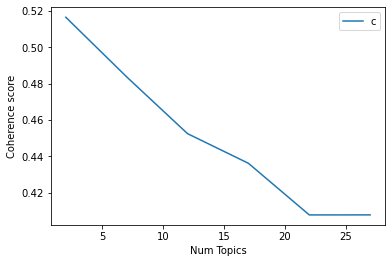

In [202]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us_score1)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [203]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us_score1):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 2

index: 0 | Num Topics = 2  has Coherence Value of 0.5165
index: 1 | Num Topics = 7  has Coherence Value of 0.4837
index: 2 | Num Topics = 12  has Coherence Value of 0.4525
index: 3 | Num Topics = 17  has Coherence Value of 0.4362
index: 4 | Num Topics = 22  has Coherence Value of 0.4078
index: 5 | Num Topics = 27  has Coherence Value of 0.4078


In [328]:
# Select optimal number of topics
optimal_model_us_score1 = model_list_us_score1[0]

In [329]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us_score1 = pyLDAvis.gensim_models.prepare(optimal_model_us_score1, corpus_us_score1, id2word_us_score1)

In [330]:
print("pyLDAVis for us topics for score=1:")
vis_us_score1

pyLDAVis for us topics for score=1:


PreparedData(topic_coordinates=              x    y  topics  cluster       Freq
topic                                           
1      0.128347  0.0       1        1  62.266682
0     -0.128347  0.0       2        1  37.733318, topic_info=         Term        Freq       Total Category  logprob  loglift
10      video  697.000000  697.000000  Default  30.0000  30.0000
32      phone  159.000000  159.000000  Default  29.0000  29.0000
66      music  155.000000  155.000000  Default  28.0000  28.0000
377      flip  315.000000  315.000000  Default  27.0000  27.0000
2        time  340.000000  340.000000  Default  26.0000  26.0000
..        ...         ...         ...      ...      ...      ...
308   account   87.996789  142.409317   Topic2  -5.0481   0.4932
25   download  144.135727  424.265102   Topic2  -4.5546  -0.1050
12        way   69.829326  138.487605   Topic2  -5.2793   0.2899
39      start   63.818574   97.273322   Topic2  -5.3693   0.5531
197      well   64.674902  175.654852   Topic2  -5.3560  -0.0245

[127 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
308       1  0.379189    account
308       2  0.617937    account
1600      1  0.996745     accuse
1566      1  0.984840  allegedly
13        1  0.651070        app
...     ...       ...        ...
1901      1  0.992219  weinstein
197       1  0.631921       well
197       2  0.370044       well
3         1  0.103359       work
3         2  0.895777       work

[158 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 1])

## LDA Topic Modelling (Rating = 2)

In [207]:
# By-rating Topic Modelling - rating = 2
# Convert to list - move to each section
review_us_score2 = triller_ios_us_review_YearMonth_score2.review.values.tolist()
review_words_us_score2 = list(sent_to_words(review_us_score2))
print(review_words_us_score2[:1])

[['downloaded', 'after', 'deleting', 'while', 'ago', 'to', 'see', 'if', 'they', 'fixed', 'the', 'bugs', 'they', 'haven', 'still', 'can', 'use', 'songs', 'from', 'my', 'library', 'only', 'one', 'album', 'of', 'my', 'music', 'shows', 'up', 'and', 'you', 'can', 'search', 'songs', 'on', 'their', 'app', 'only', 'browse', 'nice', 'concept', 'but', 'have', 'lot', 'of', 'work', 'to', 'do', 'and', 'stop', 'having', 'other', 'people', 'videos', 'play', 'as', 'soon', 'as', 'open', 'the', 'app']]


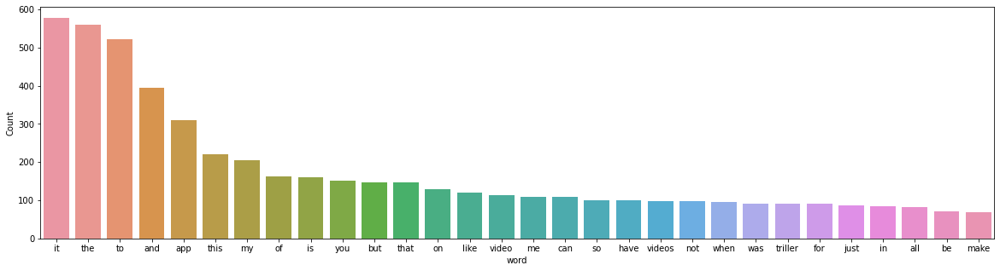

In [208]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us_score2))

In [209]:
# Clean text
review_us_ready_score2 = process_words(review_words_us_score2)  # processed Text Data! - move to each section


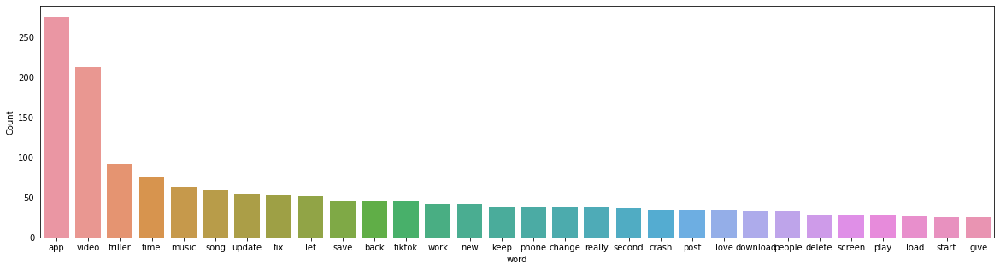

In [210]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_us_ready_score2))


In [211]:
# Create Dictionary
id2word_us_score2 = corpora.Dictionary(review_us_ready_score2)

2021-10-20 16:53:34,146 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-20 16:53:34,155 [INFO] gensim.corpora.dictionary - built Dictionary(1035 unique tokens: ['ago', 'album', 'app', 'browse', 'bug']...) from 314 documents (total 4797 corpus positions)
2021-10-20 16:53:34,156 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(1035 unique tokens: ['ago', 'album', 'app', 'browse', 'bug']...) from 314 documents (total 4797 corpus positions)", 'datetime': '2021-10-20T16:53:34.156406', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [212]:
# Create Corpus: Term Document Frequency
corpus_us_score2 = [id2word_us_score2.doc2bow(text) for text in review_us_ready_score2]

In [213]:
# Training LDA model
model_list_us_score2, coherence_values_us_score2 = compute_coherence_values(dictionary=id2word_us_score2, corpus=corpus_us_score2, 
                                                              texts=review_us_ready_score2, limit=30, start=2, step=5)


2021-10-20 16:53:34,367 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-20 16:53:34,368 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-20 16:53:34,370 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 16:53:34,371 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 314 documents, updating model once every 314 documents, evaluating perplexity every 314 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-20 16:53:34,607 [INFO] gensim.models.ldamodel - -7.517 per-word bound, 183.2 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:53:34,608 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #314/314
2021-10-20 16:53:34,817 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.053*"app" + 0.042*"video" + 0.015*"triller" + 0.014*"time" + 0.013*"music" + 0.013*"fix" + 0.012*"upda

2021-10-20 16:53:37,186 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"app" + 0.025*"video" + 0.013*"triller" + 0.013*"work" + 0.012*"tiktok" + 0.011*"back" + 0.009*"let" + 0.009*"save" + 0.009*"email" + 0.009*"screen"
2021-10-20 16:53:37,187 [INFO] gensim.models.ldamodel - topic diff=0.013974, rho=0.301511
2021-10-20 16:53:37,330 [INFO] gensim.models.ldamodel - -6.256 per-word bound, 76.4 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:53:37,331 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #314/314
2021-10-20 16:53:37,431 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.055*"app" + 0.044*"video" + 0.018*"music" + 0.018*"triller" + 0.018*"time" + 0.013*"song" + 0.013*"fix" + 0.013*"update" + 0.010*"second" + 0.010*"crash"
2021-10-20 16:53:37,432 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"app" + 0.025*"video" + 0.013*"triller" + 0.013*"work" + 0.012*"tiktok" + 0.012*"back" + 0.009*"let" + 0.009*"s

2021-10-20 16:53:39,403 [INFO] gensim.models.ldamodel - topic diff=0.006809, rho=0.218218
2021-10-20 16:53:39,520 [INFO] gensim.models.ldamodel - -6.249 per-word bound, 76.1 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:53:39,521 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #314/314
2021-10-20 16:53:39,606 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.054*"app" + 0.046*"video" + 0.019*"triller" + 0.018*"time" + 0.018*"music" + 0.015*"song" + 0.013*"fix" + 0.012*"update" + 0.010*"second" + 0.010*"crash"
2021-10-20 16:53:39,606 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"app" + 0.022*"video" + 0.013*"tiktok" + 0.013*"work" + 0.012*"triller" + 0.012*"back" + 0.010*"screen" + 0.009*"email" + 0.009*"let" + 0.009*"follow"
2021-10-20 16:53:39,607 [INFO] gensim.models.ldamodel - topic diff=0.006478, rho=0.213201
2021-10-20 16:53:39,724 [INFO] gensim.models.ldamodel - -6.249 per-word bound, 76.1 perplexity esti

2021-10-20 16:53:41,547 [INFO] gensim.models.ldamodel - -6.245 per-word bound, 75.9 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:53:41,548 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #314/314
2021-10-20 16:53:41,634 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.053*"app" + 0.047*"video" + 0.019*"triller" + 0.019*"time" + 0.018*"music" + 0.016*"song" + 0.013*"fix" + 0.012*"update" + 0.011*"second" + 0.010*"crash"
2021-10-20 16:53:41,634 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.039*"app" + 0.020*"video" + 0.014*"tiktok" + 0.013*"work" + 0.012*"back" + 0.012*"triller" + 0.010*"screen" + 0.010*"let" + 0.009*"email" + 0.009*"follow"
2021-10-20 16:53:41,635 [INFO] gensim.models.ldamodel - topic diff=0.006029, rho=0.176777
2021-10-20 16:53:41,753 [INFO] gensim.models.ldamodel - -6.244 per-word bound, 75.8 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:53:41,754 [

2021-10-20 16:53:43,599 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #314/314
2021-10-20 16:53:43,690 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.052*"app" + 0.048*"video" + 0.019*"time" + 0.019*"triller" + 0.018*"music" + 0.016*"song" + 0.012*"fix" + 0.012*"update" + 0.011*"second" + 0.010*"crash"
2021-10-20 16:53:43,691 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.040*"app" + 0.019*"video" + 0.014*"tiktok" + 0.012*"work" + 0.012*"back" + 0.011*"triller" + 0.010*"screen" + 0.010*"let" + 0.009*"email" + 0.009*"follow"
2021-10-20 16:53:43,692 [INFO] gensim.models.ldamodel - topic diff=0.003739, rho=0.154303
2021-10-20 16:53:43,812 [INFO] gensim.models.ldamodel - -6.240 per-word bound, 75.6 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:53:43,813 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #314/314
2021-10-20 16:53:43,903 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.052*"app" + 0.048

2021-10-20 16:53:45,454 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-20 16:53:46,962 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-20 16:53:47,005 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 305 virtual documents
2021-10-20 16:53:47,103 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.14285714285714285
2021-10-20 16:53:47,104 [INFO] gensim.models.ldamodel - using symmetric eta at 0.14285714285714285
2021-10-20 16:53:47,106 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 16:53:47,107 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 7 topics, 50 passes over the supplied corpus of 314 documents, updating model once every 314 documents, evaluating perplexity every 314 documents, iterating 50x with a con

2021-10-20 16:53:48,478 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.046*"app" + 0.032*"video" + 0.022*"tiktok" + 0.019*"triller" + 0.018*"back" + 0.017*"time" + 0.016*"crash" + 0.016*"save" + 0.013*"keep" + 0.011*"really"
2021-10-20 16:53:48,479 [INFO] gensim.models.ldamodel - topic diff=0.078335, rho=0.408248
2021-10-20 16:53:48,604 [INFO] gensim.models.ldamodel - -6.529 per-word bound, 92.3 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:53:48,604 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #314/314
2021-10-20 16:53:48,682 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.061*"app" + 0.022*"work" + 0.021*"video" + 0.014*"give" + 0.013*"triller" + 0.010*"love" + 0.009*"review" + 0.009*"ryan" + 0.009*"star" + 0.008*"phone"
2021-10-20 16:53:48,683 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.047*"app" + 0.032*"video" + 0.022*"tiktok" + 0.019*"triller" + 0.018*"back" + 0.017*"time" + 0.016*"crash" + 0.016*"s

2021-10-20 16:53:49,567 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.054*"song" + 0.023*"triller" + 0.019*"music" + 0.018*"search" + 0.018*"app" + 0.017*"post" + 0.017*"second" + 0.016*"time" + 0.015*"let" + 0.015*"video"
2021-10-20 16:53:49,567 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.024*"app" + 0.017*"video" + 0.016*"email" + 0.014*"link" + 0.012*"thing" + 0.011*"send" + 0.010*"time" + 0.010*"flip" + 0.010*"add" + 0.010*"tell"
2021-10-20 16:53:49,568 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.071*"app" + 0.037*"video" + 0.019*"let" + 0.018*"triller" + 0.017*"update" + 0.016*"people" + 0.013*"fix" + 0.011*"tok" + 0.011*"glitch" + 0.010*"phone"
2021-10-20 16:53:49,569 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.059*"music" + 0.041*"app" + 0.021*"update" + 0.020*"new" + 0.020*"time" + 0.017*"play" + 0.017*"phone" + 0.016*"apple" + 0.014*"find" + 0.014*"download"
2021-10-20 16:53:49,569 [INFO] gensim.models.ldamodel - topic diff=0.016483, rho=0.288675


2021-10-20 16:53:50,446 [INFO] gensim.models.ldamodel - topic diff=0.009231, rho=0.242536
2021-10-20 16:53:50,548 [INFO] gensim.models.ldamodel - -6.493 per-word bound, 90.1 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:53:50,549 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #314/314
2021-10-20 16:53:50,612 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.073*"video" + 0.048*"app" + 0.019*"time" + 0.015*"fix" + 0.015*"triller" + 0.012*"screen" + 0.011*"clip" + 0.011*"new" + 0.010*"work" + 0.010*"love"
2021-10-20 16:53:50,613 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.060*"app" + 0.023*"work" + 0.016*"give" + 0.014*"triller" + 0.013*"video" + 0.011*"review" + 0.011*"love" + 0.010*"ryan" + 0.010*"star" + 0.008*"phone"
2021-10-20 16:53:50,614 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.072*"app" + 0.037*"video" + 0.020*"let" + 0.017*"triller" + 0.017*"people" + 0.017*"update" + 0.013*"tok" + 0.012*"fix" +

2021-10-20 16:53:51,477 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.058*"song" + 0.022*"triller" + 0.020*"post" + 0.019*"search" + 0.019*"second" + 0.017*"let" + 0.016*"time" + 0.016*"app" + 0.015*"video" + 0.014*"music"
2021-10-20 16:53:51,478 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.071*"app" + 0.036*"video" + 0.020*"let" + 0.017*"people" + 0.017*"triller" + 0.017*"update" + 0.013*"tok" + 0.012*"fix" + 0.011*"follow" + 0.011*"glitch"
2021-10-20 16:53:51,478 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.068*"music" + 0.043*"app" + 0.022*"play" + 0.022*"time" + 0.020*"update" + 0.020*"phone" + 0.019*"new" + 0.016*"apple" + 0.015*"open" + 0.014*"find"
2021-10-20 16:53:51,479 [INFO] gensim.models.ldamodel - topic diff=0.006687, rho=0.208514
2021-10-20 16:53:51,581 [INFO] gensim.models.ldamodel - -6.486 per-word bound, 89.6 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:53:51,581 [INFO] gensim.models.ldamodel - PROGRE

2021-10-20 16:53:52,438 [INFO] gensim.models.ldamodel - -6.481 per-word bound, 89.4 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:53:52,439 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #314/314
2021-10-20 16:53:52,502 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.073*"video" + 0.048*"app" + 0.019*"time" + 0.015*"fix" + 0.015*"triller" + 0.012*"screen" + 0.011*"work" + 0.011*"clip" + 0.011*"love" + 0.011*"new"
2021-10-20 16:53:52,503 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.071*"app" + 0.036*"video" + 0.020*"let" + 0.018*"people" + 0.017*"update" + 0.017*"triller" + 0.014*"tok" + 0.012*"fix" + 0.011*"follow" + 0.011*"glitch"
2021-10-20 16:53:52,504 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.058*"app" + 0.018*"work" + 0.016*"give" + 0.014*"triller" + 0.012*"review" + 0.011*"video" + 0.010*"star" + 0.010*"ryan" + 0.010*"love" + 0.008*"phone"
2021-10-20 16:53:52,505 [INFO] gensim.models.ldamodel - t

2021-10-20 16:53:53,342 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.073*"video" + 0.048*"app" + 0.019*"time" + 0.015*"triller" + 0.015*"fix" + 0.012*"screen" + 0.011*"work" + 0.011*"clip" + 0.011*"love" + 0.011*"second"
2021-10-20 16:53:53,343 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.071*"music" + 0.044*"app" + 0.026*"play" + 0.023*"time" + 0.022*"phone" + 0.019*"update" + 0.019*"open" + 0.018*"new" + 0.015*"apple" + 0.014*"triller"
2021-10-20 16:53:53,344 [INFO] gensim.models.ldamodel - topic diff=0.003289, rho=0.171499
2021-10-20 16:53:53,441 [INFO] gensim.models.ldamodel - -6.478 per-word bound, 89.2 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:53:53,442 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #314/314
2021-10-20 16:53:53,504 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.047*"app" + 0.033*"video" + 0.022*"tiktok" + 0.020*"save" + 0.019*"triller" + 0.019*"crash" + 0.018*"back" + 0.017*"ti

2021-10-20 16:53:54,338 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.024*"email" + 0.024*"app" + 0.017*"video" + 0.014*"link" + 0.014*"send" + 0.012*"thing" + 0.010*"flip" + 0.010*"add" + 0.010*"tell" + 0.009*"click"
2021-10-20 16:53:54,339 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.072*"app" + 0.036*"video" + 0.020*"let" + 0.018*"people" + 0.017*"update" + 0.017*"triller" + 0.015*"tok" + 0.011*"fix" + 0.011*"tik" + 0.011*"follow"
2021-10-20 16:53:54,340 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.073*"video" + 0.048*"app" + 0.019*"time" + 0.016*"triller" + 0.015*"fix" + 0.012*"screen" + 0.012*"work" + 0.011*"love" + 0.011*"second" + 0.011*"clip"
2021-10-20 16:53:54,341 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.047*"app" + 0.033*"video" + 0.022*"tiktok" + 0.020*"save" + 0.019*"triller" + 0.019*"crash" + 0.017*"time" + 0.017*"back" + 0.012*"update" + 0.012*"keep"
2021-10-20 16:53:54,341 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.058*"app" + 0.0

2021-10-20 16:53:55,184 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.047*"app" + 0.033*"video" + 0.021*"tiktok" + 0.020*"save" + 0.019*"triller" + 0.019*"crash" + 0.018*"time" + 0.017*"back" + 0.012*"update" + 0.012*"keep"
2021-10-20 16:53:55,185 [INFO] gensim.models.ldamodel - topic diff=0.001484, rho=0.149071
2021-10-20 16:53:55,286 [INFO] gensim.models.ldamodel - -6.475 per-word bound, 89.0 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:53:55,287 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #314/314
2021-10-20 16:53:55,354 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.047*"app" + 0.033*"video" + 0.021*"tiktok" + 0.020*"save" + 0.019*"crash" + 0.019*"triller" + 0.018*"time" + 0.017*"back" + 0.012*"update" + 0.012*"keep"
2021-10-20 16:53:55,355 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.024*"email" + 0.024*"app" + 0.017*"video" + 0.014*"link" + 0.014*"send" + 0.012*"thing" + 0.010*"flip" + 0.010*"ad

2021-10-20 16:53:56,202 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.058*"app" + 0.017*"give" + 0.016*"work" + 0.014*"triller" + 0.012*"review" + 0.011*"video" + 0.010*"star" + 0.010*"ryan" + 0.010*"love" + 0.008*"bad"
2021-10-20 16:53:56,203 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.061*"song" + 0.022*"post" + 0.021*"triller" + 0.020*"search" + 0.018*"second" + 0.016*"let" + 0.016*"video" + 0.014*"time" + 0.014*"app" + 0.012*"start"
2021-10-20 16:53:56,204 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.073*"video" + 0.048*"app" + 0.019*"time" + 0.016*"triller" + 0.015*"fix" + 0.012*"screen" + 0.012*"work" + 0.011*"second" + 0.011*"clip" + 0.011*"love"
2021-10-20 16:53:56,204 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.072*"music" + 0.044*"app" + 0.027*"play" + 0.024*"time" + 0.023*"phone" + 0.020*"open" + 0.019*"update" + 0.018*"new" + 0.015*"apple" + 0.014*"triller"
2021-10-20 16:53:56,205 [INFO] gensim.models.ldamodel - topic diff=0.001182, rho=0.140028

2021-10-20 16:53:58,992 [INFO] gensim.models.ldamodel - topic diff=0.159690, rho=0.447214
2021-10-20 16:53:59,117 [INFO] gensim.models.ldamodel - -6.727 per-word bound, 105.9 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:53:59,118 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #314/314
2021-10-20 16:53:59,188 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.070*"app" + 0.028*"update" + 0.027*"song" + 0.025*"triller" + 0.021*"video" + 0.016*"keep" + 0.015*"new" + 0.015*"screen" + 0.014*"music" + 0.014*"back"
2021-10-20 16:53:59,189 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.084*"video" + 0.028*"time" + 0.027*"app" + 0.021*"fix" + 0.020*"second" + 0.014*"long" + 0.012*"triller" + 0.012*"change" + 0.011*"clip" + 0.011*"email"
2021-10-20 16:53:59,190 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.034*"time" + 0.034*"app" + 0.027*"video" + 0.025*"triller" + 0.020*"post" + 0.019*"change" + 0.018*"crash" + 0.017*

2021-10-20 16:54:00,096 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.031*"app" + 0.030*"song" + 0.027*"video" + 0.021*"music" + 0.018*"triller" + 0.015*"back" + 0.015*"search" + 0.013*"start" + 0.013*"post" + 0.013*"time"
2021-10-20 16:54:00,097 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.048*"video" + 0.022*"work" + 0.021*"really" + 0.019*"app" + 0.019*"back" + 0.019*"freeze" + 0.011*"shuffle" + 0.011*"start" + 0.011*"old" + 0.010*"tiktok"
2021-10-20 16:54:00,098 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.069*"app" + 0.028*"update" + 0.027*"song" + 0.024*"triller" + 0.021*"video" + 0.017*"screen" + 0.016*"keep" + 0.015*"back" + 0.015*"new" + 0.014*"music"
2021-10-20 16:54:00,099 [INFO] gensim.models.ldamodel - topic diff=0.029796, rho=0.301511
2021-10-20 16:54:00,209 [INFO] gensim.models.ldamodel - -6.676 per-word bound, 102.3 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:00,210 [INFO] gensim.models.ldamodel -

2021-10-20 16:54:01,349 [INFO] gensim.models.ldamodel - -6.667 per-word bound, 101.6 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:01,350 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #314/314
2021-10-20 16:54:01,411 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.035*"app" + 0.035*"time" + 0.028*"triller" + 0.027*"video" + 0.021*"post" + 0.020*"change" + 0.019*"keep" + 0.019*"crash" + 0.017*"account" + 0.016*"second"
2021-10-20 16:54:01,413 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.030*"app" + 0.030*"song" + 0.027*"video" + 0.021*"music" + 0.018*"triller" + 0.015*"back" + 0.015*"search" + 0.013*"start" + 0.013*"time" + 0.013*"post"
2021-10-20 16:54:01,413 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.090*"music" + 0.034*"let" + 0.032*"apple" + 0.028*"allow" + 0.024*"access" + 0.021*"app" + 0.020*"phone" + 0.020*"time" + 0.018*"click" + 0.013*"change"
2021-10-20 16:54:01,414 [INFO] gensim.models.lda

2021-10-20 16:54:02,348 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.069*"app" + 0.022*"triller" + 0.020*"tok" + 0.019*"download" + 0.018*"people" + 0.017*"tiktok" + 0.016*"video" + 0.014*"tik" + 0.014*"let" + 0.012*"content"
2021-10-20 16:54:02,349 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.083*"video" + 0.031*"time" + 0.027*"app" + 0.022*"fix" + 0.020*"second" + 0.014*"long" + 0.014*"save" + 0.013*"triller" + 0.011*"change" + 0.011*"new"
2021-10-20 16:54:02,350 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.050*"app" + 0.048*"video" + 0.023*"delete" + 0.021*"update" + 0.016*"fix" + 0.015*"tiktok" + 0.014*"edit" + 0.013*"phone" + 0.012*"thing" + 0.012*"super"
2021-10-20 16:54:02,350 [INFO] gensim.models.ldamodel - topic diff=0.004376, rho=0.213201
2021-10-20 16:54:02,456 [INFO] gensim.models.ldamodel - -6.661 per-word bound, 101.2 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:02,457 [INFO] gensim.models.ldamodel -

2021-10-20 16:54:03,340 [INFO] gensim.models.ldamodel - -6.659 per-word bound, 101.0 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:03,340 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #314/314
2021-10-20 16:54:03,412 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.068*"app" + 0.028*"song" + 0.028*"update" + 0.024*"triller" + 0.022*"video" + 0.018*"screen" + 0.015*"back" + 0.015*"keep" + 0.015*"new" + 0.012*"music"
2021-10-20 16:54:03,413 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.058*"app" + 0.035*"video" + 0.023*"play" + 0.022*"song" + 0.017*"fix" + 0.017*"people" + 0.016*"keep" + 0.016*"delete" + 0.013*"annoying" + 0.013*"everytime"
2021-10-20 16:54:03,414 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.048*"video" + 0.023*"work" + 0.021*"really" + 0.019*"back" + 0.019*"freeze" + 0.018*"app" + 0.011*"shuffle" + 0.011*"start" + 0.010*"tiktok" + 0.009*"old"
2021-10-20 16:54:03,415 [INFO] gensim.models

2021-10-20 16:54:04,308 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.048*"video" + 0.023*"work" + 0.021*"really" + 0.019*"back" + 0.019*"freeze" + 0.018*"app" + 0.011*"shuffle" + 0.011*"start" + 0.010*"tiktok" + 0.009*"give"
2021-10-20 16:54:04,309 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.068*"app" + 0.028*"song" + 0.027*"update" + 0.024*"triller" + 0.022*"video" + 0.018*"screen" + 0.015*"back" + 0.015*"keep" + 0.014*"new" + 0.012*"music"
2021-10-20 16:54:04,309 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.059*"app" + 0.035*"video" + 0.023*"play" + 0.022*"song" + 0.017*"keep" + 0.017*"fix" + 0.017*"people" + 0.016*"delete" + 0.013*"annoying" + 0.013*"everytime"
2021-10-20 16:54:04,310 [INFO] gensim.models.ldamodel - topic diff=0.001644, rho=0.174078
2021-10-20 16:54:04,412 [INFO] gensim.models.ldamodel - -6.657 per-word bound, 100.9 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:04,413 [INFO] gensim.models.ldam

2021-10-20 16:54:05,241 [INFO] gensim.models.ldamodel - -6.656 per-word bound, 100.8 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:05,241 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #314/314
2021-10-20 16:54:05,303 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.052*"app" + 0.048*"video" + 0.023*"delete" + 0.021*"update" + 0.017*"fix" + 0.015*"tiktok" + 0.014*"edit" + 0.013*"phone" + 0.012*"thing" + 0.012*"super"
2021-10-20 16:54:05,304 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.082*"video" + 0.030*"time" + 0.025*"app" + 0.020*"second" + 0.020*"fix" + 0.015*"save" + 0.014*"long" + 0.013*"triller" + 0.012*"new" + 0.012*"change"
2021-10-20 16:54:05,305 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.070*"app" + 0.022*"triller" + 0.020*"tok" + 0.020*"download" + 0.018*"people" + 0.017*"tiktok" + 0.016*"video" + 0.015*"let" + 0.014*"tik" + 0.012*"content"
2021-10-20 16:54:05,305 [INFO] gensim.models.ldam

2021-10-20 16:54:06,122 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.030*"app" + 0.030*"song" + 0.027*"video" + 0.020*"music" + 0.018*"triller" + 0.015*"back" + 0.015*"search" + 0.014*"start" + 0.013*"time" + 0.013*"post"
2021-10-20 16:54:06,123 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.035*"app" + 0.035*"time" + 0.028*"triller" + 0.027*"video" + 0.021*"post" + 0.019*"keep" + 0.019*"change" + 0.019*"crash" + 0.017*"account" + 0.015*"second"
2021-10-20 16:54:06,123 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.059*"app" + 0.036*"video" + 0.023*"play" + 0.022*"song" + 0.018*"keep" + 0.017*"fix" + 0.017*"people" + 0.016*"delete" + 0.013*"annoying" + 0.013*"phone"
2021-10-20 16:54:06,124 [INFO] gensim.models.ldamodel - topic diff=0.000767, rho=0.150756
2021-10-20 16:54:06,233 [INFO] gensim.models.ldamodel - -6.655 per-word bound, 100.8 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:06,234 [INFO] gensim.models.ldamodel

2021-10-20 16:54:06,981 [INFO] gensim.models.ldamodel - topic diff=0.000818, rho=0.142857
2021-10-20 16:54:07,080 [INFO] gensim.models.ldamodel - -6.655 per-word bound, 100.8 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:07,081 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #314/314
2021-10-20 16:54:07,146 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.091*"music" + 0.039*"let" + 0.037*"allow" + 0.030*"apple" + 0.025*"glitch" + 0.023*"access" + 0.022*"time" + 0.021*"phone" + 0.021*"app" + 0.018*"click"
2021-10-20 16:54:07,147 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.071*"app" + 0.022*"triller" + 0.020*"tok" + 0.020*"download" + 0.018*"people" + 0.017*"tiktok" + 0.016*"video" + 0.015*"let" + 0.014*"tik" + 0.012*"content"
2021-10-20 16:54:07,148 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.082*"video" + 0.030*"time" + 0.025*"app" + 0.020*"second" + 0.020*"fix" + 0.016*"save" + 0.014*"long" + 0.013*"

2021-10-20 16:54:09,944 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.039*"second" + 0.028*"app" + 0.028*"update" + 0.023*"video" + 0.021*"new" + 0.018*"triller" + 0.017*"tok" + 0.016*"much" + 0.014*"allow" + 0.014*"work"
2021-10-20 16:54:09,945 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.091*"music" + 0.036*"apple" + 0.025*"access" + 0.023*"time" + 0.021*"glitch" + 0.018*"allow" + 0.018*"reason" + 0.016*"triller" + 0.014*"find" + 0.014*"result"
2021-10-20 16:54:09,946 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.040*"video" + 0.038*"time" + 0.033*"app" + 0.024*"triller" + 0.024*"music" + 0.020*"song" + 0.020*"start" + 0.019*"post" + 0.015*"change" + 0.015*"play"
2021-10-20 16:54:09,946 [INFO] gensim.models.ldamodel - topic diff=0.203812, rho=0.500000
2021-10-20 16:54:10,061 [INFO] gensim.models.ldamodel - -6.894 per-word bound, 119.0 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:10,062 [INFO] gensim.models.ldamode

2021-10-20 16:54:11,012 [INFO] gensim.models.ldamodel - -6.798 per-word bound, 111.3 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:11,013 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #314/314
2021-10-20 16:54:11,091 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.072*"app" + 0.032*"video" + 0.025*"triller" + 0.020*"time" + 0.018*"hear" + 0.015*"play" + 0.014*"happen" + 0.014*"music" + 0.013*"update" + 0.013*"glitch"
2021-10-20 16:54:11,092 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.057*"video" + 0.048*"app" + 0.030*"start" + 0.024*"phone" + 0.022*"screen" + 0.022*"fix" + 0.018*"home" + 0.013*"keep" + 0.012*"really" + 0.012*"give"
2021-10-20 16:54:11,093 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.056*"video" + 0.043*"app" + 0.019*"slow" + 0.018*"fix" + 0.015*"time" + 0.014*"really" + 0.013*"tiktok" + 0.013*"back" + 0.012*"thing" + 0.012*"sound"
2021-10-20 16:54:11,093 [INFO] gensim.models.ldamodel

2021-10-20 16:54:11,972 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.055*"app" + 0.037*"song" + 0.033*"update" + 0.031*"triller" + 0.021*"video" + 0.020*"new" + 0.013*"keep" + 0.011*"email" + 0.011*"back" + 0.010*"let"
2021-10-20 16:54:11,973 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.094*"video" + 0.028*"app" + 0.018*"time" + 0.014*"clip" + 0.014*"long" + 0.013*"fix" + 0.013*"load" + 0.012*"crash" + 0.011*"edit" + 0.011*"triller"
2021-10-20 16:54:11,974 [INFO] gensim.models.ldamodel - topic diff=0.015014, rho=0.258199
2021-10-20 16:54:12,076 [INFO] gensim.models.ldamodel - -6.779 per-word bound, 109.8 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:12,077 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #314/314
2021-10-20 16:54:12,144 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.064*"app" + 0.015*"triller" + 0.014*"star" + 0.014*"ryan" + 0.013*"video" + 0.012*"love" + 0.011*"old" + 0.011*"new" + 0

2021-10-20 16:54:12,923 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #314/314
2021-10-20 16:54:12,986 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.064*"app" + 0.015*"triller" + 0.014*"star" + 0.014*"ryan" + 0.013*"video" + 0.012*"love" + 0.011*"new" + 0.011*"old" + 0.010*"crash" + 0.010*"people"
2021-10-20 16:54:12,987 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.071*"app" + 0.031*"video" + 0.024*"triller" + 0.020*"hear" + 0.019*"time" + 0.017*"play" + 0.017*"happen" + 0.015*"update" + 0.015*"music" + 0.013*"open"
2021-10-20 16:54:12,988 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.061*"app" + 0.037*"video" + 0.027*"let" + 0.026*"triller" + 0.017*"tiktok" + 0.014*"really" + 0.012*"load" + 0.010*"new" + 0.010*"update" + 0.010*"social"
2021-10-20 16:54:12,989 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.057*"video" + 0.043*"app" + 0.020*"slow" + 0.018*"fix" + 0.015*"time" + 0.014*"really" + 0.013*"tiktok" + 0.013*"back" + 0.013*"thing" + 0.

2021-10-20 16:54:13,801 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.071*"app" + 0.031*"video" + 0.024*"triller" + 0.020*"hear" + 0.019*"time" + 0.018*"happen" + 0.017*"play" + 0.016*"music" + 0.015*"update" + 0.013*"open"
2021-10-20 16:54:13,802 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.061*"app" + 0.037*"video" + 0.027*"let" + 0.026*"triller" + 0.017*"tiktok" + 0.014*"really" + 0.012*"load" + 0.010*"new" + 0.010*"update" + 0.010*"social"
2021-10-20 16:54:13,803 [INFO] gensim.models.ldamodel - topic diff=0.003360, rho=0.196116
2021-10-20 16:54:13,894 [INFO] gensim.models.ldamodel - -6.767 per-word bound, 108.9 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:13,895 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #314/314
2021-10-20 16:54:13,955 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.079*"app" + 0.030*"video" + 0.022*"tok" + 0.018*"crash" + 0.017*"triller" + 0.017*"tik" + 0.016*"tiktok" + 0.01

2021-10-20 16:54:14,781 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #314/314
2021-10-20 16:54:14,847 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.040*"video" + 0.036*"app" + 0.032*"time" + 0.017*"triller" + 0.016*"second" + 0.015*"back" + 0.014*"tiktok" + 0.014*"change" + 0.013*"long" + 0.012*"connect"
2021-10-20 16:54:14,848 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.140*"music" + 0.045*"apple" + 0.044*"allow" + 0.030*"access" + 0.029*"find" + 0.025*"result" + 0.025*"download" + 0.024*"time" + 0.022*"glitch" + 0.019*"app"
2021-10-20 16:54:14,848 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.028*"filter" + 0.022*"really" + 0.015*"app" + 0.015*"keep" + 0.015*"follower" + 0.015*"glitche" + 0.015*"artist" + 0.015*"work" + 0.015*"freeze" + 0.015*"wrong"
2021-10-20 16:54:14,849 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.057*"video" + 0.043*"app" + 0.020*"slow" + 0.018*"fix" + 0.015*"time" + 0.014*"really" + 0.013*"tiktok" + 0.013*"back" + 0.

2021-10-20 16:54:15,819 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.042*"video" + 0.042*"app" + 0.039*"time" + 0.033*"music" + 0.025*"play" + 0.025*"song" + 0.023*"start" + 0.022*"triller" + 0.020*"stop" + 0.020*"close"
2021-10-20 16:54:15,820 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.055*"app" + 0.037*"song" + 0.033*"update" + 0.031*"triller" + 0.021*"video" + 0.020*"new" + 0.012*"keep" + 0.011*"email" + 0.011*"back" + 0.010*"let"
2021-10-20 16:54:15,821 [INFO] gensim.models.ldamodel - topic diff=0.001381, rho=0.164399
2021-10-20 16:54:15,927 [INFO] gensim.models.ldamodel - -6.765 per-word bound, 108.8 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:15,928 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #314/314
2021-10-20 16:54:15,996 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.022*"log" + 0.022*"tiktok" + 0.011*"alot" + 0.011*"sad" + 0.011*"back" + 0.011*"project" + 0.011*"lose" + 0.011*"gon"

2021-10-20 16:54:16,790 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #314/314
2021-10-20 16:54:16,859 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.079*"app" + 0.030*"video" + 0.022*"tok" + 0.017*"crash" + 0.017*"triller" + 0.017*"tik" + 0.016*"tiktok" + 0.016*"save" + 0.016*"download" + 0.014*"post"
2021-10-20 16:54:16,860 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.022*"log" + 0.022*"tiktok" + 0.011*"alot" + 0.011*"sad" + 0.011*"back" + 0.011*"project" + 0.011*"lose" + 0.011*"gon" + 0.011*"save" + 0.011*"delete"
2021-10-20 16:54:16,861 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.024*"let" + 0.024*"work" + 0.024*"still" + 0.024*"video" + 0.022*"post" + 0.018*"triller" + 0.014*"app" + 0.012*"tiktok" + 0.012*"first" + 0.012*"interesting"
2021-10-20 16:54:16,862 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.058*"second" + 0.031*"update" + 0.023*"new" + 0.023*"much" + 0.022*"app" + 0.020*"video" + 0.018*"tok" + 0.018*"way" + 0.016*"triller" +

2021-10-20 16:54:17,696 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.055*"app" + 0.037*"song" + 0.033*"update" + 0.031*"triller" + 0.021*"video" + 0.020*"new" + 0.012*"keep" + 0.011*"email" + 0.011*"back" + 0.010*"let"
2021-10-20 16:54:17,697 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.062*"app" + 0.037*"video" + 0.027*"let" + 0.027*"triller" + 0.017*"tiktok" + 0.014*"really" + 0.012*"load" + 0.010*"new" + 0.010*"social" + 0.010*"update"
2021-10-20 16:54:17,698 [INFO] gensim.models.ldamodel - topic diff=0.001396, rho=0.144338
2021-10-20 16:54:17,790 [INFO] gensim.models.ldamodel - -6.762 per-word bound, 108.5 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:17,791 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #314/314
2021-10-20 16:54:17,847 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.022*"log" + 0.022*"tiktok" + 0.011*"alot" + 0.011*"sad" + 0.011*"back" + 0.011*"project" + 0.011*"lose" + 0.011*"

2021-10-20 16:54:20,842 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.062*"app" + 0.027*"video" + 0.018*"download" + 0.017*"crash" + 0.016*"much" + 0.016*"triller" + 0.015*"screen" + 0.012*"tok" + 0.011*"allow" + 0.011*"platform"
2021-10-20 16:54:20,843 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.029*"time" + 0.026*"new" + 0.024*"app" + 0.023*"music" + 0.021*"let" + 0.021*"triller" + 0.020*"update" + 0.020*"work" + 0.017*"second" + 0.016*"video"
2021-10-20 16:54:20,843 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.034*"video" + 0.029*"app" + 0.021*"tiktok" + 0.018*"time" + 0.016*"second" + 0.015*"ban" + 0.013*"really" + 0.013*"back" + 0.012*"triller" + 0.012*"change"
2021-10-20 16:54:20,844 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.089*"app" + 0.023*"triller" + 0.021*"video" + 0.016*"tok" + 0.014*"fix" + 0.013*"tik" + 0.013*"save" + 0.011*"love" + 0.011*"phone" + 0.010*"tiktok"
2021-10-20 16:54:20,845 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.0

2021-10-20 16:54:21,668 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.071*"let" + 0.042*"app" + 0.034*"video" + 0.030*"update" + 0.025*"follow" + 0.025*"people" + 0.020*"show" + 0.020*"tiktok" + 0.020*"keep" + 0.018*"clip"
2021-10-20 16:54:21,669 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.034*"video" + 0.030*"app" + 0.024*"tiktok" + 0.016*"ban" + 0.014*"really" + 0.012*"time" + 0.012*"give" + 0.011*"account" + 0.011*"download" + 0.011*"triller"
2021-10-20 16:54:21,669 [INFO] gensim.models.ldamodel - topic diff=0.100233, rho=0.353553
2021-10-20 16:54:21,767 [INFO] gensim.models.ldamodel - -6.858 per-word bound, 116.0 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:21,768 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #314/314
2021-10-20 16:54:21,828 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.042*"roll" + 0.041*"camera" + 0.028*"save" + 0.027*"wait" + 0.019*"love" + 0.018*"fix" + 0.018*"complicated" 

2021-10-20 16:54:22,598 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #314/314
2021-10-20 16:54:22,657 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.037*"app" + 0.028*"everytime" + 0.023*"song" + 0.021*"glitch" + 0.019*"save" + 0.017*"edit" + 0.017*"actually" + 0.017*"always" + 0.017*"let" + 0.015*"fix"
2021-10-20 16:54:22,658 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.064*"app" + 0.027*"video" + 0.020*"much" + 0.019*"download" + 0.017*"screen" + 0.016*"triller" + 0.016*"crash" + 0.014*"tok" + 0.011*"load" + 0.011*"watch"
2021-10-20 16:54:22,659 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.034*"video" + 0.029*"app" + 0.025*"tiktok" + 0.017*"ban" + 0.012*"really" + 0.012*"give" + 0.011*"account" + 0.011*"download" + 0.011*"become" + 0.011*"time"
2021-10-20 16:54:22,660 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.066*"update" + 0.042*"app" + 0.040*"video" + 0.034*"triller" + 0.030*"old" + 0.029*"song" + 0.021*"new" + 0.019*"guy" + 0.015*"b

2021-10-20 16:54:23,466 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.032*"song" + 0.027*"triller" + 0.026*"new" + 0.026*"video" + 0.022*"clip" + 0.020*"second" + 0.019*"length" + 0.018*"change" + 0.017*"able" + 0.016*"camera"
2021-10-20 16:54:23,467 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.045*"roll" + 0.045*"camera" + 0.033*"save" + 0.027*"wait" + 0.020*"love" + 0.018*"fix" + 0.018*"complicated" + 0.016*"second" + 0.015*"load" + 0.011*"song"
2021-10-20 16:54:23,467 [INFO] gensim.models.ldamodel - topic diff=0.012070, rho=0.229416
2021-10-20 16:54:23,560 [INFO] gensim.models.ldamodel - -6.799 per-word bound, 111.3 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:23,561 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #314/314
2021-10-20 16:54:23,620 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.032*"song" + 0.027*"triller" + 0.026*"new" + 0.026*"video" + 0.023*"clip" + 0.020*"second" + 0.020*"length" 

2021-10-20 16:54:24,355 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #314/314
2021-10-20 16:54:24,413 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.067*"update" + 0.040*"app" + 0.038*"video" + 0.034*"triller" + 0.032*"song" + 0.031*"old" + 0.021*"new" + 0.020*"guy" + 0.015*"back" + 0.014*"people"
2021-10-20 16:54:24,414 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.035*"song" + 0.035*"second" + 0.032*"perfectly" + 0.018*"start" + 0.018*"sometimes" + 0.018*"app" + 0.018*"work" + 0.018*"begin" + 0.018*"first" + 0.002*"delete"
2021-10-20 16:54:24,415 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.139*"music" + 0.051*"apple" + 0.034*"access" + 0.034*"allow" + 0.028*"triller" + 0.027*"fun" + 0.025*"time" + 0.024*"download" + 0.020*"work" + 0.019*"video"
2021-10-20 16:54:24,416 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.035*"app" + 0.024*"landscape" + 0.024*"hell" + 0.024*"video" + 0.024*"mode" + 0.012*"restore" + 0.012*"audio" + 0.012*"view" + 

2021-10-20 16:54:25,241 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.036*"new" + 0.031*"update" + 0.024*"triller" + 0.024*"filter" + 0.020*"time" + 0.018*"old" + 0.018*"music" + 0.018*"second" + 0.016*"app" + 0.016*"work"
2021-10-20 16:54:25,242 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.041*"app" + 0.025*"super" + 0.025*"click" + 0.020*"result" + 0.018*"find" + 0.017*"glitch" + 0.017*"update" + 0.017*"ever" + 0.017*"back" + 0.016*"bruh"
2021-10-20 16:54:25,243 [INFO] gensim.models.ldamodel - topic diff=0.004103, rho=0.182574
2021-10-20 16:54:25,345 [INFO] gensim.models.ldamodel - -6.781 per-word bound, 110.0 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:25,345 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #314/314
2021-10-20 16:54:25,406 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.065*"video" + 0.027*"app" + 0.026*"never" + 0.021*"time" + 0.020*"triller" + 0.020*"second" + 0.020*"log" + 0.016

2021-10-20 16:54:26,228 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #314/314
2021-10-20 16:54:26,298 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.140*"music" + 0.050*"apple" + 0.037*"allow" + 0.033*"access" + 0.028*"triller" + 0.028*"fun" + 0.025*"download" + 0.025*"time" + 0.020*"record" + 0.020*"work"
2021-10-20 16:54:26,299 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.046*"roll" + 0.045*"camera" + 0.032*"save" + 0.028*"wait" + 0.020*"love" + 0.019*"fix" + 0.019*"complicated" + 0.016*"second" + 0.015*"load" + 0.011*"song"
2021-10-20 16:54:26,300 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.069*"update" + 0.040*"app" + 0.037*"video" + 0.035*"triller" + 0.032*"song" + 0.031*"old" + 0.021*"new" + 0.020*"guy" + 0.016*"back" + 0.015*"people"
2021-10-20 16:54:26,301 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.065*"app" + 0.027*"video" + 0.021*"much" + 0.019*"download" + 0.018*"screen" + 0.015*"tok" + 0.014*"crash" + 0.012*"triller" + 0.012

2021-10-20 16:54:27,208 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.066*"app" + 0.027*"video" + 0.021*"much" + 0.018*"download" + 0.018*"screen" + 0.015*"tok" + 0.014*"crash" + 0.012*"triller" + 0.012*"watch" + 0.012*"load"
2021-10-20 16:54:27,209 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.033*"video" + 0.029*"app" + 0.025*"tiktok" + 0.017*"ban" + 0.012*"give" + 0.011*"really" + 0.011*"download" + 0.011*"account" + 0.011*"become" + 0.011*"feel"
2021-10-20 16:54:27,209 [INFO] gensim.models.ldamodel - topic diff=0.002029, rho=0.156174
2021-10-20 16:54:27,309 [INFO] gensim.models.ldamodel - -6.776 per-word bound, 109.6 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:27,310 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #314/314
2021-10-20 16:54:27,369 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.051*"really" + 0.049*"app" + 0.048*"let" + 0.036*"video" + 0.033*"save" + 0.032*"follow" + 0.030*"work" + 

2021-10-20 16:54:28,118 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #314/314
2021-10-20 16:54:28,177 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.031*"song" + 0.028*"triller" + 0.026*"video" + 0.025*"new" + 0.024*"clip" + 0.024*"length" + 0.024*"change" + 0.020*"second" + 0.020*"able" + 0.016*"camera"
2021-10-20 16:54:28,178 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.025*"post" + 0.025*"shut" + 0.017*"triller" + 0.016*"new" + 0.013*"insta" + 0.013*"thing" + 0.013*"probably" + 0.013*"send" + 0.013*"confirm" + 0.013*"show"
2021-10-20 16:54:28,179 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.059*"app" + 0.044*"video" + 0.021*"back" + 0.019*"anymore" + 0.019*"triller" + 0.018*"update" + 0.016*"slow" + 0.016*"let" + 0.015*"work" + 0.015*"new"
2021-10-20 16:54:28,180 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.035*"app" + 0.024*"landscape" + 0.024*"hell" + 0.024*"video" + 0.024*"mode" + 0.012*"restore" + 0.012*"audio" + 0.012*"view" + 0.012

2021-10-20 16:54:31,365 [INFO] gensim.models.ldamodel - using symmetric eta at 0.037037037037037035
2021-10-20 16:54:31,366 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 16:54:31,372 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 27 topics, 50 passes over the supplied corpus of 314 documents, updating model once every 314 documents, evaluating perplexity every 314 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-20 16:54:31,584 [INFO] gensim.models.ldamodel - -18.903 per-word bound, 490193.8 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:31,585 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #314/314
2021-10-20 16:54:31,737 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.035*"app" + 0.020*"triller" + 0.017*"tiktok" + 0.017*"long" + 0.017*"music" + 0.017*"video" + 0.016*"email" + 0.015*"new" + 0.012*"love" + 0.012*"send"
2021-10-20 1

2021-10-20 16:54:32,650 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.066*"app" + 0.064*"music" + 0.037*"phone" + 0.028*"play" + 0.024*"fix" + 0.022*"keep" + 0.022*"open" + 0.015*"day" + 0.015*"kinda" + 0.015*"playing"
2021-10-20 16:54:32,651 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.087*"app" + 0.041*"video" + 0.026*"triller" + 0.021*"crash" + 0.018*"new" + 0.018*"change" + 0.017*"social" + 0.016*"save" + 0.015*"filter" + 0.015*"update"
2021-10-20 16:54:32,652 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.068*"app" + 0.017*"ryan" + 0.017*"triller" + 0.014*"back" + 0.014*"love" + 0.013*"save" + 0.013*"new" + 0.013*"people" + 0.012*"really" + 0.012*"way"
2021-10-20 16:54:32,653 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.036*"link" + 0.032*"email" + 0.029*"video" + 0.025*"film" + 0.025*"send" + 0.025*"tell" + 0.022*"change" + 0.022*"start" + 0.017*"click" + 0.016*"let"
2021-10-20 16:54:32,653 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.043*"work"

2021-10-20 16:54:33,564 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.076*"app" + 0.051*"video" + 0.021*"tiktok" + 0.016*"phone" + 0.014*"sound" + 0.014*"download" + 0.014*"weird" + 0.012*"play" + 0.011*"screen" + 0.010*"keep"
2021-10-20 16:54:33,565 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.034*"video" + 0.033*"let" + 0.030*"triller" + 0.024*"email" + 0.023*"fix" + 0.022*"post" + 0.018*"people" + 0.018*"log" + 0.018*"back" + 0.013*"tiktok"
2021-10-20 16:54:33,565 [INFO] gensim.models.ldamodel - topic diff=0.037261, rho=0.288675
2021-10-20 16:54:33,676 [INFO] gensim.models.ldamodel - -6.894 per-word bound, 119.0 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:33,677 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #314/314
2021-10-20 16:54:33,749 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.037*"bad" + 0.026*"hate" + 0.025*"feel" + 0.018*"app" + 0.013*"false" + 0.013*"extremely" + 0.013*"advertisin

2021-10-20 16:54:34,579 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #314/314
2021-10-20 16:54:34,640 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.032*"app" + 0.027*"video" + 0.023*"tiktok" + 0.020*"time" + 0.015*"back" + 0.014*"triller" + 0.013*"hope" + 0.013*"able" + 0.012*"people" + 0.010*"work"
2021-10-20 16:54:34,641 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.076*"app" + 0.052*"video" + 0.021*"tiktok" + 0.016*"phone" + 0.014*"sound" + 0.014*"download" + 0.014*"weird" + 0.011*"play" + 0.010*"keep" + 0.010*"change"
2021-10-20 16:54:34,642 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.089*"app" + 0.042*"video" + 0.027*"triller" + 0.024*"crash" + 0.018*"save" + 0.017*"change" + 0.016*"social" + 0.016*"anymore" + 0.015*"work" + 0.015*"page"
2021-10-20 16:54:34,643 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.041*"music" + 0.032*"slow" + 0.029*"app" + 0.029*"triller" + 0.028*"time" + 0.026*"put" + 0.025*"video" + 0.021*"second" + 0.016*"

2021-10-20 16:54:35,643 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.027*"old" + 0.027*"keep" + 0.027*"laggy" + 0.027*"effect" + 0.023*"tiktok" + 0.020*"time" + 0.020*"app" + 0.014*"download" + 0.014*"screen" + 0.014*"work"
2021-10-20 16:54:35,644 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.075*"video" + 0.050*"second" + 0.043*"let" + 0.031*"app" + 0.031*"save" + 0.028*"camera" + 0.023*"time" + 0.022*"change" + 0.021*"problem" + 0.020*"roll"
2021-10-20 16:54:35,645 [INFO] gensim.models.ldamodel - topic diff=0.007403, rho=0.208514
2021-10-20 16:54:35,745 [INFO] gensim.models.ldamodel - -6.864 per-word bound, 116.5 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:35,746 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #314/314
2021-10-20 16:54:35,820 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.064*"music" + 0.052*"video" + 0.029*"app" + 0.029*"result" + 0.029*"find" + 0.028*"triller" + 0.018*"click" + 

2021-10-20 16:54:36,885 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #314/314
2021-10-20 16:54:36,949 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.059*"app" + 0.024*"time" + 0.024*"song" + 0.015*"delete" + 0.015*"work" + 0.015*"ceo" + 0.014*"download" + 0.013*"bug" + 0.012*"music" + 0.011*"open"
2021-10-20 16:54:36,950 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.076*"video" + 0.050*"second" + 0.044*"let" + 0.031*"app" + 0.031*"save" + 0.029*"camera" + 0.023*"time" + 0.021*"change" + 0.021*"problem" + 0.021*"roll"
2021-10-20 16:54:36,951 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.127*"update" + 0.080*"new" + 0.054*"old" + 0.041*"back" + 0.032*"triller" + 0.029*"love" + 0.028*"song" + 0.022*"filter" + 0.022*"hate" + 0.018*"search"
2021-10-20 16:54:36,952 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.031*"app" + 0.027*"video" + 0.023*"tiktok" + 0.020*"time" + 0.016*"back" + 0.014*"triller" + 0.013*"hope" + 0.013*"able" + 0.012*"people" + 0

2021-10-20 16:54:37,852 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.031*"app" + 0.027*"video" + 0.024*"tiktok" + 0.020*"time" + 0.016*"back" + 0.014*"triller" + 0.013*"hope" + 0.013*"able" + 0.012*"people" + 0.011*"work"
2021-10-20 16:54:37,854 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.085*"video" + 0.058*"app" + 0.030*"close" + 0.029*"time" + 0.027*"really" + 0.023*"fix" + 0.019*"save" + 0.018*"tiktok" + 0.017*"problem" + 0.016*"back"
2021-10-20 16:54:37,855 [INFO] gensim.models.ldamodel - topic diff=0.003187, rho=0.171499
2021-10-20 16:54:37,958 [INFO] gensim.models.ldamodel - -6.854 per-word bound, 115.7 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:37,958 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #314/314
2021-10-20 16:54:38,031 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.069*"app" + 0.032*"triller" + 0.021*"video" + 0.015*"song" + 0.012*"update" + 0.011*"screen" + 0.011*"stop" + 0.0

2021-10-20 16:54:38,817 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #314/314
2021-10-20 16:54:38,889 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.127*"update" + 0.079*"new" + 0.055*"old" + 0.047*"back" + 0.033*"triller" + 0.031*"love" + 0.027*"song" + 0.022*"filter" + 0.022*"hate" + 0.018*"search"
2021-10-20 16:54:38,890 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.077*"video" + 0.050*"second" + 0.038*"let" + 0.030*"app" + 0.030*"save" + 0.029*"camera" + 0.024*"change" + 0.023*"time" + 0.021*"roll" + 0.021*"problem"
2021-10-20 16:54:38,890 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.086*"video" + 0.058*"app" + 0.031*"close" + 0.029*"time" + 0.027*"really" + 0.023*"fix" + 0.021*"save" + 0.018*"tiktok" + 0.018*"problem" + 0.016*"back"
2021-10-20 16:54:38,891 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.080*"app" + 0.075*"music" + 0.062*"phone" + 0.059*"play" + 0.041*"open" + 0.033*"keep" + 0.032*"fix" + 0.013*"day" + 0.013*"playing" + 0.01

2021-10-20 16:54:39,747 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.034*"glitch" + 0.017*"improve" + 0.017*"time" + 0.017*"big" + 0.017*"save" + 0.017*"smh" + 0.017*"worry" + 0.017*"step" + 0.017*"ight" + 0.017*"ever"
2021-10-20 16:54:39,748 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.068*"let" + 0.039*"work" + 0.034*"app" + 0.033*"account" + 0.032*"follow" + 0.025*"tiktok" + 0.025*"email" + 0.021*"ban" + 0.017*"really" + 0.017*"post"
2021-10-20 16:54:39,748 [INFO] gensim.models.ldamodel - topic diff=0.001644, rho=0.149071
2021-10-20 16:54:39,845 [INFO] gensim.models.ldamodel - -6.848 per-word bound, 115.2 perplexity estimate based on a held-out corpus of 314 documents with 4797 words
2021-10-20 16:54:39,846 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #314/314
2021-10-20 16:54:39,916 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.069*"app" + 0.032*"triller" + 0.021*"video" + 0.015*"song" + 0.012*"update" + 0.011*"screen" + 0.011*"sound" + 0.011

2021-10-20 16:54:40,829 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #314/314
2021-10-20 16:54:40,889 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.042*"music" + 0.032*"slow" + 0.029*"app" + 0.029*"triller" + 0.028*"time" + 0.027*"put" + 0.024*"video" + 0.021*"second" + 0.016*"back" + 0.016*"play"
2021-10-20 16:54:40,890 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.077*"app" + 0.049*"video" + 0.022*"tiktok" + 0.015*"sound" + 0.015*"download" + 0.015*"weird" + 0.014*"phone" + 0.011*"change" + 0.011*"play" + 0.010*"keep"
2021-10-20 16:54:40,891 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.034*"glitch" + 0.017*"improve" + 0.017*"time" + 0.017*"big" + 0.017*"save" + 0.017*"smh" + 0.017*"worry" + 0.017*"step" + 0.017*"ight" + 0.017*"ever"
2021-10-20 16:54:40,892 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.037*"link" + 0.033*"email" + 0.029*"video" + 0.025*"send" + 0.025*"tell" + 0.025*"film" + 0.025*"start" + 0.024*"change" + 0.018*"click" + 0

In [214]:
%store model_list_us_score2
%store coherence_values_us_score2

Stored 'model_list_us_score2' (list)
Stored 'coherence_values_us_score2' (list)


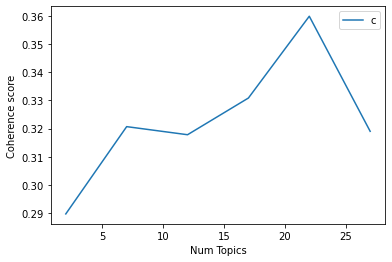

In [215]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us_score2)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [216]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us_score2):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 22

index: 0 | Num Topics = 2  has Coherence Value of 0.2898
index: 1 | Num Topics = 7  has Coherence Value of 0.3207
index: 2 | Num Topics = 12  has Coherence Value of 0.3178
index: 3 | Num Topics = 17  has Coherence Value of 0.3308
index: 4 | Num Topics = 22  has Coherence Value of 0.3598
index: 5 | Num Topics = 27  has Coherence Value of 0.3191


In [331]:
# Select optimal number of topics
optimal_model_us_score2 = model_list_us_score2[4]

In [332]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us_score2 = pyLDAvis.gensim_models.prepare(optimal_model_us_score2, corpus_us_score2, id2word_us_score2)

In [333]:
print("pyLDAVis for us topics for score=2:")
vis_us_score2

pyLDAVis for us topics for score=2:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.153520 -0.038876       1        1  12.299603
8      0.052784 -0.086326       2        1  11.044484
18     0.070733 -0.019418       3        1   9.211495
10     0.107913 -0.055157       4        1   7.692208
12     0.088103  0.108094       5        1   7.500789
7      0.117224 -0.050781       6        1   7.095021
11     0.116445  0.073493       7        1   6.433505
6      0.001805 -0.054978       8        1   6.293912
14     0.055133 -0.098814       9        1   5.923499
3      0.024175  0.133798      10        1   4.195107
16    -0.029734  0.186893      11        1   2.917575
15    -0.002304 -0.005759      12        1   2.888004
0      0.011890 -0.020412      13        1   2.652592
1      0.003377 -0.088945      14        1   2.523045
17     0.013226  0.030611      15        1   2.413401
20    -0.043367  0.060680      16        1   1.777032
2     -0.052186  0.007722      17        1   1.749957
9     -0.115974  0.031344      18        1   1.472971
21    -0.209891 -0.078069      19        1   1.469182
5     -0.089573 -0.035173      20        1   1.006887
13    -0.165246 -0.014991      21        1   0.944420
19    -0.108055  0.015061      22        1   0.495314, topic_info=      Term        Freq       Total Category  logprob  loglift
10   music   52.000000   52.000000  Default  30.0000  30.0000
35     let   40.000000   40.000000  Default  29.0000  29.0000
20   video  181.000000  181.000000  Default  28.0000  28.0000
80  update   45.000000   45.000000  Default  27.0000  27.0000
2      app  235.000000  235.000000  Default  26.0000  26.0000
..     ...         ...         ...      ...      ...      ...
12  people    0.018291   28.397415  Topic22  -7.1693  -2.0399
13    play    0.018291   23.584658  Topic22  -7.1693  -1.8542
14  search    0.018291   15.460652  Topic22  -7.1693  -1.4319
15    show    0.018291    8.502875  Topic22  -7.1693  -0.8340
17    soon    0.018291    9.478955  Topic22  -7.1693  -0.9427

[1207 rows x 6 columns], token_table=      Topic      Freq  Term
term                       
196       1  0.257317  able
196       3  0.064329  able
196       8  0.128658  able
196       9  0.064329  able
196      10  0.257317  able
...     ...       ...   ...
153       8  0.132137  year
153      18  0.132137  year
230       3  0.481077   yet
230       5  0.240538   yet
230      15  0.240538   yet

[1898 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 9, 19, 11, 13, 8, 12, 7, 15, 4, 17, 16, 1, 2, 18, 21, 3, 10, 22, 6, 14, 20])

## LDA Topic Modelling (Rating = 3)

In [220]:
# By-rating Topic Modelling - rating = 3
# Convert to list - move to each section
review_us_score3 = triller_ios_us_review_YearMonth_score3.review.values.tolist()
review_words_us_score3 = list(sent_to_words(review_us_score3))
print(review_words_us_score3[:1])

[['love', 'the', 'app', 'but', 'the', 'screen', 'is', 'off', 'for', 'the', 'iphone', 'the', 'top', 'is', 'cut', 'off', 'and', 'can', 'set', 'my', 'profile', 'picture']]


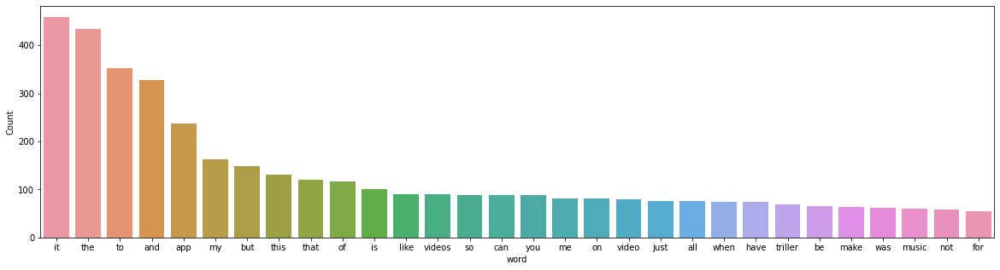

In [221]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us_score3))

In [222]:
# Clean text
review_us_ready_score3 = process_words(review_words_us_score3)  # processed Text Data! - move to each section


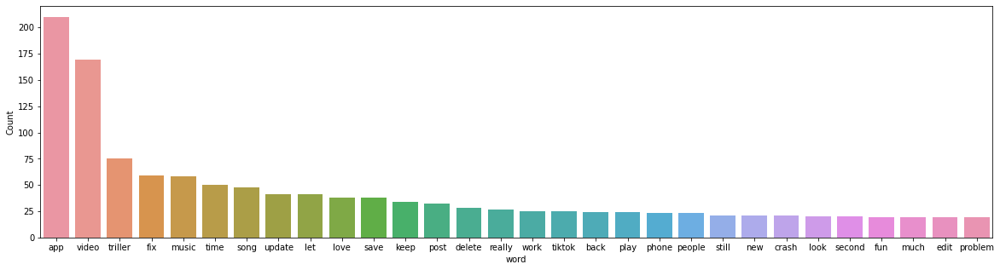

In [223]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_us_ready_score3))


In [224]:
# Create Dictionary
id2word_us_score3 = corpora.Dictionary(review_us_ready_score3)

2021-10-20 16:54:46,901 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-20 16:54:46,906 [INFO] gensim.corpora.dictionary - built Dictionary(798 unique tokens: ['app', 'cut', 'iphone', 'love', 'picture']...) from 269 documents (total 3516 corpus positions)
2021-10-20 16:54:46,908 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(798 unique tokens: ['app', 'cut', 'iphone', 'love', 'picture']...) from 269 documents (total 3516 corpus positions)", 'datetime': '2021-10-20T16:54:46.908378', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [225]:
# Create Corpus: Term Document Frequency
corpus_us_score3 = [id2word_us_score3.doc2bow(text) for text in review_us_ready_score3]

In [226]:
# Training LDA model
model_list_us_score3, coherence_values_us_score3 = compute_coherence_values(dictionary=id2word_us_score3, corpus=corpus_us_score3, 
                                                              texts=review_us_ready_score3, limit=30, start=2, step=5)


2021-10-20 16:54:46,923 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-20 16:54:46,924 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-20 16:54:46,926 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 16:54:46,927 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 269 documents, updating model once every 269 documents, evaluating perplexity every 269 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-20 16:54:47,140 [INFO] gensim.models.ldamodel - -7.276 per-word bound, 155.0 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:54:47,141 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #269/269
2021-10-20 16:54:47,322 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.030*"video" + 0.023*"app" + 0.019*"music" + 0.012*"song" + 0.012*"let" + 0.011*"triller" + 0.009*"time

2021-10-20 16:54:49,096 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.067*"app" + 0.045*"video" + 0.024*"triller" + 0.019*"fix" + 0.014*"update" + 0.014*"time" + 0.013*"save" + 0.011*"music" + 0.011*"keep" + 0.011*"love"
2021-10-20 16:54:49,096 [INFO] gensim.models.ldamodel - topic diff=0.011805, rho=0.301511
2021-10-20 16:54:49,208 [INFO] gensim.models.ldamodel - -6.070 per-word bound, 67.2 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:54:49,209 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #269/269
2021-10-20 16:54:49,299 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.028*"video" + 0.019*"music" + 0.016*"song" + 0.015*"let" + 0.013*"tiktok" + 0.011*"app" + 0.010*"find" + 0.009*"part" + 0.009*"follow" + 0.009*"account"
2021-10-20 16:54:49,300 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.068*"app" + 0.045*"video" + 0.024*"triller" + 0.019*"fix" + 0.014*"update" + 0.014*"time" + 0.013*"save" + 0.011*"musi

2021-10-20 16:54:51,120 [INFO] gensim.models.ldamodel - topic diff=0.004145, rho=0.218218
2021-10-20 16:54:51,223 [INFO] gensim.models.ldamodel - -6.066 per-word bound, 67.0 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:54:51,223 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #269/269
2021-10-20 16:54:51,293 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.028*"video" + 0.018*"music" + 0.016*"song" + 0.016*"let" + 0.013*"tiktok" + 0.010*"follow" + 0.010*"find" + 0.010*"part" + 0.009*"account" + 0.009*"app"
2021-10-20 16:54:51,295 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.069*"app" + 0.045*"video" + 0.024*"triller" + 0.019*"fix" + 0.014*"update" + 0.014*"time" + 0.013*"save" + 0.012*"love" + 0.011*"music" + 0.011*"keep"
2021-10-20 16:54:51,296 [INFO] gensim.models.ldamodel - topic diff=0.003967, rho=0.213201
2021-10-20 16:54:51,390 [INFO] gensim.models.ldamodel - -6.066 per-word bound, 67.0 perplexity estimate 

2021-10-20 16:54:52,901 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #269/269
2021-10-20 16:54:52,972 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.027*"video" + 0.018*"music" + 0.017*"let" + 0.016*"song" + 0.014*"tiktok" + 0.011*"follow" + 0.010*"find" + 0.010*"account" + 0.010*"part" + 0.009*"wish"
2021-10-20 16:54:52,973 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.070*"app" + 0.045*"video" + 0.024*"triller" + 0.019*"fix" + 0.014*"update" + 0.014*"time" + 0.013*"save" + 0.012*"love" + 0.012*"music" + 0.011*"keep"
2021-10-20 16:54:52,974 [INFO] gensim.models.ldamodel - topic diff=0.003149, rho=0.176777
2021-10-20 16:54:53,058 [INFO] gensim.models.ldamodel - -6.064 per-word bound, 66.9 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:54:53,059 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #269/269
2021-10-20 16:54:53,133 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.027*"video" + 0.018*"

2021-10-20 16:54:54,613 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.070*"app" + 0.046*"video" + 0.025*"triller" + 0.019*"fix" + 0.015*"update" + 0.014*"time" + 0.013*"save" + 0.012*"love" + 0.012*"music" + 0.011*"keep"
2021-10-20 16:54:54,613 [INFO] gensim.models.ldamodel - topic diff=0.002429, rho=0.154303
2021-10-20 16:54:54,700 [INFO] gensim.models.ldamodel - -6.062 per-word bound, 66.8 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:54:54,701 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #269/269
2021-10-20 16:54:54,765 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.027*"video" + 0.018*"music" + 0.017*"let" + 0.017*"song" + 0.014*"tiktok" + 0.012*"follow" + 0.010*"account" + 0.009*"part" + 0.009*"find" + 0.009*"email"
2021-10-20 16:54:54,766 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.070*"app" + 0.046*"video" + 0.025*"triller" + 0.019*"fix" + 0.015*"update" + 0.014*"time" + 0.013*"save" + 0.012*"lo

2021-10-20 16:54:57,867 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 253 virtual documents
2021-10-20 16:54:57,967 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.14285714285714285
2021-10-20 16:54:57,968 [INFO] gensim.models.ldamodel - using symmetric eta at 0.14285714285714285
2021-10-20 16:54:57,970 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 16:54:57,972 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 7 topics, 50 passes over the supplied corpus of 269 documents, updating model once every 269 documents, evaluating perplexity every 269 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-20 16:54:58,131 [INFO] gensim.models.ldamodel - -8.853 per-word bound, 462.3 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:54:58,132 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #269/269
2021-10-20 16:54

2021-10-20 16:54:59,010 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #269/269
2021-10-20 16:54:59,067 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.036*"video" + 0.029*"music" + 0.020*"song" + 0.017*"clip" + 0.016*"really" + 0.015*"feature" + 0.015*"part" + 0.014*"choose" + 0.014*"wish" + 0.014*"save"
2021-10-20 16:54:59,068 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.021*"second" + 0.021*"video" + 0.019*"app" + 0.017*"link" + 0.016*"change" + 0.014*"page" + 0.014*"email" + 0.014*"slow" + 0.013*"triller" + 0.011*"fix"
2021-10-20 16:54:59,069 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.048*"app" + 0.028*"video" + 0.025*"triller" + 0.015*"new" + 0.014*"tok" + 0.013*"back" + 0.013*"song" + 0.013*"old" + 0.012*"time" + 0.012*"tik"
2021-10-20 16:54:59,070 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.042*"app" + 0.040*"video" + 0.036*"music" + 0.019*"triller" + 0.016*"really" + 0.014*"fix" + 0.014*"let" + 0.013*"update" + 0.012*"filter" + 0.010*"

2021-10-20 16:54:59,831 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.042*"app" + 0.039*"video" + 0.037*"music" + 0.020*"triller" + 0.016*"really" + 0.015*"let" + 0.014*"update" + 0.014*"fix" + 0.013*"filter" + 0.012*"shuffle"
2021-10-20 16:54:59,832 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.057*"app" + 0.037*"video" + 0.021*"love" + 0.017*"long" + 0.014*"account" + 0.013*"edit" + 0.012*"log" + 0.011*"storage" + 0.009*"delete" + 0.009*"idk"
2021-10-20 16:54:59,832 [INFO] gensim.models.ldamodel - topic diff=0.019153, rho=0.288675
2021-10-20 16:54:59,922 [INFO] gensim.models.ldamodel - -6.323 per-word bound, 80.1 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:54:59,924 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #269/269
2021-10-20 16:54:59,989 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.024*"second" + 0.018*"video" + 0.017*"link" + 0.016*"slow" + 0.016*"change" + 0.015*"app" + 0.014*"page" + 0.014*

2021-10-20 16:55:00,714 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #269/269
2021-10-20 16:55:00,767 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.046*"app" + 0.025*"triller" + 0.024*"video" + 0.018*"new" + 0.017*"tok" + 0.014*"old" + 0.014*"tik" + 0.014*"back" + 0.012*"update" + 0.011*"love"
2021-10-20 16:55:00,768 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.037*"video" + 0.028*"music" + 0.027*"song" + 0.021*"part" + 0.019*"choose" + 0.016*"clip" + 0.016*"really" + 0.015*"feature" + 0.014*"wish" + 0.012*"app"
2021-10-20 16:55:00,769 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.052*"app" + 0.042*"song" + 0.030*"people" + 0.023*"follow" + 0.018*"let" + 0.017*"fix" + 0.016*"triller" + 0.015*"play" + 0.014*"music" + 0.014*"work"
2021-10-20 16:55:00,770 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.070*"app" + 0.068*"video" + 0.026*"triller" + 0.025*"fix" + 0.024*"save" + 0.022*"time" + 0.020*"post" + 0.016*"keep" + 0.015*"update" + 0.015*"dele

2021-10-20 16:55:01,478 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.025*"second" + 0.018*"link" + 0.018*"slow" + 0.016*"video" + 0.016*"change" + 0.014*"page" + 0.014*"email" + 0.014*"search" + 0.013*"app" + 0.012*"triller"
2021-10-20 16:55:01,478 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.053*"app" + 0.040*"song" + 0.030*"people" + 0.023*"follow" + 0.018*"let" + 0.018*"fix" + 0.016*"play" + 0.016*"triller" + 0.014*"music" + 0.014*"work"
2021-10-20 16:55:01,479 [INFO] gensim.models.ldamodel - topic diff=0.004606, rho=0.208514
2021-10-20 16:55:01,567 [INFO] gensim.models.ldamodel - -6.309 per-word bound, 79.3 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:01,568 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #269/269
2021-10-20 16:55:01,619 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.069*"app" + 0.069*"video" + 0.026*"triller" + 0.025*"fix" + 0.025*"save" + 0.022*"time" + 0.020*"post" + 0.016*"kee

2021-10-20 16:55:02,272 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #269/269
2021-10-20 16:55:02,325 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.058*"app" + 0.036*"video" + 0.021*"love" + 0.017*"long" + 0.014*"account" + 0.013*"edit" + 0.012*"log" + 0.012*"storage" + 0.010*"delete" + 0.010*"problem"
2021-10-20 16:55:02,326 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.038*"video" + 0.030*"song" + 0.029*"music" + 0.024*"part" + 0.020*"choose" + 0.016*"clip" + 0.016*"really" + 0.016*"feature" + 0.014*"wish" + 0.012*"app"
2021-10-20 16:55:02,327 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.042*"app" + 0.037*"music" + 0.036*"video" + 0.020*"triller" + 0.016*"really" + 0.016*"let" + 0.015*"update" + 0.013*"filter" + 0.013*"fix" + 0.012*"shuffle"
2021-10-20 16:55:02,327 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.069*"app" + 0.069*"video" + 0.026*"triller" + 0.025*"save" + 0.025*"fix" + 0.022*"time" + 0.020*"post" + 0.016*"keep" + 0.015*"update

2021-10-20 16:55:03,072 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.038*"video" + 0.031*"song" + 0.029*"music" + 0.025*"part" + 0.021*"choose" + 0.016*"clip" + 0.016*"really" + 0.016*"feature" + 0.014*"wish" + 0.012*"app"
2021-10-20 16:55:03,073 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.069*"video" + 0.069*"app" + 0.026*"triller" + 0.025*"save" + 0.025*"fix" + 0.022*"time" + 0.020*"post" + 0.016*"keep" + 0.015*"update" + 0.014*"delete"
2021-10-20 16:55:03,073 [INFO] gensim.models.ldamodel - topic diff=0.001602, rho=0.171499
2021-10-20 16:55:03,159 [INFO] gensim.models.ldamodel - -6.305 per-word bound, 79.1 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:03,160 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #269/269
2021-10-20 16:55:03,214 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.025*"second" + 0.018*"link" + 0.018*"slow" + 0.016*"video" + 0.016*"change" + 0.014*"page" + 0.014*"email" + 0.014*"

2021-10-20 16:55:03,866 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #269/269
2021-10-20 16:55:03,918 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.058*"app" + 0.036*"video" + 0.021*"love" + 0.017*"long" + 0.014*"account" + 0.012*"edit" + 0.012*"log" + 0.012*"storage" + 0.010*"delete" + 0.010*"problem"
2021-10-20 16:55:03,918 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.069*"video" + 0.069*"app" + 0.026*"triller" + 0.025*"save" + 0.025*"fix" + 0.022*"time" + 0.020*"post" + 0.016*"keep" + 0.015*"update" + 0.014*"delete"
2021-10-20 16:55:03,919 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.025*"second" + 0.018*"slow" + 0.018*"link" + 0.016*"video" + 0.016*"change" + 0.014*"page" + 0.014*"email" + 0.014*"search" + 0.013*"app" + 0.012*"triller"
2021-10-20 16:55:03,920 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.038*"video" + 0.031*"song" + 0.029*"music" + 0.026*"part" + 0.021*"choose" + 0.016*"really" + 0.016*"clip" + 0.016*"feature" + 0.014*"wi

2021-10-20 16:55:04,618 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.025*"second" + 0.018*"slow" + 0.018*"link" + 0.016*"video" + 0.016*"change" + 0.014*"page" + 0.014*"email" + 0.014*"search" + 0.013*"app" + 0.012*"triller"
2021-10-20 16:55:04,618 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.043*"app" + 0.025*"triller" + 0.022*"video" + 0.019*"new" + 0.017*"tok" + 0.015*"tik" + 0.015*"old" + 0.014*"back" + 0.012*"update" + 0.012*"love"
2021-10-20 16:55:04,619 [INFO] gensim.models.ldamodel - topic diff=0.000612, rho=0.149071
2021-10-20 16:55:04,701 [INFO] gensim.models.ldamodel - -6.304 per-word bound, 79.0 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:04,702 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #269/269
2021-10-20 16:55:04,754 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.025*"second" + 0.018*"slow" + 0.018*"link" + 0.016*"video" + 0.016*"change" + 0.014*"page" + 0.014*"email" + 0.014*"sea

2021-10-20 16:55:05,444 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.058*"app" + 0.036*"video" + 0.021*"love" + 0.017*"long" + 0.014*"account" + 0.012*"edit" + 0.012*"log" + 0.012*"storage" + 0.010*"delete" + 0.010*"problem"
2021-10-20 16:55:05,445 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.042*"app" + 0.037*"music" + 0.036*"video" + 0.020*"triller" + 0.016*"really" + 0.016*"let" + 0.015*"update" + 0.013*"filter" + 0.013*"fix" + 0.012*"shuffle"
2021-10-20 16:55:05,446 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.056*"app" + 0.039*"song" + 0.029*"people" + 0.023*"follow" + 0.018*"fix" + 0.017*"play" + 0.017*"let" + 0.016*"triller" + 0.014*"work" + 0.014*"music"
2021-10-20 16:55:05,447 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.069*"video" + 0.069*"app" + 0.026*"triller" + 0.025*"save" + 0.025*"fix" + 0.022*"time" + 0.020*"post" + 0.016*"keep" + 0.014*"update" + 0.014*"delete"
2021-10-20 16:55:05,448 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.025*

2021-10-20 16:55:08,118 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.079*"app" + 0.051*"video" + 0.037*"fix" + 0.026*"triller" + 0.018*"update" + 0.017*"glitch" + 0.014*"work" + 0.014*"time" + 0.013*"camera" + 0.012*"love"
2021-10-20 16:55:08,118 [INFO] gensim.models.ldamodel - topic diff=0.124028, rho=0.447214
2021-10-20 16:55:08,216 [INFO] gensim.models.ldamodel - -6.540 per-word bound, 93.1 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:08,217 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #269/269
2021-10-20 16:55:08,276 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.052*"video" + 0.048*"app" + 0.031*"triller" + 0.022*"keep" + 0.017*"effect" + 0.016*"reason" + 0.016*"love" + 0.016*"freeze" + 0.016*"download" + 0.014*"fix"
2021-10-20 16:55:08,277 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.032*"app" + 0.026*"music" + 0.021*"new" + 0.019*"song" + 0.018*"back" + 0.018*"update" + 0.017*"filter" + 0.01

2021-10-20 16:55:09,099 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.056*"app" + 0.038*"video" + 0.036*"time" + 0.024*"follow" + 0.019*"play" + 0.019*"let" + 0.018*"long" + 0.017*"people" + 0.016*"delete" + 0.015*"happen"
2021-10-20 16:55:09,100 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.084*"app" + 0.042*"video" + 0.028*"song" + 0.022*"tok" + 0.020*"really" + 0.019*"tik" + 0.019*"let" + 0.018*"keep" + 0.018*"music" + 0.015*"save"
2021-10-20 16:55:09,101 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.047*"video" + 0.047*"music" + 0.031*"wish" + 0.026*"clip" + 0.022*"option" + 0.021*"second" + 0.018*"save" + 0.018*"let" + 0.018*"shuffle" + 0.013*"time"
2021-10-20 16:55:09,102 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.056*"app" + 0.033*"music" + 0.033*"video" + 0.024*"song" + 0.021*"feature" + 0.017*"triller" + 0.016*"fix" + 0.012*"apple" + 0.012*"love" + 0.010*"keep"
2021-10-20 16:55:09,102 [INFO] gensim.models.ldamodel - topic diff=0.028012, rho=0.301511

2021-10-20 16:55:10,168 [INFO] gensim.models.ldamodel - topic diff=0.009585, rho=0.250000
2021-10-20 16:55:10,267 [INFO] gensim.models.ldamodel - -6.473 per-word bound, 88.9 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:10,268 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #269/269
2021-10-20 16:55:10,338 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.049*"triller" + 0.032*"video" + 0.030*"app" + 0.020*"time" + 0.017*"save" + 0.016*"tiktok" + 0.016*"find" + 0.014*"fix" + 0.011*"second" + 0.011*"update"
2021-10-20 16:55:10,339 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.028*"new" + 0.026*"filter" + 0.025*"music" + 0.024*"app" + 0.020*"song" + 0.020*"back" + 0.019*"update" + 0.016*"old" + 0.016*"able" + 0.016*"allow"
2021-10-20 16:55:10,340 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.057*"app" + 0.033*"music" + 0.033*"video" + 0.024*"song" + 0.021*"feature" + 0.017*"triller" + 0.016*"fix" + 0.013*"ap

2021-10-20 16:55:11,308 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.057*"app" + 0.033*"music" + 0.033*"video" + 0.024*"song" + 0.021*"feature" + 0.017*"triller" + 0.016*"fix" + 0.012*"apple" + 0.012*"love" + 0.009*"keep"
2021-10-20 16:55:11,309 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.048*"video" + 0.047*"music" + 0.031*"wish" + 0.027*"clip" + 0.022*"option" + 0.022*"second" + 0.018*"let" + 0.018*"shuffle" + 0.015*"save" + 0.014*"time"
2021-10-20 16:55:11,310 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.056*"app" + 0.039*"video" + 0.037*"time" + 0.024*"follow" + 0.019*"long" + 0.019*"play" + 0.019*"let" + 0.017*"delete" + 0.016*"people" + 0.016*"happen"
2021-10-20 16:55:11,311 [INFO] gensim.models.ldamodel - topic diff=0.003776, rho=0.213201
2021-10-20 16:55:11,465 [INFO] gensim.models.ldamodel - -6.469 per-word bound, 88.6 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:11,466 [INFO] gensim.models.ldamodel - P

2021-10-20 16:55:12,169 [INFO] gensim.models.ldamodel - -6.467 per-word bound, 88.5 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:12,170 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #269/269
2021-10-20 16:55:12,236 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.068*"video" + 0.028*"app" + 0.027*"post" + 0.020*"save" + 0.019*"phone" + 0.016*"edit" + 0.015*"back" + 0.013*"music" + 0.013*"shuffle" + 0.013*"update"
2021-10-20 16:55:12,237 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.036*"song" + 0.035*"triller" + 0.018*"video" + 0.014*"app" + 0.014*"update" + 0.014*"problem" + 0.014*"roll" + 0.014*"camera" + 0.014*"tell" + 0.012*"start"
2021-10-20 16:55:12,237 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.079*"app" + 0.052*"video" + 0.042*"fix" + 0.023*"triller" + 0.017*"camera" + 0.017*"glitch" + 0.017*"update" + 0.015*"love" + 0.014*"upload" + 0.014*"time"
2021-10-20 16:55:12,238 [INFO] gensim.models.l

2021-10-20 16:55:13,018 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.068*"video" + 0.028*"app" + 0.027*"post" + 0.020*"save" + 0.019*"phone" + 0.016*"edit" + 0.015*"back" + 0.013*"music" + 0.013*"shuffle" + 0.013*"update"
2021-10-20 16:55:13,019 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.057*"app" + 0.033*"video" + 0.033*"music" + 0.024*"song" + 0.021*"feature" + 0.018*"triller" + 0.015*"fix" + 0.013*"love" + 0.012*"apple" + 0.010*"let"
2021-10-20 16:55:13,020 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.057*"app" + 0.038*"video" + 0.037*"time" + 0.025*"follow" + 0.021*"long" + 0.019*"play" + 0.019*"let" + 0.017*"delete" + 0.016*"people" + 0.016*"happen"
2021-10-20 16:55:13,020 [INFO] gensim.models.ldamodel - topic diff=0.001135, rho=0.174078
2021-10-20 16:55:13,110 [INFO] gensim.models.ldamodel - -6.466 per-word bound, 88.4 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:13,110 [INFO] gensim.models.ldamodel - PRO

2021-10-20 16:55:13,809 [INFO] gensim.models.ldamodel - topic diff=0.000764, rho=0.162221
2021-10-20 16:55:13,897 [INFO] gensim.models.ldamodel - -6.465 per-word bound, 88.3 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:13,898 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #269/269
2021-10-20 16:55:13,950 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.079*"app" + 0.053*"video" + 0.042*"fix" + 0.023*"triller" + 0.018*"camera" + 0.017*"glitch" + 0.017*"update" + 0.015*"love" + 0.014*"upload" + 0.014*"time"
2021-10-20 16:55:13,951 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.034*"app" + 0.026*"video" + 0.023*"account" + 0.020*"tiktok" + 0.017*"email" + 0.017*"page" + 0.017*"slow" + 0.017*"really" + 0.014*"pretty" + 0.014*"love"
2021-10-20 16:55:13,952 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.086*"app" + 0.042*"video" + 0.029*"song" + 0.022*"tok" + 0.020*"really" + 0.019*"tik" + 0.019*"keep" + 0.019*"

2021-10-20 16:55:14,692 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.057*"app" + 0.033*"video" + 0.033*"music" + 0.024*"song" + 0.021*"feature" + 0.018*"triller" + 0.015*"fix" + 0.013*"love" + 0.012*"apple" + 0.010*"let"
2021-10-20 16:55:14,693 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.086*"app" + 0.042*"video" + 0.029*"song" + 0.022*"tok" + 0.020*"really" + 0.019*"tik" + 0.019*"keep" + 0.019*"let" + 0.018*"music" + 0.015*"save"
2021-10-20 16:55:14,694 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.057*"app" + 0.038*"video" + 0.037*"time" + 0.025*"follow" + 0.021*"long" + 0.019*"play" + 0.018*"let" + 0.016*"delete" + 0.016*"people" + 0.016*"happen"
2021-10-20 16:55:14,694 [INFO] gensim.models.ldamodel - topic diff=0.000450, rho=0.150756
2021-10-20 16:55:14,784 [INFO] gensim.models.ldamodel - -6.465 per-word bound, 88.3 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:14,785 [INFO] gensim.models.ldamodel - PROGRESS: 

2021-10-20 16:55:15,420 [INFO] gensim.models.ldamodel - topic diff=0.000324, rho=0.142857
2021-10-20 16:55:15,510 [INFO] gensim.models.ldamodel - -6.464 per-word bound, 88.3 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:15,511 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #269/269
2021-10-20 16:55:15,559 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.057*"app" + 0.033*"video" + 0.033*"music" + 0.024*"song" + 0.021*"feature" + 0.018*"triller" + 0.015*"fix" + 0.013*"love" + 0.012*"apple" + 0.010*"let"
2021-10-20 16:55:15,560 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.034*"link" + 0.020*"app" + 0.020*"search" + 0.020*"find" + 0.015*"song" + 0.014*"keep" + 0.014*"change" + 0.014*"annoying" + 0.014*"fix" + 0.014*"tab"
2021-10-20 16:55:15,560 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.079*"app" + 0.053*"video" + 0.042*"fix" + 0.023*"triller" + 0.018*"camera" + 0.017*"glitch" + 0.017*"update" + 0.015*"

2021-10-20 16:55:18,854 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.061*"video" + 0.047*"app" + 0.027*"fix" + 0.016*"feature" + 0.016*"people" + 0.016*"update" + 0.014*"let" + 0.014*"guy" + 0.014*"follow" + 0.014*"time"
2021-10-20 16:55:18,855 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.055*"app" + 0.041*"song" + 0.037*"video" + 0.034*"time" + 0.029*"part" + 0.025*"really" + 0.022*"post" + 0.021*"choose" + 0.016*"pick" + 0.016*"delete"
2021-10-20 16:55:18,856 [INFO] gensim.models.ldamodel - topic diff=0.180108, rho=0.500000
2021-10-20 16:55:18,958 [INFO] gensim.models.ldamodel - -6.741 per-word bound, 107.0 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:18,959 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #269/269
2021-10-20 16:55:19,026 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.031*"link" + 0.029*"change" + 0.026*"slow" + 0.026*"video" + 0.024*"email" + 0.020*"search" + 0.019*"let" + 0.019*"f

2021-10-20 16:55:19,825 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #269/269
2021-10-20 16:55:19,891 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.055*"app" + 0.028*"video" + 0.026*"play" + 0.026*"song" + 0.019*"time" + 0.019*"page" + 0.015*"second" + 0.015*"delete" + 0.015*"happen" + 0.015*"quality"
2021-10-20 16:55:19,894 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.064*"video" + 0.054*"app" + 0.040*"save" + 0.033*"triller" + 0.027*"fix" + 0.022*"camera" + 0.018*"update" + 0.017*"upload" + 0.016*"glitch" + 0.016*"love"
2021-10-20 16:55:19,895 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.045*"app" + 0.033*"video" + 0.026*"problem" + 0.026*"music" + 0.022*"new" + 0.017*"love" + 0.016*"update" + 0.016*"idk" + 0.016*"storage" + 0.015*"tik"
2021-10-20 16:55:19,896 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.066*"song" + 0.045*"app" + 0.044*"triller" + 0.031*"video" + 0.026*"delete" + 0.021*"find" + 0.018*"people" + 0.011*"still" + 0.011*"grea

2021-10-20 16:55:20,862 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.053*"music" + 0.033*"filter" + 0.024*"keep" + 0.024*"video" + 0.023*"update" + 0.023*"old" + 0.018*"app" + 0.018*"account" + 0.018*"tab" + 0.018*"back"
2021-10-20 16:55:20,863 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.089*"app" + 0.031*"video" + 0.025*"love" + 0.025*"crash" + 0.021*"triller" + 0.017*"update" + 0.017*"thing" + 0.017*"still" + 0.017*"much" + 0.014*"time"
2021-10-20 16:55:20,865 [INFO] gensim.models.ldamodel - topic diff=0.014502, rho=0.258199
2021-10-20 16:55:20,963 [INFO] gensim.models.ldamodel - -6.613 per-word bound, 97.9 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:20,964 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #269/269
2021-10-20 16:55:21,019 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.053*"music" + 0.033*"filter" + 0.024*"keep" + 0.024*"video" + 0.023*"update" + 0.023*"old" + 0.018*"app" + 0.018*"a

2021-10-20 16:55:21,754 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #269/269
2021-10-20 16:55:21,805 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.056*"app" + 0.054*"song" + 0.036*"video" + 0.033*"part" + 0.030*"time" + 0.030*"really" + 0.027*"choose" + 0.024*"post" + 0.018*"let" + 0.017*"pick"
2021-10-20 16:55:21,806 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.091*"app" + 0.031*"video" + 0.025*"love" + 0.025*"crash" + 0.021*"triller" + 0.017*"update" + 0.016*"thing" + 0.016*"still" + 0.016*"much" + 0.014*"time"
2021-10-20 16:55:21,807 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.040*"wish" + 0.033*"feature" + 0.031*"video" + 0.026*"option" + 0.026*"bad" + 0.020*"upgrade" + 0.019*"new" + 0.013*"crash" + 0.013*"freeze" + 0.013*"well"
2021-10-20 16:55:21,808 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.045*"app" + 0.034*"video" + 0.025*"problem" + 0.025*"music" + 0.025*"new" + 0.017*"love" + 0.016*"update" + 0.015*"idk" + 0.015*"storage" +

2021-10-20 16:55:22,582 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.065*"video" + 0.044*"app" + 0.025*"fix" + 0.019*"feature" + 0.018*"people" + 0.017*"follow" + 0.017*"let" + 0.016*"time" + 0.016*"edit" + 0.014*"update"
2021-10-20 16:55:22,583 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.055*"app" + 0.028*"video" + 0.027*"song" + 0.027*"play" + 0.020*"time" + 0.019*"page" + 0.015*"second" + 0.015*"delete" + 0.015*"happen" + 0.015*"quality"
2021-10-20 16:55:22,584 [INFO] gensim.models.ldamodel - topic diff=0.003350, rho=0.196116
2021-10-20 16:55:22,686 [INFO] gensim.models.ldamodel - -6.602 per-word bound, 97.1 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:22,686 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #269/269
2021-10-20 16:55:22,749 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.065*"video" + 0.044*"app" + 0.025*"fix" + 0.019*"feature" + 0.018*"people" + 0.017*"follow" + 0.017*"let" + 0.0

2021-10-20 16:55:23,519 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #269/269
2021-10-20 16:55:23,612 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.067*"song" + 0.044*"app" + 0.044*"triller" + 0.032*"video" + 0.026*"delete" + 0.022*"find" + 0.017*"people" + 0.011*"still" + 0.011*"much" + 0.011*"able"
2021-10-20 16:55:23,613 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.094*"app" + 0.032*"video" + 0.028*"love" + 0.024*"crash" + 0.023*"triller" + 0.018*"update" + 0.016*"thing" + 0.016*"still" + 0.016*"much" + 0.014*"time"
2021-10-20 16:55:23,614 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.050*"triller" + 0.035*"video" + 0.030*"app" + 0.024*"freeze" + 0.020*"effect" + 0.017*"tiktok" + 0.013*"time" + 0.013*"slow" + 0.012*"fix" + 0.012*"often"
2021-10-20 16:55:23,614 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.067*"app" + 0.035*"music" + 0.034*"video" + 0.028*"phone" + 0.020*"people" + 0.018*"play" + 0.018*"triller" + 0.016*"record" + 0.016*"s

2021-10-20 16:55:24,512 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.066*"video" + 0.055*"app" + 0.041*"save" + 0.032*"triller" + 0.029*"fix" + 0.021*"camera" + 0.019*"update" + 0.017*"upload" + 0.017*"glitch" + 0.016*"post"
2021-10-20 16:55:24,513 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.068*"song" + 0.044*"app" + 0.044*"triller" + 0.032*"video" + 0.026*"delete" + 0.022*"find" + 0.017*"people" + 0.012*"much" + 0.011*"still" + 0.011*"save"
2021-10-20 16:55:24,514 [INFO] gensim.models.ldamodel - topic diff=0.001508, rho=0.164399
2021-10-20 16:55:24,608 [INFO] gensim.models.ldamodel - -6.597 per-word bound, 96.8 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:24,608 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #269/269
2021-10-20 16:55:24,673 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.069*"song" + 0.044*"app" + 0.044*"triller" + 0.032*"video" + 0.026*"delete" + 0.022*"find" + 0.017*"people" + 0.

2021-10-20 16:55:25,558 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #269/269
2021-10-20 16:55:25,614 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.066*"app" + 0.035*"music" + 0.035*"video" + 0.028*"phone" + 0.020*"people" + 0.019*"play" + 0.017*"triller" + 0.016*"record" + 0.016*"stop" + 0.013*"load"
2021-10-20 16:55:25,615 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.095*"app" + 0.032*"video" + 0.029*"love" + 0.024*"crash" + 0.024*"triller" + 0.019*"update" + 0.016*"thing" + 0.016*"still" + 0.016*"much" + 0.014*"time"
2021-10-20 16:55:25,616 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.040*"wish" + 0.033*"feature" + 0.031*"video" + 0.026*"option" + 0.026*"bad" + 0.020*"upgrade" + 0.019*"new" + 0.013*"crash" + 0.013*"freeze" + 0.013*"cut"
2021-10-20 16:55:25,617 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.037*"video" + 0.026*"app" + 0.019*"work" + 0.019*"screen" + 0.019*"back" + 0.013*"fix" + 0.013*"look" + 0.013*"song" + 0.013*"tiktok"

2021-10-20 16:55:26,349 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.066*"video" + 0.056*"app" + 0.041*"save" + 0.032*"triller" + 0.029*"fix" + 0.021*"camera" + 0.018*"update" + 0.017*"upload" + 0.017*"glitch" + 0.016*"post"
2021-10-20 16:55:26,351 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.066*"app" + 0.036*"music" + 0.035*"video" + 0.028*"phone" + 0.020*"people" + 0.019*"play" + 0.017*"triller" + 0.016*"record" + 0.016*"stop" + 0.013*"load"
2021-10-20 16:55:26,352 [INFO] gensim.models.ldamodel - topic diff=0.000826, rho=0.144338
2021-10-20 16:55:26,467 [INFO] gensim.models.ldamodel - -6.594 per-word bound, 96.6 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:26,467 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #269/269
2021-10-20 16:55:26,537 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.039*"let" + 0.034*"follow" + 0.032*"clip" + 0.031*"video" + 0.027*"second" + 0.027*"time" + 0.022*"people" + 0

2021-10-20 16:55:30,684 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.084*"app" + 0.036*"video" + 0.018*"load" + 0.017*"music" + 0.016*"crash" + 0.014*"people" + 0.014*"tiktok" + 0.014*"update" + 0.013*"save" + 0.013*"keep"
2021-10-20 16:55:30,687 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.075*"app" + 0.029*"play" + 0.019*"video" + 0.018*"time" + 0.017*"phone" + 0.015*"song" + 0.015*"music" + 0.014*"delete" + 0.014*"happen" + 0.014*"email"
2021-10-20 16:55:30,688 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.041*"video" + 0.039*"app" + 0.026*"pretty" + 0.022*"idk" + 0.022*"often" + 0.022*"problem" + 0.019*"time" + 0.017*"slow" + 0.016*"second" + 0.015*"long"
2021-10-20 16:55:30,691 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.039*"video" + 0.038*"app" + 0.037*"music" + 0.027*"triller" + 0.020*"fun" + 0.019*"love" + 0.017*"phone" + 0.017*"still" + 0.017*"reason" + 0.015*"stop"
2021-10-20 16:55:30,695 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.040

2021-10-20 16:55:31,577 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.042*"tiktok" + 0.034*"video" + 0.025*"wish" + 0.025*"tell" + 0.025*"app" + 0.017*"triller" + 0.017*"work" + 0.017*"slow" + 0.012*"time" + 0.010*"post"
2021-10-20 16:55:31,578 [INFO] gensim.models.ldamodel - topic diff=0.063789, rho=0.353553
2021-10-20 16:55:31,664 [INFO] gensim.models.ldamodel - -6.744 per-word bound, 107.2 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:31,665 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #269/269
2021-10-20 16:55:31,714 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.052*"app" + 0.030*"time" + 0.030*"music" + 0.029*"fix" + 0.026*"video" + 0.022*"triller" + 0.016*"bug" + 0.016*"long" + 0.016*"first" + 0.014*"record"
2021-10-20 16:55:31,715 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.041*"app" + 0.040*"triller" + 0.037*"video" + 0.026*"find" + 0.022*"freeze" + 0.019*"let" + 0.018*"look" + 0.018*"upda

2021-10-20 16:55:32,402 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.066*"app" + 0.039*"video" + 0.031*"music" + 0.026*"look" + 0.022*"save" + 0.020*"triller" + 0.019*"fix" + 0.019*"tok" + 0.018*"really" + 0.015*"delete"
2021-10-20 16:55:32,403 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.064*"video" + 0.040*"app" + 0.026*"effect" + 0.020*"triller" + 0.016*"update" + 0.013*"phone" + 0.013*"never" + 0.013*"ever" + 0.013*"whiten" + 0.013*"happen"
2021-10-20 16:55:32,405 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.039*"video" + 0.038*"app" + 0.038*"music" + 0.030*"triller" + 0.021*"fun" + 0.021*"lag" + 0.017*"love" + 0.017*"phone" + 0.017*"cut" + 0.016*"stop"
2021-10-20 16:55:32,406 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.108*"app" + 0.044*"tok" + 0.040*"tik" + 0.035*"update" + 0.030*"work" + 0.022*"keep" + 0.018*"video" + 0.017*"phone" + 0.017*"song" + 0.017*"great"
2021-10-20 16:55:32,406 [INFO] gensim.models.ldamodel - topic diff=0.018929, rho=0.267

2021-10-20 16:55:33,117 [INFO] gensim.models.ldamodel - topic diff=0.008998, rho=0.229416
2021-10-20 16:55:33,205 [INFO] gensim.models.ldamodel - -6.690 per-word bound, 103.3 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:33,206 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #269/269
2021-10-20 16:55:33,262 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.048*"video" + 0.040*"song" + 0.037*"post" + 0.037*"app" + 0.033*"time" + 0.029*"long" + 0.025*"part" + 0.017*"allow" + 0.016*"really" + 0.016*"give"
2021-10-20 16:55:33,263 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.044*"app" + 0.026*"still" + 0.026*"really" + 0.022*"let" + 0.020*"fix" + 0.020*"clip" + 0.020*"keep" + 0.017*"video" + 0.014*"triller" + 0.014*"bug"
2021-10-20 16:55:33,264 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.077*"app" + 0.032*"play" + 0.020*"video" + 0.020*"time" + 0.020*"phone" + 0.016*"song" + 0.016*"delete" + 0.016*"happen"

2021-10-20 16:55:34,110 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.041*"app" + 0.039*"triller" + 0.033*"video" + 0.028*"find" + 0.019*"freeze" + 0.019*"look" + 0.019*"update" + 0.014*"sign" + 0.014*"lose" + 0.014*"length"
2021-10-20 16:55:34,112 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.059*"video" + 0.037*"app" + 0.026*"effect" + 0.020*"triller" + 0.015*"update" + 0.014*"phone" + 0.014*"never" + 0.014*"ever" + 0.014*"whiten" + 0.014*"happen"
2021-10-20 16:55:34,113 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.054*"triller" + 0.042*"video" + 0.032*"let" + 0.032*"app" + 0.027*"second" + 0.021*"effect" + 0.020*"storage" + 0.020*"alot" + 0.020*"download" + 0.016*"much"
2021-10-20 16:55:34,113 [INFO] gensim.models.ldamodel - topic diff=0.004353, rho=0.200000
2021-10-20 16:55:34,200 [INFO] gensim.models.ldamodel - -6.684 per-word bound, 102.8 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:34,201 [INFO] gensim.mode

2021-10-20 16:55:35,014 [INFO] gensim.models.ldamodel - -6.683 per-word bound, 102.7 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:35,015 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #269/269
2021-10-20 16:55:35,076 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.037*"wish" + 0.030*"video" + 0.022*"crash" + 0.022*"feature" + 0.022*"fix" + 0.022*"freeze" + 0.015*"find" + 0.015*"part" + 0.015*"well" + 0.015*"option"
2021-10-20 16:55:35,077 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.053*"app" + 0.034*"triller" + 0.024*"thing" + 0.024*"feature" + 0.019*"song" + 0.018*"video" + 0.018*"move" + 0.018*"love" + 0.012*"pretty" + 0.012*"ask"
2021-10-20 16:55:35,078 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.044*"tiktok" + 0.035*"video" + 0.027*"wish" + 0.027*"tell" + 0.027*"slow" + 0.020*"triller" + 0.018*"work" + 0.015*"time" + 0.015*"fast" + 0.011*"app"
2021-10-20 16:55:35,079 [INFO] gensim.models.ldamo

2021-10-20 16:55:35,798 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.055*"triller" + 0.042*"video" + 0.033*"let" + 0.032*"app" + 0.027*"second" + 0.021*"effect" + 0.021*"storage" + 0.021*"alot" + 0.020*"download" + 0.014*"slow"
2021-10-20 16:55:35,799 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.077*"app" + 0.033*"play" + 0.021*"phone" + 0.020*"time" + 0.020*"video" + 0.016*"song" + 0.016*"delete" + 0.016*"happen" + 0.016*"love" + 0.016*"help"
2021-10-20 16:55:35,800 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.059*"video" + 0.036*"app" + 0.027*"effect" + 0.020*"triller" + 0.015*"update" + 0.014*"phone" + 0.014*"never" + 0.014*"ever" + 0.014*"whiten" + 0.014*"happen"
2021-10-20 16:55:35,800 [INFO] gensim.models.ldamodel - topic diff=0.003157, rho=0.166667
2021-10-20 16:55:35,876 [INFO] gensim.models.ldamodel - -6.680 per-word bound, 102.5 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:35,877 [INFO] gensim.models.

2021-10-20 16:55:36,475 [INFO] gensim.models.ldamodel - topic diff=0.002339, rho=0.156174
2021-10-20 16:55:36,563 [INFO] gensim.models.ldamodel - -6.674 per-word bound, 102.1 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:36,564 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #269/269
2021-10-20 16:55:36,612 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.048*"song" + 0.031*"music" + 0.027*"fix" + 0.027*"link" + 0.025*"video" + 0.022*"app" + 0.021*"keep" + 0.016*"second" + 0.016*"part" + 0.016*"let"
2021-10-20 16:55:36,613 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.109*"app" + 0.046*"tok" + 0.042*"tik" + 0.034*"update" + 0.030*"work" + 0.021*"keep" + 0.018*"much" + 0.017*"phone" + 0.017*"song" + 0.017*"video"
2021-10-20 16:55:36,614 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.044*"time" + 0.032*"video" + 0.029*"app" + 0.028*"page" + 0.022*"music" + 0.017*"length" + 0.017*"reload" + 0.017*"clip" + 0.0

2021-10-20 16:55:37,297 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.036*"triller" + 0.033*"app" + 0.031*"video" + 0.031*"find" + 0.020*"look" + 0.020*"update" + 0.015*"lose" + 0.015*"length" + 0.015*"different" + 0.015*"sign"
2021-10-20 16:55:37,298 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.058*"video" + 0.035*"app" + 0.027*"effect" + 0.020*"triller" + 0.015*"update" + 0.014*"phone" + 0.014*"never" + 0.014*"star" + 0.014*"give" + 0.014*"old"
2021-10-20 16:55:37,299 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.044*"time" + 0.031*"video" + 0.029*"app" + 0.028*"page" + 0.024*"music" + 0.017*"length" + 0.017*"reload" + 0.017*"clip" + 0.017*"single" + 0.017*"let"
2021-10-20 16:55:37,299 [INFO] gensim.models.ldamodel - topic diff=0.001808, rho=0.145865
2021-10-20 16:55:37,379 [INFO] gensim.models.ldamodel - -6.669 per-word bound, 101.8 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:37,380 [INFO] gensim.models.ldamode

2021-10-20 16:55:40,362 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #269/269
2021-10-20 16:55:40,473 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.035*"idk" + 0.035*"app" + 0.035*"video" + 0.024*"space" + 0.012*"end" + 0.012*"tok" + 0.012*"switch" + 0.012*"gig" + 0.012*"edit" + 0.012*"maybe"
2021-10-20 16:55:40,473 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.040*"tiktok" + 0.034*"app" + 0.023*"video" + 0.019*"slow" + 0.018*"fix" + 0.016*"second" + 0.016*"song" + 0.016*"download" + 0.016*"let" + 0.013*"triller"
2021-10-20 16:55:40,474 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.059*"app" + 0.052*"video" + 0.027*"time" + 0.024*"triller" + 0.022*"fix" + 0.021*"glitch" + 0.019*"keep" + 0.018*"problem" + 0.018*"play" + 0.017*"camera"
2021-10-20 16:55:40,475 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.067*"video" + 0.054*"app" + 0.034*"save" + 0.033*"post" + 0.026*"let" + 0.021*"time" + 0.017*"music" + 0.016*"still" + 0.015*"triller" + 0.014*"

2021-10-20 16:55:41,159 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.059*"app" + 0.051*"feature" + 0.037*"video" + 0.022*"look" + 0.022*"bad" + 0.022*"quality" + 0.022*"way" + 0.021*"thing" + 0.015*"triller" + 0.015*"like"
2021-10-20 16:55:41,159 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.048*"app" + 0.047*"fix" + 0.039*"triller" + 0.038*"video" + 0.025*"post" + 0.019*"look" + 0.018*"first" + 0.018*"start" + 0.018*"day" + 0.018*"really"
2021-10-20 16:55:41,160 [INFO] gensim.models.ldamodel - topic diff=0.089167, rho=0.377964
2021-10-20 16:55:41,240 [INFO] gensim.models.ldamodel - -6.798 per-word bound, 111.3 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:41,240 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #269/269
2021-10-20 16:55:41,290 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.073*"video" + 0.056*"crash" + 0.050*"save" + 0.034*"app" + 0.034*"post" + 0.031*"keep" + 0.029*"update" + 0.028*"w

2021-10-20 16:55:41,975 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.057*"tiktok" + 0.030*"app" + 0.029*"slow" + 0.019*"second" + 0.019*"let" + 0.019*"download" + 0.010*"fix" + 0.010*"video" + 0.010*"song" + 0.010*"triller"
2021-10-20 16:55:41,976 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.039*"triller" + 0.039*"stop" + 0.038*"app" + 0.033*"music" + 0.033*"phone" + 0.026*"old" + 0.020*"play" + 0.020*"filter" + 0.020*"turn" + 0.020*"back"
2021-10-20 16:55:41,977 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.037*"change" + 0.031*"app" + 0.022*"email" + 0.022*"link" + 0.022*"music" + 0.015*"tik" + 0.015*"tok" + 0.015*"wrong" + 0.015*"put" + 0.015*"format"
2021-10-20 16:55:41,978 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.053*"people" + 0.043*"guy" + 0.032*"hopefully" + 0.031*"fix" + 0.022*"let" + 0.022*"follow" + 0.021*"thing" + 0.021*"vid" + 0.020*"video" + 0.016*"time"
2021-10-20 16:55:41,979 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.086*"video

2021-10-20 16:55:42,675 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.059*"app" + 0.052*"feature" + 0.037*"video" + 0.022*"look" + 0.022*"bad" + 0.022*"quality" + 0.022*"way" + 0.022*"thing" + 0.015*"triller" + 0.015*"like"
2021-10-20 16:55:42,676 [INFO] gensim.models.ldamodel - topic diff=0.008462, rho=0.235702
2021-10-20 16:55:42,771 [INFO] gensim.models.ldamodel - -6.756 per-word bound, 108.1 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:42,772 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #269/269
2021-10-20 16:55:42,832 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.065*"app" + 0.059*"song" + 0.036*"music" + 0.032*"let" + 0.029*"really" + 0.029*"pick" + 0.025*"download" + 0.024*"part" + 0.020*"keep" + 0.018*"love"
2021-10-20 16:55:42,833 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.034*"triller" + 0.023*"screen" + 0.023*"watermark" + 0.023*"exit" + 0.016*"keep" + 0.013*"app" + 0.013*"video" + 0

2021-10-20 16:55:43,551 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.070*"app" + 0.046*"music" + 0.043*"video" + 0.036*"fix" + 0.016*"love" + 0.016*"triller" + 0.014*"song" + 0.014*"part" + 0.013*"really" + 0.013*"tell"
2021-10-20 16:55:43,552 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.065*"app" + 0.060*"song" + 0.036*"music" + 0.032*"let" + 0.029*"really" + 0.029*"pick" + 0.025*"download" + 0.024*"part" + 0.019*"keep" + 0.018*"love"
2021-10-20 16:55:43,553 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.034*"triller" + 0.023*"screen" + 0.023*"watermark" + 0.023*"exit" + 0.014*"keep" + 0.013*"app" + 0.012*"video" + 0.012*"fix" + 0.012*"love" + 0.012*"always"
2021-10-20 16:55:43,554 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.073*"video" + 0.060*"app" + 0.034*"fix" + 0.026*"upload" + 0.026*"time" + 0.023*"glitch" + 0.023*"problem" + 0.022*"tiktok" + 0.020*"love" + 0.020*"camera"
2021-10-20 16:55:43,554 [INFO] gensim.models.ldamodel - topic diff=0.004701, rh

2021-10-20 16:55:44,306 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.034*"triller" + 0.023*"screen" + 0.023*"watermark" + 0.023*"exit" + 0.014*"keep" + 0.012*"app" + 0.012*"video" + 0.012*"fix" + 0.012*"love" + 0.012*"thing"
2021-10-20 16:55:44,307 [INFO] gensim.models.ldamodel - topic diff=0.002603, rho=0.185695
2021-10-20 16:55:44,403 [INFO] gensim.models.ldamodel - -6.744 per-word bound, 107.2 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:44,404 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #269/269
2021-10-20 16:55:44,462 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.073*"video" + 0.061*"app" + 0.035*"fix" + 0.027*"upload" + 0.026*"time" + 0.023*"glitch" + 0.023*"problem" + 0.022*"tiktok" + 0.021*"love" + 0.020*"camera"
2021-10-20 16:55:44,463 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.087*"app" + 0.038*"update" + 0.028*"tok" + 0.026*"video" + 0.023*"tik" + 0.023*"crash" + 0.014*"fix" + 0.01

2021-10-20 16:55:45,198 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.065*"freeze" + 0.064*"app" + 0.062*"video" + 0.043*"triller" + 0.034*"fun" + 0.029*"keep" + 0.029*"glitch" + 0.024*"record" + 0.019*"time" + 0.018*"alot"
2021-10-20 16:55:45,199 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.035*"video" + 0.035*"app" + 0.035*"idk" + 0.024*"space" + 0.012*"phone" + 0.012*"tik" + 0.012*"tok" + 0.012*"still" + 0.012*"gig" + 0.012*"hopefully"
2021-10-20 16:55:45,200 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.041*"stop" + 0.035*"app" + 0.035*"triller" + 0.034*"phone" + 0.028*"music" + 0.027*"old" + 0.021*"play" + 0.021*"filter" + 0.021*"turn" + 0.021*"back"
2021-10-20 16:55:45,200 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.054*"second" + 0.043*"music" + 0.042*"account" + 0.042*"let" + 0.032*"pretty" + 0.032*"long" + 0.026*"app" + 0.022*"video" + 0.022*"review" + 0.022*"write"
2021-10-20 16:55:45,201 [INFO] gensim.models.ldamodel - topic diff=0.001658, rho=0.1

2021-10-20 16:55:45,910 [INFO] gensim.models.ldamodel - topic diff=0.001641, rho=0.158114
2021-10-20 16:55:46,000 [INFO] gensim.models.ldamodel - -6.739 per-word bound, 106.8 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:46,001 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #269/269
2021-10-20 16:55:46,056 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.063*"update" + 0.059*"app" + 0.057*"delete" + 0.055*"new" + 0.047*"filter" + 0.033*"love" + 0.033*"log" + 0.021*"video" + 0.020*"old" + 0.017*"account"
2021-10-20 16:55:46,057 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.060*"video" + 0.031*"app" + 0.027*"feature" + 0.022*"triller" + 0.017*"update" + 0.017*"message" + 0.017*"really" + 0.014*"fix" + 0.014*"tok" + 0.014*"request"
2021-10-20 16:55:46,059 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.065*"freeze" + 0.064*"app" + 0.062*"video" + 0.043*"triller" + 0.034*"fun" + 0.029*"keep" + 0.029*"glitch" 

2021-10-20 16:55:46,775 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.048*"app" + 0.047*"fix" + 0.040*"triller" + 0.038*"video" + 0.025*"post" + 0.019*"look" + 0.019*"first" + 0.019*"start" + 0.019*"day" + 0.019*"really"
2021-10-20 16:55:46,775 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.072*"music" + 0.055*"video" + 0.031*"app" + 0.030*"triller" + 0.018*"fun" + 0.018*"filter" + 0.012*"back" + 0.012*"camera" + 0.012*"phone" + 0.012*"speak"
2021-10-20 16:55:46,776 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.054*"second" + 0.043*"music" + 0.043*"account" + 0.043*"let" + 0.032*"pretty" + 0.032*"long" + 0.026*"app" + 0.022*"video" + 0.022*"write" + 0.022*"review"
2021-10-20 16:55:46,777 [INFO] gensim.models.ldamodel - topic diff=0.001301, rho=0.147442
2021-10-20 16:55:46,855 [INFO] gensim.models.ldamodel - -6.737 per-word bound, 106.6 perplexity estimate based on a held-out corpus of 269 documents with 3516 words
2021-10-20 16:55:46,855 [INFO] gensim.models.ldamodel

2021-10-20 16:55:47,454 [INFO] gensim.models.ldamodel - topic diff=0.001079, rho=0.140028
2021-10-20 16:55:47,455 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=798, num_topics=27, decay=0.5, chunksize=1000) in 7.23s', 'datetime': '2021-10-20T16:55:47.455319', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-20 16:55:47,462 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-20 16:55:48,936 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-20 16:55:48,991 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 267 virtual documents


In [227]:
%store model_list_us_score3
%store coherence_values_us_score3

Stored 'model_list_us_score3' (list)
Stored 'coherence_values_us_score3' (list)


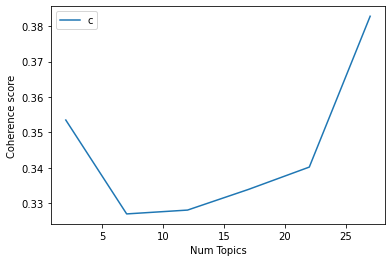

In [228]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us_score3)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [229]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us_score3):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 27

index: 0 | Num Topics = 2  has Coherence Value of 0.3535
index: 1 | Num Topics = 7  has Coherence Value of 0.327
index: 2 | Num Topics = 12  has Coherence Value of 0.3281
index: 3 | Num Topics = 17  has Coherence Value of 0.3339
index: 4 | Num Topics = 22  has Coherence Value of 0.3402
index: 5 | Num Topics = 27  has Coherence Value of 0.3828


In [230]:
# Select optimal number of topics
optimal_model_us_score3 = model_list_us_score3[5]

In [231]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us_score3 = pyLDAvis.gensim_models.prepare(optimal_model_us_score3, corpus_us_score3, id2word_us_score3)

In [232]:
print("pyLDAVis for us topics for score=3:")
vis_us_score3

pyLDAVis for us topics for score=3:


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
26     0.106943  0.045934       1        1  9.352447
14     0.082273 -0.065401       2        1  7.352351
8     -0.073781  0.209092       3        1  6.929366
15    -0.021963  0.098595       4        1  6.054116
16     0.050604  0.084009       5        1  5.666011
13     0.056358 -0.019115       6        1  5.545689
21     0.099265 -0.025155       7        1  5.239770
7      0.076305 -0.003045       8        1  4.792801
1      0.091842  0.006622       9        1  4.275334
2      0.091561  0.039573      10        1  3.964714
25     0.165761  0.026893      11        1  3.924764
17     0.022390  0.066761      12        1  3.918784
20     0.003437  0.060851      13        1  3.790781
18    -0.014347 -0.010950      14        1  3.389102
10     0.013260 -0.051516      15        1  3.166203
3     -0.106363  0.012438      16        1  3.081238
11     0.029878 -0.034956      17        1  2.705204
9     -0.129013  0.056786      18        1  2.331939
4     -0.111259 -0.017171      19        1  1.976004
6     -0.141584  0.039496      20        1  1.866201
22    -0.030045 -0.000191      21        1  1.794699
0     -0.056858 -0.022983      22        1  1.778222
5     -0.030234 -0.112340      23        1  1.725830
23    -0.014517 -0.084127      24        1  1.701979
19    -0.053972 -0.079384      25        1  1.686546
12    -0.021018 -0.122592      26        1  1.582991
24    -0.084922 -0.098124      27        1  0.406914, topic_info=         Term       Freq      Total Category  logprob  loglift
112      song  39.000000  39.000000  Default  30.0000  30.0000
83      music  49.000000  49.000000  Default  29.0000  29.0000
28    triller  61.000000  61.000000  Default  28.0000  28.0000
43     update  35.000000  35.000000  Default  27.0000  27.0000
24       save  32.000000  32.000000  Default  26.0000  26.0000
..        ...        ...        ...      ...      ...      ...
207       way   0.014496  14.517699  Topic27  -6.8947  -1.4050
400  memorize   0.014496   1.596257  Topic27  -6.8947   0.8028
254     dance   0.014496   3.925548  Topic27  -6.8947  -0.0971
24       save   0.014496  32.861784  Topic27  -6.8947  -2.2219
30       back   0.014496  20.598690  Topic27  -6.8947  -1.7548

[1362 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
153      12  0.416842    ability
153      16  0.416842    ability
212       4  0.078049       able
212       5  0.234147       able
212       6  0.156098       able
...     ...       ...        ...
290      14  0.187935       year
290      24  0.093967       year
734      13  0.626465  yesterday
252       2  0.786947      young
632       1  0.596891       yuck

[1934 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[27, 15, 9, 16, 17, 14, 22, 8, 2, 3, 26, 18, 21, 19, 11, 4, 12, 10, 5, 7, 23, 1, 6, 24, 20, 13, 25])

## LDA Topic Modelling (Rating = 4)

In [233]:
# By-rating Topic Modelling - rating = 4
# Convert to list - move to each section
review_us_score4 = triller_ios_us_review_YearMonth_score4.review.values.tolist()
review_words_us_score4 = list(sent_to_words(review_us_score4))
print(review_words_us_score4[2:3])

[['really', 'enjoy', 'this', 'app', 'it', 'allows', 'me', 'to', 'be', 'creative', 'without', 'spending', 'money', 'like', 'crazy', 'my', 'only', 'problem', 'is', 'thought', 'you', 'could', 'pay', 'to', 'have', 'the', 'watermark', 'removed', 'from', 'my', 'videos', 'don', 'see', 'that', 'option', 'anywhere', 'on', 'the', 'app']]


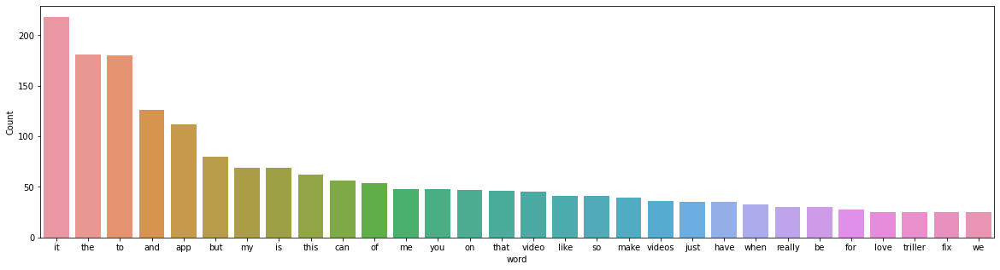

In [234]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us_score4))

In [235]:
# Clean text
review_us_ready_score4 = process_words(review_words_us_score4)  # processed Text Data! - move to each section

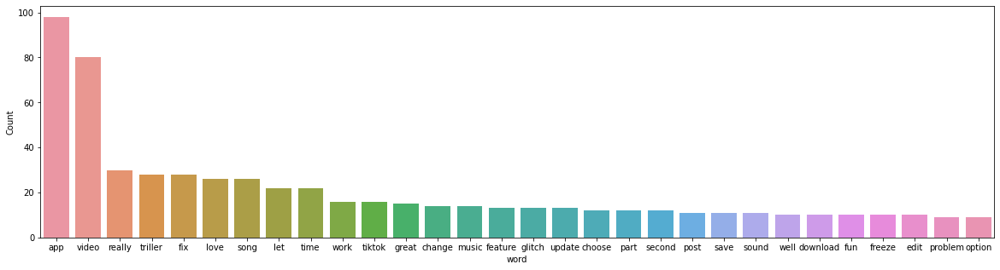

In [236]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_us_ready_score4))


In [237]:
# Create Dictionary
id2word_us_score4 = corpora.Dictionary(review_us_ready_score4)

2021-10-20 16:55:52,959 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-20 16:55:52,963 [INFO] gensim.corpora.dictionary - built Dictionary(487 unique tokens: ['account', 'bring', 'create', 'keep', 'let']...) from 141 documents (total 1540 corpus positions)
2021-10-20 16:55:52,964 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(487 unique tokens: ['account', 'bring', 'create', 'keep', 'let']...) from 141 documents (total 1540 corpus positions)", 'datetime': '2021-10-20T16:55:52.964508', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [238]:
# Create Corpus: Term Document Frequency
corpus_us_score4 = [id2word_us_score4.doc2bow(text) for text in review_us_ready_score4]

In [239]:
# Training LDA model
model_list_us_score4, coherence_values_us_score4 = compute_coherence_values(dictionary=id2word_us_score4, corpus=corpus_us_score4, 
                                                              texts=review_us_ready_score4, limit=30, start=2, step=5)


2021-10-20 16:55:52,977 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-20 16:55:52,978 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-20 16:55:52,981 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 16:55:52,981 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 141 documents, updating model once every 141 documents, evaluating perplexity every 141 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-20 16:55:53,098 [INFO] gensim.models.ldamodel - -6.831 per-word bound, 113.8 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:55:53,098 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #141/141
2021-10-20 16:55:53,207 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.038*"app" + 0.019*"video" + 0.019*"triller" + 0.018*"fix" + 0.015*"let" + 0.013*"really" + 0.011*"time

2021-10-20 16:55:54,248 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.055*"video" + 0.050*"app" + 0.020*"song" + 0.018*"love" + 0.015*"really" + 0.012*"tiktok" + 0.012*"music" + 0.011*"fix" + 0.011*"feature" + 0.011*"change"
2021-10-20 16:55:54,248 [INFO] gensim.models.ldamodel - topic diff=0.010767, rho=0.301511
2021-10-20 16:55:54,296 [INFO] gensim.models.ldamodel - -5.880 per-word bound, 58.9 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:55:54,297 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #141/141
2021-10-20 16:55:54,333 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.048*"app" + 0.020*"triller" + 0.019*"fix" + 0.018*"video" + 0.016*"really" + 0.016*"time" + 0.014*"let" + 0.013*"save" + 0.013*"glitch" + 0.012*"update"
2021-10-20 16:55:54,334 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.055*"video" + 0.050*"app" + 0.021*"song" + 0.018*"love" + 0.015*"really" + 0.012*"tiktok" + 0.012*"music" + 0.011*

2021-10-20 16:55:55,120 [INFO] gensim.models.ldamodel - topic diff=0.006326, rho=0.218218
2021-10-20 16:55:55,167 [INFO] gensim.models.ldamodel - -5.871 per-word bound, 58.5 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:55:55,168 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #141/141
2021-10-20 16:55:55,203 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.052*"app" + 0.021*"fix" + 0.020*"triller" + 0.019*"video" + 0.017*"really" + 0.016*"time" + 0.014*"glitch" + 0.014*"let" + 0.014*"save" + 0.012*"freeze"
2021-10-20 16:55:55,204 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.055*"video" + 0.047*"app" + 0.022*"song" + 0.017*"love" + 0.014*"really" + 0.012*"tiktok" + 0.012*"music" + 0.011*"change" + 0.011*"feature" + 0.010*"choose"
2021-10-20 16:55:55,205 [INFO] gensim.models.ldamodel - topic diff=0.005807, rho=0.213201
2021-10-20 16:55:55,256 [INFO] gensim.models.ldamodel - -5.871 per-word bound, 58.5 perplexity es

2021-10-20 16:55:56,014 [INFO] gensim.models.ldamodel - -5.866 per-word bound, 58.3 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:55:56,015 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #141/141
2021-10-20 16:55:56,053 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.054*"app" + 0.023*"fix" + 0.021*"video" + 0.020*"triller" + 0.019*"really" + 0.016*"time" + 0.015*"glitch" + 0.014*"let" + 0.013*"save" + 0.012*"freeze"
2021-10-20 16:55:56,054 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.054*"video" + 0.045*"app" + 0.022*"song" + 0.017*"love" + 0.013*"really" + 0.012*"tiktok" + 0.012*"music" + 0.012*"change" + 0.011*"feature" + 0.011*"choose"
2021-10-20 16:55:56,054 [INFO] gensim.models.ldamodel - topic diff=0.004732, rho=0.176777
2021-10-20 16:55:56,107 [INFO] gensim.models.ldamodel - -5.866 per-word bound, 58.3 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:55:56,108

2021-10-20 16:55:56,945 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #141/141
2021-10-20 16:55:56,996 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.055*"app" + 0.025*"fix" + 0.023*"video" + 0.020*"really" + 0.020*"triller" + 0.016*"time" + 0.015*"glitch" + 0.014*"let" + 0.013*"save" + 0.012*"freeze"
2021-10-20 16:55:56,997 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.052*"video" + 0.044*"app" + 0.022*"song" + 0.017*"love" + 0.012*"tiktok" + 0.012*"music" + 0.012*"change" + 0.012*"really" + 0.011*"feature" + 0.011*"choose"
2021-10-20 16:55:56,998 [INFO] gensim.models.ldamodel - topic diff=0.002538, rho=0.154303
2021-10-20 16:55:57,072 [INFO] gensim.models.ldamodel - -5.863 per-word bound, 58.2 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:55:57,073 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #141/141
2021-10-20 16:55:57,108 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.056*"app" + 0.0

2021-10-20 16:55:57,809 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-20 16:55:59,238 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-20 16:55:59,272 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 129 virtual documents
2021-10-20 16:55:59,364 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.14285714285714285
2021-10-20 16:55:59,364 [INFO] gensim.models.ldamodel - using symmetric eta at 0.14285714285714285
2021-10-20 16:55:59,366 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 16:55:59,367 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 7 topics, 50 passes over the supplied corpus of 141 documents, updating model once every 141 documents, evaluating perplexity every 141 documents, iterating 50x with a con

2021-10-20 16:55:59,827 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.034*"edit" + 0.028*"change" + 0.024*"video" + 0.023*"option" + 0.023*"second" + 0.022*"little" + 0.018*"allow" + 0.016*"update" + 0.016*"triller" + 0.016*"long"
2021-10-20 16:55:59,828 [INFO] gensim.models.ldamodel - topic diff=0.054387, rho=0.408248
2021-10-20 16:55:59,877 [INFO] gensim.models.ldamodel - -6.187 per-word bound, 72.9 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:55:59,878 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #141/141
2021-10-20 16:55:59,906 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.032*"app" + 0.030*"video" + 0.027*"fix" + 0.026*"tiktok" + 0.021*"love" + 0.014*"password" + 0.013*"look" + 0.013*"time" + 0.013*"sound" + 0.013*"comment"
2021-10-20 16:55:59,907 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.035*"edit" + 0.028*"change" + 0.025*"video" + 0.023*"option" + 0.023*"second" + 0.023*"little" + 0.019*"all

2021-10-20 16:56:00,323 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.054*"video" + 0.049*"app" + 0.032*"let" + 0.031*"fix" + 0.024*"really" + 0.018*"feature" + 0.017*"triller" + 0.015*"add" + 0.015*"change" + 0.015*"love"
2021-10-20 16:56:00,324 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.044*"well" + 0.041*"song" + 0.036*"tiktok" + 0.036*"pick" + 0.033*"part" + 0.031*"app" + 0.021*"let" + 0.015*"thing" + 0.011*"video" + 0.008*"ban"
2021-10-20 16:56:00,325 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.029*"app" + 0.027*"back" + 0.025*"triller" + 0.024*"glitch" + 0.017*"really" + 0.017*"update" + 0.017*"page" + 0.017*"log" + 0.016*"video" + 0.014*"pretty"
2021-10-20 16:56:00,326 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.036*"edit" + 0.029*"change" + 0.027*"video" + 0.023*"option" + 0.023*"second" + 0.023*"little" + 0.021*"allow" + 0.016*"update" + 0.016*"triller" + 0.016*"long"
2021-10-20 16:56:00,327 [INFO] gensim.models.ldamodel - topic diff=0.011608, rh

2021-10-20 16:56:00,734 [INFO] gensim.models.ldamodel - topic diff=0.005942, rho=0.242536
2021-10-20 16:56:00,781 [INFO] gensim.models.ldamodel - -6.160 per-word bound, 71.5 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:00,782 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #141/141
2021-10-20 16:56:00,810 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.029*"app" + 0.027*"back" + 0.025*"triller" + 0.023*"glitch" + 0.017*"really" + 0.017*"update" + 0.017*"page" + 0.017*"log" + 0.016*"video" + 0.014*"love"
2021-10-20 16:56:00,811 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.036*"edit" + 0.029*"change" + 0.029*"video" + 0.023*"option" + 0.023*"second" + 0.023*"little" + 0.022*"allow" + 0.015*"update" + 0.015*"long" + 0.015*"triller"
2021-10-20 16:56:00,811 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.047*"well" + 0.046*"song" + 0.038*"tiktok" + 0.037*"part" + 0.036*"pick" + 0.031*"app" + 0.019*"let" + 0.01

2021-10-20 16:56:01,196 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.029*"app" + 0.028*"back" + 0.026*"triller" + 0.023*"glitch" + 0.017*"update" + 0.017*"really" + 0.017*"page" + 0.017*"log" + 0.015*"video" + 0.014*"love"
2021-10-20 16:56:01,197 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.050*"song" + 0.048*"well" + 0.039*"part" + 0.038*"tiktok" + 0.035*"pick" + 0.031*"app" + 0.019*"let" + 0.015*"thing" + 0.014*"constantly" + 0.011*"video"
2021-10-20 16:56:01,198 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.063*"video" + 0.046*"app" + 0.025*"song" + 0.019*"love" + 0.019*"music" + 0.016*"choose" + 0.015*"really" + 0.015*"time" + 0.014*"triller" + 0.014*"great"
2021-10-20 16:56:01,198 [INFO] gensim.models.ldamodel - topic diff=0.004294, rho=0.208514
2021-10-20 16:56:01,251 [INFO] gensim.models.ldamodel - -6.151 per-word bound, 71.1 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:01,251 [INFO] gensim.models.ldamodel -

2021-10-20 16:56:01,589 [INFO] gensim.models.ldamodel - topic diff=0.002478, rho=0.188982
2021-10-20 16:56:01,632 [INFO] gensim.models.ldamodel - -6.147 per-word bound, 70.9 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:01,632 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #141/141
2021-10-20 16:56:01,659 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.107*"app" + 0.036*"video" + 0.029*"fix" + 0.027*"really" + 0.023*"time" + 0.021*"crash" + 0.018*"save" + 0.016*"enjoy" + 0.016*"triller" + 0.016*"still"
2021-10-20 16:56:01,660 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.029*"app" + 0.028*"back" + 0.026*"triller" + 0.022*"glitch" + 0.017*"update" + 0.017*"really" + 0.017*"log" + 0.017*"page" + 0.015*"video" + 0.014*"love"
2021-10-20 16:56:01,661 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.033*"app" + 0.028*"video" + 0.028*"tiktok" + 0.023*"love" + 0.015*"fix" + 0.014*"sound" + 0.014*"comment" + 0.014*"

2021-10-20 16:56:02,063 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.052*"song" + 0.049*"well" + 0.040*"part" + 0.039*"tiktok" + 0.035*"pick" + 0.032*"app" + 0.019*"let" + 0.015*"thing" + 0.015*"constantly" + 0.011*"video"
2021-10-20 16:56:02,064 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.032*"app" + 0.028*"video" + 0.028*"tiktok" + 0.023*"love" + 0.015*"fix" + 0.014*"sound" + 0.014*"comment" + 0.014*"kick" + 0.014*"password" + 0.014*"look"
2021-10-20 16:56:02,065 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.029*"app" + 0.028*"back" + 0.026*"triller" + 0.022*"glitch" + 0.018*"update" + 0.018*"really" + 0.018*"log" + 0.018*"page" + 0.015*"video" + 0.014*"friend"
2021-10-20 16:56:02,065 [INFO] gensim.models.ldamodel - topic diff=0.001517, rho=0.171499
2021-10-20 16:56:02,114 [INFO] gensim.models.ldamodel - -6.146 per-word bound, 70.8 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:02,115 [INFO] gensim.models.ldamodel

2021-10-20 16:56:02,465 [INFO] gensim.models.ldamodel - topic diff=0.001573, rho=0.160128
2021-10-20 16:56:02,509 [INFO] gensim.models.ldamodel - -6.145 per-word bound, 70.8 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:02,510 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #141/141
2021-10-20 16:56:02,535 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.062*"video" + 0.043*"app" + 0.025*"song" + 0.020*"love" + 0.020*"music" + 0.016*"choose" + 0.014*"triller" + 0.014*"great" + 0.014*"time" + 0.013*"phone"
2021-10-20 16:56:02,536 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.110*"app" + 0.036*"video" + 0.031*"really" + 0.029*"fix" + 0.024*"time" + 0.021*"crash" + 0.018*"save" + 0.016*"glitch" + 0.016*"enjoy" + 0.016*"triller"
2021-10-20 16:56:02,537 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.053*"song" + 0.049*"well" + 0.040*"part" + 0.039*"tiktok" + 0.035*"pick" + 0.032*"app" + 0.019*"let" + 0.015*"thin

2021-10-20 16:56:02,915 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.055*"video" + 0.044*"app" + 0.032*"fix" + 0.028*"let" + 0.024*"really" + 0.019*"feature" + 0.019*"add" + 0.017*"triller" + 0.015*"change" + 0.015*"love"
2021-10-20 16:56:02,917 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.036*"edit" + 0.030*"video" + 0.029*"change" + 0.023*"little" + 0.023*"second" + 0.023*"option" + 0.022*"allow" + 0.015*"long" + 0.015*"update" + 0.015*"triller"
2021-10-20 16:56:02,918 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.028*"back" + 0.026*"triller" + 0.024*"app" + 0.018*"update" + 0.018*"really" + 0.018*"log" + 0.018*"page" + 0.017*"glitch" + 0.016*"video" + 0.014*"friend"
2021-10-20 16:56:02,918 [INFO] gensim.models.ldamodel - topic diff=0.001258, rho=0.149071
2021-10-20 16:56:02,962 [INFO] gensim.models.ldamodel - -6.143 per-word bound, 70.7 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:02,962 [INFO] gensim.models.lda

2021-10-20 16:56:03,302 [INFO] gensim.models.ldamodel - topic diff=0.000856, rho=0.141421
2021-10-20 16:56:03,347 [INFO] gensim.models.ldamodel - -6.142 per-word bound, 70.6 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:03,348 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #141/141
2021-10-20 16:56:03,373 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.036*"edit" + 0.030*"video" + 0.029*"change" + 0.023*"little" + 0.023*"second" + 0.023*"option" + 0.022*"allow" + 0.015*"long" + 0.015*"update" + 0.015*"triller"
2021-10-20 16:56:03,374 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.053*"song" + 0.049*"well" + 0.040*"part" + 0.039*"tiktok" + 0.035*"pick" + 0.032*"app" + 0.019*"let" + 0.015*"thing" + 0.015*"constantly" + 0.011*"video"
2021-10-20 16:56:03,375 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.062*"video" + 0.043*"app" + 0.025*"song" + 0.020*"love" + 0.020*"music" + 0.016*"choose" + 0.014*"triller" 

2021-10-20 16:56:05,575 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.054*"video" + 0.051*"app" + 0.027*"song" + 0.024*"music" + 0.024*"really" + 0.018*"love" + 0.017*"time" + 0.017*"triller" + 0.014*"choose" + 0.014*"phone"
2021-10-20 16:56:05,575 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.043*"app" + 0.037*"song" + 0.033*"glitch" + 0.026*"different" + 0.026*"video" + 0.017*"definitely" + 0.017*"little" + 0.017*"fun" + 0.017*"time" + 0.017*"love"
2021-10-20 16:56:05,576 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.105*"app" + 0.044*"video" + 0.029*"crash" + 0.024*"really" + 0.020*"save" + 0.019*"time" + 0.016*"enjoy" + 0.016*"fix" + 0.016*"triller" + 0.012*"song"
2021-10-20 16:56:05,577 [INFO] gensim.models.ldamodel - topic diff=0.074421, rho=0.447214
2021-10-20 16:56:05,621 [INFO] gensim.models.ldamodel - -6.360 per-word bound, 82.1 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:05,621 [INFO] gensim.models.ldamo

2021-10-20 16:56:05,953 [INFO] gensim.models.ldamodel - topic diff=0.015530, rho=0.316228
2021-10-20 16:56:05,997 [INFO] gensim.models.ldamodel - -6.339 per-word bound, 81.0 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:05,998 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #141/141
2021-10-20 16:56:06,023 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.045*"song" + 0.043*"app" + 0.040*"glitch" + 0.025*"different" + 0.025*"video" + 0.017*"definitely" + 0.017*"little" + 0.017*"fun" + 0.017*"time" + 0.017*"love"
2021-10-20 16:56:06,024 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.106*"app" + 0.049*"video" + 0.030*"crash" + 0.028*"really" + 0.022*"time" + 0.019*"save" + 0.016*"fix" + 0.015*"enjoy" + 0.015*"fun" + 0.014*"glitch"
2021-10-20 16:56:06,025 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.048*"video" + 0.036*"update" + 0.025*"part" + 0.025*"change" + 0.025*"option" + 0.025*"pick" + 0.013*"able" + 0.

2021-10-20 16:56:06,397 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.024*"update" + 0.024*"triller" + 0.024*"app" + 0.024*"back" + 0.019*"really" + 0.019*"page" + 0.014*"time" + 0.014*"pretty" + 0.014*"annoying" + 0.014*"freeze"
2021-10-20 16:56:06,398 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.074*"fix" + 0.054*"app" + 0.052*"let" + 0.033*"really" + 0.033*"follow" + 0.033*"triller" + 0.022*"tiktok" + 0.022*"change" + 0.022*"thing" + 0.022*"ban"
2021-10-20 16:56:06,399 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.047*"love" + 0.043*"sometimes" + 0.041*"freeze" + 0.032*"app" + 0.018*"fix" + 0.018*"look" + 0.018*"flip" + 0.018*"camera" + 0.018*"ugly" + 0.018*"slow"
2021-10-20 16:56:06,399 [INFO] gensim.models.ldamodel - topic diff=0.005885, rho=0.250000
2021-10-20 16:56:06,443 [INFO] gensim.models.ldamodel - -6.324 per-word bound, 80.1 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:06,444 [INFO] gensim.models.ldamod

2021-10-20 16:56:06,778 [INFO] gensim.models.ldamodel - topic diff=0.003722, rho=0.218218
2021-10-20 16:56:06,826 [INFO] gensim.models.ldamodel - -6.317 per-word bound, 79.7 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:06,827 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #141/141
2021-10-20 16:56:06,854 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.064*"video" + 0.048*"app" + 0.031*"comment" + 0.031*"tiktok" + 0.026*"save" + 0.021*"art" + 0.021*"love" + 0.016*"topic" + 0.016*"sound" + 0.012*"let"
2021-10-20 16:56:06,855 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.048*"app" + 0.039*"tiktok" + 0.029*"video" + 0.029*"comment" + 0.020*"always" + 0.020*"freeze" + 0.020*"second" + 0.020*"triller" + 0.020*"send" + 0.020*"instead"
2021-10-20 16:56:06,855 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.037*"well" + 0.037*"feature" + 0.029*"video" + 0.029*"song" + 0.022*"great" + 0.022*"part" + 0.022*"second"

2021-10-20 16:56:07,247 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.048*"video" + 0.042*"update" + 0.024*"part" + 0.024*"change" + 0.024*"pick" + 0.024*"option" + 0.013*"let" + 0.013*"able" + 0.013*"sec" + 0.013*"long"
2021-10-20 16:56:07,248 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.083*"fix" + 0.062*"let" + 0.059*"app" + 0.035*"triller" + 0.032*"really" + 0.032*"follow" + 0.022*"tiktok" + 0.022*"change" + 0.022*"thing" + 0.022*"ban"
2021-10-20 16:56:07,249 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.047*"song" + 0.043*"app" + 0.041*"glitch" + 0.025*"different" + 0.025*"video" + 0.017*"little" + 0.017*"definitely" + 0.017*"fun" + 0.017*"time" + 0.017*"love"
2021-10-20 16:56:07,249 [INFO] gensim.models.ldamodel - topic diff=0.002550, rho=0.192450
2021-10-20 16:56:07,291 [INFO] gensim.models.ldamodel - -6.315 per-word bound, 79.6 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:07,292 [INFO] gensim.models.ldamode

2021-10-20 16:56:07,632 [INFO] gensim.models.ldamodel - topic diff=0.001182, rho=0.176777
2021-10-20 16:56:07,684 [INFO] gensim.models.ldamodel - -6.314 per-word bound, 79.6 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:07,685 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #141/141
2021-10-20 16:56:07,711 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.037*"well" + 0.037*"feature" + 0.029*"video" + 0.029*"song" + 0.022*"great" + 0.022*"part" + 0.022*"shuffle" + 0.022*"wish" + 0.022*"second" + 0.022*"add"
2021-10-20 16:56:07,712 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.072*"app" + 0.061*"video" + 0.040*"fix" + 0.024*"let" + 0.023*"really" + 0.023*"feature" + 0.017*"change" + 0.017*"force" + 0.012*"work" + 0.012*"great"
2021-10-20 16:56:07,713 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.087*"fix" + 0.066*"let" + 0.062*"app" + 0.036*"triller" + 0.031*"follow" + 0.031*"really" + 0.021*"tiktok" + 0.02

2021-10-20 16:56:08,093 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.024*"update" + 0.024*"triller" + 0.024*"back" + 0.024*"app" + 0.019*"really" + 0.019*"page" + 0.014*"time" + 0.014*"pretty" + 0.014*"people" + 0.014*"work"
2021-10-20 16:56:08,094 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.088*"fix" + 0.068*"let" + 0.062*"app" + 0.037*"triller" + 0.031*"follow" + 0.031*"really" + 0.021*"tiktok" + 0.021*"change" + 0.021*"thing" + 0.021*"ban"
2021-10-20 16:56:08,094 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.037*"well" + 0.037*"feature" + 0.029*"video" + 0.029*"song" + 0.022*"great" + 0.022*"part" + 0.022*"wish" + 0.022*"shuffle" + 0.022*"second" + 0.022*"add"
2021-10-20 16:56:08,095 [INFO] gensim.models.ldamodel - topic diff=0.000445, rho=0.162221
2021-10-20 16:56:08,146 [INFO] gensim.models.ldamodel - -6.314 per-word bound, 79.5 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:08,147 [INFO] gensim.models.ldamode

2021-10-20 16:56:08,490 [INFO] gensim.models.ldamodel - topic diff=0.000422, rho=0.152499
2021-10-20 16:56:08,534 [INFO] gensim.models.ldamodel - -6.314 per-word bound, 79.5 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:08,535 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #141/141
2021-10-20 16:56:08,559 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.111*"app" + 0.055*"video" + 0.043*"really" + 0.029*"crash" + 0.023*"time" + 0.018*"save" + 0.018*"fun" + 0.018*"glitch" + 0.014*"enjoy" + 0.012*"fix"
2021-10-20 16:56:08,560 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.065*"video" + 0.048*"app" + 0.031*"tiktok" + 0.031*"comment" + 0.026*"save" + 0.021*"love" + 0.021*"art" + 0.016*"sound" + 0.016*"topic" + 0.011*"let"
2021-10-20 16:56:08,561 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.048*"video" + 0.047*"update" + 0.024*"part" + 0.024*"change" + 0.024*"pick" + 0.024*"option" + 0.013*"let" + 0.013*"sec" 

2021-10-20 16:56:08,946 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.072*"app" + 0.061*"video" + 0.039*"fix" + 0.023*"let" + 0.023*"feature" + 0.023*"really" + 0.017*"change" + 0.017*"force" + 0.012*"download" + 0.012*"great"
2021-10-20 16:56:08,947 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.049*"love" + 0.044*"sometimes" + 0.044*"freeze" + 0.032*"app" + 0.018*"camera" + 0.018*"look" + 0.018*"flip" + 0.018*"ugly" + 0.018*"fix" + 0.018*"slow"
2021-10-20 16:56:08,947 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.037*"well" + 0.037*"feature" + 0.029*"video" + 0.029*"song" + 0.022*"great" + 0.022*"wish" + 0.022*"part" + 0.022*"shuffle" + 0.022*"add" + 0.022*"second"
2021-10-20 16:56:08,948 [INFO] gensim.models.ldamodel - topic diff=0.000091, rho=0.142857
2021-10-20 16:56:08,991 [INFO] gensim.models.ldamodel - -6.314 per-word bound, 79.5 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:08,992 [INFO] gensim.models.ldamode

2021-10-20 16:56:11,348 [INFO] gensim.models.ldamodel - -6.598 per-word bound, 96.9 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:11,349 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #141/141
2021-10-20 16:56:11,377 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.057*"follower" + 0.039*"triller" + 0.029*"song" + 0.021*"fix" + 0.020*"still" + 0.020*"post" + 0.020*"confusing" + 0.020*"real" + 0.020*"extremely" + 0.020*"choose"
2021-10-20 16:56:11,378 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.060*"let" + 0.047*"app" + 0.037*"fix" + 0.025*"feature" + 0.025*"post" + 0.025*"update" + 0.023*"overall" + 0.020*"young" + 0.013*"never" + 0.013*"close"
2021-10-20 16:56:11,379 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.029*"app" + 0.029*"video" + 0.028*"sound" + 0.028*"fix" + 0.026*"constantly" + 0.023*"love" + 0.015*"people" + 0.015*"always" + 0.015*"music" + 0.015*"direct"
2021-10-20 16:56:11,380 [INFO] gen

2021-10-20 16:56:11,822 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.051*"video" + 0.049*"app" + 0.036*"comment" + 0.036*"tiktok" + 0.024*"love" + 0.024*"art" + 0.018*"topic" + 0.018*"find" + 0.017*"friend" + 0.012*"call"
2021-10-20 16:56:11,823 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.094*"song" + 0.046*"thing" + 0.026*"great" + 0.026*"idk" + 0.026*"let" + 0.026*"follow" + 0.026*"people" + 0.026*"well" + 0.026*"type" + 0.001*"able"
2021-10-20 16:56:11,823 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.059*"let" + 0.047*"app" + 0.035*"fix" + 0.024*"post" + 0.024*"update" + 0.024*"feature" + 0.024*"overall" + 0.024*"young" + 0.012*"iphone" + 0.012*"fine"
2021-10-20 16:56:11,824 [INFO] gensim.models.ldamodel - topic diff=0.040476, rho=0.333333
2021-10-20 16:56:11,870 [INFO] gensim.models.ldamodel - -6.426 per-word bound, 86.0 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:11,870 [INFO] gensim.models.ldamodel - PROGR

2021-10-20 16:56:12,221 [INFO] gensim.models.ldamodel - topic diff=0.013615, rho=0.267261
2021-10-20 16:56:12,274 [INFO] gensim.models.ldamodel - -6.400 per-word bound, 84.4 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:12,275 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #141/141
2021-10-20 16:56:12,308 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.029*"app" + 0.029*"video" + 0.029*"sound" + 0.029*"fix" + 0.029*"constantly" + 0.027*"love" + 0.015*"glitche" + 0.015*"glitch" + 0.015*"end" + 0.015*"music"
2021-10-20 16:56:12,309 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.112*"video" + 0.038*"app" + 0.038*"music" + 0.019*"segment" + 0.019*"edit" + 0.019*"cool" + 0.019*"song" + 0.019*"triller" + 0.019*"really" + 0.019*"update"
2021-10-20 16:56:12,310 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.050*"sound" + 0.042*"add" + 0.039*"love" + 0.034*"little" + 0.025*"song" + 0.024*"let" + 0.019*"app" + 0.0

2021-10-20 16:56:12,744 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.070*"second" + 0.056*"fix" + 0.041*"glitch" + 0.038*"change" + 0.033*"kick" + 0.028*"app" + 0.025*"click" + 0.025*"annoying" + 0.025*"able" + 0.022*"triller"
2021-10-20 16:56:12,744 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.052*"video" + 0.044*"app" + 0.037*"comment" + 0.037*"tiktok" + 0.025*"love" + 0.025*"art" + 0.019*"topic" + 0.018*"find" + 0.018*"friend" + 0.012*"call"
2021-10-20 16:56:12,745 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.049*"app" + 0.033*"triller" + 0.033*"allow" + 0.033*"pay" + 0.017*"overall" + 0.017*"really" + 0.017*"option" + 0.017*"happen" + 0.017*"version" + 0.017*"recently"
2021-10-20 16:56:12,745 [INFO] gensim.models.ldamodel - topic diff=0.004512, rho=0.223607
2021-10-20 16:56:12,798 [INFO] gensim.models.ldamodel - -6.391 per-word bound, 83.9 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:12,799 [INFO] gensim.mode

2021-10-20 16:56:13,144 [INFO] gensim.models.ldamodel - topic diff=0.001937, rho=0.200000
2021-10-20 16:56:13,186 [INFO] gensim.models.ldamodel - -6.390 per-word bound, 83.9 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:13,187 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #141/141
2021-10-20 16:56:13,213 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.059*"follower" + 0.040*"triller" + 0.021*"song" + 0.021*"fix" + 0.021*"extremely" + 0.021*"stick" + 0.021*"post" + 0.021*"real" + 0.021*"video" + 0.021*"count"
2021-10-20 16:56:13,214 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.080*"app" + 0.038*"fix" + 0.033*"video" + 0.029*"really" + 0.029*"let" + 0.024*"work" + 0.023*"triller" + 0.019*"account" + 0.019*"tell" + 0.018*"download"
2021-10-20 16:56:13,215 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.070*"let" + 0.058*"app" + 0.024*"fix" + 0.024*"post" + 0.024*"update" + 0.024*"feature" + 0.024*"overall

2021-10-20 16:56:13,643 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.059*"follower" + 0.040*"triller" + 0.021*"song" + 0.021*"fix" + 0.021*"extremely" + 0.021*"stick" + 0.021*"post" + 0.021*"real" + 0.021*"video" + 0.021*"count"
2021-10-20 16:56:13,643 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.066*"app" + 0.044*"tiktok" + 0.022*"video" + 0.022*"love" + 0.022*"bad" + 0.022*"roll" + 0.021*"triller" + 0.020*"camera" + 0.011*"crazy" + 0.011*"improvement"
2021-10-20 16:56:13,644 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.051*"sound" + 0.042*"add" + 0.040*"love" + 0.034*"little" + 0.026*"song" + 0.025*"let" + 0.020*"app" + 0.017*"log" + 0.017*"favorite" + 0.017*"record"
2021-10-20 16:56:13,645 [INFO] gensim.models.ldamodel - topic diff=0.000953, rho=0.179605
2021-10-20 16:56:13,693 [INFO] gensim.models.ldamodel - -6.388 per-word bound, 83.8 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:13,694 [INFO] gensim.models.

2021-10-20 16:56:14,069 [INFO] gensim.models.ldamodel - topic diff=0.000557, rho=0.166667
2021-10-20 16:56:14,114 [INFO] gensim.models.ldamodel - -6.387 per-word bound, 83.7 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:14,115 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #141/141
2021-10-20 16:56:14,143 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.051*"sound" + 0.042*"add" + 0.040*"love" + 0.034*"little" + 0.026*"song" + 0.025*"let" + 0.020*"app" + 0.017*"log" + 0.017*"favorite" + 0.017*"record"
2021-10-20 16:56:14,143 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.070*"let" + 0.059*"app" + 0.024*"fix" + 0.024*"post" + 0.024*"update" + 0.024*"feature" + 0.024*"overall" + 0.024*"young" + 0.024*"still" + 0.024*"song"
2021-10-20 16:56:14,144 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.049*"app" + 0.033*"triller" + 0.033*"pay" + 0.033*"allow" + 0.017*"overall" + 0.017*"really" + 0.017*"option" + 0.01

2021-10-20 16:56:14,561 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.051*"sound" + 0.042*"add" + 0.040*"love" + 0.034*"little" + 0.026*"song" + 0.025*"let" + 0.020*"app" + 0.017*"log" + 0.017*"favorite" + 0.017*"record"
2021-10-20 16:56:14,562 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.066*"app" + 0.044*"tiktok" + 0.022*"video" + 0.022*"love" + 0.022*"bad" + 0.022*"roll" + 0.021*"triller" + 0.020*"camera" + 0.011*"special" + 0.011*"english"
2021-10-20 16:56:14,563 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.029*"app" + 0.029*"video" + 0.029*"fix" + 0.029*"sound" + 0.029*"constantly" + 0.027*"love" + 0.015*"glitche" + 0.015*"glitch" + 0.015*"always" + 0.015*"music"
2021-10-20 16:56:14,564 [INFO] gensim.models.ldamodel - topic diff=0.000341, rho=0.154303
2021-10-20 16:56:14,618 [INFO] gensim.models.ldamodel - -6.387 per-word bound, 83.7 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:14,619 [INFO] gensim.models.lda

2021-10-20 16:56:15,015 [INFO] gensim.models.ldamodel - topic diff=0.000246, rho=0.145865
2021-10-20 16:56:15,068 [INFO] gensim.models.ldamodel - -6.386 per-word bound, 83.6 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:15,070 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #141/141
2021-10-20 16:56:15,115 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.052*"video" + 0.043*"app" + 0.037*"tiktok" + 0.037*"comment" + 0.025*"love" + 0.025*"art" + 0.019*"topic" + 0.019*"find" + 0.018*"friend" + 0.013*"feature"
2021-10-20 16:56:15,117 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.041*"change" + 0.038*"time" + 0.028*"really" + 0.028*"triller" + 0.028*"fix" + 0.028*"help" + 0.028*"mess" + 0.028*"definitely" + 0.028*"load" + 0.018*"video"
2021-10-20 16:56:15,118 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.071*"second" + 0.064*"fix" + 0.040*"glitch" + 0.039*"change" + 0.032*"kick" + 0.030*"app" + 0.024*"click" 

2021-10-20 16:56:18,019 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.063*"app" + 0.032*"problem" + 0.032*"different" + 0.021*"crazy" + 0.021*"freeze" + 0.021*"annoying" + 0.021*"video" + 0.021*"time" + 0.021*"fix" + 0.021*"people"
2021-10-20 16:56:18,020 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.074*"app" + 0.045*"really" + 0.026*"let" + 0.026*"tiktok" + 0.024*"fix" + 0.024*"video" + 0.019*"work" + 0.019*"tell" + 0.019*"account" + 0.016*"triller"
2021-10-20 16:56:18,021 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.033*"email" + 0.026*"app" + 0.026*"time" + 0.025*"love" + 0.025*"password" + 0.025*"funny" + 0.018*"video" + 0.017*"look" + 0.017*"though" + 0.017*"flip"
2021-10-20 16:56:18,022 [INFO] gensim.models.ldamodel - topic diff=17.931932, rho=1.000000
2021-10-20 16:56:18,065 [INFO] gensim.models.ldamodel - -6.731 per-word bound, 106.2 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:18,066 [INFO] gensim.model

2021-10-20 16:56:18,399 [INFO] gensim.models.ldamodel - topic diff=0.046055, rho=0.377964
2021-10-20 16:56:18,456 [INFO] gensim.models.ldamodel - -6.524 per-word bound, 92.0 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:18,457 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #141/141
2021-10-20 16:56:18,487 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.029*"triller" + 0.029*"pay" + 0.029*"recently" + 0.029*"choose" + 0.029*"able" + 0.029*"long" + 0.029*"allow" + 0.029*"version" + 0.029*"full" + 0.029*"upload"
2021-10-20 16:56:18,487 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.057*"update" + 0.053*"change" + 0.039*"option" + 0.034*"able" + 0.022*"fix" + 0.020*"lately" + 0.020*"start" + 0.020*"sec" + 0.020*"video" + 0.020*"watch"
2021-10-20 16:56:18,488 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.084*"video" + 0.033*"triller" + 0.033*"edit" + 0.031*"freeze" + 0.027*"music" + 0.022*"app" + 0.020*"segme

2021-10-20 16:56:18,894 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.066*"app" + 0.038*"view" + 0.036*"great" + 0.029*"second" + 0.029*"fix" + 0.026*"triller" + 0.026*"sound" + 0.026*"like" + 0.015*"always" + 0.015*"freeze"
2021-10-20 16:56:18,894 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.046*"well" + 0.046*"feature" + 0.035*"shuffle" + 0.035*"work" + 0.034*"wish" + 0.030*"video" + 0.023*"update" + 0.023*"else" + 0.023*"button" + 0.023*"countdown"
2021-10-20 16:56:18,895 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.057*"update" + 0.057*"change" + 0.038*"option" + 0.038*"able" + 0.022*"fix" + 0.020*"lately" + 0.020*"start" + 0.020*"video" + 0.020*"sec" + 0.020*"second"
2021-10-20 16:56:18,896 [INFO] gensim.models.ldamodel - topic diff=0.011880, rho=0.277350
2021-10-20 16:56:18,938 [INFO] gensim.models.ldamodel - -6.497 per-word bound, 90.3 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:18,939 [INFO] gensim.models

2021-10-20 16:56:19,284 [INFO] gensim.models.ldamodel - topic diff=0.005696, rho=0.235702
2021-10-20 16:56:19,324 [INFO] gensim.models.ldamodel - -6.488 per-word bound, 89.8 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:19,325 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #141/141
2021-10-20 16:56:19,350 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.076*"glitch" + 0.032*"app" + 0.031*"really" + 0.029*"creator" + 0.029*"work" + 0.028*"pretty" + 0.019*"love" + 0.019*"slow" + 0.019*"able" + 0.012*"annoy"
2021-10-20 16:56:19,351 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.074*"video" + 0.038*"app" + 0.036*"allow" + 0.036*"comment" + 0.033*"recording" + 0.024*"edit" + 0.024*"confuse" + 0.024*"triller" + 0.016*"really" + 0.012*"post"
2021-10-20 16:56:19,351 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.073*"second" + 0.059*"video" + 0.057*"edit" + 0.055*"music" + 0.038*"triller" + 0.038*"option" + 0.037

2021-10-20 16:56:19,722 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.057*"update" + 0.057*"change" + 0.038*"option" + 0.038*"able" + 0.022*"fix" + 0.020*"video" + 0.020*"second" + 0.020*"long" + 0.020*"give" + 0.020*"start"
2021-10-20 16:56:19,723 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.035*"video" + 0.035*"creative" + 0.035*"great" + 0.035*"dance" + 0.035*"really" + 0.035*"app" + 0.035*"fun" + 0.035*"mess" + 0.002*"destroy" + 0.002*"stuff"
2021-10-20 16:56:19,724 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.088*"video" + 0.042*"freeze" + 0.031*"edit" + 0.031*"triller" + 0.028*"app" + 0.025*"music" + 0.025*"log" + 0.019*"segment" + 0.019*"record" + 0.019*"follower"
2021-10-20 16:56:19,725 [INFO] gensim.models.ldamodel - topic diff=0.003328, rho=0.204124
2021-10-20 16:56:19,765 [INFO] gensim.models.ldamodel - -6.480 per-word bound, 89.3 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:19,766 [INFO] gensim.models

2021-10-20 16:56:20,094 [INFO] gensim.models.ldamodel - topic diff=0.001817, rho=0.185695
2021-10-20 16:56:20,135 [INFO] gensim.models.ldamodel - -6.474 per-word bound, 88.9 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:20,136 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #141/141
2021-10-20 16:56:20,160 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.046*"app" + 0.046*"song" + 0.042*"video" + 0.031*"love" + 0.030*"choose" + 0.028*"part" + 0.026*"music" + 0.021*"second" + 0.020*"sound" + 0.020*"delete"
2021-10-20 16:56:20,161 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.073*"second" + 0.059*"video" + 0.056*"edit" + 0.055*"music" + 0.038*"triller" + 0.038*"option" + 0.038*"give" + 0.037*"press" + 0.022*"great" + 0.019*"song"
2021-10-20 16:56:20,162 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.054*"let" + 0.054*"app" + 0.041*"thing" + 0.039*"fix" + 0.027*"follow" + 0.027*"idk" + 0.027*"really" + 0.027*

2021-10-20 16:56:20,527 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.126*"app" + 0.054*"triller" + 0.036*"overall" + 0.036*"download" + 0.019*"fine" + 0.019*"idk" + 0.019*"fix" + 0.019*"different" + 0.019*"great" + 0.019*"story"
2021-10-20 16:56:20,528 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.046*"well" + 0.046*"feature" + 0.035*"shuffle" + 0.035*"work" + 0.035*"video" + 0.035*"wish" + 0.023*"update" + 0.023*"else" + 0.023*"button" + 0.023*"countdown"
2021-10-20 16:56:20,528 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.141*"app" + 0.043*"video" + 0.038*"fun" + 0.029*"improve" + 0.029*"cool" + 0.027*"fix" + 0.020*"tho" + 0.020*"enjoy" + 0.020*"maybe" + 0.020*"still"
2021-10-20 16:56:20,529 [INFO] gensim.models.ldamodel - topic diff=0.001566, rho=0.169031
2021-10-20 16:56:20,571 [INFO] gensim.models.ldamodel - -6.470 per-word bound, 88.6 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:20,572 [INFO] gensim.models.

2021-10-20 16:56:20,878 [INFO] gensim.models.ldamodel - topic diff=0.001061, rho=0.158114
2021-10-20 16:56:20,918 [INFO] gensim.models.ldamodel - -6.468 per-word bound, 88.5 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:20,919 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #141/141
2021-10-20 16:56:20,946 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.065*"app" + 0.037*"view" + 0.037*"second" + 0.037*"fix" + 0.035*"great" + 0.025*"triller" + 0.025*"sound" + 0.025*"like" + 0.015*"always" + 0.014*"freeze"
2021-10-20 16:56:20,947 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.055*"full" + 0.031*"choose" + 0.028*"allow" + 0.028*"long" + 0.028*"able" + 0.028*"happen" + 0.028*"pay" + 0.028*"recently" + 0.028*"version" + 0.028*"triller"
2021-10-20 16:56:20,947 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.122*"part" + 0.109*"pick" + 0.043*"song" + 0.023*"well" + 0.023*"record" + 0.023*"gift" + 0.023*"favorite

2021-10-20 16:56:21,350 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.055*"full" + 0.031*"choose" + 0.028*"allow" + 0.028*"long" + 0.028*"able" + 0.028*"happen" + 0.028*"pay" + 0.028*"recently" + 0.028*"version" + 0.028*"triller"
2021-10-20 16:56:21,352 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.073*"second" + 0.058*"video" + 0.056*"edit" + 0.055*"music" + 0.038*"triller" + 0.038*"option" + 0.038*"give" + 0.038*"press" + 0.022*"great" + 0.019*"song"
2021-10-20 16:56:21,352 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.077*"glitch" + 0.031*"app" + 0.031*"really" + 0.029*"creator" + 0.029*"work" + 0.029*"pretty" + 0.019*"love" + 0.019*"slow" + 0.019*"able" + 0.012*"annoy"
2021-10-20 16:56:21,353 [INFO] gensim.models.ldamodel - topic diff=0.000639, rho=0.147442
2021-10-20 16:56:21,398 [INFO] gensim.models.ldamodel - -6.467 per-word bound, 88.5 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:21,399 [INFO] gensim.models

2021-10-20 16:56:21,900 [INFO] gensim.models.ldamodel - topic diff=0.000396, rho=0.140028
2021-10-20 16:56:21,901 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=487, num_topics=22, decay=0.5, chunksize=1000) in 4.00s', 'datetime': '2021-10-20T16:56:21.901424', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-20 16:56:21,910 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-20 16:56:23,678 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-20 16:56:23,743 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 138 virtual documents
2021-10-20 16:56:24,685 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.037037037037037035
2021-10-20

2021-10-20 16:56:25,307 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.068*"tiktok" + 0.056*"video" + 0.034*"comment" + 0.033*"app" + 0.024*"time" + 0.023*"feature" + 0.023*"find" + 0.014*"freeze" + 0.012*"always" + 0.012*"hate"
2021-10-20 16:56:25,308 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.062*"video" + 0.047*"shuffle" + 0.046*"feature" + 0.046*"wish" + 0.031*"work" + 0.031*"button" + 0.031*"countdown" + 0.031*"second" + 0.016*"shot" + 0.016*"give"
2021-10-20 16:56:25,309 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.023*"app" + 0.023*"song" + 0.023*"really" + 0.023*"creator" + 0.016*"video" + 0.015*"look" + 0.015*"choose" + 0.015*"let" + 0.015*"flip" + 0.015*"fun"
2021-10-20 16:56:25,310 [INFO] gensim.models.ldamodel - topic diff=0.077911, rho=0.408248
2021-10-20 16:56:25,352 [INFO] gensim.models.ldamodel - -6.593 per-word bound, 96.5 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:25,353 [INFO] gensim.models.

2021-10-20 16:56:25,695 [INFO] gensim.models.ldamodel - topic diff=0.020591, rho=0.301511
2021-10-20 16:56:25,738 [INFO] gensim.models.ldamodel - -6.545 per-word bound, 93.4 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:25,739 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #141/141
2021-10-20 16:56:25,765 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.084*"app" + 0.058*"update" + 0.039*"cause" + 0.038*"fix" + 0.022*"time" + 0.022*"triller" + 0.020*"freeze" + 0.020*"back" + 0.020*"word" + 0.020*"bring"
2021-10-20 16:56:25,767 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.082*"second" + 0.054*"triller" + 0.042*"video" + 0.041*"long" + 0.031*"change" + 0.029*"able" + 0.028*"give" + 0.028*"edit" + 0.028*"option" + 0.025*"fix"
2021-10-20 16:56:25,768 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.087*"let" + 0.084*"app" + 0.063*"fix" + 0.050*"really" + 0.036*"follow" + 0.022*"triller" + 0.014*"great" + 0.013*

2021-10-20 16:56:26,160 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.088*"let" + 0.084*"app" + 0.066*"fix" + 0.050*"really" + 0.038*"follow" + 0.022*"triller" + 0.014*"great" + 0.013*"hear" + 0.013*"mad" + 0.013*"cover"
2021-10-20 16:56:26,161 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.071*"app" + 0.071*"part" + 0.043*"video" + 0.043*"improve" + 0.043*"pick" + 0.031*"song" + 0.029*"well" + 0.015*"feature" + 0.015*"play" + 0.015*"gift"
2021-10-20 16:56:26,162 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.089*"app" + 0.053*"really" + 0.053*"video" + 0.036*"love" + 0.030*"tiktok" + 0.024*"kick" + 0.018*"sound" + 0.018*"glitch" + 0.018*"fun" + 0.012*"like"
2021-10-20 16:56:26,162 [INFO] gensim.models.ldamodel - topic diff=0.006368, rho=0.242536
2021-10-20 16:56:26,211 [INFO] gensim.models.ldamodel - -6.531 per-word bound, 92.5 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:26,212 [INFO] gensim.models.ldamodel - PROGRE

2021-10-20 16:56:26,586 [INFO] gensim.models.ldamodel - topic diff=0.003253, rho=0.213201
2021-10-20 16:56:26,632 [INFO] gensim.models.ldamodel - -6.529 per-word bound, 92.3 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:26,633 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #141/141
2021-10-20 16:56:26,657 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.092*"app" + 0.058*"glitch" + 0.044*"change" + 0.035*"video" + 0.035*"triller" + 0.023*"time" + 0.023*"work" + 0.023*"love" + 0.023*"really" + 0.023*"download"
2021-10-20 16:56:26,658 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.123*"love" + 0.062*"sometimes" + 0.059*"video" + 0.057*"app" + 0.032*"overall" + 0.032*"post" + 0.032*"minute" + 0.032*"long" + 0.032*"limit" + 0.001*"sincerely"
2021-10-20 16:56:26,658 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.055*"app" + 0.055*"comment" + 0.055*"post" + 0.055*"help" + 0.037*"time" + 0.037*"still" + 0.037*"s

2021-10-20 16:56:27,033 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.092*"app" + 0.058*"glitch" + 0.045*"change" + 0.035*"video" + 0.035*"triller" + 0.023*"time" + 0.023*"work" + 0.023*"love" + 0.023*"really" + 0.023*"download"
2021-10-20 16:56:27,034 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.084*"comment" + 0.084*"video" + 0.029*"read" + 0.029*"close" + 0.029*"nessecary" + 0.029*"play" + 0.029*"pop" + 0.029*"keep" + 0.029*"love" + 0.029*"user"
2021-10-20 16:56:27,035 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.083*"second" + 0.054*"triller" + 0.042*"video" + 0.042*"long" + 0.029*"change" + 0.028*"able" + 0.028*"edit" + 0.028*"give" + 0.028*"option" + 0.024*"fix"
2021-10-20 16:56:27,035 [INFO] gensim.models.ldamodel - topic diff=0.001320, rho=0.188982
2021-10-20 16:56:27,075 [INFO] gensim.models.ldamodel - -6.526 per-word bound, 92.1 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:27,076 [INFO] gensim.models.ld

2021-10-20 16:56:27,422 [INFO] gensim.models.ldamodel - topic diff=0.000765, rho=0.174078
2021-10-20 16:56:27,471 [INFO] gensim.models.ldamodel - -6.524 per-word bound, 92.0 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:27,472 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #141/141
2021-10-20 16:56:27,498 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.023*"app" + 0.023*"song" + 0.023*"really" + 0.023*"creator" + 0.015*"video" + 0.015*"look" + 0.015*"choose" + 0.015*"work" + 0.015*"give" + 0.015*"download"
2021-10-20 16:56:27,499 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.047*"little" + 0.032*"add" + 0.032*"video" + 0.032*"fix" + 0.032*"way" + 0.032*"annoying" + 0.016*"love" + 0.016*"sound" + 0.016*"filter" + 0.016*"triller"
2021-10-20 16:56:27,499 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.120*"song" + 0.054*"great" + 0.046*"app" + 0.042*"thing" + 0.029*"video" + 0.028*"type" + 0.028*"people" +

2021-10-20 16:56:27,882 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.082*"well" + 0.062*"app" + 0.042*"let" + 0.042*"sound" + 0.021*"love" + 0.021*"song" + 0.021*"else" + 0.021*"totally" + 0.021*"recommend" + 0.021*"great"
2021-10-20 16:56:27,883 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.049*"song" + 0.039*"choose" + 0.039*"triller" + 0.029*"part" + 0.029*"follower" + 0.029*"video" + 0.029*"app" + 0.029*"music" + 0.020*"user" + 0.020*"fix"
2021-10-20 16:56:27,885 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.074*"tiktok" + 0.062*"video" + 0.037*"comment" + 0.037*"app" + 0.025*"feature" + 0.025*"find" + 0.013*"time" + 0.013*"people" + 0.013*"completely" + 0.013*"horror"
2021-10-20 16:56:27,885 [INFO] gensim.models.ldamodel - topic diff=0.000509, rho=0.160128
2021-10-20 16:56:27,938 [INFO] gensim.models.ldamodel - -6.523 per-word bound, 91.9 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:27,938 [INFO] gensim.model

2021-10-20 16:56:28,288 [INFO] gensim.models.ldamodel - topic diff=0.001223, rho=0.150756
2021-10-20 16:56:28,348 [INFO] gensim.models.ldamodel - -6.523 per-word bound, 92.0 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:28,348 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #141/141
2021-10-20 16:56:28,374 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.062*"video" + 0.047*"shuffle" + 0.047*"feature" + 0.047*"wish" + 0.031*"work" + 0.031*"second" + 0.031*"countdown" + 0.031*"button" + 0.016*"give" + 0.016*"shot"
2021-10-20 16:56:28,375 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.081*"hate" + 0.081*"time" + 0.041*"download" + 0.041*"ever" + 0.041*"watch" + 0.001*"song" + 0.001*"soon" + 0.001*"tweak" + 0.001*"simply" + 0.001*"sincerely"
2021-10-20 16:56:28,376 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.055*"app" + 0.055*"video" + 0.044*"art" + 0.033*"topic" + 0.022*"love" + 0.022*"add" + 0.022*"fix" 

2021-10-20 16:56:28,767 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.084*"app" + 0.059*"update" + 0.040*"cause" + 0.021*"fix" + 0.020*"time" + 0.020*"triller" + 0.020*"freeze" + 0.020*"bring" + 0.020*"back" + 0.020*"word"
2021-10-20 16:56:28,768 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.120*"song" + 0.054*"great" + 0.045*"app" + 0.042*"thing" + 0.029*"video" + 0.028*"type" + 0.028*"people" + 0.028*"idk" + 0.026*"able" + 0.014*"sound"
2021-10-20 16:56:28,769 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.089*"app" + 0.053*"really" + 0.053*"video" + 0.036*"love" + 0.030*"tiktok" + 0.024*"kick" + 0.018*"sound" + 0.018*"glitch" + 0.018*"fun" + 0.012*"find"
2021-10-20 16:56:28,769 [INFO] gensim.models.ldamodel - topic diff=0.000977, rho=0.141421
2021-10-20 16:56:28,814 [INFO] gensim.models.ldamodel - -6.520 per-word bound, 91.8 perplexity estimate based on a held-out corpus of 141 documents with 1540 words
2021-10-20 16:56:28,815 [INFO] gensim.models.ldamodel - PROGR

In [240]:
%store model_list_us_score4
%store coherence_values_us_score4

Stored 'model_list_us_score4' (list)
Stored 'coherence_values_us_score4' (list)


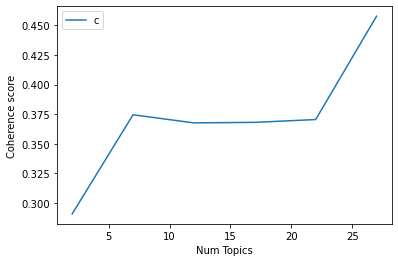

In [241]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us_score4)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [242]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us_score4):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics =  27

index: 0 | Num Topics = 2  has Coherence Value of 0.2909
index: 1 | Num Topics = 7  has Coherence Value of 0.3746
index: 2 | Num Topics = 12  has Coherence Value of 0.3677
index: 3 | Num Topics = 17  has Coherence Value of 0.3682
index: 4 | Num Topics = 22  has Coherence Value of 0.3705
index: 5 | Num Topics = 27  has Coherence Value of 0.4577


In [334]:
# Select optimal number of topics
optimal_model_us_score4 = model_list_us_score4[5]

In [335]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us_score4 = pyLDAvis.gensim_models.prepare(optimal_model_us_score4, corpus_us_score4, id2word_us_score4)

In [336]:
print("pyLDAVis for us topics for score=4:")
vis_us_score4

pyLDAVis for us topics for score=4:


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
24     0.033963 -0.162157       1        1  9.615664
12     0.132539  0.040718       2        1  7.957181
17     0.016719  0.072356       3        1  7.317327
15     0.120523  0.007378       4        1  5.415640
16    -0.036228  0.011450       5        1  5.137951
18     0.144423  0.085744       6        1  5.104519
3      0.097377 -0.039682       7        1  4.857305
9     -0.055759 -0.106525       8        1  4.685568
4      0.083847 -0.102032       9        1  4.642540
20     0.112874 -0.061505      10        1  4.360516
6     -0.091194 -0.088311      11        1  4.314532
25    -0.017879 -0.048600      12        1  4.111555
1      0.060764  0.033737      13        1  3.430099
21    -0.012016 -0.068565      14        1  3.393190
11    -0.011561  0.064437      15        1  3.254351
7      0.049586  0.148832      16        1  3.102550
13    -0.071838 -0.083477      17        1  2.914066
2     -0.089359  0.104918      18        1  2.684637
19    -0.059786 -0.002163      19        1  2.494208
0     -0.005310  0.005048      20        1  2.155231
22    -0.035627 -0.057827      21        1  1.993459
23     0.025404  0.021803      22        1  1.902752
26    -0.107180  0.018567      23        1  1.296201
8     -0.109345  0.064136      24        1  1.121495
5     -0.024553  0.018906      25        1  1.080639
14    -0.055503  0.071496      26        1  0.987399
10    -0.094880  0.051317      27        1  0.669424, topic_info=        Term      Freq      Total Category  logprob  loglift
10       app  76.00000  76.000000  Default  30.0000  30.0000
11      love  20.00000  20.000000  Default  29.0000  29.0000
42      song  20.00000  20.000000  Default  28.0000  28.0000
80      time  17.00000  17.000000  Default  27.0000  27.0000
28     video  63.00000  63.000000  Default  26.0000  26.0000
..       ...       ...        ...      ...      ...      ...
19  creative   0.01525   2.310546  Topic27  -6.5162  -0.0141
20     enjoy   0.01525   5.252555  Topic27  -6.5162  -0.8354
21     money   0.01525   1.510436  Topic27  -6.5162   0.4110
22    option   0.01525   7.488624  Topic27  -6.5162  -1.1900
23       pay   0.01525   3.067484  Topic27  -6.5162  -0.2975

[1197 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
299       8  0.430508    ability
299      11  0.430508    ability
110       1  0.147232       able
110       8  0.147232       able
110      10  0.147232       able
...     ...       ...        ...
225       6  0.662060  yesterday
294       8  0.453781        yet
294      17  0.453781        yet
462       2  0.637031      young
462      14  0.318515      young

[1048 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[25, 13, 18, 16, 17, 19, 4, 10, 5, 21, 7, 26, 2, 22, 12, 8, 14, 3, 20, 1, 23, 24, 27, 9, 6, 15, 11])

## LDA Topic Modelling (Rating = 5)

In [246]:
# By-rating Topic Modelling - rating = 5
# Convert to list - move to each section
review_us_score5 = triller_ios_us_review_YearMonth_score5.review.values.tolist()
review_words_us_score5 = list(sent_to_words(review_us_score5))
print(review_words_us_score5[:1])

[['this', 'is', 'reallllyyy', 'good', 'app', 'if', 'ur', 'looking', 'to', 'have', 'fun', 'and', 'be', 'cringy', 'and', 'also', 'good', 'if', 'are', 'rlly', 'bored', 'and', 'just', 'give', 'up', 'and', 'wanna', 'make', 'fun', 'of', 'ur', 'self', 'and', 'cringe', 'ur', 'eyeballs', 'out', 'then', 'this', 'app', 'is', 'the', 'app', 'for', 'you', 'but', 'rlly', 'it', 'god', 'app', 'if', 'ur', 'boreddd']]


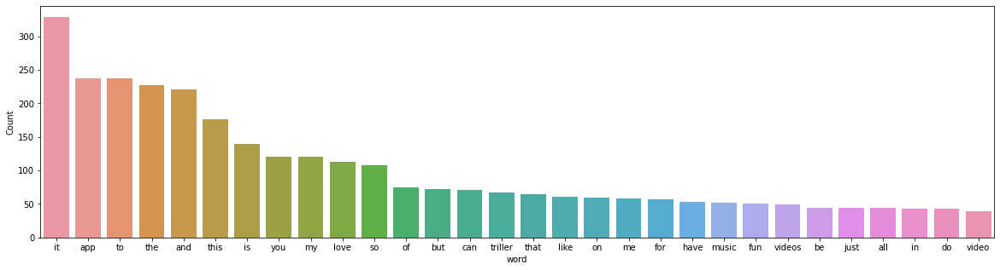

In [247]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us_score5))

In [248]:
# Clean text
review_us_ready_score5 = process_words(review_words_us_score5)  # processed Text Data! - move to each section

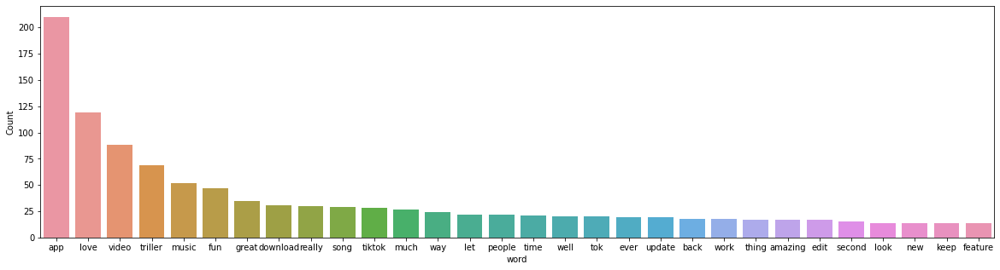

In [249]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_us_ready_score5))


In [250]:
# Create Dictionary
id2word_us_score5 = corpora.Dictionary(review_us_ready_score5)

2021-10-20 16:56:34,874 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-20 16:56:34,879 [INFO] gensim.corpora.dictionary - built Dictionary(850 unique tokens: ['app', 'bore', 'boreddd', 'cringy', 'eyeball']...) from 366 documents (total 2802 corpus positions)
2021-10-20 16:56:34,880 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(850 unique tokens: ['app', 'bore', 'boreddd', 'cringy', 'eyeball']...) from 366 documents (total 2802 corpus positions)", 'datetime': '2021-10-20T16:56:34.880613', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [251]:
# Create Corpus: Term Document Frequency
corpus_us_score5 = [id2word_us_score5.doc2bow(text) for text in review_us_ready_score5]

In [252]:
# Training LDA model
model_list_us_score5, coherence_values_us_score5 = compute_coherence_values(dictionary=id2word_us_score5, corpus=corpus_us_score5, 
                                                              texts=review_us_ready_score5, limit=30, start=2, step=5)


2021-10-20 16:56:34,894 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-20 16:56:34,895 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-20 16:56:34,896 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 16:56:34,897 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 366 documents, updating model once every 366 documents, evaluating perplexity every 366 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-20 16:56:35,184 [INFO] gensim.models.ldamodel - -7.428 per-word bound, 172.2 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:56:35,185 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #366/366
2021-10-20 16:56:35,414 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"love" + 0.035*"app" + 0.027*"video" + 0.020*"music" + 0.017*"triller" + 0.013*"fun" + 0.011*"down

2021-10-20 16:56:37,780 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.083*"app" + 0.036*"love" + 0.022*"triller" + 0.019*"video" + 0.014*"song" + 0.014*"fun" + 0.013*"great" + 0.013*"much" + 0.008*"really" + 0.008*"back"
2021-10-20 16:56:37,780 [INFO] gensim.models.ldamodel - topic diff=0.011087, rho=0.301511
2021-10-20 16:56:37,908 [INFO] gensim.models.ldamodel - -6.218 per-word bound, 74.4 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:56:37,909 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #366/366
2021-10-20 16:56:38,011 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.031*"video" + 0.029*"love" + 0.027*"app" + 0.024*"music" + 0.015*"triller" + 0.013*"tiktok" + 0.013*"fun" + 0.012*"download" + 0.011*"well" + 0.010*"let"
2021-10-20 16:56:38,013 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.083*"app" + 0.036*"love" + 0.022*"triller" + 0.019*"video" + 0.014*"song" + 0.014*"fun" + 0.013*"great" + 0.013*"much

2021-10-20 16:56:40,077 [INFO] gensim.models.ldamodel - topic diff=0.004805, rho=0.218218
2021-10-20 16:56:40,188 [INFO] gensim.models.ldamodel - -6.212 per-word bound, 74.2 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:56:40,189 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #366/366
2021-10-20 16:56:40,290 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.032*"video" + 0.028*"love" + 0.028*"app" + 0.024*"music" + 0.015*"triller" + 0.014*"tiktok" + 0.013*"fun" + 0.012*"well" + 0.012*"download" + 0.010*"let"
2021-10-20 16:56:40,291 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.082*"app" + 0.037*"love" + 0.022*"triller" + 0.018*"video" + 0.014*"song" + 0.013*"great" + 0.013*"fun" + 0.013*"much" + 0.009*"tok" + 0.009*"back"
2021-10-20 16:56:40,292 [INFO] gensim.models.ldamodel - topic diff=0.004507, rho=0.213201
2021-10-20 16:56:40,405 [INFO] gensim.models.ldamodel - -6.212 per-word bound, 74.1 perplexity estimate ba

2021-10-20 16:56:42,143 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #366/366
2021-10-20 16:56:42,218 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.031*"video" + 0.029*"app" + 0.028*"love" + 0.024*"music" + 0.015*"triller" + 0.014*"tiktok" + 0.014*"fun" + 0.012*"well" + 0.011*"download" + 0.010*"let"
2021-10-20 16:56:42,219 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.081*"app" + 0.037*"love" + 0.023*"triller" + 0.019*"video" + 0.015*"song" + 0.013*"great" + 0.013*"much" + 0.013*"fun" + 0.010*"tok" + 0.009*"back"
2021-10-20 16:56:42,219 [INFO] gensim.models.ldamodel - topic diff=0.002724, rho=0.176777
2021-10-20 16:56:42,327 [INFO] gensim.models.ldamodel - -6.209 per-word bound, 74.0 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:56:42,328 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #366/366
2021-10-20 16:56:42,406 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.031*"video" + 0.029*"app

2021-10-20 16:56:44,122 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.081*"app" + 0.037*"love" + 0.023*"triller" + 0.019*"video" + 0.015*"song" + 0.013*"much" + 0.013*"great" + 0.013*"fun" + 0.010*"tok" + 0.009*"back"
2021-10-20 16:56:44,123 [INFO] gensim.models.ldamodel - topic diff=0.002496, rho=0.154303
2021-10-20 16:56:44,243 [INFO] gensim.models.ldamodel - -6.208 per-word bound, 73.9 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:56:44,244 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #366/366
2021-10-20 16:56:44,325 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.031*"video" + 0.030*"app" + 0.028*"love" + 0.024*"music" + 0.015*"triller" + 0.015*"tiktok" + 0.014*"fun" + 0.012*"well" + 0.011*"download" + 0.011*"let"
2021-10-20 16:56:44,326 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.081*"app" + 0.037*"love" + 0.023*"triller" + 0.019*"video" + 0.015*"song" + 0.013*"much" + 0.013*"great" + 0.013*"fun" +

2021-10-20 16:56:47,404 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 317 virtual documents
2021-10-20 16:56:47,513 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.14285714285714285
2021-10-20 16:56:47,514 [INFO] gensim.models.ldamodel - using symmetric eta at 0.14285714285714285
2021-10-20 16:56:47,515 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 16:56:47,517 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 7 topics, 50 passes over the supplied corpus of 366 documents, updating model once every 366 documents, evaluating perplexity every 366 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-20 16:56:47,699 [INFO] gensim.models.ldamodel - -9.499 per-word bound, 723.3 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:56:47,699 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #366/366
2021-10-20 16:56

2021-10-20 16:56:48,850 [INFO] gensim.models.ldamodel - -6.577 per-word bound, 95.4 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:56:48,851 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #366/366
2021-10-20 16:56:48,923 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.026*"tok" + 0.020*"triller" + 0.020*"app" + 0.016*"video" + 0.015*"tell" + 0.012*"tik" + 0.012*"song" + 0.010*"fix" + 0.010*"upload" + 0.010*"awesome"
2021-10-20 16:56:48,924 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.049*"app" + 0.035*"love" + 0.032*"triller" + 0.020*"music" + 0.020*"way" + 0.018*"video" + 0.013*"tiktok" + 0.013*"song" + 0.010*"find" + 0.009*"really"
2021-10-20 16:56:48,925 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.047*"app" + 0.025*"second" + 0.024*"long" + 0.018*"song" + 0.015*"love" + 0.014*"clip" + 0.012*"video" + 0.012*"let" + 0.012*"triller" + 0.011*"work"
2021-10-20 16:56:48,926 [INFO] gensim.models.ldamodel - top

2021-10-20 16:56:49,850 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.042*"app" + 0.028*"long" + 0.028*"second" + 0.018*"song" + 0.015*"clip" + 0.013*"let" + 0.013*"video" + 0.012*"triller" + 0.012*"work" + 0.012*"music"
2021-10-20 16:56:49,850 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.075*"love" + 0.027*"fun" + 0.025*"tiktok" + 0.021*"video" + 0.020*"dance" + 0.018*"music" + 0.017*"triller" + 0.016*"cool" + 0.016*"app" + 0.015*"well"
2021-10-20 16:56:49,851 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.087*"app" + 0.043*"love" + 0.027*"great" + 0.024*"triller" + 0.023*"video" + 0.017*"music" + 0.012*"edit" + 0.011*"back" + 0.010*"people" + 0.009*"download"
2021-10-20 16:56:49,852 [INFO] gensim.models.ldamodel - topic diff=0.009740, rho=0.288675
2021-10-20 16:56:49,956 [INFO] gensim.models.ldamodel - -6.559 per-word bound, 94.3 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:56:49,957 [INFO] gensim.models.ldamodel - PR

2021-10-20 16:56:50,972 [INFO] gensim.models.ldamodel - -6.551 per-word bound, 93.7 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:56:50,973 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #366/366
2021-10-20 16:56:51,062 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.055*"app" + 0.039*"love" + 0.033*"triller" + 0.027*"music" + 0.019*"way" + 0.017*"video" + 0.014*"song" + 0.012*"tiktok" + 0.011*"apple" + 0.010*"find"
2021-10-20 16:56:51,063 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.029*"tok" + 0.020*"app" + 0.020*"triller" + 0.015*"video" + 0.015*"tell" + 0.014*"tik" + 0.012*"song" + 0.010*"fix" + 0.010*"awesome" + 0.009*"upload"
2021-10-20 16:56:51,064 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.040*"app" + 0.029*"long" + 0.028*"second" + 0.019*"song" + 0.015*"clip" + 0.014*"let" + 0.013*"video" + 0.012*"triller" + 0.012*"work" + 0.012*"music"
2021-10-20 16:56:51,065 [INFO] gensim.models.ldamodel - to

2021-10-20 16:56:51,907 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.057*"app" + 0.040*"love" + 0.033*"triller" + 0.029*"music" + 0.019*"way" + 0.017*"video" + 0.015*"song" + 0.013*"apple" + 0.012*"tiktok" + 0.010*"find"
2021-10-20 16:56:51,907 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.031*"tok" + 0.020*"app" + 0.020*"triller" + 0.016*"tik" + 0.015*"tell" + 0.014*"video" + 0.011*"song" + 0.010*"fix" + 0.010*"awesome" + 0.008*"upload"
2021-10-20 16:56:51,908 [INFO] gensim.models.ldamodel - topic diff=0.002939, rho=0.208514
2021-10-20 16:56:52,004 [INFO] gensim.models.ldamodel - -6.546 per-word bound, 93.4 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:56:52,005 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #366/366
2021-10-20 16:56:52,063 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.084*"app" + 0.040*"love" + 0.027*"great" + 0.024*"triller" + 0.024*"video" + 0.013*"edit" + 0.012*"music" + 0.012*"back

2021-10-20 16:56:52,870 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.039*"app" + 0.029*"long" + 0.029*"second" + 0.019*"song" + 0.015*"clip" + 0.015*"let" + 0.013*"video" + 0.012*"work" + 0.012*"triller" + 0.012*"music"
2021-10-20 16:56:52,871 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.058*"app" + 0.041*"love" + 0.033*"triller" + 0.030*"music" + 0.019*"way" + 0.017*"video" + 0.015*"song" + 0.014*"apple" + 0.012*"tiktok" + 0.010*"find"
2021-10-20 16:56:52,872 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.049*"much" + 0.038*"video" + 0.035*"app" + 0.032*"love" + 0.018*"time" + 0.018*"post" + 0.013*"triller" + 0.013*"filter" + 0.012*"fix" + 0.010*"play"
2021-10-20 16:56:52,872 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.033*"tok" + 0.020*"app" + 0.020*"triller" + 0.017*"tik" + 0.015*"tell" + 0.014*"video" + 0.011*"song" + 0.010*"fix" + 0.010*"awesome" + 0.008*"tic"
2021-10-20 16:56:52,873 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.083*"app" + 0.039*"

2021-10-20 16:56:53,715 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.083*"app" + 0.039*"love" + 0.028*"great" + 0.024*"triller" + 0.024*"video" + 0.013*"edit" + 0.012*"back" + 0.012*"music" + 0.010*"people" + 0.010*"fun"
2021-10-20 16:56:53,716 [INFO] gensim.models.ldamodel - topic diff=0.001226, rho=0.171499
2021-10-20 16:56:53,814 [INFO] gensim.models.ldamodel - -6.542 per-word bound, 93.2 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:56:53,815 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #366/366
2021-10-20 16:56:53,874 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.039*"app" + 0.029*"long" + 0.029*"second" + 0.019*"song" + 0.015*"clip" + 0.015*"let" + 0.013*"video" + 0.012*"work" + 0.012*"triller" + 0.012*"music"
2021-10-20 16:56:53,876 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.049*"much" + 0.038*"video" + 0.035*"app" + 0.032*"love" + 0.018*"time" + 0.018*"post" + 0.013*"triller" + 0.013*"filter

2021-10-20 16:56:54,710 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.058*"app" + 0.041*"love" + 0.033*"triller" + 0.031*"music" + 0.019*"way" + 0.017*"video" + 0.016*"song" + 0.014*"apple" + 0.012*"tiktok" + 0.010*"find"
2021-10-20 16:56:54,711 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.083*"app" + 0.039*"love" + 0.028*"great" + 0.024*"triller" + 0.024*"video" + 0.013*"edit" + 0.012*"back" + 0.012*"music" + 0.010*"people" + 0.010*"fun"
2021-10-20 16:56:54,712 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.035*"tok" + 0.020*"app" + 0.020*"triller" + 0.018*"tik" + 0.015*"tell" + 0.014*"video" + 0.011*"song" + 0.010*"fix" + 0.010*"awesome" + 0.008*"tic"
2021-10-20 16:56:54,713 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.081*"love" + 0.028*"dance" + 0.027*"fun" + 0.025*"tiktok" + 0.023*"video" + 0.022*"app" + 0.021*"cool" + 0.019*"triller" + 0.018*"music" + 0.016*"well"
2021-10-20 16:56:54,713 [INFO] gensim.models.ldamodel - topic diff=0.001195, rho=0.158114
20

2021-10-20 16:56:55,516 [INFO] gensim.models.ldamodel - topic diff=0.000798, rho=0.149071
2021-10-20 16:56:55,616 [INFO] gensim.models.ldamodel - -6.541 per-word bound, 93.1 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:56:55,617 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #366/366
2021-10-20 16:56:55,678 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.091*"app" + 0.038*"fun" + 0.037*"video" + 0.033*"download" + 0.024*"love" + 0.020*"music" + 0.015*"amazing" + 0.013*"work" + 0.012*"ever" + 0.011*"feature"
2021-10-20 16:56:55,680 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.058*"app" + 0.042*"love" + 0.033*"triller" + 0.031*"music" + 0.019*"way" + 0.016*"video" + 0.016*"song" + 0.014*"apple" + 0.012*"tiktok" + 0.010*"find"
2021-10-20 16:56:55,680 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.048*"much" + 0.039*"video" + 0.035*"app" + 0.031*"love" + 0.019*"time" + 0.017*"post" + 0.013*"triller" + 0.013*"f

2021-10-20 16:56:56,481 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.038*"app" + 0.029*"long" + 0.029*"second" + 0.019*"song" + 0.015*"let" + 0.015*"clip" + 0.014*"work" + 0.014*"triller" + 0.013*"video" + 0.012*"music"
2021-10-20 16:56:56,482 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.083*"app" + 0.038*"love" + 0.028*"great" + 0.024*"triller" + 0.023*"video" + 0.013*"edit" + 0.012*"back" + 0.012*"music" + 0.010*"people" + 0.010*"fun"
2021-10-20 16:56:56,483 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.037*"tok" + 0.020*"app" + 0.020*"tik" + 0.019*"triller" + 0.015*"tell" + 0.014*"video" + 0.011*"song" + 0.010*"fix" + 0.010*"awesome" + 0.009*"tic"
2021-10-20 16:56:56,484 [INFO] gensim.models.ldamodel - topic diff=0.000623, rho=0.140028
2021-10-20 16:56:56,485 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=850, num_topics=7, decay=0.5, chunksize=1000) in 8.97s', 'datetime': '2021-10-20T16:56:56.485391', 'gensim': '4.1.2', 'pytho

2021-10-20 16:56:59,429 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #366/366
2021-10-20 16:56:59,495 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.052*"app" + 0.037*"second" + 0.029*"song" + 0.028*"work" + 0.023*"long" + 0.022*"really" + 0.017*"ever" + 0.015*"triller" + 0.014*"music" + 0.013*"let"
2021-10-20 16:56:59,496 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.039*"tiktok" + 0.036*"download" + 0.028*"well" + 0.026*"love" + 0.020*"people" + 0.020*"crash" + 0.016*"app" + 0.016*"ban" + 0.015*"keep" + 0.015*"dance"
2021-10-20 16:56:59,497 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.027*"video" + 0.027*"app" + 0.014*"version" + 0.014*"back" + 0.014*"update" + 0.014*"change" + 0.014*"triller" + 0.014*"time" + 0.014*"song" + 0.014*"feature"
2021-10-20 16:56:59,497 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.097*"app" + 0.086*"video" + 0.031*"love" + 0.018*"triller" + 0.015*"update" + 0.014*"fun" + 0.014*"song" + 0.013*"music" + 0.012*"let" 

2021-10-20 16:57:00,380 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.036*"triller" + 0.019*"really" + 0.019*"hope" + 0.018*"tell" + 0.017*"upload" + 0.017*"music" + 0.016*"love" + 0.014*"app" + 0.014*"press" + 0.014*"awesome"
2021-10-20 16:57:00,381 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.100*"app" + 0.089*"video" + 0.031*"love" + 0.018*"triller" + 0.016*"song" + 0.016*"update" + 0.015*"fun" + 0.013*"music" + 0.012*"let" + 0.011*"back"
2021-10-20 16:57:00,382 [INFO] gensim.models.ldamodel - topic diff=0.014227, rho=0.301511
2021-10-20 16:57:00,494 [INFO] gensim.models.ldamodel - -6.722 per-word bound, 105.5 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:00,495 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #366/366
2021-10-20 16:57:00,556 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.074*"app" + 0.042*"love" + 0.031*"great" + 0.022*"triller" + 0.020*"music" + 0.017*"edit" + 0.017*"video" + 0.014*

2021-10-20 16:57:01,350 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #366/366
2021-10-20 16:57:01,414 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.036*"triller" + 0.019*"hope" + 0.019*"tell" + 0.017*"really" + 0.017*"upload" + 0.016*"music" + 0.014*"press" + 0.014*"awesome" + 0.014*"platform" + 0.014*"cool"
2021-10-20 16:57:01,415 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.057*"tiktok" + 0.038*"download" + 0.033*"well" + 0.028*"ban" + 0.024*"crash" + 0.022*"love" + 0.019*"people" + 0.016*"keep" + 0.016*"let" + 0.015*"app"
2021-10-20 16:57:01,416 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.048*"app" + 0.046*"second" + 0.029*"work" + 0.028*"long" + 0.027*"song" + 0.023*"really" + 0.018*"let" + 0.015*"ever" + 0.015*"triller" + 0.015*"music"
2021-10-20 16:57:01,417 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.074*"app" + 0.043*"love" + 0.032*"great" + 0.022*"triller" + 0.020*"music" + 0.017*"edit" + 0.016*"video" + 0.014*"fun" + 0.014*"tok" 

2021-10-20 16:57:02,392 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.028*"video" + 0.027*"app" + 0.014*"update" + 0.014*"back" + 0.014*"version" + 0.014*"change" + 0.014*"triller" + 0.014*"time" + 0.014*"song" + 0.014*"start"
2021-10-20 16:57:02,393 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.092*"app" + 0.053*"fun" + 0.043*"love" + 0.039*"really" + 0.028*"download" + 0.016*"dance" + 0.016*"enjoy" + 0.012*"music" + 0.011*"video" + 0.009*"awesome"
2021-10-20 16:57:02,393 [INFO] gensim.models.ldamodel - topic diff=0.002575, rho=0.213201
2021-10-20 16:57:02,500 [INFO] gensim.models.ldamodel - -6.712 per-word bound, 104.8 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:02,501 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #366/366
2021-10-20 16:57:02,560 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.101*"app" + 0.090*"video" + 0.031*"love" + 0.018*"triller" + 0.017*"song" + 0.016*"update" + 0.015*"fun" +

2021-10-20 16:57:03,343 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #366/366
2021-10-20 16:57:03,401 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.053*"app" + 0.018*"post" + 0.017*"fix" + 0.017*"first" + 0.014*"music" + 0.014*"pause" + 0.014*"public" + 0.014*"friend" + 0.014*"perfect" + 0.011*"great"
2021-10-20 16:57:03,402 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.084*"much" + 0.072*"love" + 0.026*"app" + 0.023*"filter" + 0.018*"change" + 0.017*"way" + 0.016*"triller" + 0.015*"option" + 0.014*"fun" + 0.013*"time"
2021-10-20 16:57:03,403 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.023*"tiktok" + 0.023*"music" + 0.022*"way" + 0.018*"give" + 0.018*"people" + 0.016*"app" + 0.014*"well" + 0.012*"case" + 0.012*"time" + 0.012*"show"
2021-10-20 16:57:03,404 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.100*"app" + 0.090*"video" + 0.031*"love" + 0.018*"triller" + 0.017*"song" + 0.016*"update" + 0.015*"music" + 0.015*"fun" + 0.011*"back" + 0.010*

2021-10-20 16:57:04,249 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.083*"much" + 0.074*"love" + 0.027*"app" + 0.024*"filter" + 0.018*"change" + 0.017*"way" + 0.016*"triller" + 0.015*"option" + 0.014*"fun" + 0.013*"time"
2021-10-20 16:57:04,250 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.023*"music" + 0.023*"tiktok" + 0.022*"way" + 0.018*"give" + 0.018*"people" + 0.016*"app" + 0.014*"well" + 0.012*"case" + 0.012*"time" + 0.012*"show"
2021-10-20 16:57:04,250 [INFO] gensim.models.ldamodel - topic diff=0.002081, rho=0.174078
2021-10-20 16:57:04,351 [INFO] gensim.models.ldamodel - -6.709 per-word bound, 104.6 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:04,352 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #366/366
2021-10-20 16:57:04,421 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.047*"second" + 0.046*"app" + 0.028*"long" + 0.027*"work" + 0.026*"song" + 0.022*"let" + 0.021*"really" + 0.015*"ever" + 

2021-10-20 16:57:05,189 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #366/366
2021-10-20 16:57:05,251 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.046*"triller" + 0.019*"tell" + 0.016*"really" + 0.016*"hope" + 0.014*"upload" + 0.014*"press" + 0.014*"platform" + 0.014*"awesome" + 0.014*"cool" + 0.013*"music"
2021-10-20 16:57:05,253 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.066*"tok" + 0.037*"app" + 0.030*"tik" + 0.021*"life" + 0.021*"never" + 0.019*"time" + 0.015*"fun" + 0.014*"favorite" + 0.014*"recommend" + 0.014*"delete"
2021-10-20 16:57:05,253 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.083*"much" + 0.074*"love" + 0.028*"app" + 0.025*"filter" + 0.018*"change" + 0.017*"way" + 0.016*"triller" + 0.015*"option" + 0.014*"fun" + 0.013*"time"
2021-10-20 16:57:05,255 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.029*"video" + 0.027*"app" + 0.015*"update" + 0.015*"back" + 0.015*"time" + 0.015*"version" + 0.015*"song" + 0.015*"start" + 0.014*

2021-10-20 16:57:06,098 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.077*"app" + 0.043*"love" + 0.035*"great" + 0.022*"triller" + 0.021*"music" + 0.017*"edit" + 0.016*"video" + 0.014*"fun" + 0.013*"people" + 0.011*"tok"
2021-10-20 16:57:06,099 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.023*"music" + 0.022*"way" + 0.019*"tiktok" + 0.018*"people" + 0.018*"give" + 0.016*"app" + 0.014*"well" + 0.012*"show" + 0.012*"time" + 0.012*"case"
2021-10-20 16:57:06,099 [INFO] gensim.models.ldamodel - topic diff=0.001616, rho=0.150756
2021-10-20 16:57:06,207 [INFO] gensim.models.ldamodel - -6.704 per-word bound, 104.3 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:06,208 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #366/366
2021-10-20 16:57:06,269 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.077*"app" + 0.043*"love" + 0.035*"great" + 0.022*"triller" + 0.021*"music" + 0.017*"edit" + 0.016*"video" + 0.014*"fun" +

2021-10-20 16:57:07,049 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #366/366
2021-10-20 16:57:07,110 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.076*"tok" + 0.041*"tik" + 0.037*"app" + 0.021*"life" + 0.021*"never" + 0.018*"time" + 0.015*"fun" + 0.014*"favorite" + 0.014*"recommend" + 0.013*"delete"
2021-10-20 16:57:07,111 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.084*"much" + 0.074*"love" + 0.028*"app" + 0.025*"filter" + 0.018*"change" + 0.017*"way" + 0.015*"triller" + 0.015*"option" + 0.014*"fun" + 0.013*"time"
2021-10-20 16:57:07,113 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.049*"second" + 0.042*"app" + 0.029*"long" + 0.026*"song" + 0.025*"work" + 0.022*"let" + 0.015*"music" + 0.015*"triller" + 0.015*"upload" + 0.014*"ever"
2021-10-20 16:57:07,113 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.062*"tiktok" + 0.038*"download" + 0.034*"well" + 0.029*"ban" + 0.024*"crash" + 0.022*"love" + 0.019*"people" + 0.016*"keep" + 0.016*"let" + 0

2021-10-20 16:57:10,052 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.078*"app" + 0.020*"delete" + 0.018*"perfect" + 0.015*"ever" + 0.015*"way" + 0.014*"play" + 0.014*"music" + 0.014*"fix" + 0.014*"pause" + 0.012*"friend"
2021-10-20 16:57:10,052 [INFO] gensim.models.ldamodel - topic diff=0.077300, rho=0.500000
2021-10-20 16:57:10,153 [INFO] gensim.models.ldamodel - -6.916 per-word bound, 120.8 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:10,154 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #366/366
2021-10-20 16:57:10,209 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.066*"love" + 0.026*"keep" + 0.026*"dance" + 0.025*"app" + 0.024*"fun" + 0.021*"crash" + 0.020*"time" + 0.019*"music" + 0.016*"public" + 0.016*"people"
2021-10-20 16:57:10,210 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.074*"love" + 0.069*"app" + 0.040*"much" + 0.027*"song" + 0.019*"triller" + 0.019*"video" + 0.015*"choose" + 0.010*"work

2021-10-20 16:57:11,040 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.069*"app" + 0.044*"triller" + 0.024*"love" + 0.018*"feature" + 0.018*"thing" + 0.018*"really" + 0.018*"cool" + 0.015*"way" + 0.015*"fun" + 0.015*"awesome"
2021-10-20 16:57:11,041 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.059*"music" + 0.034*"back" + 0.034*"video" + 0.033*"update" + 0.026*"version" + 0.026*"new" + 0.018*"love" + 0.017*"original" + 0.017*"reason" + 0.010*"triller"
2021-10-20 16:57:11,041 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.051*"download" + 0.027*"song" + 0.026*"love" + 0.017*"let" + 0.017*"add" + 0.017*"app" + 0.017*"video" + 0.017*"part" + 0.017*"special" + 0.017*"thing"
2021-10-20 16:57:11,042 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.072*"app" + 0.020*"delete" + 0.020*"perfect" + 0.015*"way" + 0.015*"play" + 0.015*"music" + 0.015*"fix" + 0.015*"pause" + 0.015*"friend" + 0.015*"start"
2021-10-20 16:57:11,043 [INFO] gensim.models.ldamodel - topic diff=0.021

2021-10-20 16:57:11,867 [INFO] gensim.models.ldamodel - topic diff=0.007923, rho=0.258199
2021-10-20 16:57:11,966 [INFO] gensim.models.ldamodel - -6.832 per-word bound, 113.9 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:11,967 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #366/366
2021-10-20 16:57:12,030 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.032*"tell" + 0.031*"song" + 0.026*"way" + 0.020*"video" + 0.020*"triller" + 0.016*"love" + 0.013*"fix" + 0.013*"first" + 0.013*"create" + 0.013*"time"
2021-10-20 16:57:12,031 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.047*"app" + 0.036*"video" + 0.018*"download" + 0.018*"way" + 0.018*"great" + 0.018*"tok" + 0.018*"well" + 0.018*"enjoy" + 0.017*"love" + 0.015*"second"
2021-10-20 16:57:12,032 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.070*"app" + 0.020*"delete" + 0.020*"perfect" + 0.015*"way" + 0.015*"play" + 0.015*"music" + 0.015*"fix" + 0.015*"paus

2021-10-20 16:57:12,863 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.046*"video" + 0.032*"really" + 0.027*"love" + 0.026*"fun" + 0.019*"watermark" + 0.019*"far" + 0.014*"app" + 0.013*"great" + 0.013*"character" + 0.013*"account"
2021-10-20 16:57:12,865 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.032*"tell" + 0.029*"song" + 0.026*"way" + 0.020*"video" + 0.020*"triller" + 0.016*"love" + 0.013*"fix" + 0.013*"time" + 0.013*"first" + 0.013*"create"
2021-10-20 16:57:12,866 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.051*"download" + 0.026*"love" + 0.026*"song" + 0.018*"app" + 0.017*"let" + 0.017*"add" + 0.017*"video" + 0.017*"part" + 0.017*"thing" + 0.017*"special"
2021-10-20 16:57:12,866 [INFO] gensim.models.ldamodel - topic diff=0.003267, rho=0.218218
2021-10-20 16:57:12,989 [INFO] gensim.models.ldamodel - -6.828 per-word bound, 113.6 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:12,990 [INFO] gensim.models.ldamode

2021-10-20 16:57:13,696 [INFO] gensim.models.ldamodel - topic diff=0.001495, rho=0.196116
2021-10-20 16:57:13,786 [INFO] gensim.models.ldamodel - -6.825 per-word bound, 113.4 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:13,786 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #366/366
2021-10-20 16:57:13,841 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.115*"app" + 0.105*"video" + 0.047*"love" + 0.016*"fun" + 0.015*"back" + 0.014*"update" + 0.013*"dance" + 0.012*"triller" + 0.012*"freeze" + 0.012*"people"
2021-10-20 16:57:13,842 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.029*"music" + 0.028*"change" + 0.027*"second" + 0.022*"filter" + 0.022*"option" + 0.022*"length" + 0.018*"love" + 0.018*"keep" + 0.017*"app" + 0.017*"time"
2021-10-20 16:57:13,843 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.032*"tell" + 0.026*"way" + 0.023*"song" + 0.020*"video" + 0.020*"triller" + 0.017*"love" + 0.013*"fix" + 0.013

2021-10-20 16:57:14,639 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.041*"app" + 0.021*"triller" + 0.021*"video" + 0.021*"music" + 0.014*"love" + 0.014*"give" + 0.014*"look" + 0.014*"operate" + 0.014*"help" + 0.014*"keep"
2021-10-20 16:57:14,640 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.068*"love" + 0.030*"keep" + 0.026*"dance" + 0.026*"crash" + 0.025*"fun" + 0.024*"app" + 0.021*"time" + 0.021*"post" + 0.019*"music" + 0.019*"let"
2021-10-20 16:57:14,641 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.070*"app" + 0.020*"delete" + 0.020*"perfect" + 0.015*"way" + 0.015*"play" + 0.015*"music" + 0.015*"fix" + 0.015*"pause" + 0.015*"friend" + 0.015*"start"
2021-10-20 16:57:14,641 [INFO] gensim.models.ldamodel - topic diff=0.000733, rho=0.176777
2021-10-20 16:57:14,730 [INFO] gensim.models.ldamodel - -6.825 per-word bound, 113.4 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:14,730 [INFO] gensim.models.ldamodel - PROGRESS:

2021-10-20 16:57:15,411 [INFO] gensim.models.ldamodel - topic diff=0.000709, rho=0.164399
2021-10-20 16:57:15,499 [INFO] gensim.models.ldamodel - -6.824 per-word bound, 113.3 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:15,500 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #366/366
2021-10-20 16:57:15,554 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.083*"love" + 0.073*"app" + 0.044*"song" + 0.044*"much" + 0.018*"triller" + 0.018*"video" + 0.016*"choose" + 0.011*"amazing" + 0.009*"help" + 0.009*"cause"
2021-10-20 16:57:15,555 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.066*"app" + 0.027*"work" + 0.020*"fun" + 0.019*"time" + 0.016*"really" + 0.012*"much" + 0.012*"phone" + 0.012*"find" + 0.012*"content" + 0.011*"new"
2021-10-20 16:57:15,556 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.114*"app" + 0.105*"video" + 0.046*"love" + 0.016*"fun" + 0.015*"back" + 0.014*"update" + 0.013*"dance" + 0.012*"trill

2021-10-20 16:57:16,318 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.070*"app" + 0.020*"delete" + 0.020*"perfect" + 0.015*"way" + 0.015*"play" + 0.015*"music" + 0.015*"fix" + 0.015*"pause" + 0.015*"start" + 0.015*"friend"
2021-10-20 16:57:16,319 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.036*"second" + 0.036*"never" + 0.024*"change" + 0.024*"click" + 0.024*"let" + 0.024*"app" + 0.012*"give" + 0.012*"lock" + 0.012*"timer" + 0.012*"time"
2021-10-20 16:57:16,320 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.089*"app" + 0.032*"great" + 0.028*"love" + 0.026*"triller" + 0.022*"tok" + 0.015*"fun" + 0.015*"feel" + 0.011*"video" + 0.011*"filter" + 0.009*"look"
2021-10-20 16:57:16,321 [INFO] gensim.models.ldamodel - topic diff=0.000391, rho=0.152499
2021-10-20 16:57:16,413 [INFO] gensim.models.ldamodel - -6.824 per-word bound, 113.3 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:16,414 [INFO] gensim.models.ldamodel - PROGRE

2021-10-20 16:57:17,079 [INFO] gensim.models.ldamodel - topic diff=0.000330, rho=0.144338
2021-10-20 16:57:17,171 [INFO] gensim.models.ldamodel - -6.823 per-word bound, 113.2 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:17,172 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #366/366
2021-10-20 16:57:17,235 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.051*"download" + 0.028*"love" + 0.026*"song" + 0.018*"app" + 0.017*"let" + 0.017*"add" + 0.017*"video" + 0.017*"part" + 0.017*"thing" + 0.017*"special"
2021-10-20 16:57:17,236 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.075*"app" + 0.060*"love" + 0.036*"music" + 0.036*"tiktok" + 0.035*"fun" + 0.026*"video" + 0.024*"triller" + 0.023*"great" + 0.020*"well" + 0.018*"download"
2021-10-20 16:57:17,237 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.069*"love" + 0.030*"keep" + 0.026*"dance" + 0.026*"crash" + 0.025*"fun" + 0.024*"app" + 0.021*"time" + 0.021*"p

2021-10-20 16:57:20,221 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.058*"music" + 0.054*"app" + 0.030*"triller" + 0.027*"well" + 0.023*"apple" + 0.018*"song" + 0.018*"ever" + 0.018*"people" + 0.013*"video" + 0.012*"recommend"
2021-10-20 16:57:20,222 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.064*"app" + 0.049*"love" + 0.045*"download" + 0.029*"video" + 0.028*"crash" + 0.018*"post" + 0.018*"keep" + 0.016*"freeze" + 0.012*"phone" + 0.012*"update"
2021-10-20 16:57:20,223 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.058*"app" + 0.024*"kick" + 0.024*"whenever" + 0.016*"love" + 0.016*"world" + 0.015*"mix" + 0.015*"thriller" + 0.015*"similar" + 0.015*"add" + 0.015*"pro"
2021-10-20 16:57:20,223 [INFO] gensim.models.ldamodel - topic diff=0.137115, rho=0.577350
2021-10-20 16:57:20,324 [INFO] gensim.models.ldamodel - -7.068 per-word bound, 134.2 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:20,324 [INFO] gensim.models.lda

2021-10-20 16:57:21,224 [INFO] gensim.models.ldamodel - topic diff=0.049094, rho=0.353553
2021-10-20 16:57:21,327 [INFO] gensim.models.ldamodel - -6.904 per-word bound, 119.8 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:21,327 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #366/366
2021-10-20 16:57:21,392 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.047*"song" + 0.041*"back" + 0.028*"video" + 0.022*"app" + 0.020*"give" + 0.020*"way" + 0.020*"never" + 0.020*"change" + 0.019*"save" + 0.017*"old"
2021-10-20 16:57:21,393 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.072*"app" + 0.049*"download" + 0.047*"love" + 0.030*"video" + 0.028*"crash" + 0.022*"freeze" + 0.020*"keep" + 0.017*"post" + 0.016*"phone" + 0.016*"dancing"
2021-10-20 16:57:21,394 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.066*"app" + 0.044*"ever" + 0.040*"love" + 0.036*"work" + 0.030*"triller" + 0.023*"video" + 0.023*"clip" + 0.015*"keep

2021-10-20 16:57:22,248 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.123*"tok" + 0.078*"tik" + 0.036*"time" + 0.027*"delete" + 0.027*"well" + 0.020*"app" + 0.018*"tic" + 0.017*"case" + 0.009*"crash" + 0.009*"hacker"
2021-10-20 16:57:22,249 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.102*"music" + 0.073*"app" + 0.048*"great" + 0.047*"video" + 0.044*"love" + 0.036*"triller" + 0.020*"song" + 0.020*"add" + 0.020*"able" + 0.017*"filter"
2021-10-20 16:57:22,250 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.117*"app" + 0.111*"love" + 0.106*"much" + 0.037*"fun" + 0.031*"update" + 0.029*"amazing" + 0.027*"new" + 0.023*"download" + 0.022*"triller" + 0.016*"tok"
2021-10-20 16:57:22,251 [INFO] gensim.models.ldamodel - topic diff=0.013992, rho=0.267261
2021-10-20 16:57:22,357 [INFO] gensim.models.ldamodel - -6.875 per-word bound, 117.4 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:22,358 [INFO] gensim.models.ldamodel - PROGR

2021-10-20 16:57:23,143 [INFO] gensim.models.ldamodel - topic diff=0.006550, rho=0.229416
2021-10-20 16:57:23,243 [INFO] gensim.models.ldamodel - -6.868 per-word bound, 116.8 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:23,244 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #366/366
2021-10-20 16:57:23,303 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.051*"app" + 0.051*"video" + 0.027*"love" + 0.026*"popular" + 0.019*"music" + 0.013*"frustrate" + 0.013*"tiktok" + 0.013*"people" + 0.013*"confuse" + 0.013*"cent"
2021-10-20 16:57:23,304 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.052*"song" + 0.044*"back" + 0.032*"video" + 0.020*"way" + 0.020*"give" + 0.020*"never" + 0.020*"change" + 0.020*"save" + 0.019*"edit" + 0.019*"app"
2021-10-20 16:57:23,305 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.072*"app" + 0.027*"edit" + 0.019*"great" + 0.018*"star" + 0.018*"hate" + 0.017*"love" + 0.014*"triller" + 0.0

2021-10-20 16:57:24,129 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.077*"app" + 0.048*"love" + 0.048*"download" + 0.034*"video" + 0.028*"crash" + 0.022*"freeze" + 0.022*"keep" + 0.017*"post" + 0.017*"phone" + 0.017*"dancing"
2021-10-20 16:57:24,130 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.071*"music" + 0.057*"app" + 0.036*"apple" + 0.027*"triller" + 0.027*"well" + 0.018*"ever" + 0.018*"song" + 0.018*"people" + 0.018*"recommend" + 0.018*"favorite"
2021-10-20 16:57:24,132 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.106*"music" + 0.072*"app" + 0.055*"great" + 0.048*"video" + 0.042*"love" + 0.037*"triller" + 0.020*"add" + 0.020*"song" + 0.020*"able" + 0.016*"filter"
2021-10-20 16:57:24,133 [INFO] gensim.models.ldamodel - topic diff=0.003757, rho=0.200000
2021-10-20 16:57:24,228 [INFO] gensim.models.ldamodel - -6.862 per-word bound, 116.3 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:24,229 [INFO] gensim.models.l

2021-10-20 16:57:25,113 [INFO] gensim.models.ldamodel - topic diff=0.002375, rho=0.182574
2021-10-20 16:57:25,206 [INFO] gensim.models.ldamodel - -6.855 per-word bound, 115.7 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:25,207 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #366/366
2021-10-20 16:57:25,271 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.034*"app" + 0.029*"start" + 0.022*"public" + 0.022*"fix" + 0.022*"pause" + 0.022*"friend" + 0.017*"video" + 0.014*"update" + 0.014*"version" + 0.014*"new"
2021-10-20 16:57:25,272 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.109*"music" + 0.070*"app" + 0.055*"great" + 0.049*"video" + 0.040*"love" + 0.037*"triller" + 0.020*"add" + 0.020*"song" + 0.020*"able" + 0.016*"filter"
2021-10-20 16:57:25,273 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.018*"day" + 0.018*"bae" + 0.018*"today" + 0.018*"toda" + 0.018*"excited" + 0.018*"address" + 0.018*"first" + 0.01

2021-10-20 16:57:26,065 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.138*"love" + 0.036*"triller" + 0.035*"app" + 0.021*"star" + 0.021*"shuffle" + 0.021*"first" + 0.021*"reason" + 0.021*"edit" + 0.019*"time" + 0.014*"omg"
2021-10-20 16:57:26,066 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.110*"music" + 0.069*"app" + 0.056*"great" + 0.050*"video" + 0.039*"love" + 0.037*"triller" + 0.020*"add" + 0.020*"song" + 0.020*"able" + 0.016*"filter"
2021-10-20 16:57:26,066 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.044*"video" + 0.032*"app" + 0.031*"triller" + 0.018*"far" + 0.013*"watermark" + 0.013*"assault" + 0.013*"kavanaugh" + 0.013*"sexual" + 0.013*"thing" + 0.011*"love"
2021-10-20 16:57:26,067 [INFO] gensim.models.ldamodel - topic diff=0.001822, rho=0.166667
2021-10-20 16:57:26,155 [INFO] gensim.models.ldamodel - -6.849 per-word bound, 115.3 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:26,156 [INFO] gensim.models.l

2021-10-20 16:57:26,830 [INFO] gensim.models.ldamodel - topic diff=0.001392, rho=0.156174
2021-10-20 16:57:26,921 [INFO] gensim.models.ldamodel - -6.847 per-word bound, 115.1 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:26,922 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #366/366
2021-10-20 16:57:26,979 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.051*"song" + 0.043*"back" + 0.032*"video" + 0.025*"never" + 0.024*"enjoy" + 0.020*"app" + 0.019*"way" + 0.019*"give" + 0.019*"change" + 0.019*"save"
2021-10-20 16:57:26,980 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.148*"tok" + 0.102*"tik" + 0.034*"time" + 0.026*"delete" + 0.026*"well" + 0.019*"app" + 0.017*"tic" + 0.017*"case" + 0.009*"crash" + 0.009*"uniqueness"
2021-10-20 16:57:26,981 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.110*"music" + 0.069*"app" + 0.056*"great" + 0.050*"video" + 0.039*"love" + 0.037*"triller" + 0.020*"add" + 0.020*"song

2021-10-20 16:57:27,781 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.057*"app" + 0.048*"triller" + 0.023*"love" + 0.023*"feature" + 0.019*"awesome" + 0.019*"cool" + 0.016*"second" + 0.016*"feel" + 0.013*"record" + 0.013*"way"
2021-10-20 16:57:27,782 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.072*"app" + 0.027*"edit" + 0.019*"great" + 0.018*"star" + 0.018*"hate" + 0.017*"love" + 0.014*"triller" + 0.014*"let" + 0.014*"give" + 0.014*"perfect"
2021-10-20 16:57:27,783 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.029*"robux" + 0.029*"full" + 0.017*"back" + 0.015*"app" + 0.015*"thing" + 0.015*"private" + 0.015*"tic" + 0.015*"texte" + 0.015*"quality" + 0.015*"upset"
2021-10-20 16:57:27,784 [INFO] gensim.models.ldamodel - topic diff=0.001259, rho=0.145865
2021-10-20 16:57:27,887 [INFO] gensim.models.ldamodel - -6.845 per-word bound, 114.9 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:27,888 [INFO] gensim.models.ldamodel

2021-10-20 16:57:31,195 [INFO] gensim.models.ldamodel - -23.482 per-word bound, 11713053.5 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:31,196 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #366/366
2021-10-20 16:57:31,300 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.099*"app" + 0.043*"love" + 0.023*"ever" + 0.022*"phone" + 0.022*"really" + 0.013*"support" + 0.011*"install" + 0.011*"tok" + 0.011*"however" + 0.011*"world"
2021-10-20 16:57:31,301 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.052*"video" + 0.042*"app" + 0.031*"save" + 0.031*"love" + 0.021*"sprite" + 0.021*"light" + 0.021*"account" + 0.021*"facebook" + 0.021*"triller" + 0.021*"press"
2021-10-20 16:57:31,302 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.031*"edit" + 0.022*"sick" + 0.022*"life" + 0.021*"tired" + 0.016*"verison" + 0.016*"actually" + 0.016*"click" + 0.016*"amazing" + 0.016*"feel" + 0.016*"believe"
2021-10-20 16:57:31,303 [I

2021-10-20 16:57:32,126 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.029*"sick" + 0.029*"life" + 0.029*"tired" + 0.024*"clip" + 0.018*"edit" + 0.015*"actually" + 0.015*"click" + 0.015*"verison" + 0.015*"feel" + 0.015*"randomize"
2021-10-20 16:57:32,127 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.044*"app" + 0.026*"tiktok" + 0.026*"filter" + 0.026*"change" + 0.025*"never" + 0.019*"keep" + 0.019*"tok" + 0.019*"triller" + 0.018*"really" + 0.013*"give"
2021-10-20 16:57:32,128 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.099*"app" + 0.038*"love" + 0.037*"fun" + 0.025*"video" + 0.020*"look" + 0.020*"song" + 0.020*"really" + 0.020*"great" + 0.019*"download" + 0.018*"much"
2021-10-20 16:57:32,129 [INFO] gensim.models.ldamodel - topic diff=0.057255, rho=0.377964
2021-10-20 16:57:32,233 [INFO] gensim.models.ldamodel - -7.035 per-word bound, 131.1 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:32,234 [INFO] gensim.models.l

2021-10-20 16:57:32,958 [INFO] gensim.models.ldamodel - topic diff=0.022428, rho=0.288675
2021-10-20 16:57:33,051 [INFO] gensim.models.ldamodel - -6.995 per-word bound, 127.6 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:33,052 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #366/366
2021-10-20 16:57:33,111 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.209*"love" + 0.144*"app" + 0.091*"fun" + 0.088*"much" + 0.049*"really" + 0.030*"download" + 0.025*"triller" + 0.019*"ever" + 0.019*"time" + 0.016*"pretty"
2021-10-20 16:57:33,112 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.064*"app" + 0.032*"find" + 0.022*"library" + 0.011*"music" + 0.011*"partner" + 0.011*"multiple" + 0.011*"support" + 0.011*"light" + 0.011*"flaw" + 0.011*"poorly"
2021-10-20 16:57:33,113 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.029*"sick" + 0.029*"life" + 0.029*"tired" + 0.028*"clip" + 0.016*"edit" + 0.015*"click" + 0.015*"actua

2021-10-20 16:57:33,858 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.034*"hope" + 0.025*"triller" + 0.023*"tell" + 0.023*"tic" + 0.023*"upload" + 0.023*"post" + 0.013*"much" + 0.013*"love" + 0.012*"madison" + 0.012*"tok"
2021-10-20 16:57:33,859 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.070*"song" + 0.052*"app" + 0.045*"work" + 0.041*"thing" + 0.038*"triller" + 0.028*"ever" + 0.028*"back" + 0.025*"music" + 0.021*"old" + 0.021*"little"
2021-10-20 16:57:33,860 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.031*"app" + 0.030*"love" + 0.020*"triller" + 0.020*"song" + 0.020*"second" + 0.020*"long" + 0.020*"yea" + 0.012*"update" + 0.012*"ever" + 0.010*"video"
2021-10-20 16:57:33,861 [INFO] gensim.models.ldamodel - topic diff=0.007710, rho=0.235702
2021-10-20 16:57:33,950 [INFO] gensim.models.ldamodel - -6.979 per-word bound, 126.1 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:33,951 [INFO] gensim.models.ldamodel - PROGR

2021-10-20 16:57:34,634 [INFO] gensim.models.ldamodel - topic diff=0.003844, rho=0.208514
2021-10-20 16:57:34,740 [INFO] gensim.models.ldamodel - -6.973 per-word bound, 125.6 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:34,741 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #366/366
2021-10-20 16:57:34,806 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.049*"love" + 0.043*"app" + 0.037*"triller" + 0.026*"music" + 0.026*"hate" + 0.016*"help" + 0.016*"star" + 0.011*"update" + 0.011*"let" + 0.011*"great"
2021-10-20 16:57:34,807 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.104*"app" + 0.061*"love" + 0.037*"people" + 0.033*"dance" + 0.030*"triller" + 0.030*"video" + 0.028*"fun" + 0.023*"great" + 0.022*"find" + 0.021*"music"
2021-10-20 16:57:34,809 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.036*"new" + 0.030*"video" + 0.030*"update" + 0.028*"triller" + 0.020*"hate" + 0.019*"way" + 0.011*"great" + 0.010*"

2021-10-20 16:57:35,691 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.082*"app" + 0.033*"love" + 0.028*"video" + 0.027*"well" + 0.027*"tiktok" + 0.025*"look" + 0.022*"song" + 0.022*"great" + 0.017*"music" + 0.015*"fun"
2021-10-20 16:57:35,692 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.049*"love" + 0.043*"app" + 0.037*"triller" + 0.026*"music" + 0.026*"hate" + 0.016*"help" + 0.016*"star" + 0.011*"update" + 0.011*"let" + 0.011*"great"
2021-10-20 16:57:35,693 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.086*"app" + 0.059*"edit" + 0.043*"great" + 0.042*"video" + 0.021*"amazing" + 0.019*"triller" + 0.015*"music" + 0.015*"tiktok" + 0.013*"love" + 0.011*"way"
2021-10-20 16:57:35,693 [INFO] gensim.models.ldamodel - topic diff=0.002595, rho=0.185695
2021-10-20 16:57:35,790 [INFO] gensim.models.ldamodel - -6.972 per-word bound, 125.5 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:35,790 [INFO] gensim.models.ldamodel - PROGR

2021-10-20 16:57:36,481 [INFO] gensim.models.ldamodel - topic diff=0.002809, rho=0.171499
2021-10-20 16:57:36,636 [INFO] gensim.models.ldamodel - -6.969 per-word bound, 125.3 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:36,637 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #366/366
2021-10-20 16:57:36,751 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.102*"video" + 0.097*"app" + 0.026*"love" + 0.023*"time" + 0.021*"freeze" + 0.017*"download" + 0.017*"play" + 0.017*"post" + 0.017*"glitch" + 0.014*"fun"
2021-10-20 16:57:36,752 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.055*"video" + 0.035*"app" + 0.033*"save" + 0.023*"love" + 0.022*"character" + 0.022*"account" + 0.022*"sprite" + 0.022*"light" + 0.022*"triller" + 0.022*"press"
2021-10-20 16:57:36,754 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.046*"apple" + 0.046*"music" + 0.031*"app" + 0.031*"crash" + 0.031*"time" + 0.016*"currently" + 0.016*"pho

2021-10-20 16:57:37,574 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.031*"app" + 0.030*"love" + 0.020*"triller" + 0.020*"song" + 0.020*"second" + 0.020*"long" + 0.020*"yea" + 0.012*"update" + 0.012*"ever" + 0.010*"video"
2021-10-20 16:57:37,575 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.032*"tiktok" + 0.028*"app" + 0.027*"filter" + 0.027*"change" + 0.027*"never" + 0.021*"keep" + 0.016*"triller" + 0.015*"really" + 0.014*"eyebrow" + 0.014*"give"
2021-10-20 16:57:37,576 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.081*"app" + 0.032*"love" + 0.029*"tiktok" + 0.028*"video" + 0.028*"well" + 0.027*"look" + 0.022*"song" + 0.022*"great" + 0.017*"music" + 0.015*"download"
2021-10-20 16:57:37,577 [INFO] gensim.models.ldamodel - topic diff=0.002010, rho=0.158114
2021-10-20 16:57:37,670 [INFO] gensim.models.ldamodel - -6.961 per-word bound, 124.6 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:37,671 [INFO] gensim.models.ldam

2021-10-20 16:57:38,356 [INFO] gensim.models.ldamodel - topic diff=0.001699, rho=0.149071
2021-10-20 16:57:38,444 [INFO] gensim.models.ldamodel - -6.955 per-word bound, 124.1 perplexity estimate based on a held-out corpus of 366 documents with 2802 words
2021-10-20 16:57:38,445 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #366/366
2021-10-20 16:57:38,504 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.035*"hope" + 0.025*"triller" + 0.023*"tell" + 0.023*"tic" + 0.023*"upload" + 0.023*"post" + 0.013*"much" + 0.013*"love" + 0.012*"sorry" + 0.012*"sister"
2021-10-20 16:57:38,506 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.054*"well" + 0.033*"music" + 0.024*"app" + 0.022*"back" + 0.022*"original" + 0.022*"version" + 0.022*"update" + 0.022*"way" + 0.022*"far" + 0.022*"reason"
2021-10-20 16:57:38,507 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.031*"app" + 0.030*"love" + 0.020*"triller" + 0.020*"song" + 0.020*"second" + 0.020*"long" + 0.020*"yea" + 0.012*

2021-10-20 16:57:39,251 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.030*"sick" + 0.030*"life" + 0.030*"tired" + 0.030*"clip" + 0.016*"edit" + 0.015*"okay" + 0.015*"trim" + 0.015*"button" + 0.015*"click" + 0.015*"video"
2021-10-20 16:57:39,252 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.031*"app" + 0.030*"pause" + 0.030*"fix" + 0.030*"friend" + 0.020*"tiktok" + 0.020*"start" + 0.020*"music" + 0.020*"play" + 0.010*"love" + 0.010*"leave"
2021-10-20 16:57:39,253 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.056*"well" + 0.034*"music" + 0.024*"app" + 0.022*"back" + 0.022*"original" + 0.022*"way" + 0.022*"version" + 0.022*"update" + 0.022*"far" + 0.022*"reason"
2021-10-20 16:57:39,254 [INFO] gensim.models.ldamodel - topic diff=0.002530, rho=0.140028
2021-10-20 16:57:39,255 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=850, num_topics=27, decay=0.5, chunksize=1000) in 8.20s', 'datetime': '2021-10-20T16:57:39.255611', 'gensim': '4.1

In [253]:
%store model_list_us_score5
%store coherence_values_us_score5

Stored 'model_list_us_score5' (list)
Stored 'coherence_values_us_score5' (list)


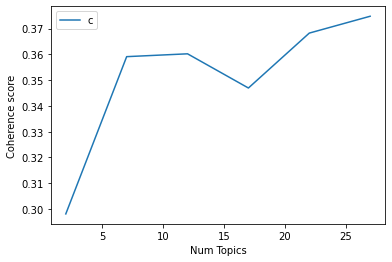

In [254]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us_score5)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [255]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us_score5):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 27

index: 0 | Num Topics = 2  has Coherence Value of 0.2981
index: 1 | Num Topics = 7  has Coherence Value of 0.3591
index: 2 | Num Topics = 12  has Coherence Value of 0.3602
index: 3 | Num Topics = 17  has Coherence Value of 0.347
index: 4 | Num Topics = 22  has Coherence Value of 0.3683
index: 5 | Num Topics = 27  has Coherence Value of 0.3748


In [337]:
# Select optimal number of topics
optimal_model_us_score5 = model_list_us_score5[5]

In [338]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us_score5 = pyLDAvis.gensim_models.prepare(optimal_model_us_score5, corpus_us_score5, id2word_us_score5)

In [339]:
print("pyLDAVis for us topics for score=5:")
vis_us_score5

pyLDAVis for us topics for score=5:


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
13     0.171003 -0.040824       1        1  7.975888
15     0.083079 -0.053044       2        1  7.428172
21     0.277653 -0.089327       3        1  7.243765
16    -0.025927  0.157869       4        1  7.018115
8      0.110271  0.066245       5        1  6.715398
9      0.067229 -0.047561       6        1  5.553556
24     0.102307  0.044078       7        1  5.356326
3      0.066442  0.057397       8        1  5.293775
20     0.098464  0.087195       9        1  4.660737
23    -0.030369 -0.111252      10        1  4.129153
26     0.003704  0.132579      11        1  4.052955
2     -0.075586 -0.033585      12        1  3.501497
4     -0.008652  0.051024      13        1  2.869352
22    -0.071401  0.016855      14        1  2.703665
0     -0.056571 -0.009698      15        1  2.701843
19    -0.068816 -0.088830      16        1  2.679445
5     -0.033128 -0.074832      17        1  2.376137
17    -0.082099  0.046555      18        1  2.331825
12    -0.000295  0.019466      19        1  2.310318
1     -0.016438  0.012246      20        1  2.255323
11    -0.095040  0.078685      21        1  2.218431
6     -0.088581 -0.082614      22        1  2.161389
7      0.051213 -0.024850      23        1  2.033432
10    -0.108962 -0.047687      24        1  1.542714
25    -0.079518 -0.050156      25        1  1.476997
18    -0.066043 -0.005771      26        1  0.711404
14    -0.123940 -0.010163      27        1  0.698387, topic_info=          Term        Freq       Total Category  logprob  loglift
40        love   95.000000   95.000000  Default  30.0000  30.0000
0          app  166.000000  166.000000  Default  29.0000  29.0000
53       video   69.000000   69.000000  Default  28.0000  28.0000
5          fun   38.000000   38.000000  Default  27.0000  27.0000
134        tok   15.000000   15.000000  Default  26.0000  26.0000
..         ...         ...         ...      ...      ...      ...
13   recommend    0.017061    5.258613  Topic27  -7.0449  -0.7667
14       never    0.017061    4.524807  Topic27  -7.0449  -0.6164
15      become    0.017061    3.831182  Topic27  -7.0449  -0.4500
16        ever    0.017061   15.225203  Topic27  -7.0449  -1.8298
17    favorite    0.017061    6.330328  Topic27  -7.0449  -0.9522

[1298 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
70        4  0.183021    able
70        9  0.549063    able
70       13  0.183021    able
572      15  0.700168     acc
240      18  0.695175  access
...     ...       ...     ...
682       2  0.432678    year
682      16  0.432678    year
543      11  0.872900     yet
161      18  0.695175    zoom
479      22  0.701127    łove

[1520 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[14, 16, 22, 17, 9, 10, 25, 4, 21, 24, 27, 3, 5, 23, 1, 20, 6, 18, 13, 2, 12, 7, 8, 11, 26, 19, 15])

## LDA Topic Modelling (Rating = 1,2,3)

In [259]:
# By-rating Topic Modelling - rating = 1,2,3
# Convert to list - move to each section
review_us_score1N2N3 = triller_ios_us_review_YearMonth_score1N2N3.review.values.tolist()
review_words_us_score1N2N3 = list(sent_to_words(review_us_score1N2N3))
print(review_words_us_score1N2N3[:1])

[['love', 'the', 'app', 'but', 'the', 'screen', 'is', 'off', 'for', 'the', 'iphone', 'the', 'top', 'is', 'cut', 'off', 'and', 'can', 'set', 'my', 'profile', 'picture']]


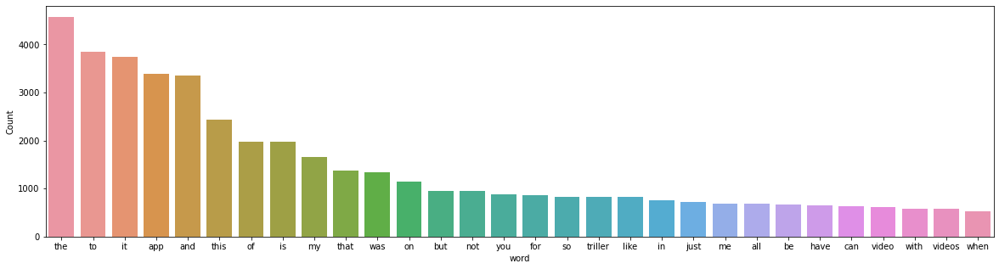

In [260]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us_score1N2N3))

In [261]:
# Clean text
review_us_ready_score1N2N3 = process_words(review_words_us_score1N2N3)  # processed Text Data! - move to each section

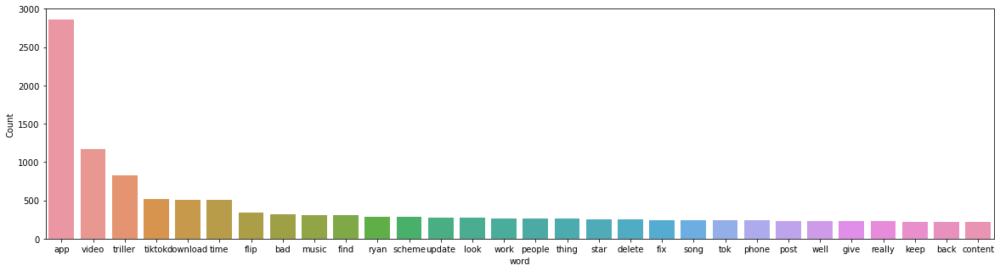

In [262]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_us_ready_score1N2N3))


In [263]:
# Create Dictionary
id2word_us_score1N2N3 = corpora.Dictionary(review_us_ready_score1N2N3)

2021-10-20 16:57:55,121 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-20 16:57:55,195 [INFO] gensim.corpora.dictionary - built Dictionary(4024 unique tokens: ['app', 'cut', 'iphone', 'love', 'picture']...) from 2510 documents (total 44628 corpus positions)
2021-10-20 16:57:55,196 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(4024 unique tokens: ['app', 'cut', 'iphone', 'love', 'picture']...) from 2510 documents (total 44628 corpus positions)", 'datetime': '2021-10-20T16:57:55.196465', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [264]:
# Create Corpus: Term Document Frequency
corpus_us_score1N2N3 = [id2word_us_score1N2N3.doc2bow(text) for text in review_us_ready_score1N2N3]

In [265]:
# Training LDA model
model_list_us_score1N2N3, coherence_values_us_score1N2N3 = compute_coherence_values(dictionary=id2word_us_score1N2N3, corpus=corpus_us_score1N2N3, 
                                                              texts=review_us_ready_score1N2N3, limit=30, start=2, step=5)


2021-10-20 16:57:55,246 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-20 16:57:55,247 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-20 16:57:55,250 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 16:57:55,252 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 2510 documents, updating model once every 1000 documents, evaluating perplexity every 2510 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-20 16:57:55,252 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #1000/2510
2021-10-20 16:57:55,900 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:57:55,903 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.042*"video" + 0.042*"app" + 0.017*"time" + 0.017*"fix" + 0.014*"triller" + 0.012*"work" + 0.011*"keep" + 0.010*"second" + 0.008*"crash" + 0

2021-10-20 16:57:59,593 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.058*"app" + 0.017*"triller" + 0.016*"flip" + 0.016*"tiktok" + 0.012*"download" + 0.011*"ryan" + 0.010*"scheme" + 0.010*"bad" + 0.009*"find" + 0.009*"star"
2021-10-20 16:57:59,594 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.058*"app" + 0.043*"video" + 0.018*"triller" + 0.017*"time" + 0.014*"music" + 0.011*"song" + 0.011*"update" + 0.011*"fix" + 0.010*"phone" + 0.010*"delete"
2021-10-20 16:57:59,595 [INFO] gensim.models.ldamodel - topic diff=0.270122, rho=0.391931
2021-10-20 16:57:59,596 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #2000/2510
2021-10-20 16:57:59,875 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:57:59,877 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.061*"app" + 0.016*"tiktok" + 0.016*"triller" + 0.013*"flip" + 0.013*"download" + 0.011*"scheme" + 0.011*"ryan" + 0.010*"bad" + 0.009*"find" + 0.008*"star

2021-10-20 16:58:02,519 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.062*"app" + 0.016*"triller" + 0.016*"tiktok" + 0.013*"flip" + 0.013*"download" + 0.011*"ryan" + 0.011*"scheme" + 0.011*"bad" + 0.010*"find" + 0.009*"star"
2021-10-20 16:58:02,520 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.056*"app" + 0.046*"video" + 0.018*"time" + 0.017*"triller" + 0.012*"music" + 0.012*"update" + 0.010*"fix" + 0.010*"work" + 0.010*"song" + 0.010*"phone"
2021-10-20 16:58:02,521 [INFO] gensim.models.ldamodel - topic diff=0.265518, rho=0.324272
2021-10-20 16:58:02,730 [INFO] gensim.models.ldamodel - -6.756 per-word bound, 108.1 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 16:58:02,730 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #2510/2510
2021-10-20 16:58:02,866 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 16:58:02,868 [INFO] gensim.models.ldamodel - topic #0 (

2021-10-20 16:58:05,400 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 16:58:05,401 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.062*"app" + 0.017*"triller" + 0.016*"flip" + 0.015*"tiktok" + 0.013*"download" + 0.011*"ryan" + 0.011*"scheme" + 0.011*"bad" + 0.010*"find" + 0.009*"star"
2021-10-20 16:58:05,402 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.056*"app" + 0.048*"video" + 0.018*"time" + 0.016*"triller" + 0.011*"music" + 0.010*"phone" + 0.010*"update" + 0.010*"work" + 0.009*"post" + 0.009*"delete"
2021-10-20 16:58:05,403 [INFO] gensim.models.ldamodel - topic diff=0.233886, rho=0.282730
2021-10-20 16:58:05,404 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #1000/2510
2021-10-20 16:58:05,620 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:58:05,621 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.061*"app" + 0.017*"triller" +

2021-10-20 16:58:08,047 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:58:08,050 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.061*"app" + 0.017*"triller" + 0.016*"tiktok" + 0.015*"flip" + 0.012*"download" + 0.011*"ryan" + 0.011*"bad" + 0.010*"scheme" + 0.010*"find" + 0.009*"star"
2021-10-20 16:58:08,052 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.056*"app" + 0.047*"video" + 0.019*"time" + 0.018*"triller" + 0.014*"music" + 0.011*"update" + 0.011*"song" + 0.011*"fix" + 0.010*"phone" + 0.010*"work"
2021-10-20 16:58:08,054 [INFO] gensim.models.ldamodel - topic diff=0.149415, rho=0.246108
2021-10-20 16:58:08,055 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #2000/2510
2021-10-20 16:58:08,332 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:58:08,334 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.062*"app" + 0.016*"triller" + 0

2021-10-20 16:58:10,947 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:58:10,949 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.062*"app" + 0.016*"triller" + 0.016*"tiktok" + 0.014*"flip" + 0.013*"download" + 0.011*"ryan" + 0.011*"scheme" + 0.011*"bad" + 0.010*"find" + 0.009*"star"
2021-10-20 16:58:10,950 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.055*"app" + 0.048*"video" + 0.018*"time" + 0.017*"triller" + 0.013*"music" + 0.012*"update" + 0.010*"fix" + 0.010*"work" + 0.010*"phone" + 0.010*"song"
2021-10-20 16:58:10,951 [INFO] gensim.models.ldamodel - topic diff=0.172500, rho=0.226397
2021-10-20 16:58:11,154 [INFO] gensim.models.ldamodel - -6.735 per-word bound, 106.5 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 16:58:11,155 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #2510/2510
2021-10-20 16:58:11,299 [INFO] gensim.models.ldamodel - merging 

2021-10-20 16:58:13,676 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #2510/2510
2021-10-20 16:58:13,810 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 16:58:13,812 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.062*"app" + 0.017*"triller" + 0.016*"flip" + 0.015*"tiktok" + 0.013*"download" + 0.011*"ryan" + 0.011*"scheme" + 0.011*"bad" + 0.010*"find" + 0.009*"star"
2021-10-20 16:58:13,813 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.056*"app" + 0.049*"video" + 0.018*"time" + 0.017*"triller" + 0.012*"music" + 0.010*"update" + 0.010*"phone" + 0.010*"work" + 0.010*"fix" + 0.009*"delete"
2021-10-20 16:58:13,813 [INFO] gensim.models.ldamodel - topic diff=0.167653, rho=0.210772
2021-10-20 16:58:13,814 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #1000/2510
2021-10-20 16:58:14,037 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-

2021-10-20 16:58:16,366 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #1000/2510
2021-10-20 16:58:16,604 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:58:16,605 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.061*"app" + 0.017*"triller" + 0.015*"tiktok" + 0.015*"flip" + 0.012*"download" + 0.011*"ryan" + 0.011*"bad" + 0.011*"scheme" + 0.010*"find" + 0.010*"star"
2021-10-20 16:58:16,606 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.056*"app" + 0.048*"video" + 0.018*"time" + 0.017*"triller" + 0.014*"music" + 0.011*"update" + 0.011*"fix" + 0.011*"song" + 0.010*"phone" + 0.010*"work"
2021-10-20 16:58:16,606 [INFO] gensim.models.ldamodel - topic diff=0.114843, rho=0.194221
2021-10-20 16:58:16,607 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #2000/2510
2021-10-20 16:58:16,881 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-2

2021-10-20 16:58:18,984 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #2000/2510
2021-10-20 16:58:19,228 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:58:19,229 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.062*"app" + 0.017*"triller" + 0.016*"tiktok" + 0.014*"flip" + 0.013*"download" + 0.011*"ryan" + 0.011*"scheme" + 0.011*"bad" + 0.010*"find" + 0.009*"star"
2021-10-20 16:58:19,230 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.055*"app" + 0.048*"video" + 0.018*"time" + 0.017*"triller" + 0.013*"music" + 0.012*"update" + 0.010*"fix" + 0.010*"work" + 0.010*"song" + 0.010*"phone"
2021-10-20 16:58:19,231 [INFO] gensim.models.ldamodel - topic diff=0.136243, rho=0.184084
2021-10-20 16:58:19,429 [INFO] gensim.models.ldamodel - -6.726 per-word bound, 105.9 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 16:58:19,430 [INFO] gensim.models.ldamodel - PROGRESS

2021-10-20 16:58:21,768 [INFO] gensim.models.ldamodel - -6.725 per-word bound, 105.8 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 16:58:21,769 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #2510/2510
2021-10-20 16:58:21,897 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 16:58:21,899 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.062*"app" + 0.017*"triller" + 0.016*"flip" + 0.015*"tiktok" + 0.013*"download" + 0.011*"ryan" + 0.011*"scheme" + 0.011*"bad" + 0.010*"find" + 0.009*"star"
2021-10-20 16:58:21,900 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.056*"app" + 0.048*"video" + 0.018*"time" + 0.017*"triller" + 0.012*"music" + 0.011*"update" + 0.010*"phone" + 0.010*"work" + 0.010*"fix" + 0.009*"delete"
2021-10-20 16:58:21,901 [INFO] gensim.models.ldamodel - topic diff=0.137103, rho=0.175385
2021-10-20 16:58:21,902 [INFO] gensim.models.ldamodel - PROGRES

2021-10-20 16:58:24,259 [INFO] gensim.models.ldamodel - topic diff=0.130731, rho=0.167813
2021-10-20 16:58:24,259 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1000/2510
2021-10-20 16:58:24,456 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:58:24,457 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.061*"app" + 0.017*"triller" + 0.015*"tiktok" + 0.015*"flip" + 0.013*"download" + 0.011*"ryan" + 0.011*"bad" + 0.011*"scheme" + 0.010*"find" + 0.010*"star"
2021-10-20 16:58:24,458 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.056*"app" + 0.048*"video" + 0.018*"time" + 0.017*"triller" + 0.014*"music" + 0.011*"update" + 0.011*"fix" + 0.011*"song" + 0.010*"phone" + 0.010*"work"
2021-10-20 16:58:24,458 [INFO] gensim.models.ldamodel - topic diff=0.096486, rho=0.165499
2021-10-20 16:58:24,459 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #2000/2510
2021-10-20 16:58:24,698 [INFO] gensim.mode

2021-10-20 16:58:26,764 [INFO] gensim.models.ldamodel - topic diff=0.092450, rho=0.159091
2021-10-20 16:58:26,765 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #2000/2510
2021-10-20 16:58:27,023 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:58:27,025 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.062*"app" + 0.017*"triller" + 0.016*"tiktok" + 0.014*"flip" + 0.013*"download" + 0.011*"ryan" + 0.011*"scheme" + 0.011*"bad" + 0.010*"find" + 0.009*"star"
2021-10-20 16:58:27,026 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.055*"app" + 0.048*"video" + 0.018*"time" + 0.017*"triller" + 0.013*"music" + 0.011*"update" + 0.010*"fix" + 0.010*"work" + 0.010*"song" + 0.010*"phone"
2021-10-20 16:58:27,026 [INFO] gensim.models.ldamodel - topic diff=0.115925, rho=0.159091
2021-10-20 16:58:27,216 [INFO] gensim.models.ldamodel - -6.722 per-word bound, 105.6 perplexity estimate based on a held-out corpus of 510 d

2021-10-20 16:58:29,377 [INFO] gensim.models.ldamodel - topic diff=0.111381, rho=0.153375
2021-10-20 16:58:29,560 [INFO] gensim.models.ldamodel - -6.721 per-word bound, 105.5 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 16:58:29,561 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #2510/2510
2021-10-20 16:58:29,686 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 16:58:29,688 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.062*"app" + 0.017*"triller" + 0.016*"flip" + 0.015*"tiktok" + 0.013*"download" + 0.011*"ryan" + 0.011*"scheme" + 0.011*"bad" + 0.010*"find" + 0.009*"star"
2021-10-20 16:58:29,689 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.056*"app" + 0.048*"video" + 0.018*"time" + 0.017*"triller" + 0.012*"music" + 0.011*"update" + 0.010*"phone" + 0.010*"work" + 0.010*"fix" + 0.009*"delete"
2021-10-20 16:58:29,689 [INFO] gensim.models.ldamodel - topic d

2021-10-20 16:58:32,042 [INFO] gensim.models.ldamodel - topic diff=0.114483, rho=0.148234
2021-10-20 16:58:32,043 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #1000/2510
2021-10-20 16:58:32,247 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:58:32,249 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.061*"app" + 0.017*"triller" + 0.015*"flip" + 0.015*"tiktok" + 0.013*"download" + 0.011*"ryan" + 0.011*"bad" + 0.011*"scheme" + 0.010*"find" + 0.010*"star"
2021-10-20 16:58:32,250 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.056*"app" + 0.048*"video" + 0.018*"time" + 0.017*"triller" + 0.013*"music" + 0.011*"update" + 0.011*"fix" + 0.011*"song" + 0.010*"phone" + 0.010*"work"
2021-10-20 16:58:32,250 [INFO] gensim.models.ldamodel - topic diff=0.084664, rho=0.146631
2021-10-20 16:58:32,251 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #2000/2510
2021-10-20 16:58:32,490 [INFO] gensim.mode

2021-10-20 16:58:34,531 [INFO] gensim.models.ldamodel - topic diff=0.081865, rho=0.142119
2021-10-20 16:58:34,532 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #2000/2510
2021-10-20 16:58:34,770 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:58:34,771 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.062*"app" + 0.017*"triller" + 0.015*"tiktok" + 0.014*"flip" + 0.013*"download" + 0.011*"ryan" + 0.011*"bad" + 0.011*"scheme" + 0.010*"find" + 0.010*"star"
2021-10-20 16:58:34,772 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.055*"app" + 0.048*"video" + 0.018*"time" + 0.017*"triller" + 0.013*"music" + 0.011*"update" + 0.010*"fix" + 0.010*"work" + 0.010*"song" + 0.010*"phone"
2021-10-20 16:58:34,773 [INFO] gensim.models.ldamodel - topic diff=0.102530, rho=0.142119
2021-10-20 16:58:34,957 [INFO] gensim.models.ldamodel - -6.719 per-word bound, 105.3 perplexity estimate based on a held-out corpus of 510 d

2021-10-20 16:58:37,079 [INFO] gensim.models.ldamodel - topic diff=0.099324, rho=0.138000
2021-10-20 16:58:37,274 [INFO] gensim.models.ldamodel - -6.718 per-word bound, 105.3 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 16:58:37,275 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #2510/2510
2021-10-20 16:58:37,406 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 16:58:37,408 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.062*"app" + 0.017*"triller" + 0.016*"flip" + 0.015*"tiktok" + 0.013*"download" + 0.011*"ryan" + 0.011*"bad" + 0.011*"scheme" + 0.010*"find" + 0.010*"star"
2021-10-20 16:58:37,409 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.056*"app" + 0.048*"video" + 0.018*"time" + 0.017*"triller" + 0.012*"music" + 0.011*"update" + 0.010*"phone" + 0.010*"fix" + 0.010*"work" + 0.009*"delete"
2021-10-20 16:58:37,410 [INFO] gensim.models.ldamodel - topic d

2021-10-20 16:58:41,395 [INFO] gensim.models.ldamodel - topic diff=0.532131, rho=0.470882
2021-10-20 16:58:41,396 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #2000/2510
2021-10-20 16:58:41,733 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:58:41,737 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.087*"app" + 0.020*"download" + 0.019*"tiktok" + 0.017*"video" + 0.015*"triller" + 0.010*"platform" + 0.010*"content" + 0.009*"decide" + 0.008*"awful" + 0.008*"star"
2021-10-20 16:58:41,738 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.050*"app" + 0.048*"video" + 0.024*"time" + 0.023*"triller" + 0.019*"music" + 0.018*"post" + 0.016*"save" + 0.014*"update" + 0.013*"company" + 0.012*"keep"
2021-10-20 16:58:41,739 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.047*"app" + 0.044*"flip" + 0.020*"triller" + 0.016*"ryan" + 0.016*"time" + 0.016*"thing" + 0.015*"look" + 0.015*"scheme" + 0.014*"star" + 0.01

2021-10-20 16:58:43,514 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.083*"app" + 0.019*"download" + 0.018*"tiktok" + 0.013*"triller" + 0.013*"video" + 0.011*"platform" + 0.010*"decide" + 0.009*"find" + 0.009*"content" + 0.008*"medium"
2021-10-20 16:58:43,515 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.058*"video" + 0.057*"app" + 0.026*"time" + 0.024*"music" + 0.022*"triller" + 0.017*"fix" + 0.017*"song" + 0.017*"save" + 0.014*"update" + 0.014*"crash"
2021-10-20 16:58:43,516 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.051*"flip" + 0.046*"app" + 0.023*"triller" + 0.021*"ryan" + 0.020*"thing" + 0.018*"scheme" + 0.017*"kavanaugh" + 0.016*"star" + 0.016*"look" + 0.015*"accuse"
2021-10-20 16:58:43,516 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.068*"app" + 0.020*"phone" + 0.018*"triller" + 0.018*"download" + 0.013*"work" + 0.012*"account" + 0.009*"time" + 0.009*"delete" + 0.008*"email" + 0.008*"video"
2021-10-20 16:58:43,517 [INFO] gensim.models.ldamodel - topi

2021-10-20 16:58:45,195 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.053*"flip" + 0.045*"app" + 0.028*"triller" + 0.027*"ryan" + 0.024*"scheme" + 0.022*"kavanaugh" + 0.021*"thing" + 0.020*"accuse" + 0.019*"partner" + 0.018*"star"
2021-10-20 16:58:45,195 [INFO] gensim.models.ldamodel - topic diff=0.241058, rho=0.364905
2021-10-20 16:58:45,196 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #1000/2510
2021-10-20 16:58:45,446 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:58:45,449 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.061*"video" + 0.060*"app" + 0.025*"time" + 0.023*"music" + 0.021*"triller" + 0.018*"fix" + 0.017*"song" + 0.015*"save" + 0.014*"crash" + 0.014*"keep"
2021-10-20 16:58:45,450 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.073*"app" + 0.030*"tiktok" + 0.022*"bad" + 0.018*"content" + 0.015*"people" + 0.014*"find" + 0.012*"terrible" + 0.012*"download" + 0.010*"business" + 0

2021-10-20 16:58:46,924 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.084*"app" + 0.020*"download" + 0.020*"tiktok" + 0.017*"find" + 0.013*"platform" + 0.012*"medium" + 0.011*"video" + 0.011*"decide" + 0.011*"triller" + 0.010*"content"
2021-10-20 16:58:46,925 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.062*"app" + 0.061*"video" + 0.025*"time" + 0.020*"triller" + 0.017*"music" + 0.015*"fix" + 0.014*"company" + 0.014*"post" + 0.013*"crash" + 0.013*"delete"
2021-10-20 16:58:46,926 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.076*"app" + 0.033*"tiktok" + 0.023*"bad" + 0.021*"content" + 0.015*"people" + 0.015*"find" + 0.013*"terrible" + 0.012*"download" + 0.012*"business" + 0.011*"feel"
2021-10-20 16:58:46,927 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.059*"app" + 0.020*"download" + 0.019*"phone" + 0.014*"triller" + 0.012*"life" + 0.011*"account" + 0.010*"work" + 0.010*"time" + 0.008*"feel" + 0.008*"love"
2021-10-20 16:58:46,928 [INFO] gensim.models.ldamodel - 

2021-10-20 16:58:48,216 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.077*"app" + 0.035*"tiktok" + 0.023*"bad" + 0.020*"content" + 0.016*"people" + 0.013*"terrible" + 0.013*"find" + 0.012*"download" + 0.011*"business" + 0.011*"feel"
2021-10-20 16:58:48,217 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.048*"tok" + 0.048*"app" + 0.037*"tik" + 0.022*"video" + 0.016*"slow" + 0.014*"give" + 0.012*"well" + 0.012*"people" + 0.011*"follow" + 0.011*"time"
2021-10-20 16:58:48,218 [INFO] gensim.models.ldamodel - topic diff=0.138328, rho=0.294756
2021-10-20 16:58:48,446 [INFO] gensim.models.ldamodel - -6.927 per-word bound, 121.6 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 16:58:48,447 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #2510/2510
2021-10-20 16:58:48,572 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 16:58:48,575 [INFO] gensim.models.ldamodel - topic 

2021-10-20 16:58:49,718 [INFO] gensim.models.ldamodel - topic diff=0.178898, rho=0.272065
2021-10-20 16:58:49,719 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #2000/2510
2021-10-20 16:58:50,005 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:58:50,008 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.084*"app" + 0.022*"tiktok" + 0.021*"download" + 0.019*"find" + 0.013*"medium" + 0.013*"platform" + 0.012*"social" + 0.011*"video" + 0.010*"triller" + 0.010*"content"
2021-10-20 16:58:50,009 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.050*"tok" + 0.048*"app" + 0.037*"tik" + 0.021*"video" + 0.016*"slow" + 0.014*"give" + 0.012*"well" + 0.012*"people" + 0.012*"follow" + 0.011*"time"
2021-10-20 16:58:50,010 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.078*"app" + 0.037*"tiktok" + 0.024*"bad" + 0.021*"content" + 0.016*"people" + 0.013*"terrible" + 0.012*"download" + 0.012*"find" + 0.011*"feel" + 0

2021-10-20 16:58:51,508 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.047*"app" + 0.046*"tok" + 0.034*"tik" + 0.021*"video" + 0.019*"slow" + 0.015*"follow" + 0.013*"give" + 0.013*"well" + 0.012*"people" + 0.012*"time"
2021-10-20 16:58:51,509 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.048*"flip" + 0.043*"app" + 0.032*"ryan" + 0.031*"triller" + 0.031*"scheme" + 0.024*"kavanaugh" + 0.024*"accuse" + 0.022*"partner" + 0.021*"thing" + 0.017*"ex"
2021-10-20 16:58:51,510 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.035*"new" + 0.032*"update" + 0.028*"back" + 0.027*"filter" + 0.027*"old" + 0.025*"find" + 0.023*"triller" + 0.016*"version" + 0.013*"well" + 0.010*"way"
2021-10-20 16:58:51,510 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.064*"app" + 0.063*"video" + 0.025*"time" + 0.022*"music" + 0.022*"triller" + 0.017*"song" + 0.017*"fix" + 0.014*"save" + 0.014*"crash" + 0.014*"delete"
2021-10-20 16:58:51,511 [INFO] gensim.models.ldamodel - topic diff=0.164612, rho=0.2

2021-10-20 16:58:53,077 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.033*"new" + 0.029*"filter" + 0.026*"back" + 0.025*"update" + 0.025*"find" + 0.024*"old" + 0.024*"triller" + 0.013*"version" + 0.013*"well" + 0.011*"heart"
2021-10-20 16:58:53,077 [INFO] gensim.models.ldamodel - topic diff=0.137588, rho=0.246108
2021-10-20 16:58:53,078 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1000/2510
2021-10-20 16:58:53,287 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:58:53,290 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.035*"new" + 0.033*"update" + 0.028*"back" + 0.028*"filter" + 0.027*"old" + 0.024*"find" + 0.023*"triller" + 0.016*"version" + 0.013*"well" + 0.010*"change"
2021-10-20 16:58:53,291 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.047*"app" + 0.047*"tok" + 0.034*"tik" + 0.021*"video" + 0.020*"slow" + 0.014*"follow" + 0.013*"give" + 0.013*"well" + 0.012*"people" + 0.012*"time"
20

2021-10-20 16:58:54,722 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.033*"new" + 0.030*"filter" + 0.026*"back" + 0.026*"update" + 0.025*"old" + 0.024*"triller" + 0.023*"find" + 0.013*"version" + 0.013*"well" + 0.011*"heart"
2021-10-20 16:58:54,723 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.047*"app" + 0.019*"download" + 0.019*"phone" + 0.013*"account" + 0.013*"life" + 0.012*"triller" + 0.011*"email" + 0.009*"time" + 0.009*"love" + 0.009*"feel"
2021-10-20 16:58:54,724 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.084*"app" + 0.023*"find" + 0.021*"download" + 0.020*"tiktok" + 0.013*"platform" + 0.013*"medium" + 0.012*"video" + 0.012*"social" + 0.010*"triller" + 0.010*"content"
2021-10-20 16:58:54,725 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.081*"app" + 0.041*"tiktok" + 0.025*"bad" + 0.022*"content" + 0.016*"people" + 0.014*"terrible" + 0.013*"download" + 0.012*"find" + 0.012*"quality" + 0.012*"business"
2021-10-20 16:58:54,726 [INFO] gensim.models.ldamode

2021-10-20 16:58:56,048 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.043*"app" + 0.043*"flip" + 0.035*"ryan" + 0.035*"scheme" + 0.032*"triller" + 0.026*"kavanaugh" + 0.025*"accuse" + 0.024*"partner" + 0.020*"thing" + 0.017*"ex"
2021-10-20 16:58:56,049 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.064*"app" + 0.063*"video" + 0.025*"time" + 0.022*"triller" + 0.020*"music" + 0.016*"fix" + 0.016*"song" + 0.014*"delete" + 0.014*"crash" + 0.014*"save"
2021-10-20 16:58:56,050 [INFO] gensim.models.ldamodel - topic diff=0.090654, rho=0.220809
2021-10-20 16:58:56,261 [INFO] gensim.models.ldamodel - -6.894 per-word bound, 118.9 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 16:58:56,262 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #2510/2510
2021-10-20 16:58:56,404 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 16:58:56,407 [INFO] gensim.models.ldamodel - topic

2021-10-20 16:58:57,452 [INFO] gensim.models.ldamodel - topic diff=0.132104, rho=0.210772
2021-10-20 16:58:57,452 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #2000/2510
2021-10-20 16:58:57,680 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:58:57,683 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.082*"app" + 0.043*"tiktok" + 0.025*"bad" + 0.021*"content" + 0.016*"people" + 0.014*"terrible" + 0.013*"download" + 0.012*"quality" + 0.012*"feel" + 0.011*"find"
2021-10-20 16:58:57,684 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.051*"tok" + 0.048*"app" + 0.037*"tik" + 0.021*"video" + 0.017*"slow" + 0.014*"time" + 0.014*"give" + 0.013*"well" + 0.012*"people" + 0.011*"follow"
2021-10-20 16:58:57,685 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.045*"app" + 0.019*"phone" + 0.019*"download" + 0.016*"account" + 0.015*"email" + 0.012*"life" + 0.011*"triller" + 0.009*"love" + 0.009*"feel" + 0.009*"

2021-10-20 16:58:58,920 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.064*"app" + 0.062*"video" + 0.025*"time" + 0.022*"triller" + 0.021*"music" + 0.017*"song" + 0.017*"fix" + 0.015*"delete" + 0.014*"save" + 0.014*"crash"
2021-10-20 16:58:58,921 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.037*"new" + 0.033*"update" + 0.029*"back" + 0.028*"old" + 0.028*"filter" + 0.024*"triller" + 0.021*"find" + 0.016*"version" + 0.013*"well" + 0.010*"change"
2021-10-20 16:58:58,922 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.083*"app" + 0.023*"find" + 0.021*"download" + 0.019*"tiktok" + 0.013*"social" + 0.013*"video" + 0.013*"platform" + 0.012*"medium" + 0.010*"triller" + 0.009*"content"
2021-10-20 16:58:58,923 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.043*"app" + 0.018*"phone" + 0.017*"download" + 0.017*"email" + 0.016*"account" + 0.011*"life" + 0.011*"triller" + 0.009*"love" + 0.009*"work" + 0.008*"feel"
2021-10-20 16:58:58,924 [INFO] gensim.models.ldamodel - topic dif

2021-10-20 16:59:00,274 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.034*"new" + 0.030*"filter" + 0.028*"update" + 0.027*"back" + 0.026*"old" + 0.024*"triller" + 0.021*"find" + 0.013*"version" + 0.012*"well" + 0.011*"heart"
2021-10-20 16:59:00,275 [INFO] gensim.models.ldamodel - topic diff=0.108104, rho=0.197991
2021-10-20 16:59:00,276 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #1000/2510
2021-10-20 16:59:00,490 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:59:00,493 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.042*"app" + 0.018*"phone" + 0.017*"email" + 0.017*"download" + 0.017*"account" + 0.011*"life" + 0.011*"triller" + 0.009*"love" + 0.009*"feel" + 0.008*"work"
2021-10-20 16:59:00,494 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.064*"app" + 0.062*"video" + 0.025*"time" + 0.022*"triller" + 0.021*"music" + 0.017*"song" + 0.017*"fix" + 0.015*"delete" + 0.014*"save" + 0.014*"cras

2021-10-20 16:59:01,826 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 16:59:01,829 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.052*"tok" + 0.048*"app" + 0.037*"tik" + 0.021*"video" + 0.016*"time" + 0.016*"slow" + 0.013*"give" + 0.013*"well" + 0.012*"people" + 0.011*"money"
2021-10-20 16:59:01,830 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.042*"app" + 0.018*"download" + 0.018*"phone" + 0.015*"account" + 0.013*"life" + 0.012*"email" + 0.010*"triller" + 0.009*"feel" + 0.009*"love" + 0.009*"still"
2021-10-20 16:59:01,831 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.083*"app" + 0.044*"tiktok" + 0.025*"bad" + 0.022*"content" + 0.016*"people" + 0.013*"terrible" + 0.013*"download" + 0.012*"quality" + 0.012*"feel" + 0.012*"business"
2021-10-20 16:59:01,832 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.034*"new" + 0.030*"filter" + 0.028*"update" + 0.028*"back" + 0.026*"old" + 0.024*"triller" + 0.020*"fin

2021-10-20 16:59:02,990 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.084*"app" + 0.025*"find" + 0.021*"download" + 0.019*"tiktok" + 0.013*"social" + 0.013*"medium" + 0.013*"platform" + 0.013*"video" + 0.010*"triller" + 0.010*"content"
2021-10-20 16:59:02,991 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.064*"app" + 0.063*"video" + 0.025*"time" + 0.022*"triller" + 0.020*"music" + 0.016*"fix" + 0.015*"song" + 0.015*"delete" + 0.014*"crash" + 0.014*"save"
2021-10-20 16:59:02,991 [INFO] gensim.models.ldamodel - topic diff=0.072515, rho=0.184084
2021-10-20 16:59:03,167 [INFO] gensim.models.ldamodel - -6.880 per-word bound, 117.8 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 16:59:03,168 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #2510/2510
2021-10-20 16:59:03,284 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 16:59:03,287 [INFO] gensim.models.ldamodel 

2021-10-20 16:59:04,281 [INFO] gensim.models.ldamodel - topic diff=0.109230, rho=0.178146
2021-10-20 16:59:04,281 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #2000/2510
2021-10-20 16:59:04,526 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:59:04,529 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.041*"app" + 0.018*"phone" + 0.018*"download" + 0.018*"account" + 0.015*"email" + 0.012*"life" + 0.010*"triller" + 0.009*"love" + 0.009*"feel" + 0.008*"still"
2021-10-20 16:59:04,530 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.051*"tok" + 0.048*"app" + 0.036*"tik" + 0.020*"video" + 0.017*"slow" + 0.016*"time" + 0.013*"give" + 0.013*"well" + 0.012*"people" + 0.011*"follow"
2021-10-20 16:59:04,532 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.044*"flip" + 0.043*"app" + 0.036*"ryan" + 0.035*"scheme" + 0.032*"triller" + 0.026*"kavanaugh" + 0.025*"accuse" + 0.024*"partner" + 0.020*"thing" + 0.017*"

2021-10-20 16:59:05,837 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.048*"tok" + 0.047*"app" + 0.034*"tik" + 0.020*"video" + 0.019*"slow" + 0.017*"time" + 0.013*"follow" + 0.013*"give" + 0.013*"well" + 0.012*"people"
2021-10-20 16:59:05,838 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.039*"app" + 0.018*"account" + 0.018*"phone" + 0.017*"email" + 0.017*"download" + 0.012*"life" + 0.010*"triller" + 0.009*"love" + 0.009*"feel" + 0.009*"still"
2021-10-20 16:59:05,839 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.083*"app" + 0.025*"find" + 0.021*"download" + 0.018*"tiktok" + 0.013*"video" + 0.013*"social" + 0.013*"platform" + 0.012*"medium" + 0.010*"triller" + 0.009*"content"
2021-10-20 16:59:05,840 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.065*"app" + 0.063*"video" + 0.025*"time" + 0.022*"triller" + 0.021*"music" + 0.017*"song" + 0.016*"fix" + 0.015*"delete" + 0.014*"save" + 0.014*"crash"
2021-10-20 16:59:05,840 [INFO] gensim.models.ldamodel - topic diff=0.105

2021-10-20 16:59:07,082 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.065*"app" + 0.063*"video" + 0.024*"time" + 0.021*"triller" + 0.019*"music" + 0.015*"fix" + 0.015*"delete" + 0.014*"song" + 0.013*"crash" + 0.013*"keep"
2021-10-20 16:59:07,084 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.040*"app" + 0.018*"download" + 0.017*"phone" + 0.017*"account" + 0.013*"life" + 0.013*"email" + 0.010*"triller" + 0.009*"feel" + 0.009*"love" + 0.009*"still"
2021-10-20 16:59:07,085 [INFO] gensim.models.ldamodel - topic diff=0.092212, rho=0.170227
2021-10-20 16:59:07,086 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #1000/2510
2021-10-20 16:59:07,263 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:59:07,266 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.065*"app" + 0.063*"video" + 0.025*"time" + 0.022*"triller" + 0.021*"music" + 0.016*"song" + 0.016*"fix" + 0.015*"delete" + 0.014*"save" + 0.014*"crash"

2021-10-20 16:59:08,429 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #2510/2510
2021-10-20 16:59:08,542 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 16:59:08,545 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.048*"flip" + 0.043*"app" + 0.036*"ryan" + 0.034*"scheme" + 0.032*"triller" + 0.026*"kavanaugh" + 0.026*"accuse" + 0.024*"partner" + 0.020*"thing" + 0.018*"ceo"
2021-10-20 16:59:08,546 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.065*"app" + 0.063*"video" + 0.024*"time" + 0.021*"triller" + 0.019*"music" + 0.015*"fix" + 0.015*"delete" + 0.014*"song" + 0.013*"crash" + 0.013*"keep"
2021-10-20 16:59:08,546 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.084*"app" + 0.026*"find" + 0.021*"download" + 0.018*"tiktok" + 0.014*"video" + 0.013*"platform" + 0.013*"medium" + 0.012*"social" + 0.010*"triller" + 0.010*"content"
2021-10-20 16:59:08,547 [INFO] gensim.models.ldamodel - topic #4 (0.143): 

2021-10-20 16:59:09,675 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.044*"flip" + 0.043*"app" + 0.036*"ryan" + 0.035*"scheme" + 0.032*"triller" + 0.026*"kavanaugh" + 0.025*"accuse" + 0.024*"partner" + 0.020*"thing" + 0.018*"ceo"
2021-10-20 16:59:09,676 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.084*"app" + 0.046*"tiktok" + 0.025*"bad" + 0.021*"content" + 0.016*"people" + 0.013*"terrible" + 0.013*"download" + 0.012*"feel" + 0.012*"quality" + 0.011*"business"
2021-10-20 16:59:09,676 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.065*"app" + 0.063*"video" + 0.024*"time" + 0.022*"triller" + 0.020*"music" + 0.016*"fix" + 0.015*"song" + 0.015*"delete" + 0.014*"crash" + 0.014*"save"
2021-10-20 16:59:09,677 [INFO] gensim.models.ldamodel - topic diff=0.061743, rho=0.161144
2021-10-20 16:59:09,857 [INFO] gensim.models.ldamodel - -6.873 per-word bound, 117.2 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 16:59:09,858 [INFO] gensim.

2021-10-20 16:59:10,895 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.083*"app" + 0.025*"find" + 0.021*"download" + 0.018*"tiktok" + 0.014*"video" + 0.013*"social" + 0.013*"platform" + 0.012*"medium" + 0.010*"triller" + 0.010*"content"
2021-10-20 16:59:10,895 [INFO] gensim.models.ldamodel - topic diff=0.094991, rho=0.157115
2021-10-20 16:59:10,896 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #2000/2510
2021-10-20 16:59:11,119 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:59:11,123 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.039*"app" + 0.019*"account" + 0.018*"download" + 0.018*"phone" + 0.016*"email" + 0.012*"life" + 0.010*"triller" + 0.009*"love" + 0.009*"feel" + 0.008*"still"
2021-10-20 16:59:11,124 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.083*"app" + 0.026*"find" + 0.021*"download" + 0.018*"tiktok" + 0.014*"video" + 0.013*"social" + 0.013*"medium" + 0.013*"platform" + 0.010

2021-10-20 16:59:12,356 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.038*"app" + 0.019*"account" + 0.017*"phone" + 0.017*"email" + 0.017*"download" + 0.012*"life" + 0.010*"triller" + 0.009*"love" + 0.009*"feel" + 0.009*"still"
2021-10-20 16:59:12,358 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.065*"app" + 0.063*"video" + 0.024*"time" + 0.022*"triller" + 0.021*"music" + 0.016*"song" + 0.016*"fix" + 0.015*"delete" + 0.014*"save" + 0.014*"crash"
2021-10-20 16:59:12,359 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.083*"app" + 0.026*"find" + 0.021*"download" + 0.018*"tiktok" + 0.014*"video" + 0.013*"social" + 0.013*"platform" + 0.012*"medium" + 0.010*"triller" + 0.010*"content"
2021-10-20 16:59:12,360 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.083*"app" + 0.047*"tiktok" + 0.025*"bad" + 0.021*"content" + 0.016*"people" + 0.013*"terrible" + 0.013*"download" + 0.012*"quality" + 0.012*"feel" + 0.011*"business"
2021-10-20 16:59:12,361 [INFO] gensim.models.ldamodel 

2021-10-20 16:59:13,610 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.083*"app" + 0.027*"find" + 0.021*"download" + 0.017*"tiktok" + 0.014*"video" + 0.013*"platform" + 0.013*"medium" + 0.012*"social" + 0.010*"triller" + 0.010*"content"
2021-10-20 16:59:13,611 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.051*"tok" + 0.048*"app" + 0.037*"tik" + 0.019*"video" + 0.019*"time" + 0.016*"slow" + 0.013*"well" + 0.013*"give" + 0.012*"people" + 0.012*"waste"
2021-10-20 16:59:13,612 [INFO] gensim.models.ldamodel - topic diff=0.081494, rho=0.151602
2021-10-20 16:59:13,613 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #1000/2510
2021-10-20 16:59:13,804 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:59:13,807 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.036*"new" + 0.034*"update" + 0.030*"back" + 0.029*"filter" + 0.027*"old" + 0.024*"triller" + 0.017*"find" + 0.015*"version" + 0.013*"well" + 0.010*"

2021-10-20 16:59:14,927 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #2510/2510
2021-10-20 16:59:15,037 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 16:59:15,040 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.084*"app" + 0.047*"tiktok" + 0.025*"bad" + 0.022*"content" + 0.016*"people" + 0.013*"terrible" + 0.013*"download" + 0.012*"quality" + 0.012*"feel" + 0.011*"business"
2021-10-20 16:59:15,041 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.038*"app" + 0.018*"download" + 0.018*"account" + 0.017*"phone" + 0.014*"life" + 0.013*"email" + 0.010*"triller" + 0.009*"feel" + 0.009*"love" + 0.009*"still"
2021-10-20 16:59:15,042 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.051*"tok" + 0.048*"app" + 0.037*"tik" + 0.019*"time" + 0.019*"video" + 0.016*"slow" + 0.013*"well" + 0.013*"give" + 0.012*"people" + 0.012*"waste"
2021-10-20 16:59:15,043 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.065*"

2021-10-20 16:59:16,189 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.065*"app" + 0.063*"video" + 0.024*"time" + 0.022*"triller" + 0.020*"music" + 0.016*"fix" + 0.015*"song" + 0.015*"delete" + 0.014*"crash" + 0.014*"save"
2021-10-20 16:59:16,190 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.084*"app" + 0.047*"tiktok" + 0.025*"bad" + 0.021*"content" + 0.016*"people" + 0.013*"terrible" + 0.013*"download" + 0.012*"feel" + 0.012*"quality" + 0.011*"business"
2021-10-20 16:59:16,191 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.036*"new" + 0.035*"filter" + 0.033*"update" + 0.032*"back" + 0.028*"old" + 0.024*"triller" + 0.017*"find" + 0.014*"version" + 0.013*"well" + 0.010*"change"
2021-10-20 16:59:16,191 [INFO] gensim.models.ldamodel - topic diff=0.054545, rho=0.145080
2021-10-20 16:59:16,372 [INFO] gensim.models.ldamodel - -6.868 per-word bound, 116.8 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 16:59:16,372 [INFO] gensim.mode

2021-10-20 16:59:17,508 [INFO] gensim.models.ldamodel - topic diff=0.085101, rho=0.142119
2021-10-20 16:59:17,509 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #2000/2510
2021-10-20 16:59:17,730 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:59:17,732 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.065*"app" + 0.063*"video" + 0.024*"time" + 0.022*"triller" + 0.020*"music" + 0.016*"fix" + 0.015*"song" + 0.015*"delete" + 0.014*"crash" + 0.014*"save"
2021-10-20 16:59:17,733 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.036*"new" + 0.035*"filter" + 0.033*"update" + 0.032*"back" + 0.028*"old" + 0.024*"triller" + 0.017*"find" + 0.014*"version" + 0.013*"well" + 0.010*"much"
2021-10-20 16:59:17,734 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.084*"app" + 0.047*"tiktok" + 0.025*"bad" + 0.021*"content" + 0.016*"people" + 0.013*"download" + 0.013*"terrible" + 0.012*"feel" + 0.012*"quality" + 0.011*

2021-10-20 16:59:18,953 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.083*"app" + 0.047*"tiktok" + 0.025*"bad" + 0.021*"content" + 0.016*"people" + 0.013*"terrible" + 0.013*"download" + 0.012*"quality" + 0.012*"feel" + 0.011*"business"
2021-10-20 16:59:18,954 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.049*"tok" + 0.047*"app" + 0.035*"tik" + 0.019*"slow" + 0.019*"time" + 0.018*"video" + 0.013*"well" + 0.013*"follow" + 0.012*"give" + 0.012*"people"
2021-10-20 16:59:18,955 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.065*"app" + 0.063*"video" + 0.024*"time" + 0.022*"triller" + 0.021*"music" + 0.016*"song" + 0.016*"fix" + 0.015*"delete" + 0.014*"save" + 0.014*"crash"
2021-10-20 16:59:18,955 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.037*"app" + 0.020*"account" + 0.017*"phone" + 0.017*"email" + 0.017*"download" + 0.012*"life" + 0.010*"triller" + 0.009*"love" + 0.009*"feel" + 0.009*"still"
2021-10-20 16:59:18,956 [INFO] gensim.models.ldamodel - topic diff=0.083

2021-10-20 16:59:20,209 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.048*"flip" + 0.044*"app" + 0.035*"ryan" + 0.034*"scheme" + 0.032*"triller" + 0.026*"kavanaugh" + 0.026*"accuse" + 0.024*"partner" + 0.020*"thing" + 0.018*"ceo"
2021-10-20 16:59:20,210 [INFO] gensim.models.ldamodel - topic diff=0.073905, rho=0.138000
2021-10-20 16:59:20,211 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=4024, num_topics=7, decay=0.5, chunksize=1000) in 40.70s', 'datetime': '2021-10-20T16:59:20.211374', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-20 16:59:20,214 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-20 16:59:22,240 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-

2021-10-20 16:59:24,374 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.052*"filter" + 0.048*"update" + 0.042*"back" + 0.038*"old" + 0.031*"new" + 0.030*"video" + 0.022*"triller" + 0.020*"find" + 0.017*"change" + 0.016*"second"
2021-10-20 16:59:24,375 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.032*"app" + 0.022*"people" + 0.021*"email" + 0.019*"poor" + 0.018*"video" + 0.017*"advertisement" + 0.016*"follow" + 0.015*"link" + 0.012*"open" + 0.011*"feed"
2021-10-20 16:59:24,376 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.068*"app" + 0.032*"triller" + 0.031*"ryan" + 0.030*"scheme" + 0.026*"download" + 0.025*"flip" + 0.023*"accuse" + 0.023*"kavanaugh" + 0.021*"partner" + 0.015*"ceo"
2021-10-20 16:59:24,377 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.021*"download" + 0.017*"receive" + 0.016*"profile" + 0.013*"free" + 0.013*"app" + 0.012*"extra" + 0.012*"likely" + 0.012*"follower" + 0.011*"keep" + 0.011*"info"
2021-10-20 16:59:24,378 [INFO] gensim.models.ldamodel 

2021-10-20 16:59:26,208 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.043*"account" + 0.041*"fan" + 0.023*"learn" + 0.018*"work" + 0.017*"huge" + 0.017*"major" + 0.012*"connect" + 0.012*"number" + 0.012*"email" + 0.010*"verify"
2021-10-20 16:59:26,208 [INFO] gensim.models.ldamodel - topic diff=0.248193, rho=0.391931
2021-10-20 16:59:26,209 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #2000/2510
2021-10-20 16:59:26,519 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:59:26,524 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.064*"update" + 0.061*"filter" + 0.060*"back" + 0.049*"old" + 0.046*"new" + 0.031*"video" + 0.027*"triller" + 0.024*"change" + 0.017*"way" + 0.017*"music"
2021-10-20 16:59:26,526 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.051*"video" + 0.033*"tiktok" + 0.027*"app" + 0.024*"quality" + 0.021*"time" + 0.021*"really" + 0.014*"look" + 0.013*"flip" + 0.013*"wish" + 0.013*"ha

2021-10-20 16:59:28,063 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.032*"rate" + 0.031*"app" + 0.030*"people" + 0.026*"interesting" + 0.022*"video" + 0.021*"year" + 0.020*"ago" + 0.018*"content" + 0.018*"ui" + 0.016*"discover"
2021-10-20 16:59:28,064 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.051*"app" + 0.036*"flip" + 0.033*"triller" + 0.032*"ryan" + 0.031*"scheme" + 0.024*"accuse" + 0.024*"kavanaugh" + 0.023*"partner" + 0.019*"find" + 0.018*"download"
2021-10-20 16:59:28,065 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.049*"video" + 0.038*"tiktok" + 0.025*"really" + 0.025*"app" + 0.024*"quality" + 0.022*"time" + 0.014*"flip" + 0.014*"hard" + 0.013*"look" + 0.011*"wish"
2021-10-20 16:59:28,066 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.073*"update" + 0.063*"back" + 0.050*"new" + 0.049*"old" + 0.036*"filter" + 0.032*"video" + 0.029*"triller" + 0.023*"change" + 0.020*"way" + 0.018*"music"
2021-10-20 16:59:28,067 [INFO] gensim.models.ldamodel - topic #10 

2021-10-20 16:59:29,668 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.095*"company" + 0.092*"business" + 0.022*"app" + 0.021*"crash" + 0.016*"report" + 0.016*"video" + 0.015*"bankrupt" + 0.014*"guy" + 0.014*"keep" + 0.012*"obviously"
2021-10-20 16:59:29,670 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.022*"free" + 0.018*"likely" + 0.018*"icon" + 0.018*"info" + 0.017*"extra" + 0.017*"upset" + 0.017*"ask" + 0.016*"follower" + 0.016*"vid" + 0.015*"terribly"
2021-10-20 16:59:29,671 [INFO] gensim.models.ldamodel - topic diff=0.158531, rho=0.324272
2021-10-20 16:59:29,672 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #1000/2510
2021-10-20 16:59:29,934 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:59:29,939 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.055*"account" + 0.048*"fan" + 0.025*"learn" + 0.021*"connect" + 0.019*"work" + 0.017*"huge" + 0.017*"major" + 0.016*"number" + 0.012*"first"

2021-10-20 16:59:31,251 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #2510/2510
2021-10-20 16:59:31,369 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 16:59:31,373 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.022*"free" + 0.018*"icon" + 0.018*"upset" + 0.018*"vid" + 0.017*"likely" + 0.017*"info" + 0.017*"extra" + 0.016*"ask" + 0.016*"follower" + 0.014*"terribly"
2021-10-20 16:59:31,374 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.060*"fan" + 0.054*"account" + 0.029*"learn" + 0.021*"major" + 0.020*"huge" + 0.018*"connect" + 0.017*"work" + 0.016*"snapchat" + 0.015*"first" + 0.014*"number"
2021-10-20 16:59:31,375 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.045*"rate" + 0.034*"interesting" + 0.032*"people" + 0.024*"content" + 0.022*"year" + 0.022*"ui" + 0.020*"ago" + 0.019*"discover" + 0.019*"control" + 0.018*"pay"
2021-10-20 16:59:31,375 [INFO] gensim.models.ldamodel - topic #0 (0.083): 

2021-10-20 16:59:32,659 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.074*"app" + 0.054*"tok" + 0.045*"tik" + 0.027*"slow" + 0.025*"work" + 0.024*"video" + 0.021*"awful" + 0.020*"triller" + 0.020*"download" + 0.017*"account"
2021-10-20 16:59:32,660 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.054*"account" + 0.048*"fan" + 0.025*"learn" + 0.021*"snapchat" + 0.019*"connect" + 0.019*"work" + 0.018*"nowhere" + 0.016*"number" + 0.016*"huge" + 0.015*"major"
2021-10-20 16:59:32,660 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.072*"video" + 0.065*"app" + 0.030*"time" + 0.025*"music" + 0.023*"triller" + 0.021*"save" + 0.020*"fix" + 0.019*"post" + 0.016*"phone" + 0.016*"delete"
2021-10-20 16:59:32,661 [INFO] gensim.models.ldamodel - topic diff=0.076484, rho=0.272065
2021-10-20 16:59:32,871 [INFO] gensim.models.ldamodel - -7.538 per-word bound, 185.9 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 16:59:32,872 [INFO] gensim.models.l

2021-10-20 16:59:34,053 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.055*"email" + 0.046*"follow" + 0.027*"open" + 0.025*"link" + 0.024*"send" + 0.017*"click" + 0.017*"poor" + 0.015*"watermark" + 0.014*"confirm" + 0.014*"request"
2021-10-20 16:59:34,054 [INFO] gensim.models.ldamodel - topic diff=0.128790, rho=0.253918
2021-10-20 16:59:34,055 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #2000/2510
2021-10-20 16:59:34,275 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:59:34,279 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.052*"account" + 0.048*"fan" + 0.025*"learn" + 0.020*"snapchat" + 0.020*"connect" + 0.020*"work" + 0.018*"nowhere" + 0.017*"number" + 0.016*"huge" + 0.015*"major"
2021-10-20 16:59:34,280 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.039*"rate" + 0.032*"people" + 0.030*"interesting" + 0.026*"content" + 0.026*"ago" + 0.025*"year" + 0.023*"control" + 0.020*"ui" + 0.019*"

2021-10-20 16:59:35,552 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.071*"video" + 0.069*"app" + 0.031*"time" + 0.027*"music" + 0.024*"triller" + 0.021*"fix" + 0.021*"save" + 0.019*"phone" + 0.018*"keep" + 0.017*"delete"
2021-10-20 16:59:35,553 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.068*"app" + 0.057*"tok" + 0.047*"tik" + 0.032*"slow" + 0.026*"work" + 0.022*"video" + 0.021*"awful" + 0.020*"triller" + 0.018*"download" + 0.017*"account"
2021-10-20 16:59:35,554 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.049*"video" + 0.048*"tiktok" + 0.031*"quality" + 0.027*"really" + 0.020*"time" + 0.019*"app" + 0.014*"hard" + 0.013*"camera" + 0.013*"poorly" + 0.012*"look"
2021-10-20 16:59:35,555 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.044*"rate" + 0.030*"people" + 0.028*"interesting" + 0.027*"ago" + 0.025*"content" + 0.022*"year" + 0.020*"control" + 0.019*"ui" + 0.017*"pay" + 0.017*"positive"
2021-10-20 16:59:35,556 [INFO] gensim.models.ldamodel - topic #7 (0.083

2021-10-20 16:59:36,810 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.039*"follow" + 0.038*"email" + 0.025*"open" + 0.022*"poor" + 0.020*"link" + 0.020*"send" + 0.017*"advertisement" + 0.014*"click" + 0.013*"feed" + 0.013*"news"
2021-10-20 16:59:36,811 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.074*"tok" + 0.063*"app" + 0.061*"tik" + 0.028*"slow" + 0.027*"awful" + 0.022*"work" + 0.020*"video" + 0.018*"triller" + 0.017*"download" + 0.015*"account"
2021-10-20 16:59:36,811 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.099*"company" + 0.096*"business" + 0.018*"bankrupt" + 0.017*"report" + 0.017*"crash" + 0.015*"guy" + 0.013*"move" + 0.013*"obviously" + 0.012*"confuse" + 0.011*"account"
2021-10-20 16:59:36,813 [INFO] gensim.models.ldamodel - topic diff=0.102068, rho=0.232432
2021-10-20 16:59:36,814 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #1000/2510
2021-10-20 16:59:37,008 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a m

2021-10-20 16:59:37,957 [INFO] gensim.models.ldamodel - topic diff=0.054752, rho=0.220809
2021-10-20 16:59:38,132 [INFO] gensim.models.ldamodel - -7.367 per-word bound, 165.0 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 16:59:38,133 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #2510/2510
2021-10-20 16:59:38,243 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 16:59:38,247 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.064*"second" + 0.062*"song" + 0.036*"video" + 0.027*"long" + 0.019*"change" + 0.016*"put" + 0.015*"heart" + 0.015*"choose" + 0.014*"minute" + 0.014*"part"
2021-10-20 16:59:38,248 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.042*"app" + 0.039*"flip" + 0.038*"ryan" + 0.036*"scheme" + 0.036*"triller" + 0.027*"kavanaugh" + 0.027*"accuse" + 0.025*"partner" + 0.021*"find" + 0.020*"ceo"
2021-10-20 16:59:38,249 [INFO] gensim.models.ldamodel - to

2021-10-20 16:59:39,466 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.071*"update" + 0.068*"back" + 0.067*"old" + 0.062*"new" + 0.053*"filter" + 0.034*"change" + 0.032*"triller" + 0.022*"video" + 0.022*"version" + 0.018*"bring"
2021-10-20 16:59:39,467 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.079*"tok" + 0.062*"tik" + 0.057*"app" + 0.031*"slow" + 0.024*"awful" + 0.021*"work" + 0.019*"triller" + 0.018*"video" + 0.017*"account" + 0.014*"load"
2021-10-20 16:59:39,468 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.023*"free" + 0.022*"upset" + 0.020*"ask" + 0.020*"icon" + 0.017*"extra" + 0.016*"follower" + 0.016*"vid" + 0.015*"likely" + 0.014*"info" + 0.014*"terribly"
2021-10-20 16:59:39,469 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.048*"account" + 0.047*"fan" + 0.024*"learn" + 0.022*"work" + 0.019*"connect" + 0.019*"snapchat" + 0.018*"number" + 0.017*"nowhere" + 0.016*"huge" + 0.015*"major"
2021-10-20 16:59:39,470 [INFO] gensim.models.ldamodel - topic diff=

2021-10-20 16:59:40,721 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.074*"tok" + 0.058*"tik" + 0.057*"app" + 0.034*"slow" + 0.023*"awful" + 0.021*"work" + 0.018*"triller" + 0.017*"video" + 0.016*"account" + 0.015*"let"
2021-10-20 16:59:40,722 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.085*"company" + 0.083*"business" + 0.017*"bankrupt" + 0.016*"move" + 0.016*"report" + 0.015*"crash" + 0.014*"guy" + 0.014*"account" + 0.012*"confuse" + 0.011*"obviously"
2021-10-20 16:59:40,723 [INFO] gensim.models.ldamodel - topic diff=0.098163, rho=0.201989
2021-10-20 16:59:40,723 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #2000/2510
2021-10-20 16:59:40,938 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:59:40,943 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.072*"app" + 0.072*"video" + 0.030*"time" + 0.025*"music" + 0.024*"triller" + 0.020*"fix" + 0.019*"save" + 0.019*"keep" + 0.018*"delete" + 0.0

2021-10-20 16:59:41,962 [INFO] gensim.models.ldamodel - topic diff=0.086414, rho=0.197991
2021-10-20 16:59:41,963 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #1000/2510
2021-10-20 16:59:42,148 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:59:42,152 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.074*"update" + 0.066*"old" + 0.065*"back" + 0.062*"new" + 0.041*"filter" + 0.035*"change" + 0.032*"triller" + 0.024*"version" + 0.023*"video" + 0.017*"way"
2021-10-20 16:59:42,153 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.040*"app" + 0.038*"flip" + 0.037*"ryan" + 0.036*"triller" + 0.036*"scheme" + 0.027*"kavanaugh" + 0.027*"accuse" + 0.025*"partner" + 0.021*"find" + 0.020*"ceo"
2021-10-20 16:59:42,153 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.077*"tok" + 0.060*"tik" + 0.055*"app" + 0.035*"slow" + 0.023*"awful" + 0.020*"work" + 0.018*"triller" + 0.016*"video" + 0.016*"account" + 0.015*"l

2021-10-20 16:59:43,419 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.041*"follow" + 0.039*"email" + 0.025*"open" + 0.022*"send" + 0.021*"poor" + 0.020*"link" + 0.016*"advertisement" + 0.014*"click" + 0.014*"fail" + 0.013*"message"
2021-10-20 16:59:43,420 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.091*"tok" + 0.071*"tik" + 0.052*"app" + 0.031*"slow" + 0.028*"awful" + 0.018*"work" + 0.017*"triller" + 0.015*"video" + 0.014*"account" + 0.013*"glitch"
2021-10-20 16:59:43,421 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.073*"app" + 0.071*"video" + 0.030*"time" + 0.023*"music" + 0.023*"triller" + 0.019*"fix" + 0.019*"keep" + 0.018*"phone" + 0.018*"save" + 0.018*"delete"
2021-10-20 16:59:43,422 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.066*"second" + 0.064*"song" + 0.036*"video" + 0.027*"long" + 0.020*"change" + 0.015*"heart" + 0.015*"put" + 0.015*"choose" + 0.014*"part" + 0.014*"option"
2021-10-20 16:59:43,423 [INFO] gensim.models.ldamodel - topic diff=0.08319

2021-10-20 16:59:44,517 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.040*"app" + 0.039*"ryan" + 0.038*"scheme" + 0.036*"triller" + 0.036*"flip" + 0.028*"kavanaugh" + 0.027*"accuse" + 0.026*"partner" + 0.021*"find" + 0.020*"ceo"
2021-10-20 16:59:44,518 [INFO] gensim.models.ldamodel - topic diff=0.043188, rho=0.184084
2021-10-20 16:59:44,691 [INFO] gensim.models.ldamodel - -7.277 per-word bound, 155.1 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 16:59:44,691 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #2510/2510
2021-10-20 16:59:44,797 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 16:59:44,801 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.094*"tok" + 0.072*"tik" + 0.051*"app" + 0.031*"slow" + 0.028*"awful" + 0.017*"work" + 0.016*"triller" + 0.014*"video" + 0.013*"account" + 0.013*"glitch"
2021-10-20 16:59:44,802 [INFO] gensim.models.ldamodel - topi

2021-10-20 16:59:45,914 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.041*"rate" + 0.034*"people" + 0.030*"interesting" + 0.030*"content" + 0.027*"ago" + 0.023*"year" + 0.023*"control" + 0.020*"ui" + 0.019*"positive" + 0.018*"discover"
2021-10-20 16:59:45,915 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.110*"app" + 0.028*"tiktok" + 0.019*"bad" + 0.017*"download" + 0.013*"content" + 0.013*"give" + 0.012*"review" + 0.012*"people" + 0.012*"star" + 0.011*"triller"
2021-10-20 16:59:45,916 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.040*"app" + 0.039*"ryan" + 0.038*"scheme" + 0.036*"triller" + 0.036*"flip" + 0.028*"kavanaugh" + 0.028*"accuse" + 0.026*"partner" + 0.021*"find" + 0.020*"ceo"
2021-10-20 16:59:45,917 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.049*"tiktok" + 0.049*"video" + 0.035*"quality" + 0.020*"really" + 0.016*"time" + 0.015*"app" + 0.015*"poorly" + 0.014*"hard" + 0.012*"camera" + 0.012*"look"
2021-10-20 16:59:45,918 [INFO] gensim.models.ldamodel 

2021-10-20 16:59:47,132 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.050*"follow" + 0.049*"email" + 0.026*"send" + 0.026*"open" + 0.023*"link" + 0.017*"poor" + 0.015*"message" + 0.015*"log" + 0.015*"fail" + 0.014*"click"
2021-10-20 16:59:47,133 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.049*"account" + 0.045*"fan" + 0.025*"work" + 0.023*"learn" + 0.020*"connect" + 0.017*"number" + 0.015*"huge" + 0.015*"major" + 0.013*"snapchat" + 0.013*"address"
2021-10-20 16:59:47,134 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.074*"song" + 0.072*"second" + 0.038*"video" + 0.029*"long" + 0.022*"change" + 0.017*"part" + 0.016*"choose" + 0.016*"option" + 0.015*"minute" + 0.014*"triller"
2021-10-20 16:59:47,135 [INFO] gensim.models.ldamodel - topic diff=0.083019, rho=0.172748
2021-10-20 16:59:47,135 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #2000/2510
2021-10-20 16:59:47,337 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2

2021-10-20 16:59:48,316 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.024*"ask" + 0.021*"free" + 0.019*"upset" + 0.018*"icon" + 0.016*"vid" + 0.016*"extra" + 0.016*"likely" + 0.016*"follower" + 0.016*"info" + 0.014*"terribly"
2021-10-20 16:59:48,316 [INFO] gensim.models.ldamodel - topic diff=0.072742, rho=0.170227
2021-10-20 16:59:48,317 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #1000/2510
2021-10-20 16:59:48,495 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:59:48,499 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.050*"follow" + 0.049*"email" + 0.026*"send" + 0.026*"open" + 0.023*"link" + 0.017*"poor" + 0.016*"log" + 0.015*"message" + 0.015*"fail" + 0.014*"click"
2021-10-20 16:59:48,500 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.049*"tiktok" + 0.046*"video" + 0.033*"quality" + 0.021*"really" + 0.016*"time" + 0.015*"app" + 0.015*"hard" + 0.014*"poorly" + 0.013*"camera" + 0.012*"l

2021-10-20 16:59:49,683 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.066*"old" + 0.065*"update" + 0.062*"back" + 0.062*"new" + 0.046*"filter" + 0.039*"change" + 0.030*"triller" + 0.021*"video" + 0.021*"version" + 0.017*"bring"
2021-10-20 16:59:49,684 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.047*"rate" + 0.033*"people" + 0.032*"interesting" + 0.029*"content" + 0.026*"ago" + 0.021*"ui" + 0.020*"control" + 0.020*"year" + 0.019*"positive" + 0.019*"pay"
2021-10-20 16:59:49,685 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.050*"fan" + 0.048*"account" + 0.025*"learn" + 0.023*"work" + 0.017*"connect" + 0.017*"huge" + 0.017*"major" + 0.016*"number" + 0.015*"snapchat" + 0.012*"nowhere"
2021-10-20 16:59:49,687 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.039*"flip" + 0.039*"app" + 0.038*"ryan" + 0.037*"scheme" + 0.037*"triller" + 0.028*"kavanaugh" + 0.028*"accuse" + 0.026*"partner" + 0.021*"find" + 0.020*"ceo"
2021-10-20 16:59:49,689 [INFO] gensim.models.ldamodel -

2021-10-20 16:59:50,788 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.072*"update" + 0.067*"old" + 0.066*"back" + 0.064*"new" + 0.051*"filter" + 0.041*"change" + 0.031*"triller" + 0.022*"version" + 0.022*"video" + 0.017*"bring"
2021-10-20 16:59:50,789 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.110*"app" + 0.027*"tiktok" + 0.019*"bad" + 0.017*"download" + 0.013*"content" + 0.013*"give" + 0.012*"review" + 0.012*"star" + 0.012*"people" + 0.011*"triller"
2021-10-20 16:59:50,790 [INFO] gensim.models.ldamodel - topic diff=0.037013, rho=0.161144
2021-10-20 16:59:50,963 [INFO] gensim.models.ldamodel - -7.235 per-word bound, 150.7 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 16:59:50,964 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #2510/2510
2021-10-20 16:59:51,070 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 16:59:51,075 [INFO] gensim.models.ldamodel 

2021-10-20 16:59:51,997 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #2000/2510
2021-10-20 16:59:52,205 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:59:52,209 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.025*"ask" + 0.023*"free" + 0.021*"upset" + 0.019*"icon" + 0.016*"extra" + 0.016*"follower" + 0.014*"likely" + 0.014*"info" + 0.014*"profile" + 0.013*"terribly"
2021-10-20 16:59:52,210 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.050*"follow" + 0.046*"email" + 0.025*"open" + 0.025*"send" + 0.021*"link" + 0.019*"poor" + 0.015*"advertisement" + 0.015*"log" + 0.015*"message" + 0.014*"fail"
2021-10-20 16:59:52,211 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.041*"rate" + 0.036*"people" + 0.030*"interesting" + 0.029*"content" + 0.027*"ago" + 0.022*"control" + 0.022*"year" + 0.020*"ui" + 0.019*"positive" + 0.018*"discover"
2021-10-20 16:59:52,212 [INFO] gensim.models.ldamodel - topic #1

2021-10-20 16:59:53,369 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.074*"app" + 0.070*"video" + 0.030*"time" + 0.026*"music" + 0.024*"triller" + 0.021*"fix" + 0.019*"keep" + 0.019*"save" + 0.018*"phone" + 0.018*"delete"
2021-10-20 16:59:53,369 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.055*"follow" + 0.049*"email" + 0.026*"send" + 0.026*"open" + 0.023*"link" + 0.017*"poor" + 0.016*"log" + 0.015*"message" + 0.015*"fail" + 0.013*"click"
2021-10-20 16:59:53,370 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.025*"ask" + 0.021*"free" + 0.020*"upset" + 0.019*"icon" + 0.017*"follower" + 0.016*"extra" + 0.015*"vid" + 0.015*"info" + 0.014*"profile" + 0.014*"likely"
2021-10-20 16:59:53,371 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.044*"rate" + 0.036*"people" + 0.029*"interesting" + 0.028*"content" + 0.027*"ago" + 0.020*"control" + 0.020*"year" + 0.019*"ui" + 0.018*"pay" + 0.017*"positive"
2021-10-20 16:59:53,372 [INFO] gensim.models.ldamodel - topic diff=0.073320

2021-10-20 16:59:54,555 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.110*"app" + 0.027*"tiktok" + 0.019*"bad" + 0.016*"download" + 0.014*"content" + 0.013*"give" + 0.013*"review" + 0.012*"star" + 0.012*"people" + 0.011*"triller"
2021-10-20 16:59:54,556 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.050*"follow" + 0.040*"email" + 0.024*"open" + 0.024*"send" + 0.020*"link" + 0.020*"poor" + 0.016*"advertisement" + 0.014*"log" + 0.014*"fail" + 0.014*"message"
2021-10-20 16:59:54,557 [INFO] gensim.models.ldamodel - topic diff=0.064284, rho=0.151602
2021-10-20 16:59:54,558 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #1000/2510
2021-10-20 16:59:54,742 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:59:54,746 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.073*"song" + 0.072*"second" + 0.038*"video" + 0.029*"long" + 0.022*"change" + 0.016*"option" + 0.016*"part" + 0.016*"choose" + 0.015*"minute"

2021-10-20 16:59:55,807 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #2510/2510
2021-10-20 16:59:55,911 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 16:59:55,915 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.050*"tiktok" + 0.045*"video" + 0.035*"quality" + 0.019*"really" + 0.015*"time" + 0.015*"poorly" + 0.014*"app" + 0.014*"hard" + 0.013*"camera" + 0.013*"low"
2021-10-20 16:59:55,916 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.067*"second" + 0.065*"song" + 0.036*"video" + 0.028*"long" + 0.020*"change" + 0.015*"option" + 0.015*"choose" + 0.015*"part" + 0.014*"put" + 0.014*"heart"
2021-10-20 16:59:55,917 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.074*"app" + 0.070*"video" + 0.030*"time" + 0.024*"music" + 0.024*"triller" + 0.019*"fix" + 0.019*"keep" + 0.018*"phone" + 0.018*"delete" + 0.018*"save"
2021-10-20 16:59:55,918 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.051*"follow" 

2021-10-20 16:59:57,022 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.074*"app" + 0.070*"video" + 0.030*"time" + 0.025*"music" + 0.024*"triller" + 0.020*"fix" + 0.019*"keep" + 0.018*"save" + 0.018*"delete" + 0.017*"crash"
2021-10-20 16:59:57,023 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.039*"ryan" + 0.038*"scheme" + 0.038*"app" + 0.037*"triller" + 0.037*"flip" + 0.028*"kavanaugh" + 0.028*"accuse" + 0.026*"partner" + 0.021*"find" + 0.020*"ceo"
2021-10-20 16:59:57,024 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.111*"app" + 0.027*"tiktok" + 0.019*"bad" + 0.017*"download" + 0.013*"content" + 0.013*"give" + 0.012*"review" + 0.012*"star" + 0.012*"people" + 0.011*"triller"
2021-10-20 16:59:57,024 [INFO] gensim.models.ldamodel - topic diff=0.032110, rho=0.145080
2021-10-20 16:59:57,191 [INFO] gensim.models.ldamodel - -7.208 per-word bound, 147.8 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 16:59:57,192 [INFO] gensim.models.

2021-10-20 16:59:58,172 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.025*"ask" + 0.021*"free" + 0.020*"upset" + 0.019*"icon" + 0.017*"follower" + 0.016*"extra" + 0.015*"info" + 0.014*"likely" + 0.014*"vid" + 0.014*"profile"
2021-10-20 16:59:58,172 [INFO] gensim.models.ldamodel - topic diff=0.067874, rho=0.142119
2021-10-20 16:59:58,173 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #2000/2510
2021-10-20 16:59:58,372 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 16:59:58,376 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.050*"tiktok" + 0.046*"video" + 0.035*"quality" + 0.019*"really" + 0.015*"poorly" + 0.015*"hard" + 0.014*"time" + 0.013*"app" + 0.013*"camera" + 0.013*"low"
2021-10-20 16:59:58,377 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.074*"app" + 0.070*"video" + 0.030*"time" + 0.025*"music" + 0.024*"triller" + 0.020*"fix" + 0.019*"keep" + 0.018*"save" + 0.018*"delete" + 0.017*"cras

2021-10-20 16:59:59,543 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.072*"song" + 0.071*"second" + 0.038*"video" + 0.029*"long" + 0.022*"change" + 0.016*"part" + 0.016*"option" + 0.016*"choose" + 0.015*"minute" + 0.014*"triller"
2021-10-20 16:59:59,544 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.110*"app" + 0.027*"tiktok" + 0.018*"bad" + 0.016*"download" + 0.013*"content" + 0.013*"give" + 0.012*"review" + 0.012*"star" + 0.012*"people" + 0.011*"triller"
2021-10-20 16:59:59,545 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.050*"tiktok" + 0.044*"video" + 0.033*"quality" + 0.020*"really" + 0.015*"hard" + 0.015*"time" + 0.014*"poorly" + 0.013*"app" + 0.013*"camera" + 0.012*"look"
2021-10-20 16:59:59,546 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.039*"flip" + 0.038*"ryan" + 0.037*"app" + 0.037*"scheme" + 0.037*"triller" + 0.028*"kavanaugh" + 0.027*"accuse" + 0.026*"partner" + 0.021*"find" + 0.020*"ceo"
2021-10-20 16:59:59,547 [INFO] gensim.models.ldamodel - topi

2021-10-20 17:00:00,769 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.074*"app" + 0.070*"video" + 0.030*"time" + 0.024*"music" + 0.024*"triller" + 0.019*"fix" + 0.019*"keep" + 0.018*"delete" + 0.018*"phone" + 0.018*"save"
2021-10-20 17:00:00,770 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.050*"tiktok" + 0.044*"video" + 0.035*"quality" + 0.019*"really" + 0.015*"poorly" + 0.015*"time" + 0.014*"hard" + 0.013*"app" + 0.013*"camera" + 0.013*"low"
2021-10-20 17:00:00,771 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.049*"fan" + 0.049*"account" + 0.025*"learn" + 0.024*"work" + 0.017*"connect" + 0.017*"huge" + 0.017*"major" + 0.016*"number" + 0.015*"snapchat" + 0.013*"nowhere"
2021-10-20 17:00:00,772 [INFO] gensim.models.ldamodel - topic diff=0.058387, rho=0.138000
2021-10-20 17:00:00,773 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=4024, num_topics=12, decay=0.5, chunksize=1000) in 38.18s', 'datetime': '2021-10-20T17:00:00.773719', 'g

2021-10-20 17:00:05,131 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #2000/2510
2021-10-20 17:00:05,456 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:00:05,461 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.118*"flip" + 0.038*"thing" + 0.034*"app" + 0.029*"time" + 0.022*"really" + 0.021*"video" + 0.019*"honest" + 0.018*"film" + 0.016*"look" + 0.014*"triller"
2021-10-20 17:00:05,462 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.058*"company" + 0.052*"app" + 0.035*"video" + 0.022*"time" + 0.016*"freeze" + 0.014*"fix" + 0.014*"wish" + 0.013*"part" + 0.013*"song" + 0.012*"heart"
2021-10-20 17:00:05,463 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.040*"app" + 0.033*"video" + 0.028*"design" + 0.023*"business" + 0.022*"triller" + 0.018*"rate" + 0.016*"work" + 0.015*"people" + 0.014*"love" + 0.014*"edit"
2021-10-20 17:00:05,465 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.112*"app" + 0

2021-10-20 17:00:07,118 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.113*"app" + 0.029*"tiktok" + 0.020*"content" + 0.020*"download" + 0.017*"feel" + 0.016*"triller" + 0.015*"video" + 0.015*"really" + 0.015*"medium" + 0.014*"social"
2021-10-20 17:00:07,119 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.037*"bit" + 0.037*"notice" + 0.036*"report" + 0.026*"obviously" + 0.024*"work" + 0.021*"stick" + 0.021*"watermark" + 0.018*"begin" + 0.016*"difficult" + 0.016*"inappropriate"
2021-10-20 17:00:07,121 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.063*"email" + 0.031*"follow" + 0.030*"link" + 0.026*"log" + 0.024*"app" + 0.022*"people" + 0.021*"send" + 0.019*"peace" + 0.017*"click" + 0.017*"sign"
2021-10-20 17:00:07,122 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.071*"app" + 0.059*"tiktok" + 0.046*"video" + 0.035*"triller" + 0.020*"time" + 0.018*"download" + 0.014*"post" + 0.014*"waste" + 0.013*"star" + 0.013*"look"
2021-10-20 17:00:07,123 [INFO] gensim.models.ld

2021-10-20 17:00:08,881 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.070*"horrible" + 0.068*"bad" + 0.053*"people" + 0.052*"app" + 0.051*"slow" + 0.035*"quality" + 0.028*"pay" + 0.025*"super" + 0.023*"video" + 0.023*"glitchy"
2021-10-20 17:00:08,882 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.053*"design" + 0.046*"rate" + 0.033*"document" + 0.023*"video" + 0.023*"app" + 0.022*"button" + 0.019*"previous" + 0.018*"bother" + 0.017*"user" + 0.017*"feel"
2021-10-20 17:00:08,883 [INFO] gensim.models.ldamodel - topic diff=0.149974, rho=0.364905
2021-10-20 17:00:08,884 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #1000/2510
2021-10-20 17:00:09,118 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:00:09,123 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.047*"notice" + 0.042*"bit" + 0.040*"report" + 0.030*"watermark" + 0.030*"obviously" + 0.024*"stick" + 0.022*"begin" + 0.021*"difficult" + 0.020*

2021-10-20 17:00:10,575 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #2510/2510
2021-10-20 17:00:10,726 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 17:00:10,732 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.075*"app" + 0.068*"ryan" + 0.065*"scheme" + 0.049*"kavanaugh" + 0.048*"accuse" + 0.047*"triller" + 0.046*"partner" + 0.035*"star" + 0.032*"review" + 0.031*"ex"
2021-10-20 17:00:10,733 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.231*"flip" + 0.101*"thing" + 0.054*"awkward" + 0.041*"really" + 0.032*"app" + 0.021*"film" + 0.016*"look" + 0.015*"weird" + 0.013*"give" + 0.012*"time"
2021-10-20 17:00:10,734 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.078*"horrible" + 0.066*"slow" + 0.056*"bad" + 0.049*"app" + 0.044*"people" + 0.034*"quality" + 0.030*"super" + 0.029*"glitchy" + 0.024*"pay" + 0.021*"video"
2021-10-20 17:00:10,735 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.043*"fo

2021-10-20 17:00:12,175 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.084*"update" + 0.070*"back" + 0.056*"filter" + 0.056*"old" + 0.055*"new" + 0.034*"triller" + 0.032*"video" + 0.031*"change" + 0.027*"version" + 0.023*"hate"
2021-10-20 17:00:12,176 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.071*"app" + 0.037*"content" + 0.029*"feature" + 0.028*"post" + 0.023*"creator" + 0.022*"video" + 0.020*"user" + 0.016*"kinda" + 0.016*"interesting" + 0.015*"sure"
2021-10-20 17:00:12,177 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.254*"tok" + 0.179*"tik" + 0.044*"hard" + 0.031*"bore" + 0.022*"app" + 0.015*"extremely" + 0.015*"trash" + 0.015*"recommend" + 0.013*"major" + 0.013*"anyways"
2021-10-20 17:00:12,178 [INFO] gensim.models.ldamodel - topic diff=0.064245, rho=0.294756
2021-10-20 17:00:12,368 [INFO] gensim.models.ldamodel - -10.424 per-word bound, 1373.5 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 17:00:12,369 [INFO] gens

2021-10-20 17:00:13,594 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.090*"update" + 0.067*"back" + 0.055*"old" + 0.054*"new" + 0.038*"filter" + 0.036*"triller" + 0.032*"video" + 0.030*"change" + 0.029*"version" + 0.025*"hate"
2021-10-20 17:00:13,595 [INFO] gensim.models.ldamodel - topic diff=0.138686, rho=0.272065
2021-10-20 17:00:13,596 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #2000/2510
2021-10-20 17:00:13,845 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:00:13,850 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.206*"flip" + 0.113*"thing" + 0.079*"awkward" + 0.042*"really" + 0.026*"app" + 0.021*"film" + 0.018*"weird" + 0.016*"look" + 0.013*"seriously" + 0.012*"give"
2021-10-20 17:00:13,851 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.063*"notice" + 0.045*"bit" + 0.039*"report" + 0.034*"difficult" + 0.033*"obviously" + 0.028*"watermark" + 0.026*"stick" + 0.022*"inappropriate" + 

2021-10-20 17:00:15,427 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:00:15,432 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.078*"app" + 0.076*"terrible" + 0.053*"glitch" + 0.036*"everytime" + 0.035*"video" + 0.028*"support" + 0.023*"annoying" + 0.023*"glitche" + 0.020*"show" + 0.018*"stuff"
2021-10-20 17:00:15,433 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.087*"video" + 0.074*"app" + 0.037*"time" + 0.032*"save" + 0.031*"crash" + 0.029*"fix" + 0.025*"triller" + 0.022*"keep" + 0.019*"post" + 0.018*"work"
2021-10-20 17:00:15,434 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.094*"app" + 0.054*"tiktok" + 0.041*"video" + 0.029*"triller" + 0.028*"download" + 0.022*"time" + 0.020*"bad" + 0.018*"waste" + 0.017*"star" + 0.015*"give"
2021-10-20 17:00:15,435 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.047*"design" + 0.043*"rate" + 0.037*"user" + 0.034*"button" + 0.027*"document" + 0.024*"create" + 0.

2021-10-20 17:00:16,901 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.079*"understand" + 0.057*"connect" + 0.035*"live" + 0.026*"around" + 0.024*"annoy" + 0.021*"regret" + 0.020*"track" + 0.019*"profile" + 0.018*"excited" + 0.017*"wrong"
2021-10-20 17:00:16,902 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.096*"terrible" + 0.075*"app" + 0.056*"glitch" + 0.036*"support" + 0.032*"video" + 0.030*"everytime" + 0.023*"annoying" + 0.021*"stuff" + 0.020*"show" + 0.019*"glitche"
2021-10-20 17:00:16,903 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.102*"app" + 0.053*"tiktok" + 0.040*"video" + 0.032*"download" + 0.029*"triller" + 0.023*"bad" + 0.022*"time" + 0.019*"star" + 0.018*"waste" + 0.016*"give"
2021-10-20 17:00:16,904 [INFO] gensim.models.ldamodel - topic diff=0.090761, rho=0.246108
2021-10-20 17:00:16,905 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1000/2510
2021-10-20 17:00:17,112 [INFO] gensim.models.ldamodel - merging changes from 1000 documents

2021-10-20 17:00:18,757 [INFO] gensim.models.ldamodel - topic diff=0.042943, rho=0.232432
2021-10-20 17:00:19,122 [INFO] gensim.models.ldamodel - -10.371 per-word bound, 1324.1 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 17:00:19,122 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #2510/2510
2021-10-20 17:00:19,250 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 17:00:19,255 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.088*"video" + 0.077*"app" + 0.036*"time" + 0.030*"crash" + 0.029*"save" + 0.026*"fix" + 0.024*"triller" + 0.022*"keep" + 0.020*"post" + 0.017*"work"
2021-10-20 17:00:19,256 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.112*"app" + 0.022*"triller" + 0.021*"phone" + 0.017*"open" + 0.016*"download" + 0.014*"pay" + 0.012*"find" + 0.012*"time" + 0.011*"delete" + 0.011*"man"
2021-10-20 17:00:19,256 [INFO] gensim.models.ldamodel - topic #15 (0

2021-10-20 17:00:20,609 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.090*"slow" + 0.086*"horrible" + 0.045*"glitchy" + 0.041*"super" + 0.036*"load" + 0.034*"app" + 0.027*"quality" + 0.021*"search" + 0.018*"video" + 0.016*"person"
2021-10-20 17:00:20,610 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.064*"notice" + 0.046*"bit" + 0.040*"report" + 0.036*"difficult" + 0.033*"obviously" + 0.033*"watermark" + 0.027*"stick" + 0.022*"inappropriate" + 0.018*"highly" + 0.018*"energy"
2021-10-20 17:00:20,611 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.111*"app" + 0.023*"phone" + 0.022*"triller" + 0.017*"open" + 0.015*"download" + 0.013*"delete" + 0.012*"time" + 0.011*"start" + 0.011*"pay" + 0.011*"find"
2021-10-20 17:00:20,612 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.066*"app" + 0.037*"content" + 0.032*"post" + 0.032*"feature" + 0.024*"creator" + 0.020*"video" + 0.019*"pretty" + 0.018*"sure" + 0.017*"kinda" + 0.017*"interesting"
2021-10-20 17:00:20,612 [INFO] gensi

2021-10-20 17:00:22,010 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.090*"video" + 0.078*"app" + 0.037*"time" + 0.031*"save" + 0.031*"crash" + 0.030*"fix" + 0.025*"triller" + 0.024*"keep" + 0.019*"work" + 0.019*"post"
2021-10-20 17:00:22,012 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.089*"update" + 0.066*"back" + 0.058*"old" + 0.054*"new" + 0.039*"filter" + 0.038*"triller" + 0.033*"change" + 0.031*"video" + 0.028*"version" + 0.027*"hate"
2021-10-20 17:00:22,013 [INFO] gensim.models.ldamodel - topic diff=0.100505, rho=0.210772
2021-10-20 17:00:22,014 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #2000/2510
2021-10-20 17:00:22,259 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:00:22,263 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.263*"tok" + 0.186*"tik" + 0.047*"hard" + 0.033*"bore" + 0.020*"extremely" + 0.017*"trash" + 0.014*"major" + 0.013*"anyways" + 0.013*"ban" + 0.010*"create"

2021-10-20 17:00:23,398 [INFO] gensim.models.ldamodel - topic diff=0.074162, rho=0.206240
2021-10-20 17:00:23,399 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #1000/2510
2021-10-20 17:00:23,591 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:00:23,597 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.083*"account" + 0.066*"follow" + 0.054*"email" + 0.030*"love" + 0.029*"let" + 0.028*"log" + 0.025*"link" + 0.022*"send" + 0.022*"people" + 0.022*"message"
2021-10-20 17:00:23,598 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.111*"app" + 0.024*"phone" + 0.022*"triller" + 0.018*"open" + 0.015*"download" + 0.014*"music" + 0.013*"delete" + 0.012*"pay" + 0.012*"time" + 0.012*"play"
2021-10-20 17:00:23,599 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.090*"video" + 0.078*"app" + 0.037*"time" + 0.031*"save" + 0.031*"crash" + 0.030*"fix" + 0.025*"triller" + 0.024*"keep" + 0.019*"post" + 0.019*"work"
20

2021-10-20 17:00:24,925 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.069*"notice" + 0.055*"bit" + 0.049*"report" + 0.038*"obviously" + 0.036*"stick" + 0.030*"difficult" + 0.030*"watermark" + 0.020*"energy" + 0.020*"highly" + 0.019*"inappropriate"
2021-10-20 17:00:24,926 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.079*"update" + 0.066*"back" + 0.059*"old" + 0.053*"new" + 0.047*"filter" + 0.037*"triller" + 0.032*"change" + 0.028*"video" + 0.026*"version" + 0.025*"hate"
2021-10-20 17:00:24,927 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.102*"horrible" + 0.094*"slow" + 0.045*"super" + 0.043*"glitchy" + 0.033*"load" + 0.028*"app" + 0.027*"quality" + 0.025*"search" + 0.020*"information" + 0.020*"ui"
2021-10-20 17:00:24,927 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.268*"tok" + 0.193*"tik" + 0.045*"hard" + 0.035*"bore" + 0.022*"extremely" + 0.018*"trash" + 0.018*"major" + 0.014*"anyways" + 0.011*"create" + 0.011*"basically"
2021-10-20 17:00:24,928 [INFO] gens

2021-10-20 17:00:26,259 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.112*"app" + 0.046*"tiktok" + 0.036*"download" + 0.035*"video" + 0.028*"bad" + 0.027*"triller" + 0.022*"star" + 0.021*"time" + 0.021*"give" + 0.017*"waste"
2021-10-20 17:00:26,260 [INFO] gensim.models.ldamodel - topic diff=0.033599, rho=0.190658
2021-10-20 17:00:26,443 [INFO] gensim.models.ldamodel - -10.363 per-word bound, 1317.1 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 17:00:26,444 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #2510/2510
2021-10-20 17:00:26,563 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 17:00:26,568 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.068*"notice" + 0.055*"bit" + 0.049*"report" + 0.039*"stick" + 0.037*"obviously" + 0.030*"difficult" + 0.030*"watermark" + 0.020*"energy" + 0.019*"highly" + 0.019*"inappropriate"
2021-10-20 17:00:26,569 [INFO] gens

2021-10-20 17:00:27,729 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:00:27,735 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.113*"app" + 0.044*"tiktok" + 0.037*"download" + 0.034*"video" + 0.029*"bad" + 0.026*"triller" + 0.022*"star" + 0.022*"give" + 0.021*"time" + 0.017*"waste"
2021-10-20 17:00:27,736 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.097*"terrible" + 0.076*"glitch" + 0.059*"app" + 0.039*"support" + 0.038*"everytime" + 0.023*"annoying" + 0.021*"bring" + 0.020*"recommend" + 0.019*"stuff" + 0.018*"show"
2021-10-20 17:00:27,736 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.102*"company" + 0.036*"name" + 0.029*"guy" + 0.026*"wish" + 0.026*"time" + 0.022*"spend" + 0.021*"heart" + 0.019*"end" + 0.017*"break" + 0.017*"far"
2021-10-20 17:00:27,737 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.115*"app" + 0.054*"tiktok" + 0.033*"content" + 0.023*"people" + 0.021*"video" + 0.020*"feel" + 0

2021-10-20 17:00:28,973 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.065*"ryan" + 0.062*"scheme" + 0.062*"app" + 0.054*"triller" + 0.047*"kavanaugh" + 0.047*"accuse" + 0.044*"partner" + 0.034*"ceo" + 0.033*"find" + 0.033*"owner"
2021-10-20 17:00:28,974 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.092*"video" + 0.078*"app" + 0.036*"time" + 0.031*"save" + 0.031*"crash" + 0.030*"fix" + 0.025*"keep" + 0.025*"triller" + 0.019*"post" + 0.019*"work"
2021-10-20 17:00:28,975 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.055*"user" + 0.050*"design" + 0.046*"rate" + 0.040*"button" + 0.028*"document" + 0.027*"create" + 0.022*"screen" + 0.022*"sad" + 0.022*"friendly" + 0.021*"previous"
2021-10-20 17:00:28,976 [INFO] gensim.models.ldamodel - topic diff=0.082993, rho=0.178146
2021-10-20 17:00:28,976 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #2000/2510
2021-10-20 17:00:29,193 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2

2021-10-20 17:00:30,238 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.115*"app" + 0.055*"tiktok" + 0.035*"content" + 0.022*"video" + 0.022*"people" + 0.020*"feel" + 0.020*"bad" + 0.019*"really" + 0.018*"platform" + 0.016*"quality"
2021-10-20 17:00:30,239 [INFO] gensim.models.ldamodel - topic diff=0.062559, rho=0.175385
2021-10-20 17:00:30,240 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #1000/2510
2021-10-20 17:00:30,447 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:00:30,453 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.088*"account" + 0.064*"follow" + 0.052*"email" + 0.037*"let" + 0.029*"log" + 0.029*"love" + 0.024*"link" + 0.024*"send" + 0.021*"message" + 0.021*"people"
2021-10-20 17:00:30,454 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.107*"song" + 0.076*"music" + 0.069*"second" + 0.048*"video" + 0.024*"long" + 0.024*"let" + 0.023*"part" + 0.021*"apple" + 0.021*"record" + 0.019

2021-10-20 17:00:31,864 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 17:00:31,869 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.060*"user" + 0.058*"design" + 0.050*"rate" + 0.040*"button" + 0.032*"document" + 0.025*"screen" + 0.024*"create" + 0.023*"previous" + 0.023*"friendly" + 0.023*"sad"
2021-10-20 17:00:31,870 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.067*"ryan" + 0.064*"scheme" + 0.061*"app" + 0.055*"triller" + 0.048*"kavanaugh" + 0.048*"accuse" + 0.045*"partner" + 0.035*"ceo" + 0.034*"owner" + 0.034*"find"
2021-10-20 17:00:31,871 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.065*"app" + 0.037*"post" + 0.037*"content" + 0.029*"creator" + 0.029*"feature" + 0.023*"pretty" + 0.019*"funny" + 0.018*"interesting" + 0.018*"sure" + 0.018*"kinda"
2021-10-20 17:00:31,872 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.089*"account" + 0.058*"follow" + 0.043*"email" + 0.033*"let" + 0.031*"love" + 0.027

2021-10-20 17:00:33,089 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.096*"terrible" + 0.076*"glitch" + 0.056*"app" + 0.041*"support" + 0.038*"everytime" + 0.024*"recommend" + 0.024*"annoying" + 0.022*"bring" + 0.020*"stuff" + 0.018*"show"
2021-10-20 17:00:33,090 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.102*"company" + 0.037*"name" + 0.031*"guy" + 0.025*"wish" + 0.025*"time" + 0.022*"spend" + 0.021*"heart" + 0.019*"end" + 0.017*"break" + 0.017*"far"
2021-10-20 17:00:33,091 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.102*"slow" + 0.094*"horrible" + 0.048*"glitchy" + 0.045*"super" + 0.040*"load" + 0.031*"search" + 0.025*"quality" + 0.024*"app" + 0.019*"ui" + 0.017*"information"
2021-10-20 17:00:33,092 [INFO] gensim.models.ldamodel - topic diff=0.028199, rho=0.165499
2021-10-20 17:00:33,287 [INFO] gensim.models.ldamodel - -10.358 per-word bound, 1312.4 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 17:00:33,288 [INFO] 

2021-10-20 17:00:34,436 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.058*"notice" + 0.047*"stick" + 0.046*"bit" + 0.043*"report" + 0.039*"watermark" + 0.033*"obviously" + 0.030*"difficult" + 0.022*"inappropriate" + 0.017*"energy" + 0.016*"terribly"
2021-10-20 17:00:34,437 [INFO] gensim.models.ldamodel - topic diff=0.073629, rho=0.161144
2021-10-20 17:00:34,438 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #2000/2510
2021-10-20 17:00:34,663 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:00:34,669 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.111*"app" + 0.023*"phone" + 0.023*"triller" + 0.018*"open" + 0.015*"download" + 0.013*"delete" + 0.013*"music" + 0.012*"time" + 0.011*"play" + 0.011*"start"
2021-10-20 17:00:34,670 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.115*"app" + 0.057*"tiktok" + 0.033*"content" + 0.023*"video" + 0.023*"people" + 0.020*"feel" + 0.019*"really" + 0.019*"bad

2021-10-20 17:00:36,042 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:00:36,051 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.114*"app" + 0.056*"tiktok" + 0.034*"content" + 0.024*"video" + 0.023*"people" + 0.020*"really" + 0.019*"feel" + 0.018*"bad" + 0.017*"platform" + 0.017*"social"
2021-10-20 17:00:36,054 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.110*"slow" + 0.095*"horrible" + 0.046*"super" + 0.044*"glitchy" + 0.038*"load" + 0.032*"search" + 0.025*"quality" + 0.024*"app" + 0.019*"ui" + 0.018*"information"
2021-10-20 17:00:36,055 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.277*"flip" + 0.139*"thing" + 0.081*"awkward" + 0.035*"camera" + 0.030*"really" + 0.021*"film" + 0.020*"weird" + 0.018*"honest" + 0.015*"look" + 0.014*"give"
2021-10-20 17:00:36,056 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.256*"tok" + 0.183*"tik" + 0.046*"hard" + 0.033*"bore" + 0.023*"extremely" + 0.019*"trash" +

2021-10-20 17:00:37,576 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.099*"song" + 0.071*"music" + 0.065*"second" + 0.049*"video" + 0.025*"part" + 0.023*"long" + 0.022*"apple" + 0.022*"record" + 0.021*"let" + 0.020*"option"
2021-10-20 17:00:37,577 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.114*"app" + 0.057*"tiktok" + 0.035*"content" + 0.024*"video" + 0.023*"people" + 0.020*"really" + 0.020*"feel" + 0.018*"bad" + 0.017*"platform" + 0.016*"quality"
2021-10-20 17:00:37,578 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.065*"app" + 0.037*"post" + 0.037*"content" + 0.029*"creator" + 0.029*"feature" + 0.024*"pretty" + 0.019*"funny" + 0.018*"sure" + 0.018*"interesting" + 0.018*"kinda"
2021-10-20 17:00:37,579 [INFO] gensim.models.ldamodel - topic diff=0.054785, rho=0.155211
2021-10-20 17:00:37,580 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #1000/2510
2021-10-20 17:00:37,786 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a mode

2021-10-20 17:00:38,806 [INFO] gensim.models.ldamodel - topic diff=0.025674, rho=0.151602
2021-10-20 17:00:38,997 [INFO] gensim.models.ldamodel - -10.356 per-word bound, 1310.9 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 17:00:38,998 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #2510/2510
2021-10-20 17:00:39,114 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 17:00:39,119 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.080*"update" + 0.065*"back" + 0.061*"new" + 0.057*"old" + 0.046*"filter" + 0.039*"triller" + 0.032*"change" + 0.031*"video" + 0.026*"version" + 0.026*"hate"
2021-10-20 17:00:39,120 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.105*"terrible" + 0.072*"glitch" + 0.054*"app" + 0.042*"support" + 0.036*"everytime" + 0.026*"recommend" + 0.026*"annoying" + 0.022*"bring" + 0.022*"stuff" + 0.019*"show"
2021-10-20 17:00:39,121 [INFO] gensim.model

2021-10-20 17:00:40,384 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.062*"notice" + 0.051*"stick" + 0.046*"bit" + 0.041*"report" + 0.033*"watermark" + 0.033*"obviously" + 0.033*"difficult" + 0.022*"inappropriate" + 0.018*"energy" + 0.016*"website"
2021-10-20 17:00:40,385 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.119*"app" + 0.038*"tiktok" + 0.038*"download" + 0.034*"bad" + 0.028*"video" + 0.026*"star" + 0.025*"triller" + 0.025*"give" + 0.021*"time" + 0.018*"waste"
2021-10-20 17:00:40,386 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.096*"video" + 0.078*"app" + 0.035*"time" + 0.030*"crash" + 0.030*"save" + 0.029*"fix" + 0.025*"triller" + 0.025*"keep" + 0.020*"post" + 0.019*"work"
2021-10-20 17:00:40,387 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.081*"understand" + 0.051*"definitely" + 0.051*"connect" + 0.034*"live" + 0.023*"annoy" + 0.021*"profile" + 0.020*"around" + 0.017*"regret" + 0.017*"wrong" + 0.017*"track"
2021-10-20 17:00:40,387 [INFO] gensim.m

2021-10-20 17:00:41,779 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.280*"flip" + 0.140*"thing" + 0.082*"awkward" + 0.036*"camera" + 0.029*"really" + 0.022*"weird" + 0.021*"film" + 0.019*"honest" + 0.015*"look" + 0.015*"give"
2021-10-20 17:00:41,780 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.064*"app" + 0.035*"post" + 0.034*"content" + 0.030*"feature" + 0.027*"creator" + 0.026*"pretty" + 0.018*"sure" + 0.018*"funny" + 0.018*"kinda" + 0.016*"interesting"
2021-10-20 17:00:41,782 [INFO] gensim.models.ldamodel - topic diff=0.065465, rho=0.145080
2021-10-20 17:00:41,783 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #2000/2510
2021-10-20 17:00:42,022 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:00:42,027 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.064*"app" + 0.035*"post" + 0.035*"content" + 0.031*"feature" + 0.028*"creator" + 0.025*"pretty" + 0.018*"sure" + 0.017*"kinda" + 0.017*"fun

2021-10-20 17:00:43,144 [INFO] gensim.models.ldamodel - topic diff=0.050509, rho=0.143577
2021-10-20 17:00:43,145 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1000/2510
2021-10-20 17:00:43,345 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:00:43,350 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.281*"flip" + 0.141*"thing" + 0.082*"awkward" + 0.036*"camera" + 0.028*"really" + 0.023*"weird" + 0.021*"film" + 0.019*"honest" + 0.015*"look" + 0.015*"give"
2021-10-20 17:00:43,351 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.257*"tok" + 0.184*"tik" + 0.046*"hard" + 0.033*"bore" + 0.023*"extremely" + 0.019*"trash" + 0.016*"major" + 0.013*"anyways" + 0.013*"ban" + 0.012*"create"
2021-10-20 17:00:43,352 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.057*"user" + 0.052*"design" + 0.047*"rate" + 0.041*"button" + 0.028*"document" + 0.027*"create" + 0.022*"sad" + 0.022*"screen" + 0.022*"friendly" + 

2021-10-20 17:00:44,683 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.299*"flip" + 0.142*"thing" + 0.088*"awkward" + 0.037*"camera" + 0.027*"really" + 0.022*"weird" + 0.020*"film" + 0.020*"honest" + 0.015*"give" + 0.014*"look"
2021-10-20 17:00:44,684 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.080*"update" + 0.065*"back" + 0.062*"new" + 0.057*"old" + 0.045*"filter" + 0.040*"triller" + 0.032*"video" + 0.032*"change" + 0.026*"hate" + 0.026*"version"
2021-10-20 17:00:44,685 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.084*"understand" + 0.059*"definitely" + 0.054*"connect" + 0.033*"live" + 0.024*"around" + 0.024*"annoy" + 0.019*"profile" + 0.019*"regret" + 0.019*"track" + 0.019*"excited"
2021-10-20 17:00:44,686 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.112*"app" + 0.023*"triller" + 0.022*"phone" + 0.018*"open" + 0.015*"download" + 0.012*"time" + 0.012*"delete" + 0.011*"music" + 0.011*"find" + 0.011*"man"
2021-10-20 17:00:44,686 [INFO] gensim.models.ldamodel

2021-10-20 17:00:45,943 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.097*"video" + 0.078*"app" + 0.035*"time" + 0.030*"crash" + 0.030*"save" + 0.029*"fix" + 0.025*"keep" + 0.025*"triller" + 0.020*"post" + 0.019*"work"
2021-10-20 17:00:45,944 [INFO] gensim.models.ldamodel - topic diff=0.022927, rho=0.138000
2021-10-20 17:00:46,140 [INFO] gensim.models.ldamodel - -10.354 per-word bound, 1308.7 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 17:00:46,141 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #2510/2510
2021-10-20 17:00:46,262 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 17:00:46,268 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.084*"understand" + 0.059*"definitely" + 0.054*"connect" + 0.033*"live" + 0.024*"around" + 0.024*"annoy" + 0.019*"profile" + 0.019*"regret" + 0.019*"track" + 0.018*"excited"
2021-10-20 17:00:46,269 [INFO] gensim.models.ld

2021-10-20 17:00:51,597 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.056*"video" + 0.040*"app" + 0.038*"save" + 0.036*"time" + 0.029*"post" + 0.028*"triller" + 0.020*"let" + 0.017*"music" + 0.014*"fix" + 0.013*"song"
2021-10-20 17:00:51,598 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.088*"update" + 0.044*"new" + 0.043*"old" + 0.041*"video" + 0.040*"back" + 0.036*"well" + 0.031*"version" + 0.023*"way" + 0.022*"family" + 0.018*"much"
2021-10-20 17:00:51,599 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.043*"man" + 0.041*"app" + 0.038*"honest" + 0.025*"download" + 0.025*"star" + 0.022*"triller" + 0.019*"account" + 0.017*"reason" + 0.016*"experience" + 0.016*"bit"
2021-10-20 17:00:51,600 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.057*"app" + 0.028*"work" + 0.023*"tell" + 0.016*"triller" + 0.015*"friend" + 0.014*"terrible" + 0.013*"song" + 0.013*"download" + 0.012*"time" + 0.011*"kid"
2021-10-20 17:00:51,600 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.

2021-10-20 17:00:53,283 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.060*"tell" + 0.046*"app" + 0.025*"friend" + 0.024*"work" + 0.024*"quite" + 0.020*"sorry" + 0.015*"listen" + 0.014*"still" + 0.013*"show" + 0.013*"terrible"
2021-10-20 17:00:53,284 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.100*"boring" + 0.035*"order" + 0.032*"interface" + 0.022*"trend" + 0.021*"redownloade" + 0.021*"pointless" + 0.021*"half" + 0.020*"app" + 0.018*"extremely" + 0.016*"flash"
2021-10-20 17:00:53,284 [INFO] gensim.models.ldamodel - topic diff=0.188519, rho=0.426014
2021-10-20 17:00:53,285 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #1000/2510
2021-10-20 17:00:53,572 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:00:53,578 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.084*"app" + 0.034*"design" + 0.033*"work" + 0.022*"document" + 0.020*"time" + 0.018*"compare" + 0.014*"crash" + 0.014*"iphone" + 0.0

2021-10-20 17:00:55,197 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #2510/2510
2021-10-20 17:00:55,361 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 17:00:55,368 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.089*"glitchy" + 0.085*"life" + 0.075*"slow" + 0.051*"report" + 0.045*"work" + 0.034*"live" + 0.025*"really" + 0.023*"regret" + 0.023*"act" + 0.021*"super"
2021-10-20 17:00:55,369 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.105*"crash" + 0.075*"keep" + 0.058*"video" + 0.049*"upload" + 0.038*"let" + 0.037*"app" + 0.037*"time" + 0.025*"information" + 0.021*"fix" + 0.017*"mind"
2021-10-20 17:00:55,370 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.042*"put" + 0.039*"bore" + 0.038*"second" + 0.037*"video" + 0.035*"money" + 0.031*"poor" + 0.031*"consider" + 0.028*"life" + 0.022*"option" + 0.019*"end"
2021-10-20 17:00:55,371 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.078*"app" +

2021-10-20 17:00:56,942 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.064*"video" + 0.053*"load" + 0.040*"app" + 0.036*"always" + 0.030*"slow" + 0.020*"rate" + 0.018*"able" + 0.016*"spend" + 0.015*"forever" + 0.014*"stand"
2021-10-20 17:00:56,943 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.073*"star" + 0.058*"honest" + 0.055*"review" + 0.048*"app" + 0.044*"man" + 0.042*"give" + 0.031*"experience" + 0.024*"download" + 0.017*"look" + 0.016*"opinion"
2021-10-20 17:00:56,944 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.071*"email" + 0.046*"follow" + 0.033*"send" + 0.032*"link" + 0.030*"message" + 0.029*"cool" + 0.028*"fail" + 0.028*"people" + 0.019*"let" + 0.019*"profile"
2021-10-20 17:00:56,945 [INFO] gensim.models.ldamodel - topic diff=0.076982, rho=0.324272
2021-10-20 17:00:57,161 [INFO] gensim.models.ldamodel - -13.257 per-word bound, 9786.3 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 17:00:57,161 [INFO] gensim.mode

2021-10-20 17:00:58,479 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.133*"slow" + 0.112*"glitchy" + 0.060*"work" + 0.048*"life" + 0.046*"super" + 0.035*"report" + 0.029*"confirm" + 0.024*"act" + 0.023*"live" + 0.023*"idea"
2021-10-20 17:00:58,480 [INFO] gensim.models.ldamodel - topic diff=0.143243, rho=0.294756
2021-10-20 17:00:58,481 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #2000/2510
2021-10-20 17:00:58,781 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:00:58,788 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.126*"app" + 0.033*"company" + 0.027*"terrible" + 0.026*"social" + 0.025*"medium" + 0.021*"horrible" + 0.021*"video" + 0.019*"bad" + 0.018*"download" + 0.018*"people"
2021-10-20 17:00:58,789 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.070*"app" + 0.051*"design" + 0.040*"work" + 0.025*"compare" + 0.023*"leave" + 0.022*"iphone" + 0.020*"document" + 0.019*"feed" + 0.018*"mul

2021-10-20 17:01:00,365 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.236*"tok" + 0.170*"tik" + 0.029*"ban" + 0.029*"become" + 0.029*"sound" + 0.027*"clearly" + 0.021*"inappropriate" + 0.017*"especially" + 0.017*"account" + 0.014*"bot"
2021-10-20 17:01:00,366 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.072*"email" + 0.064*"follow" + 0.038*"send" + 0.033*"link" + 0.030*"people" + 0.030*"account" + 0.029*"message" + 0.028*"fail" + 0.027*"let" + 0.027*"cool"
2021-10-20 17:01:00,366 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.108*"song" + 0.047*"love" + 0.033*"app" + 0.030*"triller" + 0.025*"part" + 0.024*"hate" + 0.022*"year" + 0.019*"search" + 0.015*"second" + 0.015*"really"
2021-10-20 17:01:00,367 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.067*"app" + 0.049*"design" + 0.043*"work" + 0.029*"document" + 0.025*"compare" + 0.023*"iphone" + 0.023*"leave" + 0.018*"word" + 0.017*"bother" + 0.017*"multiple"
2021-10-20 17:01:00,368 [INFO] gensim.models.ldamodel 

2021-10-20 17:01:02,010 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.094*"star" + 0.086*"review" + 0.065*"give" + 0.064*"honest" + 0.062*"app" + 0.047*"man" + 0.031*"experience" + 0.023*"rate" + 0.018*"download" + 0.017*"poorly"
2021-10-20 17:01:02,011 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.109*"boring" + 0.050*"order" + 0.029*"half" + 0.026*"interface" + 0.025*"redownloade" + 0.024*"pointless" + 0.024*"trend" + 0.018*"flash" + 0.010*"aware" + 0.008*"freak"
2021-10-20 17:01:02,012 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.167*"glitchy" + 0.127*"slow" + 0.076*"super" + 0.050*"life" + 0.046*"work" + 0.040*"report" + 0.028*"live" + 0.024*"idea" + 0.020*"act" + 0.019*"regret"
2021-10-20 17:01:02,013 [INFO] gensim.models.ldamodel - topic diff=0.087474, rho=0.262522
2021-10-20 17:01:02,014 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1000/2510
2021-10-20 17:01:02,312 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a

2021-10-20 17:01:03,576 [INFO] gensim.models.ldamodel - topic diff=0.045673, rho=0.246108
2021-10-20 17:01:03,782 [INFO] gensim.models.ldamodel - -13.227 per-word bound, 9590.7 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 17:01:03,783 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #2510/2510
2021-10-20 17:01:03,920 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 17:01:03,927 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.064*"app" + 0.052*"music" + 0.040*"video" + 0.029*"show" + 0.029*"download" + 0.026*"delete" + 0.025*"funny" + 0.022*"interesting" + 0.021*"apple" + 0.020*"triller"
2021-10-20 17:01:03,928 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.141*"flip" + 0.115*"app" + 0.055*"thing" + 0.048*"triller" + 0.047*"find" + 0.047*"download" + 0.023*"star" + 0.022*"favorite" + 0.017*"disappointed" + 0.016*"camera"
2021-10-20 17:01:03,929 [INFO] gensim

2021-10-20 17:01:05,252 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.259*"tok" + 0.183*"tik" + 0.032*"ban" + 0.027*"become" + 0.027*"sound" + 0.026*"clearly" + 0.021*"especially" + 0.020*"famous" + 0.017*"inappropriate" + 0.015*"account"
2021-10-20 17:01:05,254 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.071*"load" + 0.054*"video" + 0.039*"always" + 0.032*"slow" + 0.030*"app" + 0.021*"spend" + 0.018*"able" + 0.017*"lag" + 0.016*"real" + 0.016*"forever"
2021-10-20 17:01:05,255 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.109*"update" + 0.093*"new" + 0.081*"back" + 0.062*"filter" + 0.062*"old" + 0.058*"video" + 0.035*"change" + 0.035*"way" + 0.029*"much" + 0.028*"triller"
2021-10-20 17:01:05,255 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.043*"screen" + 0.037*"video" + 0.037*"page" + 0.032*"look" + 0.028*"understand" + 0.027*"sure" + 0.027*"weird" + 0.026*"home" + 0.025*"camera" + 0.024*"feel"
2021-10-20 17:01:05,256 [INFO] gensim.models.ldamodel - topic d

2021-10-20 17:01:06,734 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.105*"tell" + 0.047*"friend" + 0.034*"ever" + 0.026*"set" + 0.021*"quite" + 0.019*"still" + 0.018*"listen" + 0.018*"number" + 0.018*"sorry" + 0.018*"app"
2021-10-20 17:01:06,735 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.112*"update" + 0.091*"new" + 0.076*"back" + 0.062*"video" + 0.059*"old" + 0.045*"filter" + 0.038*"way" + 0.035*"change" + 0.030*"version" + 0.030*"much"
2021-10-20 17:01:06,735 [INFO] gensim.models.ldamodel - topic diff=0.095372, rho=0.220809
2021-10-20 17:01:06,736 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #2000/2510
2021-10-20 17:01:06,982 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:01:06,989 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.095*"app" + 0.074*"triller" + 0.039*"business" + 0.037*"hear" + 0.034*"phone" + 0.033*"start" + 0.027*"open" + 0.026*"play" + 0.024*"music" + 0.019*"turn"

2021-10-20 17:01:08,112 [INFO] gensim.models.ldamodel - topic diff=0.068208, rho=0.215615
2021-10-20 17:01:08,113 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #1000/2510
2021-10-20 17:01:08,323 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:01:08,330 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.069*"load" + 0.051*"video" + 0.039*"always" + 0.034*"slow" + 0.030*"app" + 0.021*"spend" + 0.020*"real" + 0.019*"lag" + 0.018*"able" + 0.017*"move"
2021-10-20 17:01:08,331 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.157*"glitchy" + 0.138*"slow" + 0.118*"super" + 0.044*"work" + 0.034*"report" + 0.030*"confirm" + 0.024*"idea" + 0.023*"live" + 0.022*"act" + 0.015*"regret"
2021-10-20 17:01:08,332 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.132*"glitch" + 0.068*"freeze" + 0.059*"everytime" + 0.041*"app" + 0.039*"stuff" + 0.037*"close" + 0.032*"really" + 0.032*"time" + 0.029*"force" + 0.025*"bu

2021-10-20 17:01:09,728 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.266*"tok" + 0.192*"tik" + 0.032*"clearly" + 0.032*"become" + 0.027*"sound" + 0.024*"ban" + 0.023*"famous" + 0.020*"especially" + 0.016*"bot" + 0.016*"account"
2021-10-20 17:01:09,729 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.108*"boring" + 0.050*"order" + 0.036*"half" + 0.026*"redownloade" + 0.025*"pointless" + 0.024*"trend" + 0.023*"interface" + 0.018*"flash" + 0.011*"aware" + 0.009*"freak"
2021-10-20 17:01:09,730 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.065*"load" + 0.047*"video" + 0.040*"always" + 0.030*"slow" + 0.029*"app" + 0.027*"real" + 0.025*"spend" + 0.018*"able" + 0.017*"stand" + 0.016*"clip"
2021-10-20 17:01:09,731 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.100*"update" + 0.091*"new" + 0.079*"back" + 0.061*"old" + 0.060*"video" + 0.055*"filter" + 0.036*"way" + 0.034*"change" + 0.031*"triller" + 0.030*"much"
2021-10-20 17:01:09,732 [INFO] gensim.models.ldamodel - topic

2021-10-20 17:01:11,130 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.084*"video" + 0.071*"app" + 0.043*"save" + 0.032*"post" + 0.029*"triller" + 0.027*"time" + 0.026*"fix" + 0.022*"delete" + 0.018*"let" + 0.018*"record"
2021-10-20 17:01:11,130 [INFO] gensim.models.ldamodel - topic diff=0.032896, rho=0.197991
2021-10-20 17:01:11,326 [INFO] gensim.models.ldamodel - -13.220 per-word bound, 9539.9 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 17:01:11,327 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #2510/2510
2021-10-20 17:01:11,453 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 17:01:11,459 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.121*"app" + 0.035*"company" + 0.035*"bad" + 0.035*"terrible" + 0.026*"people" + 0.025*"video" + 0.025*"medium" + 0.024*"social" + 0.023*"horrible" + 0.020*"platform"
2021-10-20 17:01:11,460 [INFO] gensim.models.ldamode

2021-10-20 17:01:12,814 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:01:12,821 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.044*"screen" + 0.041*"video" + 0.037*"page" + 0.033*"look" + 0.029*"understand" + 0.028*"home" + 0.028*"sure" + 0.028*"weird" + 0.024*"camera" + 0.023*"button"
2021-10-20 17:01:12,823 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.096*"app" + 0.069*"triller" + 0.040*"business" + 0.037*"hear" + 0.036*"phone" + 0.034*"start" + 0.028*"open" + 0.027*"play" + 0.026*"music" + 0.019*"delete"
2021-10-20 17:01:12,823 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.112*"star" + 0.091*"give" + 0.090*"review" + 0.066*"app" + 0.054*"honest" + 0.040*"man" + 0.035*"experience" + 0.025*"rate" + 0.019*"poorly" + 0.015*"opinion"
2021-10-20 17:01:12,824 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.089*"account" + 0.066*"follow" + 0.066*"let" + 0.059*"email" + 0.037*"log" + 0.031*"send" + 0.0

2021-10-20 17:01:14,251 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.035*"kid" + 0.034*"comment" + 0.033*"completely" + 0.030*"promote" + 0.028*"recently" + 0.027*"laggy" + 0.026*"ui" + 0.025*"small" + 0.025*"picture" + 0.024*"huge"
2021-10-20 17:01:14,252 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.087*"account" + 0.070*"follow" + 0.070*"let" + 0.061*"email" + 0.038*"log" + 0.033*"send" + 0.028*"link" + 0.025*"message" + 0.025*"fail" + 0.021*"people"
2021-10-20 17:01:14,253 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.108*"update" + 0.089*"new" + 0.074*"back" + 0.068*"video" + 0.059*"old" + 0.045*"filter" + 0.037*"change" + 0.036*"way" + 0.034*"triller" + 0.030*"much"
2021-10-20 17:01:14,254 [INFO] gensim.models.ldamodel - topic diff=0.075921, rho=0.184084
2021-10-20 17:01:14,254 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #2000/2510
2021-10-20 17:01:14,508 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510

2021-10-20 17:01:15,746 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.266*"tok" + 0.191*"tik" + 0.032*"become" + 0.032*"clearly" + 0.026*"sound" + 0.024*"famous" + 0.023*"ban" + 0.020*"especially" + 0.017*"account" + 0.016*"bot"
2021-10-20 17:01:15,747 [INFO] gensim.models.ldamodel - topic diff=0.055429, rho=0.181042
2021-10-20 17:01:15,748 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1000/2510
2021-10-20 17:01:15,967 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:01:15,973 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.122*"song" + 0.044*"love" + 0.027*"year" + 0.027*"triller" + 0.026*"hate" + 0.025*"part" + 0.022*"app" + 0.019*"search" + 0.018*"really" + 0.017*"second"
2021-10-20 17:01:15,974 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.158*"glitchy" + 0.141*"slow" + 0.129*"super" + 0.040*"work" + 0.034*"report" + 0.029*"confirm" + 0.023*"live" + 0.023*"idea" + 0.021*"act" + 0.01

2021-10-20 17:01:17,394 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.087*"account" + 0.071*"let" + 0.066*"follow" + 0.053*"email" + 0.035*"log" + 0.030*"send" + 0.027*"link" + 0.027*"fail" + 0.025*"message" + 0.020*"cool"
2021-10-20 17:01:17,395 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.107*"boring" + 0.050*"order" + 0.036*"half" + 0.027*"redownloade" + 0.025*"pointless" + 0.024*"interface" + 0.024*"trend" + 0.017*"flash" + 0.011*"aware" + 0.009*"freak"
2021-10-20 17:01:17,396 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.099*"update" + 0.089*"new" + 0.075*"back" + 0.066*"video" + 0.060*"old" + 0.054*"filter" + 0.037*"change" + 0.035*"way" + 0.034*"triller" + 0.029*"much"
2021-10-20 17:01:17,397 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.150*"flip" + 0.110*"app" + 0.066*"triller" + 0.065*"thing" + 0.055*"find" + 0.046*"download" + 0.024*"star" + 0.021*"favorite" + 0.020*"look" + 0.017*"disappointed"
2021-10-20 17:01:17,398 [INFO] gensim.models.ldamodel 

2021-10-20 17:01:18,733 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.096*"app" + 0.065*"triller" + 0.041*"business" + 0.039*"phone" + 0.037*"hear" + 0.034*"start" + 0.029*"open" + 0.028*"play" + 0.027*"music" + 0.021*"turn"
2021-10-20 17:01:18,734 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.135*"flip" + 0.110*"app" + 0.067*"triller" + 0.065*"thing" + 0.054*"find" + 0.047*"download" + 0.024*"star" + 0.022*"favorite" + 0.020*"look" + 0.017*"disappointed"
2021-10-20 17:01:18,734 [INFO] gensim.models.ldamodel - topic diff=0.026447, rho=0.170227
2021-10-20 17:01:18,936 [INFO] gensim.models.ldamodel - -13.216 per-word bound, 9516.7 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 17:01:18,937 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #2510/2510
2021-10-20 17:01:19,057 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 17:01:19,063 [INFO] gensim.models.ldam

2021-10-20 17:01:20,209 [INFO] gensim.models.ldamodel - topic diff=0.066963, rho=0.165499
2021-10-20 17:01:20,210 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #2000/2510
2021-10-20 17:01:20,470 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:01:20,476 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.114*"song" + 0.045*"love" + 0.029*"year" + 0.027*"hate" + 0.026*"triller" + 0.024*"part" + 0.020*"app" + 0.019*"search" + 0.019*"peace" + 0.016*"really"
2021-10-20 17:01:20,477 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.183*"glitchy" + 0.129*"slow" + 0.125*"super" + 0.039*"work" + 0.032*"report" + 0.027*"live" + 0.024*"confirm" + 0.023*"idea" + 0.021*"act" + 0.016*"regret"
2021-10-20 17:01:20,478 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.096*"app" + 0.064*"triller" + 0.041*"business" + 0.039*"phone" + 0.037*"hear" + 0.034*"start" + 0.029*"open" + 0.028*"play" + 0.028*"music" + 0.021*"

2021-10-20 17:01:21,936 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.096*"app" + 0.063*"triller" + 0.043*"phone" + 0.039*"business" + 0.035*"start" + 0.034*"hear" + 0.031*"music" + 0.031*"play" + 0.029*"open" + 0.022*"turn"
2021-10-20 17:01:21,937 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.126*"second" + 0.053*"put" + 0.048*"life" + 0.036*"option" + 0.031*"money" + 0.029*"bore" + 0.026*"consider" + 0.024*"poor" + 0.023*"end" + 0.021*"video"
2021-10-20 17:01:21,938 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.142*"flip" + 0.109*"app" + 0.068*"triller" + 0.067*"thing" + 0.052*"find" + 0.046*"download" + 0.024*"star" + 0.021*"favorite" + 0.020*"look" + 0.017*"disappointed"
2021-10-20 17:01:21,939 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.086*"account" + 0.083*"let" + 0.069*"follow" + 0.060*"email" + 0.038*"log" + 0.032*"send" + 0.028*"link" + 0.025*"message" + 0.024*"fail" + 0.020*"click"
2021-10-20 17:01:21,940 [INFO] gensim.models.ldamodel - topic diff

2021-10-20 17:01:23,340 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.129*"app" + 0.025*"tiktok" + 0.025*"content" + 0.025*"triller" + 0.023*"bad" + 0.017*"waste" + 0.017*"time" + 0.016*"find" + 0.016*"download" + 0.015*"pay"
2021-10-20 17:01:23,341 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.081*"video" + 0.074*"app" + 0.042*"save" + 0.033*"post" + 0.029*"triller" + 0.027*"time" + 0.025*"delete" + 0.024*"fix" + 0.019*"record" + 0.017*"sue"
2021-10-20 17:01:23,342 [INFO] gensim.models.ldamodel - topic diff=0.047991, rho=0.159091
2021-10-20 17:01:23,342 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #1000/2510
2021-10-20 17:01:23,559 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:01:23,566 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.086*"account" + 0.085*"let" + 0.069*"follow" + 0.060*"email" + 0.038*"log" + 0.032*"send" + 0.028*"link" + 0.025*"message" + 0.024*"fail" + 0.020*"click"


2021-10-20 17:01:24,885 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #2510/2510
2021-10-20 17:01:25,002 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 17:01:25,008 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.070*"design" + 0.053*"work" + 0.039*"document" + 0.036*"compare" + 0.024*"word" + 0.024*"bother" + 0.022*"leave" + 0.022*"iphone" + 0.021*"feed" + 0.020*"multiple"
2021-10-20 17:01:25,009 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.095*"app" + 0.064*"triller" + 0.046*"business" + 0.041*"phone" + 0.038*"hear" + 0.033*"start" + 0.030*"open" + 0.025*"play" + 0.025*"music" + 0.022*"turn"
2021-10-20 17:01:25,010 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.141*"glitch" + 0.061*"freeze" + 0.055*"everytime" + 0.042*"stuff" + 0.037*"close" + 0.037*"bug" + 0.037*"really" + 0.031*"force" + 0.028*"time" + 0.028*"app"
2021-10-20 17:01:25,011 [INFO] gensim.models.ldamodel - topic #5 (0.045):

2021-10-20 17:01:26,317 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.120*"second" + 0.056*"put" + 0.052*"life" + 0.036*"option" + 0.032*"money" + 0.031*"bore" + 0.027*"consider" + 0.026*"poor" + 0.022*"end" + 0.021*"able"
2021-10-20 17:01:26,318 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.103*"boring" + 0.046*"order" + 0.036*"half" + 0.028*"redownloade" + 0.026*"pointless" + 0.023*"interface" + 0.021*"trend" + 0.017*"flash" + 0.013*"aware" + 0.011*"freak"
2021-10-20 17:01:26,320 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.129*"app" + 0.026*"tiktok" + 0.024*"triller" + 0.024*"content" + 0.023*"bad" + 0.017*"waste" + 0.017*"time" + 0.016*"download" + 0.016*"find" + 0.015*"much"
2021-10-20 17:01:26,321 [INFO] gensim.models.ldamodel - topic diff=0.023031, rho=0.151602
2021-10-20 17:01:26,525 [INFO] gensim.models.ldamodel - -13.215 per-word bound, 9509.0 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 17:01:26,526 [INFO] g

2021-10-20 17:01:27,715 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.142*"flip" + 0.108*"app" + 0.071*"triller" + 0.069*"thing" + 0.052*"find" + 0.046*"download" + 0.024*"star" + 0.021*"look" + 0.021*"favorite" + 0.016*"disappointed"
2021-10-20 17:01:27,716 [INFO] gensim.models.ldamodel - topic diff=0.058749, rho=0.148234
2021-10-20 17:01:27,716 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #2000/2510
2021-10-20 17:01:27,948 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:01:27,954 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.148*"glitch" + 0.066*"freeze" + 0.058*"everytime" + 0.039*"stuff" + 0.039*"bug" + 0.038*"close" + 0.035*"really" + 0.030*"force" + 0.027*"time" + 0.026*"app"
2021-10-20 17:01:27,955 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.103*"boring" + 0.046*"order" + 0.036*"half" + 0.028*"redownloade" + 0.026*"pointless" + 0.022*"interface" + 0.021*"trend" + 0.017*"flash"

2021-10-20 17:01:29,269 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:01:29,276 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.254*"tok" + 0.181*"tik" + 0.030*"become" + 0.029*"clearly" + 0.027*"sound" + 0.025*"famous" + 0.024*"ban" + 0.020*"especially" + 0.020*"inappropriate" + 0.018*"account"
2021-10-20 17:01:29,276 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.140*"glitch" + 0.068*"freeze" + 0.060*"everytime" + 0.040*"stuff" + 0.039*"close" + 0.038*"bug" + 0.037*"really" + 0.030*"force" + 0.028*"time" + 0.024*"app"
2021-10-20 17:01:29,277 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.105*"video" + 0.097*"crash" + 0.094*"time" + 0.093*"keep" + 0.087*"app" + 0.049*"upload" + 0.048*"fix" + 0.023*"problem" + 0.023*"work" + 0.021*"great"
2021-10-20 17:01:29,278 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.040*"kid" + 0.033*"comment" + 0.032*"completely" + 0.030*"recently" + 0.029*"promote" + 0.027

2021-10-20 17:01:30,742 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.113*"tiktok" + 0.111*"app" + 0.056*"video" + 0.027*"download" + 0.024*"awful" + 0.020*"bad" + 0.019*"quality" + 0.019*"little" + 0.017*"well" + 0.015*"post"
2021-10-20 17:01:30,743 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.066*"music" + 0.058*"app" + 0.041*"video" + 0.039*"show" + 0.025*"download" + 0.023*"funny" + 0.022*"apple" + 0.020*"triller" + 0.020*"interesting" + 0.018*"time"
2021-10-20 17:01:30,743 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.049*"video" + 0.047*"screen" + 0.035*"page" + 0.032*"look" + 0.031*"sure" + 0.030*"home" + 0.029*"understand" + 0.028*"weird" + 0.025*"camera" + 0.024*"button"
2021-10-20 17:01:30,744 [INFO] gensim.models.ldamodel - topic diff=0.042796, rho=0.143577
2021-10-20 17:01:30,745 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1000/2510
2021-10-20 17:01:30,965 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a mod

2021-10-20 17:01:32,031 [INFO] gensim.models.ldamodel - topic diff=0.021127, rho=0.140706
2021-10-20 17:01:32,228 [INFO] gensim.models.ldamodel - -13.213 per-word bound, 9497.7 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 17:01:32,229 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #2510/2510
2021-10-20 17:01:32,342 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 17:01:32,349 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.066*"load" + 0.043*"video" + 0.038*"always" + 0.030*"real" + 0.027*"slow" + 0.027*"feature" + 0.027*"app" + 0.023*"spend" + 0.021*"able" + 0.019*"clip"
2021-10-20 17:01:32,350 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.050*"video" + 0.047*"screen" + 0.035*"page" + 0.031*"sure" + 0.031*"look" + 0.030*"home" + 0.029*"understand" + 0.028*"weird" + 0.026*"camera" + 0.024*"button"
2021-10-20 17:01:32,351 [INFO] gensim.models.ldamodel - t

2021-10-20 17:01:33,609 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.123*"app" + 0.039*"terrible" + 0.036*"bad" + 0.033*"company" + 0.029*"people" + 0.026*"video" + 0.025*"social" + 0.025*"medium" + 0.022*"horrible" + 0.020*"content"
2021-10-20 17:01:33,610 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.106*"video" + 0.095*"crash" + 0.093*"time" + 0.089*"keep" + 0.089*"app" + 0.050*"upload" + 0.048*"fix" + 0.023*"problem" + 0.023*"work" + 0.021*"watch"
2021-10-20 17:01:33,611 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.113*"tiktok" + 0.111*"app" + 0.056*"video" + 0.028*"download" + 0.022*"awful" + 0.019*"quality" + 0.019*"bad" + 0.019*"little" + 0.017*"well" + 0.016*"post"
2021-10-20 17:01:33,612 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.114*"song" + 0.045*"love" + 0.029*"year" + 0.027*"hate" + 0.027*"triller" + 0.024*"part" + 0.019*"search" + 0.019*"peace" + 0.018*"app" + 0.016*"choose"
2021-10-20 17:01:33,612 [INFO] gensim.models.ldamodel - topic diff

2021-10-20 17:01:38,746 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.143*"man" + 0.040*"year" + 0.036*"notice" + 0.036*"app" + 0.034*"quite" + 0.021*"find" + 0.019*"triller" + 0.017*"disappointing" + 0.017*"head" + 0.016*"due"
2021-10-20 17:01:38,747 [INFO] gensim.models.ldamodel - topic diff=0.207402, rho=0.577350
2021-10-20 17:01:38,748 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1000/2510
2021-10-20 17:01:39,049 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:01:39,056 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.044*"app" + 0.033*"tok" + 0.027*"triller" + 0.025*"name" + 0.021*"download" + 0.021*"tik" + 0.019*"set" + 0.019*"account" + 0.019*"mention" + 0.017*"stick"
2021-10-20 17:01:39,058 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.117*"music" + 0.047*"find" + 0.039*"video" + 0.036*"download" + 0.035*"app" + 0.027*"play" + 0.024*"time" + 0.024*"show" + 0.022*"triller" + 0.021

2021-10-20 17:01:40,725 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.077*"app" + 0.044*"glitche" + 0.040*"triller" + 0.034*"middle" + 0.030*"delete" + 0.030*"care" + 0.028*"keep" + 0.027*"hate" + 0.026*"brand" + 0.020*"glitchy"
2021-10-20 17:01:40,726 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.089*"post" + 0.073*"video" + 0.058*"save" + 0.044*"app" + 0.037*"time" + 0.027*"let" + 0.023*"triller" + 0.022*"bore" + 0.022*"fix" + 0.014*"really"
2021-10-20 17:01:40,728 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.084*"app" + 0.079*"crash" + 0.060*"star" + 0.041*"person" + 0.034*"keep" + 0.027*"word" + 0.026*"sad" + 0.025*"less" + 0.021*"video" + 0.021*"everytime"
2021-10-20 17:01:40,729 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.093*"video" + 0.060*"app" + 0.029*"like" + 0.026*"wish" + 0.025*"clip" + 0.024*"time" + 0.020*"mess" + 0.018*"able" + 0.018*"edit" + 0.018*"spend"
2021-10-20 17:01:40,730 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.113*"hone

2021-10-20 17:01:42,233 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.071*"app" + 0.035*"realize" + 0.025*"second" + 0.020*"triller" + 0.019*"put" + 0.019*"hear" + 0.018*"child" + 0.018*"immediately" + 0.018*"open" + 0.017*"download"
2021-10-20 17:01:42,234 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.109*"tok" + 0.092*"app" + 0.078*"tik" + 0.057*"content" + 0.030*"download" + 0.026*"awful" + 0.023*"video" + 0.021*"people" + 0.019*"pay" + 0.018*"ad"
2021-10-20 17:01:42,234 [INFO] gensim.models.ldamodel - topic diff=0.103362, rho=0.364905
2021-10-20 17:01:42,433 [INFO] gensim.models.ldamodel - -14.676 per-word bound, 26179.0 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 17:01:42,434 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #2510/2510
2021-10-20 17:01:42,565 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 17:01:42,572 [INFO] gensim.models.ldamodel 

2021-10-20 17:01:43,657 [INFO] gensim.models.ldamodel - topic diff=0.172412, rho=0.324272
2021-10-20 17:01:43,658 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #2000/2510
2021-10-20 17:01:43,902 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:01:43,909 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.090*"app" + 0.052*"fix" + 0.049*"glitche" + 0.046*"triller" + 0.045*"delete" + 0.039*"keep" + 0.031*"load" + 0.027*"middle" + 0.026*"problem" + 0.026*"hate"
2021-10-20 17:01:43,910 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.087*"honest" + 0.052*"video" + 0.048*"super" + 0.041*"glitchy" + 0.039*"glitch" + 0.031*"laggy" + 0.029*"lie" + 0.025*"face" + 0.024*"influencer" + 0.020*"frustrating"
2021-10-20 17:01:43,911 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.058*"money" + 0.053*"second" + 0.050*"pay" + 0.049*"sue" + 0.042*"song" + 0.040*"record" + 0.025*"part" + 0.025*"person" + 0.024*"minute

2021-10-20 17:01:45,282 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.151*"crash" + 0.083*"app" + 0.058*"keep" + 0.039*"everytime" + 0.039*"video" + 0.024*"less" + 0.021*"constantly" + 0.020*"sad" + 0.020*"exit" + 0.018*"cut"
2021-10-20 17:01:45,283 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.081*"app" + 0.071*"bad" + 0.049*"terrible" + 0.045*"feel" + 0.043*"tiktok" + 0.030*"interesting" + 0.029*"little" + 0.025*"compare" + 0.020*"file" + 0.020*"version"
2021-10-20 17:01:45,284 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.075*"review" + 0.056*"app" + 0.037*"screen" + 0.028*"never" + 0.025*"time" + 0.024*"write" + 0.022*"actually" + 0.020*"work" + 0.019*"load" + 0.017*"home"
2021-10-20 17:01:45,285 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.075*"app" + 0.045*"triller" + 0.029*"download" + 0.020*"video" + 0.018*"start" + 0.016*"time" + 0.016*"phone" + 0.015*"delete" + 0.013*"open" + 0.012*"work"
2021-10-20 17:01:45,286 [INFO] gensim.models.ldamodel - topi

2021-10-20 17:01:46,803 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.112*"honest" + 0.059*"super" + 0.056*"video" + 0.053*"glitchy" + 0.036*"laggy" + 0.033*"lie" + 0.032*"glitch" + 0.026*"film" + 0.026*"face" + 0.020*"community"
2021-10-20 17:01:46,804 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.102*"account" + 0.100*"trash" + 0.065*"let" + 0.065*"garbage" + 0.058*"download" + 0.045*"keep" + 0.044*"log" + 0.035*"reason" + 0.034*"tiktok" + 0.024*"error"
2021-10-20 17:01:46,804 [INFO] gensim.models.ldamodel - topic diff=0.094190, rho=0.282730
2021-10-20 17:01:46,805 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #1000/2510
2021-10-20 17:01:47,015 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:01:47,022 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.074*"video" + 0.039*"bring" + 0.039*"filter" + 0.037*"camera" + 0.032*"ruin" + 0.027*"roll" + 0.026*"anymore" + 0.023*"option" + 0.023*"rem

2021-10-20 17:01:48,430 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #2510/2510
2021-10-20 17:01:48,564 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 17:01:48,572 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.193*"slow" + 0.157*"work" + 0.059*"hard" + 0.051*"report" + 0.041*"ban" + 0.037*"major" + 0.014*"password" + 0.011*"totally" + 0.010*"memory" + 0.010*"release"
2021-10-20 17:01:48,573 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.061*"stick" + 0.056*"honestly" + 0.045*"clear" + 0.039*"fact" + 0.038*"set" + 0.035*"mention" + 0.029*"steal" + 0.025*"highly" + 0.023*"picture" + 0.022*"break"
2021-10-20 17:01:48,574 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.096*"review" + 0.056*"app" + 0.041*"screen" + 0.030*"never" + 0.027*"actually" + 0.025*"write" + 0.021*"time" + 0.018*"button" + 0.018*"truly" + 0.017*"work"
2021-10-20 17:01:48,574 [INFO] gensim.models.ldamodel - topic #22 (0.03

2021-10-20 17:01:49,902 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.188*"slow" + 0.187*"work" + 0.060*"hard" + 0.049*"ban" + 0.037*"report" + 0.025*"major" + 0.018*"password" + 0.013*"memory" + 0.011*"deal" + 0.011*"totally"
2021-10-20 17:01:49,903 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.087*"app" + 0.084*"bad" + 0.059*"terrible" + 0.056*"tiktok" + 0.041*"feel" + 0.036*"little" + 0.031*"interesting" + 0.027*"version" + 0.025*"compare" + 0.019*"top"
2021-10-20 17:01:49,904 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.146*"crash" + 0.076*"app" + 0.064*"keep" + 0.048*"everytime" + 0.043*"video" + 0.027*"cut" + 0.027*"less" + 0.026*"sad" + 0.023*"constantly" + 0.021*"record"
2021-10-20 17:01:49,905 [INFO] gensim.models.ldamodel - topic diff=0.047015, rho=0.246108
2021-10-20 17:01:50,111 [INFO] gensim.models.ldamodel - -14.622 per-word bound, 25212.4 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 17:01:50,112 [INFO] g

2021-10-20 17:01:51,317 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.130*"update" + 0.089*"new" + 0.075*"triller" + 0.073*"back" + 0.066*"old" + 0.045*"change" + 0.038*"version" + 0.030*"hate" + 0.026*"much" + 0.023*"well"
2021-10-20 17:01:51,318 [INFO] gensim.models.ldamodel - topic diff=0.111164, rho=0.232432
2021-10-20 17:01:51,319 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #2000/2510
2021-10-20 17:01:51,567 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:01:51,574 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.070*"app" + 0.037*"decide" + 0.037*"realize" + 0.029*"start" + 0.025*"immediately" + 0.023*"open" + 0.022*"child" + 0.022*"download" + 0.020*"first" + 0.018*"later"
2021-10-20 17:01:51,575 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.092*"honest" + 0.074*"super" + 0.064*"glitchy" + 0.056*"video" + 0.049*"glitch" + 0.033*"laggy" + 0.026*"face" + 0.026*"film" + 0.025*"frustr

2021-10-20 17:01:52,960 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:01:52,968 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.058*"stick" + 0.052*"honestly" + 0.045*"set" + 0.043*"clear" + 0.042*"fact" + 0.030*"mention" + 0.027*"shut" + 0.025*"steal" + 0.024*"highly" + 0.024*"upset"
2021-10-20 17:01:52,968 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.125*"flip" + 0.096*"app" + 0.079*"triller" + 0.065*"find" + 0.059*"thing" + 0.033*"download" + 0.031*"look" + 0.021*"star" + 0.020*"hear" + 0.018*"review"
2021-10-20 17:01:52,969 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.200*"work" + 0.197*"slow" + 0.067*"hard" + 0.038*"report" + 0.035*"ban" + 0.026*"major" + 0.014*"password" + 0.012*"memory" + 0.010*"deal" + 0.010*"totally"
2021-10-20 17:01:52,970 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.080*"app" + 0.050*"triller" + 0.029*"download" + 0.020*"time" + 0.018*"start" + 0.018*"open" + 0.017

2021-10-20 17:01:54,452 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.142*"video" + 0.052*"edit" + 0.043*"clip" + 0.035*"app" + 0.030*"like" + 0.030*"wish" + 0.025*"delete" + 0.024*"able" + 0.020*"fun" + 0.020*"shuffle"
2021-10-20 17:01:54,453 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.114*"update" + 0.089*"new" + 0.077*"triller" + 0.070*"back" + 0.068*"old" + 0.044*"change" + 0.035*"version" + 0.028*"hate" + 0.026*"much" + 0.024*"filter"
2021-10-20 17:01:54,454 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.129*"man" + 0.127*"year" + 0.050*"sense" + 0.041*"ago" + 0.033*"quite" + 0.028*"notice" + 0.026*"confusing" + 0.025*"switch" + 0.025*"certain" + 0.020*"head"
2021-10-20 17:01:54,455 [INFO] gensim.models.ldamodel - topic diff=0.069169, rho=0.215615
2021-10-20 17:01:54,456 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #1000/2510
2021-10-20 17:01:54,688 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 docum

2021-10-20 17:01:55,825 [INFO] gensim.models.ldamodel - topic diff=0.036951, rho=0.206240
2021-10-20 17:01:56,018 [INFO] gensim.models.ldamodel - -14.614 per-word bound, 25077.7 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 17:01:56,019 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #2510/2510
2021-10-20 17:01:56,141 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 17:01:56,148 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.099*"second" + 0.083*"song" + 0.059*"money" + 0.053*"sue" + 0.048*"person" + 0.038*"record" + 0.027*"pay" + 0.024*"part" + 0.023*"long" + 0.022*"put"
2021-10-20 17:01:56,149 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.128*"man" + 0.128*"year" + 0.050*"sense" + 0.041*"ago" + 0.033*"quite" + 0.028*"notice" + 0.027*"confusing" + 0.026*"switch" + 0.025*"certain" + 0.020*"head"
2021-10-20 17:01:56,150 [INFO] gensim.models.ldamodel - topi

2021-10-20 17:01:57,438 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.110*"horrible" + 0.063*"app" + 0.039*"boring" + 0.026*"datum" + 0.025*"kinda" + 0.024*"confuse" + 0.023*"seriously" + 0.019*"entertain" + 0.019*"pretty" + 0.018*"tell"
2021-10-20 17:01:57,439 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.095*"bad" + 0.082*"app" + 0.067*"tiktok" + 0.064*"terrible" + 0.040*"version" + 0.036*"feel" + 0.034*"little" + 0.031*"interesting" + 0.025*"compare" + 0.021*"mess"
2021-10-20 17:01:57,440 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.068*"app" + 0.047*"decide" + 0.038*"realize" + 0.030*"start" + 0.026*"immediately" + 0.023*"child" + 0.022*"download" + 0.022*"open" + 0.019*"later" + 0.019*"high"
2021-10-20 17:01:57,440 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.141*"app" + 0.059*"tiktok" + 0.031*"medium" + 0.030*"social" + 0.026*"download" + 0.024*"platform" + 0.017*"well" + 0.016*"content" + 0.015*"design" + 0.013*"feel"
2021-10-20 17:01:57,441 [INFO] g

2021-10-20 17:01:58,730 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.123*"year" + 0.107*"man" + 0.047*"sense" + 0.042*"ago" + 0.034*"confusing" + 0.029*"quite" + 0.027*"certain" + 0.025*"notice" + 0.024*"switch" + 0.019*"none"
2021-10-20 17:01:58,731 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.080*"follow" + 0.065*"email" + 0.043*"put" + 0.035*"share" + 0.035*"click" + 0.030*"link" + 0.029*"send" + 0.024*"people" + 0.021*"comment" + 0.019*"fail"
2021-10-20 17:01:58,731 [INFO] gensim.models.ldamodel - topic diff=0.087998, rho=0.190658
2021-10-20 17:01:58,732 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #2000/2510
2021-10-20 17:01:58,963 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:01:58,970 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.137*"crash" + 0.071*"keep" + 0.068*"app" + 0.050*"everytime" + 0.046*"video" + 0.030*"cut" + 0.028*"sad" + 0.027*"less" + 0.024*"constantly" + 0.0

2021-10-20 17:02:00,125 [INFO] gensim.models.ldamodel - topic diff=0.059660, rho=0.187284
2021-10-20 17:02:00,126 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #1000/2510
2021-10-20 17:02:00,352 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:02:00,360 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.068*"app" + 0.049*"decide" + 0.034*"realize" + 0.030*"start" + 0.025*"child" + 0.023*"download" + 0.022*"immediately" + 0.021*"open" + 0.019*"begin" + 0.019*"bit"
2021-10-20 17:02:00,361 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.151*"video" + 0.058*"edit" + 0.041*"clip" + 0.031*"app" + 0.027*"like" + 0.026*"wish" + 0.025*"delete" + 0.023*"shuffle" + 0.023*"able" + 0.021*"fun"
2021-10-20 17:02:00,362 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.134*"crash" + 0.074*"keep" + 0.067*"app" + 0.051*"everytime" + 0.047*"video" + 0.031*"cut" + 0.027*"less" + 0.025*"sad" + 0.023*"constantly" + 0.

2021-10-20 17:02:01,782 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.140*"app" + 0.063*"tiktok" + 0.032*"medium" + 0.029*"social" + 0.025*"download" + 0.024*"platform" + 0.018*"well" + 0.017*"content" + 0.017*"design" + 0.015*"feel"
2021-10-20 17:02:01,783 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.082*"app" + 0.054*"triller" + 0.033*"download" + 0.021*"open" + 0.020*"time" + 0.019*"feel" + 0.015*"phone" + 0.015*"start" + 0.015*"delete" + 0.014*"day"
2021-10-20 17:02:01,784 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.126*"year" + 0.125*"man" + 0.049*"sense" + 0.041*"confusing" + 0.041*"ago" + 0.032*"quite" + 0.028*"notice" + 0.025*"switch" + 0.025*"certain" + 0.020*"head"
2021-10-20 17:02:01,785 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.103*"video" + 0.076*"app" + 0.068*"post" + 0.059*"save" + 0.049*"time" + 0.033*"fix" + 0.022*"crash" + 0.021*"triller" + 0.019*"let" + 0.018*"love"
2021-10-20 17:02:01,785 [INFO] gensim.models.ldamodel - topic diff=0

2021-10-20 17:02:03,044 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.104*"video" + 0.076*"app" + 0.063*"post" + 0.063*"save" + 0.050*"time" + 0.034*"fix" + 0.024*"crash" + 0.020*"triller" + 0.019*"let" + 0.019*"love"
2021-10-20 17:02:03,046 [INFO] gensim.models.ldamodel - topic diff=0.029873, rho=0.175385
2021-10-20 17:02:03,264 [INFO] gensim.models.ldamodel - -14.608 per-word bound, 24977.0 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 17:02:03,265 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #2510/2510
2021-10-20 17:02:03,390 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 17:02:03,397 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.130*"music" + 0.076*"app" + 0.057*"phone" + 0.052*"play" + 0.043*"freeze" + 0.039*"video" + 0.034*"time" + 0.025*"song" + 0.025*"delete" + 0.023*"show"
2021-10-20 17:02:03,398 [INFO] gensim.models.ldamodel - topic #0 (0.

2021-10-20 17:02:04,721 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.070*"app" + 0.050*"decide" + 0.037*"realize" + 0.030*"start" + 0.025*"immediately" + 0.024*"download" + 0.023*"child" + 0.020*"open" + 0.019*"entire" + 0.019*"later"
2021-10-20 17:02:04,722 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.122*"update" + 0.088*"new" + 0.079*"triller" + 0.074*"back" + 0.068*"old" + 0.045*"change" + 0.030*"version" + 0.030*"hate" + 0.027*"filter" + 0.026*"much"
2021-10-20 17:02:04,723 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.220*"work" + 0.179*"slow" + 0.064*"hard" + 0.051*"ban" + 0.036*"report" + 0.025*"major" + 0.016*"password" + 0.013*"load" + 0.012*"memory" + 0.011*"deal"
2021-10-20 17:02:04,723 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.126*"year" + 0.106*"man" + 0.049*"sense" + 0.045*"confusing" + 0.040*"ago" + 0.028*"notice" + 0.028*"quite" + 0.024*"switch" + 0.024*"certain" + 0.019*"head"
2021-10-20 17:02:04,724 [INFO] gensim.models.ldamodel - top

2021-10-20 17:02:06,103 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.181*"support" + 0.134*"life" + 0.042*"move" + 0.039*"live" + 0.038*"artist" + 0.031*"act" + 0.022*"regret" + 0.021*"manage" + 0.021*"scamme" + 0.014*"excited"
2021-10-20 17:02:06,104 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.082*"app" + 0.053*"triller" + 0.034*"download" + 0.021*"open" + 0.019*"time" + 0.018*"start" + 0.017*"delete" + 0.017*"feel" + 0.016*"phone" + 0.015*"day"
2021-10-20 17:02:06,105 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.126*"update" + 0.089*"new" + 0.081*"triller" + 0.072*"back" + 0.066*"old" + 0.043*"change" + 0.032*"hate" + 0.031*"version" + 0.026*"much" + 0.023*"well"
2021-10-20 17:02:06,106 [INFO] gensim.models.ldamodel - topic diff=0.074866, rho=0.165499
2021-10-20 17:02:06,107 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #2000/2510
2021-10-20 17:02:06,366 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 d

2021-10-20 17:02:07,539 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.130*"video" + 0.114*"people" + 0.099*"company" + 0.057*"tiktok" + 0.048*"quality" + 0.043*"app" + 0.039*"low" + 0.033*"bad" + 0.025*"show" + 0.025*"view"
2021-10-20 17:02:07,540 [INFO] gensim.models.ldamodel - topic diff=0.051266, rho=0.163278
2021-10-20 17:02:07,541 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #1000/2510
2021-10-20 17:02:07,740 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:02:07,747 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.126*"update" + 0.089*"new" + 0.081*"triller" + 0.072*"back" + 0.066*"old" + 0.043*"change" + 0.033*"hate" + 0.029*"version" + 0.026*"much" + 0.023*"well"
2021-10-20 17:02:07,748 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.074*"video" + 0.042*"bring" + 0.041*"filter" + 0.035*"camera" + 0.033*"anymore" + 0.029*"ruin" + 0.027*"roll" + 0.024*"remove" + 0.023*"option" + 0.022*

2021-10-20 17:02:09,224 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.083*"app" + 0.055*"triller" + 0.035*"download" + 0.022*"open" + 0.019*"time" + 0.019*"feel" + 0.016*"delete" + 0.016*"day" + 0.015*"start" + 0.015*"phone"
2021-10-20 17:02:09,225 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.115*"app" + 0.077*"fix" + 0.074*"delete" + 0.049*"keep" + 0.042*"glitche" + 0.037*"triller" + 0.028*"middle" + 0.027*"problem" + 0.023*"load" + 0.021*"brand"
2021-10-20 17:02:09,227 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.131*"flip" + 0.102*"app" + 0.081*"triller" + 0.069*"find" + 0.062*"thing" + 0.035*"download" + 0.031*"look" + 0.022*"hear" + 0.020*"star" + 0.020*"review"
2021-10-20 17:02:09,228 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.116*"update" + 0.089*"new" + 0.081*"triller" + 0.071*"back" + 0.068*"old" + 0.043*"change" + 0.031*"hate" + 0.026*"version" + 0.026*"much" + 0.025*"filter"
2021-10-20 17:02:09,230 [INFO] gensim.models.ldamodel - topic #1 (0.0

2021-10-20 17:02:10,502 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.126*"year" + 0.106*"man" + 0.049*"sense" + 0.046*"confusing" + 0.040*"ago" + 0.029*"notice" + 0.028*"quite" + 0.025*"switch" + 0.024*"certain" + 0.019*"head"
2021-10-20 17:02:10,503 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.070*"app" + 0.051*"decide" + 0.038*"realize" + 0.031*"start" + 0.025*"immediately" + 0.025*"download" + 0.024*"child" + 0.019*"entire" + 0.019*"open" + 0.019*"bit"
2021-10-20 17:02:10,503 [INFO] gensim.models.ldamodel - topic diff=0.025567, rho=0.155211
2021-10-20 17:02:10,688 [INFO] gensim.models.ldamodel - -14.606 per-word bound, 24940.2 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 17:02:10,689 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #2510/2510
2021-10-20 17:02:10,821 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 17:02:10,828 [INFO] gensim.models.

2021-10-20 17:02:11,885 [INFO] gensim.models.ldamodel - topic diff=0.067887, rho=0.151602
2021-10-20 17:02:11,886 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #2000/2510
2021-10-20 17:02:12,122 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:02:12,129 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.126*"year" + 0.107*"man" + 0.049*"sense" + 0.046*"confusing" + 0.040*"ago" + 0.028*"notice" + 0.028*"quite" + 0.025*"switch" + 0.024*"certain" + 0.019*"head"
2021-10-20 17:02:12,130 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.086*"honestly" + 0.060*"stick" + 0.043*"set" + 0.043*"fact" + 0.042*"clear" + 0.032*"steal" + 0.032*"mention" + 0.027*"shut" + 0.025*"highly" + 0.024*"upset"
2021-10-20 17:02:12,131 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.220*"work" + 0.178*"slow" + 0.064*"hard" + 0.050*"ban" + 0.036*"report" + 0.025*"major" + 0.016*"password" + 0.015*"load" + 0.012*"deal" + 0.01

2021-10-20 17:02:13,615 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.075*"video" + 0.042*"bring" + 0.041*"filter" + 0.036*"camera" + 0.034*"anymore" + 0.029*"ruin" + 0.026*"roll" + 0.024*"option" + 0.024*"remove" + 0.022*"amount"
2021-10-20 17:02:13,616 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.140*"app" + 0.040*"bad" + 0.021*"tiktok" + 0.020*"waste" + 0.019*"time" + 0.019*"ever" + 0.019*"business" + 0.019*"experience" + 0.018*"well" + 0.017*"give"
2021-10-20 17:02:13,617 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.117*"horrible" + 0.061*"app" + 0.034*"boring" + 0.027*"datum" + 0.026*"confuse" + 0.025*"kinda" + 0.022*"seriously" + 0.020*"entertain" + 0.018*"tell" + 0.017*"pretty"
2021-10-20 17:02:13,619 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.125*"update" + 0.089*"new" + 0.082*"triller" + 0.072*"back" + 0.066*"old" + 0.043*"change" + 0.033*"hate" + 0.028*"version" + 0.026*"much" + 0.023*"well"
2021-10-20 17:02:13,620 [INFO] gensim.models.ldamodel 

2021-10-20 17:02:15,050 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.131*"flip" + 0.103*"app" + 0.081*"triller" + 0.069*"find" + 0.062*"thing" + 0.035*"download" + 0.031*"look" + 0.022*"hear" + 0.021*"star" + 0.020*"review"
2021-10-20 17:02:15,050 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.125*"horrible" + 0.060*"app" + 0.038*"boring" + 0.029*"datum" + 0.026*"confuse" + 0.026*"kinda" + 0.022*"seriously" + 0.022*"entertain" + 0.019*"tell" + 0.017*"pretty"
2021-10-20 17:02:15,051 [INFO] gensim.models.ldamodel - topic diff=0.045748, rho=0.146631
2021-10-20 17:02:15,052 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #1000/2510
2021-10-20 17:02:15,256 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:02:15,264 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.136*"star" + 0.072*"give" + 0.056*"app" + 0.040*"rate" + 0.033*"experience" + 0.032*"rating" + 0.031*"scroll" + 0.028*"page" + 0.024*"d

2021-10-20 17:02:16,571 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #2510/2510
2021-10-20 17:02:16,708 [INFO] gensim.models.ldamodel - merging changes from 510 documents into a model of 2510 documents
2021-10-20 17:02:16,715 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.104*"video" + 0.076*"app" + 0.068*"post" + 0.060*"save" + 0.051*"time" + 0.033*"fix" + 0.024*"crash" + 0.019*"triller" + 0.019*"let" + 0.015*"work"
2021-10-20 17:02:16,716 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.110*"honest" + 0.086*"super" + 0.073*"glitchy" + 0.048*"glitch" + 0.046*"video" + 0.038*"laggy" + 0.033*"lie" + 0.029*"film" + 0.028*"face" + 0.022*"frustrating"
2021-10-20 17:02:16,717 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.216*"work" + 0.178*"slow" + 0.067*"hard" + 0.044*"ban" + 0.042*"report" + 0.030*"major" + 0.014*"load" + 0.013*"password" + 0.011*"deal" + 0.011*"memory"
2021-10-20 17:02:16,718 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.147*"accou

2021-10-20 17:02:17,988 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.079*"follow" + 0.065*"email" + 0.050*"put" + 0.039*"share" + 0.033*"click" + 0.030*"link" + 0.029*"send" + 0.022*"comment" + 0.020*"fail" + 0.017*"lead"
2021-10-20 17:02:17,988 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.087*"honestly" + 0.060*"stick" + 0.043*"set" + 0.043*"fact" + 0.042*"clear" + 0.032*"steal" + 0.032*"mention" + 0.028*"shut" + 0.025*"highly" + 0.024*"upset"
2021-10-20 17:02:17,989 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.137*"music" + 0.077*"app" + 0.056*"play" + 0.056*"phone" + 0.044*"freeze" + 0.041*"video" + 0.035*"time" + 0.026*"song" + 0.025*"delete" + 0.023*"apple"
2021-10-20 17:02:17,990 [INFO] gensim.models.ldamodel - topic diff=0.022908, rho=0.140706
2021-10-20 17:02:18,180 [INFO] gensim.models.ldamodel - -14.604 per-word bound, 24902.0 perplexity estimate based on a held-out corpus of 510 documents with 11893 words
2021-10-20 17:02:18,181 [INFO] gensim.models.lda

2021-10-20 17:02:19,317 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.136*"star" + 0.073*"give" + 0.056*"app" + 0.040*"rate" + 0.034*"experience" + 0.032*"rating" + 0.031*"scroll" + 0.028*"page" + 0.024*"document" + 0.023*"cause"
2021-10-20 17:02:19,318 [INFO] gensim.models.ldamodel - topic diff=0.061478, rho=0.138000
2021-10-20 17:02:19,319 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #2000/2510
2021-10-20 17:02:19,560 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 2510 documents
2021-10-20 17:02:19,568 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.086*"honestly" + 0.060*"stick" + 0.044*"set" + 0.043*"fact" + 0.042*"clear" + 0.032*"steal" + 0.031*"mention" + 0.028*"shut" + 0.025*"highly" + 0.024*"upset"
2021-10-20 17:02:19,569 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.070*"app" + 0.052*"decide" + 0.038*"realize" + 0.034*"start" + 0.025*"immediately" + 0.024*"download" + 0.024*"child" + 0.019*"entire" + 0.01

In [266]:
%store model_list_us_score1N2N3
%store coherence_values_us_score1N2N3

Stored 'model_list_us_score1N2N3' (list)
Stored 'coherence_values_us_score1N2N3' (list)


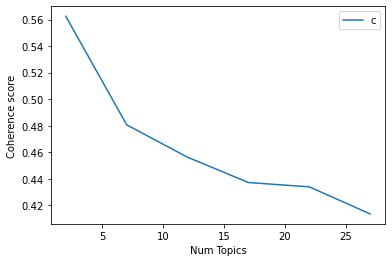

In [267]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us_score1N2N3)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [268]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us_score1N2N3):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 2

index: 0 | Num Topics = 2  has Coherence Value of 0.5625
index: 1 | Num Topics = 7  has Coherence Value of 0.4807
index: 2 | Num Topics = 12  has Coherence Value of 0.4563
index: 3 | Num Topics = 17  has Coherence Value of 0.4372
index: 4 | Num Topics = 22  has Coherence Value of 0.434
index: 5 | Num Topics = 27  has Coherence Value of 0.4135


In [340]:
# Select optimal number of topics
optimal_model_us_score1N2N3 = model_list_us_score1N2N3[0]

In [341]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us_score1N2N3 = pyLDAvis.gensim_models.prepare(optimal_model_us_score1N2N3, corpus_us_score1N2N3, id2word_us_score1N2N3)

In [342]:
print("pyLDAVis for us topics for score=1,2,3:")
vis_us_score1N2N3

pyLDAVis for us topics for score=1,2,3:


PreparedData(topic_coordinates=              x    y  topics  cluster       Freq
topic                                           
0      0.136165  0.0       1        1  54.378197
1     -0.136165  0.0       2        1  45.621803, topic_info=        Term         Freq        Total Category  logprob  loglift
36     video  1081.000000  1081.000000  Default  30.0000  30.0000
507     flip   377.000000   377.000000  Default  29.0000  29.0000
26     music   244.000000   244.000000  Default  28.0000  28.0000
68    update   219.000000   219.000000  Default  27.0000  27.0000
1943    ryan   274.000000   274.000000  Default  26.0000  26.0000
...      ...          ...          ...      ...      ...      ...
45    really   119.235143   214.878468   Topic2  -5.1402   0.1958
3       love   100.132617   141.193624   Topic2  -5.3148   0.4411
48       way   105.676352   182.854133   Topic2  -5.2610   0.2365
28    people   103.142275   245.280542   Topic2  -5.2852  -0.0815
625   tiktok   104.315490   469.436360   Topic2  -5.2739  -0.7193

[134 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
9         1  0.340278    account
9         2  0.656676    account
1971      1  0.997486     accuse
1971      2  0.005063     accuse
1704      1  0.980079  advertise
...     ...       ...        ...
2233      2  0.009327  weinstein
96        1  0.577890       well
96        2  0.424097       well
37        1  0.136703       work
37        2  0.862935       work

[176 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2])

# By-rating of each year

## By-rating of 2018 (Rating=1,2,3)

In [272]:
# By-rating Topic Modelling - rating = 1,2,3 in 2018
# Convert to list - move to each section
review_us_2018_score1N2N3 = triller_ios_us_review_YearMonth_2018_score1N2N3.review.values.tolist()
review_words_us_2018_score1N2N3 = list(sent_to_words(review_us_2018_score1N2N3))
print(review_words_us_2018_score1N2N3[:1])

[['love', 'the', 'app', 'but', 'the', 'screen', 'is', 'off', 'for', 'the', 'iphone', 'the', 'top', 'is', 'cut', 'off', 'and', 'can', 'set', 'my', 'profile', 'picture']]


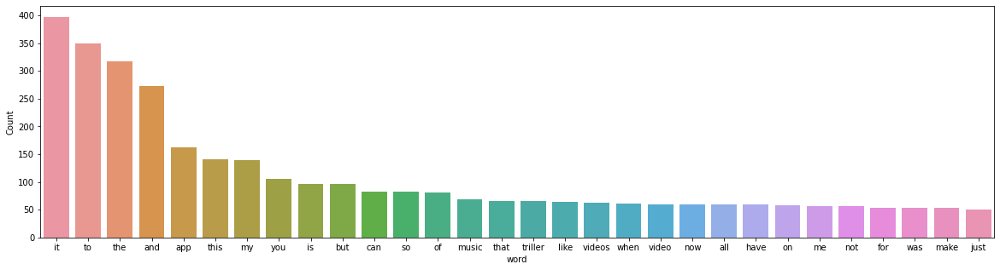

In [273]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us_2018_score1N2N3))

In [274]:
# Clean text
review_words_us_ready_2018_score1N2N3 = process_words(review_words_us_2018_score1N2N3)  # processed Text Data! - move to each section

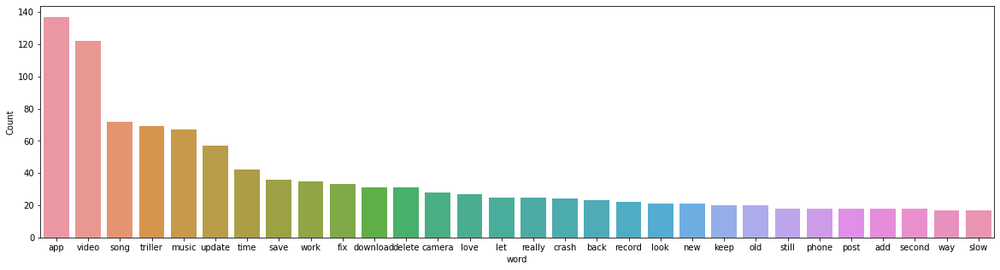

In [275]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_words_us_ready_2018_score1N2N3))


In [276]:
# Create Dictionary
id2word_us_2018_score1N2N3 = corpora.Dictionary(review_words_us_ready_2018_score1N2N3)

2021-10-20 17:02:26,846 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-20 17:02:26,851 [INFO] gensim.corpora.dictionary - built Dictionary(700 unique tokens: ['app', 'cut', 'iphone', 'love', 'picture']...) from 209 documents (total 2844 corpus positions)
2021-10-20 17:02:26,852 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(700 unique tokens: ['app', 'cut', 'iphone', 'love', 'picture']...) from 209 documents (total 2844 corpus positions)", 'datetime': '2021-10-20T17:02:26.852313', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [277]:
# Create Corpus: Term Document Frequency
corpus_us_2018_score1N2N3 = [id2word_us_2018_score1N2N3.doc2bow(text) for text in review_words_us_ready_2018_score1N2N3]

In [278]:
# Training LDA model
model_list_us_2018_score1N2N3, coherence_values_us_2018_score1N2N3 = compute_coherence_values(dictionary=id2word_us_2018_score1N2N3, corpus=corpus_us_2018_score1N2N3, 
                                                              texts=review_words_us_ready_2018_score1N2N3, limit=30, start=2, step=5)


2021-10-20 17:02:26,864 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-20 17:02:26,865 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-20 17:02:26,866 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 17:02:26,867 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 209 documents, updating model once every 209 documents, evaluating perplexity every 209 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-20 17:02:27,055 [INFO] gensim.models.ldamodel - -7.160 per-word bound, 143.0 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:27,055 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #209/209
2021-10-20 17:02:27,200 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.039*"video" + 0.028*"app" + 0.023*"triller" + 0.019*"time" + 0.018*"music" + 0.018*"song" + 0.012*"upd

2021-10-20 17:02:28,915 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.048*"app" + 0.030*"video" + 0.024*"song" + 0.021*"update" + 0.019*"triller" + 0.017*"music" + 0.016*"save" + 0.013*"work" + 0.011*"download" + 0.011*"fix"
2021-10-20 17:02:28,916 [INFO] gensim.models.ldamodel - topic diff=0.009909, rho=0.301511
2021-10-20 17:02:29,006 [INFO] gensim.models.ldamodel - -6.030 per-word bound, 65.4 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:29,007 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #209/209
2021-10-20 17:02:29,078 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.040*"video" + 0.029*"app" + 0.022*"music" + 0.021*"time" + 0.020*"triller" + 0.017*"song" + 0.012*"crash" + 0.011*"keep" + 0.011*"update" + 0.010*"camera"
2021-10-20 17:02:29,079 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.048*"app" + 0.030*"video" + 0.024*"song" + 0.021*"update" + 0.019*"triller" + 0.017*"music" + 0.016*"save" + 0.0

2021-10-20 17:02:30,508 [INFO] gensim.models.ldamodel - topic diff=0.004594, rho=0.218218
2021-10-20 17:02:30,594 [INFO] gensim.models.ldamodel - -6.027 per-word bound, 65.2 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:30,595 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #209/209
2021-10-20 17:02:30,661 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.040*"video" + 0.029*"app" + 0.022*"music" + 0.020*"time" + 0.019*"triller" + 0.017*"song" + 0.013*"crash" + 0.012*"keep" + 0.010*"update" + 0.010*"slow"
2021-10-20 17:02:30,662 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.048*"app" + 0.030*"video" + 0.023*"song" + 0.022*"update" + 0.021*"triller" + 0.017*"music" + 0.016*"save" + 0.013*"work" + 0.011*"download" + 0.011*"fix"
2021-10-20 17:02:30,663 [INFO] gensim.models.ldamodel - topic diff=0.004512, rho=0.213201
2021-10-20 17:02:30,752 [INFO] gensim.models.ldamodel - -6.027 per-word bound, 65.2 perplexity estim

2021-10-20 17:02:32,129 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #209/209
2021-10-20 17:02:32,202 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.039*"video" + 0.029*"app" + 0.022*"music" + 0.020*"time" + 0.018*"song" + 0.018*"triller" + 0.013*"crash" + 0.012*"keep" + 0.010*"slow" + 0.010*"search"
2021-10-20 17:02:32,203 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.047*"app" + 0.031*"video" + 0.023*"song" + 0.022*"update" + 0.022*"triller" + 0.017*"music" + 0.016*"save" + 0.014*"work" + 0.011*"download" + 0.011*"fix"
2021-10-20 17:02:32,204 [INFO] gensim.models.ldamodel - topic diff=0.003959, rho=0.176777
2021-10-20 17:02:32,304 [INFO] gensim.models.ldamodel - -6.024 per-word bound, 65.1 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:32,305 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #209/209
2021-10-20 17:02:32,387 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.039*"video" + 0.02

2021-10-20 17:02:33,945 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.039*"video" + 0.030*"app" + 0.022*"music" + 0.021*"time" + 0.018*"song" + 0.016*"triller" + 0.014*"crash" + 0.013*"keep" + 0.010*"search" + 0.010*"update"
2021-10-20 17:02:33,946 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.047*"app" + 0.031*"video" + 0.023*"song" + 0.022*"triller" + 0.022*"update" + 0.017*"music" + 0.016*"save" + 0.014*"work" + 0.011*"download" + 0.011*"fix"
2021-10-20 17:02:33,947 [INFO] gensim.models.ldamodel - topic diff=0.003207, rho=0.154303
2021-10-20 17:02:34,038 [INFO] gensim.models.ldamodel - -6.021 per-word bound, 65.0 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:34,038 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #209/209
2021-10-20 17:02:34,099 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.039*"video" + 0.030*"app" + 0.022*"music" + 0.021*"time" + 0.018*"song" + 0.016*"triller" + 0.014*"crash" + 0.01

2021-10-20 17:02:35,354 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-20 17:02:36,998 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-20 17:02:37,036 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 200 virtual documents
2021-10-20 17:02:37,133 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.14285714285714285
2021-10-20 17:02:37,134 [INFO] gensim.models.ldamodel - using symmetric eta at 0.14285714285714285
2021-10-20 17:02:37,137 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 17:02:37,139 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 7 topics, 50 passes over the supplied corpus of 209 documents, updating model once every 209 documents, evaluating perplexity every 209 documents, iterating 50x with a con

2021-10-20 17:02:37,978 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.035*"app" + 0.031*"video" + 0.024*"work" + 0.017*"time" + 0.016*"slow" + 0.016*"put" + 0.016*"delete" + 0.016*"triller" + 0.013*"let" + 0.012*"stupid"
2021-10-20 17:02:37,979 [INFO] gensim.models.ldamodel - topic diff=0.058147, rho=0.408248
2021-10-20 17:02:38,057 [INFO] gensim.models.ldamodel - -6.325 per-word bound, 80.2 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:38,058 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #209/209
2021-10-20 17:02:38,104 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.048*"app" + 0.040*"video" + 0.040*"music" + 0.021*"song" + 0.020*"time" + 0.017*"triller" + 0.015*"update" + 0.014*"crash" + 0.013*"keep" + 0.013*"record"
2021-10-20 17:02:38,105 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.042*"triller" + 0.038*"save" + 0.038*"video" + 0.033*"update" + 0.021*"post" + 0.014*"song" + 0.014*"long" + 0.012*"c

2021-10-20 17:02:38,713 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.048*"app" + 0.041*"video" + 0.040*"music" + 0.021*"time" + 0.020*"song" + 0.018*"triller" + 0.014*"crash" + 0.014*"update" + 0.013*"keep" + 0.013*"record"
2021-10-20 17:02:38,714 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.035*"app" + 0.031*"video" + 0.027*"work" + 0.018*"time" + 0.016*"slow" + 0.016*"put" + 0.016*"delete" + 0.016*"triller" + 0.016*"let" + 0.012*"stupid"
2021-10-20 17:02:38,715 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.048*"song" + 0.034*"app" + 0.032*"search" + 0.024*"music" + 0.024*"video" + 0.020*"time" + 0.018*"triller" + 0.011*"fix" + 0.011*"log" + 0.011*"annoying"
2021-10-20 17:02:38,716 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.041*"video" + 0.037*"update" + 0.030*"app" + 0.029*"music" + 0.023*"song" + 0.020*"triller" + 0.018*"hate" + 0.015*"new" + 0.014*"cause" + 0.013*"old"
2021-10-20 17:02:38,717 [INFO] gensim.models.ldamodel - topic diff=0.012577, rho=0.28

2021-10-20 17:02:39,361 [INFO] gensim.models.ldamodel - topic diff=0.004897, rho=0.242536
2021-10-20 17:02:39,443 [INFO] gensim.models.ldamodel - -6.297 per-word bound, 78.6 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:39,444 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #209/209
2021-10-20 17:02:39,490 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.049*"song" + 0.035*"app" + 0.033*"search" + 0.024*"music" + 0.023*"video" + 0.020*"time" + 0.018*"triller" + 0.011*"fix" + 0.011*"annoying" + 0.011*"log"
2021-10-20 17:02:39,491 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.041*"video" + 0.037*"update" + 0.030*"app" + 0.030*"music" + 0.023*"song" + 0.020*"triller" + 0.019*"hate" + 0.015*"new" + 0.014*"cause" + 0.013*"old"
2021-10-20 17:02:39,492 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.033*"app" + 0.033*"video" + 0.026*"minute" + 0.020*"way" + 0.020*"filter" + 0.017*"second" + 0.015*"time" + 0.012*"ke

2021-10-20 17:02:40,120 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.035*"app" + 0.031*"video" + 0.027*"work" + 0.019*"time" + 0.016*"delete" + 0.016*"slow" + 0.016*"triller" + 0.016*"put" + 0.016*"let" + 0.012*"well"
2021-10-20 17:02:40,121 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.033*"video" + 0.032*"app" + 0.026*"minute" + 0.020*"way" + 0.020*"filter" + 0.017*"second" + 0.015*"time" + 0.012*"keep" + 0.011*"crash" + 0.011*"social"
2021-10-20 17:02:40,122 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.043*"triller" + 0.040*"save" + 0.039*"update" + 0.038*"video" + 0.022*"post" + 0.014*"song" + 0.014*"long" + 0.013*"camera" + 0.012*"new" + 0.012*"let"
2021-10-20 17:02:40,122 [INFO] gensim.models.ldamodel - topic diff=0.002133, rho=0.208514
2021-10-20 17:02:40,198 [INFO] gensim.models.ldamodel - -6.296 per-word bound, 78.5 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:40,199 [INFO] gensim.models.ldamodel - PROGRES

2021-10-20 17:02:40,929 [INFO] gensim.models.ldamodel - -6.294 per-word bound, 78.5 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:40,929 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #209/209
2021-10-20 17:02:40,978 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.035*"app" + 0.031*"video" + 0.027*"work" + 0.019*"time" + 0.016*"delete" + 0.016*"slow" + 0.016*"triller" + 0.016*"put" + 0.016*"let" + 0.012*"well"
2021-10-20 17:02:40,979 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.063*"app" + 0.031*"video" + 0.027*"work" + 0.024*"download" + 0.023*"delete" + 0.019*"triller" + 0.018*"song" + 0.017*"fix" + 0.012*"still" + 0.012*"save"
2021-10-20 17:02:40,980 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.043*"triller" + 0.040*"save" + 0.039*"update" + 0.038*"video" + 0.022*"post" + 0.014*"song" + 0.014*"long" + 0.014*"camera" + 0.013*"new" + 0.012*"let"
2021-10-20 17:02:40,981 [INFO] gensim.models.ldamodel - 

2021-10-20 17:02:41,647 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.050*"song" + 0.035*"app" + 0.035*"search" + 0.024*"music" + 0.023*"video" + 0.020*"time" + 0.017*"triller" + 0.011*"fix" + 0.011*"annoying" + 0.011*"log"
2021-10-20 17:02:41,648 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.048*"app" + 0.041*"video" + 0.040*"music" + 0.021*"time" + 0.020*"song" + 0.018*"triller" + 0.015*"crash" + 0.014*"update" + 0.013*"keep" + 0.013*"record"
2021-10-20 17:02:41,648 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.033*"video" + 0.032*"app" + 0.026*"minute" + 0.020*"way" + 0.020*"filter" + 0.017*"second" + 0.015*"time" + 0.012*"keep" + 0.011*"social" + 0.011*"medium"
2021-10-20 17:02:41,649 [INFO] gensim.models.ldamodel - topic diff=0.000584, rho=0.171499
2021-10-20 17:02:41,734 [INFO] gensim.models.ldamodel - -6.293 per-word bound, 78.4 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:41,734 [INFO] gensim.models.ldamodel 

2021-10-20 17:02:42,746 [INFO] gensim.models.ldamodel - -6.293 per-word bound, 78.4 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:42,747 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #209/209
2021-10-20 17:02:42,803 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.044*"triller" + 0.039*"save" + 0.039*"update" + 0.038*"video" + 0.022*"post" + 0.014*"song" + 0.014*"long" + 0.014*"camera" + 0.013*"new" + 0.012*"let"
2021-10-20 17:02:42,804 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.033*"video" + 0.031*"app" + 0.026*"minute" + 0.020*"way" + 0.020*"filter" + 0.017*"second" + 0.015*"time" + 0.012*"keep" + 0.011*"social" + 0.011*"medium"
2021-10-20 17:02:42,805 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.035*"app" + 0.031*"video" + 0.027*"work" + 0.019*"time" + 0.016*"delete" + 0.016*"slow" + 0.016*"triller" + 0.016*"let" + 0.016*"put" + 0.012*"well"
2021-10-20 17:02:42,806 [INFO] gensim.models.ldamodel - 

2021-10-20 17:02:43,534 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.050*"song" + 0.035*"search" + 0.035*"app" + 0.024*"music" + 0.023*"video" + 0.020*"time" + 0.017*"triller" + 0.011*"fix" + 0.011*"annoying" + 0.011*"log"
2021-10-20 17:02:43,535 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.048*"app" + 0.041*"video" + 0.040*"music" + 0.021*"time" + 0.020*"song" + 0.018*"triller" + 0.015*"crash" + 0.014*"update" + 0.013*"keep" + 0.013*"record"
2021-10-20 17:02:43,536 [INFO] gensim.models.ldamodel - topic diff=0.000210, rho=0.149071
2021-10-20 17:02:43,627 [INFO] gensim.models.ldamodel - -6.293 per-word bound, 78.4 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:43,628 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #209/209
2021-10-20 17:02:43,685 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.035*"app" + 0.031*"video" + 0.028*"work" + 0.019*"time" + 0.016*"delete" + 0.016*"triller" + 0.016*"slow" + 0.016

2021-10-20 17:02:44,360 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.035*"app" + 0.031*"video" + 0.028*"work" + 0.019*"time" + 0.016*"delete" + 0.016*"triller" + 0.016*"slow" + 0.016*"let" + 0.016*"put" + 0.012*"well"
2021-10-20 17:02:44,361 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.044*"triller" + 0.039*"update" + 0.039*"save" + 0.038*"video" + 0.022*"post" + 0.014*"song" + 0.014*"camera" + 0.014*"long" + 0.013*"new" + 0.012*"let"
2021-10-20 17:02:44,362 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.041*"video" + 0.036*"update" + 0.030*"app" + 0.030*"music" + 0.023*"song" + 0.020*"triller" + 0.019*"hate" + 0.014*"new" + 0.014*"cause" + 0.013*"old"
2021-10-20 17:02:44,363 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.050*"song" + 0.035*"search" + 0.035*"app" + 0.024*"music" + 0.023*"video" + 0.020*"time" + 0.017*"triller" + 0.011*"fix" + 0.011*"annoying" + 0.011*"log"
2021-10-20 17:02:44,364 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.034*"video" + 

2021-10-20 17:02:47,149 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.032*"video" + 0.031*"triller" + 0.025*"back" + 0.020*"slow" + 0.019*"record" + 0.018*"work" + 0.017*"delete" + 0.017*"message" + 0.015*"music" + 0.013*"still"
2021-10-20 17:02:47,149 [INFO] gensim.models.ldamodel - topic diff=0.106247, rho=0.447214
2021-10-20 17:02:47,228 [INFO] gensim.models.ldamodel - -6.482 per-word bound, 89.4 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:47,230 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #209/209
2021-10-20 17:02:47,276 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.063*"song" + 0.036*"video" + 0.031*"search" + 0.028*"app" + 0.018*"triller" + 0.018*"save" + 0.015*"log" + 0.012*"well" + 0.012*"reason" + 0.012*"way"
2021-10-20 17:02:47,277 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.059*"save" + 0.039*"video" + 0.038*"triller" + 0.034*"app" + 0.023*"post" + 0.021*"update" + 0.016*"camera" + 0.

2021-10-20 17:02:47,982 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.032*"video" + 0.030*"triller" + 0.025*"back" + 0.022*"slow" + 0.020*"record" + 0.018*"work" + 0.018*"delete" + 0.017*"message" + 0.014*"app" + 0.013*"still"
2021-10-20 17:02:47,983 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.062*"app" + 0.060*"crash" + 0.047*"work" + 0.044*"time" + 0.039*"camera" + 0.017*"put" + 0.017*"phone" + 0.016*"perfectly" + 0.015*"gon" + 0.015*"problem"
2021-10-20 17:02:47,985 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.035*"triller" + 0.028*"app" + 0.022*"music" + 0.019*"effect" + 0.014*"video" + 0.013*"download" + 0.013*"way" + 0.013*"appear" + 0.013*"read" + 0.013*"really"
2021-10-20 17:02:47,986 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.073*"music" + 0.061*"video" + 0.061*"app" + 0.026*"love" + 0.025*"time" + 0.019*"song" + 0.018*"update" + 0.017*"fix" + 0.015*"triller" + 0.014*"show"
2021-10-20 17:02:47,987 [INFO] gensim.models.ldamodel - topic diff=0.0195

2021-10-20 17:02:48,662 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.071*"save" + 0.042*"video" + 0.038*"triller" + 0.037*"app" + 0.024*"post" + 0.021*"update" + 0.018*"camera" + 0.016*"phone" + 0.014*"roll" + 0.014*"let"
2021-10-20 17:02:48,663 [INFO] gensim.models.ldamodel - topic diff=0.010986, rho=0.250000
2021-10-20 17:02:48,745 [INFO] gensim.models.ldamodel - -6.425 per-word bound, 85.9 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:48,746 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #209/209
2021-10-20 17:02:48,794 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.080*"music" + 0.060*"app" + 0.059*"video" + 0.025*"love" + 0.024*"time" + 0.019*"song" + 0.018*"update" + 0.017*"find" + 0.017*"fix" + 0.015*"triller"
2021-10-20 17:02:48,795 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.030*"app" + 0.030*"time" + 0.022*"work" + 0.017*"video" + 0.017*"screen" + 0.017*"record" + 0.015*"fix" + 0.013*"stupi

2021-10-20 17:02:49,460 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.037*"triller" + 0.025*"app" + 0.021*"effect" + 0.016*"video" + 0.014*"download" + 0.014*"way" + 0.014*"appear" + 0.014*"read" + 0.014*"really" + 0.014*"time"
2021-10-20 17:02:49,461 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.085*"app" + 0.034*"video" + 0.033*"song" + 0.019*"fun" + 0.017*"part" + 0.014*"horrible" + 0.014*"really" + 0.014*"update" + 0.011*"dance" + 0.011*"slow"
2021-10-20 17:02:49,462 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.068*"song" + 0.036*"video" + 0.032*"search" + 0.025*"app" + 0.018*"triller" + 0.016*"save" + 0.015*"log" + 0.012*"reason" + 0.012*"way" + 0.012*"artist"
2021-10-20 17:02:49,463 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.071*"save" + 0.042*"video" + 0.037*"triller" + 0.037*"app" + 0.024*"post" + 0.021*"update" + 0.018*"camera" + 0.017*"phone" + 0.015*"roll" + 0.014*"let"
2021-10-20 17:02:49,464 [INFO] gensim.models.ldamodel - topic diff=0.007112, r

2021-10-20 17:02:50,088 [INFO] gensim.models.ldamodel - topic diff=0.005195, rho=0.192450
2021-10-20 17:02:50,158 [INFO] gensim.models.ldamodel - -6.410 per-word bound, 85.0 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:50,159 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #209/209
2021-10-20 17:02:50,204 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.030*"app" + 0.030*"time" + 0.022*"work" + 0.017*"video" + 0.017*"screen" + 0.017*"record" + 0.015*"fix" + 0.013*"stupid" + 0.013*"add" + 0.013*"first"
2021-10-20 17:02:50,205 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.059*"update" + 0.038*"video" + 0.033*"song" + 0.032*"music" + 0.029*"triller" + 0.029*"new" + 0.028*"old" + 0.023*"hate" + 0.015*"cause" + 0.015*"camera"
2021-10-20 17:02:50,206 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.037*"app" + 0.025*"video" + 0.020*"song" + 0.018*"really" + 0.017*"download" + 0.017*"update" + 0.015*"pay" + 0.015*"

2021-10-20 17:02:50,889 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.033*"video" + 0.031*"triller" + 0.025*"back" + 0.021*"slow" + 0.019*"record" + 0.018*"work" + 0.018*"delete" + 0.018*"message" + 0.014*"app" + 0.014*"able"
2021-10-20 17:02:50,890 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.069*"crash" + 0.068*"app" + 0.051*"time" + 0.047*"work" + 0.045*"camera" + 0.032*"keep" + 0.019*"fix" + 0.018*"phone" + 0.017*"delete" + 0.015*"put"
2021-10-20 17:02:50,891 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.088*"music" + 0.057*"video" + 0.057*"app" + 0.027*"love" + 0.023*"time" + 0.020*"find" + 0.020*"song" + 0.016*"update" + 0.016*"fix" + 0.015*"show"
2021-10-20 17:02:50,891 [INFO] gensim.models.ldamodel - topic diff=0.003980, rho=0.174078
2021-10-20 17:02:50,965 [INFO] gensim.models.ldamodel - -6.402 per-word bound, 84.6 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:50,966 [INFO] gensim.models.ldamodel - PROGRESS

2021-10-20 17:02:51,635 [INFO] gensim.models.ldamodel - -6.399 per-word bound, 84.4 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:51,636 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #209/209
2021-10-20 17:02:51,684 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.037*"app" + 0.026*"video" + 0.020*"song" + 0.018*"download" + 0.017*"update" + 0.015*"pay" + 0.015*"star" + 0.015*"fix" + 0.013*"really" + 0.013*"triller"
2021-10-20 17:02:51,685 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.084*"app" + 0.035*"video" + 0.031*"song" + 0.020*"fun" + 0.017*"part" + 0.014*"horrible" + 0.014*"really" + 0.011*"dance" + 0.011*"slow" + 0.011*"look"
2021-10-20 17:02:51,686 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.033*"video" + 0.031*"triller" + 0.025*"back" + 0.021*"slow" + 0.018*"record" + 0.018*"work" + 0.018*"delete" + 0.018*"message" + 0.014*"app" + 0.014*"able"
2021-10-20 17:02:51,687 [INFO] gensim.models.lda

2021-10-20 17:02:52,345 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.043*"video" + 0.024*"minute" + 0.023*"triller" + 0.022*"long" + 0.022*"app" + 0.020*"way" + 0.020*"send" + 0.016*"email" + 0.016*"really" + 0.015*"look"
2021-10-20 17:02:52,346 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.037*"triller" + 0.027*"app" + 0.021*"effect" + 0.020*"really" + 0.020*"video" + 0.019*"slow" + 0.015*"download" + 0.015*"read" + 0.015*"time" + 0.015*"notification"
2021-10-20 17:02:52,347 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.030*"app" + 0.030*"time" + 0.022*"work" + 0.017*"video" + 0.017*"screen" + 0.017*"record" + 0.015*"fix" + 0.013*"add" + 0.013*"stupid" + 0.013*"delete"
2021-10-20 17:02:52,347 [INFO] gensim.models.ldamodel - topic diff=0.002352, rho=0.150756
2021-10-20 17:02:52,423 [INFO] gensim.models.ldamodel - -6.397 per-word bound, 84.3 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:52,424 [INFO] gensim.models.lda

2021-10-20 17:02:52,983 [INFO] gensim.models.ldamodel - topic diff=0.001652, rho=0.142857
2021-10-20 17:02:53,059 [INFO] gensim.models.ldamodel - -6.395 per-word bound, 84.2 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:53,060 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #209/209
2021-10-20 17:02:53,102 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.071*"save" + 0.042*"video" + 0.037*"triller" + 0.037*"app" + 0.023*"post" + 0.021*"update" + 0.019*"camera" + 0.017*"phone" + 0.015*"roll" + 0.014*"let"
2021-10-20 17:02:53,103 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.061*"update" + 0.037*"video" + 0.034*"song" + 0.032*"music" + 0.029*"new" + 0.028*"triller" + 0.028*"old" + 0.025*"hate" + 0.015*"cause" + 0.015*"camera"
2021-10-20 17:02:53,103 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.028*"really" + 0.028*"kid" + 0.024*"second" + 0.019*"app" + 0.019*"camera" + 0.019*"annoying" + 0.019*"literally" 

2021-10-20 17:02:56,429 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.048*"music" + 0.046*"app" + 0.033*"video" + 0.022*"show" + 0.020*"message" + 0.018*"triller" + 0.018*"song" + 0.014*"fix" + 0.014*"whenever" + 0.014*"still"
2021-10-20 17:02:56,430 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.044*"app" + 0.028*"really" + 0.026*"time" + 0.026*"music" + 0.022*"camera" + 0.022*"work" + 0.018*"put" + 0.017*"record" + 0.017*"phone" + 0.016*"annoying"
2021-10-20 17:02:56,430 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.057*"app" + 0.023*"video" + 0.019*"minute" + 0.018*"love" + 0.018*"music" + 0.017*"crash" + 0.017*"fix" + 0.012*"keep" + 0.012*"change" + 0.012*"read"
2021-10-20 17:02:56,431 [INFO] gensim.models.ldamodel - topic diff=0.121815, rho=0.500000
2021-10-20 17:02:56,509 [INFO] gensim.models.ldamodel - -6.628 per-word bound, 98.9 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:56,510 [INFO] gensim.models.ldamode

2021-10-20 17:02:57,114 [INFO] gensim.models.ldamodel - topic diff=0.034691, rho=0.333333
2021-10-20 17:02:57,190 [INFO] gensim.models.ldamodel - -6.565 per-word bound, 94.7 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:57,191 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #209/209
2021-10-20 17:02:57,238 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.046*"slow" + 0.031*"put" + 0.030*"add" + 0.027*"video" + 0.022*"freeze" + 0.022*"cause" + 0.022*"fix" + 0.020*"time" + 0.020*"music" + 0.017*"update"
2021-10-20 17:02:57,239 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.058*"app" + 0.023*"video" + 0.018*"love" + 0.018*"music" + 0.017*"fix" + 0.017*"minute" + 0.015*"crash" + 0.012*"keep" + 0.012*"change" + 0.012*"read"
2021-10-20 17:02:57,240 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.051*"music" + 0.045*"app" + 0.033*"video" + 0.024*"show" + 0.021*"song" + 0.019*"message" + 0.019*"triller" + 0.014*"fix

2021-10-20 17:02:57,851 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.078*"save" + 0.043*"video" + 0.039*"app" + 0.036*"time" + 0.028*"camera" + 0.026*"roll" + 0.026*"triller" + 0.022*"delete" + 0.015*"download" + 0.013*"update"
2021-10-20 17:02:57,852 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.066*"slow" + 0.030*"put" + 0.029*"add" + 0.029*"video" + 0.022*"freeze" + 0.022*"fix" + 0.020*"cause" + 0.020*"time" + 0.018*"everytime" + 0.018*"update"
2021-10-20 17:02:57,853 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.076*"app" + 0.057*"song" + 0.033*"video" + 0.026*"record" + 0.019*"love" + 0.018*"time" + 0.016*"download" + 0.016*"let" + 0.016*"music" + 0.016*"update"
2021-10-20 17:02:57,854 [INFO] gensim.models.ldamodel - topic diff=0.009975, rho=0.258199
2021-10-20 17:02:57,933 [INFO] gensim.models.ldamodel - -6.544 per-word bound, 93.3 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:57,934 [INFO] gensim.models.ldamo

2021-10-20 17:02:58,529 [INFO] gensim.models.ldamodel - topic diff=0.004540, rho=0.223607
2021-10-20 17:02:58,623 [INFO] gensim.models.ldamodel - -6.540 per-word bound, 93.1 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:58,624 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #209/209
2021-10-20 17:02:58,675 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.036*"app" + 0.030*"update" + 0.024*"song" + 0.024*"back" + 0.024*"watermark" + 0.024*"video" + 0.024*"pay" + 0.024*"star" + 0.019*"fix" + 0.018*"remove"
2021-10-20 17:02:58,676 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.073*"app" + 0.043*"video" + 0.027*"song" + 0.019*"long" + 0.019*"fun" + 0.019*"second" + 0.015*"dance" + 0.015*"delete" + 0.012*"part" + 0.012*"music"
2021-10-20 17:02:58,677 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.078*"save" + 0.043*"video" + 0.039*"app" + 0.035*"time" + 0.028*"camera" + 0.026*"roll" + 0.025*"triller" + 0.022*"del

2021-10-20 17:02:59,361 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.073*"app" + 0.042*"video" + 0.027*"song" + 0.019*"long" + 0.019*"fun" + 0.019*"second" + 0.016*"dance" + 0.016*"delete" + 0.012*"part" + 0.012*"music"
2021-10-20 17:02:59,363 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.051*"music" + 0.045*"app" + 0.033*"video" + 0.024*"show" + 0.021*"song" + 0.019*"message" + 0.019*"triller" + 0.014*"fix" + 0.014*"whenever" + 0.014*"still"
2021-10-20 17:02:59,364 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.041*"triller" + 0.036*"video" + 0.033*"hate" + 0.033*"update" + 0.026*"work" + 0.023*"old" + 0.023*"new" + 0.022*"app" + 0.020*"camera" + 0.017*"song"
2021-10-20 17:02:59,365 [INFO] gensim.models.ldamodel - topic diff=0.002310, rho=0.196116
2021-10-20 17:02:59,450 [INFO] gensim.models.ldamodel - -6.536 per-word bound, 92.8 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:02:59,451 [INFO] gensim.models.ldamodel - PR

2021-10-20 17:02:59,995 [INFO] gensim.models.ldamodel - topic diff=0.001534, rho=0.179605
2021-10-20 17:03:00,072 [INFO] gensim.models.ldamodel - -6.534 per-word bound, 92.7 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:00,073 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #209/209
2021-10-20 17:03:00,116 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.078*"save" + 0.043*"video" + 0.040*"app" + 0.035*"time" + 0.028*"camera" + 0.026*"roll" + 0.025*"triller" + 0.022*"delete" + 0.015*"download" + 0.013*"update"
2021-10-20 17:03:00,117 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.051*"music" + 0.045*"app" + 0.033*"video" + 0.024*"show" + 0.021*"song" + 0.019*"message" + 0.019*"triller" + 0.014*"fix" + 0.014*"whenever" + 0.014*"still"
2021-10-20 17:03:00,118 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.072*"slow" + 0.029*"video" + 0.029*"put" + 0.029*"add" + 0.022*"everytime" + 0.022*"freeze" + 0.021*"fix"

2021-10-20 17:03:00,708 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.042*"video" + 0.041*"triller" + 0.035*"work" + 0.023*"app" + 0.023*"filter" + 0.018*"record" + 0.018*"delete" + 0.018*"happen" + 0.018*"still" + 0.018*"let"
2021-10-20 17:03:00,709 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.073*"app" + 0.042*"video" + 0.027*"song" + 0.019*"long" + 0.019*"fun" + 0.019*"second" + 0.016*"dance" + 0.016*"delete" + 0.012*"part" + 0.012*"music"
2021-10-20 17:03:00,710 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.048*"app" + 0.030*"really" + 0.027*"music" + 0.024*"time" + 0.024*"camera" + 0.024*"work" + 0.018*"put" + 0.018*"record" + 0.018*"phone" + 0.018*"annoying"
2021-10-20 17:03:00,711 [INFO] gensim.models.ldamodel - topic diff=0.000911, rho=0.164399
2021-10-20 17:03:00,774 [INFO] gensim.models.ldamodel - -6.532 per-word bound, 92.6 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:00,775 [INFO] gensim.models.ldamodel

2021-10-20 17:03:01,291 [INFO] gensim.models.ldamodel - topic diff=0.000609, rho=0.154303
2021-10-20 17:03:01,375 [INFO] gensim.models.ldamodel - -6.532 per-word bound, 92.5 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:01,376 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #209/209
2021-10-20 17:03:01,433 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.078*"save" + 0.043*"video" + 0.040*"app" + 0.035*"time" + 0.028*"camera" + 0.026*"roll" + 0.025*"triller" + 0.022*"delete" + 0.015*"download" + 0.013*"update"
2021-10-20 17:03:01,434 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.048*"app" + 0.030*"really" + 0.027*"music" + 0.024*"time" + 0.024*"camera" + 0.024*"work" + 0.018*"put" + 0.018*"record" + 0.018*"phone" + 0.018*"annoying"
2021-10-20 17:03:01,435 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.073*"app" + 0.042*"video" + 0.027*"song" + 0.019*"long" + 0.019*"second" + 0.019*"fun" + 0.016*"dance" + 0.

2021-10-20 17:03:02,141 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.067*"video" + 0.058*"app" + 0.053*"crash" + 0.049*"keep" + 0.046*"time" + 0.031*"music" + 0.024*"update" + 0.022*"fix" + 0.018*"minute" + 0.016*"triller"
2021-10-20 17:03:02,142 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.078*"save" + 0.043*"video" + 0.040*"app" + 0.035*"time" + 0.028*"camera" + 0.026*"roll" + 0.025*"triller" + 0.022*"delete" + 0.015*"download" + 0.013*"update"
2021-10-20 17:03:02,144 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.036*"app" + 0.030*"update" + 0.024*"song" + 0.024*"back" + 0.024*"video" + 0.024*"star" + 0.024*"pay" + 0.024*"watermark" + 0.019*"fix" + 0.018*"remove"
2021-10-20 17:03:02,144 [INFO] gensim.models.ldamodel - topic diff=0.000356, rho=0.144338
2021-10-20 17:03:02,219 [INFO] gensim.models.ldamodel - -6.531 per-word bound, 92.5 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:02,219 [INFO] gensim.models.ldamode

2021-10-20 17:03:05,530 [INFO] gensim.models.ldamodel - -6.959 per-word bound, 124.4 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:05,531 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #209/209
2021-10-20 17:03:05,593 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.067*"video" + 0.037*"triller" + 0.034*"music" + 0.034*"crash" + 0.033*"app" + 0.030*"keep" + 0.027*"time" + 0.016*"fun" + 0.013*"find" + 0.013*"create"
2021-10-20 17:03:05,594 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.028*"update" + 0.028*"change" + 0.027*"song" + 0.027*"music" + 0.021*"triller" + 0.021*"old" + 0.019*"version" + 0.019*"download" + 0.019*"add" + 0.015*"whole"
2021-10-20 17:03:05,596 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.052*"app" + 0.039*"work" + 0.037*"music" + 0.036*"fix" + 0.034*"song" + 0.024*"download" + 0.024*"camera" + 0.023*"phone" + 0.021*"start" + 0.021*"put"
2021-10-20 17:03:05,597 [INFO] gensim.models.ld

2021-10-20 17:03:06,236 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.034*"app" + 0.034*"video" + 0.034*"end" + 0.034*"reason" + 0.017*"truly" + 0.017*"amount" + 0.017*"disappoint" + 0.017*"today" + 0.017*"much" + 0.017*"way"
2021-10-20 17:03:06,238 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.066*"app" + 0.048*"video" + 0.037*"song" + 0.024*"time" + 0.021*"love" + 0.020*"search" + 0.018*"crash" + 0.013*"fix" + 0.013*"load" + 0.013*"second"
2021-10-20 17:03:06,239 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.060*"song" + 0.039*"video" + 0.039*"add" + 0.026*"kick" + 0.026*"anymore" + 0.013*"look" + 0.013*"download" + 0.013*"freeze" + 0.013*"delete" + 0.013*"work"
2021-10-20 17:03:06,240 [INFO] gensim.models.ldamodel - topic diff=0.060928, rho=0.353553
2021-10-20 17:03:06,312 [INFO] gensim.models.ldamodel - -6.676 per-word bound, 102.2 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:06,313 [INFO] gensim.models.ldamod

2021-10-20 17:03:06,836 [INFO] gensim.models.ldamodel - topic diff=0.017551, rho=0.277350
2021-10-20 17:03:06,901 [INFO] gensim.models.ldamodel - -6.660 per-word bound, 101.2 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:06,902 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #209/209
2021-10-20 17:03:06,944 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.066*"app" + 0.046*"video" + 0.039*"song" + 0.024*"time" + 0.022*"love" + 0.022*"search" + 0.019*"crash" + 0.014*"fix" + 0.014*"load" + 0.013*"save"
2021-10-20 17:03:06,945 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.068*"triller" + 0.051*"video" + 0.039*"update" + 0.036*"back" + 0.028*"work" + 0.025*"music" + 0.025*"really" + 0.024*"new" + 0.020*"still" + 0.020*"filter"
2021-10-20 17:03:06,946 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.001*"triller" + 0.001*"video" + 0.001*"app" + 0.001*"effect" + 0.001*"whenever" + 0.001*"watch" + 0.001*"part" + 

2021-10-20 17:03:07,541 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.034*"app" + 0.034*"video" + 0.034*"reason" + 0.034*"end" + 0.017*"truly" + 0.017*"disappoint" + 0.017*"amount" + 0.017*"issue" + 0.017*"never" + 0.017*"shut"
2021-10-20 17:03:07,543 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.058*"slow" + 0.044*"music" + 0.044*"put" + 0.015*"shorten" + 0.015*"song" + 0.015*"horrible" + 0.015*"episode" + 0.015*"edit" + 0.015*"useless" + 0.015*"barely"
2021-10-20 17:03:07,544 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.046*"app" + 0.046*"song" + 0.031*"triller" + 0.031*"keep" + 0.016*"video" + 0.016*"way" + 0.016*"love" + 0.016*"look" + 0.016*"really" + 0.016*"itune"
2021-10-20 17:03:07,545 [INFO] gensim.models.ldamodel - topic diff=0.005715, rho=0.229416
2021-10-20 17:03:07,631 [INFO] gensim.models.ldamodel - -6.650 per-word bound, 100.5 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:07,631 [INFO] gensim.models

2021-10-20 17:03:08,229 [INFO] gensim.models.ldamodel - topic diff=0.003291, rho=0.204124
2021-10-20 17:03:08,319 [INFO] gensim.models.ldamodel - -6.647 per-word bound, 100.2 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:08,320 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #209/209
2021-10-20 17:03:08,387 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.042*"music" + 0.041*"app" + 0.035*"time" + 0.025*"video" + 0.023*"log" + 0.023*"fun" + 0.021*"delete" + 0.019*"annoying" + 0.017*"download" + 0.016*"camera"
2021-10-20 17:03:08,387 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.070*"triller" + 0.051*"video" + 0.042*"update" + 0.035*"back" + 0.027*"work" + 0.024*"music" + 0.024*"really" + 0.024*"new" + 0.020*"still" + 0.020*"filter"
2021-10-20 17:03:08,388 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.030*"change" + 0.030*"update" + 0.027*"song" + 0.025*"add" + 0.020*"old" + 0.019*"triller" + 0.019*"downlo

2021-10-20 17:03:09,051 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.052*"video" + 0.037*"app" + 0.037*"way" + 0.024*"kid" + 0.018*"export" + 0.018*"look" + 0.018*"terrible" + 0.018*"bad" + 0.018*"filter" + 0.017*"still"
2021-10-20 17:03:09,052 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.027*"look" + 0.026*"music" + 0.026*"update" + 0.025*"app" + 0.024*"song" + 0.022*"video" + 0.021*"pick" + 0.021*"glitchy" + 0.020*"triller" + 0.014*"facebook"
2021-10-20 17:03:09,053 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.064*"video" + 0.043*"crash" + 0.037*"triller" + 0.036*"app" + 0.034*"keep" + 0.034*"music" + 0.033*"time" + 0.017*"fun" + 0.017*"glitch" + 0.013*"find"
2021-10-20 17:03:09,054 [INFO] gensim.models.ldamodel - topic diff=0.001815, rho=0.182574
2021-10-20 17:03:09,118 [INFO] gensim.models.ldamodel - -6.643 per-word bound, 99.9 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:09,119 [INFO] gensim.models.ldamodel

2021-10-20 17:03:09,669 [INFO] gensim.models.ldamodel - topic diff=0.002017, rho=0.169031
2021-10-20 17:03:09,745 [INFO] gensim.models.ldamodel - -6.642 per-word bound, 99.8 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:09,745 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #209/209
2021-10-20 17:03:09,790 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.052*"video" + 0.037*"app" + 0.037*"way" + 0.025*"kid" + 0.019*"export" + 0.019*"terrible" + 0.019*"look" + 0.019*"bad" + 0.019*"filter" + 0.017*"still"
2021-10-20 17:03:09,791 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.040*"app" + 0.037*"video" + 0.030*"add" + 0.026*"work" + 0.023*"time" + 0.022*"triller" + 0.022*"pay" + 0.022*"remove" + 0.020*"let" + 0.018*"ever"
2021-10-20 17:03:09,792 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.068*"save" + 0.040*"triller" + 0.037*"video" + 0.030*"update" + 0.027*"app" + 0.019*"post" + 0.019*"camera" + 0.019*"roll

2021-10-20 17:03:10,409 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.065*"app" + 0.046*"video" + 0.038*"song" + 0.026*"time" + 0.023*"search" + 0.021*"love" + 0.020*"crash" + 0.016*"load" + 0.013*"fix" + 0.013*"save"
2021-10-20 17:03:10,410 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.034*"app" + 0.034*"video" + 0.034*"reason" + 0.034*"end" + 0.017*"never" + 0.017*"shut" + 0.017*"amount" + 0.017*"disappoint" + 0.017*"issue" + 0.017*"much"
2021-10-20 17:03:10,411 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.001*"triller" + 0.001*"video" + 0.001*"app" + 0.001*"effect" + 0.001*"whenever" + 0.001*"watch" + 0.001*"part" + 0.001*"screen" + 0.001*"existent" + 0.001*"slowly"
2021-10-20 17:03:10,412 [INFO] gensim.models.ldamodel - topic diff=0.001404, rho=0.156174
2021-10-20 17:03:10,496 [INFO] gensim.models.ldamodel - -6.639 per-word bound, 99.7 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:10,497 [INFO] gensim.models.l

2021-10-20 17:03:11,057 [INFO] gensim.models.ldamodel - topic diff=0.001046, rho=0.147442
2021-10-20 17:03:11,133 [INFO] gensim.models.ldamodel - -6.638 per-word bound, 99.6 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:11,134 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #209/209
2021-10-20 17:03:11,176 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.041*"music" + 0.040*"app" + 0.035*"time" + 0.025*"video" + 0.023*"log" + 0.023*"fun" + 0.023*"annoying" + 0.021*"delete" + 0.017*"download" + 0.016*"camera"
2021-10-20 17:03:11,177 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.062*"video" + 0.040*"crash" + 0.037*"triller" + 0.037*"app" + 0.035*"keep" + 0.035*"music" + 0.029*"time" + 0.017*"fun" + 0.017*"glitch" + 0.013*"whenever"
2021-10-20 17:03:11,179 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.093*"app" + 0.036*"song" + 0.035*"video" + 0.027*"second" + 0.023*"horrible" + 0.023*"delete" + 0.015*"really

2021-10-20 17:03:13,327 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-20 17:03:13,383 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 207 virtual documents
2021-10-20 17:03:14,253 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.037037037037037035
2021-10-20 17:03:14,254 [INFO] gensim.models.ldamodel - using symmetric eta at 0.037037037037037035
2021-10-20 17:03:14,256 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 17:03:14,259 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 27 topics, 50 passes over the supplied corpus of 209 documents, updating model once every 209 documents, evaluating perplexity every 209 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-20 17:03:14,384 [INFO] gensim.models.ldamodel - -20.116 per-word bound, 1136633.8 perplexity estimate based on a held-out corpus of 209 documents with 2

2021-10-20 17:03:14,965 [INFO] gensim.models.ldamodel - topic diff=0.081777, rho=0.408248
2021-10-20 17:03:15,036 [INFO] gensim.models.ldamodel - -6.781 per-word bound, 109.9 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:15,036 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #209/209
2021-10-20 17:03:15,079 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.038*"record" + 0.038*"music" + 0.019*"dumb" + 0.019*"choose" + 0.019*"second" + 0.019*"ready" + 0.019*"recommend" + 0.019*"add" + 0.019*"outta" + 0.019*"mess"
2021-10-20 17:03:15,080 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.056*"video" + 0.047*"triller" + 0.037*"long" + 0.028*"update" + 0.019*"back" + 0.019*"old" + 0.019*"effect" + 0.019*"whenever" + 0.019*"fix" + 0.019*"much"
2021-10-20 17:03:15,080 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.043*"time" + 0.034*"app" + 0.034*"log" + 0.026*"annoying" + 0.026*"reason" + 0.026*"music" + 0.017*"delete

2021-10-20 17:03:15,676 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.061*"update" + 0.044*"video" + 0.035*"hate" + 0.035*"new" + 0.026*"music" + 0.026*"triller" + 0.026*"cause" + 0.018*"app" + 0.018*"crash" + 0.018*"whole"
2021-10-20 17:03:15,677 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.057*"change" + 0.057*"whole" + 0.038*"app" + 0.038*"song" + 0.038*"old" + 0.020*"record" + 0.020*"much" + 0.020*"add" + 0.020*"love" + 0.020*"second"
2021-10-20 17:03:15,678 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.069*"app" + 0.038*"music" + 0.037*"video" + 0.021*"keep" + 0.020*"phone" + 0.020*"love" + 0.020*"social" + 0.020*"medium" + 0.020*"screen" + 0.020*"time"
2021-10-20 17:03:15,679 [INFO] gensim.models.ldamodel - topic diff=0.018329, rho=0.288675
2021-10-20 17:03:15,753 [INFO] gensim.models.ldamodel - -6.744 per-word bound, 107.2 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:15,754 [INFO] gensim.models.ldamodel - P

2021-10-20 17:03:16,284 [INFO] gensim.models.ldamodel - topic diff=0.006623, rho=0.242536
2021-10-20 17:03:16,368 [INFO] gensim.models.ldamodel - -6.736 per-word bound, 106.6 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:16,369 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #209/209
2021-10-20 17:03:16,422 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.066*"app" + 0.044*"video" + 0.024*"music" + 0.020*"keep" + 0.020*"update" + 0.020*"message" + 0.020*"open" + 0.015*"glitchy" + 0.015*"time" + 0.015*"people"
2021-10-20 17:03:16,424 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.040*"remove" + 0.040*"pay" + 0.040*"video" + 0.038*"update" + 0.030*"hate" + 0.030*"add" + 0.029*"delete" + 0.029*"app" + 0.029*"new" + 0.029*"change"
2021-10-20 17:03:16,426 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.034*"video" + 0.034*"time" + 0.017*"third" + 0.017*"filter" + 0.017*"gon" + 0.017*"keep" + 0.017*"closing" + 0.

2021-10-20 17:03:17,108 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.037*"triller" + 0.035*"video" + 0.032*"music" + 0.021*"camera" + 0.016*"really" + 0.016*"look" + 0.016*"weird" + 0.011*"record" + 0.011*"sound" + 0.011*"inport"
2021-10-20 17:03:17,109 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.065*"app" + 0.039*"music" + 0.037*"video" + 0.020*"love" + 0.020*"social" + 0.020*"medium" + 0.020*"screen" + 0.020*"time" + 0.020*"fix" + 0.017*"phone"
2021-10-20 17:03:17,110 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.078*"slow" + 0.055*"back" + 0.053*"triller" + 0.052*"video" + 0.049*"work" + 0.031*"filter" + 0.024*"record" + 0.024*"update" + 0.024*"still" + 0.024*"put"
2021-10-20 17:03:17,111 [INFO] gensim.models.ldamodel - topic diff=0.003188, rho=0.208514
2021-10-20 17:03:17,187 [INFO] gensim.models.ldamodel - -6.730 per-word bound, 106.1 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:17,188 [INFO] gensim.models.

2021-10-20 17:03:17,710 [INFO] gensim.models.ldamodel - topic diff=0.002333, rho=0.188982
2021-10-20 17:03:17,776 [INFO] gensim.models.ldamodel - -6.727 per-word bound, 106.0 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:17,776 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #209/209
2021-10-20 17:03:17,817 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.063*"update" + 0.043*"video" + 0.038*"new" + 0.035*"hate" + 0.029*"cause" + 0.026*"music" + 0.026*"triller" + 0.022*"stupid" + 0.020*"let" + 0.019*"app"
2021-10-20 17:03:17,818 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.066*"app" + 0.044*"video" + 0.025*"music" + 0.020*"keep" + 0.020*"update" + 0.020*"message" + 0.020*"open" + 0.015*"glitchy" + 0.015*"time" + 0.015*"people"
2021-10-20 17:03:17,819 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.067*"work" + 0.049*"app" + 0.034*"pick" + 0.027*"triller" + 0.027*"give" + 0.027*"star" + 0.027*"let" + 0.023

2021-10-20 17:03:18,385 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.048*"minute" + 0.032*"notification" + 0.032*"dumb" + 0.016*"well" + 0.016*"buzz" + 0.016*"hearing" + 0.016*"obviously" + 0.016*"list" + 0.016*"tired" + 0.016*"look"
2021-10-20 17:03:18,386 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.057*"video" + 0.046*"triller" + 0.037*"long" + 0.028*"update" + 0.019*"back" + 0.019*"old" + 0.019*"whenever" + 0.019*"effect" + 0.019*"new" + 0.019*"much"
2021-10-20 17:03:18,387 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.040*"pay" + 0.040*"remove" + 0.040*"video" + 0.033*"update" + 0.030*"app" + 0.030*"hate" + 0.030*"add" + 0.030*"delete" + 0.030*"anymore" + 0.030*"change"
2021-10-20 17:03:18,387 [INFO] gensim.models.ldamodel - topic diff=0.001429, rho=0.171499
2021-10-20 17:03:18,464 [INFO] gensim.models.ldamodel - -6.725 per-word bound, 105.8 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:18,465 [INFO] gensim.m

2021-10-20 17:03:18,985 [INFO] gensim.models.ldamodel - topic diff=0.002040, rho=0.160128
2021-10-20 17:03:19,056 [INFO] gensim.models.ldamodel - -6.724 per-word bound, 105.7 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:19,056 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #209/209
2021-10-20 17:03:19,100 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.064*"app" + 0.040*"music" + 0.037*"video" + 0.020*"love" + 0.020*"social" + 0.020*"medium" + 0.020*"screen" + 0.020*"time" + 0.019*"fix" + 0.016*"phone"
2021-10-20 17:03:19,101 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.102*"music" + 0.084*"crash" + 0.073*"video" + 0.051*"app" + 0.050*"find" + 0.050*"keep" + 0.037*"time" + 0.026*"update" + 0.020*"triller" + 0.017*"much"
2021-10-20 17:03:19,101 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.062*"app" + 0.034*"fun" + 0.032*"song" + 0.025*"video" + 0.025*"watermark" + 0.023*"horrible" + 0.017*"look" + 0.0

2021-10-20 17:03:19,676 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.041*"song" + 0.041*"music" + 0.041*"app" + 0.041*"kid" + 0.028*"look" + 0.028*"triller" + 0.028*"terrible" + 0.028*"bad" + 0.028*"add" + 0.028*"bore"
2021-10-20 17:03:19,677 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.067*"work" + 0.049*"app" + 0.034*"pick" + 0.027*"give" + 0.027*"star" + 0.027*"triller" + 0.027*"let" + 0.023*"video" + 0.021*"time" + 0.021*"fix"
2021-10-20 17:03:19,677 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.071*"app" + 0.037*"song" + 0.028*"video" + 0.022*"camera" + 0.022*"love" + 0.019*"delete" + 0.018*"triller" + 0.017*"time" + 0.015*"search" + 0.015*"really"
2021-10-20 17:03:19,678 [INFO] gensim.models.ldamodel - topic diff=0.001578, rho=0.149071
2021-10-20 17:03:19,744 [INFO] gensim.models.ldamodel - -6.719 per-word bound, 105.3 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:19,745 [INFO] gensim.models.ldamodel - PROG

2021-10-20 17:03:20,298 [INFO] gensim.models.ldamodel - topic diff=0.001535, rho=0.141421
2021-10-20 17:03:20,365 [INFO] gensim.models.ldamodel - -6.716 per-word bound, 105.1 perplexity estimate based on a held-out corpus of 209 documents with 2844 words
2021-10-20 17:03:20,366 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #209/209
2021-10-20 17:03:20,409 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.043*"time" + 0.035*"app" + 0.035*"log" + 0.026*"reason" + 0.026*"annoying" + 0.026*"music" + 0.017*"delete" + 0.017*"redo" + 0.017*"single" + 0.017*"fun"
2021-10-20 17:03:20,410 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.034*"video" + 0.034*"time" + 0.018*"third" + 0.018*"filter" + 0.018*"gon" + 0.018*"keep" + 0.018*"closing" + 0.018*"collar" + 0.018*"force" + 0.018*"add"
2021-10-20 17:03:20,411 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.067*"work" + 0.049*"app" + 0.034*"pick" + 0.027*"give" + 0.027*"star" + 0.027*"triller" + 0.027*"let" + 0.023*"

In [279]:
%store model_list_us_2018_score1N2N3
%store coherence_values_us_2018_score1N2N3

Stored 'model_list_us_2018_score1N2N3' (list)
Stored 'coherence_values_us_2018_score1N2N3' (list)


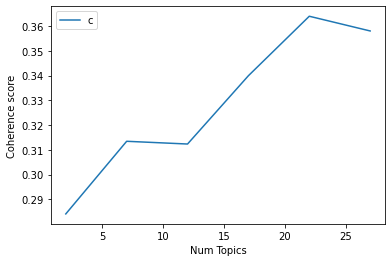

In [280]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us_2018_score1N2N3)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [281]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us_2018_score1N2N3):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 22

index: 0 | Num Topics = 2  has Coherence Value of 0.2841
index: 1 | Num Topics = 7  has Coherence Value of 0.3135
index: 2 | Num Topics = 12  has Coherence Value of 0.3124
index: 3 | Num Topics = 17  has Coherence Value of 0.34
index: 4 | Num Topics = 22  has Coherence Value of 0.364
index: 5 | Num Topics = 27  has Coherence Value of 0.3581


In [282]:
# Select optimal number of topics
optimal_model_us_2018_score1N2N3 = model_list_us_2018_score1N2N3[4]

In [283]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us_2018_score1N2N3 = pyLDAvis.gensim_models.prepare(optimal_model_us_2018_score1N2N3, corpus_us_2018_score1N2N3, id2word_us_2018_score1N2N3)

In [284]:
print("pyLDAVis for us topics for score=1,2,3 in 2018:")
vis_us_2018_score1N2N3

pyLDAVis for us topics for score=1,2,3 in 2018:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
15    -0.046457  0.018916       1        1  11.725413
19    -0.088996 -0.017918       2        1   8.597470
21    -0.114311  0.136350       3        1   8.289201
9     -0.003233  0.016371       4        1   7.749829
2     -0.007202  0.122517       5        1   6.838215
10    -0.123362  0.037444       6        1   6.177229
1     -0.089859 -0.035263       7        1   5.037335
3      0.082096  0.130429       8        1   4.916167
18     0.113963  0.069547       9        1   4.628992
7     -0.082332 -0.008740      10        1   4.628063
8     -0.054213 -0.144519      11        1   4.541195
16    -0.035025 -0.031891      12        1   3.923302
4     -0.035502 -0.038209      13        1   3.877936
6     -0.036840 -0.098522      14        1   3.760034
0     -0.026264  0.031740      15        1   3.721615
5      0.080640  0.020850      16        1   3.354306
11     0.032945 -0.035196      17        1   1.994469
17     0.060330 -0.028695      18        1   1.829666
13     0.103289 -0.008781      19        1   1.541382
12     0.035324 -0.037325      20        1   1.373004
14     0.112268 -0.038014      21        1   1.192918
20     0.122742 -0.061091      22        1   0.302259, topic_info=        Term       Freq       Total Category  logprob  loglift
32      song   59.00000   59.000000  Default  30.0000  30.0000
26     music   56.00000   56.000000  Default  29.0000  29.0000
58   triller   56.00000   56.000000  Default  28.0000  28.0000
54      save   30.00000   30.000000  Default  27.0000  27.0000
0        app  113.00000  113.000000  Default  26.0000  26.0000
..       ...        ...         ...      ...      ...      ...
254   lately    0.01228    2.425911  Topic22  -6.5511   0.5157
460    maker    0.01228    2.240257  Topic22  -6.5511   0.5953
3       love    0.01228   22.971739  Topic22  -6.5511  -1.7324
233      new    0.01228   17.870862  Topic22  -6.5511  -1.4813
250     half    0.01228    1.586546  Topic22  -6.5511   0.9403

[1141 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
411      11  0.650478  ability
217       1  0.225724     able
217       2  0.112862     able
217       6  0.225724     able
217       7  0.112862     able
...     ...       ...      ...
680      16  0.663779       xs
325       8  0.642937     yeoo
294       1  0.795063      yet
699       7  0.834825    young
599       6  0.632481     zoom

[1527 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[16, 20, 22, 10, 3, 11, 2, 4, 19, 8, 9, 17, 5, 7, 1, 6, 12, 18, 14, 13, 15, 21])

## By-rating of 2019 (Rating=1,2,3)

In [285]:
# By-rating Topic Modelling - rating = 1,2,3 in 2019
# Convert to list - move to each section
review_us_2019_score1N2N3 = triller_ios_us_review_YearMonth_2019_score1N2N3.review.values.tolist()
review_words_us_2019_score1N2N3 = list(sent_to_words(review_us_2019_score1N2N3))
print(review_words_us_2019_score1N2N3[:1])

[['if', 'pick', 'song', 'to', 'dance', 'to', 'want', 'to', 'be', 'able', 'to', 'choose', 'my', 'favorite', 'part', 'of', 'the', 'song', 'this', 'app', 'doesn', 'allow', 'that', 'it', 'only', 'has', 'seconds', 'available', 'which', 'is', 'pretty', 'whack']]


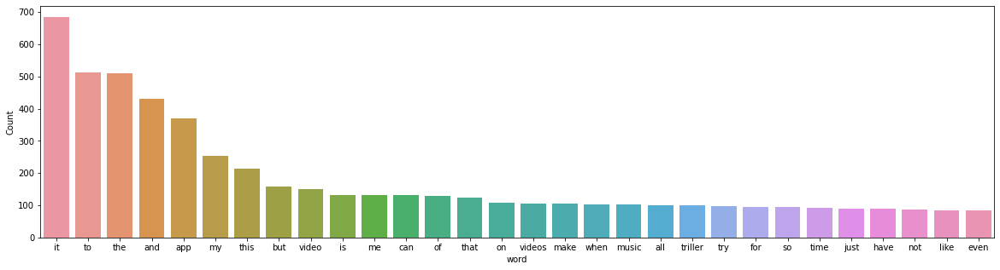

In [286]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us_2019_score1N2N3))

In [287]:
# Clean text
review_words_us_ready_2019_score1N2N3 = process_words(review_words_us_2019_score1N2N3)  # processed Text Data! - move to each section

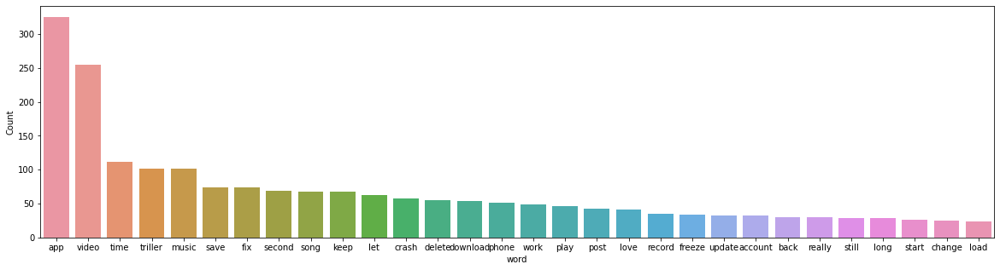

In [288]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_words_us_ready_2019_score1N2N3))


In [289]:
# Create Dictionary
id2word_us_2019_score1N2N3 = corpora.Dictionary(review_words_us_ready_2019_score1N2N3)

2021-10-20 17:03:27,239 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-20 17:03:27,247 [INFO] gensim.corpora.dictionary - built Dictionary(864 unique tokens: ['able', 'allow', 'available', 'choose', 'dance']...) from 395 documents (total 4682 corpus positions)
2021-10-20 17:03:27,248 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(864 unique tokens: ['able', 'allow', 'available', 'choose', 'dance']...) from 395 documents (total 4682 corpus positions)", 'datetime': '2021-10-20T17:03:27.248494', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [290]:
# Create Corpus: Term Document Frequency
corpus_us_2019_score1N2N3 = [id2word_us_2019_score1N2N3.doc2bow(text) for text in review_words_us_ready_2019_score1N2N3]

In [291]:
# Training LDA model
model_list_us_2019_score1N2N3, coherence_values_us_2019_score1N2N3 = compute_coherence_values(dictionary=id2word_us_2019_score1N2N3, corpus=corpus_us_2019_score1N2N3, 
                                                              texts=review_words_us_ready_2019_score1N2N3, limit=30, start=2, step=5)


2021-10-20 17:03:27,262 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-20 17:03:27,263 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-20 17:03:27,264 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 17:03:27,266 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 395 documents, updating model once every 395 documents, evaluating perplexity every 395 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-20 17:03:27,584 [INFO] gensim.models.ldamodel - -7.342 per-word bound, 162.2 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:03:27,585 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #395/395
2021-10-20 17:03:27,839 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.067*"app" + 0.036*"video" + 0.027*"music" + 0.023*"triller" + 0.015*"keep" + 0.015*"time" + 0.013*"let

2021-10-20 17:03:30,589 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.060*"video" + 0.046*"app" + 0.025*"second" + 0.025*"time" + 0.021*"save" + 0.019*"song" + 0.016*"triller" + 0.014*"crash" + 0.014*"fix" + 0.012*"record"
2021-10-20 17:03:30,590 [INFO] gensim.models.ldamodel - topic diff=0.016654, rho=0.301511
2021-10-20 17:03:30,736 [INFO] gensim.models.ldamodel - -5.903 per-word bound, 59.8 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:03:30,737 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #395/395
2021-10-20 17:03:30,845 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.072*"app" + 0.034*"music" + 0.031*"video" + 0.021*"triller" + 0.019*"keep" + 0.017*"download" + 0.016*"time" + 0.015*"phone" + 0.015*"work" + 0.013*"post"
2021-10-20 17:03:30,845 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.061*"video" + 0.045*"app" + 0.025*"second" + 0.024*"time" + 0.021*"save" + 0.019*"song" + 0.016*"triller" + 0.014*

2021-10-20 17:03:33,108 [INFO] gensim.models.ldamodel - topic diff=0.007405, rho=0.218218
2021-10-20 17:03:33,249 [INFO] gensim.models.ldamodel - -5.894 per-word bound, 59.5 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:03:33,250 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #395/395
2021-10-20 17:03:33,361 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.073*"app" + 0.035*"music" + 0.031*"video" + 0.021*"triller" + 0.019*"keep" + 0.018*"download" + 0.018*"time" + 0.015*"work" + 0.015*"play" + 0.015*"phone"
2021-10-20 17:03:33,362 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.061*"video" + 0.044*"app" + 0.025*"second" + 0.023*"save" + 0.023*"time" + 0.020*"song" + 0.016*"triller" + 0.014*"crash" + 0.013*"record" + 0.013*"fix"
2021-10-20 17:03:33,363 [INFO] gensim.models.ldamodel - topic diff=0.006961, rho=0.213201
2021-10-20 17:03:33,531 [INFO] gensim.models.ldamodel - -5.894 per-word bound, 59.5 perplexity estim

2021-10-20 17:03:35,984 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #395/395
2021-10-20 17:03:36,100 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.073*"app" + 0.035*"music" + 0.032*"video" + 0.021*"triller" + 0.020*"keep" + 0.018*"time" + 0.018*"download" + 0.016*"play" + 0.016*"work" + 0.015*"phone"
2021-10-20 17:03:36,101 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.061*"video" + 0.044*"app" + 0.026*"second" + 0.024*"save" + 0.022*"time" + 0.020*"song" + 0.016*"triller" + 0.014*"crash" + 0.013*"record" + 0.012*"fix"
2021-10-20 17:03:36,102 [INFO] gensim.models.ldamodel - topic diff=0.003997, rho=0.176777
2021-10-20 17:03:36,250 [INFO] gensim.models.ldamodel - -5.891 per-word bound, 59.3 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:03:36,250 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #395/395
2021-10-20 17:03:36,356 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.073*"app" + 0.036*

2021-10-20 17:03:38,686 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.061*"video" + 0.044*"app" + 0.026*"second" + 0.025*"save" + 0.022*"time" + 0.020*"song" + 0.016*"triller" + 0.014*"crash" + 0.013*"record" + 0.012*"fix"
2021-10-20 17:03:38,687 [INFO] gensim.models.ldamodel - topic diff=0.002671, rho=0.154303
2021-10-20 17:03:38,835 [INFO] gensim.models.ldamodel - -5.889 per-word bound, 59.3 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:03:38,836 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #395/395
2021-10-20 17:03:38,939 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.073*"app" + 0.036*"music" + 0.032*"video" + 0.021*"triller" + 0.020*"keep" + 0.018*"time" + 0.018*"download" + 0.016*"play" + 0.016*"work" + 0.015*"fix"
2021-10-20 17:03:38,940 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.061*"video" + 0.044*"app" + 0.026*"second" + 0.025*"save" + 0.022*"time" + 0.020*"song" + 0.016*"triller" + 0.014*"c

2021-10-20 17:03:42,632 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 380 virtual documents
2021-10-20 17:03:42,744 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.14285714285714285
2021-10-20 17:03:42,745 [INFO] gensim.models.ldamodel - using symmetric eta at 0.14285714285714285
2021-10-20 17:03:42,747 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 17:03:42,750 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 7 topics, 50 passes over the supplied corpus of 395 documents, updating model once every 395 documents, evaluating perplexity every 395 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-20 17:03:43,005 [INFO] gensim.models.ldamodel - -8.691 per-word bound, 413.2 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:03:43,005 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #395/395
2021-10-20 17:03

2021-10-20 17:03:44,424 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #395/395
2021-10-20 17:03:44,524 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.049*"video" + 0.040*"app" + 0.024*"play" + 0.021*"song" + 0.019*"music" + 0.016*"way" + 0.013*"save" + 0.013*"triller" + 0.013*"delete" + 0.011*"apple"
2021-10-20 17:03:44,525 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.056*"app" + 0.042*"video" + 0.029*"music" + 0.027*"save" + 0.025*"time" + 0.022*"crash" + 0.016*"record" + 0.016*"well" + 0.014*"freeze" + 0.014*"fix"
2021-10-20 17:03:44,526 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.070*"video" + 0.035*"save" + 0.035*"app" + 0.026*"crash" + 0.021*"triller" + 0.021*"update" + 0.018*"time" + 0.017*"music" + 0.017*"fix" + 0.016*"post"
2021-10-20 17:03:44,527 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.068*"video" + 0.054*"app" + 0.044*"second" + 0.031*"time" + 0.022*"fix" + 0.018*"long" + 0.017*"delete" + 0.016*"song" + 0.015*"triller" + 0.015*"

2021-10-20 17:03:45,698 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.047*"video" + 0.041*"app" + 0.025*"play" + 0.022*"song" + 0.019*"music" + 0.017*"way" + 0.013*"triller" + 0.013*"delete" + 0.011*"apple" + 0.010*"camera"
2021-10-20 17:03:45,699 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.075*"app" + 0.022*"time" + 0.019*"music" + 0.016*"love" + 0.014*"let" + 0.014*"phone" + 0.012*"never" + 0.012*"video" + 0.012*"second" + 0.012*"triller"
2021-10-20 17:03:45,700 [INFO] gensim.models.ldamodel - topic diff=0.024642, rho=0.288675
2021-10-20 17:03:45,865 [INFO] gensim.models.ldamodel - -6.173 per-word bound, 72.1 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:03:45,866 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #395/395
2021-10-20 17:03:45,963 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.068*"video" + 0.052*"app" + 0.046*"second" + 0.031*"time" + 0.021*"fix" + 0.019*"long" + 0.015*"let" + 0.015*"delet

2021-10-20 17:03:47,172 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.059*"app" + 0.045*"video" + 0.028*"save" + 0.028*"music" + 0.026*"time" + 0.023*"freeze" + 0.023*"crash" + 0.018*"everytime" + 0.018*"record" + 0.017*"well"
2021-10-20 17:03:47,173 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.089*"app" + 0.040*"keep" + 0.035*"video" + 0.028*"download" + 0.028*"work" + 0.023*"post" + 0.020*"let" + 0.020*"time" + 0.019*"fix" + 0.019*"triller"
2021-10-20 17:03:47,173 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.079*"video" + 0.043*"save" + 0.037*"app" + 0.028*"crash" + 0.023*"post" + 0.022*"time" + 0.021*"update" + 0.020*"triller" + 0.017*"fix" + 0.015*"music"
2021-10-20 17:03:47,174 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.074*"app" + 0.021*"time" + 0.019*"music" + 0.016*"love" + 0.015*"let" + 0.013*"phone" + 0.012*"never" + 0.012*"allow" + 0.012*"second" + 0.011*"triller"
2021-10-20 17:03:47,175 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.042*"vi

2021-10-20 17:03:48,378 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.089*"app" + 0.040*"keep" + 0.035*"video" + 0.029*"download" + 0.028*"work" + 0.022*"post" + 0.021*"let" + 0.020*"time" + 0.019*"fix" + 0.019*"triller"
2021-10-20 17:03:48,379 [INFO] gensim.models.ldamodel - topic diff=0.006696, rho=0.208514
2021-10-20 17:03:48,523 [INFO] gensim.models.ldamodel - -6.153 per-word bound, 71.2 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:03:48,524 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #395/395
2021-10-20 17:03:48,611 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.061*"app" + 0.047*"video" + 0.028*"save" + 0.027*"time" + 0.024*"crash" + 0.024*"freeze" + 0.023*"music" + 0.019*"everytime" + 0.018*"record" + 0.017*"well"
2021-10-20 17:03:48,612 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.061*"app" + 0.051*"music" + 0.036*"triller" + 0.032*"song" + 0.027*"video" + 0.026*"play" + 0.024*"phone" + 0.015*

2021-10-20 17:03:49,790 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.082*"video" + 0.045*"save" + 0.038*"app" + 0.027*"crash" + 0.024*"post" + 0.021*"time" + 0.020*"update" + 0.020*"triller" + 0.016*"fix" + 0.014*"fun"
2021-10-20 17:03:49,791 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.089*"app" + 0.040*"keep" + 0.034*"video" + 0.030*"download" + 0.029*"work" + 0.022*"post" + 0.021*"let" + 0.020*"time" + 0.019*"fix" + 0.019*"triller"
2021-10-20 17:03:49,792 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.061*"app" + 0.052*"music" + 0.036*"triller" + 0.033*"song" + 0.026*"video" + 0.026*"play" + 0.024*"phone" + 0.015*"download" + 0.014*"open" + 0.012*"delete"
2021-10-20 17:03:49,793 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.063*"app" + 0.050*"video" + 0.030*"time" + 0.028*"save" + 0.027*"crash" + 0.025*"freeze" + 0.019*"music" + 0.019*"everytime" + 0.018*"record" + 0.017*"upload"
2021-10-20 17:03:49,793 [INFO] gensim.models.ldamodel - topic diff=0.004304, rh

2021-10-20 17:03:50,987 [INFO] gensim.models.ldamodel - topic diff=0.003587, rho=0.171499
2021-10-20 17:03:51,148 [INFO] gensim.models.ldamodel - -6.145 per-word bound, 70.8 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:03:51,148 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #395/395
2021-10-20 17:03:51,253 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.068*"video" + 0.050*"second" + 0.049*"app" + 0.029*"time" + 0.021*"long" + 0.018*"fix" + 0.016*"let" + 0.015*"account" + 0.015*"triller" + 0.014*"change"
2021-10-20 17:03:51,254 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.089*"app" + 0.041*"keep" + 0.032*"video" + 0.031*"download" + 0.029*"work" + 0.022*"post" + 0.021*"let" + 0.020*"time" + 0.019*"fix" + 0.019*"triller"
2021-10-20 17:03:51,255 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.039*"video" + 0.037*"app" + 0.027*"play" + 0.024*"song" + 0.022*"music" + 0.021*"way" + 0.018*"apple" + 0.014*"trille

2021-10-20 17:03:52,489 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.081*"video" + 0.045*"save" + 0.038*"app" + 0.027*"crash" + 0.024*"post" + 0.021*"update" + 0.020*"time" + 0.019*"triller" + 0.016*"fix" + 0.015*"fun"
2021-10-20 17:03:52,490 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.071*"app" + 0.033*"music" + 0.020*"time" + 0.016*"allow" + 0.016*"let" + 0.015*"love" + 0.013*"apple" + 0.012*"phone" + 0.011*"second" + 0.011*"never"
2021-10-20 17:03:52,491 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.089*"app" + 0.040*"keep" + 0.032*"download" + 0.032*"video" + 0.030*"work" + 0.022*"post" + 0.021*"let" + 0.021*"time" + 0.019*"fix" + 0.019*"triller"
2021-10-20 17:03:52,492 [INFO] gensim.models.ldamodel - topic diff=0.003557, rho=0.158114
2021-10-20 17:03:52,647 [INFO] gensim.models.ldamodel - -6.141 per-word bound, 70.6 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:03:52,648 [INFO] gensim.models.ldamodel - PROGRESS: 

2021-10-20 17:03:53,816 [INFO] gensim.models.ldamodel - -6.138 per-word bound, 70.4 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:03:53,817 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #395/395
2021-10-20 17:03:53,913 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.068*"video" + 0.051*"second" + 0.048*"app" + 0.028*"time" + 0.021*"long" + 0.018*"fix" + 0.017*"let" + 0.016*"account" + 0.015*"triller" + 0.014*"change"
2021-10-20 17:03:53,914 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.071*"app" + 0.038*"music" + 0.019*"time" + 0.018*"allow" + 0.015*"let" + 0.015*"love" + 0.014*"apple" + 0.012*"phone" + 0.011*"second" + 0.011*"never"
2021-10-20 17:03:53,914 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.067*"app" + 0.061*"video" + 0.035*"time" + 0.032*"freeze" + 0.031*"save" + 0.029*"crash" + 0.023*"upload" + 0.021*"fix" + 0.020*"well" + 0.019*"record"
2021-10-20 17:03:53,916 [INFO] gensim.models.ldamodel -

2021-10-20 17:03:55,067 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.070*"app" + 0.041*"music" + 0.019*"allow" + 0.019*"time" + 0.015*"let" + 0.015*"apple" + 0.015*"love" + 0.012*"phone" + 0.011*"second" + 0.011*"triller"
2021-10-20 17:03:55,068 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.060*"app" + 0.053*"music" + 0.036*"song" + 0.036*"triller" + 0.026*"play" + 0.024*"video" + 0.024*"phone" + 0.016*"download" + 0.014*"open" + 0.013*"delete"
2021-10-20 17:03:55,069 [INFO] gensim.models.ldamodel - topic diff=0.002618, rho=0.140028
2021-10-20 17:03:55,070 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=864, num_topics=7, decay=0.5, chunksize=1000) in 12.32s', 'datetime': '2021-10-20T17:03:55.069993', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-20 17:03:55,072 [INFO] gensim.topic_coherence.probability_estimation - using Pa

2021-10-20 17:03:58,345 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.070*"app" + 0.045*"video" + 0.034*"music" + 0.027*"triller" + 0.023*"time" + 0.021*"song" + 0.020*"save" + 0.015*"post" + 0.015*"phone" + 0.013*"fix"
2021-10-20 17:03:58,346 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.062*"song" + 0.058*"music" + 0.045*"video" + 0.025*"apple" + 0.022*"app" + 0.022*"find" + 0.020*"play" + 0.014*"never" + 0.014*"allow" + 0.014*"load"
2021-10-20 17:03:58,347 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.092*"video" + 0.054*"app" + 0.042*"time" + 0.031*"save" + 0.019*"love" + 0.019*"crash" + 0.018*"post" + 0.018*"download" + 0.015*"work" + 0.015*"upload"
2021-10-20 17:03:58,348 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.048*"app" + 0.019*"video" + 0.015*"let" + 0.014*"keep" + 0.014*"really" + 0.014*"put" + 0.014*"mess" + 0.012*"fix" + 0.011*"record" + 0.011*"freeze"
2021-10-20 17:03:58,349 [INFO] gensim.models.ldamodel - topic diff=0.079561, rho=0.408248
202

2021-10-20 17:03:59,466 [INFO] gensim.models.ldamodel - topic diff=0.031277, rho=0.301511
2021-10-20 17:03:59,595 [INFO] gensim.models.ldamodel - -6.313 per-word bound, 79.5 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:03:59,596 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #395/395
2021-10-20 17:03:59,673 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.050*"triller" + 0.028*"video" + 0.023*"second" + 0.020*"app" + 0.018*"record" + 0.017*"song" + 0.011*"freeze" + 0.011*"fix" + 0.011*"tok" + 0.011*"connect"
2021-10-20 17:03:59,674 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.077*"app" + 0.043*"video" + 0.032*"music" + 0.027*"triller" + 0.023*"time" + 0.018*"song" + 0.018*"save" + 0.014*"fix" + 0.014*"phone" + 0.012*"post"
2021-10-20 17:03:59,675 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.097*"video" + 0.056*"app" + 0.044*"save" + 0.042*"time" + 0.025*"crash" + 0.022*"post" + 0.018*"love" + 0.018*"fix" 

2021-10-20 17:04:00,729 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.057*"video" + 0.042*"glitch" + 0.037*"app" + 0.032*"long" + 0.022*"least" + 0.021*"triller" + 0.020*"everytime" + 0.018*"save" + 0.017*"cut" + 0.015*"great"
2021-10-20 17:04:00,730 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.049*"triller" + 0.026*"video" + 0.023*"second" + 0.019*"app" + 0.019*"record" + 0.018*"song" + 0.012*"tok" + 0.012*"connect" + 0.012*"delete" + 0.012*"hate"
2021-10-20 17:04:00,731 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.079*"app" + 0.045*"video" + 0.030*"music" + 0.026*"triller" + 0.023*"time" + 0.017*"save" + 0.017*"song" + 0.014*"fix" + 0.014*"phone" + 0.012*"post"
2021-10-20 17:04:00,732 [INFO] gensim.models.ldamodel - topic diff=0.014581, rho=0.242536
2021-10-20 17:04:00,849 [INFO] gensim.models.ldamodel - -6.292 per-word bound, 78.4 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:00,850 [INFO] gensim.models.ldamodel

2021-10-20 17:04:01,769 [INFO] gensim.models.ldamodel - topic diff=0.009325, rho=0.213201
2021-10-20 17:04:01,887 [INFO] gensim.models.ldamodel - -6.283 per-word bound, 77.9 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:01,887 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #395/395
2021-10-20 17:04:01,962 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.082*"app" + 0.063*"music" + 0.050*"play" + 0.026*"phone" + 0.020*"delete" + 0.020*"time" + 0.020*"open" + 0.019*"triller" + 0.017*"keep" + 0.016*"bug"
2021-10-20 17:04:01,963 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.099*"app" + 0.025*"phone" + 0.021*"time" + 0.018*"song" + 0.017*"let" + 0.017*"second" + 0.017*"freeze" + 0.016*"video" + 0.015*"love" + 0.015*"allow"
2021-10-20 17:04:01,964 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.069*"app" + 0.040*"video" + 0.028*"triller" + 0.026*"download" + 0.022*"fix" + 0.018*"keep" + 0.017*"account" + 0.016*"s

2021-10-20 17:04:03,057 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.058*"video" + 0.051*"glitch" + 0.037*"app" + 0.031*"long" + 0.023*"triller" + 0.021*"least" + 0.019*"everytime" + 0.017*"save" + 0.016*"cut" + 0.015*"great"
2021-10-20 17:04:03,058 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.069*"app" + 0.040*"video" + 0.028*"triller" + 0.026*"download" + 0.023*"fix" + 0.018*"account" + 0.018*"keep" + 0.016*"start" + 0.016*"glitche" + 0.014*"delete"
2021-10-20 17:04:03,059 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.073*"second" + 0.058*"video" + 0.029*"app" + 0.025*"time" + 0.022*"account" + 0.018*"delete" + 0.018*"let" + 0.017*"option" + 0.015*"really" + 0.014*"song"
2021-10-20 17:04:03,061 [INFO] gensim.models.ldamodel - topic diff=0.006790, rho=0.188982
2021-10-20 17:04:03,192 [INFO] gensim.models.ldamodel - -6.276 per-word bound, 77.5 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:03,193 [INFO] gensim.model

2021-10-20 17:04:04,171 [INFO] gensim.models.ldamodel - topic diff=0.005103, rho=0.174078
2021-10-20 17:04:04,301 [INFO] gensim.models.ldamodel - -6.270 per-word bound, 77.2 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:04,301 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #395/395
2021-10-20 17:04:04,393 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.097*"video" + 0.060*"app" + 0.052*"save" + 0.041*"time" + 0.030*"crash" + 0.024*"post" + 0.021*"fix" + 0.019*"love" + 0.017*"upload" + 0.016*"download"
2021-10-20 17:04:04,394 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.069*"app" + 0.040*"video" + 0.027*"triller" + 0.026*"download" + 0.024*"fix" + 0.020*"account" + 0.019*"keep" + 0.016*"glitche" + 0.016*"start" + 0.014*"delete"
2021-10-20 17:04:04,395 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.095*"app" + 0.068*"keep" + 0.040*"crash" + 0.037*"video" + 0.037*"work" + 0.028*"post" + 0.022*"time" + 0.019

2021-10-20 17:04:05,579 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.069*"app" + 0.040*"video" + 0.026*"download" + 0.026*"triller" + 0.024*"fix" + 0.020*"account" + 0.020*"keep" + 0.016*"glitche" + 0.016*"start" + 0.014*"delete"
2021-10-20 17:04:05,580 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.096*"video" + 0.060*"app" + 0.052*"save" + 0.041*"time" + 0.030*"crash" + 0.024*"post" + 0.021*"fix" + 0.019*"love" + 0.017*"upload" + 0.015*"download"
2021-10-20 17:04:05,581 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.095*"app" + 0.069*"keep" + 0.040*"crash" + 0.037*"video" + 0.036*"work" + 0.028*"post" + 0.022*"time" + 0.020*"load" + 0.019*"triller" + 0.018*"fix"
2021-10-20 17:04:05,582 [INFO] gensim.models.ldamodel - topic diff=0.003562, rho=0.160128
2021-10-20 17:04:05,732 [INFO] gensim.models.ldamodel - -6.266 per-word bound, 77.0 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:05,733 [INFO] gensim.models.ldamodel - 

2021-10-20 17:04:06,881 [INFO] gensim.models.ldamodel - topic diff=0.003078, rho=0.150756
2021-10-20 17:04:07,009 [INFO] gensim.models.ldamodel - -6.264 per-word bound, 76.8 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:07,010 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #395/395
2021-10-20 17:04:07,091 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.081*"app" + 0.048*"video" + 0.025*"triller" + 0.024*"time" + 0.020*"music" + 0.018*"save" + 0.018*"song" + 0.015*"fix" + 0.014*"phone" + 0.012*"screen"
2021-10-20 17:04:07,092 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.044*"triller" + 0.025*"video" + 0.019*"record" + 0.018*"song" + 0.017*"app" + 0.015*"second" + 0.013*"delete" + 0.013*"tok" + 0.013*"link" + 0.013*"connect"
2021-10-20 17:04:07,093 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.096*"music" + 0.069*"song" + 0.038*"video" + 0.036*"apple" + 0.034*"allow" + 0.029*"find" + 0.019*"never" + 0.018

2021-10-20 17:04:08,194 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.058*"video" + 0.046*"music" + 0.028*"app" + 0.022*"save" + 0.018*"triller" + 0.018*"time" + 0.018*"constantly" + 0.014*"search" + 0.014*"find" + 0.014*"freeze"
2021-10-20 17:04:08,195 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.033*"app" + 0.020*"really" + 0.020*"put" + 0.017*"let" + 0.016*"mess" + 0.012*"watermark" + 0.012*"purchase" + 0.012*"support" + 0.012*"full" + 0.012*"pay"
2021-10-20 17:04:08,196 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.096*"video" + 0.060*"app" + 0.053*"save" + 0.040*"time" + 0.030*"crash" + 0.024*"post" + 0.021*"fix" + 0.019*"love" + 0.017*"upload" + 0.015*"download"
2021-10-20 17:04:08,196 [INFO] gensim.models.ldamodel - topic diff=0.002426, rho=0.141421
2021-10-20 17:04:08,321 [INFO] gensim.models.ldamodel - -6.261 per-word bound, 76.7 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:08,322 [INFO] gensim.models.ldam

2021-10-20 17:04:11,727 [INFO] gensim.models.ldamodel - -6.542 per-word bound, 93.2 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:11,728 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #395/395
2021-10-20 17:04:11,815 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.053*"app" + 0.046*"keep" + 0.029*"video" + 0.027*"download" + 0.025*"message" + 0.022*"fix" + 0.020*"crash" + 0.018*"account" + 0.018*"time" + 0.018*"triller"
2021-10-20 17:04:11,816 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.082*"app" + 0.029*"music" + 0.023*"time" + 0.021*"phone" + 0.020*"love" + 0.017*"triller" + 0.015*"download" + 0.015*"work" + 0.014*"let" + 0.014*"never"
2021-10-20 17:04:11,816 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.041*"app" + 0.039*"video" + 0.024*"freeze" + 0.024*"keep" + 0.016*"pay" + 0.016*"watermark" + 0.014*"download" + 0.013*"let" + 0.012*"upgrade" + 0.012*"thriller"
2021-10-20 17:04:11,817 [INFO] gensim

2021-10-20 17:04:12,940 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.075*"video" + 0.052*"time" + 0.045*"app" + 0.025*"triller" + 0.023*"crash" + 0.023*"fix" + 0.022*"freeze" + 0.021*"glitch" + 0.018*"keep" + 0.018*"let"
2021-10-20 17:04:12,941 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.077*"crash" + 0.076*"app" + 0.071*"save" + 0.059*"video" + 0.040*"time" + 0.028*"post" + 0.027*"keep" + 0.022*"fix" + 0.016*"record" + 0.016*"bug"
2021-10-20 17:04:12,942 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.048*"music" + 0.047*"video" + 0.030*"phone" + 0.028*"triller" + 0.025*"find" + 0.020*"app" + 0.017*"create" + 0.017*"delete" + 0.017*"stay" + 0.017*"search"
2021-10-20 17:04:12,942 [INFO] gensim.models.ldamodel - topic diff=0.038690, rho=0.316228
2021-10-20 17:04:13,068 [INFO] gensim.models.ldamodel - -6.460 per-word bound, 88.0 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:13,069 [INFO] gensim.models.ldamodel - PROGRE

2021-10-20 17:04:14,104 [INFO] gensim.models.ldamodel - topic diff=0.017418, rho=0.258199
2021-10-20 17:04:14,230 [INFO] gensim.models.ldamodel - -6.438 per-word bound, 86.7 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:14,231 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #395/395
2021-10-20 17:04:14,316 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.035*"video" + 0.033*"keep" + 0.033*"song" + 0.022*"find" + 0.022*"people" + 0.022*"like" + 0.022*"remove" + 0.022*"watermark" + 0.022*"way" + 0.012*"fix"
2021-10-20 17:04:14,317 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.056*"video" + 0.036*"music" + 0.023*"download" + 0.022*"update" + 0.021*"save" + 0.020*"app" + 0.018*"crash" + 0.018*"load" + 0.015*"triller" + 0.013*"search"
2021-10-20 17:04:14,317 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.090*"app" + 0.050*"video" + 0.050*"play" + 0.043*"music" + 0.020*"phone" + 0.018*"keep" + 0.013*"song" + 0.

2021-10-20 17:04:15,377 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.082*"video" + 0.037*"app" + 0.030*"time" + 0.023*"delete" + 0.017*"save" + 0.016*"clip" + 0.015*"fix" + 0.015*"update" + 0.013*"triller" + 0.013*"post"
2021-10-20 17:04:15,379 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.068*"app" + 0.057*"music" + 0.031*"delete" + 0.031*"apple" + 0.027*"video" + 0.022*"still" + 0.022*"time" + 0.022*"download" + 0.017*"work" + 0.017*"let"
2021-10-20 17:04:15,380 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.072*"app" + 0.030*"video" + 0.021*"keep" + 0.021*"people" + 0.021*"let" + 0.017*"download" + 0.016*"account" + 0.016*"thing" + 0.015*"away" + 0.015*"great"
2021-10-20 17:04:15,381 [INFO] gensim.models.ldamodel - topic diff=0.009846, rho=0.218218
2021-10-20 17:04:15,502 [INFO] gensim.models.ldamodel - -6.422 per-word bound, 85.7 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:15,502 [INFO] gensim.models.ldamodel -

2021-10-20 17:04:16,538 [INFO] gensim.models.ldamodel - topic diff=0.007805, rho=0.196116
2021-10-20 17:04:16,681 [INFO] gensim.models.ldamodel - -6.417 per-word bound, 85.4 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:16,682 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #395/395
2021-10-20 17:04:16,760 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.104*"app" + 0.045*"video" + 0.030*"fix" + 0.029*"triller" + 0.028*"post" + 0.027*"time" + 0.024*"work" + 0.024*"save" + 0.021*"load" + 0.013*"close"
2021-10-20 17:04:16,761 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.038*"app" + 0.033*"video" + 0.024*"freeze" + 0.024*"keep" + 0.018*"watermark" + 0.018*"pay" + 0.018*"upgrade" + 0.016*"download" + 0.013*"let" + 0.013*"glitche"
2021-10-20 17:04:16,762 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.079*"app" + 0.035*"music" + 0.023*"phone" + 0.021*"time" + 0.017*"love" + 0.017*"download" + 0.017*"triller" +

2021-10-20 17:04:17,892 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.083*"app" + 0.082*"crash" + 0.077*"save" + 0.072*"video" + 0.044*"time" + 0.036*"fix" + 0.034*"post" + 0.032*"keep" + 0.019*"problem" + 0.018*"upload"
2021-10-20 17:04:17,893 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.092*"app" + 0.051*"play" + 0.049*"video" + 0.043*"music" + 0.020*"phone" + 0.018*"keep" + 0.013*"happen" + 0.012*"fix" + 0.012*"song" + 0.012*"delete"
2021-10-20 17:04:17,894 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.082*"video" + 0.036*"app" + 0.030*"time" + 0.023*"delete" + 0.017*"clip" + 0.016*"save" + 0.015*"fix" + 0.014*"update" + 0.013*"triller" + 0.013*"close"
2021-10-20 17:04:17,895 [INFO] gensim.models.ldamodel - topic diff=0.006447, rho=0.176777
2021-10-20 17:04:18,024 [INFO] gensim.models.ldamodel - -6.410 per-word bound, 85.0 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:18,024 [INFO] gensim.models.ldamodel - PROGRE

2021-10-20 17:04:18,956 [INFO] gensim.models.ldamodel - topic diff=0.004478, rho=0.164399
2021-10-20 17:04:19,078 [INFO] gensim.models.ldamodel - -6.405 per-word bound, 84.7 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:19,079 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #395/395
2021-10-20 17:04:19,153 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.046*"music" + 0.040*"video" + 0.031*"phone" + 0.027*"find" + 0.026*"link" + 0.020*"triller" + 0.018*"search" + 0.018*"create" + 0.018*"stay" + 0.018*"delete"
2021-10-20 17:04:19,154 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.056*"video" + 0.039*"music" + 0.027*"download" + 0.025*"update" + 0.019*"save" + 0.018*"load" + 0.015*"app" + 0.015*"triller" + 0.013*"search" + 0.013*"phone"
2021-10-20 17:04:19,155 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.082*"video" + 0.037*"app" + 0.031*"time" + 0.023*"delete" + 0.017*"clip" + 0.016*"save" + 0.015*"fix" + 0

2021-10-20 17:04:20,250 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.072*"app" + 0.029*"video" + 0.022*"people" + 0.021*"let" + 0.019*"keep" + 0.018*"download" + 0.016*"thing" + 0.016*"away" + 0.015*"account" + 0.014*"great"
2021-10-20 17:04:20,251 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.049*"video" + 0.033*"app" + 0.032*"save" + 0.027*"back" + 0.022*"camera" + 0.022*"wish" + 0.020*"post" + 0.019*"triller" + 0.018*"song" + 0.016*"roll"
2021-10-20 17:04:20,252 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.082*"video" + 0.037*"app" + 0.031*"time" + 0.023*"delete" + 0.017*"clip" + 0.016*"save" + 0.015*"fix" + 0.014*"update" + 0.013*"triller" + 0.013*"create"
2021-10-20 17:04:20,252 [INFO] gensim.models.ldamodel - topic diff=0.003418, rho=0.152499
2021-10-20 17:04:20,390 [INFO] gensim.models.ldamodel - -6.401 per-word bound, 84.5 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:20,391 [INFO] gensim.models.ldamodel - P

2021-10-20 17:04:21,352 [INFO] gensim.models.ldamodel - topic diff=0.003027, rho=0.144338
2021-10-20 17:04:21,486 [INFO] gensim.models.ldamodel - -6.398 per-word bound, 84.4 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:21,487 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #395/395
2021-10-20 17:04:21,572 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.056*"video" + 0.039*"music" + 0.027*"download" + 0.026*"update" + 0.019*"save" + 0.018*"load" + 0.015*"triller" + 0.014*"app" + 0.013*"search" + 0.013*"phone"
2021-10-20 17:04:21,573 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.192*"song" + 0.040*"part" + 0.039*"pick" + 0.038*"triller" + 0.027*"choose" + 0.023*"video" + 0.018*"dance" + 0.016*"app" + 0.014*"record" + 0.013*"artist"
2021-10-20 17:04:21,574 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.069*"app" + 0.060*"music" + 0.032*"apple" + 0.032*"delete" + 0.024*"video" + 0.023*"still" + 0.022*"time"

2021-10-20 17:04:24,992 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.060*"app" + 0.046*"keep" + 0.035*"video" + 0.029*"let" + 0.020*"crash" + 0.018*"download" + 0.015*"glitche" + 0.015*"kick" + 0.015*"freeze" + 0.014*"fix"
2021-10-20 17:04:24,993 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.104*"app" + 0.040*"video" + 0.035*"triller" + 0.026*"work" + 0.025*"time" + 0.021*"fix" + 0.020*"save" + 0.019*"love" + 0.017*"download" + 0.016*"phone"
2021-10-20 17:04:24,994 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.098*"app" + 0.045*"video" + 0.036*"play" + 0.036*"music" + 0.025*"keep" + 0.022*"save" + 0.019*"time" + 0.017*"phone" + 0.016*"triller" + 0.015*"crash"
2021-10-20 17:04:24,994 [INFO] gensim.models.ldamodel - topic diff=0.155685, rho=0.577350
2021-10-20 17:04:25,123 [INFO] gensim.models.ldamodel - -6.721 per-word bound, 105.5 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:25,124 [INFO] gensim.models.ldamodel - 

2021-10-20 17:04:26,142 [INFO] gensim.models.ldamodel - topic diff=0.073795, rho=0.353553
2021-10-20 17:04:26,279 [INFO] gensim.models.ldamodel - -6.563 per-word bound, 94.6 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:26,280 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #395/395
2021-10-20 17:04:26,368 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.079*"app" + 0.047*"triller" + 0.030*"video" + 0.030*"everytime" + 0.028*"post" + 0.027*"time" + 0.026*"save" + 0.023*"fix" + 0.023*"work" + 0.021*"phone"
2021-10-20 17:04:26,370 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.071*"video" + 0.056*"app" + 0.052*"time" + 0.037*"fix" + 0.033*"crash" + 0.030*"song" + 0.029*"delete" + 0.025*"save" + 0.024*"upload" + 0.022*"let"
2021-10-20 17:04:26,370 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.099*"app" + 0.042*"play" + 0.040*"video" + 0.031*"music" + 0.023*"keep" + 0.021*"save" + 0.020*"phone" + 0.018*"time" 

2021-10-20 17:04:27,432 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.106*"video" + 0.038*"app" + 0.023*"create" + 0.019*"download" + 0.018*"stop" + 0.016*"save" + 0.015*"love" + 0.015*"update" + 0.015*"time" + 0.011*"work"
2021-10-20 17:04:27,433 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.322*"second" + 0.073*"long" + 0.062*"change" + 0.050*"option" + 0.041*"video" + 0.038*"record" + 0.026*"import" + 0.025*"time" + 0.025*"put" + 0.021*"hate"
2021-10-20 17:04:27,434 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.100*"app" + 0.048*"video" + 0.035*"triller" + 0.030*"time" + 0.029*"work" + 0.028*"love" + 0.023*"fix" + 0.020*"save" + 0.018*"download" + 0.017*"phone"
2021-10-20 17:04:27,434 [INFO] gensim.models.ldamodel - topic diff=0.024779, rho=0.267261
2021-10-20 17:04:27,556 [INFO] gensim.models.ldamodel - -6.520 per-word bound, 91.8 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:27,557 [INFO] gensim.models.ldamodel

2021-10-20 17:04:28,518 [INFO] gensim.models.ldamodel - topic diff=0.013506, rho=0.229416
2021-10-20 17:04:28,651 [INFO] gensim.models.ldamodel - -6.505 per-word bound, 90.8 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:28,652 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #395/395
2021-10-20 17:04:28,733 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.083*"app" + 0.045*"triller" + 0.039*"save" + 0.032*"video" + 0.031*"post" + 0.029*"time" + 0.026*"everytime" + 0.025*"phone" + 0.023*"work" + 0.023*"fix"
2021-10-20 17:04:28,734 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.087*"video" + 0.060*"triller" + 0.047*"app" + 0.036*"freeze" + 0.024*"time" + 0.023*"work" + 0.021*"keep" + 0.015*"fix" + 0.015*"update" + 0.015*"song"
2021-10-20 17:04:28,734 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.106*"video" + 0.038*"app" + 0.023*"create" + 0.019*"download" + 0.018*"stop" + 0.016*"love" + 0.015*"update" + 0.01

2021-10-20 17:04:29,847 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.050*"video" + 0.029*"account" + 0.024*"crash" + 0.024*"app" + 0.024*"update" + 0.024*"follow" + 0.023*"load" + 0.019*"save" + 0.018*"look" + 0.018*"fun"
2021-10-20 17:04:29,847 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.054*"app" + 0.029*"video" + 0.020*"delete" + 0.020*"play" + 0.019*"fix" + 0.017*"time" + 0.017*"well" + 0.014*"sleep" + 0.014*"download" + 0.013*"phone"
2021-10-20 17:04:29,848 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.098*"app" + 0.038*"video" + 0.031*"triller" + 0.025*"play" + 0.022*"update" + 0.020*"fix" + 0.020*"music" + 0.018*"work" + 0.018*"start" + 0.016*"glitch"
2021-10-20 17:04:29,849 [INFO] gensim.models.ldamodel - topic diff=0.007479, rho=0.200000
2021-10-20 17:04:29,980 [INFO] gensim.models.ldamodel - -6.495 per-word bound, 90.2 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:29,981 [INFO] gensim.models.ldamodel - 

2021-10-20 17:04:30,930 [INFO] gensim.models.ldamodel - topic diff=0.005409, rho=0.182574
2021-10-20 17:04:31,063 [INFO] gensim.models.ldamodel - -6.488 per-word bound, 89.8 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:31,064 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #395/395
2021-10-20 17:04:31,141 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.074*"save" + 0.066*"video" + 0.059*"let" + 0.058*"crash" + 0.042*"app" + 0.031*"post" + 0.025*"time" + 0.024*"bug" + 0.018*"give" + 0.017*"star"
2021-10-20 17:04:31,142 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.062*"app" + 0.047*"screen" + 0.040*"everytime" + 0.027*"video" + 0.025*"save" + 0.022*"black" + 0.018*"phone" + 0.017*"part" + 0.017*"software" + 0.017*"update"
2021-10-20 17:04:31,142 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.057*"app" + 0.043*"freeze" + 0.040*"video" + 0.038*"always" + 0.038*"delete" + 0.034*"constantly" + 0.033*"still"

2021-10-20 17:04:32,207 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.151*"music" + 0.042*"app" + 0.041*"allow" + 0.038*"triller" + 0.036*"apple" + 0.032*"download" + 0.030*"let" + 0.030*"time" + 0.029*"video" + 0.020*"phone"
2021-10-20 17:04:32,208 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.056*"app" + 0.032*"video" + 0.031*"back" + 0.029*"time" + 0.026*"triller" + 0.020*"post" + 0.020*"crash" + 0.018*"upload" + 0.018*"save" + 0.017*"well"
2021-10-20 17:04:32,209 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.062*"app" + 0.047*"screen" + 0.040*"everytime" + 0.028*"video" + 0.025*"save" + 0.022*"black" + 0.018*"phone" + 0.017*"part" + 0.017*"software" + 0.017*"update"
2021-10-20 17:04:32,210 [INFO] gensim.models.ldamodel - topic diff=0.003694, rho=0.166667
2021-10-20 17:04:32,337 [INFO] gensim.models.ldamodel - -6.485 per-word bound, 89.6 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:32,338 [INFO] gensim.models.ld

2021-10-20 17:04:33,295 [INFO] gensim.models.ldamodel - topic diff=0.003236, rho=0.156174
2021-10-20 17:04:33,427 [INFO] gensim.models.ldamodel - -6.482 per-word bound, 89.4 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:33,428 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #395/395
2021-10-20 17:04:33,517 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.094*"app" + 0.028*"really" + 0.024*"annoying" + 0.023*"time" + 0.020*"video" + 0.019*"tiktok" + 0.019*"look" + 0.017*"let" + 0.015*"phone" + 0.015*"lose"
2021-10-20 17:04:33,518 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.102*"video" + 0.034*"app" + 0.024*"create" + 0.019*"download" + 0.019*"stop" + 0.016*"update" + 0.016*"love" + 0.012*"still" + 0.012*"clip" + 0.012*"work"
2021-10-20 17:04:33,519 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.044*"app" + 0.034*"video" + 0.027*"save" + 0.024*"record" + 0.020*"music" + 0.018*"recommend" + 0.015*"time" + 0.

2021-10-20 17:04:34,647 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.098*"app" + 0.043*"play" + 0.040*"video" + 0.030*"music" + 0.021*"keep" + 0.020*"phone" + 0.019*"save" + 0.017*"happen" + 0.016*"time" + 0.015*"screen"
2021-10-20 17:04:34,648 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.301*"second" + 0.075*"long" + 0.071*"change" + 0.058*"video" + 0.053*"option" + 0.046*"record" + 0.033*"time" + 0.030*"put" + 0.025*"import" + 0.020*"hate"
2021-10-20 17:04:34,649 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.054*"app" + 0.029*"video" + 0.021*"delete" + 0.020*"play" + 0.019*"fix" + 0.018*"time" + 0.018*"well" + 0.014*"sleep" + 0.013*"phone" + 0.012*"download"
2021-10-20 17:04:34,649 [INFO] gensim.models.ldamodel - topic diff=0.002706, rho=0.145865
2021-10-20 17:04:34,780 [INFO] gensim.models.ldamodel - -6.479 per-word bound, 89.2 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:34,780 [INFO] gensim.models.ldamodel 

2021-10-20 17:04:38,459 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #395/395
2021-10-20 17:04:38,612 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.031*"app" + 0.026*"crash" + 0.022*"couple" + 0.022*"music" + 0.022*"time" + 0.021*"triller" + 0.017*"star" + 0.011*"iphone" + 0.011*"segment" + 0.011*"frustrating"
2021-10-20 17:04:38,613 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.061*"app" + 0.054*"keep" + 0.044*"video" + 0.031*"fix" + 0.018*"cut" + 0.018*"song" + 0.018*"let" + 0.014*"time" + 0.013*"triller" + 0.013*"back"
2021-10-20 17:04:38,614 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.069*"video" + 0.040*"time" + 0.037*"app" + 0.032*"triller" + 0.031*"keep" + 0.018*"second" + 0.018*"upload" + 0.018*"music" + 0.017*"problem" + 0.017*"still"
2021-10-20 17:04:38,614 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.076*"app" + 0.035*"triller" + 0.034*"video" + 0.027*"second" + 0.026*"time" + 0.022*"account" + 0.020*"music" + 0.019*"phone" + 0.0

2021-10-20 17:04:39,680 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.087*"app" + 0.028*"record" + 0.025*"video" + 0.022*"triller" + 0.020*"time" + 0.019*"everytime" + 0.019*"save" + 0.017*"song" + 0.016*"let" + 0.013*"post"
2021-10-20 17:04:39,681 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.066*"app" + 0.027*"play" + 0.024*"home" + 0.022*"video" + 0.022*"let" + 0.022*"music" + 0.019*"page" + 0.016*"delete" + 0.016*"follow" + 0.016*"account"
2021-10-20 17:04:39,682 [INFO] gensim.models.ldamodel - topic diff=0.087662, rho=0.377964
2021-10-20 17:04:39,820 [INFO] gensim.models.ldamodel - -6.645 per-word bound, 100.1 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:39,820 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #395/395
2021-10-20 17:04:39,903 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.065*"app" + 0.027*"play" + 0.025*"home" + 0.022*"video" + 0.022*"let" + 0.020*"music" + 0.020*"page" + 0.017*"d

2021-10-20 17:04:40,877 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #395/395
2021-10-20 17:04:40,964 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.192*"music" + 0.046*"apple" + 0.037*"find" + 0.035*"allow" + 0.035*"app" + 0.031*"triller" + 0.025*"play" + 0.024*"result" + 0.023*"delete" + 0.022*"download"
2021-10-20 17:04:40,966 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.067*"video" + 0.043*"save" + 0.043*"triller" + 0.034*"fun" + 0.033*"crash" + 0.032*"update" + 0.022*"app" + 0.020*"time" + 0.019*"search" + 0.016*"look"
2021-10-20 17:04:40,967 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.045*"app" + 0.040*"download" + 0.039*"let" + 0.026*"video" + 0.021*"well" + 0.021*"mad" + 0.018*"new" + 0.011*"boy" + 0.011*"block" + 0.011*"bad"
2021-10-20 17:04:40,968 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.101*"app" + 0.024*"phone" + 0.020*"reason" + 0.019*"time" + 0.016*"week" + 0.016*"give" + 0.015*"thing" + 0.014*"long" + 0.013*"fix" + 0.01

2021-10-20 17:04:42,065 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.064*"app" + 0.032*"home" + 0.026*"page" + 0.024*"play" + 0.023*"video" + 0.021*"let" + 0.019*"download" + 0.017*"delete" + 0.017*"account" + 0.017*"follow"
2021-10-20 17:04:42,066 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.200*"music" + 0.047*"apple" + 0.040*"allow" + 0.036*"find" + 0.035*"app" + 0.032*"triller" + 0.026*"play" + 0.024*"download" + 0.023*"result" + 0.022*"delete"
2021-10-20 17:04:42,067 [INFO] gensim.models.ldamodel - topic diff=0.019858, rho=0.235702
2021-10-20 17:04:42,199 [INFO] gensim.models.ldamodel - -6.551 per-word bound, 93.8 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:42,200 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #395/395
2021-10-20 17:04:42,286 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.064*"app" + 0.033*"home" + 0.027*"page" + 0.024*"play" + 0.023*"video" + 0.021*"let" + 0.019*"download" 

2021-10-20 17:04:43,329 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #395/395
2021-10-20 17:04:43,414 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.083*"app" + 0.051*"fix" + 0.038*"triller" + 0.034*"work" + 0.022*"time" + 0.022*"song" + 0.019*"video" + 0.018*"record" + 0.014*"way" + 0.014*"close"
2021-10-20 17:04:43,414 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.067*"app" + 0.043*"let" + 0.039*"video" + 0.026*"put" + 0.026*"still" + 0.024*"really" + 0.022*"music" + 0.018*"time" + 0.018*"thing" + 0.016*"click"
2021-10-20 17:04:43,415 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.094*"app" + 0.050*"video" + 0.044*"keep" + 0.037*"let" + 0.037*"download" + 0.031*"time" + 0.025*"kick" + 0.021*"work" + 0.017*"account" + 0.017*"fix"
2021-10-20 17:04:43,416 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.096*"keep" + 0.078*"app" + 0.055*"video" + 0.044*"fix" + 0.028*"crash" + 0.022*"start" + 0.022*"let" + 0.018*"song" + 0.018*"freeze" + 0.017*"pick"

2021-10-20 17:04:44,472 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.095*"keep" + 0.076*"app" + 0.055*"video" + 0.044*"fix" + 0.026*"crash" + 0.022*"start" + 0.022*"let" + 0.018*"song" + 0.018*"freeze" + 0.017*"pick"
2021-10-20 17:04:44,473 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.042*"download" + 0.042*"let" + 0.040*"app" + 0.023*"video" + 0.021*"well" + 0.021*"mad" + 0.018*"new" + 0.011*"watch" + 0.011*"much" + 0.011*"bad"
2021-10-20 17:04:44,473 [INFO] gensim.models.ldamodel - topic diff=0.008436, rho=0.185695
2021-10-20 17:04:44,614 [INFO] gensim.models.ldamodel - -6.526 per-word bound, 92.2 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:44,614 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #395/395
2021-10-20 17:04:44,704 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.090*"app" + 0.041*"video" + 0.041*"load" + 0.037*"work" + 0.024*"post" + 0.024*"fix" + 0.023*"triller" + 0.022*"close" + 0.02

2021-10-20 17:04:45,755 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #395/395
2021-10-20 17:04:45,839 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.207*"music" + 0.047*"apple" + 0.043*"allow" + 0.036*"app" + 0.035*"find" + 0.032*"triller" + 0.027*"play" + 0.026*"download" + 0.023*"result" + 0.021*"delete"
2021-10-20 17:04:45,840 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.068*"freeze" + 0.046*"video" + 0.037*"crash" + 0.036*"record" + 0.022*"well" + 0.022*"thriller" + 0.022*"bug" + 0.020*"app" + 0.018*"update" + 0.018*"time"
2021-10-20 17:04:45,840 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.041*"video" + 0.034*"song" + 0.034*"app" + 0.022*"record" + 0.020*"delete" + 0.020*"freeze" + 0.016*"time" + 0.014*"able" + 0.014*"music" + 0.014*"triller"
2021-10-20 17:04:45,841 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.061*"great" + 0.046*"long" + 0.045*"problem" + 0.037*"love" + 0.035*"app" + 0.028*"storage" + 0.028*"tiktok" + 0.028*"least" + 

2021-10-20 17:04:46,946 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.117*"video" + 0.113*"save" + 0.109*"app" + 0.088*"crash" + 0.072*"time" + 0.069*"post" + 0.034*"upload" + 0.031*"fix" + 0.023*"keep" + 0.017*"download"
2021-10-20 17:04:46,947 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.089*"app" + 0.041*"load" + 0.041*"work" + 0.039*"video" + 0.024*"post" + 0.024*"fix" + 0.022*"triller" + 0.021*"slow" + 0.021*"always" + 0.021*"close"
2021-10-20 17:04:46,948 [INFO] gensim.models.ldamodel - topic diff=0.004199, rho=0.158114
2021-10-20 17:04:47,062 [INFO] gensim.models.ldamodel - -6.516 per-word bound, 91.5 perplexity estimate based on a held-out corpus of 395 documents with 4682 words
2021-10-20 17:04:47,062 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #395/395
2021-10-20 17:04:47,140 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.091*"app" + 0.028*"record" + 0.025*"everytime" + 0.022*"video" + 0.021*"time" + 0.020*"triller" + 0.018*"let" + 0.01

2021-10-20 17:04:48,145 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #395/395
2021-10-20 17:04:48,217 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.110*"app" + 0.033*"love" + 0.028*"phone" + 0.024*"time" + 0.023*"work" + 0.019*"completely" + 0.018*"video" + 0.017*"really" + 0.016*"triller" + 0.014*"freeze"
2021-10-20 17:04:48,219 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.041*"video" + 0.035*"song" + 0.026*"app" + 0.024*"record" + 0.021*"delete" + 0.021*"freeze" + 0.016*"time" + 0.016*"able" + 0.014*"music" + 0.014*"triller"
2021-10-20 17:04:48,219 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.061*"video" + 0.042*"keep" + 0.025*"app" + 0.024*"time" + 0.023*"still" + 0.023*"problem" + 0.023*"connect" + 0.018*"freeze" + 0.017*"triller" + 0.012*"turn"
2021-10-20 17:04:48,220 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.300*"second" + 0.079*"change" + 0.065*"long" + 0.057*"video" + 0.047*"time" + 0.042*"record" + 0.038*"put" + 0.031*"fix" + 0.

2021-10-20 17:04:49,230 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.062*"app" + 0.035*"home" + 0.030*"page" + 0.022*"play" + 0.021*"video" + 0.020*"download" + 0.019*"let" + 0.018*"account" + 0.018*"follow" + 0.018*"time"
2021-10-20 17:04:49,232 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.066*"video" + 0.057*"wish" + 0.046*"really" + 0.039*"way" + 0.038*"app" + 0.038*"option" + 0.029*"save" + 0.029*"remove" + 0.029*"watermark" + 0.029*"let"
2021-10-20 17:04:49,232 [INFO] gensim.models.ldamodel - topic diff=0.003051, rho=0.140028
2021-10-20 17:04:49,233 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=864, num_topics=27, decay=0.5, chunksize=1000) in 10.99s', 'datetime': '2021-10-20T17:04:49.233557', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-20 17:04:49,241 [INFO] gensim.topic_coherence.probability_estimation - using 

In [292]:
%store model_list_us_2019_score1N2N3
%store coherence_values_us_2019_score1N2N3

Stored 'model_list_us_2019_score1N2N3' (list)
Stored 'coherence_values_us_2019_score1N2N3' (list)


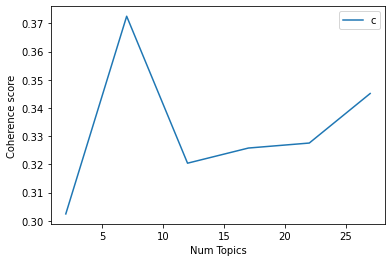

In [293]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us_2019_score1N2N3)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [294]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us_2019_score1N2N3):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 7

index: 0 | Num Topics = 2  has Coherence Value of 0.3024
index: 1 | Num Topics = 7  has Coherence Value of 0.3725
index: 2 | Num Topics = 12  has Coherence Value of 0.3204
index: 3 | Num Topics = 17  has Coherence Value of 0.3258
index: 4 | Num Topics = 22  has Coherence Value of 0.3276
index: 5 | Num Topics = 27  has Coherence Value of 0.3451


In [343]:
# Select optimal number of topics
optimal_model_us_2019_score1N2N3 = model_list_us_2019_score1N2N3[1]

In [344]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us_2019_score1N2N3 = pyLDAvis.gensim_models.prepare(optimal_model_us_2019_score1N2N3, corpus_us_2019_score1N2N3, id2word_us_2019_score1N2N3)

In [345]:
print("pyLDAVis for us topics for score=1,2,3 in 2019:")
vis_us_2019_score1N2N3

pyLDAVis for us topics for score=1,2,3 in 2019:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.029272  0.132144       1        1  21.031543
4      0.086554 -0.074266       2        1  18.781619
2     -0.111760 -0.019976       3        1  15.001859
0     -0.097511  0.027890       4        1  14.425481
5      0.135027  0.072842       5        1  12.383976
3     -0.088706 -0.080242       6        1  11.205356
6      0.105668 -0.058393       7        1   7.170166, topic_info=          Term        Freq       Total Category  logprob  loglift
9       second   60.000000   60.000000  Default  30.0000  30.0000
74       music   87.000000   87.000000  Default  29.0000  29.0000
68        save   62.000000   62.000000  Default  28.0000  28.0000
56       video  215.000000  215.000000  Default  27.0000  27.0000
10        song   57.000000   57.000000  Default  26.0000  26.0000
..         ...         ...         ...      ...      ...      ...
165      phone    2.539549   44.114409   Topic7  -4.8843  -0.2196
143  everytime    1.881554   14.790583   Topic7  -5.1841   0.5733
67        keep    1.742911   57.453376   Topic7  -5.2607  -0.8602
314     create    1.653774   18.636861   Topic7  -5.3132   0.2132
68        save    1.653306   62.970573   Topic7  -5.3135  -1.0046

[456 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
804       7  0.622106  aaahhhh
844       5  0.593511  ability
0         1  0.476036     able
0         2  0.079339     able
0         4  0.079339     able
...     ...       ...      ...
389       3  0.593933    wreck
100       4  0.245672    write
100       5  0.245672    write
100       7  0.491344    write
855       7  0.622106  writing

[727 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 5, 3, 1, 6, 4, 7])

## By-rating of 2020 (Rating=1,2,3)

In [298]:
# By-rating Topic Modelling - rating = 1,2,3 in 2020
# Convert to list - move to each section
review_us_2020_score1N2N3 = triller_ios_us_review_YearMonth_2020_score1N2N3.review.values.tolist()
review_words_us_2020_score1N2N3 = list(sent_to_words(review_us_2020_score1N2N3))
print(review_words_us_2020_score1N2N3[:1])

[['it', 'good', 'app', 'but', 'sometimes', 'it', 'takes', 'very', 'long', 'time', 'to', 'load', 'its', 'content', 'it', 'always', 'says', 'connection', 'problem', 'but', 'there', 'nothing', 'wrong', 'with', 'the', 'internet', 'connection', 'all', 'gotta', 'fix', 'this', 'because', 'if', 'not', 'it', 'could', 'encourage', 'bad', 'reviews', 'about', 'the', 'app']]


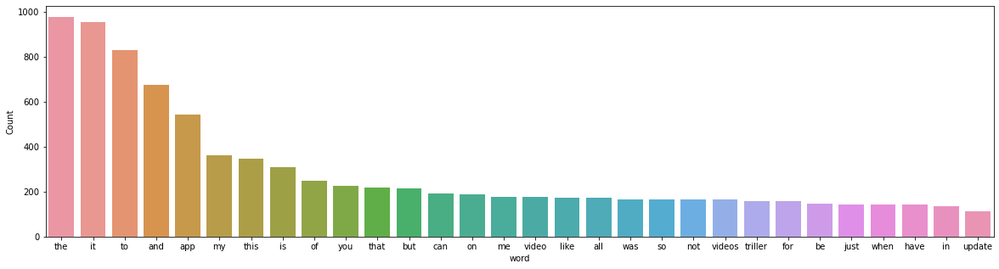

In [299]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us_2020_score1N2N3))

In [300]:
# Clean text
review_words_us_ready_2020_score1N2N3 = process_words(review_words_us_2020_score1N2N3)  # processed Text Data! - move to each section

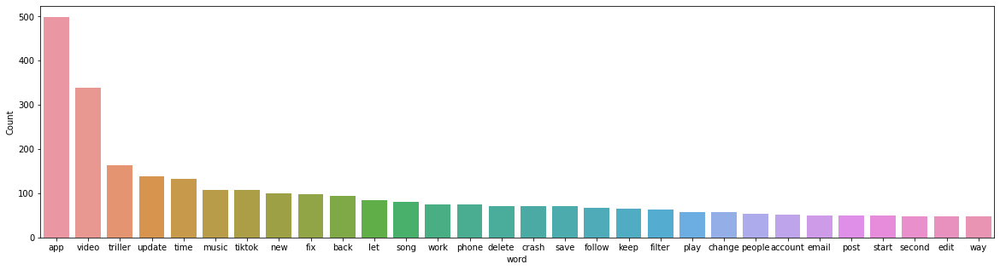

In [301]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_words_us_ready_2020_score1N2N3))


In [302]:
# Create Dictionary
id2word_us_2020_score1N2N3 = corpora.Dictionary(review_words_us_ready_2020_score1N2N3)

2021-10-20 17:04:57,379 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-20 17:04:57,397 [INFO] gensim.corpora.dictionary - built Dictionary(1310 unique tokens: ['always', 'app', 'bad', 'connection', 'content']...) from 589 documents (total 8457 corpus positions)
2021-10-20 17:04:57,398 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(1310 unique tokens: ['always', 'app', 'bad', 'connection', 'content']...) from 589 documents (total 8457 corpus positions)", 'datetime': '2021-10-20T17:04:57.398704', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [303]:
# Create Corpus: Term Document Frequency
corpus_us_2020_score1N2N3 = [id2word_us_2020_score1N2N3.doc2bow(text) for text in review_words_us_ready_2020_score1N2N3]

In [304]:
# Training LDA model
model_list_us_2020_score1N2N3, coherence_values_us_2020_score1N2N3 = compute_coherence_values(dictionary=id2word_us_2020_score1N2N3, corpus=corpus_us_2020_score1N2N3, 
                                                              texts=review_words_us_ready_2020_score1N2N3, limit=30, start=2, step=5)


2021-10-20 17:04:57,425 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-20 17:04:57,427 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-20 17:04:57,431 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 17:04:57,433 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 589 documents, updating model once every 589 documents, evaluating perplexity every 589 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-20 17:04:57,975 [INFO] gensim.models.ldamodel - -7.727 per-word bound, 211.9 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:04:57,976 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #589/589
2021-10-20 17:04:58,424 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.046*"app" + 0.041*"video" + 0.020*"triller" + 0.015*"update" + 0.014*"time" + 0.012*"new" + 0.011*"son

2021-10-20 17:05:03,893 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.065*"app" + 0.028*"video" + 0.021*"music" + 0.016*"tiktok" + 0.014*"phone" + 0.013*"triller" + 0.013*"time" + 0.013*"fix" + 0.012*"play" + 0.009*"tok"
2021-10-20 17:05:03,894 [INFO] gensim.models.ldamodel - topic diff=0.019741, rho=0.301511
2021-10-20 17:05:04,180 [INFO] gensim.models.ldamodel - -6.219 per-word bound, 74.5 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:05:04,181 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #589/589
2021-10-20 17:05:04,405 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.041*"video" + 0.038*"app" + 0.023*"update" + 0.020*"triller" + 0.016*"new" + 0.014*"song" + 0.014*"time" + 0.013*"let" + 0.013*"back" + 0.012*"filter"
2021-10-20 17:05:04,406 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.065*"app" + 0.028*"video" + 0.022*"music" + 0.017*"tiktok" + 0.014*"phone" + 0.013*"triller" + 0.013*"time" + 0.013*"fix

2021-10-20 17:05:08,235 [INFO] gensim.models.ldamodel - topic diff=0.009353, rho=0.218218
2021-10-20 17:05:08,490 [INFO] gensim.models.ldamodel - -6.208 per-word bound, 73.9 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:05:08,491 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #589/589
2021-10-20 17:05:08,667 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.040*"video" + 0.036*"app" + 0.025*"update" + 0.020*"triller" + 0.017*"new" + 0.014*"back" + 0.014*"song" + 0.014*"let" + 0.014*"time" + 0.012*"filter"
2021-10-20 17:05:08,668 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.068*"app" + 0.029*"video" + 0.023*"music" + 0.018*"tiktok" + 0.015*"phone" + 0.013*"fix" + 0.013*"time" + 0.013*"triller" + 0.012*"play" + 0.010*"delete"
2021-10-20 17:05:08,668 [INFO] gensim.models.ldamodel - topic diff=0.008942, rho=0.213201
2021-10-20 17:05:08,905 [INFO] gensim.models.ldamodel - -6.207 per-word bound, 73.9 perplexity estimate

2021-10-20 17:05:12,534 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #589/589
2021-10-20 17:05:12,707 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.039*"video" + 0.035*"app" + 0.026*"update" + 0.020*"triller" + 0.017*"new" + 0.015*"back" + 0.014*"let" + 0.014*"song" + 0.014*"time" + 0.012*"filter"
2021-10-20 17:05:12,709 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.069*"app" + 0.030*"video" + 0.023*"music" + 0.018*"tiktok" + 0.015*"phone" + 0.014*"fix" + 0.013*"time" + 0.013*"triller" + 0.012*"play" + 0.010*"delete"
2021-10-20 17:05:12,709 [INFO] gensim.models.ldamodel - topic diff=0.005870, rho=0.176777
2021-10-20 17:05:12,958 [INFO] gensim.models.ldamodel - -6.203 per-word bound, 73.7 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:05:12,959 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #589/589
2021-10-20 17:05:13,125 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.039*"video" + 0.035*"

2021-10-20 17:05:16,828 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.070*"app" + 0.030*"video" + 0.023*"music" + 0.018*"tiktok" + 0.016*"phone" + 0.014*"fix" + 0.014*"time" + 0.013*"triller" + 0.012*"play" + 0.011*"delete"
2021-10-20 17:05:16,829 [INFO] gensim.models.ldamodel - topic diff=0.004091, rho=0.154303
2021-10-20 17:05:17,089 [INFO] gensim.models.ldamodel - -6.201 per-word bound, 73.5 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:05:17,090 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #589/589
2021-10-20 17:05:17,310 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.039*"video" + 0.034*"app" + 0.026*"update" + 0.020*"triller" + 0.018*"new" + 0.015*"back" + 0.015*"let" + 0.014*"song" + 0.014*"time" + 0.012*"filter"
2021-10-20 17:05:17,311 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.070*"app" + 0.030*"video" + 0.023*"music" + 0.018*"tiktok" + 0.016*"phone" + 0.014*"time" + 0.014*"fix" + 0.013*"tril

2021-10-20 17:05:22,774 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 568 virtual documents
2021-10-20 17:05:22,886 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.14285714285714285
2021-10-20 17:05:22,886 [INFO] gensim.models.ldamodel - using symmetric eta at 0.14285714285714285
2021-10-20 17:05:22,887 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 17:05:22,890 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 7 topics, 50 passes over the supplied corpus of 589 documents, updating model once every 589 documents, evaluating perplexity every 589 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-20 17:05:23,272 [INFO] gensim.models.ldamodel - -8.889 per-word bound, 474.2 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:05:23,273 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #589/589
2021-10-20 17:05

2021-10-20 17:05:25,641 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #589/589
2021-10-20 17:05:25,811 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.044*"app" + 0.032*"follow" + 0.028*"email" + 0.026*"song" + 0.019*"tiktok" + 0.018*"slow" + 0.018*"fix" + 0.017*"time" + 0.016*"video" + 0.013*"let"
2021-10-20 17:05:25,812 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.086*"app" + 0.034*"music" + 0.027*"triller" + 0.025*"video" + 0.025*"phone" + 0.023*"play" + 0.020*"delete" + 0.016*"time" + 0.014*"tiktok" + 0.013*"start"
2021-10-20 17:05:25,813 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.057*"video" + 0.026*"filter" + 0.022*"app" + 0.021*"triller" + 0.018*"tiktok" + 0.016*"back" + 0.015*"update" + 0.011*"shuffle" + 0.011*"put" + 0.010*"song"
2021-10-20 17:05:25,813 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.041*"video" + 0.036*"app" + 0.015*"change" + 0.015*"save" + 0.014*"post" + 0.014*"click" + 0.014*"link" + 0.013*"let" + 0.011*"fix" + 0.011

2021-10-20 17:05:27,753 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.060*"app" + 0.032*"video" + 0.027*"tok" + 0.021*"tik" + 0.015*"time" + 0.014*"well" + 0.012*"tiktok" + 0.011*"save" + 0.011*"people" + 0.010*"fix"
2021-10-20 17:05:27,754 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.057*"video" + 0.027*"filter" + 0.021*"triller" + 0.020*"app" + 0.019*"tiktok" + 0.016*"back" + 0.013*"shuffle" + 0.013*"update" + 0.011*"put" + 0.010*"song"
2021-10-20 17:05:27,755 [INFO] gensim.models.ldamodel - topic diff=0.028846, rho=0.288675
2021-10-20 17:05:27,990 [INFO] gensim.models.ldamodel - -6.420 per-word bound, 85.7 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:05:27,991 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #589/589
2021-10-20 17:05:28,155 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.039*"app" + 0.036*"follow" + 0.034*"email" + 0.028*"song" + 0.020*"tiktok" + 0.018*"slow" + 0.017*"time" + 0.016*"let"

2021-10-20 17:05:29,947 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.035*"app" + 0.031*"video" + 0.027*"time" + 0.026*"account" + 0.025*"let" + 0.015*"second" + 0.015*"download" + 0.014*"log" + 0.014*"triller" + 0.013*"people"
2021-10-20 17:05:29,948 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"video" + 0.035*"app" + 0.016*"change" + 0.015*"post" + 0.015*"link" + 0.015*"click" + 0.013*"save" + 0.011*"let" + 0.010*"look" + 0.010*"fix"
2021-10-20 17:05:29,949 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.037*"follow" + 0.037*"app" + 0.036*"email" + 0.029*"song" + 0.020*"tiktok" + 0.018*"slow" + 0.017*"time" + 0.017*"let" + 0.016*"work" + 0.015*"fix"
2021-10-20 17:05:29,950 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.055*"video" + 0.026*"filter" + 0.022*"triller" + 0.020*"tiktok" + 0.020*"app" + 0.015*"shuffle" + 0.014*"back" + 0.012*"update" + 0.011*"song" + 0.010*"put"
2021-10-20 17:05:29,951 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.060*"app" 

2021-10-20 17:05:31,771 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"video" + 0.035*"app" + 0.015*"change" + 0.015*"post" + 0.015*"link" + 0.014*"click" + 0.014*"save" + 0.011*"let" + 0.010*"look" + 0.010*"fix"
2021-10-20 17:05:31,772 [INFO] gensim.models.ldamodel - topic diff=0.007790, rho=0.208514
2021-10-20 17:05:31,990 [INFO] gensim.models.ldamodel - -6.401 per-word bound, 84.5 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:05:31,991 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #589/589
2021-10-20 17:05:32,146 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.035*"app" + 0.031*"video" + 0.027*"time" + 0.025*"account" + 0.025*"let" + 0.018*"second" + 0.015*"log" + 0.015*"download" + 0.014*"triller" + 0.013*"people"
2021-10-20 17:05:32,147 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.063*"update" + 0.051*"app" + 0.048*"video" + 0.043*"new" + 0.026*"back" + 0.025*"crash" + 0.023*"triller" + 0.016*"fi

2021-10-20 17:05:34,031 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.059*"app" + 0.032*"video" + 0.029*"tok" + 0.023*"tik" + 0.015*"time" + 0.014*"well" + 0.012*"tiktok" + 0.011*"fix" + 0.011*"save" + 0.011*"people"
2021-10-20 17:05:34,032 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.040*"email" + 0.039*"follow" + 0.035*"app" + 0.029*"song" + 0.021*"tiktok" + 0.019*"slow" + 0.018*"let" + 0.017*"time" + 0.016*"work" + 0.015*"account"
2021-10-20 17:05:34,034 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.053*"video" + 0.027*"filter" + 0.022*"tiktok" + 0.022*"triller" + 0.020*"app" + 0.015*"shuffle" + 0.013*"back" + 0.012*"song" + 0.010*"put" + 0.010*"update"
2021-10-20 17:05:34,035 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.035*"app" + 0.032*"video" + 0.027*"time" + 0.025*"account" + 0.025*"let" + 0.020*"second" + 0.015*"log" + 0.015*"download" + 0.014*"triller" + 0.012*"people"
2021-10-20 17:05:34,035 [INFO] gensim.models.ldamodel - topic diff=0.004872, rho=0

2021-10-20 17:05:35,844 [INFO] gensim.models.ldamodel - topic diff=0.003885, rho=0.171499
2021-10-20 17:05:36,067 [INFO] gensim.models.ldamodel - -6.396 per-word bound, 84.2 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:05:36,067 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #589/589
2021-10-20 17:05:36,208 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.059*"app" + 0.033*"video" + 0.030*"tok" + 0.024*"tik" + 0.014*"time" + 0.014*"well" + 0.012*"tiktok" + 0.012*"fix" + 0.012*"load" + 0.011*"save"
2021-10-20 17:05:36,209 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"video" + 0.035*"app" + 0.015*"post" + 0.015*"change" + 0.015*"link" + 0.014*"save" + 0.014*"click" + 0.011*"let" + 0.011*"look" + 0.010*"fix"
2021-10-20 17:05:36,210 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.035*"app" + 0.032*"video" + 0.027*"time" + 0.025*"account" + 0.024*"let" + 0.021*"second" + 0.016*"log" + 0.014*"download" + 0.014

2021-10-20 17:05:37,847 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.088*"app" + 0.039*"music" + 0.029*"phone" + 0.026*"triller" + 0.026*"video" + 0.026*"play" + 0.023*"delete" + 0.017*"time" + 0.015*"start" + 0.013*"tiktok"
2021-10-20 17:05:37,848 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.059*"app" + 0.033*"video" + 0.030*"tok" + 0.024*"tik" + 0.014*"well" + 0.014*"time" + 0.012*"tiktok" + 0.012*"load" + 0.012*"fix" + 0.011*"save"
2021-10-20 17:05:37,849 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"video" + 0.035*"app" + 0.015*"post" + 0.015*"change" + 0.015*"link" + 0.015*"save" + 0.014*"click" + 0.011*"let" + 0.011*"look" + 0.010*"fix"
2021-10-20 17:05:37,850 [INFO] gensim.models.ldamodel - topic diff=0.002857, rho=0.158114
2021-10-20 17:05:38,067 [INFO] gensim.models.ldamodel - -6.393 per-word bound, 84.1 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:05:38,068 [INFO] gensim.models.ldamodel - PROGRESS: pass

2021-10-20 17:05:39,817 [INFO] gensim.models.ldamodel - -6.392 per-word bound, 84.0 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:05:39,818 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #589/589
2021-10-20 17:05:39,959 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.050*"video" + 0.027*"filter" + 0.022*"tiktok" + 0.022*"triller" + 0.019*"app" + 0.014*"shuffle" + 0.013*"back" + 0.012*"song" + 0.011*"put" + 0.011*"ban"
2021-10-20 17:05:39,960 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.088*"app" + 0.039*"music" + 0.029*"phone" + 0.027*"triller" + 0.026*"play" + 0.026*"video" + 0.023*"delete" + 0.018*"time" + 0.015*"start" + 0.013*"tiktok"
2021-10-20 17:05:39,961 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.041*"video" + 0.035*"app" + 0.015*"post" + 0.015*"change" + 0.015*"link" + 0.015*"save" + 0.013*"click" + 0.011*"let" + 0.011*"look" + 0.009*"fix"
2021-10-20 17:05:39,962 [INFO] gensim.models.ldamodel -

2021-10-20 17:05:41,719 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.035*"app" + 0.032*"video" + 0.027*"time" + 0.024*"account" + 0.023*"let" + 0.022*"second" + 0.017*"log" + 0.014*"triller" + 0.014*"download" + 0.012*"give"
2021-10-20 17:05:41,721 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.049*"video" + 0.027*"filter" + 0.022*"tiktok" + 0.022*"triller" + 0.019*"app" + 0.014*"shuffle" + 0.013*"back" + 0.012*"song" + 0.011*"put" + 0.011*"ban"
2021-10-20 17:05:41,721 [INFO] gensim.models.ldamodel - topic diff=0.002065, rho=0.140028
2021-10-20 17:05:41,722 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=1310, num_topics=7, decay=0.5, chunksize=1000) in 18.83s', 'datetime': '2021-10-20T17:05:41.722448', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-20 17:05:41,726 [INFO] gensim.topic_coherence.probability_estimation - using P

2021-10-20 17:05:45,830 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.077*"app" + 0.043*"music" + 0.036*"triller" + 0.032*"play" + 0.031*"phone" + 0.021*"delete" + 0.018*"start" + 0.017*"video" + 0.016*"time" + 0.014*"song"
2021-10-20 17:05:45,831 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.043*"app" + 0.026*"video" + 0.016*"happen" + 0.014*"people" + 0.014*"time" + 0.014*"love" + 0.013*"feel" + 0.013*"tok" + 0.011*"famous" + 0.010*"start"
2021-10-20 17:05:45,832 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.078*"update" + 0.050*"new" + 0.041*"app" + 0.036*"video" + 0.032*"back" + 0.028*"triller" + 0.025*"old" + 0.019*"crash" + 0.017*"filter" + 0.011*"fix"
2021-10-20 17:05:45,833 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.032*"video" + 0.031*"email" + 0.024*"app" + 0.023*"link" + 0.018*"let" + 0.017*"keep" + 0.017*"click" + 0.016*"work" + 0.014*"post" + 0.014*"send"
2021-10-20 17:05:45,834 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.048*"video" + 0.

2021-10-20 17:05:47,652 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.082*"app" + 0.053*"music" + 0.038*"play" + 0.038*"phone" + 0.032*"triller" + 0.026*"delete" + 0.021*"start" + 0.018*"time" + 0.016*"song" + 0.015*"open"
2021-10-20 17:05:47,653 [INFO] gensim.models.ldamodel - topic diff=0.048580, rho=0.301511
2021-10-20 17:05:47,847 [INFO] gensim.models.ldamodel - -6.536 per-word bound, 92.8 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:05:47,848 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #589/589
2021-10-20 17:05:47,979 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.075*"app" + 0.036*"tiktok" + 0.025*"people" + 0.019*"video" + 0.017*"slow" + 0.017*"load" + 0.012*"download" + 0.011*"triller" + 0.011*"well" + 0.011*"follow"
2021-10-20 17:05:47,980 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.083*"app" + 0.054*"music" + 0.038*"play" + 0.038*"phone" + 0.032*"triller" + 0.027*"delete" + 0.021*"start" +

2021-10-20 17:05:49,593 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.050*"video" + 0.022*"shuffle" + 0.019*"filter" + 0.015*"app" + 0.015*"song" + 0.014*"tiktok" + 0.014*"button" + 0.013*"triller" + 0.013*"back" + 0.011*"put"
2021-10-20 17:05:49,594 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.074*"app" + 0.048*"video" + 0.021*"song" + 0.020*"time" + 0.019*"triller" + 0.017*"sound" + 0.016*"crash" + 0.015*"upload" + 0.015*"keep" + 0.014*"feature"
2021-10-20 17:05:49,595 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.039*"app" + 0.031*"work" + 0.028*"filter" + 0.028*"video" + 0.013*"tok" + 0.012*"tik" + 0.012*"friend" + 0.011*"back" + 0.011*"snap" + 0.010*"time"
2021-10-20 17:05:49,596 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.084*"app" + 0.056*"music" + 0.039*"phone" + 0.039*"play" + 0.031*"triller" + 0.028*"delete" + 0.022*"start" + 0.021*"time" + 0.016*"song" + 0.016*"open"
2021-10-20 17:05:49,596 [INFO] gensim.models.ldamodel - topic diff=0.022173, rho=

2021-10-20 17:05:51,255 [INFO] gensim.models.ldamodel - topic diff=0.014179, rho=0.213201
2021-10-20 17:05:51,448 [INFO] gensim.models.ldamodel - -6.493 per-word bound, 90.1 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:05:51,448 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #589/589
2021-10-20 17:05:51,580 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.032*"app" + 0.023*"people" + 0.020*"happen" + 0.019*"famous" + 0.017*"video" + 0.015*"feel" + 0.014*"tok" + 0.013*"able" + 0.011*"guess" + 0.011*"fix"
2021-10-20 17:05:51,582 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.096*"video" + 0.067*"app" + 0.034*"save" + 0.016*"time" + 0.015*"crash" + 0.014*"upload" + 0.012*"fix" + 0.012*"tiktok" + 0.010*"new" + 0.010*"post"
2021-10-20 17:05:51,583 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.037*"app" + 0.035*"let" + 0.028*"tok" + 0.022*"triller" + 0.021*"tik" + 0.017*"follow" + 0.014*"tiktok" + 0.013*"account" 

2021-10-20 17:05:53,321 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.049*"video" + 0.023*"shuffle" + 0.018*"filter" + 0.015*"song" + 0.014*"button" + 0.014*"tiktok" + 0.014*"app" + 0.014*"triller" + 0.011*"lense" + 0.011*"put"
2021-10-20 17:05:53,322 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.038*"app" + 0.031*"work" + 0.028*"filter" + 0.028*"video" + 0.014*"tok" + 0.013*"tik" + 0.012*"friend" + 0.011*"snap" + 0.010*"back" + 0.009*"follow"
2021-10-20 17:05:53,323 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.035*"account" + 0.033*"second" + 0.032*"time" + 0.029*"app" + 0.028*"video" + 0.021*"clip" + 0.018*"length" + 0.018*"record" + 0.015*"give" + 0.015*"song"
2021-10-20 17:05:53,323 [INFO] gensim.models.ldamodel - topic diff=0.009047, rho=0.188982
2021-10-20 17:05:53,520 [INFO] gensim.models.ldamodel - -6.483 per-word bound, 89.5 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:05:53,521 [INFO] gensim.models.ldamodel -

2021-10-20 17:05:54,883 [INFO] gensim.models.ldamodel - topic diff=0.006510, rho=0.174078
2021-10-20 17:05:55,098 [INFO] gensim.models.ldamodel - -6.477 per-word bound, 89.1 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:05:55,099 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #589/589
2021-10-20 17:05:55,225 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.075*"app" + 0.046*"tiktok" + 0.025*"people" + 0.025*"slow" + 0.019*"video" + 0.017*"load" + 0.014*"well" + 0.013*"download" + 0.012*"triller" + 0.011*"lag"
2021-10-20 17:05:55,226 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.035*"account" + 0.035*"second" + 0.031*"time" + 0.029*"video" + 0.028*"app" + 0.021*"clip" + 0.019*"length" + 0.018*"record" + 0.015*"give" + 0.014*"song"
2021-10-20 17:05:55,227 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.031*"app" + 0.024*"people" + 0.020*"happen" + 0.020*"famous" + 0.017*"video" + 0.015*"feel" + 0.014*"tok" + 0.

2021-10-20 17:05:56,828 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.071*"app" + 0.052*"video" + 0.023*"song" + 0.021*"time" + 0.019*"upload" + 0.018*"triller" + 0.018*"crash" + 0.018*"sound" + 0.015*"keep" + 0.014*"feature"
2021-10-20 17:05:56,829 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.096*"video" + 0.067*"app" + 0.037*"save" + 0.016*"time" + 0.014*"crash" + 0.013*"post" + 0.013*"upload" + 0.012*"fix" + 0.011*"tiktok" + 0.011*"new"
2021-10-20 17:05:56,830 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.045*"follow" + 0.039*"app" + 0.037*"email" + 0.027*"tiktok" + 0.020*"fix" + 0.019*"confirm" + 0.018*"fail" + 0.016*"confirmation" + 0.015*"send" + 0.013*"time"
2021-10-20 17:05:56,831 [INFO] gensim.models.ldamodel - topic diff=0.004441, rho=0.160128
2021-10-20 17:05:57,024 [INFO] gensim.models.ldamodel - -6.472 per-word bound, 88.8 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:05:57,025 [INFO] gensim.models.ldamode

2021-10-20 17:05:58,439 [INFO] gensim.models.ldamodel - topic diff=0.003504, rho=0.150756
2021-10-20 17:05:58,621 [INFO] gensim.models.ldamodel - -6.470 per-word bound, 88.6 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:05:58,622 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #589/589
2021-10-20 17:05:58,747 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.030*"app" + 0.025*"people" + 0.020*"happen" + 0.020*"famous" + 0.017*"video" + 0.015*"feel" + 0.014*"tok" + 0.013*"able" + 0.012*"tiktok" + 0.011*"freeze"
2021-10-20 17:05:58,749 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.071*"app" + 0.052*"video" + 0.023*"song" + 0.021*"time" + 0.019*"upload" + 0.019*"triller" + 0.018*"crash" + 0.018*"sound" + 0.015*"keep" + 0.014*"feature"
2021-10-20 17:05:58,749 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.087*"update" + 0.053*"new" + 0.046*"app" + 0.043*"back" + 0.036*"video" + 0.036*"triller" + 0.027*"old" + 0.02

2021-10-20 17:06:00,376 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.074*"app" + 0.049*"tiktok" + 0.025*"people" + 0.025*"slow" + 0.019*"video" + 0.017*"load" + 0.014*"well" + 0.013*"triller" + 0.013*"download" + 0.012*"much"
2021-10-20 17:06:00,377 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.038*"app" + 0.032*"work" + 0.029*"filter" + 0.028*"video" + 0.014*"tok" + 0.013*"tik" + 0.013*"friend" + 0.011*"snap" + 0.010*"follow" + 0.010*"download"
2021-10-20 17:06:00,378 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.046*"follow" + 0.039*"app" + 0.037*"email" + 0.028*"tiktok" + 0.020*"fix" + 0.019*"confirm" + 0.018*"fail" + 0.016*"confirmation" + 0.015*"send" + 0.013*"time"
2021-10-20 17:06:00,379 [INFO] gensim.models.ldamodel - topic diff=0.002583, rho=0.141421
2021-10-20 17:06:00,577 [INFO] gensim.models.ldamodel - -6.468 per-word bound, 88.5 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:06:00,577 [INFO] gensim.models.l

2021-10-20 17:06:04,614 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #589/589
2021-10-20 17:06:04,743 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.057*"video" + 0.030*"app" + 0.020*"post" + 0.015*"change" + 0.015*"work" + 0.012*"let" + 0.012*"triller" + 0.011*"keep" + 0.011*"save" + 0.011*"back"
2021-10-20 17:06:04,744 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.057*"app" + 0.044*"video" + 0.026*"work" + 0.020*"music" + 0.018*"filter" + 0.016*"time" + 0.015*"start" + 0.015*"phone" + 0.014*"triller" + 0.012*"play"
2021-10-20 17:06:04,745 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.045*"video" + 0.045*"app" + 0.034*"account" + 0.022*"time" + 0.019*"log" + 0.018*"second" + 0.017*"triller" + 0.016*"give" + 0.014*"start" + 0.013*"error"
2021-10-20 17:06:04,746 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.036*"let" + 0.033*"app" + 0.028*"account" + 0.022*"triller" + 0.019*"video" + 0.019*"tok" + 0.018*"follow" + 0.013*"save" + 0.013*"fix" + 0.01

2021-10-20 17:06:06,365 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.082*"app" + 0.041*"video" + 0.027*"song" + 0.021*"triller" + 0.020*"really" + 0.019*"crash" + 0.017*"time" + 0.015*"update" + 0.014*"feature" + 0.011*"look"
2021-10-20 17:06:06,366 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.045*"app" + 0.036*"triller" + 0.029*"song" + 0.025*"load" + 0.019*"video" + 0.018*"fix" + 0.018*"start" + 0.018*"slow" + 0.014*"delete" + 0.013*"time"
2021-10-20 17:06:06,367 [INFO] gensim.models.ldamodel - topic diff=0.064395, rho=0.316228
2021-10-20 17:06:06,603 [INFO] gensim.models.ldamodel - -6.666 per-word bound, 101.5 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:06:06,603 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #589/589
2021-10-20 17:06:06,745 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.064*"app" + 0.031*"video" + 0.021*"time" + 0.020*"tiktok" + 0.015*"bad" + 0.014*"well" + 0.013*"feel" + 0.013*"p

2021-10-20 17:06:08,333 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #589/589
2021-10-20 17:06:08,470 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.037*"let" + 0.033*"app" + 0.027*"tok" + 0.025*"follow" + 0.024*"triller" + 0.024*"account" + 0.021*"tik" + 0.015*"video" + 0.013*"people" + 0.013*"tiktok"
2021-10-20 17:06:08,471 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.046*"app" + 0.044*"account" + 0.039*"video" + 0.024*"time" + 0.022*"log" + 0.017*"start" + 0.016*"give" + 0.016*"error" + 0.016*"download" + 0.015*"ban"
2021-10-20 17:06:08,472 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.084*"video" + 0.036*"app" + 0.028*"sound" + 0.028*"post" + 0.024*"able" + 0.022*"save" + 0.019*"upload" + 0.017*"download" + 0.013*"tiktok" + 0.013*"find"
2021-10-20 17:06:08,473 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.112*"second" + 0.054*"record" + 0.048*"song" + 0.044*"let" + 0.040*"save" + 0.039*"video" + 0.033*"time" + 0.031*"change" + 0.030*"long

2021-10-20 17:06:10,065 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.039*"let" + 0.033*"app" + 0.030*"tok" + 0.026*"follow" + 0.025*"triller" + 0.023*"tik" + 0.023*"account" + 0.014*"people" + 0.014*"video" + 0.013*"tiktok"
2021-10-20 17:06:10,066 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.058*"video" + 0.021*"shuffle" + 0.021*"filter" + 0.019*"button" + 0.019*"put" + 0.019*"back" + 0.018*"song" + 0.017*"app" + 0.017*"triller" + 0.015*"clip"
2021-10-20 17:06:10,067 [INFO] gensim.models.ldamodel - topic diff=0.018125, rho=0.218218
2021-10-20 17:06:10,261 [INFO] gensim.models.ldamodel - -6.604 per-word bound, 97.3 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:06:10,261 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #589/589
2021-10-20 17:06:10,387 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.046*"tiktok" + 0.032*"glitch" + 0.016*"clip" + 0.016*"length" + 0.014*"app" + 0.013*"people" + 0.012*"slow" + 0

2021-10-20 17:06:11,870 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #589/589
2021-10-20 17:06:12,001 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.049*"app" + 0.045*"account" + 0.037*"video" + 0.025*"log" + 0.024*"time" + 0.017*"start" + 0.017*"ban" + 0.016*"error" + 0.016*"download" + 0.015*"let"
2021-10-20 17:06:12,002 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.118*"second" + 0.075*"song" + 0.050*"record" + 0.046*"time" + 0.045*"video" + 0.039*"save" + 0.034*"let" + 0.034*"change" + 0.032*"long" + 0.024*"part"
2021-10-20 17:06:12,003 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.057*"video" + 0.022*"shuffle" + 0.021*"filter" + 0.020*"button" + 0.019*"put" + 0.018*"back" + 0.018*"song" + 0.016*"clip" + 0.016*"triller" + 0.016*"app"
2021-10-20 17:06:12,004 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.058*"app" + 0.041*"video" + 0.030*"work" + 0.019*"filter" + 0.016*"music" + 0.016*"time" + 0.013*"tok" + 0.013*"always" + 0.012*"back" + 0.0

2021-10-20 17:06:13,610 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.091*"video" + 0.039*"app" + 0.029*"sound" + 0.028*"post" + 0.024*"able" + 0.024*"save" + 0.022*"upload" + 0.019*"download" + 0.017*"crash" + 0.013*"edit"
2021-10-20 17:06:13,611 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.050*"app" + 0.045*"account" + 0.037*"video" + 0.026*"log" + 0.024*"time" + 0.017*"ban" + 0.017*"start" + 0.016*"error" + 0.016*"download" + 0.015*"let"
2021-10-20 17:06:13,611 [INFO] gensim.models.ldamodel - topic diff=0.008392, rho=0.176777
2021-10-20 17:06:13,799 [INFO] gensim.models.ldamodel - -6.585 per-word bound, 96.0 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:06:13,800 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #589/589
2021-10-20 17:06:13,929 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.057*"video" + 0.028*"app" + 0.023*"post" + 0.013*"show" + 0.012*"new" + 0.012*"keep" + 0.012*"segment" + 0.012*"cha

2021-10-20 17:06:15,452 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #589/589
2021-10-20 17:06:15,572 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.057*"video" + 0.028*"app" + 0.023*"post" + 0.013*"show" + 0.012*"new" + 0.012*"segment" + 0.012*"keep" + 0.012*"fix" + 0.012*"change" + 0.011*"back"
2021-10-20 17:06:15,573 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.050*"app" + 0.045*"account" + 0.036*"video" + 0.026*"log" + 0.024*"time" + 0.017*"ban" + 0.017*"start" + 0.016*"error" + 0.016*"download" + 0.015*"keep"
2021-10-20 17:06:15,574 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.044*"app" + 0.020*"video" + 0.016*"back" + 0.015*"time" + 0.015*"triller" + 0.012*"tiktok" + 0.012*"well" + 0.011*"review" + 0.011*"like" + 0.011*"people"
2021-10-20 17:06:15,575 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.087*"email" + 0.064*"follow" + 0.032*"link" + 0.031*"app" + 0.028*"confirm" + 0.028*"send" + 0.026*"let" + 0.025*"click" + 0.025*"confirmation

2021-10-20 17:06:17,137 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.044*"app" + 0.020*"video" + 0.016*"back" + 0.015*"time" + 0.015*"triller" + 0.013*"well" + 0.012*"tiktok" + 0.011*"review" + 0.011*"like" + 0.011*"people"
2021-10-20 17:06:17,138 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.115*"second" + 0.096*"song" + 0.053*"time" + 0.049*"video" + 0.044*"record" + 0.038*"save" + 0.037*"long" + 0.033*"change" + 0.032*"let" + 0.030*"part"
2021-10-20 17:06:17,138 [INFO] gensim.models.ldamodel - topic diff=0.004952, rho=0.152499
2021-10-20 17:06:17,317 [INFO] gensim.models.ldamodel - -6.575 per-word bound, 95.4 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:06:17,318 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #589/589
2021-10-20 17:06:17,434 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.040*"let" + 0.038*"tok" + 0.034*"app" + 0.030*"tik" + 0.027*"follow" + 0.025*"triller" + 0.021*"account" + 0.015*

2021-10-20 17:06:18,890 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #589/589
2021-10-20 17:06:19,006 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.056*"app" + 0.043*"video" + 0.022*"tiktok" + 0.014*"new" + 0.013*"screen" + 0.013*"much" + 0.013*"well" + 0.012*"save" + 0.010*"delete" + 0.010*"pretty"
2021-10-20 17:06:19,007 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.046*"tiktok" + 0.033*"glitch" + 0.017*"length" + 0.017*"clip" + 0.014*"app" + 0.013*"people" + 0.012*"slow" + 0.011*"follow" + 0.011*"next" + 0.011*"filter"
2021-10-20 17:06:19,008 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.037*"app" + 0.035*"triller" + 0.033*"load" + 0.025*"song" + 0.023*"fix" + 0.022*"start" + 0.021*"video" + 0.019*"slow" + 0.013*"first" + 0.011*"save"
2021-10-20 17:06:19,009 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.040*"let" + 0.038*"tok" + 0.034*"app" + 0.031*"tik" + 0.027*"follow" + 0.025*"triller" + 0.021*"account" + 0.015*"people" + 0.014*"ban" + 

2021-10-20 17:06:22,994 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.065*"video" + 0.063*"app" + 0.019*"time" + 0.019*"update" + 0.017*"upload" + 0.016*"tiktok" + 0.016*"new" + 0.014*"phone" + 0.012*"crash" + 0.011*"save"
2021-10-20 17:06:22,995 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.030*"update" + 0.027*"music" + 0.024*"new" + 0.022*"old" + 0.021*"app" + 0.018*"horrible" + 0.017*"video" + 0.017*"change" + 0.017*"triller" + 0.016*"phone"
2021-10-20 17:06:22,996 [INFO] gensim.models.ldamodel - topic diff=0.236942, rho=0.577350
2021-10-20 17:06:23,191 [INFO] gensim.models.ldamodel - -6.975 per-word bound, 125.8 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:06:23,192 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #589/589
2021-10-20 17:06:23,325 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.026*"time" + 0.026*"account" + 0.024*"tiktok" + 0.021*"long" + 0.020*"app" + 0.019*"feel" + 0.012*"ban" + 0.01

2021-10-20 17:06:24,844 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #589/589
2021-10-20 17:06:24,982 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.082*"app" + 0.038*"music" + 0.035*"play" + 0.034*"video" + 0.033*"triller" + 0.020*"delete" + 0.019*"phone" + 0.019*"time" + 0.016*"clip" + 0.014*"randomly"
2021-10-20 17:06:24,983 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.069*"app" + 0.068*"video" + 0.026*"crash" + 0.024*"upload" + 0.020*"time" + 0.016*"tiktok" + 0.015*"update" + 0.013*"new" + 0.013*"phone" + 0.012*"save"
2021-10-20 17:06:24,984 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.049*"app" + 0.033*"people" + 0.026*"tok" + 0.026*"video" + 0.026*"fix" + 0.025*"well" + 0.023*"tik" + 0.022*"famous" + 0.022*"much" + 0.017*"tiktok"
2021-10-20 17:06:24,984 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.035*"update" + 0.031*"music" + 0.031*"new" + 0.026*"old" + 0.024*"horrible" + 0.023*"phone" + 0.023*"change" + 0.020*"app" + 0.020*"turn" + 0

2021-10-20 17:06:26,685 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.047*"app" + 0.035*"follow" + 0.026*"time" + 0.023*"tiktok" + 0.021*"update" + 0.020*"email" + 0.014*"video" + 0.013*"confirmation" + 0.013*"wrong" + 0.013*"fix"
2021-10-20 17:06:26,686 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.059*"email" + 0.035*"link" + 0.030*"video" + 0.024*"app" + 0.022*"confirm" + 0.021*"click" + 0.018*"send" + 0.018*"work" + 0.015*"post" + 0.014*"triller"
2021-10-20 17:06:26,687 [INFO] gensim.models.ldamodel - topic diff=0.037557, rho=0.267261
2021-10-20 17:06:26,883 [INFO] gensim.models.ldamodel - -6.725 per-word bound, 105.8 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:06:26,883 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #589/589
2021-10-20 17:06:27,016 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.051*"app" + 0.036*"people" + 0.030*"tok" + 0.027*"much" + 0.026*"video" + 0.026*"well" + 0.025*"famous" + 

2021-10-20 17:06:28,484 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #589/589
2021-10-20 17:06:28,611 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.086*"update" + 0.063*"new" + 0.046*"back" + 0.041*"triller" + 0.040*"filter" + 0.033*"app" + 0.032*"video" + 0.026*"old" + 0.023*"song" + 0.017*"terrible"
2021-10-20 17:06:28,612 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.048*"video" + 0.041*"save" + 0.039*"app" + 0.032*"let" + 0.027*"work" + 0.023*"follow" + 0.020*"triller" + 0.020*"download" + 0.019*"page" + 0.015*"feature"
2021-10-20 17:06:28,613 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.046*"let" + 0.030*"app" + 0.027*"account" + 0.025*"video" + 0.025*"tok" + 0.023*"follow" + 0.017*"tik" + 0.016*"screen" + 0.016*"log" + 0.013*"time"
2021-10-20 17:06:28,613 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.052*"app" + 0.036*"people" + 0.030*"tok" + 0.029*"much" + 0.026*"well" + 0.026*"video" + 0.025*"famous" + 0.025*"tik" + 0.020*"tiktok" + 0

2021-10-20 17:06:30,254 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.038*"app" + 0.033*"time" + 0.023*"log" + 0.018*"video" + 0.018*"feature" + 0.018*"pretty" + 0.015*"account" + 0.015*"triller" + 0.014*"bad" + 0.014*"move"
2021-10-20 17:06:30,254 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.103*"app" + 0.054*"video" + 0.028*"time" + 0.026*"music" + 0.025*"freeze" + 0.024*"triller" + 0.024*"crash" + 0.019*"keep" + 0.018*"update" + 0.013*"delete"
2021-10-20 17:06:30,255 [INFO] gensim.models.ldamodel - topic diff=0.013346, rho=0.200000
2021-10-20 17:06:30,450 [INFO] gensim.models.ldamodel - -6.685 per-word bound, 102.9 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:06:30,451 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #589/589
2021-10-20 17:06:30,572 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.035*"new" + 0.031*"horrible" + 0.026*"old" + 0.024*"music" + 0.024*"phone" + 0.024*"update" + 0.022*"turn" 

2021-10-20 17:06:32,079 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #589/589
2021-10-20 17:06:32,213 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.034*"app" + 0.023*"delete" + 0.023*"people" + 0.015*"follow" + 0.015*"video" + 0.015*"music" + 0.012*"happen" + 0.011*"phone" + 0.010*"keep" + 0.010*"radio"
2021-10-20 17:06:32,214 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.030*"feel" + 0.026*"time" + 0.026*"account" + 0.024*"tiktok" + 0.023*"app" + 0.022*"long" + 0.015*"ban" + 0.011*"open" + 0.011*"issue" + 0.011*"block"
2021-10-20 17:06:32,215 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.044*"app" + 0.038*"follow" + 0.027*"tiktok" + 0.027*"time" + 0.018*"wrong" + 0.017*"email" + 0.015*"update" + 0.014*"work" + 0.014*"fix" + 0.013*"triller"
2021-10-20 17:06:32,216 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.053*"app" + 0.039*"people" + 0.037*"much" + 0.030*"tok" + 0.027*"well" + 0.026*"glitch" + 0.025*"video" + 0.025*"famous" + 0.024*"tik" 

2021-10-20 17:06:33,887 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.081*"app" + 0.035*"close" + 0.034*"fix" + 0.033*"video" + 0.027*"save" + 0.021*"delete" + 0.020*"project" + 0.018*"download" + 0.018*"music" + 0.015*"annoying"
2021-10-20 17:06:33,888 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.073*"email" + 0.036*"link" + 0.028*"confirm" + 0.025*"video" + 0.023*"send" + 0.022*"click" + 0.019*"confirmation" + 0.019*"post" + 0.019*"fail" + 0.018*"app"
2021-10-20 17:06:33,889 [INFO] gensim.models.ldamodel - topic diff=0.007530, rho=0.166667
2021-10-20 17:06:34,098 [INFO] gensim.models.ldamodel - -6.664 per-word bound, 101.4 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:06:34,099 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #589/589
2021-10-20 17:06:34,229 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.030*"feel" + 0.026*"time" + 0.026*"account" + 0.024*"tiktok" + 0.023*"app" + 0.022*"long" + 0.015*"b

2021-10-20 17:06:35,727 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #589/589
2021-10-20 17:06:35,841 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.053*"app" + 0.042*"people" + 0.038*"much" + 0.030*"glitch" + 0.030*"tok" + 0.027*"well" + 0.025*"video" + 0.025*"famous" + 0.024*"tik" + 0.019*"fix"
2021-10-20 17:06:35,842 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.037*"app" + 0.033*"time" + 0.023*"log" + 0.018*"video" + 0.018*"feature" + 0.018*"pretty" + 0.015*"account" + 0.015*"triller" + 0.015*"move" + 0.014*"bad"
2021-10-20 17:06:35,843 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.098*"update" + 0.069*"new" + 0.054*"back" + 0.050*"filter" + 0.046*"triller" + 0.033*"app" + 0.031*"old" + 0.029*"video" + 0.018*"hate" + 0.017*"terrible"
2021-10-20 17:06:35,844 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.099*"app" + 0.055*"music" + 0.052*"play" + 0.036*"phone" + 0.032*"triller" + 0.029*"delete" + 0.023*"video" + 0.021*"start" + 0.018*"stop" + 

2021-10-20 17:06:37,400 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.050*"video" + 0.044*"save" + 0.040*"app" + 0.029*"let" + 0.027*"work" + 0.021*"download" + 0.020*"follow" + 0.020*"triller" + 0.018*"page" + 0.017*"update"
2021-10-20 17:06:37,401 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.042*"triller" + 0.027*"song" + 0.026*"app" + 0.023*"start" + 0.019*"trash" + 0.016*"post" + 0.016*"segment" + 0.016*"last" + 0.016*"different" + 0.015*"well"
2021-10-20 17:06:37,401 [INFO] gensim.models.ldamodel - topic diff=0.005682, rho=0.145865
2021-10-20 17:06:37,592 [INFO] gensim.models.ldamodel - -6.648 per-word bound, 100.3 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:06:37,593 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #589/589
2021-10-20 17:06:37,717 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.083*"app" + 0.035*"close" + 0.035*"fix" + 0.033*"video" + 0.028*"save" + 0.021*"delete" + 0.021*"project

2021-10-20 17:06:41,930 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.052*"app" + 0.024*"delete" + 0.024*"music" + 0.024*"fix" + 0.020*"update" + 0.019*"apple" + 0.015*"inappropriate" + 0.015*"phone" + 0.015*"time" + 0.010*"glitch"
2021-10-20 17:06:41,932 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.072*"app" + 0.039*"time" + 0.031*"video" + 0.029*"music" + 0.017*"delete" + 0.016*"crash" + 0.016*"fix" + 0.015*"phone" + 0.014*"play" + 0.013*"able"
2021-10-20 17:06:41,932 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.077*"app" + 0.047*"video" + 0.028*"triller" + 0.025*"time" + 0.018*"people" + 0.014*"freeze" + 0.012*"save" + 0.012*"music" + 0.012*"new" + 0.011*"add"
2021-10-20 17:06:41,933 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.041*"app" + 0.032*"video" + 0.028*"fix" + 0.026*"song" + 0.021*"second" + 0.019*"follow" + 0.017*"update" + 0.017*"slow" + 0.015*"really" + 0.015*"able"
2021-10-20 17:06:41,935 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0

2021-10-20 17:06:43,682 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.057*"app" + 0.028*"delete" + 0.026*"fix" + 0.026*"music" + 0.021*"apple" + 0.020*"inappropriate" + 0.017*"update" + 0.016*"time" + 0.016*"phone" + 0.014*"talk"
2021-10-20 17:06:43,682 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.060*"tiktok" + 0.024*"email" + 0.022*"segment" + 0.021*"mess" + 0.021*"stop" + 0.019*"triller" + 0.016*"app" + 0.015*"time" + 0.015*"stuff" + 0.015*"send"
2021-10-20 17:06:43,683 [INFO] gensim.models.ldamodel - topic diff=0.144147, rho=0.377964
2021-10-20 17:06:43,865 [INFO] gensim.models.ldamodel - -6.876 per-word bound, 117.5 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:06:43,866 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #589/589
2021-10-20 17:06:43,987 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.041*"video" + 0.038*"app" + 0.033*"fix" + 0.032*"second" + 0.026*"slow" + 0.023*"song" + 0.020*"tiktok" +

2021-10-20 17:06:45,411 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #589/589
2021-10-20 17:06:45,533 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.039*"tok" + 0.030*"tik" + 0.022*"triller" + 0.019*"format" + 0.018*"record" + 0.018*"ban" + 0.015*"app" + 0.013*"reason" + 0.013*"look" + 0.013*"case"
2021-10-20 17:06:45,534 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.037*"filter" + 0.028*"anymore" + 0.022*"snapchat" + 0.020*"video" + 0.019*"app" + 0.019*"super" + 0.019*"thing" + 0.018*"feel" + 0.018*"follow" + 0.017*"tiktok"
2021-10-20 17:06:45,535 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.085*"triller" + 0.050*"video" + 0.029*"save" + 0.026*"last" + 0.025*"update" + 0.024*"app" + 0.022*"mess" + 0.020*"filter" + 0.019*"back" + 0.017*"let"
2021-10-20 17:06:45,535 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.059*"tiktok" + 0.027*"mess" + 0.022*"email" + 0.021*"segment" + 0.021*"stop" + 0.020*"triller" + 0.019*"length" + 0.016*"app" + 0.015

2021-10-20 17:06:47,071 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.103*"tok" + 0.088*"tik" + 0.085*"app" + 0.029*"video" + 0.019*"screen" + 0.018*"friend" + 0.017*"give" + 0.015*"next" + 0.013*"maybe" + 0.013*"issue"
2021-10-20 17:06:47,072 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.042*"video" + 0.038*"app" + 0.037*"second" + 0.037*"fix" + 0.034*"slow" + 0.025*"load" + 0.022*"tiktok" + 0.020*"time" + 0.019*"song" + 0.018*"always"
2021-10-20 17:06:47,073 [INFO] gensim.models.ldamodel - topic diff=0.027876, rho=0.235702
2021-10-20 17:06:47,249 [INFO] gensim.models.ldamodel - -6.752 per-word bound, 107.8 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:06:47,250 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #589/589
2021-10-20 17:06:47,371 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.145*"update" + 0.096*"new" + 0.057*"app" + 0.051*"video" + 0.049*"back" + 0.037*"old" + 0.036*"triller" + 0.035*"crash"

2021-10-20 17:06:48,789 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #589/589
2021-10-20 17:06:48,917 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.133*"song" + 0.095*"second" + 0.054*"part" + 0.041*"change" + 0.038*"time" + 0.036*"record" + 0.035*"video" + 0.034*"choose" + 0.033*"let" + 0.031*"long"
2021-10-20 17:06:48,918 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.043*"app" + 0.027*"tiktok" + 0.025*"video" + 0.020*"triller" + 0.017*"like" + 0.016*"time" + 0.015*"update" + 0.013*"sound" + 0.012*"back" + 0.011*"work"
2021-10-20 17:06:48,919 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.034*"filter" + 0.029*"anymore" + 0.024*"snapchat" + 0.021*"thing" + 0.019*"video" + 0.019*"super" + 0.018*"feel" + 0.018*"app" + 0.017*"tiktok" + 0.015*"follow"
2021-10-20 17:06:48,920 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.094*"triller" + 0.049*"video" + 0.032*"save" + 0.027*"last" + 0.023*"filter" + 0.023*"update" + 0.022*"app" + 0.020*"mess" + 0.0

2021-10-20 17:06:50,553 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.035*"video" + 0.031*"start" + 0.024*"triller" + 0.024*"change" + 0.022*"create" + 0.016*"account" + 0.015*"note" + 0.015*"tiktok" + 0.015*"cool" + 0.015*"shut"
2021-10-20 17:06:50,554 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.083*"app" + 0.063*"video" + 0.024*"tiktok" + 0.019*"save" + 0.019*"look" + 0.016*"fix" + 0.015*"quality" + 0.015*"glitch" + 0.015*"really" + 0.013*"work"
2021-10-20 17:06:50,555 [INFO] gensim.models.ldamodel - topic diff=0.010236, rho=0.185695
2021-10-20 17:06:50,763 [INFO] gensim.models.ldamodel - -6.722 per-word bound, 105.6 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:06:50,764 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #589/589
2021-10-20 17:06:50,893 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.089*"app" + 0.065*"time" + 0.044*"crash" + 0.041*"video" + 0.029*"download" + 0.029*"iphone" + 0.023*"ap

2021-10-20 17:06:52,441 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #589/589
2021-10-20 17:06:52,554 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.070*"video" + 0.026*"app" + 0.025*"song" + 0.025*"triller" + 0.015*"look" + 0.014*"filter" + 0.013*"ban" + 0.013*"tiktok" + 0.013*"bad" + 0.013*"put"
2021-10-20 17:06:52,555 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.039*"fix" + 0.038*"app" + 0.038*"video" + 0.036*"load" + 0.035*"slow" + 0.033*"second" + 0.022*"tiktok" + 0.021*"always" + 0.020*"time" + 0.015*"really"
2021-10-20 17:06:52,555 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.033*"filter" + 0.029*"anymore" + 0.024*"thing" + 0.024*"snapchat" + 0.019*"video" + 0.019*"super" + 0.018*"feel" + 0.018*"app" + 0.017*"tiktok" + 0.015*"follow"
2021-10-20 17:06:52,556 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.094*"triller" + 0.050*"video" + 0.032*"save" + 0.027*"last" + 0.026*"filter" + 0.022*"update" + 0.022*"app" + 0.020*"mess" + 0.018*"bac

2021-10-20 17:06:54,063 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.059*"app" + 0.031*"delete" + 0.028*"fix" + 0.024*"music" + 0.023*"inappropriate" + 0.022*"people" + 0.019*"apple" + 0.017*"phone" + 0.017*"talk" + 0.017*"open"
2021-10-20 17:06:54,064 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.058*"tiktok" + 0.030*"mess" + 0.023*"segment" + 0.023*"stop" + 0.022*"triller" + 0.019*"length" + 0.017*"app" + 0.016*"email" + 0.015*"filter" + 0.015*"stuff"
2021-10-20 17:06:54,065 [INFO] gensim.models.ldamodel - topic diff=0.005690, rho=0.158114
2021-10-20 17:06:54,271 [INFO] gensim.models.ldamodel - -6.707 per-word bound, 104.5 perplexity estimate based on a held-out corpus of 589 documents with 8457 words
2021-10-20 17:06:54,272 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #589/589
2021-10-20 17:06:54,403 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.048*"let" + 0.040*"follow" + 0.035*"email" + 0.031*"account" + 0.025*"fail" + 0.024*"confirm" + 0.02

2021-10-20 17:06:55,833 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #589/589
2021-10-20 17:06:55,946 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.060*"clip" + 0.051*"video" + 0.038*"app" + 0.023*"length" + 0.017*"freeze" + 0.016*"tiktok" + 0.016*"edit" + 0.015*"way" + 0.015*"time" + 0.014*"well"
2021-10-20 17:06:55,947 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.073*"app" + 0.038*"forever" + 0.028*"give" + 0.026*"video" + 0.025*"audio" + 0.022*"load" + 0.022*"crash" + 0.019*"fix" + 0.018*"log" + 0.014*"trouble"
2021-10-20 17:06:55,948 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.097*"app" + 0.063*"music" + 0.050*"play" + 0.044*"phone" + 0.033*"delete" + 0.028*"triller" + 0.020*"start" + 0.019*"stop" + 0.017*"work" + 0.016*"time"
2021-10-20 17:06:55,949 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.094*"triller" + 0.050*"video" + 0.032*"save" + 0.027*"last" + 0.026*"filter" + 0.022*"update" + 0.020*"mess" + 0.020*"app" + 0.019*"back" + 0.

2021-10-20 17:06:57,445 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.048*"let" + 0.040*"follow" + 0.036*"email" + 0.032*"account" + 0.025*"fail" + 0.025*"confirm" + 0.022*"still" + 0.019*"fix" + 0.018*"time" + 0.017*"post"
2021-10-20 17:06:57,446 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.070*"video" + 0.026*"app" + 0.025*"song" + 0.025*"triller" + 0.015*"look" + 0.014*"filter" + 0.014*"bad" + 0.013*"tiktok" + 0.013*"ban" + 0.013*"put"
2021-10-20 17:06:57,446 [INFO] gensim.models.ldamodel - topic diff=0.003509, rho=0.140028
2021-10-20 17:06:57,447 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=1310, num_topics=27, decay=0.5, chunksize=1000) in 16.09s', 'datetime': '2021-10-20T17:06:57.447768', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-20 17:06:57,455 [INFO] gensim.topic_coherence.probability_estimation - using Parall

In [305]:
%store model_list_us_2020_score1N2N3
%store coherence_values_us_2020_score1N2N3

Stored 'model_list_us_2020_score1N2N3' (list)
Stored 'coherence_values_us_2020_score1N2N3' (list)


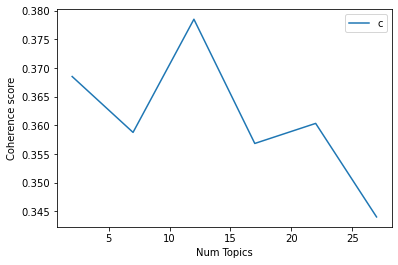

In [306]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us_2020_score1N2N3)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [307]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us_2020_score1N2N3):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 12

index: 0 | Num Topics = 2  has Coherence Value of 0.3685
index: 1 | Num Topics = 7  has Coherence Value of 0.3588
index: 2 | Num Topics = 12  has Coherence Value of 0.3785
index: 3 | Num Topics = 17  has Coherence Value of 0.3568
index: 4 | Num Topics = 22  has Coherence Value of 0.3604
index: 5 | Num Topics = 27  has Coherence Value of 0.344


In [346]:
# Select optimal number of topics
optimal_model_us_2020_score1N2N3 = model_list_us_2020_score1N2N3[2]

In [347]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us_2020_score1N2N3 = pyLDAvis.gensim_models.prepare(optimal_model_us_2020_score1N2N3, corpus_us_2020_score1N2N3, id2word_us_2020_score1N2N3)

In [348]:
print("pyLDAVis for us topics for score=1,2,3 in 2020:")
vis_us_2020_score1N2N3

pyLDAVis for us topics for score=1,2,3 in 2020:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.188313 -0.116533       1        1  14.525981
6      0.089579  0.167137       2        1  14.346124
10     0.089885  0.045667       3        1  11.748002
9      0.091194 -0.014054       4        1  10.715100
4     -0.096727 -0.079874       5        1   7.643134
11    -0.017921  0.079990       6        1   7.105831
7     -0.094479 -0.019688       7        1   6.363746
0     -0.034032  0.067335       8        1   6.305161
5      0.017808 -0.028175       9        1   6.072064
3     -0.159188  0.027066      10        1   5.540846
8     -0.018024 -0.108652      11        1   5.263033
1     -0.056409 -0.020218      12        1   4.370978, topic_info=       Term        Freq       Total Category  logprob  loglift
141  update  123.000000  123.000000  Default  30.0000  30.0000
76    email   43.000000   43.000000  Default  29.0000  29.0000
152     new   88.000000   88.000000  Default  28.0000  28.0000
33   follow   58.000000   58.000000  Default  27.0000  27.0000
25    music   97.000000   97.000000  Default  26.0000  26.0000
..      ...         ...         ...      ...      ...      ...
138     bug    2.491801   19.821884  Topic12  -4.9996   1.0564
174    love    2.620103   29.693784  Topic12  -4.9494   0.7025
225     way    2.653284   42.055687  Topic12  -4.9368   0.3670
13     time    2.679858  116.027765  Topic12  -4.9268  -0.6379
84     keep    2.494974   58.552730  Topic12  -4.9983  -0.0255

[794 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
89        2  0.113410    able
89        3  0.283524    able
89        4  0.141762    able
89        8  0.113410    able
89        9  0.056705    able
...     ...       ...     ...
31        5  0.072117    year
31        7  0.144235    year
31        9  0.360587    year
1262      7  0.585804  yellow
1263      7  0.585804      yo

[1567 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 7, 11, 10, 5, 12, 8, 1, 6, 4, 9, 2])

## By-rating of 2021 (Rating=1,2,3)

In [311]:
# By-rating Topic Modelling - rating = 1,2,3 in 2021
# Convert to list - move to each section
review_us_2021_score1N2N3 = triller_ios_us_review_YearMonth_2021_score1N2N3.review.values.tolist()
review_words_us_2021_score1N2N3 = list(sent_to_words(review_us_2021_score1N2N3))
print(review_words_us_2021_score1N2N3[:1])

[['whoever', 'thought', 'it', 'was', 'good', 'idea', 'to', 'update', 'triller', 'to', 'the', 'new', 'ui', 'should', 'be', 'fired', 'because', 'it', 'terrible', 'so', 'many', 'bugs', 'and', 'glitches', 'and', 'way', 'more', 'frustrating', 'to', 'use', 'than', 'the', 'old', 'system', 'think', 'll', 'just', 'use', 'imovie', 'from', 'now', 'on']]


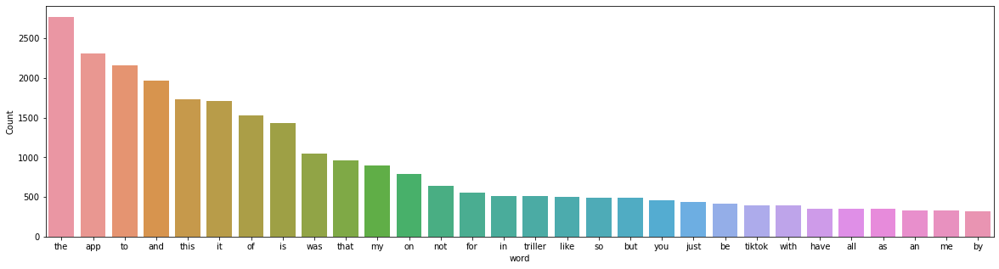

In [312]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us_2021_score1N2N3))

In [313]:
# Clean text
review_words_us_ready_2021_score1N2N3 = process_words(review_words_us_2021_score1N2N3)  # processed Text Data! - move to each section

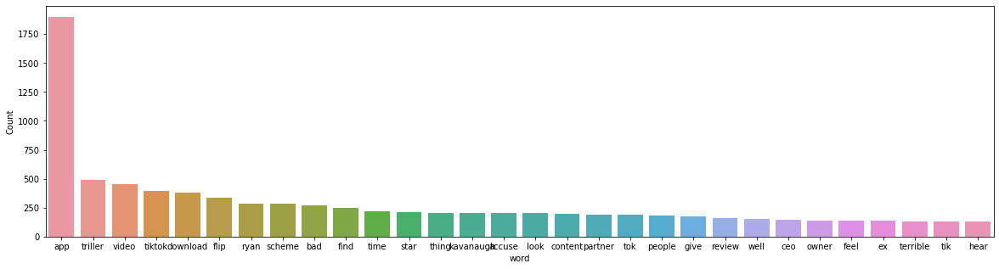

In [314]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_words_us_ready_2021_score1N2N3))


In [315]:
# Create Dictionary
id2word_us_2021_score1N2N3 = corpora.Dictionary(review_words_us_ready_2021_score1N2N3)

2021-10-20 17:07:08,296 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-20 17:07:08,342 [INFO] gensim.corpora.dictionary - built Dictionary(3508 unique tokens: ['bug', 'fire', 'frustrating', 'glitch', 'idea']...) from 1317 documents (total 28645 corpus positions)
2021-10-20 17:07:08,343 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(3508 unique tokens: ['bug', 'fire', 'frustrating', 'glitch', 'idea']...) from 1317 documents (total 28645 corpus positions)", 'datetime': '2021-10-20T17:07:08.343792', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [316]:
# Create Corpus: Term Document Frequency
corpus_us_2021_score1N2N3 = [id2word_us_2021_score1N2N3.doc2bow(text) for text in review_words_us_ready_2021_score1N2N3]

In [317]:
# Training LDA model
model_list_us_2021_score1N2N3, coherence_values_us_2021_score1N2N3 = compute_coherence_values(dictionary=id2word_us_2021_score1N2N3, corpus=corpus_us_2021_score1N2N3, 
                                                              texts=review_words_us_ready_2021_score1N2N3, limit=30, start=2, step=5)


2021-10-20 17:07:08,376 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-20 17:07:08,377 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-20 17:07:08,379 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-20 17:07:08,382 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 1317 documents, updating model once every 1000 documents, evaluating perplexity every 1317 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-20 17:07:08,382 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #1000/1317
2021-10-20 17:07:09,039 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:07:09,041 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.058*"app" + 0.017*"download" + 0.013*"triller" + 0.012*"tiktok" + 0.010*"content" + 0.009*"star" + 0.008*"scheme" + 0.008*"video" + 0.008*"

2021-10-20 17:07:12,626 [INFO] gensim.models.ldamodel - -6.726 per-word bound, 105.9 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:07:12,627 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1317/1317
2021-10-20 17:07:12,756 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:07:12,758 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.059*"app" + 0.015*"download" + 0.014*"tiktok" + 0.011*"bad" + 0.010*"review" + 0.010*"content" + 0.009*"star" + 0.009*"give" + 0.009*"time" + 0.007*"well"
2021-10-20 17:07:12,759 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.061*"app" + 0.021*"triller" + 0.018*"flip" + 0.017*"video" + 0.014*"ryan" + 0.012*"scheme" + 0.011*"find" + 0.010*"kavanaugh" + 0.010*"accuse" + 0.009*"tiktok"
2021-10-20 17:07:12,760 [INFO] gensim.models.ldamodel - topic diff=0.265202, rho=0.397873
2021-10-20 17:07:12,761 [INFO] gensim.models.ldamodel - PRO

2021-10-20 17:07:15,706 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.058*"app" + 0.021*"triller" + 0.017*"flip" + 0.016*"video" + 0.014*"ryan" + 0.013*"scheme" + 0.012*"find" + 0.010*"kavanaugh" + 0.010*"accuse" + 0.010*"download"
2021-10-20 17:07:15,707 [INFO] gensim.models.ldamodel - topic diff=0.183717, rho=0.297259
2021-10-20 17:07:15,857 [INFO] gensim.models.ldamodel - -6.689 per-word bound, 103.2 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:07:15,858 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1317/1317
2021-10-20 17:07:15,966 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:07:15,968 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.061*"app" + 0.017*"tiktok" + 0.014*"download" + 0.013*"bad" + 0.011*"video" + 0.010*"time" + 0.010*"content" + 0.009*"review" + 0.009*"give" + 0.008*"star"
2021-10-20 17:07:15,969 [INFO] gensim.models.ldamodel - 

2021-10-20 17:07:18,802 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:07:18,804 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.064*"app" + 0.019*"tiktok" + 0.015*"video" + 0.014*"download" + 0.013*"bad" + 0.011*"time" + 0.010*"content" + 0.008*"review" + 0.008*"give" + 0.008*"well"
2021-10-20 17:07:18,805 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.056*"app" + 0.022*"triller" + 0.019*"flip" + 0.015*"ryan" + 0.014*"scheme" + 0.013*"video" + 0.012*"find" + 0.011*"kavanaugh" + 0.011*"accuse" + 0.010*"partner"
2021-10-20 17:07:18,805 [INFO] gensim.models.ldamodel - topic diff=0.146313, rho=0.247560
2021-10-20 17:07:18,951 [INFO] gensim.models.ldamodel - -6.672 per-word bound, 102.0 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:07:18,952 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1317/1317
2021-10-20 17:07:19,054 [INFO] gensim.models.ldamodel -

2021-10-20 17:07:21,529 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.056*"app" + 0.023*"triller" + 0.021*"flip" + 0.016*"ryan" + 0.014*"scheme" + 0.012*"find" + 0.011*"accuse" + 0.011*"kavanaugh" + 0.011*"video" + 0.010*"partner"
2021-10-20 17:07:21,529 [INFO] gensim.models.ldamodel - topic diff=0.128213, rho=0.221856
2021-10-20 17:07:21,530 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #1000/1317
2021-10-20 17:07:21,880 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:07:21,882 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.066*"app" + 0.020*"tiktok" + 0.017*"video" + 0.014*"download" + 0.013*"bad" + 0.011*"time" + 0.010*"content" + 0.008*"review" + 0.008*"give" + 0.008*"well"
2021-10-20 17:07:21,883 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.055*"app" + 0.023*"triller" + 0.020*"flip" + 0.016*"ryan" + 0.015*"scheme" + 0.013*"find" + 0.011*"kavanaugh" + 0.011*"accuse" + 0.011*"video" +

2021-10-20 17:07:24,361 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:07:24,363 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.067*"app" + 0.020*"tiktok" + 0.018*"video" + 0.013*"bad" + 0.013*"download" + 0.010*"time" + 0.010*"content" + 0.008*"well" + 0.008*"give" + 0.007*"review"
2021-10-20 17:07:24,364 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.054*"app" + 0.023*"triller" + 0.022*"flip" + 0.016*"ryan" + 0.014*"scheme" + 0.013*"find" + 0.012*"kavanaugh" + 0.012*"accuse" + 0.011*"partner" + 0.010*"look"
2021-10-20 17:07:24,364 [INFO] gensim.models.ldamodel - topic diff=0.112271, rho=0.198744
2021-10-20 17:07:24,365 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #1000/1317
2021-10-20 17:07:24,652 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:07:24,654 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.067*"app" + 0.020*"tikt

2021-10-20 17:07:26,822 [INFO] gensim.models.ldamodel - topic diff=0.102745, rho=0.181617
2021-10-20 17:07:26,965 [INFO] gensim.models.ldamodel - -6.648 per-word bound, 100.3 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:07:26,966 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1317/1317
2021-10-20 17:07:27,066 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:07:27,068 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.068*"app" + 0.020*"video" + 0.019*"tiktok" + 0.013*"bad" + 0.013*"download" + 0.010*"time" + 0.010*"content" + 0.008*"well" + 0.007*"terrible" + 0.007*"give"
2021-10-20 17:07:27,069 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.053*"app" + 0.023*"triller" + 0.023*"flip" + 0.017*"ryan" + 0.015*"scheme" + 0.013*"find" + 0.012*"kavanaugh" + 0.012*"accuse" + 0.011*"partner" + 0.010*"thing"
2021-10-20 17:07:27,069 [INFO] gensim.models.ldamodel 

2021-10-20 17:07:29,866 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.052*"app" + 0.024*"triller" + 0.022*"flip" + 0.017*"ryan" + 0.016*"scheme" + 0.013*"find" + 0.012*"kavanaugh" + 0.012*"accuse" + 0.011*"partner" + 0.011*"thing"
2021-10-20 17:07:29,867 [INFO] gensim.models.ldamodel - topic diff=0.094327, rho=0.168271
2021-10-20 17:07:30,023 [INFO] gensim.models.ldamodel - -6.643 per-word bound, 100.0 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:07:30,024 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1317/1317
2021-10-20 17:07:30,135 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:07:30,137 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.069*"app" + 0.021*"video" + 0.019*"tiktok" + 0.013*"download" + 0.013*"bad" + 0.010*"time" + 0.009*"content" + 0.008*"tok" + 0.007*"terrible" + 0.007*"well"
2021-10-20 17:07:30,138 [INFO] gensim.models.ldamodel -

2021-10-20 17:07:32,876 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:07:32,877 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.069*"app" + 0.022*"video" + 0.019*"tiktok" + 0.013*"download" + 0.013*"bad" + 0.010*"time" + 0.010*"content" + 0.008*"tok" + 0.008*"people" + 0.007*"terrible"
2021-10-20 17:07:32,878 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.051*"app" + 0.023*"triller" + 0.023*"flip" + 0.017*"ryan" + 0.016*"scheme" + 0.013*"find" + 0.013*"kavanaugh" + 0.012*"accuse" + 0.011*"partner" + 0.011*"thing"
2021-10-20 17:07:32,879 [INFO] gensim.models.ldamodel - topic diff=0.087624, rho=0.157491
2021-10-20 17:07:33,037 [INFO] gensim.models.ldamodel - -6.639 per-word bound, 99.7 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:07:33,037 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1317/1317
2021-10-20 17:07:33,150 [INFO] gensim.models.ldamodel

2021-10-20 17:07:35,381 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.051*"app" + 0.024*"flip" + 0.023*"triller" + 0.018*"ryan" + 0.016*"scheme" + 0.013*"find" + 0.013*"kavanaugh" + 0.013*"accuse" + 0.011*"partner" + 0.010*"thing"
2021-10-20 17:07:35,382 [INFO] gensim.models.ldamodel - topic diff=0.082533, rho=0.150216
2021-10-20 17:07:35,383 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #1000/1317
2021-10-20 17:07:35,690 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:07:35,692 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.069*"app" + 0.022*"video" + 0.019*"tiktok" + 0.013*"download" + 0.012*"bad" + 0.010*"time" + 0.010*"content" + 0.008*"tok" + 0.008*"people" + 0.007*"terrible"
2021-10-20 17:07:35,693 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.050*"app" + 0.023*"triller" + 0.023*"flip" + 0.018*"ryan" + 0.016*"scheme" + 0.013*"find" + 0.013*"kavanaugh" + 0.013*"accuse" + 0.012*"partn

2021-10-20 17:07:38,500 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:07:38,504 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.069*"app" + 0.022*"video" + 0.019*"tiktok" + 0.013*"download" + 0.012*"bad" + 0.010*"time" + 0.009*"content" + 0.008*"tok" + 0.008*"people" + 0.007*"terrible"
2021-10-20 17:07:38,505 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.051*"app" + 0.024*"flip" + 0.023*"triller" + 0.018*"ryan" + 0.016*"scheme" + 0.013*"find" + 0.013*"kavanaugh" + 0.013*"accuse" + 0.012*"partner" + 0.010*"thing"
2021-10-20 17:07:38,508 [INFO] gensim.models.ldamodel - topic diff=0.077833, rho=0.142397
2021-10-20 17:07:38,511 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #1000/1317
2021-10-20 17:07:38,888 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:07:38,889 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.069*"app" + 0.022*"

2021-10-20 17:07:42,758 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.065*"app" + 0.024*"flip" + 0.020*"triller" + 0.020*"download" + 0.016*"tiktok" + 0.015*"video" + 0.012*"find" + 0.009*"ryan" + 0.009*"pay" + 0.008*"content"
2021-10-20 17:07:42,758 [INFO] gensim.models.ldamodel - topic diff=1.096945, rho=0.707107
2021-10-20 17:07:42,759 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1000/1317
2021-10-20 17:07:43,165 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:07:43,167 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.035*"app" + 0.021*"tiktok" + 0.017*"tok" + 0.014*"tik" + 0.013*"triller" + 0.012*"video" + 0.012*"bad" + 0.011*"scheme" + 0.010*"people" + 0.009*"flip"
2021-10-20 17:07:43,168 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.053*"app" + 0.026*"triller" + 0.021*"video" + 0.016*"tiktok" + 0.015*"flip" + 0.014*"post" + 0.014*"ryan" + 0.012*"kavanaugh" + 0.011*"scheme" + 0.011*"t

2021-10-20 17:07:44,671 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:07:44,673 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.082*"app" + 0.020*"bad" + 0.017*"download" + 0.016*"video" + 0.015*"time" + 0.013*"tok" + 0.012*"content" + 0.012*"tiktok" + 0.011*"terrible" + 0.011*"waste"
2021-10-20 17:07:44,674 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.051*"app" + 0.019*"tiktok" + 0.013*"content" + 0.012*"horrible" + 0.011*"bad" + 0.010*"copy" + 0.008*"download" + 0.008*"well" + 0.008*"social" + 0.007*"quality"
2021-10-20 17:07:44,676 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.070*"app" + 0.024*"flip" + 0.020*"ryan" + 0.019*"scheme" + 0.018*"accuse" + 0.017*"star" + 0.016*"triller" + 0.015*"kavanaugh" + 0.015*"partner" + 0.014*"find"
2021-10-20 17:07:44,677 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.055*"app" + 0.027*"video" + 0.025*"triller" + 0.017*"post" + 0.014*"flip" + 0.014*"ryan" + 0.0

2021-10-20 17:07:46,301 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.049*"app" + 0.020*"tiktok" + 0.012*"content" + 0.012*"bad" + 0.010*"horrible" + 0.010*"copy" + 0.008*"medium" + 0.008*"social" + 0.007*"platform" + 0.007*"download"
2021-10-20 17:07:46,302 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.086*"app" + 0.019*"video" + 0.018*"bad" + 0.017*"download" + 0.015*"time" + 0.014*"tiktok" + 0.013*"tok" + 0.013*"content" + 0.011*"terrible" + 0.010*"waste"
2021-10-20 17:07:46,302 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.024*"app" + 0.022*"tok" + 0.021*"tiktok" + 0.017*"tik" + 0.013*"triller" + 0.012*"feel" + 0.011*"bad" + 0.009*"screen" + 0.009*"video" + 0.009*"design"
2021-10-20 17:07:46,303 [INFO] gensim.models.ldamodel - topic diff=0.147772, rho=0.346750
2021-10-20 17:07:46,443 [INFO] gensim.models.ldamodel - -6.867 per-word bound, 116.7 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:07:46,444 [INFO] gensim.mode

2021-10-20 17:07:47,592 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.065*"app" + 0.027*"flip" + 0.024*"scheme" + 0.024*"ryan" + 0.022*"accuse" + 0.021*"triller" + 0.019*"partner" + 0.018*"kavanaugh" + 0.016*"find" + 0.015*"star"
2021-10-20 17:07:47,593 [INFO] gensim.models.ldamodel - topic diff=0.118521, rho=0.311332
2021-10-20 17:07:47,594 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1000/1317
2021-10-20 17:07:47,895 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:07:47,898 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.051*"app" + 0.033*"video" + 0.025*"triller" + 0.019*"post" + 0.014*"tiktok" + 0.012*"time" + 0.012*"people" + 0.010*"flip" + 0.010*"ryan" + 0.010*"look"
2021-10-20 17:07:47,899 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.027*"app" + 0.018*"triller" + 0.016*"video" + 0.011*"download" + 0.009*"feel" + 0.009*"phone" + 0.007*"flip" + 0.007*"year" + 0.007*"start" + 0.006*"

2021-10-20 17:07:49,040 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #1317/1317
2021-10-20 17:07:49,120 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:07:49,122 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.064*"app" + 0.028*"flip" + 0.025*"scheme" + 0.025*"ryan" + 0.022*"accuse" + 0.022*"triller" + 0.020*"partner" + 0.019*"kavanaugh" + 0.016*"find" + 0.015*"star"
2021-10-20 17:07:49,123 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.024*"tok" + 0.020*"tiktok" + 0.019*"tik" + 0.018*"app" + 0.014*"feel" + 0.013*"triller" + 0.011*"screen" + 0.010*"bad" + 0.009*"design" + 0.009*"sue"
2021-10-20 17:07:49,124 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.062*"app" + 0.021*"download" + 0.020*"flip" + 0.019*"tiktok" + 0.016*"triller" + 0.012*"video" + 0.011*"find" + 0.010*"content" + 0.009*"pay" + 0.008*"delete"
2021-10-20 17:07:49,125 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.051*"ap

2021-10-20 17:07:50,520 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.045*"app" + 0.019*"tiktok" + 0.011*"content" + 0.011*"copy" + 0.010*"social" + 0.009*"bad" + 0.009*"medium" + 0.009*"platform" + 0.008*"horrible" + 0.007*"quality"
2021-10-20 17:07:50,521 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.091*"app" + 0.019*"bad" + 0.019*"video" + 0.018*"download" + 0.016*"tiktok" + 0.016*"time" + 0.014*"tok" + 0.013*"content" + 0.012*"terrible" + 0.010*"give"
2021-10-20 17:07:50,522 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.061*"app" + 0.022*"download" + 0.020*"tiktok" + 0.019*"flip" + 0.016*"triller" + 0.012*"find" + 0.011*"video" + 0.010*"content" + 0.009*"pay" + 0.008*"delete"
2021-10-20 17:07:50,523 [INFO] gensim.models.ldamodel - topic diff=0.084799, rho=0.247560
2021-10-20 17:07:50,660 [INFO] gensim.models.ldamodel - -6.801 per-word bound, 111.5 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:07:50,661 [INFO] gensim

2021-10-20 17:07:51,851 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.023*"tok" + 0.020*"tiktok" + 0.019*"tik" + 0.015*"app" + 0.014*"feel" + 0.013*"triller" + 0.012*"screen" + 0.010*"bad" + 0.010*"design" + 0.009*"sue"
2021-10-20 17:07:51,852 [INFO] gensim.models.ldamodel - topic diff=0.075865, rho=0.233654
2021-10-20 17:07:51,853 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #1000/1317
2021-10-20 17:07:52,142 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:07:52,144 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.043*"app" + 0.019*"tiktok" + 0.011*"copy" + 0.010*"content" + 0.010*"social" + 0.009*"medium" + 0.009*"bad" + 0.009*"platform" + 0.008*"horrible" + 0.007*"quality"
2021-10-20 17:07:52,145 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.049*"app" + 0.040*"video" + 0.023*"triller" + 0.019*"post" + 0.015*"tiktok" + 0.013*"people" + 0.012*"time" + 0.010*"look" + 0.009*"account" + 0.00

2021-10-20 17:07:53,272 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #1317/1317
2021-10-20 17:07:53,356 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:07:53,359 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.050*"app" + 0.041*"video" + 0.023*"triller" + 0.019*"post" + 0.014*"tiktok" + 0.013*"people" + 0.012*"time" + 0.010*"pay" + 0.010*"look" + 0.009*"watch"
2021-10-20 17:07:53,360 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.024*"tok" + 0.019*"tiktok" + 0.019*"tik" + 0.014*"feel" + 0.014*"app" + 0.013*"triller" + 0.012*"screen" + 0.010*"design" + 0.010*"bad" + 0.009*"sue"
2021-10-20 17:07:53,361 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.062*"app" + 0.029*"flip" + 0.027*"scheme" + 0.027*"ryan" + 0.024*"triller" + 0.022*"accuse" + 0.020*"kavanaugh" + 0.020*"partner" + 0.016*"find" + 0.015*"thing"
2021-10-20 17:07:53,361 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.093*"app" + 

2021-10-20 17:07:54,832 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.093*"app" + 0.020*"bad" + 0.019*"video" + 0.018*"download" + 0.018*"tiktok" + 0.016*"time" + 0.014*"tok" + 0.013*"content" + 0.013*"terrible" + 0.011*"give"
2021-10-20 17:07:54,833 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.023*"tok" + 0.019*"tiktok" + 0.018*"tik" + 0.014*"feel" + 0.013*"triller" + 0.012*"app" + 0.011*"screen" + 0.010*"design" + 0.010*"bad" + 0.008*"sue"
2021-10-20 17:07:54,834 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.049*"app" + 0.042*"video" + 0.023*"triller" + 0.019*"post" + 0.014*"tiktok" + 0.013*"people" + 0.012*"time" + 0.010*"look" + 0.009*"pay" + 0.009*"account"
2021-10-20 17:07:54,834 [INFO] gensim.models.ldamodel - topic diff=0.064648, rho=0.202789
2021-10-20 17:07:54,971 [INFO] gensim.models.ldamodel - -6.785 per-word bound, 110.3 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:07:54,972 [INFO] gensim.models.ldamodel -

2021-10-20 17:07:56,033 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.050*"app" + 0.043*"video" + 0.023*"triller" + 0.019*"post" + 0.014*"people" + 0.013*"tiktok" + 0.012*"time" + 0.010*"look" + 0.010*"pay" + 0.010*"watch"
2021-10-20 17:07:56,034 [INFO] gensim.models.ldamodel - topic diff=0.060059, rho=0.194931
2021-10-20 17:07:56,035 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #1000/1317
2021-10-20 17:07:56,313 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:07:56,316 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.093*"app" + 0.021*"bad" + 0.019*"video" + 0.018*"download" + 0.018*"tiktok" + 0.016*"time" + 0.014*"tok" + 0.013*"content" + 0.013*"terrible" + 0.011*"tik"
2021-10-20 17:07:56,317 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.019*"app" + 0.017*"video" + 0.015*"triller" + 0.010*"download" + 0.010*"feel" + 0.009*"phone" + 0.008*"year" + 0.008*"start" + 0.006*"fake" + 0.006*"del

2021-10-20 17:07:57,618 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:07:57,620 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.061*"app" + 0.022*"download" + 0.021*"flip" + 0.016*"tiktok" + 0.015*"triller" + 0.012*"find" + 0.010*"content" + 0.008*"delete" + 0.008*"pay" + 0.008*"video"
2021-10-20 17:07:57,621 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.023*"tok" + 0.019*"tiktok" + 0.018*"tik" + 0.015*"feel" + 0.013*"triller" + 0.012*"screen" + 0.011*"app" + 0.010*"design" + 0.009*"bad" + 0.009*"sue"
2021-10-20 17:07:57,622 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.050*"app" + 0.044*"video" + 0.022*"triller" + 0.019*"post" + 0.014*"people" + 0.013*"tiktok" + 0.012*"time" + 0.010*"watch" + 0.010*"look" + 0.010*"pay"
2021-10-20 17:07:57,623 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.040*"app" + 0.019*"tiktok" + 0.012*"copy" + 0.011*"social" + 0.010*"content" + 0.009*"medium" + 0.009*"platform"

2021-10-20 17:07:58,901 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.039*"app" + 0.019*"tiktok" + 0.011*"copy" + 0.011*"social" + 0.010*"content" + 0.009*"medium" + 0.009*"platform" + 0.008*"bad" + 0.007*"famous" + 0.007*"friendly"
2021-10-20 17:07:58,902 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.049*"app" + 0.044*"video" + 0.023*"triller" + 0.019*"post" + 0.014*"tiktok" + 0.014*"people" + 0.012*"time" + 0.010*"watch" + 0.010*"look" + 0.009*"account"
2021-10-20 17:07:58,903 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.018*"app" + 0.017*"video" + 0.015*"triller" + 0.010*"feel" + 0.010*"download" + 0.009*"phone" + 0.008*"year" + 0.008*"start" + 0.007*"fake" + 0.006*"delete"
2021-10-20 17:07:58,904 [INFO] gensim.models.ldamodel - topic diff=0.054595, rho=0.175908
2021-10-20 17:07:59,030 [INFO] gensim.models.ldamodel - -6.775 per-word bound, 109.5 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:07:59,031 [INFO] gensim.mo

2021-10-20 17:08:00,078 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.050*"app" + 0.045*"video" + 0.023*"triller" + 0.019*"post" + 0.014*"people" + 0.013*"tiktok" + 0.012*"time" + 0.010*"watch" + 0.010*"look" + 0.010*"pay"
2021-10-20 17:08:00,079 [INFO] gensim.models.ldamodel - topic diff=0.051942, rho=0.170705
2021-10-20 17:08:00,080 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1000/1317
2021-10-20 17:08:00,369 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:08:00,372 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.049*"app" + 0.045*"video" + 0.023*"triller" + 0.019*"post" + 0.014*"tiktok" + 0.014*"people" + 0.012*"time" + 0.010*"watch" + 0.010*"look" + 0.009*"account"
2021-10-20 17:08:00,373 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.094*"app" + 0.021*"bad" + 0.019*"download" + 0.019*"tiktok" + 0.019*"video" + 0.016*"time" + 0.015*"tok" + 0.013*"content" + 0.013*"terrible" + 0.011*"

2021-10-20 17:08:01,507 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #1317/1317
2021-10-20 17:08:01,578 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:08:01,581 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.050*"app" + 0.046*"video" + 0.023*"triller" + 0.020*"post" + 0.014*"people" + 0.013*"tiktok" + 0.013*"time" + 0.011*"watch" + 0.010*"look" + 0.009*"pay"
2021-10-20 17:08:01,582 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.023*"tok" + 0.018*"tiktok" + 0.018*"tik" + 0.015*"feel" + 0.013*"triller" + 0.012*"screen" + 0.010*"design" + 0.010*"app" + 0.009*"bad" + 0.009*"sue"
2021-10-20 17:08:01,583 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.060*"app" + 0.023*"download" + 0.021*"flip" + 0.016*"tiktok" + 0.015*"triller" + 0.013*"find" + 0.010*"content" + 0.008*"delete" + 0.008*"pay" + 0.008*"money"
2021-10-20 17:08:01,584 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.095*"app" + 0.

2021-10-20 17:08:02,836 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.095*"app" + 0.022*"bad" + 0.019*"tiktok" + 0.019*"download" + 0.018*"video" + 0.016*"time" + 0.015*"tok" + 0.013*"content" + 0.013*"terrible" + 0.011*"tik"
2021-10-20 17:08:02,837 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.017*"video" + 0.017*"app" + 0.014*"triller" + 0.010*"feel" + 0.009*"download" + 0.009*"phone" + 0.008*"year" + 0.008*"start" + 0.007*"fake" + 0.006*"delete"
2021-10-20 17:08:02,838 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.060*"app" + 0.028*"flip" + 0.028*"scheme" + 0.027*"ryan" + 0.024*"triller" + 0.022*"accuse" + 0.020*"kavanaugh" + 0.020*"partner" + 0.015*"find" + 0.015*"thing"
2021-10-20 17:08:02,839 [INFO] gensim.models.ldamodel - topic diff=0.048181, rho=0.157491
2021-10-20 17:08:02,961 [INFO] gensim.models.ldamodel - -6.768 per-word bound, 109.0 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:08:02,961 [INFO] gensim.model

2021-10-20 17:08:04,087 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.050*"app" + 0.046*"video" + 0.022*"triller" + 0.020*"post" + 0.014*"people" + 0.013*"tiktok" + 0.013*"time" + 0.011*"watch" + 0.010*"look" + 0.009*"pay"
2021-10-20 17:08:04,087 [INFO] gensim.models.ldamodel - topic diff=0.046332, rho=0.153724
2021-10-20 17:08:04,088 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #1000/1317
2021-10-20 17:08:04,360 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:08:04,363 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.049*"app" + 0.046*"video" + 0.023*"triller" + 0.019*"post" + 0.014*"people" + 0.014*"tiktok" + 0.013*"time" + 0.011*"watch" + 0.010*"look" + 0.009*"account"
2021-10-20 17:08:04,364 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.037*"app" + 0.018*"tiktok" + 0.011*"copy" + 0.011*"social" + 0.010*"content" + 0.009*"medium" + 0.009*"platform" + 0.007*"bad" + 0.007*"famous" + 0.007

2021-10-20 17:08:05,458 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #1317/1317
2021-10-20 17:08:05,534 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:08:05,537 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.060*"app" + 0.023*"download" + 0.021*"flip" + 0.016*"tiktok" + 0.015*"triller" + 0.013*"find" + 0.010*"content" + 0.008*"delete" + 0.008*"money" + 0.008*"pay"
2021-10-20 17:08:05,538 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.023*"tok" + 0.018*"tik" + 0.018*"tiktok" + 0.015*"feel" + 0.013*"triller" + 0.011*"screen" + 0.011*"design" + 0.010*"bad" + 0.009*"sue" + 0.009*"app"
2021-10-20 17:08:05,539 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.037*"app" + 0.017*"tiktok" + 0.012*"copy" + 0.011*"social" + 0.010*"content" + 0.009*"medium" + 0.009*"platform" + 0.007*"flip" + 0.007*"famous" + 0.007*"bad"
2021-10-20 17:08:05,540 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.017*"app

2021-10-20 17:08:06,790 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.036*"app" + 0.017*"tiktok" + 0.011*"copy" + 0.011*"social" + 0.010*"content" + 0.010*"medium" + 0.009*"platform" + 0.007*"bad" + 0.007*"famous" + 0.007*"friendly"
2021-10-20 17:08:06,791 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.095*"app" + 0.022*"bad" + 0.019*"tiktok" + 0.019*"download" + 0.018*"video" + 0.016*"time" + 0.015*"tok" + 0.013*"content" + 0.013*"terrible" + 0.011*"tik"
2021-10-20 17:08:06,792 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.059*"app" + 0.023*"download" + 0.020*"flip" + 0.016*"tiktok" + 0.015*"triller" + 0.013*"find" + 0.010*"content" + 0.008*"pay" + 0.008*"money" + 0.008*"delete"
2021-10-20 17:08:06,793 [INFO] gensim.models.ldamodel - topic diff=0.043658, rho=0.143863
2021-10-20 17:08:06,923 [INFO] gensim.models.ldamodel - -6.764 per-word bound, 108.7 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:08:06,924 [INFO] gensim.m

2021-10-20 17:08:07,971 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.061*"app" + 0.029*"flip" + 0.028*"ryan" + 0.027*"scheme" + 0.025*"triller" + 0.021*"accuse" + 0.020*"kavanaugh" + 0.019*"partner" + 0.015*"find" + 0.015*"thing"
2021-10-20 17:08:07,972 [INFO] gensim.models.ldamodel - topic diff=0.042187, rho=0.140975
2021-10-20 17:08:07,973 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #1000/1317
2021-10-20 17:08:08,237 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:08:08,240 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.059*"app" + 0.023*"download" + 0.020*"flip" + 0.016*"tiktok" + 0.015*"triller" + 0.013*"find" + 0.010*"content" + 0.008*"pay" + 0.008*"money" + 0.008*"delete"
2021-10-20 17:08:08,241 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.095*"app" + 0.022*"bad" + 0.019*"tiktok" + 0.019*"download" + 0.018*"video" + 0.016*"time" + 0.015*"tok" + 0.013*"content" + 0.013*"terrible"

2021-10-20 17:08:12,085 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.048*"app" + 0.021*"triller" + 0.017*"find" + 0.016*"accuse" + 0.015*"scheme" + 0.014*"company" + 0.013*"video" + 0.012*"partner" + 0.012*"ryan" + 0.012*"owner"
2021-10-20 17:08:12,086 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.059*"app" + 0.028*"triller" + 0.021*"tiktok" + 0.019*"flip" + 0.018*"video" + 0.017*"post" + 0.014*"time" + 0.013*"thing" + 0.010*"ryan" + 0.009*"download"
2021-10-20 17:08:12,087 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.038*"app" + 0.016*"video" + 0.015*"tiktok" + 0.015*"download" + 0.009*"reason" + 0.009*"fight" + 0.008*"pay" + 0.008*"triller" + 0.008*"terrible" + 0.008*"company"
2021-10-20 17:08:12,088 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.073*"app" + 0.025*"download" + 0.023*"tiktok" + 0.016*"triller" + 0.013*"video" + 0.011*"find" + 0.011*"flip" + 0.011*"pay" + 0.008*"thing" + 0.007*"child"
2021-10-20 17:08:12,089 [INFO] gensim.models.ldamodel - top

2021-10-20 17:08:13,745 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.030*"app" + 0.029*"flip" + 0.024*"video" + 0.015*"famous" + 0.015*"still" + 0.013*"thing" + 0.012*"download" + 0.009*"text" + 0.009*"awkward" + 0.009*"stuff"
2021-10-20 17:08:13,747 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.102*"app" + 0.027*"bad" + 0.023*"time" + 0.016*"video" + 0.015*"waste" + 0.014*"download" + 0.013*"tiktok" + 0.012*"ever" + 0.011*"content" + 0.010*"terrible"
2021-10-20 17:08:13,748 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.071*"app" + 0.030*"video" + 0.026*"flip" + 0.021*"download" + 0.017*"find" + 0.015*"star" + 0.012*"tok" + 0.011*"triller" + 0.011*"awkward" + 0.010*"give"
2021-10-20 17:08:13,748 [INFO] gensim.models.ldamodel - topic diff=0.269005, rho=0.433677
2021-10-20 17:08:13,750 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1000/1317
2021-10-20 17:08:14,115 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 

2021-10-20 17:08:15,258 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.058*"tok" + 0.047*"tik" + 0.036*"app" + 0.019*"rip" + 0.012*"video" + 0.011*"design" + 0.011*"bad" + 0.011*"tiktok" + 0.010*"triller" + 0.010*"creator"
2021-10-20 17:08:15,259 [INFO] gensim.models.ldamodel - topic diff=0.123416, rho=0.346750
2021-10-20 17:08:15,403 [INFO] gensim.models.ldamodel - -7.004 per-word bound, 128.3 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:08:15,404 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #1317/1317
2021-10-20 17:08:15,490 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:08:15,494 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.059*"tok" + 0.049*"tik" + 0.036*"app" + 0.019*"rip" + 0.013*"video" + 0.011*"design" + 0.011*"triller" + 0.010*"bad" + 0.010*"creator" + 0.010*"tiktok"
2021-10-20 17:08:15,495 [INFO] gensim.models.ldamodel - topic #0 (0.08

2021-10-20 17:08:16,734 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1000/1317
2021-10-20 17:08:17,057 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:08:17,061 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.102*"app" + 0.029*"bad" + 0.024*"time" + 0.019*"tiktok" + 0.017*"video" + 0.017*"waste" + 0.015*"download" + 0.013*"ever" + 0.012*"content" + 0.012*"terrible"
2021-10-20 17:08:17,062 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.059*"app" + 0.030*"triller" + 0.028*"video" + 0.025*"tiktok" + 0.021*"post" + 0.015*"flip" + 0.014*"time" + 0.013*"thing" + 0.012*"account" + 0.011*"download"
2021-10-20 17:08:17,064 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.046*"app" + 0.034*"content" + 0.021*"well" + 0.015*"tiktok" + 0.011*"time" + 0.011*"garbage" + 0.011*"honestly" + 0.010*"poorly" + 0.010*"horrible" + 0.009*"spend"
2021-10-20 17:08:17,066 [INFO] gensim.models.ldamodel - topic #10 (0.0

2021-10-20 17:08:18,386 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.103*"app" + 0.031*"bad" + 0.025*"time" + 0.020*"tiktok" + 0.018*"waste" + 0.017*"video" + 0.015*"download" + 0.013*"ever" + 0.012*"terrible" + 0.011*"content"
2021-10-20 17:08:18,388 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.068*"app" + 0.020*"download" + 0.019*"tiktok" + 0.016*"people" + 0.015*"triller" + 0.012*"pay" + 0.011*"delete" + 0.011*"video" + 0.010*"child" + 0.010*"find"
2021-10-20 17:08:18,389 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.065*"tok" + 0.053*"tik" + 0.032*"app" + 0.020*"rip" + 0.014*"video" + 0.011*"creator" + 0.011*"triller" + 0.011*"feel" + 0.010*"new" + 0.010*"design"
2021-10-20 17:08:18,390 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.028*"app" + 0.022*"download" + 0.019*"town" + 0.018*"ghost" + 0.011*"fight" + 0.011*"tiktok" + 0.011*"celebrity" + 0.010*"stop" + 0.009*"thousand" + 0.009*"dollar"
2021-10-20 17:08:18,391 [INFO] gensim.models.ldamodel - topic d

2021-10-20 17:08:19,865 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.025*"due" + 0.014*"hard" + 0.013*"life" + 0.012*"produce" + 0.012*"terrible" + 0.012*"private" + 0.011*"repeat" + 0.010*"leave" + 0.010*"trill" + 0.009*"imagine"
2021-10-20 17:08:19,867 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.050*"app" + 0.038*"ryan" + 0.036*"scheme" + 0.030*"triller" + 0.027*"kavanaugh" + 0.027*"accuse" + 0.026*"partner" + 0.025*"flip" + 0.019*"ex" + 0.015*"hear"
2021-10-20 17:08:19,868 [INFO] gensim.models.ldamodel - topic diff=0.063881, rho=0.247560
2021-10-20 17:08:20,015 [INFO] gensim.models.ldamodel - -6.895 per-word bound, 119.0 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:08:20,016 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1317/1317
2021-10-20 17:08:20,103 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:08:20,108 [INFO] gensim.models.ldamode

2021-10-20 17:08:21,182 [INFO] gensim.models.ldamodel - topic diff=0.056965, rho=0.233654
2021-10-20 17:08:21,184 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #1000/1317
2021-10-20 17:08:21,473 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:08:21,477 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.075*"app" + 0.019*"review" + 0.018*"tiktok" + 0.016*"star" + 0.012*"people" + 0.012*"really" + 0.011*"content" + 0.010*"give" + 0.009*"screen" + 0.009*"much"
2021-10-20 17:08:21,478 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.037*"app" + 0.028*"triller" + 0.022*"find" + 0.018*"scheme" + 0.017*"company" + 0.015*"accuse" + 0.015*"owner" + 0.015*"ryan" + 0.013*"partner" + 0.013*"kavanaugh"
2021-10-20 17:08:21,480 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.025*"due" + 0.013*"hard" + 0.013*"life" + 0.013*"produce" + 0.012*"private" + 0.012*"repeat" + 0.010*"leave" + 0.010*"trill" + 0.009*"imag

2021-10-20 17:08:22,940 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.026*"app" + 0.023*"town" + 0.022*"ghost" + 0.021*"download" + 0.012*"fight" + 0.010*"stop" + 0.010*"celebrity" + 0.009*"tiktok" + 0.009*"thousand" + 0.009*"dollar"
2021-10-20 17:08:22,941 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.051*"app" + 0.039*"ryan" + 0.034*"scheme" + 0.030*"triller" + 0.027*"kavanaugh" + 0.027*"flip" + 0.026*"accuse" + 0.025*"partner" + 0.019*"ex" + 0.016*"harvey"
2021-10-20 17:08:22,942 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.069*"tok" + 0.055*"tik" + 0.029*"app" + 0.020*"rip" + 0.014*"video" + 0.012*"creator" + 0.011*"new" + 0.010*"feel" + 0.010*"tiktok" + 0.010*"triller"
2021-10-20 17:08:22,943 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.061*"app" + 0.030*"triller" + 0.029*"video" + 0.025*"tiktok" + 0.021*"post" + 0.015*"flip" + 0.014*"time" + 0.012*"really" + 0.012*"thing" + 0.011*"account"
2021-10-20 17:08:22,944 [INFO] gensim.models.ldamodel - topic #7

2021-10-20 17:08:24,200 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.073*"app" + 0.037*"video" + 0.027*"download" + 0.026*"flip" + 0.016*"star" + 0.015*"find" + 0.014*"tok" + 0.013*"give" + 0.011*"tik" + 0.010*"awkward"
2021-10-20 17:08:24,202 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.051*"app" + 0.039*"ryan" + 0.036*"scheme" + 0.031*"triller" + 0.028*"kavanaugh" + 0.027*"accuse" + 0.026*"flip" + 0.025*"partner" + 0.019*"ex" + 0.016*"harvey"
2021-10-20 17:08:24,203 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.026*"due" + 0.013*"life" + 0.013*"hard" + 0.013*"produce" + 0.012*"private" + 0.012*"repeat" + 0.011*"leave" + 0.010*"trill" + 0.009*"imagine" + 0.009*"decision"
2021-10-20 17:08:24,203 [INFO] gensim.models.ldamodel - topic diff=0.048521, rho=0.202789
2021-10-20 17:08:24,330 [INFO] gensim.models.ldamodel - -6.876 per-word bound, 117.4 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:08:24,331 [INFO] gensim.model

2021-10-20 17:08:25,429 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.037*"app" + 0.028*"triller" + 0.022*"find" + 0.017*"company" + 0.017*"scheme" + 0.015*"ryan" + 0.015*"accuse" + 0.014*"owner" + 0.012*"kavanaugh" + 0.012*"partner"
2021-10-20 17:08:25,430 [INFO] gensim.models.ldamodel - topic diff=0.044764, rho=0.194931
2021-10-20 17:08:25,431 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #1000/1317
2021-10-20 17:08:25,678 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:08:25,682 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.076*"app" + 0.020*"review" + 0.019*"tiktok" + 0.016*"star" + 0.012*"people" + 0.011*"really" + 0.011*"content" + 0.011*"give" + 0.010*"screen" + 0.009*"much"
2021-10-20 17:08:25,683 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.105*"app" + 0.031*"bad" + 0.024*"time" + 0.022*"tiktok" + 0.018*"video" + 0.017*"waste" + 0.015*"terrible" + 0.015*"download" + 0.013*"ever

2021-10-20 17:08:26,782 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #1317/1317
2021-10-20 17:08:26,864 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:08:26,868 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.041*"app" + 0.036*"content" + 0.023*"well" + 0.014*"honestly" + 0.014*"tiktok" + 0.013*"poorly" + 0.012*"garbage" + 0.010*"horrible" + 0.010*"glitch" + 0.010*"design"
2021-10-20 17:08:26,869 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.051*"app" + 0.039*"ryan" + 0.034*"scheme" + 0.031*"triller" + 0.028*"kavanaugh" + 0.027*"flip" + 0.027*"accuse" + 0.024*"partner" + 0.019*"ex" + 0.017*"harvey"
2021-10-20 17:08:26,870 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.067*"app" + 0.020*"download" + 0.019*"tiktok" + 0.016*"people" + 0.015*"triller" + 0.014*"pay" + 0.013*"delete" + 0.011*"year" + 0.010*"child" + 0.010*"find"
2021-10-20 17:08:26,871 [INFO] gensim.models.ldamodel - topic #9 (0

2021-10-20 17:08:28,044 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.105*"app" + 0.031*"bad" + 0.024*"time" + 0.022*"tiktok" + 0.018*"video" + 0.017*"waste" + 0.016*"terrible" + 0.015*"download" + 0.013*"ever" + 0.012*"content"
2021-10-20 17:08:28,044 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.051*"app" + 0.039*"ryan" + 0.035*"scheme" + 0.031*"triller" + 0.028*"kavanaugh" + 0.027*"accuse" + 0.026*"flip" + 0.025*"partner" + 0.019*"ex" + 0.017*"harvey"
2021-10-20 17:08:28,045 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.026*"due" + 0.013*"life" + 0.013*"hard" + 0.013*"produce" + 0.012*"private" + 0.012*"repeat" + 0.011*"leave" + 0.010*"trill" + 0.009*"imagine" + 0.009*"decision"
2021-10-20 17:08:28,046 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.020*"video" + 0.019*"flip" + 0.016*"famous" + 0.015*"still" + 0.012*"download" + 0.010*"thing" + 0.009*"text" + 0.008*"leave" + 0.008*"stuff" + 0.008*"swipe"
2021-10-20 17:08:28,047 [INFO] gensim.models.ldamodel - 

2021-10-20 17:08:29,154 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.067*"app" + 0.020*"download" + 0.019*"tiktok" + 0.016*"people" + 0.014*"triller" + 0.014*"pay" + 0.013*"delete" + 0.011*"year" + 0.010*"child" + 0.010*"find"
2021-10-20 17:08:29,155 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.025*"town" + 0.024*"app" + 0.024*"ghost" + 0.020*"download" + 0.013*"fight" + 0.010*"stop" + 0.009*"thousand" + 0.009*"dollar" + 0.008*"entire" + 0.008*"damage"
2021-10-20 17:08:29,156 [INFO] gensim.models.ldamodel - topic diff=0.038303, rho=0.170705
2021-10-20 17:08:29,156 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1000/1317
2021-10-20 17:08:29,401 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:08:29,405 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.020*"video" + 0.019*"flip" + 0.016*"famous" + 0.015*"still" + 0.012*"download" + 0.010*"thing" + 0.009*"text" + 0.008*"leave" + 0.008*"stuff"

2021-10-20 17:08:30,316 [INFO] gensim.models.ldamodel - topic diff=0.037077, rho=0.163699
2021-10-20 17:08:30,428 [INFO] gensim.models.ldamodel - -6.863 per-word bound, 116.4 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:08:30,429 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #1317/1317
2021-10-20 17:08:30,500 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:08:30,504 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.074*"tok" + 0.059*"tik" + 0.024*"app" + 0.023*"rip" + 0.012*"video" + 0.012*"creator" + 0.011*"new" + 0.011*"tiktok" + 0.010*"feel" + 0.010*"triller"
2021-10-20 17:08:30,505 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.067*"app" + 0.020*"download" + 0.019*"tiktok" + 0.016*"people" + 0.014*"triller" + 0.014*"pay" + 0.013*"delete" + 0.011*"year" + 0.010*"child" + 0.010*"find"
2021-10-20 17:08:30,506 [INFO] gensim.models.ldamodel - topic #4 

2021-10-20 17:08:31,643 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.020*"video" + 0.019*"flip" + 0.016*"famous" + 0.015*"still" + 0.012*"download" + 0.010*"thing" + 0.009*"text" + 0.008*"leave" + 0.008*"stuff" + 0.008*"swipe"
2021-10-20 17:08:31,644 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.075*"tok" + 0.060*"tik" + 0.023*"app" + 0.023*"rip" + 0.012*"creator" + 0.012*"video" + 0.011*"new" + 0.011*"tiktok" + 0.010*"feel" + 0.009*"triller"
2021-10-20 17:08:31,645 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.037*"app" + 0.027*"triller" + 0.022*"find" + 0.018*"company" + 0.016*"scheme" + 0.014*"ryan" + 0.014*"owner" + 0.013*"accuse" + 0.011*"ceo" + 0.011*"partner"
2021-10-20 17:08:31,646 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.074*"app" + 0.038*"video" + 0.028*"download" + 0.028*"flip" + 0.016*"star" + 0.015*"find" + 0.014*"give" + 0.013*"tok" + 0.011*"awkward" + 0.010*"way"
2021-10-20 17:08:31,646 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.02

2021-10-20 17:08:32,769 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.106*"app" + 0.033*"bad" + 0.024*"time" + 0.023*"tiktok" + 0.018*"video" + 0.018*"waste" + 0.017*"terrible" + 0.015*"download" + 0.012*"ever" + 0.012*"content"
2021-10-20 17:08:32,770 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.051*"app" + 0.039*"ryan" + 0.034*"scheme" + 0.031*"triller" + 0.028*"kavanaugh" + 0.027*"flip" + 0.027*"accuse" + 0.024*"partner" + 0.019*"ex" + 0.017*"harvey"
2021-10-20 17:08:32,771 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.066*"app" + 0.020*"download" + 0.019*"tiktok" + 0.016*"people" + 0.014*"triller" + 0.014*"pay" + 0.013*"delete" + 0.012*"year" + 0.010*"child" + 0.010*"find"
2021-10-20 17:08:32,771 [INFO] gensim.models.ldamodel - topic diff=0.033920, rho=0.153724
2021-10-20 17:08:32,772 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #1000/1317
2021-10-20 17:08:33,031 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of

2021-10-20 17:08:33,920 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.037*"app" + 0.026*"triller" + 0.022*"find" + 0.019*"company" + 0.016*"scheme" + 0.014*"ryan" + 0.014*"owner" + 0.013*"accuse" + 0.011*"ceo" + 0.010*"partner"
2021-10-20 17:08:33,921 [INFO] gensim.models.ldamodel - topic diff=0.033059, rho=0.148549
2021-10-20 17:08:34,035 [INFO] gensim.models.ldamodel - -6.859 per-word bound, 116.1 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:08:34,036 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #1317/1317
2021-10-20 17:08:34,109 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:08:34,113 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.051*"app" + 0.039*"ryan" + 0.034*"scheme" + 0.031*"triller" + 0.028*"kavanaugh" + 0.027*"flip" + 0.027*"accuse" + 0.025*"partner" + 0.019*"ex" + 0.017*"harvey"
2021-10-20 17:08:34,114 [INFO] gensim.models.ldamodel -

2021-10-20 17:08:35,030 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1000/1317
2021-10-20 17:08:35,263 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:08:35,267 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.026*"due" + 0.013*"life" + 0.013*"hard" + 0.013*"produce" + 0.012*"private" + 0.012*"repeat" + 0.011*"leave" + 0.010*"trill" + 0.009*"imagine" + 0.009*"decision"
2021-10-20 17:08:35,268 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.051*"app" + 0.039*"ryan" + 0.035*"scheme" + 0.031*"triller" + 0.028*"kavanaugh" + 0.027*"accuse" + 0.026*"flip" + 0.025*"partner" + 0.019*"ex" + 0.017*"harvey"
2021-10-20 17:08:35,269 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.106*"app" + 0.032*"bad" + 0.024*"time" + 0.023*"tiktok" + 0.019*"video" + 0.017*"waste" + 0.017*"terrible" + 0.015*"download" + 0.012*"content" + 0.012*"ever"
2021-10-20 17:08:35,270 [INFO] gensim.models.ldamodel - topic #4 (0.0

2021-10-20 17:08:36,331 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.106*"app" + 0.033*"bad" + 0.024*"time" + 0.023*"tiktok" + 0.018*"video" + 0.018*"waste" + 0.017*"terrible" + 0.015*"download" + 0.012*"ever" + 0.012*"content"
2021-10-20 17:08:36,331 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.051*"app" + 0.039*"ryan" + 0.034*"scheme" + 0.031*"triller" + 0.028*"kavanaugh" + 0.027*"accuse" + 0.027*"flip" + 0.025*"partner" + 0.019*"ex" + 0.017*"harvey"
2021-10-20 17:08:36,332 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.020*"flip" + 0.019*"video" + 0.016*"famous" + 0.016*"still" + 0.013*"download" + 0.010*"thing" + 0.009*"text" + 0.009*"stuff" + 0.009*"swipe" + 0.008*"stay"
2021-10-20 17:08:36,333 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.066*"app" + 0.020*"download" + 0.018*"tiktok" + 0.016*"people" + 0.014*"triller" + 0.014*"pay" + 0.013*"delete" + 0.012*"year" + 0.010*"child" + 0.010*"find"
2021-10-20 17:08:36,334 [INFO] gensim.models.ldamodel - topic 

2021-10-20 17:08:39,974 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.075*"app" + 0.015*"look" + 0.013*"review" + 0.013*"experience" + 0.011*"video" + 0.011*"star" + 0.010*"ryan" + 0.010*"give" + 0.009*"people" + 0.009*"flip"
2021-10-20 17:08:39,975 [INFO] gensim.models.ldamodel - topic diff=0.716296, rho=0.707107
2021-10-20 17:08:39,975 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1000/1317
2021-10-20 17:08:40,305 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:08:40,310 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.059*"app" + 0.036*"flip" + 0.022*"thing" + 0.019*"really" + 0.017*"awkward" + 0.016*"star" + 0.016*"disappointed" + 0.013*"account" + 0.012*"give" + 0.010*"find"
2021-10-20 17:08:40,311 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.071*"app" + 0.025*"video" + 0.025*"download" + 0.016*"triller" + 0.016*"terrible" + 0.012*"star" + 0.012*"way" + 0.011*"find" + 0.011*"give" + 

2021-10-20 17:08:41,498 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #1317/1317
2021-10-20 17:08:41,579 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:08:41,584 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.081*"app" + 0.077*"flip" + 0.044*"thing" + 0.035*"awkward" + 0.026*"disappointed" + 0.025*"really" + 0.018*"star" + 0.017*"find" + 0.016*"favorite" + 0.014*"download"
2021-10-20 17:08:41,585 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.044*"app" + 0.031*"download" + 0.028*"tiktok" + 0.022*"video" + 0.017*"feel" + 0.016*"hour" + 0.015*"bother" + 0.015*"look" + 0.014*"clearly" + 0.014*"account"
2021-10-20 17:08:41,585 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.080*"app" + 0.030*"video" + 0.028*"download" + 0.019*"terrible" + 0.014*"give" + 0.013*"triller" + 0.012*"star" + 0.012*"way" + 0.011*"recommend" + 0.009*"first"
2021-10-20 17:08:41,586 [INFO] gensim.models.ldamodel - topic 

2021-10-20 17:08:42,896 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.039*"tiktok" + 0.025*"terrible" + 0.022*"surprise" + 0.020*"bad" + 0.018*"boxing" + 0.016*"version" + 0.015*"confusing" + 0.015*"triller" + 0.015*"content" + 0.014*"awful"
2021-10-20 17:08:42,897 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.059*"app" + 0.036*"triller" + 0.034*"ryan" + 0.032*"scheme" + 0.027*"kavanaugh" + 0.027*"accuse" + 0.025*"partner" + 0.024*"flip" + 0.018*"ex" + 0.017*"find"
2021-10-20 17:08:42,898 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.100*"tok" + 0.081*"tik" + 0.039*"app" + 0.014*"new" + 0.013*"honestly" + 0.013*"poorly" + 0.012*"time" + 0.012*"download" + 0.012*"really" + 0.012*"rip"
2021-10-20 17:08:42,899 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.079*"app" + 0.027*"bad" + 0.016*"download" + 0.014*"phone" + 0.014*"video" + 0.014*"find" + 0.013*"quality" + 0.012*"content" + 0.010*"let" + 0.009*"account"
2021-10-20 17:08:42,900 [INFO] gensim.models.ldamodel

2021-10-20 17:08:44,055 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.082*"app" + 0.035*"video" + 0.032*"download" + 0.020*"terrible" + 0.014*"give" + 0.013*"triller" + 0.012*"way" + 0.011*"recommend" + 0.010*"star" + 0.010*"back"
2021-10-20 17:08:44,056 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.058*"app" + 0.036*"triller" + 0.035*"ryan" + 0.031*"scheme" + 0.028*"accuse" + 0.028*"flip" + 0.028*"kavanaugh" + 0.025*"partner" + 0.018*"find" + 0.018*"ex"
2021-10-20 17:08:44,057 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.047*"app" + 0.028*"tiktok" + 0.028*"download" + 0.024*"time" + 0.022*"waste" + 0.018*"well" + 0.016*"keep" + 0.013*"content" + 0.012*"glitch" + 0.011*"year"
2021-10-20 17:08:44,058 [INFO] gensim.models.ldamodel - topic diff=0.073403, rho=0.311332
2021-10-20 17:08:44,058 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1000/1317
2021-10-20 17:08:44,303 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 

2021-10-20 17:08:45,250 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.075*"app" + 0.039*"post" + 0.031*"video" + 0.026*"tiktok" + 0.025*"time" + 0.015*"work" + 0.014*"people" + 0.013*"interesting" + 0.012*"triller" + 0.012*"well"
2021-10-20 17:08:45,250 [INFO] gensim.models.ldamodel - topic diff=0.056452, rho=0.274029
2021-10-20 17:08:45,376 [INFO] gensim.models.ldamodel - -8.440 per-word bound, 347.4 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:08:45,376 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #1317/1317
2021-10-20 17:08:45,461 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:08:45,465 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.085*"app" + 0.029*"review" + 0.019*"give" + 0.016*"look" + 0.013*"star" + 0.012*"experience" + 0.012*"people" + 0.011*"bad" + 0.011*"ghost" + 0.011*"town"
2021-10-20 17:08:45,466 [INFO] gensim.models.ldamodel - to

2021-10-20 17:08:46,514 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1000/1317
2021-10-20 17:08:46,784 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:08:46,789 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.056*"app" + 0.036*"triller" + 0.036*"ryan" + 0.034*"scheme" + 0.028*"accuse" + 0.028*"kavanaugh" + 0.026*"partner" + 0.025*"flip" + 0.019*"find" + 0.018*"ex"
2021-10-20 17:08:46,790 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.028*"recommend" + 0.018*"feel" + 0.018*"sometimes" + 0.014*"weird" + 0.013*"buggy" + 0.013*"rip" + 0.013*"case" + 0.013*"join" + 0.012*"app" + 0.012*"movie"
2021-10-20 17:08:46,791 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.047*"tiktok" + 0.030*"terrible" + 0.028*"awful" + 0.023*"bad" + 0.022*"surprise" + 0.018*"version" + 0.018*"boxing" + 0.018*"confusing" + 0.016*"old" + 0.015*"triller"
2021-10-20 17:08:46,792 [INFO] gensim.models.ldamodel - topic #2 (

2021-10-20 17:08:48,156 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.040*"app" + 0.039*"tiktok" + 0.031*"download" + 0.025*"video" + 0.019*"knock" + 0.017*"hour" + 0.017*"feel" + 0.017*"account" + 0.016*"look" + 0.016*"clearly"
2021-10-20 17:08:48,157 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.085*"app" + 0.030*"review" + 0.019*"give" + 0.015*"look" + 0.014*"star" + 0.012*"ghost" + 0.012*"experience" + 0.012*"town" + 0.012*"people" + 0.011*"bad"
2021-10-20 17:08:48,159 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.043*"crash" + 0.028*"slow" + 0.025*"phone" + 0.023*"bad" + 0.020*"claim" + 0.020*"super" + 0.020*"dog" + 0.020*"horrible" + 0.018*"family" + 0.018*"everytime"
2021-10-20 17:08:48,160 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.074*"app" + 0.040*"video" + 0.021*"bad" + 0.021*"time" + 0.015*"watch" + 0.013*"never" + 0.013*"social" + 0.012*"ever" + 0.012*"medium" + 0.011*"review"
2021-10-20 17:08:48,161 [INFO] gensim.models.ldamodel - topic diff=0

2021-10-20 17:08:49,409 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.046*"crash" + 0.027*"slow" + 0.026*"phone" + 0.020*"super" + 0.020*"bad" + 0.020*"dog" + 0.019*"horrible" + 0.018*"family" + 0.018*"everytime" + 0.017*"claim"
2021-10-20 17:08:49,410 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.076*"app" + 0.039*"post" + 0.032*"video" + 0.025*"time" + 0.025*"tiktok" + 0.015*"work" + 0.014*"people" + 0.014*"interesting" + 0.013*"content" + 0.012*"well"
2021-10-20 17:08:49,410 [INFO] gensim.models.ldamodel - topic diff=0.037491, rho=0.216589
2021-10-20 17:08:49,551 [INFO] gensim.models.ldamodel - -8.415 per-word bound, 341.3 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:08:49,552 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #1317/1317
2021-10-20 17:08:49,639 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:08:49,643 [INFO] gensim.models.ldamodel 

2021-10-20 17:08:50,592 [INFO] gensim.models.ldamodel - topic diff=0.034575, rho=0.207092
2021-10-20 17:08:50,593 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #1000/1317
2021-10-20 17:08:50,841 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:08:50,846 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.047*"crash" + 0.027*"slow" + 0.026*"phone" + 0.020*"bad" + 0.020*"dog" + 0.020*"super" + 0.019*"horrible" + 0.018*"family" + 0.018*"everytime" + 0.017*"claim"
2021-10-20 17:08:50,847 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.052*"tiktok" + 0.032*"awful" + 0.029*"terrible" + 0.024*"bad" + 0.023*"surprise" + 0.019*"version" + 0.018*"boxing" + 0.018*"confusing" + 0.016*"old" + 0.015*"triller"
2021-10-20 17:08:50,848 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.052*"app" + 0.048*"video" + 0.019*"download" + 0.019*"child" + 0.016*"upload" + 0.015*"tiktok" + 0.015*"triller" + 0.014*"keep" + 0.0

2021-10-20 17:08:52,017 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.054*"tiktok" + 0.033*"awful" + 0.031*"terrible" + 0.024*"surprise" + 0.024*"bad" + 0.022*"boxing" + 0.020*"version" + 0.018*"confusing" + 0.017*"old" + 0.014*"triller"
2021-10-20 17:08:52,018 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.046*"app" + 0.029*"tiktok" + 0.028*"download" + 0.026*"time" + 0.024*"waste" + 0.019*"well" + 0.016*"keep" + 0.016*"glitch" + 0.012*"content" + 0.012*"year"
2021-10-20 17:08:52,019 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.085*"app" + 0.031*"review" + 0.018*"give" + 0.014*"star" + 0.013*"look" + 0.013*"ghost" + 0.013*"experience" + 0.012*"town" + 0.012*"people" + 0.011*"bad"
2021-10-20 17:08:52,020 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.139*"flip" + 0.100*"app" + 0.071*"thing" + 0.052*"awkward" + 0.026*"really" + 0.025*"disappointed" + 0.020*"find" + 0.019*"download" + 0.019*"give" + 0.019*"star"
2021-10-20 17:08:52,021 [INFO] gensim.models.ldamod

2021-10-20 17:08:53,317 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.073*"app" + 0.041*"video" + 0.020*"bad" + 0.020*"time" + 0.015*"watch" + 0.013*"social" + 0.013*"never" + 0.012*"ever" + 0.012*"medium" + 0.011*"triller"
2021-10-20 17:08:53,318 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.083*"app" + 0.034*"tiktok" + 0.024*"people" + 0.018*"triller" + 0.017*"pay" + 0.017*"flip" + 0.016*"bad" + 0.016*"review" + 0.016*"star" + 0.013*"content"
2021-10-20 17:08:53,318 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.046*"app" + 0.026*"feel" + 0.019*"company" + 0.015*"star" + 0.014*"tiktok" + 0.013*"triller" + 0.012*"popular" + 0.010*"draft" + 0.009*"rate" + 0.009*"horrible"
2021-10-20 17:08:53,319 [INFO] gensim.models.ldamodel - topic diff=0.029820, rho=0.184689
2021-10-20 17:08:53,454 [INFO] gensim.models.ldamodel - -8.404 per-word bound, 338.7 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:08:53,455 [INFO] gensim.models.

2021-10-20 17:08:54,445 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.052*"app" + 0.048*"video" + 0.020*"child" + 0.019*"download" + 0.017*"upload" + 0.015*"triller" + 0.015*"tiktok" + 0.015*"keep" + 0.013*"money" + 0.012*"feature"
2021-10-20 17:08:54,446 [INFO] gensim.models.ldamodel - topic diff=0.028621, rho=0.178694
2021-10-20 17:08:54,447 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #1000/1317
2021-10-20 17:08:54,701 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:08:54,706 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.054*"tiktok" + 0.034*"awful" + 0.026*"terrible" + 0.023*"surprise" + 0.021*"bad" + 0.020*"version" + 0.019*"boxing" + 0.018*"confusing" + 0.016*"old" + 0.016*"triller"
2021-10-20 17:08:54,707 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.084*"app" + 0.035*"tiktok" + 0.024*"people" + 0.018*"triller" + 0.017*"pay" + 0.016*"flip" + 0.016*"bad" + 0.016*"star" + 0.016*"

2021-10-20 17:08:55,753 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #1317/1317
2021-10-20 17:08:55,824 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:08:55,829 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.055*"tiktok" + 0.035*"awful" + 0.027*"terrible" + 0.024*"surprise" + 0.022*"boxing" + 0.020*"bad" + 0.020*"version" + 0.019*"confusing" + 0.017*"old" + 0.015*"triller"
2021-10-20 17:08:55,829 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.046*"crash" + 0.028*"slow" + 0.027*"phone" + 0.023*"bad" + 0.020*"super" + 0.020*"dog" + 0.020*"claim" + 0.019*"horrible" + 0.018*"family" + 0.018*"everytime"
2021-10-20 17:08:55,830 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.055*"app" + 0.037*"ryan" + 0.037*"triller" + 0.034*"scheme" + 0.028*"kavanaugh" + 0.028*"accuse" + 0.027*"flip" + 0.025*"partner" + 0.019*"find" + 0.018*"ex"
2021-10-20 17:08:55,831 [INFO] gensim.models.ldamodel - topic #13

2021-10-20 17:08:57,033 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.055*"tiktok" + 0.035*"awful" + 0.024*"terrible" + 0.023*"surprise" + 0.020*"version" + 0.019*"bad" + 0.019*"boxing" + 0.019*"confusing" + 0.016*"triller" + 0.016*"old"
2021-10-20 17:08:57,034 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.044*"app" + 0.027*"feel" + 0.019*"company" + 0.015*"star" + 0.014*"tiktok" + 0.012*"triller" + 0.012*"popular" + 0.010*"draft" + 0.009*"rate" + 0.009*"horrible"
2021-10-20 17:08:57,035 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.084*"app" + 0.032*"review" + 0.017*"give" + 0.015*"star" + 0.014*"experience" + 0.013*"ghost" + 0.012*"town" + 0.012*"look" + 0.012*"people" + 0.011*"bad"
2021-10-20 17:08:57,036 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.051*"app" + 0.048*"video" + 0.020*"download" + 0.019*"child" + 0.016*"upload" + 0.016*"tiktok" + 0.015*"triller" + 0.014*"keep" + 0.013*"feature" + 0.012*"money"
2021-10-20 17:08:57,037 [INFO] gensim.models.ldam

2021-10-20 17:08:58,242 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.116*"tok" + 0.086*"tik" + 0.044*"app" + 0.016*"honestly" + 0.015*"new" + 0.013*"rip" + 0.013*"time" + 0.013*"really" + 0.012*"download" + 0.012*"poorly"
2021-10-20 17:08:58,243 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.046*"crash" + 0.028*"slow" + 0.026*"phone" + 0.024*"bad" + 0.020*"super" + 0.020*"dog" + 0.020*"claim" + 0.019*"horrible" + 0.018*"family" + 0.018*"everytime"
2021-10-20 17:08:58,245 [INFO] gensim.models.ldamodel - topic diff=0.024939, rho=0.159481
2021-10-20 17:08:58,245 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1000/1317
2021-10-20 17:08:58,524 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:08:58,529 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.082*"app" + 0.029*"bad" + 0.020*"download" + 0.017*"find" + 0.017*"phone" + 0.015*"quality" + 0.013*"account" + 0.012*"content" + 0.012*"video" + 0.0

2021-10-20 17:08:59,588 [INFO] gensim.models.ldamodel - topic diff=0.023706, rho=0.153724
2021-10-20 17:08:59,722 [INFO] gensim.models.ldamodel - -8.395 per-word bound, 336.7 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:08:59,723 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #1317/1317
2021-10-20 17:08:59,794 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:08:59,799 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.082*"app" + 0.029*"bad" + 0.021*"download" + 0.017*"find" + 0.017*"phone" + 0.015*"quality" + 0.013*"account" + 0.012*"video" + 0.012*"content" + 0.011*"reason"
2021-10-20 17:08:59,800 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.042*"tiktok" + 0.034*"app" + 0.031*"download" + 0.026*"video" + 0.022*"knock" + 0.020*"look" + 0.018*"feel" + 0.018*"hour" + 0.016*"account" + 0.016*"people"
2021-10-20 17:08:59,801 [INFO] gensim.models.ldamodel

2021-10-20 17:09:01,028 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.055*"app" + 0.037*"ryan" + 0.037*"triller" + 0.035*"scheme" + 0.028*"kavanaugh" + 0.028*"accuse" + 0.026*"flip" + 0.026*"partner" + 0.019*"find" + 0.018*"ex"
2021-10-20 17:09:01,028 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.114*"tok" + 0.084*"tik" + 0.043*"app" + 0.016*"honestly" + 0.015*"rip" + 0.014*"new" + 0.013*"time" + 0.012*"really" + 0.012*"poorly" + 0.012*"download"
2021-10-20 17:09:01,029 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.077*"app" + 0.039*"post" + 0.033*"video" + 0.026*"time" + 0.024*"tiktok" + 0.015*"work" + 0.014*"content" + 0.014*"people" + 0.014*"interesting" + 0.012*"well"
2021-10-20 17:09:01,030 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.039*"tell" + 0.023*"option" + 0.018*"friend" + 0.018*"nearly" + 0.017*"thriller" + 0.016*"difference" + 0.016*"find" + 0.015*"list" + 0.014*"funny" + 0.013*"creator"
2021-10-20 17:09:01,031 [INFO] gensim.models.ldamodel - t

2021-10-20 17:09:02,173 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.043*"app" + 0.029*"feel" + 0.020*"company" + 0.015*"tiktok" + 0.014*"star" + 0.013*"popular" + 0.013*"triller" + 0.011*"draft" + 0.010*"horrible" + 0.010*"rate"
2021-10-20 17:09:02,174 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.084*"app" + 0.033*"review" + 0.019*"give" + 0.016*"star" + 0.014*"experience" + 0.012*"ghost" + 0.012*"people" + 0.012*"look" + 0.012*"town" + 0.011*"bad"
2021-10-20 17:09:02,174 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.081*"app" + 0.029*"bad" + 0.021*"download" + 0.018*"phone" + 0.018*"find" + 0.015*"quality" + 0.013*"account" + 0.012*"video" + 0.012*"content" + 0.011*"reason"
2021-10-20 17:09:02,175 [INFO] gensim.models.ldamodel - topic diff=0.022467, rho=0.145376
2021-10-20 17:09:02,176 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1000/1317
2021-10-20 17:09:02,424 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of

2021-10-20 17:09:03,437 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.047*"crash" + 0.027*"slow" + 0.025*"phone" + 0.024*"bad" + 0.021*"super" + 0.020*"dog" + 0.019*"horrible" + 0.018*"family" + 0.018*"everytime" + 0.018*"claim"
2021-10-20 17:09:03,437 [INFO] gensim.models.ldamodel - topic diff=0.021522, rho=0.140975
2021-10-20 17:09:03,594 [INFO] gensim.models.ldamodel - -8.390 per-word bound, 335.6 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:09:03,594 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #1317/1317
2021-10-20 17:09:03,687 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:09:03,693 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.142*"flip" + 0.102*"app" + 0.072*"thing" + 0.051*"awkward" + 0.028*"really" + 0.025*"disappointed" + 0.020*"find" + 0.020*"download" + 0.019*"give" + 0.019*"star"
2021-10-20 17:09:03,694 [INFO] gensim.models.ldamo

2021-10-20 17:09:08,102 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:09:08,108 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.051*"app" + 0.027*"tiktok" + 0.026*"video" + 0.019*"feel" + 0.018*"flip" + 0.017*"download" + 0.012*"account" + 0.011*"awkward" + 0.011*"find" + 0.011*"look"
2021-10-20 17:09:08,109 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.038*"app" + 0.034*"tok" + 0.028*"tik" + 0.012*"triller" + 0.012*"flip" + 0.012*"bot" + 0.012*"bad" + 0.011*"fight" + 0.010*"tiktok" + 0.009*"ryan"
2021-10-20 17:09:08,110 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.047*"app" + 0.026*"flip" + 0.017*"waste" + 0.016*"time" + 0.013*"next" + 0.011*"grandma" + 0.011*"energy" + 0.011*"bad" + 0.011*"matter" + 0.010*"regular"
2021-10-20 17:09:08,111 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.027*"tiktok" + 0.025*"video" + 0.024*"flip" + 0.023*"app" + 0.022*"triller" + 0.015*"bit" + 0.015*"break" + 0.0

2021-10-20 17:09:09,633 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.026*"app" + 0.026*"half" + 0.020*"middle" + 0.020*"thinking" + 0.015*"disappointment" + 0.014*"people" + 0.013*"find" + 0.013*"believe" + 0.013*"total" + 0.012*"triller"
2021-10-20 17:09:09,634 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.038*"app" + 0.027*"company" + 0.023*"crash" + 0.018*"slow" + 0.015*"cheap" + 0.015*"tiktok" + 0.013*"look" + 0.013*"bad" + 0.011*"laggy" + 0.011*"music"
2021-10-20 17:09:09,635 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.086*"app" + 0.022*"bad" + 0.021*"social" + 0.020*"ever" + 0.019*"money" + 0.019*"medium" + 0.014*"support" + 0.012*"put" + 0.012*"platform" + 0.011*"much"
2021-10-20 17:09:09,635 [INFO] gensim.models.ldamodel - topic diff=0.245163, rho=0.433677
2021-10-20 17:09:09,778 [INFO] gensim.models.ldamodel - -9.123 per-word bound, 557.7 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:09:09,778 [INFO] gensim

2021-10-20 17:09:10,974 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.035*"app" + 0.029*"company" + 0.026*"slow" + 0.024*"crash" + 0.021*"cheap" + 0.017*"bad" + 0.015*"look" + 0.015*"thousand" + 0.015*"tiktok" + 0.015*"laggy"
2021-10-20 17:09:10,975 [INFO] gensim.models.ldamodel - topic diff=0.125859, rho=0.369686
2021-10-20 17:09:10,976 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #1000/1317
2021-10-20 17:09:11,274 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:09:11,279 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.076*"app" + 0.071*"video" + 0.025*"bad" + 0.023*"quality" + 0.021*"time" + 0.017*"download" + 0.015*"recommend" + 0.014*"give" + 0.012*"tiktok" + 0.012*"post"
2021-10-20 17:09:11,280 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.035*"app" + 0.030*"company" + 0.029*"crash" + 0.023*"slow" + 0.018*"cheap" + 0.016*"tiktok" + 0.015*"bad" + 0.014*"look" + 0.013*"laggy" + 0.012*"

2021-10-20 17:09:12,457 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #1317/1317
2021-10-20 17:09:12,544 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:09:12,550 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.092*"app" + 0.054*"review" + 0.040*"give" + 0.030*"star" + 0.023*"honest" + 0.017*"download" + 0.013*"never" + 0.012*"notice" + 0.011*"bring" + 0.011*"back"
2021-10-20 17:09:12,551 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.036*"half" + 0.024*"thinking" + 0.024*"believe" + 0.023*"middle" + 0.023*"total" + 0.020*"real" + 0.019*"clearly" + 0.018*"statement" + 0.018*"reason" + 0.016*"disappointment"
2021-10-20 17:09:12,552 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.082*"app" + 0.071*"video" + 0.026*"bad" + 0.021*"time" + 0.021*"quality" + 0.019*"download" + 0.019*"recommend" + 0.015*"give" + 0.014*"horrible" + 0.013*"post"
2021-10-20 17:09:12,553 [INFO] gensim.models.ldamodel - t

2021-10-20 17:09:13,848 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.048*"video" + 0.046*"app" + 0.037*"tiktok" + 0.025*"celebrity" + 0.023*"page" + 0.022*"feel" + 0.020*"download" + 0.017*"look" + 0.016*"account" + 0.015*"advertising"
2021-10-20 17:09:13,849 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.034*"half" + 0.030*"believe" + 0.027*"middle" + 0.023*"real" + 0.023*"thinking" + 0.021*"total" + 0.016*"disappointment" + 0.015*"clearly" + 0.015*"statement" + 0.014*"reason"
2021-10-20 17:09:13,850 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.057*"app" + 0.038*"triller" + 0.021*"video" + 0.019*"time" + 0.019*"post" + 0.018*"much" + 0.016*"watch" + 0.015*"long" + 0.014*"feel" + 0.013*"update"
2021-10-20 17:09:13,851 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.024*"phone" + 0.020*"start" + 0.018*"court" + 0.016*"sexual" + 0.015*"hear" + 0.013*"scheme" + 0.013*"sorry" + 0.012*"accuse" + 0.012*"open" + 0.012*"bad"
2021-10-20 17:09:13,851 [INFO] gensim.models

2021-10-20 17:09:15,024 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.066*"app" + 0.033*"triller" + 0.026*"flip" + 0.025*"ryan" + 0.025*"scheme" + 0.022*"partner" + 0.022*"accuse" + 0.020*"kavanaugh" + 0.017*"harvey" + 0.017*"ceo"
2021-10-20 17:09:15,025 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.025*"tok" + 0.024*"fight" + 0.022*"bot" + 0.019*"poorly" + 0.018*"app" + 0.016*"damage" + 0.014*"rip" + 0.014*"time" + 0.013*"design" + 0.012*"screen"
2021-10-20 17:09:15,026 [INFO] gensim.models.ldamodel - topic diff=0.049871, rho=0.255513
2021-10-20 17:09:15,026 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1000/1317
2021-10-20 17:09:15,283 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:09:15,289 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.093*"app" + 0.060*"review" + 0.040*"give" + 0.034*"star" + 0.024*"honest" + 0.016*"download" + 0.013*"leave" + 0.012*"sure" + 0.011*"notice" + 0.011

2021-10-20 17:09:16,390 [INFO] gensim.models.ldamodel - -8.922 per-word bound, 485.2 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:09:16,391 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #1317/1317
2021-10-20 17:09:16,483 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:09:16,489 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.085*"app" + 0.076*"video" + 0.025*"bad" + 0.024*"quality" + 0.021*"time" + 0.019*"download" + 0.019*"recommend" + 0.016*"horrible" + 0.015*"give" + 0.014*"tiktok"
2021-10-20 17:09:16,490 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.030*"kill" + 0.029*"filter" + 0.025*"app" + 0.022*"dog" + 0.022*"download" + 0.022*"account" + 0.019*"video" + 0.019*"minecraft" + 0.018*"experience" + 0.017*"tiktok"
2021-10-20 17:09:16,491 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.050*"video" + 0.045*"app" + 0.035*"tiktok" + 0.026*"ce

2021-10-20 17:09:17,717 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.036*"app" + 0.032*"company" + 0.031*"slow" + 0.028*"crash" + 0.021*"bad" + 0.020*"cheap" + 0.018*"tiktok" + 0.014*"horrible" + 0.013*"look" + 0.013*"thousand"
2021-10-20 17:09:17,717 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.034*"matter" + 0.029*"tell" + 0.026*"next" + 0.023*"month" + 0.020*"expect" + 0.019*"energy" + 0.018*"anymore" + 0.018*"barely" + 0.015*"celebs" + 0.014*"die"
2021-10-20 17:09:17,718 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.082*"app" + 0.077*"video" + 0.026*"quality" + 0.024*"bad" + 0.020*"time" + 0.019*"download" + 0.017*"recommend" + 0.015*"give" + 0.015*"tiktok" + 0.014*"horrible"
2021-10-20 17:09:17,719 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.077*"app" + 0.065*"time" + 0.049*"waste" + 0.047*"tiktok" + 0.046*"download" + 0.026*"phone" + 0.022*"keep" + 0.022*"content" + 0.020*"well" + 0.018*"space"
2021-10-20 17:09:17,720 [INFO] gensim.models.ldamodel - 

2021-10-20 17:09:18,878 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.042*"app" + 0.026*"download" + 0.021*"find" + 0.019*"video" + 0.016*"eye" + 0.015*"triller" + 0.015*"fan" + 0.011*"way" + 0.011*"first" + 0.010*"happen"
2021-10-20 17:09:18,879 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.027*"fight" + 0.024*"bot" + 0.019*"damage" + 0.016*"poorly" + 0.013*"app" + 0.013*"screen" + 0.012*"design" + 0.011*"invest" + 0.011*"rip" + 0.010*"time"
2021-10-20 17:09:18,880 [INFO] gensim.models.ldamodel - topic diff=0.035642, rho=0.207092
2021-10-20 17:09:18,881 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #1000/1317
2021-10-20 17:09:19,136 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:09:19,142 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.100*"app" + 0.032*"bad" + 0.030*"medium" + 0.028*"social" + 0.022*"support" + 0.022*"ever" + 0.021*"money" + 0.018*"platform" + 0.014*"much" + 0.013*"awf

2021-10-20 17:09:20,111 [INFO] gensim.models.ldamodel - topic diff=0.033393, rho=0.194931
2021-10-20 17:09:20,234 [INFO] gensim.models.ldamodel - -8.902 per-word bound, 478.5 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:09:20,235 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #1317/1317
2021-10-20 17:09:20,313 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:09:20,319 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.036*"half" + 0.028*"believe" + 0.026*"real" + 0.025*"middle" + 0.025*"thinking" + 0.023*"total" + 0.019*"clearly" + 0.018*"statement" + 0.017*"reason" + 0.016*"disappointment"
2021-10-20 17:09:20,320 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.051*"extremely" + 0.038*"break" + 0.036*"tiktok" + 0.032*"bit" + 0.030*"flip" + 0.025*"foot" + 0.024*"heart" + 0.019*"unusable" + 0.018*"fun" + 0.017*"hand"
2021-10-20 17:09:20,321 [INFO] gensim.

2021-10-20 17:09:21,555 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.061*"app" + 0.041*"triller" + 0.023*"video" + 0.022*"time" + 0.019*"post" + 0.019*"watch" + 0.017*"much" + 0.016*"feel" + 0.015*"long" + 0.013*"people"
2021-10-20 17:09:21,556 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.029*"fight" + 0.023*"bot" + 0.017*"damage" + 0.015*"poorly" + 0.012*"design" + 0.012*"invest" + 0.012*"screen" + 0.010*"app" + 0.010*"rip" + 0.009*"kick"
2021-10-20 17:09:21,557 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.083*"app" + 0.077*"video" + 0.026*"quality" + 0.024*"bad" + 0.020*"download" + 0.020*"time" + 0.017*"recommend" + 0.015*"give" + 0.015*"tiktok" + 0.014*"horrible"
2021-10-20 17:09:21,558 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.036*"matter" + 0.030*"tell" + 0.026*"next" + 0.022*"month" + 0.021*"anymore" + 0.021*"energy" + 0.020*"expect" + 0.018*"barely" + 0.015*"celebs" + 0.014*"die"
2021-10-20 17:09:21,559 [INFO] gensim.models.ldamodel - topic #12 

2021-10-20 17:09:22,763 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.042*"matter" + 0.035*"tell" + 0.029*"next" + 0.023*"energy" + 0.023*"anymore" + 0.022*"month" + 0.020*"expect" + 0.018*"barely" + 0.016*"die" + 0.014*"celebs"
2021-10-20 17:09:22,764 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.086*"app" + 0.076*"video" + 0.025*"quality" + 0.024*"bad" + 0.021*"download" + 0.020*"time" + 0.019*"recommend" + 0.016*"give" + 0.015*"horrible" + 0.014*"really"
2021-10-20 17:09:22,765 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.030*"filter" + 0.029*"kill" + 0.023*"dog" + 0.022*"account" + 0.022*"app" + 0.021*"download" + 0.019*"experience" + 0.019*"minecraft" + 0.018*"video" + 0.016*"tiktok"
2021-10-20 17:09:22,765 [INFO] gensim.models.ldamodel - topic diff=0.029397, rho=0.178694
2021-10-20 17:09:22,766 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #1000/1317
2021-10-20 17:09:23,049 [INFO] gensim.models.ldamodel - merging changes from 1000 documents 

2021-10-20 17:09:24,100 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.063*"app" + 0.033*"triller" + 0.026*"scheme" + 0.026*"ryan" + 0.025*"flip" + 0.023*"partner" + 0.022*"accuse" + 0.020*"kavanaugh" + 0.018*"harvey" + 0.017*"ceo"
2021-10-20 17:09:24,101 [INFO] gensim.models.ldamodel - topic diff=0.028368, rho=0.170705
2021-10-20 17:09:24,220 [INFO] gensim.models.ldamodel - -8.894 per-word bound, 475.7 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:09:24,221 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #1317/1317
2021-10-20 17:09:24,299 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:09:24,305 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.029*"fight" + 0.025*"bot" + 0.019*"damage" + 0.014*"poorly" + 0.014*"screen" + 0.012*"design" + 0.011*"invest" + 0.010*"rip" + 0.010*"laugh" + 0.010*"smh"
2021-10-20 17:09:24,306 [INFO] gensim.models.ldamodel - 

2021-10-20 17:09:25,313 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #1000/1317
2021-10-20 17:09:25,586 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:09:25,592 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.105*"app" + 0.066*"flip" + 0.034*"thing" + 0.027*"tiktok" + 0.024*"people" + 0.022*"star" + 0.021*"awkward" + 0.016*"video" + 0.016*"bad" + 0.013*"camera"
2021-10-20 17:09:25,593 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.165*"tok" + 0.117*"tik" + 0.056*"content" + 0.041*"terrible" + 0.034*"app" + 0.028*"version" + 0.021*"bad" + 0.020*"well" + 0.019*"knock" + 0.016*"pay"
2021-10-20 17:09:25,594 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.063*"app" + 0.033*"triller" + 0.026*"scheme" + 0.026*"ryan" + 0.025*"flip" + 0.023*"partner" + 0.022*"accuse" + 0.020*"kavanaugh" + 0.018*"harvey" + 0.017*"ceo"
2021-10-20 17:09:25,595 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.078*

2021-10-20 17:09:26,878 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.029*"fight" + 0.025*"bot" + 0.019*"damage" + 0.014*"poorly" + 0.014*"screen" + 0.012*"design" + 0.012*"invest" + 0.010*"rip" + 0.010*"laugh" + 0.010*"smh"
2021-10-20 17:09:26,878 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.107*"app" + 0.068*"flip" + 0.033*"thing" + 0.027*"tiktok" + 0.023*"people" + 0.023*"star" + 0.021*"awkward" + 0.017*"video" + 0.016*"bad" + 0.014*"camera"
2021-10-20 17:09:26,879 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.087*"app" + 0.076*"video" + 0.026*"quality" + 0.024*"bad" + 0.022*"download" + 0.021*"time" + 0.019*"recommend" + 0.017*"give" + 0.015*"really" + 0.015*"tiktok"
2021-10-20 17:09:26,880 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.165*"tok" + 0.119*"tik" + 0.057*"content" + 0.040*"terrible" + 0.035*"app" + 0.028*"version" + 0.021*"well" + 0.021*"bad" + 0.018*"knock" + 0.016*"pay"
2021-10-20 17:09:26,881 [INFO] gensim.models.ldamodel - topic diff=0.0

2021-10-20 17:09:28,164 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.029*"fight" + 0.023*"bot" + 0.017*"damage" + 0.015*"poorly" + 0.012*"invest" + 0.012*"screen" + 0.012*"design" + 0.010*"rip" + 0.010*"cause" + 0.010*"kick"
2021-10-20 17:09:28,165 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.102*"app" + 0.034*"bad" + 0.030*"medium" + 0.028*"social" + 0.023*"support" + 0.021*"money" + 0.021*"ever" + 0.017*"platform" + 0.014*"much" + 0.014*"download"
2021-10-20 17:09:28,165 [INFO] gensim.models.ldamodel - topic diff=0.024915, rho=0.153724
2021-10-20 17:09:28,291 [INFO] gensim.models.ldamodel - -8.888 per-word bound, 473.7 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:09:28,292 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #1317/1317
2021-10-20 17:09:28,380 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:09:28,386 [INFO] gensim.models.ldamodel - 

2021-10-20 17:09:29,399 [INFO] gensim.models.ldamodel - topic diff=0.023992, rho=0.150216
2021-10-20 17:09:29,400 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #1000/1317
2021-10-20 17:09:29,673 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:09:29,679 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.058*"app" + 0.032*"hard" + 0.027*"tok" + 0.023*"look" + 0.021*"video" + 0.021*"download" + 0.020*"tik" + 0.019*"stop" + 0.016*"copy" + 0.016*"content"
2021-10-20 17:09:29,680 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.063*"app" + 0.041*"triller" + 0.024*"video" + 0.019*"time" + 0.019*"post" + 0.019*"watch" + 0.017*"feel" + 0.017*"much" + 0.014*"long" + 0.014*"people"
2021-10-20 17:09:29,681 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.049*"extremely" + 0.037*"break" + 0.037*"tiktok" + 0.031*"bit" + 0.027*"flip" + 0.025*"foot" + 0.023*"heart" + 0.018*"unusable" + 0.018*"fun" + 0.016*"hand"


2021-10-20 17:09:30,949 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.043*"app" + 0.035*"slow" + 0.030*"company" + 0.024*"crash" + 0.022*"bad" + 0.021*"cheap" + 0.020*"horrible" + 0.020*"tiktok" + 0.018*"glitchy" + 0.015*"look"
2021-10-20 17:09:30,949 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.052*"video" + 0.039*"app" + 0.033*"tiktok" + 0.026*"celebrity" + 0.025*"feel" + 0.024*"page" + 0.021*"look" + 0.018*"post" + 0.017*"advertising" + 0.015*"follow"
2021-10-20 17:09:30,950 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.046*"ad" + 0.039*"care" + 0.031*"change" + 0.031*"click" + 0.025*"let" + 0.022*"artist" + 0.022*"back" + 0.020*"tiktok" + 0.019*"highly" + 0.017*"rate"
2021-10-20 17:09:30,951 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.036*"phone" + 0.026*"start" + 0.024*"open" + 0.021*"court" + 0.020*"sexual" + 0.016*"sorry" + 0.014*"datum" + 0.012*"employee" + 0.012*"human" + 0.012*"hear"
2021-10-20 17:09:30,952 [INFO] gensim.models.ldamodel - topic #1

2021-10-20 17:09:32,290 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.033*"half" + 0.030*"believe" + 0.026*"middle" + 0.026*"real" + 0.024*"thinking" + 0.022*"total" + 0.020*"people" + 0.016*"disappointment" + 0.016*"clearly" + 0.016*"statement"
2021-10-20 17:09:32,292 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.166*"tok" + 0.118*"tik" + 0.056*"content" + 0.041*"terrible" + 0.034*"app" + 0.028*"version" + 0.021*"bad" + 0.021*"well" + 0.018*"knock" + 0.016*"pay"
2021-10-20 17:09:32,293 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.040*"app" + 0.030*"download" + 0.022*"find" + 0.020*"video" + 0.016*"triller" + 0.015*"eye" + 0.014*"fan" + 0.011*"first" + 0.011*"happen" + 0.010*"fraud"
2021-10-20 17:09:32,294 [INFO] gensim.models.ldamodel - topic diff=0.022529, rho=0.140975
2021-10-20 17:09:32,436 [INFO] gensim.models.ldamodel - -8.884 per-word bound, 472.3 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:09:32,437 [INFO] g

2021-10-20 17:09:36,896 [INFO] gensim.models.ldamodel - topic diff=21.635111, rho=1.000000
2021-10-20 17:09:37,092 [INFO] gensim.models.ldamodel - -10.592 per-word bound, 1543.0 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:09:37,094 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #1317/1317
2021-10-20 17:09:37,239 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:09:37,246 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.038*"app" + 0.022*"download" + 0.021*"text" + 0.020*"triller" + 0.018*"flip" + 0.014*"forward" + 0.013*"innovative" + 0.013*"sell" + 0.013*"part" + 0.013*"really"
2021-10-20 17:09:37,248 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.049*"app" + 0.021*"video" + 0.016*"tiktok" + 0.013*"fight" + 0.011*"version" + 0.011*"bad" + 0.010*"medium" + 0.010*"user" + 0.010*"open" + 0.010*"social"
2021-10-20 17:09:37,249 [INFO] gensim.models.ldamode

2021-10-20 17:09:38,774 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.070*"app" + 0.028*"star" + 0.028*"download" + 0.027*"give" + 0.019*"find" + 0.019*"bad" + 0.015*"really" + 0.014*"flip" + 0.012*"awkward" + 0.012*"honest"
2021-10-20 17:09:38,775 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.056*"partner" + 0.056*"accuse" + 0.055*"scheme" + 0.052*"ryan" + 0.046*"ex" + 0.037*"kavanaugh" + 0.029*"flip" + 0.028*"triller" + 0.026*"harvey" + 0.026*"app"
2021-10-20 17:09:38,776 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.066*"app" + 0.024*"triller" + 0.018*"keep" + 0.016*"back" + 0.016*"video" + 0.015*"tiktok" + 0.014*"way" + 0.013*"feel" + 0.013*"music" + 0.011*"much"
2021-10-20 17:09:38,777 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.050*"app" + 0.031*"crash" + 0.020*"video" + 0.019*"draft" + 0.017*"phone" + 0.015*"minecraft" + 0.013*"fun" + 0.012*"save" + 0.012*"open" + 0.010*"triller"
2021-10-20 17:09:38,778 [INFO] gensim.models.ldamodel - topic #7 (0.037)

2021-10-20 17:09:40,129 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.052*"app" + 0.026*"phone" + 0.020*"tiktok" + 0.017*"year" + 0.017*"download" + 0.015*"last" + 0.015*"ad" + 0.015*"kid" + 0.014*"money" + 0.013*"game"
2021-10-20 17:09:40,130 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.071*"app" + 0.048*"video" + 0.025*"post" + 0.025*"triller" + 0.018*"download" + 0.014*"tok" + 0.013*"camera" + 0.013*"tik" + 0.013*"tiktok" + 0.011*"flip"
2021-10-20 17:09:40,131 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.071*"app" + 0.050*"waste" + 0.049*"time" + 0.037*"well" + 0.029*"space" + 0.027*"download" + 0.027*"tiktok" + 0.024*"honestly" + 0.022*"spend" + 0.019*"design"
2021-10-20 17:09:40,132 [INFO] gensim.models.ldamodel - topic diff=0.129252, rho=0.369686
2021-10-20 17:09:40,133 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #1000/1317
2021-10-20 17:09:40,426 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 docume

2021-10-20 17:09:41,480 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.082*"app" + 0.029*"triller" + 0.025*"ryan" + 0.022*"company" + 0.019*"kavanaugh" + 0.015*"download" + 0.015*"ceo" + 0.014*"pay" + 0.012*"support" + 0.012*"flip"
2021-10-20 17:09:41,481 [INFO] gensim.models.ldamodel - topic diff=0.078764, rho=0.311332
2021-10-20 17:09:41,627 [INFO] gensim.models.ldamodel - -9.439 per-word bound, 694.3 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:09:41,628 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #1317/1317
2021-10-20 17:09:41,737 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:09:41,744 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.085*"app" + 0.033*"people" + 0.032*"tiktok" + 0.023*"pay" + 0.017*"bad" + 0.016*"man" + 0.012*"creator" + 0.012*"reason" + 0.011*"horrible" + 0.010*"content"
2021-10-20 17:09:41,746 [INFO] gensim.models.ldamodel

2021-10-20 17:09:42,857 [INFO] gensim.models.ldamodel - topic diff=0.059424, rho=0.284936
2021-10-20 17:09:42,858 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #1000/1317
2021-10-20 17:09:43,110 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:09:43,117 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.082*"app" + 0.030*"triller" + 0.025*"ryan" + 0.023*"company" + 0.018*"kavanaugh" + 0.016*"pay" + 0.016*"download" + 0.014*"ceo" + 0.013*"support" + 0.012*"guy"
2021-10-20 17:09:43,118 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.031*"company" + 0.029*"store" + 0.023*"app" + 0.022*"decide" + 0.017*"later" + 0.015*"full" + 0.015*"content" + 0.014*"bankruptcy" + 0.012*"shock" + 0.012*"concern"
2021-10-20 17:09:43,119 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.083*"app" + 0.057*"review" + 0.028*"experience" + 0.022*"honest" + 0.022*"tiktok" + 0.021*"star" + 0.018*"give" + 0.016*"really" + 0.01

2021-10-20 17:09:44,362 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:09:44,369 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.086*"app" + 0.070*"time" + 0.064*"waste" + 0.037*"well" + 0.029*"tiktok" + 0.028*"download" + 0.026*"space" + 0.026*"honestly" + 0.020*"phone" + 0.020*"spend"
2021-10-20 17:09:44,370 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.052*"copy" + 0.036*"false" + 0.035*"advertising" + 0.034*"information" + 0.021*"pretty" + 0.016*"large" + 0.015*"call" + 0.015*"protect" + 0.015*"constant" + 0.015*"moment"
2021-10-20 17:09:44,371 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.078*"app" + 0.053*"video" + 0.027*"post" + 0.026*"triller" + 0.019*"download" + 0.018*"tiktok" + 0.017*"camera" + 0.013*"celebrity" + 0.011*"find" + 0.011*"decide"
2021-10-20 17:09:44,372 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.031*"download" + 0.025*"text" + 0.024*"sell" + 0.022*"cause" + 0.020*"damage

2021-10-20 17:09:45,782 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.032*"company" + 0.030*"store" + 0.023*"decide" + 0.017*"constantly" + 0.017*"later" + 0.016*"content" + 0.016*"app" + 0.016*"full" + 0.015*"bankruptcy" + 0.013*"concern"
2021-10-20 17:09:45,783 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.042*"social" + 0.042*"medium" + 0.037*"user" + 0.036*"app" + 0.023*"ad" + 0.022*"platform" + 0.021*"tiktok" + 0.021*"video" + 0.018*"fight" + 0.016*"feel"
2021-10-20 17:09:45,785 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.031*"watch" + 0.026*"app" + 0.026*"away" + 0.020*"feel" + 0.018*"time" + 0.016*"ui" + 0.014*"lose" + 0.013*"triller" + 0.013*"download" + 0.013*"ruin"
2021-10-20 17:09:45,788 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.122*"flip" + 0.085*"app" + 0.066*"thing" + 0.051*"awkward" + 0.042*"video" + 0.017*"honest" + 0.017*"find" + 0.016*"give" + 0.015*"delete" + 0.014*"tiktok"
2021-10-20 17:09:45,790 [INFO] gensim.models.ldamodel - topic

2021-10-20 17:09:47,062 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.100*"flip" + 0.066*"screen" + 0.052*"super" + 0.030*"house" + 0.030*"really" + 0.024*"fire" + 0.023*"camera" + 0.022*"time" + 0.022*"paste" + 0.022*"dumpster"
2021-10-20 17:09:47,063 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.068*"content" + 0.049*"way" + 0.034*"bad" + 0.030*"high" + 0.024*"due" + 0.021*"well" + 0.019*"ripoff" + 0.019*"life" + 0.019*"interface" + 0.017*"layout"
2021-10-20 17:09:47,064 [INFO] gensim.models.ldamodel - topic diff=0.036390, rho=0.221856
2021-10-20 17:09:47,065 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #1000/1317
2021-10-20 17:09:47,357 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:09:47,364 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.123*"flip" + 0.086*"app" + 0.066*"thing" + 0.051*"awkward" + 0.042*"video" + 0.017*"honest" + 0.017*"find" + 0.015*"give" + 0.015*"star" + 0.014

2021-10-20 17:09:48,393 [INFO] gensim.models.ldamodel - topic diff=0.032337, rho=0.207092
2021-10-20 17:09:48,536 [INFO] gensim.models.ldamodel - -9.360 per-word bound, 657.2 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:09:48,537 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #1317/1317
2021-10-20 17:09:48,628 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:09:48,634 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.064*"scheme" + 0.059*"accuse" + 0.055*"ryan" + 0.054*"partner" + 0.046*"triller" + 0.042*"kavanaugh" + 0.037*"ex" + 0.036*"flip" + 0.031*"find" + 0.030*"app"
2021-10-20 17:09:48,635 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.058*"keep" + 0.037*"rip" + 0.033*"everytime" + 0.024*"recommend" + 0.023*"buggy" + 0.020*"create" + 0.020*"background" + 0.017*"record" + 0.017*"maybe" + 0.017*"shoot"
2021-10-20 17:09:48,636 [INFO] gensim.models.

2021-10-20 17:09:49,917 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.033*"triller" + 0.031*"app" + 0.021*"download" + 0.018*"update" + 0.018*"tell" + 0.017*"post" + 0.016*"account" + 0.016*"hour" + 0.016*"old" + 0.015*"time"
2021-10-20 17:09:49,918 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.038*"figure" + 0.032*"total" + 0.032*"charli" + 0.021*"damelio" + 0.019*"strikingly" + 0.019*"mad" + 0.018*"discover" + 0.016*"sponsorship" + 0.016*"war" + 0.016*"product"
2021-10-20 17:09:49,919 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.093*"app" + 0.072*"time" + 0.065*"waste" + 0.035*"well" + 0.029*"tiktok" + 0.028*"download" + 0.026*"honestly" + 0.025*"space" + 0.022*"spend" + 0.021*"phone"
2021-10-20 17:09:49,920 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.068*"content" + 0.049*"way" + 0.033*"bad" + 0.026*"high" + 0.023*"due" + 0.021*"ripoff" + 0.020*"well" + 0.018*"interface" + 0.018*"life" + 0.016*"clunky"
2021-10-20 17:09:49,922 [INFO] gensim.models.ldamode

2021-10-20 17:09:51,207 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.094*"app" + 0.025*"awful" + 0.024*"content" + 0.019*"download" + 0.018*"reason" + 0.016*"give" + 0.016*"much" + 0.015*"tiktok" + 0.014*"quality" + 0.012*"real"
2021-10-20 17:09:51,208 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.034*"watch" + 0.030*"away" + 0.023*"feel" + 0.019*"app" + 0.018*"time" + 0.017*"ui" + 0.014*"lose" + 0.014*"triller" + 0.013*"thing" + 0.013*"save"
2021-10-20 17:09:51,209 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.050*"social" + 0.048*"medium" + 0.039*"user" + 0.031*"app" + 0.028*"platform" + 0.024*"ad" + 0.020*"video" + 0.018*"tiktok" + 0.018*"fight" + 0.015*"feel"
2021-10-20 17:09:51,210 [INFO] gensim.models.ldamodel - topic diff=0.027729, rho=0.187921
2021-10-20 17:09:51,212 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #1000/1317
2021-10-20 17:09:51,547 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 docume

2021-10-20 17:09:52,706 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.104*"flip" + 0.068*"screen" + 0.059*"super" + 0.030*"really" + 0.028*"camera" + 0.026*"house" + 0.023*"fire" + 0.022*"stuff" + 0.021*"dumpster" + 0.020*"anymore"
2021-10-20 17:09:52,707 [INFO] gensim.models.ldamodel - topic diff=0.025996, rho=0.178694
2021-10-20 17:09:52,865 [INFO] gensim.models.ldamodel - -9.344 per-word bound, 650.1 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:09:52,866 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #1317/1317
2021-10-20 17:09:52,977 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:09:52,984 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.058*"keep" + 0.040*"rip" + 0.033*"everytime" + 0.024*"recommend" + 0.023*"buggy" + 0.020*"create" + 0.020*"background" + 0.017*"record" + 0.017*"maybe" + 0.017*"shoot"
2021-10-20 17:09:52,985 [INFO] gensim.mod

2021-10-20 17:09:54,139 [INFO] gensim.models.ldamodel - topic diff=0.024864, rho=0.173248
2021-10-20 17:09:54,140 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #1000/1317
2021-10-20 17:09:54,422 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:09:54,430 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.198*"tok" + 0.141*"tik" + 0.022*"rip" + 0.022*"new" + 0.015*"already" + 0.015*"idea" + 0.013*"well" + 0.013*"multiple" + 0.011*"platform" + 0.010*"offer"
2021-10-20 17:09:54,432 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.065*"scheme" + 0.058*"accuse" + 0.055*"ryan" + 0.053*"partner" + 0.046*"triller" + 0.042*"kavanaugh" + 0.037*"ex" + 0.035*"flip" + 0.031*"find" + 0.031*"app"
2021-10-20 17:09:54,434 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.082*"app" + 0.037*"give" + 0.034*"download" + 0.025*"star" + 0.025*"really" + 0.023*"bad" + 0.018*"disappointed" + 0.016*"expect" + 0.015*"rating" +

2021-10-20 17:09:55,737 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.082*"app" + 0.065*"review" + 0.029*"honest" + 0.027*"experience" + 0.022*"star" + 0.021*"give" + 0.019*"tiktok" + 0.017*"flip" + 0.016*"personal" + 0.015*"base"
2021-10-20 17:09:55,738 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.078*"app" + 0.032*"triller" + 0.025*"company" + 0.024*"ryan" + 0.018*"pay" + 0.018*"kavanaugh" + 0.015*"employee" + 0.015*"download" + 0.015*"ceo" + 0.014*"support"
2021-10-20 17:09:55,739 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.040*"figure" + 0.033*"charli" + 0.033*"total" + 0.025*"damelio" + 0.019*"strikingly" + 0.019*"mad" + 0.019*"discover" + 0.017*"sponsorship" + 0.017*"war" + 0.017*"product"
2021-10-20 17:09:55,740 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.090*"upload" + 0.084*"video" + 0.065*"filter" + 0.047*"compare" + 0.037*"disappointing" + 0.034*"change" + 0.029*"embarrass" + 0.019*"homepage" + 0.015*"bug" + 0.013*"lense"
2021-10-20 17:09:55,7

2021-10-20 17:09:57,008 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.090*"app" + 0.017*"triller" + 0.014*"review" + 0.014*"star" + 0.013*"ryan" + 0.013*"download" + 0.012*"leave" + 0.012*"video" + 0.011*"thing" + 0.010*"sexual"
2021-10-20 17:09:57,009 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.082*"app" + 0.037*"give" + 0.034*"download" + 0.025*"really" + 0.024*"star" + 0.024*"bad" + 0.018*"disappointed" + 0.017*"rating" + 0.016*"expect" + 0.015*"involve"
2021-10-20 17:09:57,010 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.104*"app" + 0.062*"terrible" + 0.035*"let" + 0.031*"tiktok" + 0.029*"version" + 0.027*"trash" + 0.018*"lawsuit" + 0.018*"bad" + 0.016*"already" + 0.014*"ever"
2021-10-20 17:09:57,011 [INFO] gensim.models.ldamodel - topic diff=0.022712, rho=0.159481
2021-10-20 17:09:57,147 [INFO] gensim.models.ldamodel - -9.335 per-word bound, 646.0 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:09:57,148 [INFO] g

2021-10-20 17:09:58,360 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.084*"app" + 0.038*"give" + 0.034*"download" + 0.027*"really" + 0.025*"bad" + 0.024*"star" + 0.018*"disappointed" + 0.017*"rating" + 0.016*"expect" + 0.015*"first"
2021-10-20 17:09:58,361 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.081*"app" + 0.066*"review" + 0.029*"honest" + 0.027*"experience" + 0.023*"star" + 0.022*"give" + 0.019*"tiktok" + 0.017*"flip" + 0.016*"personal" + 0.015*"base"
2021-10-20 17:09:58,362 [INFO] gensim.models.ldamodel - topic diff=0.021736, rho=0.155573
2021-10-20 17:09:58,363 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #1000/1317
2021-10-20 17:09:58,605 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1317 documents
2021-10-20 17:09:58,612 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.067*"app" + 0.040*"video" + 0.024*"triller" + 0.019*"feel" + 0.018*"keep" + 0.017*"people" + 0.016*"back" + 0.016*"tiktok" + 0.014*"way"

2021-10-20 17:09:59,573 [INFO] gensim.models.ldamodel - topic diff=0.020909, rho=0.150216
2021-10-20 17:09:59,695 [INFO] gensim.models.ldamodel - -9.332 per-word bound, 644.7 perplexity estimate based on a held-out corpus of 317 documents with 7300 words
2021-10-20 17:09:59,696 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #1317/1317
2021-10-20 17:09:59,773 [INFO] gensim.models.ldamodel - merging changes from 317 documents into a model of 1317 documents
2021-10-20 17:09:59,780 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.067*"content" + 0.049*"way" + 0.031*"due" + 0.030*"high" + 0.028*"bad" + 0.021*"well" + 0.020*"ripoff" + 0.020*"interface" + 0.016*"layout" + 0.016*"terrible"
2021-10-20 17:09:59,781 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.130*"flip" + 0.091*"app" + 0.065*"thing" + 0.055*"awkward" + 0.042*"video" + 0.019*"find" + 0.019*"honest" + 0.018*"star" + 0.015*"still" + 0.014*"begin"
2021-10-20 17:09:59,782 [INFO] gensim.models.ldamodel - to

2021-10-20 17:10:01,013 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.067*"content" + 0.049*"way" + 0.029*"due" + 0.027*"bad" + 0.027*"high" + 0.021*"ripoff" + 0.020*"well" + 0.019*"interface" + 0.016*"clunky" + 0.015*"layout"
2021-10-20 17:10:01,014 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.034*"triller" + 0.030*"app" + 0.022*"download" + 0.019*"tell" + 0.018*"update" + 0.017*"post" + 0.016*"old" + 0.016*"account" + 0.016*"time" + 0.016*"hour"
2021-10-20 17:10:01,015 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.090*"app" + 0.017*"triller" + 0.014*"review" + 0.014*"star" + 0.013*"download" + 0.013*"ryan" + 0.012*"leave" + 0.012*"video" + 0.010*"sexual" + 0.010*"thing"
2021-10-20 17:10:01,016 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.039*"company" + 0.033*"store" + 0.026*"decide" + 0.020*"constantly" + 0.018*"later" + 0.017*"full" + 0.017*"content" + 0.016*"bankruptcy" + 0.014*"concern" + 0.013*"owner"
2021-10-20 17:10:01,018 [INFO] gensim.models.ldamo

2021-10-20 17:10:02,202 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.063*"scheme" + 0.057*"accuse" + 0.055*"ryan" + 0.052*"partner" + 0.046*"triller" + 0.043*"kavanaugh" + 0.038*"flip" + 0.036*"ex" + 0.032*"app" + 0.031*"find"
2021-10-20 17:10:02,203 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.084*"app" + 0.038*"give" + 0.033*"download" + 0.028*"really" + 0.026*"bad" + 0.023*"star" + 0.019*"disappointed" + 0.017*"rating" + 0.016*"expect" + 0.015*"first"
2021-10-20 17:10:02,203 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.061*"crash" + 0.042*"app" + 0.033*"phone" + 0.029*"draft" + 0.024*"video" + 0.021*"minecraft" + 0.021*"fun" + 0.016*"post" + 0.016*"save" + 0.015*"kill"
2021-10-20 17:10:02,204 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.106*"app" + 0.065*"terrible" + 0.037*"let" + 0.033*"tiktok" + 0.029*"version" + 0.027*"trash" + 0.020*"bad" + 0.017*"lawsuit" + 0.015*"already" + 0.015*"ever"
2021-10-20 17:10:02,205 [INFO] gensim.models.ldamodel - topic

In [318]:
%store model_list_us_2021_score1N2N3
%store coherence_values_us_2021_score1N2N3

Stored 'model_list_us_2021_score1N2N3' (list)
Stored 'coherence_values_us_2021_score1N2N3' (list)


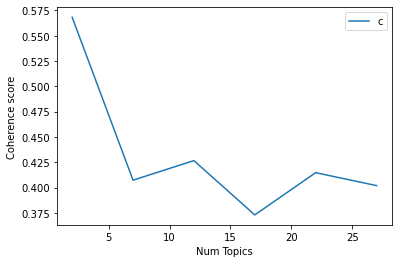

In [319]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us_2021_score1N2N3)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [320]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us_2021_score1N2N3):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 2

index: 0 | Num Topics = 2  has Coherence Value of 0.5681
index: 1 | Num Topics = 7  has Coherence Value of 0.4073
index: 2 | Num Topics = 12  has Coherence Value of 0.4266
index: 3 | Num Topics = 17  has Coherence Value of 0.373
index: 4 | Num Topics = 22  has Coherence Value of 0.4147
index: 5 | Num Topics = 27  has Coherence Value of 0.4019


In [349]:
# Select optimal number of topics
optimal_model_us_2021_score1N2N3 = model_list_us_2021_score1N2N3[0]

In [350]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us_2021_score1N2N3 = pyLDAvis.gensim_models.prepare(optimal_model_us_2021_score1N2N3, corpus_us_2021_score1N2N3, id2word_us_2021_score1N2N3)

In [351]:
print("pyLDAVis for us topics for score=1,2,3 in 2021:")
vis_us_2021_score1N2N3

pyLDAVis for us topics for score=1,2,3 in 2021:


PreparedData(topic_coordinates=              x    y  topics  cluster       Freq
topic                                           
0      0.107498  0.0       1        1  51.758412
1     -0.107498  0.0       2        1  48.241588, topic_info=          Term        Freq       Total Category  logprob  loglift
849       flip  347.000000  347.000000  Default  30.0000  30.0000
763       ryan  246.000000  246.000000  Default  29.0000  29.0000
704     scheme  222.000000  222.000000  Default  28.0000  28.0000
758  kavanaugh  177.000000  177.000000  Default  27.0000  27.0000
828     accuse  176.000000  176.000000  Default  26.0000  26.0000
..         ...         ...         ...      ...      ...      ...
78        give   60.190846  160.272498   Topic2  -5.4363  -0.2504
102        bad   66.977098  250.384138   Topic2  -5.3294  -0.5897
54       video   68.855247  398.234561   Topic2  -5.3018  -1.0261
283     tiktok   59.459779  338.962931   Topic2  -5.4485  -1.0116
174        tok   56.762109  176.510656   Topic2  -5.4949  -0.4056

[147 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
828       2  0.994628     accuse
341       1  0.992988         ad
341       2  0.022568         ad
765       1  0.028028  allegedly
765       2  0.980994  allegedly
...     ...       ...        ...
214       2  0.048962       wish
91        1  0.627535       work
91        2  0.381003       work
20        1  0.937635       year
20        2  0.074024       year

[183 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2])

# Export pyLDAvis as html

In [354]:
# Overall
pyLDAvis.save_html(vis_us,'triller_vis_us.html')

# By-rating 
pyLDAvis.save_html(vis_us_score1,'triller_vis_us_score1.html')
pyLDAvis.save_html(vis_us_score2,'triller_vis_us_score2.html')
pyLDAvis.save_html(vis_us_score3,'triller_vis_us_score3.html')
pyLDAvis.save_html(vis_us_score4,'triller_vis_us_score4.html')
pyLDAvis.save_html(vis_us_score5,'triller_vis_us_score5.html')
pyLDAvis.save_html(vis_us_score1N2N3,'triller_vis_us_score1N2N3.html')

# By-rating of each year
pyLDAvis.save_html(vis_us_2021_score1N2N3,'triller_vis_us_2021_score1N2N3.html')
pyLDAvis.save_html(vis_us_2020_score1N2N3,'triller_vis_us_2020_score1N2N3.html')
pyLDAvis.save_html(vis_us_2019_score1N2N3,'triller_vis_us_2019_score1N2N3.html')
pyLDAvis.save_html(vis_us_2018_score1N2N3,'triller_vis_us_2018_score1N2N3.html')

